In [278]:
#Import needed dependencies
import pandas as pd
import requests
import json
import tweepy
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt

# Gathering

## WeRateDogs Twitter archive

In [279]:
#This is the file given
tweets = pd.read_csv('twitter-archive-enhanced.csv')

## Tweet Image Predictions

In [14]:
#Download file with requests library (NO NEED TO RUN THIS BLOCK!)
url = 'https://d17h27t6h515a5.cloudfront.net/topher/2017/August/599fd2ad_image-predictions/image-predictions.tsv'
r = requests.get(url)
with open('image_predictions.tsv', 'wb') as file:
    file.write(r.content)

In [280]:
#Read file downloaded
predicts = pd.read_csv('image_predictions.tsv', sep='\t')

## Retweet and Favorite Count

In [36]:
#To authenticate tweepy (NO NEED TO RUN THIS BLOCK!)
consumer_key = #Removed for submission
consumer_secret = #Removed for submission
access_token = #Removed for submission
access_secret = #Removed for submission

auth = tweepy.OAuthHandler(consumer_key, consumer_secret)
auth.set_access_token(access_token, access_secret)

api = tweepy.API(auth, wait_on_rate_limit=True, wait_on_rate_limit_notify=True, parser=tweepy.parsers.JSONParser())

In [38]:
#Receive tweets data and append them in a dictionary (NO NEED TO RUN THIS BLOCK! This maneuver will cost us 20-30 minutes!)
data = {}
data['data'] = []
for tweet_id in tweets['tweet_id']:
    try:
        tweet = api.get_status(tweet_id, tweet_mode='extended')
        print(tweet)
        data['data'].append(tweet)
    except tweepy.TweepError:
        continue

{'created_at': 'Tue Aug 01 16:23:56 +0000 2017', 'id': 892420643555336193, 'id_str': '892420643555336193', 'full_text': "This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU", 'truncated': False, 'display_text_range': [0, 85], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 892420639486877696, 'id_str': '892420639486877696', 'indices': [86, 109], 'media_url': 'http://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg', 'url': 'https://t.co/MgUWQ76dJU', 'display_url': 'pic.twitter.com/MgUWQ76dJU', 'expanded_url': 'https://twitter.com/dog_rates/status/892420643555336193/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 540, 'h': 528, 'resize': 'fit'}, 'small': {'w': 540, 'h': 528, 'resize': 'fit'}, 'large': {'w': 540, 'h': 528, 'resize': 'fit'}}}]}, 'extended_entities': {'media

{'created_at': 'Sun Jul 30 15:58:51 +0000 2017', 'id': 891689557279858688, 'id_str': '891689557279858688', 'full_text': 'This is Darla. She commenced a snooze mid meal. 13/10 happens to the best of us https://t.co/tD36da7qLQ', 'truncated': False, 'display_text_range': [0, 79], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 891689552724799489, 'id_str': '891689552724799489', 'indices': [80, 103], 'media_url': 'http://pbs.twimg.com/media/DF_q7IAWsAEuuN8.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DF_q7IAWsAEuuN8.jpg', 'url': 'https://t.co/tD36da7qLQ', 'display_url': 'pic.twitter.com/tD36da7qLQ', 'expanded_url': 'https://twitter.com/dog_rates/status/891689557279858688/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 901, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1201, 'h': 1600, 'resize': 'fit'}}}]}, 'extended_entities': {'media': 

{'created_at': 'Sat Jul 29 00:08:17 +0000 2017', 'id': 891087950875897856, 'id_str': '891087950875897856', 'full_text': "Here we have a majestic great white breaching off South Africa's coast. Absolutely h*ckin breathtaking. 13/10 (IG: tucker_marlo) #BarkWeek https://t.co/kQ04fDDRmh", 'truncated': False, 'display_text_range': [0, 138], 'entities': {'hashtags': [{'text': 'BarkWeek', 'indices': [129, 138]}], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 891087942176911360, 'id_str': '891087942176911360', 'indices': [139, 162], 'media_url': 'http://pbs.twimg.com/media/DF3HwyEWsAABqE6.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DF3HwyEWsAABqE6.jpg', 'url': 'https://t.co/kQ04fDDRmh', 'display_url': 'pic.twitter.com/kQ04fDDRmh', 'expanded_url': 'https://twitter.com/dog_rates/status/891087950875897856/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 899, 'h': 899, 

{'created_at': 'Fri Jul 28 00:22:40 +0000 2017', 'id': 890729181411237888, 'id_str': '890729181411237888', 'full_text': "When you watch your owner call another dog a good boy but then they turn back to you and say you're a great boy. 13/10 https://t.co/v0nONBcwxq", 'truncated': False, 'display_text_range': [0, 118], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 890729118844600320, 'id_str': '890729118844600320', 'indices': [119, 142], 'media_url': 'http://pbs.twimg.com/media/DFyBag_UQAAhhBC.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DFyBag_UQAAhhBC.jpg', 'url': 'https://t.co/v0nONBcwxq', 'display_url': 'pic.twitter.com/v0nONBcwxq', 'expanded_url': 'https://twitter.com/dog_rates/status/890729181411237888/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1200, 'h': 1328, 'resize': 'fit'}, 'medium': {'w': 1084, 'h': 1200, 'resize': 'fit'}, 'small': {'w': 614, 'h': 680, 'resize': '

{'created_at': 'Wed Jul 26 15:59:51 +0000 2017', 'id': 890240255349198849, 'id_str': '890240255349198849', 'full_text': 'This is Cassie. She is a college pup. Studying international doggo communication and stick theory. 14/10 so elegant much sophisticate https://t.co/t1bfwz5S2A', 'truncated': False, 'display_text_range': [0, 133], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 890240245463175168, 'id_str': '890240245463175168', 'indices': [134, 157], 'media_url': 'http://pbs.twimg.com/media/DFrEyVuW0AAO3t9.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DFrEyVuW0AAO3t9.jpg', 'url': 'https://t.co/t1bfwz5S2A', 'display_url': 'pic.twitter.com/t1bfwz5S2A', 'expanded_url': 'https://twitter.com/dog_rates/status/890240255349198849/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 901, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1201, 'h': 160

{'created_at': 'Tue Jul 25 16:11:53 +0000 2017', 'id': 889880896479866881, 'id_str': '889880896479866881', 'full_text': 'This is Bruno. He is a service shark. Only gets out of the water to assist you. 13/10 terrifyingly good boy https://t.co/u1XPQMl29g', 'truncated': False, 'display_text_range': [0, 107], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 889880888800096258, 'id_str': '889880888800096258', 'indices': [108, 131], 'media_url': 'http://pbs.twimg.com/media/DFl99B1WsAITKsg.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DFl99B1WsAITKsg.jpg', 'url': 'https://t.co/u1XPQMl29g', 'display_url': 'pic.twitter.com/u1XPQMl29g', 'expanded_url': 'https://twitter.com/dog_rates/status/889880896479866881/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 895, 'h': 971, 'resize': 'fit'}, 'large': {'w': 895, 'h': 971, 'resize': 'fit'}, 'small': {'w': 627, 'h': 680, 'resize': 'fit'}}}]}, 'ext

{'created_at': 'Mon Jul 24 17:02:04 +0000 2017', 'id': 889531135344209921, 'id_str': '889531135344209921', 'full_text': "This is Stuart. He's sporting his favorite fanny pack. Secretly filled with bones only. 13/10 puppared puppo #BarkWeek https://t.co/y70o6h3isq", 'truncated': False, 'display_text_range': [0, 118], 'entities': {'hashtags': [{'text': 'BarkWeek', 'indices': [109, 118]}], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 889531127467266049, 'id_str': '889531127467266049', 'indices': [119, 142], 'media_url': 'http://pbs.twimg.com/media/DFg_2PVW0AEHN3p.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DFg_2PVW0AEHN3p.jpg', 'url': 'https://t.co/y70o6h3isq', 'display_url': 'pic.twitter.com/y70o6h3isq', 'expanded_url': 'https://twitter.com/dog_rates/status/889531135344209921/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 901, 'h': 1200, 'resize': 'fit'}, '

{'created_at': 'Sun Jul 23 00:22:39 +0000 2017', 'id': 888917238123831296, 'id_str': '888917238123831296', 'full_text': 'This is Jim. He found a fren. Taught him how to sit like the good boys. 12/10 for both https://t.co/chxruIOUJN', 'truncated': False, 'display_text_range': [0, 86], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 888917229776945152, 'id_str': '888917229776945152', 'indices': [87, 110], 'media_url': 'http://pbs.twimg.com/media/DFYRgsOUQAARGhO.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DFYRgsOUQAARGhO.jpg', 'url': 'https://t.co/chxruIOUJN', 'display_url': 'pic.twitter.com/chxruIOUJN', 'expanded_url': 'https://twitter.com/dog_rates/status/888917238123831296/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 901, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1201, 'h': 1600, 'resize': 'fit'}}}]}, 'extended_entities': {'m

{'created_at': 'Sat Jul 22 00:23:06 +0000 2017', 'id': 888554962724278272, 'id_str': '888554962724278272', 'full_text': "This is Ralphus. He's powering up. Attempting maximum borkdrive. 13/10 inspirational af https://t.co/YnYAFCTTiK", 'truncated': False, 'display_text_range': [0, 87], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 888554915546542081, 'id_str': '888554915546542081', 'indices': [88, 111], 'media_url': 'http://pbs.twimg.com/media/DFTH_OiUMAE-k4M.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DFTH_OiUMAE-k4M.jpg', 'url': 'https://t.co/YnYAFCTTiK', 'display_url': 'pic.twitter.com/YnYAFCTTiK', 'expanded_url': 'https://twitter.com/dog_rates/status/888554962724278272/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1600, 'h': 1016, 'resize': 'fit'}, 'small': {'w': 680, 'h': 432, 'resize': 'fit'}, 'medium': {'w': 1200, 'h': 762, 'resize': 'fit'}}}]}, 'extended_entities': {'

{'created_at': 'Wed Jul 19 16:06:48 +0000 2017', 'id': 887705289381826560, 'id_str': '887705289381826560', 'full_text': "This is Jeffrey. He has a monopoly on the pool noodles. Currently running a 'boop for two' midweek sale. 13/10 h*ckin strategic https://t.co/PhrUk20Q64", 'truncated': False, 'display_text_range': [0, 127], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 887705281597243393, 'id_str': '887705281597243393', 'indices': [128, 151], 'media_url': 'http://pbs.twimg.com/media/DFHDQBbXgAEqY7t.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DFHDQBbXgAEqY7t.jpg', 'url': 'https://t.co/PhrUk20Q64', 'display_url': 'pic.twitter.com/PhrUk20Q64', 'expanded_url': 'https://twitter.com/dog_rates/status/887705289381826560/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 383, 'resize': 'fit'}, 'large': {'w': 1600, 'h': 900, 'resize': 'fit'}, 'medium': {'w': 1200, 'h': 675, 'res

{'created_at': 'Wed Jul 19 00:47:34 +0000 2017', 'id': 887473957103951883, 'id_str': '887473957103951883', 'full_text': 'This is Canela. She attempted some fancy porch pics. They were unsuccessful. 13/10 someone help her https://t.co/cLyzpcUcMX', 'truncated': False, 'display_text_range': [0, 99], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 887473949361045505, 'id_str': '887473949361045505', 'indices': [100, 123], 'media_url': 'http://pbs.twimg.com/media/DFDw2tsUAAEw7XW.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DFDw2tsUAAEw7XW.jpg', 'url': 'https://t.co/cLyzpcUcMX', 'display_url': 'pic.twitter.com/cLyzpcUcMX', 'expanded_url': 'https://twitter.com/dog_rates/status/887473957103951883/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 405, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 715, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 900, 'h': 1510, 'resize': 'fit'}}}]}, 'extended_e

{'created_at': 'Tue Jul 18 00:07:08 +0000 2017', 'id': 887101392804085760, 'id_str': '887101392804085760', 'full_text': 'This... is a Jubilant Antarctic House Bear. We only rate dogs. Please only send dogs. Thank you... 12/10 would suffocate in floof https://t.co/4Ad1jzJSdp', 'truncated': False, 'display_text_range': [0, 129], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 887101385971384320, 'id_str': '887101385971384320', 'indices': [130, 153], 'media_url': 'http://pbs.twimg.com/media/DE-eAq6UwAA-jaE.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DE-eAq6UwAA-jaE.jpg', 'url': 'https://t.co/4Ad1jzJSdp', 'display_url': 'pic.twitter.com/4Ad1jzJSdp', 'expanded_url': 'https://twitter.com/dog_rates/status/887101392804085760/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 677, 'resize': 'fit'}, 'large': {'w': 1590, 'h': 1582, 'resize': 'fit'}, 'medium': {'w': 1200, 'h': 1194, 

{'created_at': 'Sun Jul 16 23:58:41 +0000 2017', 'id': 886736880519319552, 'id_str': '886736880519319552', 'full_text': "This is Mingus. He's a wonderful father to his smol pup. Confirmed 13/10, but he needs your help\n\nhttps://t.co/bVi0Yr4Cff https://t.co/ISvKOSkd5b", 'truncated': False, 'display_text_range': [0, 121], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/bVi0Yr4Cff', 'expanded_url': 'https://www.gofundme.com/mingusneedsus', 'display_url': 'gofundme.com/mingusneedsus', 'indices': [98, 121]}], 'media': [{'id': 886736868116754432, 'id_str': '886736868116754432', 'indices': [122, 145], 'media_url': 'http://pbs.twimg.com/media/DE5Se8FXcAAJFx4.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DE5Se8FXcAAJFx4.jpg', 'url': 'https://t.co/ISvKOSkd5b', 'display_url': 'pic.twitter.com/ISvKOSkd5b', 'expanded_url': 'https://twitter.com/dog_rates/status/886736880519319552/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 15

{'created_at': 'Sat Jul 15 23:25:31 +0000 2017', 'id': 886366144734445568, 'id_str': '886366144734445568', 'full_text': 'This is Roscoe. Another pupper fallen victim to spontaneous tongue ejections. Get the BlepiPen immediate. 12/10 deep breaths Roscoe https://t.co/RGE08MIJox', 'truncated': False, 'display_text_range': [0, 131], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 886366138128449536, 'id_str': '886366138128449536', 'indices': [132, 155], 'media_url': 'http://pbs.twimg.com/media/DE0BTnQUwAApKEH.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DE0BTnQUwAApKEH.jpg', 'url': 'https://t.co/RGE08MIJox', 'display_url': 'pic.twitter.com/RGE08MIJox', 'expanded_url': 'https://twitter.com/dog_rates/status/886366144734445568/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 901, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1201, 'h': 1600,

{'created_at': 'Sat Jul 15 02:45:48 +0000 2017', 'id': 886054160059072513, 'id_str': '886054160059072513', 'full_text': 'RT @Athletics: 12/10 #BATP https://t.co/WxwJmvjfxo', 'truncated': False, 'display_text_range': [0, 50], 'entities': {'hashtags': [{'text': 'BATP', 'indices': [21, 26]}], 'symbols': [], 'user_mentions': [{'screen_name': 'Athletics', 'name': "Oakland A's", 'id': 19607400, 'id_str': '19607400', 'indices': [3, 13]}], 'urls': [{'url': 'https://t.co/WxwJmvjfxo', 'expanded_url': 'https://twitter.com/dog_rates/status/886053434075471873', 'display_url': 'twitter.com/dog_rates/stat…', 'indices': [27, 50]}]}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 D

{'created_at': 'Fri Jul 14 22:10:11 +0000 2017', 'id': 885984800019947520, 'id_str': '885984800019947520', 'full_text': 'Viewer discretion advised. This is Jimbo. He will rip ur finger right h*ckin off. Other dog clearly an accessory. 12/10 pls pet with caution https://t.co/BuveP0uMF1', 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 885984792034004992, 'id_str': '885984792034004992', 'indices': [141, 164], 'media_url': 'http://pbs.twimg.com/media/DEumeWWV0AA-Z61.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DEumeWWV0AA-Z61.jpg', 'url': 'https://t.co/BuveP0uMF1', 'display_url': 'pic.twitter.com/BuveP0uMF1', 'expanded_url': 'https://twitter.com/dog_rates/status/885984800019947520/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 1200, 'h': 1183, 'resize': 'fit'}, 'large': {'w': 1200, 'h': 1183, 'resize': 'fit'}, 'small': {'w': 680,

{'created_at': 'Thu Jul 13 01:35:06 +0000 2017', 'id': 885311592912609280, 'id_str': '885311592912609280', 'full_text': 'RT @dog_rates: This is Lilly. She just parallel barked. Kindly requests a reward now. 13/10 would pet so well https://t.co/SATN4If5H5', 'truncated': False, 'display_text_range': [0, 133], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': [], 'media': [{'id': 830583314243268608, 'id_str': '830583314243268608', 'indices': [110, 133], 'media_url': 'http://pbs.twimg.com/media/C4bTH6nWMAAX_bJ.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C4bTH6nWMAAX_bJ.jpg', 'url': 'https://t.co/SATN4If5H5', 'display_url': 'pic.twitter.com/SATN4If5H5', 'expanded_url': 'https://twitter.com/dog_rates/status/830583320585068544/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1536, 'h': 2048, 'resiz

{'created_at': 'Wed Jul 12 16:03:00 +0000 2017', 'id': 885167619883638784, 'id_str': '885167619883638784', 'full_text': 'Here we have a corgi undercover as a malamute. Pawbably doing important investigative work. Zero control over tongue happenings. 13/10 https://t.co/44ItaMubBf', 'truncated': False, 'display_text_range': [0, 134], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 885167573385588737, 'id_str': '885167573385588737', 'indices': [135, 158], 'media_url': 'http://pbs.twimg.com/media/DEi_N9pXsAERvps.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DEi_N9pXsAERvps.jpg', 'url': 'https://t.co/44ItaMubBf', 'display_url': 'pic.twitter.com/44ItaMubBf', 'expanded_url': 'https://twitter.com/dog_rates/status/885167619883638784/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 901, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1201, 'h': 16

{'created_at': 'Tue Jul 11 20:47:12 +0000 2017', 'id': 884876753390489601, 'id_str': '884876753390489601', 'full_text': "This is Lola. It's her first time outside. Must test the earth and taste the atmosphere. 13/10 you're doing great Lola https://t.co/74TKAUsLkO", 'truncated': False, 'display_text_range': [0, 118], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 884876742820859904, 'id_str': '884876742820859904', 'indices': [119, 142], 'media_url': 'http://pbs.twimg.com/media/DEe2tZXXkAAwyX3.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DEe2tZXXkAAwyX3.jpg', 'url': 'https://t.co/74TKAUsLkO', 'display_url': 'pic.twitter.com/74TKAUsLkO', 'expanded_url': 'https://twitter.com/dog_rates/status/884876753390489601/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 1107, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1234, 'h': 1338, 'resize': 'fit'}, 'small': {'w': 627, 'h': 680, 'resize': '

{'created_at': 'Mon Jul 10 15:58:53 +0000 2017', 'id': 884441805382717440, 'id_str': '884441805382717440', 'full_text': 'I present to you, Pup in Hat. Pup in Hat is great for all occasions. Extremely versatile. Compact as h*ck. 14/10 (IG: itselizabethgales) https://t.co/vvBOcC2VdC', 'truncated': False, 'display_text_range': [0, 136], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 884441800177528832, 'id_str': '884441800177528832', 'indices': [137, 160], 'media_url': 'http://pbs.twimg.com/media/DEYrIZwWsAA2Wo5.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DEYrIZwWsAA2Wo5.jpg', 'url': 'https://t.co/vvBOcC2VdC', 'display_url': 'pic.twitter.com/vvBOcC2VdC', 'expanded_url': 'https://twitter.com/dog_rates/status/884441805382717440/photo/1', 'type': 'photo', 'sizes': {'medium': {'w': 1200, 'h': 1172, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1600, 'h': 1562, 'resize': 'fit'}, 'small': {'w': 680, 'h'

{'created_at': 'Sun Jul 09 21:29:42 +0000 2017', 'id': 884162670584377345, 'id_str': '884162670584377345', 'full_text': "Meet Yogi. He doesn't have any important dog meetings today he just enjoys looking his best at all times. 12/10 for dangerously dapper doggo https://t.co/YSI00BzTBZ", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 884162662212489221, 'id_str': '884162662212489221', 'indices': [141, 164], 'media_url': 'http://pbs.twimg.com/media/DEUtQbzW0AUTv_o.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DEUtQbzW0AUTv_o.jpg', 'url': 'https://t.co/YSI00BzTBZ', 'display_url': 'pic.twitter.com/YSI00BzTBZ', 'expanded_url': 'https://twitter.com/dog_rates/status/884162670584377345/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 680, 'h': 611, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1278, 'h': 1148, 'resize': 'fit'}, 'medium': {'w': 1200, 

{'created_at': 'Fri Jul 07 16:22:55 +0000 2017', 'id': 883360690899218434, 'id_str': '883360690899218434', 'full_text': 'Meet Grizzwald. He may be the floofiest floofer I ever did see. Lost eyes saving a schoolbus from a volcano erpuption. 13/10 heroic as h*ck https://t.co/rf661IFEYP', 'truncated': False, 'display_text_range': [0, 139], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 883360682745503744, 'id_str': '883360682745503744', 'indices': [140, 163], 'media_url': 'http://pbs.twimg.com/media/DEJT3FeXoAAtwUy.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DEJT3FeXoAAtwUy.jpg', 'url': 'https://t.co/rf661IFEYP', 'display_url': 'pic.twitter.com/rf661IFEYP', 'expanded_url': 'https://twitter.com/dog_rates/status/883360690899218434/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 544, 'h': 680, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1280, 'h': 1600, 'resize': 'fit'}, 'medium': {'w': 960, 'h

{'created_at': 'Thu Jul 06 15:58:11 +0000 2017', 'id': 882992080364220416, 'id_str': '882992080364220416', 'full_text': "This is Rusty. He wasn't ready for the first pic. Clearly puppared for the second. 13/10 confirmed great boy https://t.co/tyER0KpdXj", 'truncated': False, 'display_text_range': [0, 108], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 882992072327913472, 'id_str': '882992072327913472', 'indices': [109, 132], 'media_url': 'http://pbs.twimg.com/media/DEEEnIqXYAAiJh_.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DEEEnIqXYAAiJh_.jpg', 'url': 'https://t.co/tyER0KpdXj', 'display_url': 'pic.twitter.com/tyER0KpdXj', 'expanded_url': 'https://twitter.com/dog_rates/status/882992080364220416/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 901, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1201, 'h': 1600, 'resize': 'fit'}}}]}, 

{'created_at': 'Wed Jul 05 15:48:34 +0000 2017', 'id': 882627270321602560, 'id_str': '882627270321602560', 'full_text': 'This is Stanley. He has his first swim lesson today. Doggle straps adjusted. Ready to go. 13/10 Phelps is nervous (IG: stanleythe_corgi) https://t.co/Nx52PGwH94', 'truncated': False, 'display_text_range': [0, 136], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 882627261886758912, 'id_str': '882627261886758912', 'indices': [137, 160], 'media_url': 'http://pbs.twimg.com/media/DD-40X3WAAAJPU5.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DD-40X3WAAAJPU5.jpg', 'url': 'https://t.co/Nx52PGwH94', 'display_url': 'pic.twitter.com/Nx52PGwH94', 'expanded_url': 'https://twitter.com/dog_rates/status/882627270321602560/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 548, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 899, 'h': 1116, 'resize': 'fit'}, 'large': {'w': 899, 'h': 1

{'created_at': 'Tue Jul 04 01:18:17 +0000 2017', 'id': 882045870035918850, 'id_str': '882045870035918850', 'full_text': 'This is Koko. Her owner, inspired by Barney, recently built a cart for her to use during walks if she got tired. 13/10 rest easy Koko https://t.co/zeDpnsKX7w', 'truncated': False, 'display_text_range': [0, 133], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 882045864507736065, 'id_str': '882045864507736065', 'indices': [134, 157], 'media_url': 'http://pbs.twimg.com/media/DD2oCl2WAAEI_4a.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DD2oCl2WAAEI_4a.jpg', 'url': 'https://t.co/zeDpnsKX7w', 'display_url': 'pic.twitter.com/zeDpnsKX7w', 'expanded_url': 'https://twitter.com/dog_rates/status/882045870035918850/photo/1', 'type': 'photo', 'sizes': {'medium': {'w': 749, 'h': 1017, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 749, 'h': 1017, 'resize': 'fit'}, 'small': {'w': 501, 'h': 680

{'created_at': 'Mon Jul 03 00:11:11 +0000 2017', 'id': 881666595344535552, 'id_str': '881666595344535552', 'full_text': "This is Gary. He couldn't miss this puppertunity for a selfie. Flawless focusing skills. 13/10 would boop intensely https://t.co/7CSWCl8I6s", 'truncated': False, 'display_text_range': [0, 115], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 881666587375304705, 'id_str': '881666587375304705', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/DDxPFwbWAAEbVVR.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DDxPFwbWAAEbVVR.jpg', 'url': 'https://t.co/7CSWCl8I6s', 'display_url': 'pic.twitter.com/7CSWCl8I6s', 'expanded_url': 'https://twitter.com/dog_rates/status/881666595344535552/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 901, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1201, 'h': 1600, 'resize': 'fit'

{'created_at': 'Sat Jul 01 21:49:04 +0000 2017', 'id': 881268444196462592, 'id_str': '881268444196462592', 'full_text': "Meet Elliot. He's a Canadian Forrest Pup. Unusual number of antlers for a dog. Sneaky tongue slip to celebrate #Canada150. 12/10 would pet https://t.co/cgwJwowTMC", 'truncated': False, 'display_text_range': [0, 138], 'entities': {'hashtags': [{'text': 'Canada150', 'indices': [111, 121]}], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 881268439486169090, 'id_str': '881268439486169090', 'indices': [139, 162], 'media_url': 'http://pbs.twimg.com/media/DDrk-f9WAAI-WQv.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DDrk-f9WAAI-WQv.jpg', 'url': 'https://t.co/cgwJwowTMC', 'display_url': 'pic.twitter.com/cgwJwowTMC', 'expanded_url': 'https://twitter.com/dog_rates/status/881268444196462592/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 900, 'h': 612, 'resize': 'fit'}, 'small': {'w': 680, 'h': 462,

{'created_at': 'Thu Jun 29 16:39:47 +0000 2017', 'id': 880465832366813184, 'id_str': '880465832366813184', 'full_text': 'This is Bella. She had her first beach experience this morning. Complete success. 12/10 would perform a sandy boop https://t.co/4VsFysDmiw', 'truncated': False, 'display_text_range': [0, 114], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 880465790071427074, 'id_str': '880465790071427074', 'indices': [115, 138], 'media_url': 'http://pbs.twimg.com/media/DDgK-J4XUAIEV9W.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DDgK-J4XUAIEV9W.jpg', 'url': 'https://t.co/4VsFysDmiw', 'display_url': 'pic.twitter.com/4VsFysDmiw', 'expanded_url': 'https://twitter.com/dog_rates/status/880465832366813184/photo/1', 'type': 'photo', 'sizes': {'large': {'w': 1201, 'h': 1600, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 901, 'h': 1200, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}

{'created_at': 'Wed Jun 28 16:09:20 +0000 2017', 'id': 880095782870896641, 'id_str': '880095782870896641', 'full_text': "Please don't send in photos without dogs in them. We're not @porch_rates. Insubordinate and churlish. Pretty good porch tho 11/10 https://t.co/HauE8M3Bu4", 'truncated': False, 'display_text_range': [0, 129], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'porch_rates', 'name': 'porches', 'id': 880096313915752450, 'id_str': '880096313915752450', 'indices': [60, 72]}], 'urls': [], 'media': [{'id': 880095777175076864, 'id_str': '880095777175076864', 'indices': [130, 153], 'media_url': 'http://pbs.twimg.com/media/DDa6ckbXgAAM1vV.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DDa6ckbXgAAM1vV.jpg', 'url': 'https://t.co/HauE8M3Bu4', 'display_url': 'pic.twitter.com/HauE8M3Bu4', 'expanded_url': 'https://twitter.com/dog_rates/status/880095782870896641/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'sm

{'created_at': 'Tue Jun 27 12:14:36 +0000 2017', 'id': 879674319642796034, 'id_str': '879674319642796034', 'full_text': '@RealKentMurphy 14/10 confirmed', 'truncated': False, 'display_text_range': [16, 31], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'RealKentMurphy', 'name': 'Kent', 'id': 3105440746, 'id_str': '3105440746', 'indices': [0, 15]}], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': 879553827334172678, 'in_reply_to_status_id_str': '879553827334172678', 'in_reply_to_user_id': 3105440746, 'in_reply_to_user_id_str': '3105440746', 'in_reply_to_screen_name': 'RealKentMurphy', 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs partnerships@weratedogs.com ⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀', 'url': 'https://

{'created_at': 'Mon Jun 26 16:31:08 +0000 2017', 'id': 879376492567855104, 'id_str': '879376492567855104', 'full_text': "This is Jack AKA Stephen Furry. You're not scoring on him. Unless he slips down the slide. 12/10 would happily get blocked by https://t.co/0gOi601EAa", 'truncated': False, 'display_text_range': [0, 125], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 879376482266632192, 'id_str': '879376482266632192', 'indices': [126, 149], 'media_url': 'http://pbs.twimg.com/media/DDQsQGFV0AAw6u9.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DDQsQGFV0AAw6u9.jpg', 'url': 'https://t.co/0gOi601EAa', 'display_url': 'pic.twitter.com/0gOi601EAa', 'expanded_url': 'https://twitter.com/dog_rates/status/879376492567855104/photo/1', 'type': 'photo', 'sizes': {'medium': {'w': 1200, 'h': 1112, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1600, 'h': 1482, 'resize': 'fit'}, 'small': {'w': 680, 'h': 630, 'res

{'created_at': 'Sun Jun 25 18:56:45 +0000 2017', 'id': 879050749262655488, 'id_str': '879050749262655488', 'full_text': 'This is Steven. He has trouble relating to other dogs. Quite shy. Neck longer than average. Tropical probably. 11/10 would still pet https://t.co/2mJCDEJWdD', 'truncated': False, 'display_text_range': [0, 132], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 879050744279834628, 'id_str': '879050744279834628', 'indices': [133, 156], 'media_url': 'http://pbs.twimg.com/media/DDMD_phXoAQ1qf0.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DDMD_phXoAQ1qf0.jpg', 'url': 'https://t.co/2mJCDEJWdD', 'display_url': 'pic.twitter.com/2mJCDEJWdD', 'expanded_url': 'https://twitter.com/dog_rates/status/879050749262655488/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 382, 'h': 680, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 899, 'h': 1600, 'resize': 'fit'}, 'medium': {'w': 674, 'h': 1200,

{'created_at': 'Sat Jun 24 13:24:20 +0000 2017', 'id': 878604707211726852, 'id_str': '878604707211726852', 'full_text': 'Martha is stunning how h*ckin dare you. 13/10 https://t.co/9uABQXgjwa', 'truncated': False, 'display_text_range': [0, 45], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/9uABQXgjwa', 'expanded_url': 'https://twitter.com/bbcworld/status/878599868507402241', 'display_url': 'twitter.com/bbcworld/statu…', 'indices': [46, 69]}]}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs partnerships@w

{'created_at': 'Fri Jun 23 18:17:33 +0000 2017', 'id': 878316110768087041, 'id_str': '878316110768087041', 'full_text': "RT @dog_rates: Meet Terrance. He's being yelled at because he stapled the wrong stuff together. 11/10 hang in there Terrance https://t.co/i…", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs part

{'created_at': 'Fri Jun 23 01:10:23 +0000 2017', 'id': 878057613040115712, 'id_str': '878057613040115712', 'full_text': 'This is Emmy. She was adopted today. Massive round of pupplause for Emmy and her new family. 14/10 for all involved https://t.co/cwtWnHMVpe', 'truncated': False, 'display_text_range': [0, 115], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 878057599261745152, 'id_str': '878057599261745152', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/DC98vABUIAA97pz.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DC98vABUIAA97pz.jpg', 'url': 'https://t.co/cwtWnHMVpe', 'display_url': 'pic.twitter.com/cwtWnHMVpe', 'expanded_url': 'https://twitter.com/dog_rates/status/878057613040115712/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 680, 'h': 474, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 1200, 'h': 837, 'resize': 'fit'}, 'large': {'w': 1599, 'h': 1115, 'resize': 'fit'

{'created_at': 'Wed Jun 21 19:36:23 +0000 2017', 'id': 877611172832227328, 'id_str': '877611172832227328', 'full_text': 'RT @rachel2195: @dog_rates the boyfriend and his soaking wet pupper h*cking love his new hat 14/10 https://t.co/dJx4Gzc50G', 'truncated': False, 'display_text_range': [0, 122], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'rachel2195', 'name': 'Rachel Baker', 'id': 512804507, 'id_str': '512804507', 'indices': [3, 14]}, {'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [16, 26]}], 'urls': [], 'media': [{'id': 876850756556607488, 'id_str': '876850756556607488', 'indices': [99, 122], 'media_url': 'http://pbs.twimg.com/media/DCszHgmW0AAmIpT.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DCszHgmW0AAmIpT.jpg', 'url': 'https://t.co/dJx4Gzc50G', 'display_url': 'pic.twitter.com/dJx4Gzc50G', 'expanded_url': 'https://twitter.com/rachel2195/status/876850772322988033/photo/1', 'type': '

{'created_at': 'Wed Jun 21 15:58:08 +0000 2017', 'id': 877556246731214848, 'id_str': '877556246731214848', 'full_text': "This is Penny. She's both pupset and fired pup. Not pleased w your barbaric attempts at cleanliness. 12/10 would enjoy more shampoo options https://t.co/OYdDlfOGXP", 'truncated': False, 'display_text_range': [0, 139], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 877556240326512640, 'id_str': '877556240326512640', 'indices': [140, 163], 'media_url': 'http://pbs.twimg.com/media/DC20wEcW0AAf59m.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DC20wEcW0AAf59m.jpg', 'url': 'https://t.co/OYdDlfOGXP', 'display_url': 'pic.twitter.com/OYdDlfOGXP', 'expanded_url': 'https://twitter.com/dog_rates/status/877556246731214848/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 674, 'resize': 'fit'}, 'large': {'w': 1600, 'h': 1586, 'resize': 'fit'}, 'medium': {'w': 1200, '

{'created_at': 'Tue Jun 20 16:29:50 +0000 2017', 'id': 877201837425926144, 'id_str': '877201837425926144', 'full_text': "This is Nelly. He graduated with his dogtorate today. Wants to know if you're proud of him. 12/10 would give congratulatory boop https://t.co/4g4cfj3P4Y", 'truncated': False, 'display_text_range': [0, 128], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 877201827330174976, 'id_str': '877201827330174976', 'indices': [129, 152], 'media_url': 'http://pbs.twimg.com/media/DCxyahJWsAAddSC.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DCxyahJWsAAddSC.jpg', 'url': 'https://t.co/4g4cfj3P4Y', 'display_url': 'pic.twitter.com/4g4cfj3P4Y', 'expanded_url': 'https://twitter.com/dog_rates/status/877201837425926144/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 901, 'h': 1200, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 1201, 'h': 1600, 'r

{'created_at': 'Sun Jun 18 20:30:39 +0000 2017', 'id': 876537666061221889, 'id_str': '876537666061221889', 'full_text': 'I can say with the pupmost confidence that the doggos who assisted with this search are heroic as h*ck. 14/10 for all https://t.co/8yoc1CNTsu', 'truncated': False, 'display_text_range': [0, 117], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/8yoc1CNTsu', 'expanded_url': 'https://twitter.com/mpstowerham/status/876162994446753793', 'display_url': 'twitter.com/mpstowerham/st…', 'indices': [118, 141]}]}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source F

{'created_at': 'Sat Jun 17 16:52:05 +0000 2017', 'id': 876120275196170240, 'id_str': '876120275196170240', 'full_text': 'Meet Venti, a seemingly caffeinated puppoccino. She was just informed the weekend would include walks, pats and scritches. 13/10 much excite https://t.co/ejExJFq3ek', 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 876120269428932608, 'id_str': '876120269428932608', 'indices': [141, 164], 'media_url': 'http://pbs.twimg.com/media/DCiavj_UwAAcXep.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DCiavj_UwAAcXep.jpg', 'url': 'https://t.co/ejExJFq3ek', 'display_url': 'pic.twitter.com/ejExJFq3ek', 'expanded_url': 'https://twitter.com/dog_rates/status/876120275196170240/photo/1', 'type': 'photo', 'sizes': {'medium': {'w': 1200, 'h': 901, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 510, 'resize': 'fit'}, 'large': {'w': 1600, '

{'created_at': 'Wed Jun 14 21:06:43 +0000 2017', 'id': 875097192612077568, 'id_str': '875097192612077568', 'full_text': "You'll get your package when that precious man is done appreciating the pups. 13/10 for everyone https://t.co/PFp4MghzBW", 'truncated': False, 'display_text_range': [0, 96], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/PFp4MghzBW', 'expanded_url': 'https://twitter.com/drboondoc/status/874413398133547008', 'display_url': 'twitter.com/drboondoc/stat…', 'indices': [97, 120]}]}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratin

{'created_at': 'Tue Jun 13 17:29:20 +0000 2017', 'id': 874680097055178752, 'id_str': '874680097055178752', 'full_text': 'Meet Cash. He hath acquired a stick. A very good stick tbh. 12/10 would pat head approvingly https://t.co/lZhtizkURD', 'truncated': False, 'display_text_range': [0, 92], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 874680081829904384, 'id_str': '874680081829904384', 'indices': [93, 116], 'media_url': 'http://pbs.twimg.com/media/DCN85nGUwAAzG_q.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DCN85nGUwAAzG_q.jpg', 'url': 'https://t.co/lZhtizkURD', 'display_url': 'pic.twitter.com/lZhtizkURD', 'expanded_url': 'https://twitter.com/dog_rates/status/874680097055178752/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 901, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1201, 'h': 1600, 'resize': 'fit'}}}]}, 'extended_entities

{'created_at': 'Mon Jun 12 16:06:11 +0000 2017', 'id': 874296783580663808, 'id_str': '874296783580663808', 'full_text': 'This is Jed. He may be the fanciest pupper in the game right now. Knows it too. 13/10 would sign modeling contract https://t.co/0YplNnSMEm', 'truncated': False, 'display_text_range': [0, 114], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 874296776056078336, 'id_str': '874296776056078336', 'indices': [115, 138], 'media_url': 'http://pbs.twimg.com/media/DCIgSR0XgAANEOY.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DCIgSR0XgAANEOY.jpg', 'url': 'https://t.co/0YplNnSMEm', 'display_url': 'pic.twitter.com/0YplNnSMEm', 'expanded_url': 'https://twitter.com/dog_rates/status/874296783580663808/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 945, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1260, 'h': 1600, 'resize': 'fit'}, 'small': {'w': 536, 'h': 680, 'resize': 'fit'}

{'created_at': 'Sat Jun 10 16:39:04 +0000 2017', 'id': 873580283840344065, 'id_str': '873580283840344065', 'full_text': "We usually don't rate Deck-bound Saskatoon Black Bears, but this one is h*ckin flawless. Sneaky tongue slip too. 13/10 would hug firmly https://t.co/mNuMH9400n", 'truncated': False, 'display_text_range': [0, 135], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 873580279771926529, 'id_str': '873580279771926529', 'indices': [136, 159], 'media_url': 'http://pbs.twimg.com/media/DB-UotKXkAEHXVi.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DB-UotKXkAEHXVi.jpg', 'url': 'https://t.co/mNuMH9400n', 'display_url': 'pic.twitter.com/mNuMH9400n', 'expanded_url': 'https://twitter.com/dog_rates/status/873580283840344065/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 901, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1201, 'h': 1

{'created_at': 'Fri Jun 09 16:22:42 +0000 2017', 'id': 873213775632977920, 'id_str': '873213775632977920', 'full_text': "This is Sierra. She's one precious pupper. Absolute 12/10. Been in and out of ICU her whole life. Help Sierra below\n\nhttps://t.co/Xp01EU3qyD https://t.co/V5lkvrGLdQ", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/Xp01EU3qyD', 'expanded_url': 'https://www.gofundme.com/help-my-baby-sierra-get-better', 'display_url': 'gofundme.com/help-my-baby-s…', 'indices': [117, 140]}], 'media': [{'id': 873213769794670593, 'id_str': '873213769794670593', 'indices': [141, 164], 'media_url': 'http://pbs.twimg.com/media/DB5HTBGXUAE0TiK.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DB5HTBGXUAE0TiK.jpg', 'url': 'https://t.co/V5lkvrGLdQ', 'display_url': 'pic.twitter.com/V5lkvrGLdQ', 'expanded_url': 'https://twitter.com/dog_rates/status/873213775632977920/photo/1', 'type': 'photo'

{'created_at': 'Thu Jun 08 14:20:41 +0000 2017', 'id': 872820683541237760, 'id_str': '872820683541237760', 'full_text': 'Here are my favorite #dogsatpollingstations \nMost voted for a more consistent walking schedule and to increase daily pats tenfold. All 13/10 https://t.co/17FVMl4VZ5', 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [{'text': 'dogsatpollingstations', 'indices': [21, 43]}], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 872820673743376386, 'id_str': '872820673743376386', 'indices': [141, 164], 'media_url': 'http://pbs.twimg.com/media/DBzhx0MXUAI5spb.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DBzhx0MXUAI5spb.jpg', 'url': 'https://t.co/17FVMl4VZ5', 'display_url': 'pic.twitter.com/17FVMl4VZ5', 'expanded_url': 'https://twitter.com/dog_rates/status/872820683541237760/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 583, 'h': 479, 'resize': 'fit'}, 'large': {'w': 58

{'created_at': 'Wed Jun 07 16:14:40 +0000 2017', 'id': 872486979161796608, 'id_str': '872486979161796608', 'full_text': 'We. Only. Rate. Dogs. Do not send in other things like this fluffy floor shark clearly ready to attack. Get it together guys... 12/10 https://t.co/BZHiKx3FpQ', 'truncated': False, 'display_text_range': [0, 133], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 872486967967006720, 'id_str': '872486967967006720', 'indices': [134, 157], 'media_url': 'http://pbs.twimg.com/media/DBuyRlTUwAAYhG9.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DBuyRlTUwAAYhG9.jpg', 'url': 'https://t.co/BZHiKx3FpQ', 'display_url': 'pic.twitter.com/BZHiKx3FpQ', 'expanded_url': 'https://twitter.com/dog_rates/status/872486979161796608/photo/1', 'type': 'photo', 'sizes': {'large': {'w': 1586, 'h': 1600, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 674, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 1190, 'h': 12

{'created_at': 'Tue Jun 06 00:01:46 +0000 2017', 'id': 871879754684805121, 'id_str': '871879754684805121', 'full_text': "Say hello to Lassie. She's celebrating #PrideMonth by being a splendid mix of astute and adorable. Proudly supupporting her owner. 13/10 https://t.co/uK6PNyeh9w", 'truncated': False, 'display_text_range': [0, 136], 'entities': {'hashtags': [{'text': 'PrideMonth', 'indices': [39, 50]}], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 871879745683804161, 'id_str': '871879745683804161', 'indices': [137, 160], 'media_url': 'http://pbs.twimg.com/media/DBmKAmBXUAE-pQ-.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DBmKAmBXUAE-pQ-.jpg', 'url': 'https://t.co/uK6PNyeh9w', 'display_url': 'pic.twitter.com/uK6PNyeh9w', 'expanded_url': 'https://twitter.com/dog_rates/status/871879754684805121/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 1201, 'h': 1600, '

{'created_at': 'Sun Jun 04 23:56:03 +0000 2017', 'id': 871515927908634625, 'id_str': '871515927908634625', 'full_text': "This is Napolean. He's a Raggedy East Nicaraguan Zoom Zoom. Runs on one leg. Built for deception. No eyes. Good with kids. 12/10 great doggo https://t.co/PR7B7w1rUw", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 871515922741284865, 'id_str': '871515922741284865', 'indices': [141, 164], 'media_url': 'http://pbs.twimg.com/media/DBg_HT8XUAEoyo_.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DBg_HT8XUAEoyo_.jpg', 'url': 'https://t.co/PR7B7w1rUw', 'display_url': 'pic.twitter.com/PR7B7w1rUw', 'expanded_url': 'https://twitter.com/dog_rates/status/871515927908634625/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1600, 'h': 1064, 'resize': 'fit'}, 'medium': {'w': 1200, 'h': 798, 'resize': 'fit'}, 'small': {'w': 680, 

{'created_at': 'Sat Jun 03 20:33:19 +0000 2017', 'id': 871102520638267392, 'id_str': '871102520638267392', 'full_text': 'Never doubt a doggo 14/10 https://t.co/AbBLh2FZCH', 'truncated': False, 'display_text_range': [0, 25], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/AbBLh2FZCH', 'expanded_url': 'https://twitter.com/animalcog/status/871075758080503809', 'display_url': 'twitter.com/animalcog/stat…', 'indices': [26, 49]}]}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs partnerships@weratedogs.com ⠀⠀⠀⠀⠀

{'created_at': 'Sat Jun 03 00:48:22 +0000 2017', 'id': 870804317367881728, 'id_str': '870804317367881728', 'full_text': "Real funny guys. Sending in a pic without a dog in it. Hilarious. We'll rate the rug tho because it's giving off a very good vibe. 11/10 https://t.co/GCD1JccCyi", 'truncated': False, 'display_text_range': [0, 136], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 870804299743338497, 'id_str': '870804299743338497', 'indices': [137, 160], 'media_url': 'http://pbs.twimg.com/media/DBW35ZsVoAEWZUU.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DBW35ZsVoAEWZUU.jpg', 'url': 'https://t.co/GCD1JccCyi', 'display_url': 'pic.twitter.com/GCD1JccCyi', 'expanded_url': 'https://twitter.com/dog_rates/status/870804317367881728/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 901, 'h': 1600, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 676, 'h': 1

{'created_at': 'Thu Jun 01 20:18:38 +0000 2017', 'id': 870374049280663552, 'id_str': '870374049280663552', 'full_text': 'This is Zoey. She really likes the planet. Would hate to see willful ignorance and the denial of fairly elemental science destroy it. 13/10 https://t.co/T1xlgaPujm', 'truncated': False, 'display_text_range': [0, 139], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 870374041554751488, 'id_str': '870374041554751488', 'indices': [140, 163], 'media_url': 'http://pbs.twimg.com/media/DBQwlFCXkAACSkI.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DBQwlFCXkAACSkI.jpg', 'url': 'https://t.co/T1xlgaPujm', 'display_url': 'pic.twitter.com/T1xlgaPujm', 'expanded_url': 'https://twitter.com/dog_rates/status/870374049280663552/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 646, 'resize': 'fit'}, 'large': {'w': 1600, 'h': 1520, 'resize': 'fit'}, 'medium': {'w': 1200, '

{'created_at': 'Wed May 31 23:43:25 +0000 2017', 'id': 870063196459192321, 'id_str': '870063196459192321', 'full_text': "Meet Clifford. He's quite large. Also red. Good w kids. Somehow never steps on them. Massive poops very inconvenient. Still 14/10 would ride https://t.co/apVOyDgOju", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 870063191304392704, 'id_str': '870063191304392704', 'indices': [141, 164], 'media_url': 'http://pbs.twimg.com/media/DBMV3NnXUAAm0Pp.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DBMV3NnXUAAm0Pp.jpg', 'url': 'https://t.co/apVOyDgOju', 'display_url': 'pic.twitter.com/apVOyDgOju', 'expanded_url': 'https://twitter.com/dog_rates/status/870063196459192321/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 1014, 'h': 761, 'resize': 'fit'}, 'small': {'w': 680, 'h': 510, 'resize': 'fit'}, 'large': {'w': 1014, '

{'created_at': 'Tue May 30 23:51:58 +0000 2017', 'id': 869702957897576449, 'id_str': '869702957897576449', 'full_text': "Meet Stanley. He likes road trips. Will shift for you. One ear more effective than other. 13/10 we don't leave until you buckle pup Stanley https://t.co/vmCu3PFCQq", 'truncated': False, 'display_text_range': [0, 139], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 869702951354474496, 'id_str': '869702951354474496', 'indices': [140, 163], 'media_url': 'http://pbs.twimg.com/media/DBHOOfOXoAABKlU.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DBHOOfOXoAABKlU.jpg', 'url': 'https://t.co/vmCu3PFCQq', 'display_url': 'pic.twitter.com/vmCu3PFCQq', 'expanded_url': 'https://twitter.com/dog_rates/status/869702957897576449/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 901, 'h': 1600, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 676, 'h'

{'created_at': 'Mon May 29 16:24:37 +0000 2017', 'id': 869227993411051520, 'id_str': '869227993411051520', 'full_text': 'This is Gizmo. His favorite thing is standing pupright like a hooman. Sneaky tongue slip status achieved. 13/10 would boop well https://t.co/IoR3n1fiiQ', 'truncated': False, 'display_text_range': [0, 127], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 869227980345798656, 'id_str': '869227980345798656', 'indices': [128, 151], 'media_url': 'http://pbs.twimg.com/media/DBAePiVXcAAqHSR.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DBAePiVXcAAqHSR.jpg', 'url': 'https://t.co/IoR3n1fiiQ', 'display_url': 'pic.twitter.com/IoR3n1fiiQ', 'expanded_url': 'https://twitter.com/dog_rates/status/869227993411051520/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 570, 'h': 680, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1008, 'h': 1203, 'resize': 'fit'}, 'medium': {'w': 1005, 'h': 1200, 'r

{'created_at': 'Sun May 28 00:18:35 +0000 2017', 'id': 868622495443632128, 'id_str': '868622495443632128', 'full_text': "Here's a h*ckin peaceful boy. Unbothered by the comings and goings. 13/10 please reveal your wise ways https://t.co/yeaH8Ej5eM", 'truncated': False, 'display_text_range': [0, 102], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 868622480696651777, 'id_str': '868622480696651777', 'indices': [103, 126], 'media_url': 'http://pbs.twimg.com/media/DA33i0XXsAEQtCA.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DA33i0XXsAEQtCA.jpg', 'url': 'https://t.co/yeaH8Ej5eM', 'display_url': 'pic.twitter.com/yeaH8Ej5eM', 'expanded_url': 'https://twitter.com/dog_rates/status/868622495443632128/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 637, 'h': 680, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1199, 'h': 1280, 'resize': 'fit'}, 'medium': {'w': 1124, 'h': 1200, 'resize': 'fit'}}}]}, 'exte

{'created_at': 'Fri May 26 00:29:37 +0000 2017', 'id': 867900495410671616, 'id_str': '867900495410671616', 'full_text': 'Unbelievable. We only rate dogs. Please don\'t send in non-canines like the "I" from Pixar\'s opening credits. Thank you... 12/10 https://t.co/JMhDNv5wXZ', 'truncated': False, 'display_text_range': [0, 127], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 867900486011297792, 'id_str': '867900486011297792', 'indices': [128, 151], 'media_url': 'http://pbs.twimg.com/media/DAtm5MkXoAA4R6P.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DAtm5MkXoAA4R6P.jpg', 'url': 'https://t.co/JMhDNv5wXZ', 'display_url': 'pic.twitter.com/JMhDNv5wXZ', 'expanded_url': 'https://twitter.com/dog_rates/status/867900495410671616/photo/1', 'type': 'photo', 'sizes': {'medium': {'w': 1005, 'h': 1200, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1340, 'h': 1600, 'resize': 'fit'}, 'small': {'w': 570, 'h': 680, 

{'created_at': 'Wed May 24 16:44:18 +0000 2017', 'id': 867421006826221569, 'id_str': '867421006826221569', 'full_text': 'This is Shikha. She just watched you drop a skittle on the ground and still eat it. Could not be less impressed. 12/10 superior puppo https://t.co/XZlZKd73go', 'truncated': False, 'display_text_range': [0, 133], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 867420991437365250, 'id_str': '867420991437365250', 'indices': [134, 157], 'media_url': 'http://pbs.twimg.com/media/DAmyy8FXYAIH8Ty.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DAmyy8FXYAIH8Ty.jpg', 'url': 'https://t.co/XZlZKd73go', 'display_url': 'pic.twitter.com/XZlZKd73go', 'expanded_url': 'https://twitter.com/dog_rates/status/867421006826221569/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 901, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1201, 'h': 160

{'created_at': 'Tue May 23 16:16:06 +0000 2017', 'id': 867051520902168576, 'id_str': '867051520902168576', 'full_text': "Oh my this spooked me up. We only rate dogs, not happy ghosts. Please send dogs only. It's a very simple premise. Thank you... 13/10 https://t.co/M5Rz0R8SIQ", 'truncated': False, 'display_text_range': [0, 132], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 867051512509460480, 'id_str': '867051512509460480', 'indices': [133, 156], 'media_url': 'http://pbs.twimg.com/media/DAhiwb0XcAA8x5Q.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DAhiwb0XcAA8x5Q.jpg', 'url': 'https://t.co/M5Rz0R8SIQ', 'display_url': 'pic.twitter.com/M5Rz0R8SIQ', 'expanded_url': 'https://twitter.com/dog_rates/status/867051520902168576/photo/1', 'type': 'photo', 'sizes': {'medium': {'w': 1200, 'h': 1199, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 680, 'resize': 'fit'}, 'large': {'w': 1601, 'h': 160

{'created_at': 'Mon May 22 16:06:55 +0000 2017', 'id': 866686824827068416, 'id_str': '866686824827068416', 'full_text': "This is Lili. She can't believe you betrayed her with bath time. Never looking you in the eye again. 12/10 would puppologize profusely https://t.co/9b9J46E86Z", 'truncated': False, 'display_text_range': [0, 134], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 866686816879087618, 'id_str': '866686816879087618', 'indices': [135, 158], 'media_url': 'http://pbs.twimg.com/media/DAcXEWuXkAIBDGJ.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DAcXEWuXkAIBDGJ.jpg', 'url': 'https://t.co/9b9J46E86Z', 'display_url': 'pic.twitter.com/9b9J46E86Z', 'expanded_url': 'https://twitter.com/dog_rates/status/866686824827068416/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 901, 'h': 1600, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 676, 'h': 120

{'created_at': 'Sun May 21 16:48:45 +0000 2017', 'id': 866334964761202691, 'id_str': '866334964761202691', 'full_text': "This is Coco. At first I thought she was a cloud but clouds don't bork with such passion. 12/10 would hug softly https://t.co/W86h5dgR6c", 'truncated': False, 'display_text_range': [0, 112], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 866334954229301248, 'id_str': '866334954229301248', 'indices': [113, 136], 'media_url': 'http://pbs.twimg.com/media/DAXXDQNXgAAoYQH.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DAXXDQNXgAAoYQH.jpg', 'url': 'https://t.co/W86h5dgR6c', 'display_url': 'pic.twitter.com/W86h5dgR6c', 'expanded_url': 'https://twitter.com/dog_rates/status/866334964761202691/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 901, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1201, 'h': 1600, 'resize': 'fit'}}}

{'created_at': 'Fri May 19 23:57:46 +0000 2017', 'id': 865718153858494464, 'id_str': '865718153858494464', 'full_text': "Meet Boomer. He's just checking pup on you. Hopes you had a good day. If not, he hopes he made it better. 13/10 extremely good boy https://t.co/pozUoHLkGg", 'truncated': False, 'display_text_range': [0, 130], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 865718147889979392, 'id_str': '865718147889979392', 'indices': [131, 154], 'media_url': 'http://pbs.twimg.com/media/DAOmEZiXYAAcv2S.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DAOmEZiXYAAcv2S.jpg', 'url': 'https://t.co/pozUoHLkGg', 'display_url': 'pic.twitter.com/pozUoHLkGg', 'expanded_url': 'https://twitter.com/dog_rates/status/865718153858494464/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 900, 'h': 1600, 'resize': 'fit'}, 'medium': {'w': 675, 'h': 1200, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, '

{'created_at': 'Thu May 18 00:50:50 +0000 2017', 'id': 865006731092295680, 'id_str': '865006731092295680', 'full_text': 'This is Nelly. He really hopes you like his Hawaiian shirt. He already tore the tags off. 13/10 h*ck of a puppurchase https://t.co/LbkG5CiM7o', 'truncated': False, 'display_text_range': [0, 117], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 865006724092010496, 'id_str': '865006724092010496', 'indices': [118, 141], 'media_url': 'http://pbs.twimg.com/media/DAEfCFXUIAA1uqj.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DAEfCFXUIAA1uqj.jpg', 'url': 'https://t.co/LbkG5CiM7o', 'display_url': 'pic.twitter.com/LbkG5CiM7o', 'expanded_url': 'https://twitter.com/dog_rates/status/865006731092295680/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1402, 'h': 1600, 'resize': 'fit'}, 'small': {'w': 596, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 1052, 'h': 1200, 'resize': 'f

{'created_at': 'Tue May 16 00:41:21 +0000 2017', 'id': 864279568663928832, 'id_str': '864279568663928832', 'full_text': "This is Meatball. He doing what's known in the industry as a mid-strut mlem. H*ckin fancy boy. 12/10 I'd do anything for Meatball https://t.co/S2HdmFFPck", 'truncated': False, 'display_text_range': [0, 129], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 864279556340957184, 'id_str': '864279556340957184', 'indices': [130, 153], 'media_url': 'http://pbs.twimg.com/media/C_6JrWZVwAAHhCD.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C_6JrWZVwAAHhCD.jpg', 'url': 'https://t.co/S2HdmFFPck', 'display_url': 'pic.twitter.com/S2HdmFFPck', 'expanded_url': 'https://twitter.com/dog_rates/status/864279568663928832/photo/1', 'type': 'photo', 'sizes': {'medium': {'w': 1200, 'h': 1008, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 571, 'resize': 'fit'}, 'large': {'w': 1600, 'h': 1344, 

{'created_at': 'Mon May 15 00:02:33 +0000 2017', 'id': 863907417377173506, 'id_str': '863907417377173506', 'full_text': "This is Albus. He's quite impressive at hide and seek. Knows he's been found this time. 13/10 usually elusive as h*ck https://t.co/ht47njyZ64", 'truncated': False, 'display_text_range': [0, 117], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 863907404156518400, 'id_str': '863907404156518400', 'indices': [118, 141], 'media_url': 'http://pbs.twimg.com/media/C_03NPeUQAAgrMl.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C_03NPeUQAAgrMl.jpg', 'url': 'https://t.co/ht47njyZ64', 'display_url': 'pic.twitter.com/ht47njyZ64', 'expanded_url': 'https://twitter.com/dog_rates/status/863907417377173506/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 901, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1201, 'h': 1600, 'resize': 'fi

{'created_at': 'Sat May 13 19:11:30 +0000 2017', 'id': 863471782782697472, 'id_str': '863471782782697472', 'full_text': "RT @dog_rates: Say hello to Quinn. She's quite the goofball. Not even a year old. Confirmed 13/10 but she really needs your help \n\nhttps://…", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs pa

{'created_at': 'Sat May 13 16:33:49 +0000 2017', 'id': 863432100342583297, 'id_str': '863432100342583297', 'full_text': "This is Belle. She's never been more pupset. Encountered the worst imaginable type of zone. 12/10 would do anything to cheer pup https://t.co/fGQUzR8w3H", 'truncated': False, 'display_text_range': [0, 128], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 863432092616491008, 'id_str': '863432092616491008', 'indices': [129, 152], 'media_url': 'http://pbs.twimg.com/media/C_uG6eAUAAAvMvR.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C_uG6eAUAAAvMvR.jpg', 'url': 'https://t.co/fGQUzR8w3H', 'display_url': 'pic.twitter.com/fGQUzR8w3H', 'expanded_url': 'https://twitter.com/dog_rates/status/863432100342583297/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 901, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1201, 'h': 1600, 'r

{'created_at': 'Fri May 12 16:05:02 +0000 2017', 'id': 863062471531167744, 'id_str': '863062471531167744', 'full_text': "Say hello to Quinn. She's quite the goofball. Not even a year old. Confirmed 13/10 but she really needs your help \n\nhttps://t.co/MOBkQnyHib https://t.co/EsOB4rLEKt", 'truncated': False, 'display_text_range': [0, 139], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/MOBkQnyHib', 'expanded_url': 'https://www.gofundme.com/helpquinny', 'display_url': 'gofundme.com/helpquinny', 'indices': [116, 139]}], 'media': [{'id': 863062462383378432, 'id_str': '863062462383378432', 'indices': [140, 163], 'media_url': 'http://pbs.twimg.com/media/C_o2vKFV0AAcq9j.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C_o2vKFV0AAcq9j.jpg', 'url': 'https://t.co/EsOB4rLEKt', 'display_url': 'pic.twitter.com/EsOB4rLEKt', 'expanded_url': 'https://twitter.com/dog_rates/status/863062471531167744/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w':

{'created_at': 'Thu May 11 17:34:13 +0000 2017', 'id': 862722525377298433, 'id_str': '862722525377298433', 'full_text': "This is Dave. He passed the h*ck out. It's barely the afternoon on a Thursday, Dave. Get it together. Still 11/10 would boop mid-snooze https://t.co/Eme9Uar6v2", 'truncated': False, 'display_text_range': [0, 135], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 862722516858445824, 'id_str': '862722516858445824', 'indices': [136, 159], 'media_url': 'http://pbs.twimg.com/media/C_kBjuUUIAArs2-.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C_kBjuUUIAArs2-.jpg', 'url': 'https://t.co/Eme9Uar6v2', 'display_url': 'pic.twitter.com/Eme9Uar6v2', 'expanded_url': 'https://twitter.com/dog_rates/status/862722525377298433/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 510, 'resize': 'fit'}, 'large': {'w': 1600, 'h': 1201, 'resize': 'fit'}, 'medium': {'w': 1200, 'h': 

{'created_at': 'Wed May 10 00:08:34 +0000 2017', 'id': 862096992088072192, 'id_str': '862096992088072192', 'full_text': "We only rate dogs. Please don't send perfectly toasted marshmallows attempting to drive. Thank you... 13/10 https://t.co/nvZyyrp0kd", 'truncated': False, 'display_text_range': [0, 107], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 862096984366354432, 'id_str': '862096984366354432', 'indices': [108, 131], 'media_url': 'http://pbs.twimg.com/media/C_bIo8MXkAA3xBK.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C_bIo8MXkAA3xBK.jpg', 'url': 'https://t.co/nvZyyrp0kd', 'display_url': 'pic.twitter.com/nvZyyrp0kd', 'expanded_url': 'https://twitter.com/dog_rates/status/862096992088072192/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 901, 'h': 1600, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 676, 'h': 1200, 'resize': 'fit'}}}]}, 'e

{'created_at': 'Sun May 07 18:36:02 +0000 2017', 'id': 861288531465048066, 'id_str': '861288531465048066', 'full_text': "HI. MY. NAME. IS. BOOMER. AND. I. WANT. TO. SAY. IT'S. H*CKIN. RIDICULOUS. THAT. DOGS. CAN'T VOTE. ABSOLUTE. CODSWALLUP. THANK. YOU. 13/10 https://t.co/SqKJPwbQ2g", 'truncated': False, 'display_text_range': [0, 138], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 861288473281437696, 'id_str': '861288473281437696', 'indices': [139, 162], 'media_url': 'http://pbs.twimg.com/ext_tw_video_thumb/861288473281437696/pu/img/RERGmRgPyaaaB-tB.jpg', 'media_url_https': 'https://pbs.twimg.com/ext_tw_video_thumb/861288473281437696/pu/img/RERGmRgPyaaaB-tB.jpg', 'url': 'https://t.co/SqKJPwbQ2g', 'display_url': 'pic.twitter.com/SqKJPwbQ2g', 'expanded_url': 'https://twitter.com/dog_rates/status/861288531465048066/video/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 544, 'h': 680, 'resize': 'f

{'created_at': 'Sat May 06 22:16:42 +0000 2017', 'id': 860981674716409858, 'id_str': '860981674716409858', 'full_text': "RT @dog_rates: Meet Lorenzo. He's an avid nifty hat wearer and absolute 13/10, but he needs your help to beat cancer. Link below\n\nhttps://t…", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs pa

{'created_at': 'Fri May 05 18:36:06 +0000 2017', 'id': 860563773140209665, 'id_str': '860563773140209665', 'full_text': "Meet Lorenzo. He's an avid nifty hat wearer and absolute 13/10, but he needs your help to beat cancer. Link below\n\nhttps://t.co/qZdSdzm08p https://t.co/oDIQ1KkdPt", 'truncated': False, 'display_text_range': [0, 138], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/qZdSdzm08p', 'expanded_url': 'https://www.gofundme.com/help-lorenzo-beat-cancer', 'display_url': 'gofundme.com/help-lorenzo-b…', 'indices': [115, 138]}], 'media': [{'id': 860563764940226560, 'id_str': '860563764940226560', 'indices': [139, 162], 'media_url': 'http://pbs.twimg.com/media/C_FWL0vVwAA13N7.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C_FWL0vVwAA13N7.jpg', 'url': 'https://t.co/oDIQ1KkdPt', 'display_url': 'pic.twitter.com/oDIQ1KkdPt', 'expanded_url': 'https://twitter.com/dog_rates/status/860563773140209665/photo/1', 'type': 'photo', 'sizes

{'created_at': 'Thu May 04 23:34:55 +0000 2017', 'id': 860276583193509888, 'id_str': '860276583193509888', 'full_text': 'This is Jordy. He likes to go on adventures and watch the small scaly underwater dogs with fins pass him by. 12/10 peaceful as h*ck https://t.co/xJo6S2sfsN', 'truncated': False, 'display_text_range': [0, 131], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 860276575736020992, 'id_str': '860276575736020992', 'indices': [132, 155], 'media_url': 'http://pbs.twimg.com/media/C_BQ_NlVwAAgYGD.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C_BQ_NlVwAAgYGD.jpg', 'url': 'https://t.co/xJo6S2sfsN', 'display_url': 'pic.twitter.com/xJo6S2sfsN', 'expanded_url': 'https://twitter.com/dog_rates/status/860276583193509888/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 959, 'h': 1200, 'resize': 'fit'}, 'small': {'w': 544, 'h': 680, 'resize': 'fit'}, 'large': {'w': 1279, 'h': 1600,

{'created_at': 'Thu May 04 00:15:58 +0000 2017', 'id': 859924526012018688, 'id_str': '859924526012018688', 'full_text': 'Meet Milky. She has no idea what happened. Just as pupset as you. Perhaps a sheep exploded. Even offered to help clean. 12/10 very good girl https://t.co/g8vpXFzw29', 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 859924516142804992, 'id_str': '859924516142804992', 'indices': [141, 164], 'media_url': 'http://pbs.twimg.com/media/C-8QypZXcAAekaF.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C-8QypZXcAAekaF.jpg', 'url': 'https://t.co/g8vpXFzw29', 'display_url': 'pic.twitter.com/g8vpXFzw29', 'expanded_url': 'https://twitter.com/dog_rates/status/859924526012018688/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1200, 'h': 1600, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 900, '

{'created_at': 'Wed May 03 03:17:27 +0000 2017', 'id': 859607811541651456, 'id_str': '859607811541651456', 'full_text': "Sorry for the lack of posts today. I came home from school and had to spend quality time with my puppo. Her name is Zoey and she's 13/10 https://t.co/BArWupFAn0", 'truncated': False, 'display_text_range': [0, 136], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 859607806428803077, 'id_str': '859607806428803077', 'indices': [137, 160], 'media_url': 'http://pbs.twimg.com/media/C-3wvtxXcAUTuBE.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C-3wvtxXcAUTuBE.jpg', 'url': 'https://t.co/BArWupFAn0', 'display_url': 'pic.twitter.com/BArWupFAn0', 'expanded_url': 'https://twitter.com/dog_rates/status/859607811541651456/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 382, 'h': 680, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 675, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 750, 'h': 1

{'created_at': 'Mon May 01 15:58:40 +0000 2017', 'id': 859074603037188101, 'id_str': '859074603037188101', 'full_text': "Here we have an exotic dog. Good at ukulele. Fashionable af. Has two more arms if needed. Is blue. Knows what 'ohana means. 13/10 would pet https://t.co/gEsymGTXCT", 'truncated': False, 'display_text_range': [0, 139], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 859074595021836288, 'id_str': '859074595021836288', 'indices': [140, 163], 'media_url': 'http://pbs.twimg.com/media/C-wLyufW0AA546I.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C-wLyufW0AA546I.jpg', 'url': 'https://t.co/gEsymGTXCT', 'display_url': 'pic.twitter.com/gEsymGTXCT', 'expanded_url': 'https://twitter.com/dog_rates/status/859074603037188101/photo/1', 'type': 'photo', 'sizes': {'medium': {'w': 320, 'h': 180, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 320, 'h': 180, 'resize': 'fit'}, 'small': {'w': 320, 'h':

{'created_at': 'Mon May 01 00:40:27 +0000 2017', 'id': 858843525470990336, 'id_str': '858843525470990336', 'full_text': "I have stumbled puppon a doggo painting party. They're looking to be the next Pupcasso or Puppollock. All 13/10 would put it on the fridge https://t.co/cUeDMlHJbq", 'truncated': False, 'display_text_range': [0, 138], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 858843519850614784, 'id_str': '858843519850614784', 'indices': [139, 162], 'media_url': 'http://pbs.twimg.com/media/C-s5oYZXkAAMHHq.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C-s5oYZXkAAMHHq.jpg', 'url': 'https://t.co/cUeDMlHJbq', 'display_url': 'pic.twitter.com/cUeDMlHJbq', 'expanded_url': 'https://twitter.com/dog_rates/status/858843525470990336/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 482, 'resize': 'fit'}, 'large': {'w': 1600, 'h': 1133, 'resize': 'fit'}, 'medium': {'w': 1200, 'h

{'created_at': 'Fri Apr 28 16:08:49 +0000 2017', 'id': 857989990357356544, 'id_str': '857989990357356544', 'full_text': "This is Rosie. She was just informed of the walk that's about to happen. Knows there are many a stick along the way. 12/10 such excite https://t.co/sOl7cFaP5X", 'truncated': False, 'display_text_range': [0, 134], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 857989982342057986, 'id_str': '857989982342057986', 'indices': [135, 158], 'media_url': 'http://pbs.twimg.com/media/C-gxV9ZXkAIBL-S.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C-gxV9ZXkAIBL-S.jpg', 'url': 'https://t.co/sOl7cFaP5X', 'display_url': 'pic.twitter.com/sOl7cFaP5X', 'expanded_url': 'https://twitter.com/dog_rates/status/857989990357356544/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 901, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1201, 'h': 16

{'created_at': 'Thu Apr 27 00:38:11 +0000 2017', 'id': 857393404942143489, 'id_str': '857393404942143489', 'full_text': "Instead of the usual nightly dog rate, I'm sharing this story with you. Meeko is 13/10 and would like your help \n\nhttps://t.co/Mj4j6QoIJk https://t.co/JdNE5oqYEV", 'truncated': False, 'display_text_range': [0, 137], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/Mj4j6QoIJk', 'expanded_url': 'https://www.gofundme.com/meeko-needs-heart-surgery', 'display_url': 'gofundme.com/meeko-needs-he…', 'indices': [114, 137]}], 'media': [{'id': 857393395161067520, 'id_str': '857393395161067520', 'indices': [138, 161], 'media_url': 'http://pbs.twimg.com/media/C-YSwA9XcAAxF_0.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C-YSwA9XcAAxF_0.jpg', 'url': 'https://t.co/JdNE5oqYEV', 'display_url': 'pic.twitter.com/JdNE5oqYEV', 'expanded_url': 'https://twitter.com/dog_rates/status/857393404942143489/photo/1', 'type': 'photo', 'sizes

{'created_at': 'Wed Apr 26 12:48:51 +0000 2017', 'id': 857214891891077121, 'id_str': '857214891891077121', 'full_text': '@Marc_IRL pixelated af 12/10', 'truncated': False, 'display_text_range': [10, 28], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'Marc_IRL', 'name': 'Marc Watson', 'id': 180670967, 'id_str': '180670967', 'indices': [0, 9]}], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': 857156678055342080, 'in_reply_to_status_id_str': '857156678055342080', 'in_reply_to_user_id': 180670967, 'in_reply_to_user_id_str': '180670967', 'in_reply_to_screen_name': 'Marc_IRL', 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs partnerships@weratedogs.com ⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀', 'url': 'https://t.co/Wrvtpnv7

{'created_at': 'Wed Apr 26 00:33:27 +0000 2017', 'id': 857029823797047296, 'id_str': '857029823797047296', 'full_text': 'This is Zeke. He performs group cheeky wink tutorials. Pawfect execution here. 12/10 would wink back https://t.co/uMH5CLjXJu', 'truncated': False, 'display_text_range': [0, 100], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 857029813072252928, 'id_str': '857029813072252928', 'indices': [101, 124], 'media_url': 'http://pbs.twimg.com/media/C-TIEwIXUAACf_q.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C-TIEwIXUAACf_q.jpg', 'url': 'https://t.co/uMH5CLjXJu', 'display_url': 'pic.twitter.com/uMH5CLjXJu', 'expanded_url': 'https://twitter.com/dog_rates/status/857029823797047296/photo/1', 'type': 'photo', 'sizes': {'large': {'w': 2048, 'h': 2048, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 1200, 'h': 1200, 'resize': 'fit'}, 'small': {'w': 680, 'h': 680, 'resize': 'fit'}}}]}, 'extend

{'created_at': 'Mon Apr 24 15:13:52 +0000 2017', 'id': 856526610513747968, 'id_str': '856526610513747968', 'full_text': 'THIS IS CHARLIE, MARK. HE DID JUST WANT TO SAY HI AFTER ALL. PUPGRADED TO A 14/10. WOULD BE AN HONOR TO FLY WITH https://t.co/p1hBHCmWnA', 'truncated': False, 'display_text_range': [0, 112], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 856526604033556482, 'id_str': '856526604033556482', 'indices': [113, 136], 'media_url': 'http://pbs.twimg.com/media/C-L-aIYXgAIR0jY.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C-L-aIYXgAIR0jY.jpg', 'url': 'https://t.co/p1hBHCmWnA', 'display_url': 'pic.twitter.com/p1hBHCmWnA', 'expanded_url': 'https://twitter.com/dog_rates/status/856526610513747968/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 900, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1536, 'h': 2048, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}}}

{'created_at': 'Sun Apr 23 23:26:03 +0000 2017', 'id': 856288084350160898, 'id_str': '856288084350160898', 'full_text': "@xianmcguire @Jenna_Marbles Kardashians wouldn't be famous if as a society we didn't place enormous value on what they do. The dogs are very deserving of their 14/10", 'truncated': False, 'display_text_range': [28, 165], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'xianmcguire', 'name': 'Christian McGuire', 'id': 1060624451983806465, 'id_str': '1060624451983806465', 'indices': [0, 12]}, {'screen_name': 'Jenna_Marbles', 'name': 'Jenna 📁📂Marbles', 'id': 66699013, 'id_str': '66699013', 'indices': [13, 27]}], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRa

{'created_at': 'Sat Apr 22 19:15:32 +0000 2017', 'id': 855862651834028034, 'id_str': '855862651834028034', 'full_text': '@dhmontgomery We also gave snoop dogg a 420/10 but I think that predated your research', 'truncated': False, 'display_text_range': [14, 86], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dhmontgomery', 'name': 'David Montgomery', 'id': 194351775, 'id_str': '194351775', 'indices': [0, 13]}], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': 855861584463351808, 'in_reply_to_status_id_str': '855861584463351808', 'in_reply_to_user_id': 194351775, 'in_reply_to_user_id_str': '194351775', 'in_reply_to_screen_name': 'dhmontgomery', 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs 

{'created_at': 'Sat Apr 22 18:31:02 +0000 2017', 'id': 855851453814013952, 'id_str': '855851453814013952', 'full_text': "Here's a puppo participating in the #ScienceMarch. Cleverly disguising her own doggo agenda. 13/10 would keep the planet habitable for https://t.co/cMhq16isel", 'truncated': False, 'display_text_range': [0, 134], 'entities': {'hashtags': [{'text': 'ScienceMarch', 'indices': [36, 49]}], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 855851444666236933, 'id_str': '855851444666236933', 'indices': [135, 158], 'media_url': 'http://pbs.twimg.com/media/C-CYWrvWAAU8AXH.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C-CYWrvWAAU8AXH.jpg', 'url': 'https://t.co/cMhq16isel', 'display_url': 'pic.twitter.com/cMhq16isel', 'expanded_url': 'https://twitter.com/dog_rates/status/855851453814013952/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 2048, 'h': 1536, 'resize': 'fit'}, 'small': {'w': 680, 'h': 510, '

{'created_at': 'Fri Apr 21 16:33:22 +0000 2017', 'id': 855459453768019968, 'id_str': '855459453768019968', 'full_text': "Guys, we only rate dogs. This is quite clearly a bulbasaur. Please only send dogs. Thank you... 12/10 human used pet, it's super effective https://t.co/Xc7uj1C64x", 'truncated': False, 'display_text_range': [0, 138], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 855459446566400000, 'id_str': '855459446566400000', 'indices': [139, 162], 'media_url': 'http://pbs.twimg.com/media/C98z1ZBXsAA2E_-.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C98z1ZBXsAA2E_-.jpg', 'url': 'https://t.co/Xc7uj1C64x', 'display_url': 'pic.twitter.com/Xc7uj1C64x', 'expanded_url': 'https://twitter.com/dog_rates/status/855459453768019968/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 900, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1536, 'h'

{'created_at': 'Thu Apr 20 19:16:59 +0000 2017', 'id': 855138241867124737, 'id_str': '855138241867124737', 'full_text': "RT @frasercampbell_: oh my... what's that... beautiful scarf around your neck... 14/10 a h*ckin good dog in a h*ckin good game @GoodDogsGam…", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'frasercampbell_', 'name': '♪{🤯}*', 'id': 747554344434831360, 'id_str': '747554344434831360', 'indices': [3, 19]}], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪

{'created_at': 'Tue Apr 18 23:50:52 +0000 2017', 'id': 854482394044301312, 'id_str': '854482394044301312', 'full_text': 'This is Arya. She can barely contain her excitement for more peanut butter. Also patriotic af. 13/10 https://t.co/AL4Ahm1Rm5', 'truncated': False, 'display_text_range': [0, 100], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 854482381390073856, 'id_str': '854482381390073856', 'indices': [101, 124], 'media_url': 'http://pbs.twimg.com/media/C9u7MtmV0AA741s.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C9u7MtmV0AA741s.jpg', 'url': 'https://t.co/AL4Ahm1Rm5', 'display_url': 'pic.twitter.com/AL4Ahm1Rm5', 'expanded_url': 'https://twitter.com/dog_rates/status/854482394044301312/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 900, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1536, 'h': 2048, 'resize': 'fit'}}}]}, 'extende

{'created_at': 'Mon Apr 17 23:52:16 +0000 2017', 'id': 854120357044912130, 'id_str': '854120357044912130', 'full_text': 'Sometimes you guys remind me just how impactful a pupper can be. Cooper will be remembered as a good boy by so many. 14/10 rest easy friend https://t.co/oBL7LEJEzR', 'truncated': False, 'display_text_range': [0, 139], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 854120347066548224, 'id_str': '854120347066548224', 'indices': [140, 163], 'media_url': 'http://pbs.twimg.com/media/C9px7ipVwAAAJCZ.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C9px7ipVwAAAJCZ.jpg', 'url': 'https://t.co/oBL7LEJEzR', 'display_url': 'pic.twitter.com/oBL7LEJEzR', 'expanded_url': 'https://twitter.com/dog_rates/status/854120357044912130/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 750, 'h': 665, 'resize': 'fit'}, 'large': {'w': 750, 'h': 665, 'resize': 'fit'}, 'small': {'w': 680, 'h':

{'created_at': 'Mon Apr 17 00:03:50 +0000 2017', 'id': 853760880890318849, 'id_str': '853760880890318849', 'full_text': "Say hello to Alice. I'm told she enjoys car rides and smells good. 12/10 would give her everything she could ever want https://t.co/yT4vw8y77x", 'truncated': False, 'display_text_range': [0, 118], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 853760873545973760, 'id_str': '853760873545973760', 'indices': [119, 142], 'media_url': 'http://pbs.twimg.com/media/C9kq_bbVwAAuRZd.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C9kq_bbVwAAuRZd.jpg', 'url': 'https://t.co/yT4vw8y77x', 'display_url': 'pic.twitter.com/yT4vw8y77x', 'expanded_url': 'https://twitter.com/dog_rates/status/853760880890318849/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 900, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1536, 'h': 2048, 'resize': 'f

{'created_at': 'Sat Apr 15 17:32:18 +0000 2017', 'id': 853299958564483072, 'id_str': '853299958564483072', 'full_text': "This is Rumpole. He'll be your Uber driver this evening. Won't start driving until you buckle pup. 13/10 h*ckin safe good boy https://t.co/EX9Z3EXlVP", 'truncated': False, 'display_text_range': [0, 125], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 853299949064388608, 'id_str': '853299949064388608', 'indices': [126, 149], 'media_url': 'http://pbs.twimg.com/media/C9eHyF7XgAAOxPM.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C9eHyF7XgAAOxPM.jpg', 'url': 'https://t.co/EX9Z3EXlVP', 'display_url': 'pic.twitter.com/EX9Z3EXlVP', 'expanded_url': 'https://twitter.com/dog_rates/status/853299958564483072/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 900, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1536, 'h': 2048, 'resi

{'created_at': 'Fri Apr 14 15:51:39 +0000 2017', 'id': 852912242202992640, 'id_str': '852912242202992640', 'full_text': "Meet Benny. He likes being adorable and making fun of you while you're on the trampoline. 12/10 let's help him out\n\nhttps://t.co/aVMjBqAy1x https://t.co/7gx2LksT3U", 'truncated': False, 'display_text_range': [0, 139], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/aVMjBqAy1x', 'expanded_url': 'https://www.gofundme.com/bennys-medical-bills', 'display_url': 'gofundme.com/bennys-medical…', 'indices': [116, 139]}], 'media': [{'id': 852912235101921280, 'id_str': '852912235101921280', 'indices': [140, 163], 'media_url': 'http://pbs.twimg.com/media/C9YnKK3VoAAxn1E.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C9YnKK3VoAAxn1E.jpg', 'url': 'https://t.co/7gx2LksT3U', 'display_url': 'pic.twitter.com/7gx2LksT3U', 'expanded_url': 'https://twitter.com/dog_rates/status/852912242202992640/photo/1', 'type': 'photo', 'sizes': 

{'created_at': 'Thu Apr 13 16:05:56 +0000 2017', 'id': 852553447878664193, 'id_str': '852553447878664193', 'full_text': 'This is Jarod. He likes having his belly brushed. Tongue ejects when you hit the right spot. 13/10 downright h*ckin adorable https://t.co/ArnxkyD2kC', 'truncated': False, 'display_text_range': [0, 124], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 852553437929721865, 'id_str': '852553437929721865', 'indices': [125, 148], 'media_url': 'http://pbs.twimg.com/media/C9Tg1bPW0AkAMDI.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C9Tg1bPW0AkAMDI.jpg', 'url': 'https://t.co/ArnxkyD2kC', 'display_url': 'pic.twitter.com/ArnxkyD2kC', 'expanded_url': 'https://twitter.com/dog_rates/status/852553447878664193/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1537, 'h': 2048, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 901, 'h': 1200, 'resiz

{'created_at': 'Wed Apr 12 18:25:07 +0000 2017', 'id': 852226086759018497, 'id_str': '852226086759018497', 'full_text': "Meet General. He wasn't content with the quality of his room. Requested to pupgrade, but was ignored. 14/10 look who just lost a customer https://t.co/NP5JW8LnmW", 'truncated': False, 'display_text_range': [0, 137], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 852223481894903808, 'id_str': '852223481894903808', 'indices': [138, 161], 'media_url': 'http://pbs.twimg.com/ext_tw_video_thumb/852223481894903808/pu/img/JWNq40ol4DXvHoUP.jpg', 'media_url_https': 'https://pbs.twimg.com/ext_tw_video_thumb/852223481894903808/pu/img/JWNq40ol4DXvHoUP.jpg', 'url': 'https://t.co/NP5JW8LnmW', 'display_url': 'pic.twitter.com/NP5JW8LnmW', 'expanded_url': 'https://twitter.com/dog_rates/status/852226086759018497/video/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 1200, 'h': 675, 'resize': '

{'created_at': 'Tue Apr 11 18:15:55 +0000 2017', 'id': 851861385021730816, 'id_str': '851861385021730816', 'full_text': 'RT @eddie_coe98: Thanks @dog_rates completed my laptop. 10/10 would buy again https://t.co/bO0rThDlXI', 'truncated': False, 'display_text_range': [0, 101], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [24, 34]}], 'urls': [], 'media': [{'id': 848289376614404097, 'id_str': '848289376614404097', 'indices': [78, 101], 'media_url': 'http://pbs.twimg.com/media/C8W6sY_W0AEmttW.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C8W6sY_W0AEmttW.jpg', 'url': 'https://t.co/bO0rThDlXI', 'display_url': 'pic.twitter.com/bO0rThDlXI', 'expanded_url': 'https://twitter.com/eddie_coe98/status/848289382176100353/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 675, 'h': 1200, 'resize': 'fit'}, 'small': {'w': 383

{'created_at': 'Mon Apr 10 16:00:07 +0000 2017', 'id': 851464819735769094, 'id_str': '851464819735769094', 'full_text': "This is Iggy. He was a rescue dog killed in the Stockholm attack. His memorial started with a collar and four bones. It's grown a bit. 14/10 https://t.co/E4a0R9my1M", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 851464803281489921, 'id_str': '851464803281489921', 'indices': [141, 164], 'media_url': 'http://pbs.twimg.com/media/C9ECujJXUAEH98i.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C9ECujJXUAEH98i.jpg', 'url': 'https://t.co/E4a0R9my1M', 'display_url': 'pic.twitter.com/E4a0R9my1M', 'expanded_url': 'https://twitter.com/dog_rates/status/851464819735769094/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1334, 'h': 1000, 'resize': 'fit'}, 'small': {'w': 680, 'h': 510, 'resize': 'fit'}, 'medium': {'w': 1200, 

{'created_at': 'Sat Apr 08 16:54:09 +0000 2017', 'id': 850753642995093505, 'id_str': '850753642995093505', 'full_text': 'This is Kyle. He made a joke about your shoes, then stuck his tongue out at you. Uncalled for. Step the h*ck up Kyle. 11/10 would forgive https://t.co/hLQ2Ilg2uN', 'truncated': False, 'display_text_range': [0, 137], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 850753625559322625, 'id_str': '850753625559322625', 'indices': [138, 161], 'media_url': 'http://pbs.twimg.com/media/C8576jrW0AEYWFy.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C8576jrW0AEYWFy.jpg', 'url': 'https://t.co/hLQ2Ilg2uN', 'display_url': 'pic.twitter.com/hLQ2Ilg2uN', 'expanded_url': 'https://twitter.com/dog_rates/status/850753642995093505/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 900, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1536, 'h':

{'created_at': 'Fri Apr 07 13:04:55 +0000 2017', 'id': 850333567704068097, 'id_str': '850333567704068097', 'full_text': '@markhoppus MARK THAT DOG HAS SEEN AND EXPERIENCED MANY THINGS. PROBABLY LOST OTHER EAR DOING SOMETHING HEROIC. 13/10 HUG THE DOG HOPPUS', 'truncated': False, 'display_text_range': [12, 136], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'markhoppus', 'name': 'black lives matter', 'id': 21955058, 'id_str': '21955058', 'indices': [0, 11]}], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': 850328818778820608, 'in_reply_to_status_id_str': '850328818778820608', 'in_reply_to_user_id': 21955058, 'in_reply_to_user_id_str': '21955058', 'in_reply_to_screen_name': 'markhoppus', 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog

{'created_at': 'Thu Apr 06 16:18:05 +0000 2017', 'id': 850019790995546112, 'id_str': '850019790995546112', 'full_text': "Say hello to Boomer. He's a sandy pupper. Having a h*ckin blast. 12/10 would pet passionately https://t.co/ecb3LvExde", 'truncated': False, 'display_text_range': [0, 93], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 850019779427667968, 'id_str': '850019779427667968', 'indices': [94, 117], 'media_url': 'http://pbs.twimg.com/media/C8vgfFzXkAAonQR.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C8vgfFzXkAAonQR.jpg', 'url': 'https://t.co/ecb3LvExde', 'display_url': 'pic.twitter.com/ecb3LvExde', 'expanded_url': 'https://twitter.com/dog_rates/status/850019790995546112/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 900, 'h': 1200, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 1536, 'h': 2048, 'resize': 'fit'}}}]}, 'extended_entitie

{'created_at': 'Wed Apr 05 17:00:34 +0000 2017', 'id': 849668094696017920, 'id_str': '849668094696017920', 'full_text': "RT @dog_rates: This is Gidget. She's a spy pupper. Stealthy as h*ck. Must've slipped pup and got caught. 12/10 would forgive then pet https…", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs part

{'created_at': 'Tue Apr 04 19:03:06 +0000 2017', 'id': 849336543269576704, 'id_str': '849336543269576704', 'full_text': 'At first I thought this was a dog because of the sign, but it is clearly Wilson from Home Improvement. Please only send in dogs... 11/10 https://t.co/jqPk1BZ6xu', 'truncated': False, 'display_text_range': [0, 136], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 849336535245877248, 'id_str': '849336535245877248', 'indices': [137, 160], 'media_url': 'http://pbs.twimg.com/media/C8lzFC4XcAAQxB4.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C8lzFC4XcAAQxB4.jpg', 'url': 'https://t.co/jqPk1BZ6xu', 'display_url': 'pic.twitter.com/jqPk1BZ6xu', 'expanded_url': 'https://twitter.com/dog_rates/status/849336543269576704/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1549, 'h': 2048, 'resize': 'fit'}, 'medium': {'w': 908, 'h': 1200, 'resize': 'fit'}, 'small': {'w': 514, 'h':

{'created_at': 'Sun Apr 02 00:03:26 +0000 2017', 'id': 848324959059550208, 'id_str': '848324959059550208', 'full_text': "Meet Odin. He's supposed to be giving directions but he'd rather look at u like that. Should probably buckle pup. 12/10 distracting as h*ck https://t.co/1pSqUbLQ5Z", 'truncated': False, 'display_text_range': [0, 139], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 848324954202439680, 'id_str': '848324954202439680', 'indices': [140, 163], 'media_url': 'http://pbs.twimg.com/media/C8XbDR1WAAAxND8.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C8XbDR1WAAAxND8.jpg', 'url': 'https://t.co/1pSqUbLQ5Z', 'display_url': 'pic.twitter.com/1pSqUbLQ5Z', 'expanded_url': 'https://twitter.com/dog_rates/status/848324959059550208/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 675, 'h': 1200, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 1152, 'h

{'created_at': 'Sat Apr 01 01:08:10 +0000 2017', 'id': 847978865427394560, 'id_str': '847978865427394560', 'full_text': 'RT @dog_rates: This is Charlie. He fell asleep on a heating vent. Would puppreciate your assistance. 11/10 someone help Charlie https://t.c…', 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs part

{'created_at': 'Sat Apr 01 00:04:17 +0000 2017', 'id': 847962785489326080, 'id_str': '847962785489326080', 'full_text': "This is Georgie. He's very shy. Only puppears when called. Aggressively average at fetch. Unique front paws. Looks slippery. 10/10 would pet https://t.co/rcDs5LkiSj", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 847962765348052992, 'id_str': '847962765348052992', 'indices': [141, 164], 'media_url': 'http://pbs.twimg.com/media/C8SRpHNUIAARB3j.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C8SRpHNUIAARB3j.jpg', 'url': 'https://t.co/rcDs5LkiSj', 'display_url': 'pic.twitter.com/rcDs5LkiSj', 'expanded_url': 'https://twitter.com/dog_rates/status/847962785489326080/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 1200, 'h': 889, 'resize': 'fit'}, 'small': {'w': 680, 'h': 504, 'resize': 'fit'}, 'large': {'w': 2048, '

{'created_at': 'Fri Mar 31 00:27:14 +0000 2017', 'id': 847606175596138505, 'id_str': '847606175596138505', 'full_text': "This is Cannon. He just heard something behind him. Fr*ckin frightened af. 12/10 don't look back just run https://t.co/WTPBWT6Ux1", 'truncated': False, 'display_text_range': [0, 105], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 847606161679331329, 'id_str': '847606161679331329', 'indices': [106, 129], 'media_url': 'http://pbs.twimg.com/media/C8NNUDBUMAE0XxJ.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C8NNUDBUMAE0XxJ.jpg', 'url': 'https://t.co/WTPBWT6Ux1', 'display_url': 'pic.twitter.com/WTPBWT6Ux1', 'expanded_url': 'https://twitter.com/dog_rates/status/847606175596138505/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 900, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1536, 'h': 2048, 'resize': 'fit'}}}]}, 'ex

{'created_at': 'Wed Mar 29 18:43:12 +0000 2017', 'id': 847157206088847362, 'id_str': '847157206088847362', 'full_text': "Meet Daisy. She's been pup for adoption for months now but hasn't gotten any applications. 11/10 let's change that\n\nhttps://t.co/Jlb9L0m3J0 https://t.co/Eh7fGFuy6r", 'truncated': False, 'display_text_range': [0, 139], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/Jlb9L0m3J0', 'expanded_url': 'https://www.petfinder.com/petdetail/37334596', 'display_url': 'petfinder.com/petdetail/3733…', 'indices': [116, 139]}], 'media': [{'id': 847157199944208384, 'id_str': '847157199944208384', 'indices': [140, 163], 'media_url': 'http://pbs.twimg.com/media/C8G0_COW0AAxTJB.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C8G0_COW0AAxTJB.jpg', 'url': 'https://t.co/Eh7fGFuy6r', 'display_url': 'pic.twitter.com/Eh7fGFuy6r', 'expanded_url': 'https://twitter.com/dog_rates/status/847157206088847362/photo/1', 'type': 'photo', 'sizes': 

{'created_at': 'Wed Mar 29 00:01:05 +0000 2017', 'id': 846874817362120707, 'id_str': '846874817362120707', 'full_text': "This is Tuck. As you can see, he's rather h*ckin rare. Taken seriously until his legs are seen. Tail stuck in a permanent zoom. 13/10 https://t.co/P7PBGqrKSe", 'truncated': False, 'display_text_range': [0, 133], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 846874803135021056, 'id_str': '846874803135021056', 'indices': [134, 157], 'media_url': 'http://pbs.twimg.com/media/C8C0JYIXgAAMla-.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C8C0JYIXgAAMla-.jpg', 'url': 'https://t.co/P7PBGqrKSe', 'display_url': 'pic.twitter.com/P7PBGqrKSe', 'expanded_url': 'https://twitter.com/dog_rates/status/846874817362120707/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 900, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1536, 'h': 204

{'created_at': 'Mon Mar 27 23:35:28 +0000 2017', 'id': 846505985330044928, 'id_str': '846505985330044928', 'full_text': 'THIS WAS NOT HIS FAULT HE HAD NO IDEA. 11/10 STILL A VERY GOOD DOG https://t.co/GJ8rozumsy', 'truncated': False, 'display_text_range': [0, 66], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/GJ8rozumsy', 'expanded_url': 'https://twitter.com/shomaristone/status/846484798663245829', 'display_url': 'twitter.com/shomaristone/s…', 'indices': [67, 90]}]}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ 

{'created_at': 'Sun Mar 26 23:20:02 +0000 2017', 'id': 846139713627017216, 'id_str': '846139713627017216', 'full_text': 'SHE DID AN ICY ZOOM AND KNEW WHEN TO PUT ON THE BRAKES 13/10 CANCEL THE GAME THIS IS ALL WE NEED https://t.co/4ctgpGcqAd', 'truncated': False, 'display_text_range': [0, 96], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/4ctgpGcqAd', 'expanded_url': 'https://twitter.com/csncapitals/status/846088479142531073', 'display_url': 'twitter.com/csncapitals/st…', 'indices': [97, 120]}]}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Rat

{'created_at': 'Sun Mar 26 01:38:00 +0000 2017', 'id': 845812042753855489, 'id_str': '845812042753855489', 'full_text': "We usually don't rate polar bears but this one seems extra good. Majestic as h*ck. 13/10 would hug for a while https://t.co/TLNexlqzXP", 'truncated': False, 'display_text_range': [0, 110], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 845812035082440705, 'id_str': '845812035082440705', 'indices': [111, 134], 'media_url': 'http://pbs.twimg.com/media/C7ztkInW0AEh1CD.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C7ztkInW0AEh1CD.jpg', 'url': 'https://t.co/TLNexlqzXP', 'display_url': 'pic.twitter.com/TLNexlqzXP', 'expanded_url': 'https://twitter.com/dog_rates/status/845812042753855489/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 900, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1536, 'h': 2048, 'resize': 'fit'}}}]}

{'created_at': 'Fri Mar 24 22:08:59 +0000 2017', 'id': 845397057150107648, 'id_str': '845397057150107648', 'full_text': "Say hello to Mimosa. She's an emotional support doggo who helps her owner with PTSD. 13/10, but she needs your help\n\nhttps://t.co/L6mLzrd7Mx https://t.co/jMutBFdw5o", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/L6mLzrd7Mx', 'expanded_url': 'https://www.gofundme.com/help-save-a-pup', 'display_url': 'gofundme.com/help-save-a-pup', 'indices': [117, 140]}], 'media': [{'id': 845397049587699714, 'id_str': '845397049587699714', 'indices': [141, 164], 'media_url': 'http://pbs.twimg.com/media/C7t0IzLWkAINoft.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C7t0IzLWkAINoft.jpg', 'url': 'https://t.co/jMutBFdw5o', 'display_url': 'pic.twitter.com/jMutBFdw5o', 'expanded_url': 'https://twitter.com/dog_rates/status/845397057150107648/photo/1', 'type': 'photo', 'sizes': {'th

{'created_at': 'Fri Mar 24 02:22:04 +0000 2017', 'id': 845098359547420673, 'id_str': '845098359547420673', 'full_text': 'RT @dog_rates: This is Bungalo. She uses that face to get what she wants. It works unbelievably well. 12/10 would never say no to https://t…', 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs part

{'created_at': 'Thu Mar 23 18:07:10 +0000 2017', 'id': 844973813909606400, 'id_str': '844973813909606400', 'full_text': "This is Brady. He's a recovering alcoholic. Demonstrating incredible restraint here. 12/10 don't give pup, don't give in, Brady https://t.co/B1iBuSq3hr", 'truncated': False, 'display_text_range': [0, 127], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 844973805558685696, 'id_str': '844973805558685696', 'indices': [128, 151], 'media_url': 'http://pbs.twimg.com/media/C7nzMwTV4AARz4t.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C7nzMwTV4AARz4t.jpg', 'url': 'https://t.co/B1iBuSq3hr', 'display_url': 'pic.twitter.com/B1iBuSq3hr', 'expanded_url': 'https://twitter.com/dog_rates/status/844973813909606400/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 675, 'h': 1200, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 1152, 'h': 2048, 're

{'created_at': 'Tue Mar 21 00:22:10 +0000 2017', 'id': 843981021012017153, 'id_str': '843981021012017153', 'full_text': 'HE WAS DOING A SNOOZE NO SHAME IN A SNOOZE 13/10 https://t.co/Gu5wHx3CBd', 'truncated': False, 'display_text_range': [0, 48], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/Gu5wHx3CBd', 'expanded_url': 'https://twitter.com/brianstack153/status/796796054100471809', 'display_url': 'twitter.com/brianstack153/…', 'indices': [49, 72]}]}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs partne

{'created_at': 'Sat Mar 18 22:59:54 +0000 2017', 'id': 843235543001513987, 'id_str': '843235543001513987', 'full_text': 'This is Tycho. She just had new wheels installed. About to do a zoom. 0-60 in 2.4 seconds. 13/10 inspirational as h*ck https://t.co/DKwp2ByMsL', 'truncated': False, 'display_text_range': [0, 118], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 843235535846031360, 'id_str': '843235535846031360', 'indices': [119, 142], 'media_url': 'http://pbs.twimg.com/media/C7PGQJAWwAAibui.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C7PGQJAWwAAibui.jpg', 'url': 'https://t.co/DKwp2ByMsL', 'display_url': 'pic.twitter.com/DKwp2ByMsL', 'expanded_url': 'https://twitter.com/dog_rates/status/843235543001513987/photo/1', 'type': 'photo', 'sizes': {'large': {'w': 1535, 'h': 2048, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 899, 'h': 1200, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize': 'f

{'created_at': 'Fri Mar 17 15:51:22 +0000 2017', 'id': 842765311967449089, 'id_str': '842765311967449089', 'full_text': "Meet Indie. She's not a fan of baths but she's definitely a fan of hide &amp; seek. 12/10 click the link to help Indie\n\nhttps://t.co/fvGkIuAlFK https://t.co/kiCFtmJd7l", 'truncated': False, 'display_text_range': [0, 143], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/fvGkIuAlFK', 'expanded_url': 'https://www.gofundme.com/get-indie-home/', 'display_url': 'gofundme.com/get-indie-home/', 'indices': [120, 143]}], 'media': [{'id': 842765306540052480, 'id_str': '842765306540052480', 'indices': [144, 167], 'media_url': 'http://pbs.twimg.com/media/C7IalMVX0AATKRD.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C7IalMVX0AATKRD.jpg', 'url': 'https://t.co/kiCFtmJd7l', 'display_url': 'pic.twitter.com/kiCFtmJd7l', 'expanded_url': 'https://twitter.com/dog_rates/status/842765311967449089/photo/1', 'type': 'photo', 'sizes': {

{'created_at': 'Thu Mar 16 00:00:07 +0000 2017', 'id': 842163532590374912, 'id_str': '842163532590374912', 'full_text': 'Meet George. He looks slightly deflated but overall quite powerful. Not sure how that human restrained him. 12/10 would snug with permission https://t.co/o6E0hB3xZl', 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 842163518233292801, 'id_str': '842163518233292801', 'indices': [141, 164], 'media_url': 'http://pbs.twimg.com/media/C6_3QgMWsAENVzr.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C6_3QgMWsAENVzr.jpg', 'url': 'https://t.co/o6E0hB3xZl', 'display_url': 'pic.twitter.com/o6E0hB3xZl', 'expanded_url': 'https://twitter.com/dog_rates/status/842163532590374912/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 510, 'resize': 'fit'}, 'medium': {'w': 1200, 'h': 900, 'resize': 'fit'}, 'large': {'w': 2048, '

{'created_at': 'Wed Mar 15 02:10:39 +0000 2017', 'id': 841833993020538882, 'id_str': '841833993020538882', 'full_text': 'RT @dog_rates: This is Ken. His cheeks are magic. 13/10 (IG: ken_shiba) https://t.co/btzf1zTDeQ', 'truncated': False, 'display_text_range': [0, 95], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': [], 'media': [{'id': 817423809049493505, 'id_str': '817423809049493505', 'indices': [72, 95], 'media_url': 'http://pbs.twimg.com/ext_tw_video_thumb/817423809049493505/pu/img/5OFW0yueFu9oTUiQ.jpg', 'media_url_https': 'https://pbs.twimg.com/ext_tw_video_thumb/817423809049493505/pu/img/5OFW0yueFu9oTUiQ.jpg', 'url': 'https://t.co/btzf1zTDeQ', 'display_url': 'pic.twitter.com/btzf1zTDeQ', 'expanded_url': 'https://twitter.com/dog_rates/status/817423860136083457/video/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'},

{'created_at': 'Tue Mar 14 16:01:03 +0000 2017', 'id': 841680585030541313, 'id_str': '841680585030541313', 'full_text': "This is Penny. She's a dragon slayer. Feared by most, if not all, dragons. Showing off her latest victim here. 12/10 would pet with caution https://t.co/qUOijSlPnj", 'truncated': False, 'display_text_range': [0, 139], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 841680565212454913, 'id_str': '841680565212454913', 'indices': [140, 163], 'media_url': 'http://pbs.twimg.com/media/C65AA7_WoAEGqA9.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C65AA7_WoAEGqA9.jpg', 'url': 'https://t.co/qUOijSlPnj', 'display_url': 'pic.twitter.com/qUOijSlPnj', 'expanded_url': 'https://twitter.com/dog_rates/status/841680585030541313/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 900, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1536, 'h

{'created_at': 'Mon Mar 13 16:08:50 +0000 2017', 'id': 841320156043304961, 'id_str': '841320156043304961', 'full_text': "We don't rate penguins, but if we did, this one would get 12/10 https://t.co/cEORXhwZ5K", 'truncated': False, 'display_text_range': [0, 63], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/cEORXhwZ5K', 'expanded_url': 'https://twitter.com/abc/status/841311395547250688', 'display_url': 'twitter.com/abc/status/841…', 'indices': [64, 87]}]}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs p

{'created_at': 'Mon Mar 13 00:02:39 +0000 2017', 'id': 841077006473256960, 'id_str': '841077006473256960', 'full_text': "This is Dawn. She's just checking pup on you. Making sure you're doing okay. 12/10 she's here if you need her https://t.co/XKJrmO4fAQ", 'truncated': False, 'display_text_range': [0, 109], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 841077001360461824, 'id_str': '841077001360461824', 'indices': [110, 133], 'media_url': 'http://pbs.twimg.com/media/C6wbE5bXUAAh1Hv.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C6wbE5bXUAAh1Hv.jpg', 'url': 'https://t.co/XKJrmO4fAQ', 'display_url': 'pic.twitter.com/XKJrmO4fAQ', 'expanded_url': 'https://twitter.com/dog_rates/status/841077006473256960/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 675, 'h': 1200, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 1152, 'h': 2048, 'resize': 'fit'}}}]},

{'created_at': 'Sun Mar 12 00:59:17 +0000 2017', 'id': 840728873075638272, 'id_str': '840728873075638272', 'full_text': 'RT @dog_rates: This is Pipsy. He is a fluffball. Enjoys traveling the sea &amp; getting tangled in leash. 12/10 I would kill for Pipsy https://…', 'truncated': False, 'display_text_range': [0, 144], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs 

{'created_at': 'Sat Mar 11 22:51:24 +0000 2017', 'id': 840696689258311684, 'id_str': '840696689258311684', 'full_text': "I didn't even have to intervene. Took him 4 minutes to realize his error. 10/10 for Kevin https://t.co/2gclc1MNr7", 'truncated': False, 'display_text_range': [0, 89], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 840696683398746112, 'id_str': '840696683398746112', 'indices': [90, 113], 'media_url': 'http://pbs.twimg.com/media/C6rBLenU0AAr8MN.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C6rBLenU0AAr8MN.jpg', 'url': 'https://t.co/2gclc1MNr7', 'display_url': 'pic.twitter.com/2gclc1MNr7', 'expanded_url': 'https://twitter.com/dog_rates/status/840696689258311684/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 614, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 749, 'h': 829, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 749, 'h': 829, 'resize': 'fit'}}}]}, 'extended_entities': {'m

{'created_at': 'Fri Mar 10 18:27:58 +0000 2017', 'id': 840268004936019968, 'id_str': '840268004936019968', 'full_text': "This is Monty. He makes instantly regrettable decisions. Couldn't help himself. It looked like a ghost lollipop. 12/10 mistake happen https://t.co/8Wsr6b4RjE", 'truncated': False, 'display_text_range': [0, 133], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 840267990708961280, 'id_str': '840267990708961280', 'indices': [134, 157], 'media_url': 'http://pbs.twimg.com/media/C6k7SR5WwAABtb9.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C6k7SR5WwAABtb9.jpg', 'url': 'https://t.co/8Wsr6b4RjE', 'display_url': 'pic.twitter.com/8Wsr6b4RjE', 'expanded_url': 'https://twitter.com/dog_rates/status/840268004936019968/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 900, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1536, 'h': 204

{'created_at': 'Wed Mar 08 18:52:12 +0000 2017', 'id': 839549326359670784, 'id_str': '839549326359670784', 'full_text': "Meet Winston. He knows he's a little too big for the swing, but he doesn't care. Kindly requests a push. 12/10 would happily oblige https://t.co/GuxEXTdnMu", 'truncated': False, 'display_text_range': [0, 131], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 839549305585295362, 'id_str': '839549305585295362', 'indices': [132, 155], 'media_url': 'http://pbs.twimg.com/media/C6atpTLWYAIL7bU.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C6atpTLWYAIL7bU.jpg', 'url': 'https://t.co/GuxEXTdnMu', 'display_url': 'pic.twitter.com/GuxEXTdnMu', 'expanded_url': 'https://twitter.com/dog_rates/status/839549326359670784/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1153, 'h': 2048, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 676, 'h': 1200,

{'created_at': 'Tue Mar 07 22:22:32 +0000 2017', 'id': 839239871831150596, 'id_str': '839239871831150596', 'full_text': "This is Odie. He's big. 13/10 would attempt to ride https://t.co/JEXB9RwBmm", 'truncated': False, 'display_text_range': [0, 51], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 839239862192648194, 'id_str': '839239862192648194', 'indices': [52, 75], 'media_url': 'http://pbs.twimg.com/media/C6WUNUtXMAIIk1y.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C6WUNUtXMAIIk1y.jpg', 'url': 'https://t.co/JEXB9RwBmm', 'display_url': 'pic.twitter.com/JEXB9RwBmm', 'expanded_url': 'https://twitter.com/dog_rates/status/839239871831150596/photo/1', 'type': 'photo', 'sizes': {'large': {'w': 1152, 'h': 2048, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 675, 'h': 1200, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 839239862192648194, '

{'created_at': 'Tue Mar 07 01:17:48 +0000 2017', 'id': 838921590096166913, 'id_str': '838921590096166913', 'full_text': "This is Arlo. He's officially the king of snowy tongue slips. 13/10 would comfort during inevitable brain freeze https://t.co/oXVu9pNZZv", 'truncated': False, 'display_text_range': [0, 112], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 838921573767618560, 'id_str': '838921573767618560', 'indices': [113, 136], 'media_url': 'http://pbs.twimg.com/media/C6Ryuf7UoAAFX4a.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C6Ryuf7UoAAFX4a.jpg', 'url': 'https://t.co/oXVu9pNZZv', 'display_url': 'pic.twitter.com/oXVu9pNZZv', 'expanded_url': 'https://twitter.com/dog_rates/status/838921590096166913/photo/1', 'type': 'photo', 'sizes': {'large': {'w': 1301, 'h': 1914, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 816, 'h': 1200, 'resize': 'fit'}, 'small': {'w': 462, 'h': 680, 'resize': 'fit'}}}

{'created_at': 'Mon Mar 06 19:21:35 +0000 2017', 'id': 838831947270979586, 'id_str': '838831947270979586', 'full_text': "RT @dog_rates: This is Riley. His owner put a donut pillow around him and he loves it so much he won't let anyone take it off. 13/10 https:…", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs part

{'created_at': 'Sun Mar 05 19:48:43 +0000 2017', 'id': 838476387338051585, 'id_str': '838476387338051585', 'full_text': "This is Stanley. Somehow he heard you tell him he's a good boy from all the way up there. 13/10 I love you Stanley https://t.co/51FXNuouHI", 'truncated': False, 'display_text_range': [0, 114], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 838476379071086592, 'id_str': '838476379071086592', 'indices': [115, 138], 'media_url': 'http://pbs.twimg.com/media/C6Ld0wcWgAAF0xR.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C6Ld0wcWgAAF0xR.jpg', 'url': 'https://t.co/51FXNuouHI', 'display_url': 'pic.twitter.com/51FXNuouHI', 'expanded_url': 'https://twitter.com/dog_rates/status/838476387338051585/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 2048, 'h': 1536, 'resize': 'fit'}, 'small': {'w': 680, 'h': 510, 'resize': 'fit'}, 'medium': {'w': 1200, 'h': 900, 'resize': 'fit'}

{'created_at': 'Sat Mar 04 22:12:52 +0000 2017', 'id': 838150277551247360, 'id_str': '838150277551247360', 'full_text': '@markhoppus 182/10', 'truncated': False, 'display_text_range': [12, 18], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'markhoppus', 'name': 'black lives matter', 'id': 21955058, 'id_str': '21955058', 'indices': [0, 11]}], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': 838145498691194881, 'in_reply_to_status_id_str': '838145498691194881', 'in_reply_to_user_id': 21955058, 'in_reply_to_user_id_str': '21955058', 'in_reply_to_screen_name': 'markhoppus', 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs partnerships@weratedogs.com ⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀', 'url': 'https://t.co/Wrvtpnv7JV

{'created_at': 'Sat Mar 04 00:21:08 +0000 2017', 'id': 837820167694528512, 'id_str': '837820167694528512', 'full_text': 'Here\'s a pupper before and after being asked "who\'s a good girl?" Unsure as h*ck. 12/10 hint hint it\'s you https://t.co/ORiK6jlgdH', 'truncated': False, 'display_text_range': [0, 106], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 837820156113911808, 'id_str': '837820156113911808', 'indices': [107, 130], 'media_url': 'http://pbs.twimg.com/media/C6CI_jbVAAA3-a1.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C6CI_jbVAAA3-a1.jpg', 'url': 'https://t.co/ORiK6jlgdH', 'display_url': 'pic.twitter.com/ORiK6jlgdH', 'expanded_url': 'https://twitter.com/dog_rates/status/837820167694528512/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 489, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 863, 'h': 1200, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1472, 'h': 2048, 'resize': 'fit'}}}]},

{'created_at': 'Fri Mar 03 01:14:41 +0000 2017', 'id': 837471256429613056, 'id_str': '837471256429613056', 'full_text': "This is Vincent. He's suave as h*ck. Will be your copilot this evening. Claims he doesn't need to look at the directions. 12/10 https://t.co/u51tzXSVi3", 'truncated': False, 'display_text_range': [0, 127], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 837471224582262785, 'id_str': '837471224582262785', 'indices': [128, 151], 'media_url': 'http://pbs.twimg.com/media/C59LpELWUAEUmYh.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C59LpELWUAEUmYh.jpg', 'url': 'https://t.co/u51tzXSVi3', 'display_url': 'pic.twitter.com/u51tzXSVi3', 'expanded_url': 'https://twitter.com/dog_rates/status/837471256429613056/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 900, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1536, 'h': 2048, 're

{'created_at': 'Wed Mar 01 17:22:13 +0000 2017', 'id': 836989968035819520, 'id_str': '836989968035819520', 'full_text': 'This is Mookie. He really enjoys shopping but not from such high altitudes. Doin him quite the concern. 12/10 someone lower him https://t.co/beWUzGVKRM', 'truncated': False, 'display_text_range': [0, 127], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 836989950847512576, 'id_str': '836989950847512576', 'indices': [128, 151], 'media_url': 'http://pbs.twimg.com/media/C52V7PzWcAA_pVv.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C52V7PzWcAA_pVv.jpg', 'url': 'https://t.co/beWUzGVKRM', 'display_url': 'pic.twitter.com/beWUzGVKRM', 'expanded_url': 'https://twitter.com/dog_rates/status/836989968035819520/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 900, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1536, 'h': 2048, 're

{'created_at': 'Tue Feb 28 18:46:45 +0000 2017', 'id': 836648853927522308, 'id_str': '836648853927522308', 'full_text': 'RT @SchafeBacon2016: @dog_rates Slightly disturbed by the outright profanity, but confident doggos were involved. 11/10, would tailgate aga…', 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [21, 31]}], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs par

{'created_at': 'Tue Feb 28 01:00:19 +0000 2017', 'id': 836380477523124226, 'id_str': '836380477523124226', 'full_text': 'This is Ava. She just blasted off. Streamline af. Aerodynamic as h*ck. One small step for pupper, one giant leap for pupkind. 12/10 https://t.co/W4KffrdX3Q', 'truncated': False, 'display_text_range': [0, 131], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 836380472099897348, 'id_str': '836380472099897348', 'indices': [132, 155], 'media_url': 'http://pbs.twimg.com/media/C5trm6iWgAQ22Hw.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C5trm6iWgAQ22Hw.jpg', 'url': 'https://t.co/W4KffrdX3Q', 'display_url': 'pic.twitter.com/W4KffrdX3Q', 'expanded_url': 'https://twitter.com/dog_rates/status/836380477523124226/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 790, 'h': 1200, 'resize': 'fit'}, 'small': {'w': 448, 'h': 680, 'resize': 'fit'}, 'large': {'w': 1349, 'h': 2048,

{'created_at': 'Sun Feb 26 02:57:52 +0000 2017', 'id': 835685285446955009, 'id_str': '835685285446955009', 'full_text': "RT @dog_rates: This is Rory. He's got an interview in a few minutes. Looking spiffy af. Nervous as h*ck tho. 12/10 would hire https://t.co/…", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs part

{'created_at': 'Sat Feb 25 17:06:32 +0000 2017', 'id': 835536468978302976, 'id_str': '835536468978302976', 'full_text': 'RT @dog_rates: Meet Lola. Her hobbies include being precious af and using her foot as a toothbrush. 12/10 Lola requests your help\n\nhttps://…', 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs pa

{'created_at': 'Sat Feb 25 01:18:40 +0000 2017', 'id': 835297930240217089, 'id_str': '835297930240217089', 'full_text': "Meet Ash. He's a Benebop Cumberplop. Quite rare. Fairly portable. Lil sandy tho. Clearly knows something you don't. 12/10 would hug softly https://t.co/1U0z6r5LSO", 'truncated': False, 'display_text_range': [0, 138], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 835297922317070336, 'id_str': '835297922317070336', 'indices': [139, 162], 'media_url': 'http://pbs.twimg.com/media/C5eTCOVUsAAWhvc.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C5eTCOVUsAAWhvc.jpg', 'url': 'https://t.co/1U0z6r5LSO', 'display_url': 'pic.twitter.com/1U0z6r5LSO', 'expanded_url': 'https://twitter.com/dog_rates/status/835297930240217089/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1830, 'h': 2048, 'resize': 'fit'}, 'medium': {'w': 1072, 'h': 1200, 'resize': 'fit'}, 'small': {'w': 608, '

{'created_at': 'Fri Feb 24 21:54:03 +0000 2017', 'id': 835246439529840640, 'id_str': '835246439529840640', 'full_text': "@jonnysun @Lin_Manuel ok jomny I know you're excited but 960/00 isn't a valid rating, 13/10 is tho", 'truncated': False, 'display_text_range': [22, 98], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'jonnysun', 'name': 'jonny sun', 'id': 26259576, 'id_str': '26259576', 'indices': [0, 9]}, {'screen_name': 'Lin_Manuel', 'name': 'Lin-Manuel Miranda', 'id': 79923701, 'id_str': '79923701', 'indices': [10, 21]}], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': 835245984028504066, 'in_reply_to_status_id_str': '835245984028504066', 'in_reply_to_user_id': 26259576, 'in_reply_to_user_id_str': '26259576', 'in_reply_to_screen_name': 'jonnysun', 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM 

{'created_at': 'Fri Feb 24 01:03:08 +0000 2017', 'id': 834931633769889797, 'id_str': '834931633769889797', 'full_text': 'This is Tucker. He decided it was time to part ways with his favorite ball. We captured the emotional farewell on camera. 12/10 https://t.co/jTe7Y6P0HK', 'truncated': False, 'display_text_range': [0, 127], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 834931620566208513, 'id_str': '834931620566208513', 'indices': [128, 151], 'media_url': 'http://pbs.twimg.com/media/C5ZF4p-XEAEmApg.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C5ZF4p-XEAEmApg.jpg', 'url': 'https://t.co/jTe7Y6P0HK', 'display_url': 'pic.twitter.com/jTe7Y6P0HK', 'expanded_url': 'https://twitter.com/dog_rates/status/834931633769889797/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 900, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1536, 'h': 2048, 're

{'created_at': 'Thu Feb 23 01:22:14 +0000 2017', 'id': 834574053763584002, 'id_str': '834574053763584002', 'full_text': "Here's a doggo fully pupared for a shower. H*ckin exquisite balance. Sneaky tongue slip too. 13/10 https://t.co/UtEVnQ1ZPg", 'truncated': False, 'display_text_range': [0, 98], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 834574036302757888, 'id_str': '834574036302757888', 'indices': [99, 122], 'media_url': 'http://pbs.twimg.com/media/C5UAqgyXAAAbMWH.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C5UAqgyXAAAbMWH.jpg', 'url': 'https://t.co/UtEVnQ1ZPg', 'display_url': 'pic.twitter.com/UtEVnQ1ZPg', 'expanded_url': 'https://twitter.com/dog_rates/status/834574053763584002/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 900, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1536, 'h': 2048, 'resize': 'fit'}}}]}, 'extended_en

{'created_at': 'Wed Feb 22 17:41:18 +0000 2017', 'id': 834458053273591808, 'id_str': '834458053273591808', 'full_text': 'Meet Chester (bottom) &amp; Harold (top). They are different dogs not only in appearance, but in personality as well. Both 12/10 symbiotic af https://t.co/8ZOZS2FSJe', 'truncated': False, 'display_text_range': [0, 141], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 834458045388378116, 'id_str': '834458045388378116', 'indices': [142, 165], 'media_url': 'http://pbs.twimg.com/media/C5SXK89XUAQg7GX.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C5SXK89XUAQg7GX.jpg', 'url': 'https://t.co/8ZOZS2FSJe', 'display_url': 'pic.twitter.com/8ZOZS2FSJe', 'expanded_url': 'https://twitter.com/dog_rates/status/834458053273591808/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1148, 'h': 2048, 'resize': 'fit'}, 'medium': {'w': 673, 'h': 1200, 'resize': 'fit'}, 'small': {'w': 381,

{'created_at': 'Tue Feb 21 22:26:07 +0000 2017', 'id': 834167344700198914, 'id_str': '834167344700198914', 'full_text': "This is Sunshine. She doesn't believe in personal space. Eyes pretty far apart for a dog. Has horns (whoa). 11/10 would pet with wonder https://t.co/o3bhLguymB", 'truncated': False, 'display_text_range': [0, 135], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 834167335145570304, 'id_str': '834167335145570304', 'indices': [136, 159], 'media_url': 'http://pbs.twimg.com/media/C5OOxY6WAAAxERz.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C5OOxY6WAAAxERz.jpg', 'url': 'https://t.co/o3bhLguymB', 'display_url': 'pic.twitter.com/o3bhLguymB', 'expanded_url': 'https://twitter.com/dog_rates/status/834167344700198914/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 2048, 'h': 1364, 'resize': 'fit'}, 'small': {'w': 680, 'h': 453, 'resize': 'fit'}, 'medium': {'w': 1200, 'h': 

{'created_at': 'Tue Feb 21 02:17:06 +0000 2017', 'id': 833863086058651648, 'id_str': '833863086058651648', 'full_text': 'This is Bentley. Hairbrushes are his favorite thing in the h*ckin world. 12/10 impawsible to say no to https://t.co/HDloTYilWZ', 'truncated': False, 'display_text_range': [0, 102], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 833863075296067585, 'id_str': '833863075296067585', 'indices': [103, 126], 'media_url': 'http://pbs.twimg.com/media/C5J6DIpWQAEosSz.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C5J6DIpWQAEosSz.jpg', 'url': 'https://t.co/HDloTYilWZ', 'display_url': 'pic.twitter.com/HDloTYilWZ', 'expanded_url': 'https://twitter.com/dog_rates/status/833863086058651648/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 900, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1536, 'h': 2048, 'resize': 'fit'}}}]}, 'exten

{'created_at': 'Mon Feb 20 17:37:34 +0000 2017', 'id': 833732339549220864, 'id_str': '833732339549220864', 'full_text': 'RT @rolltidered: This is Gabby. Now requests to be referred to as a guide dog, thanks to @dog_rates and @ShopWeRateDogs. 12/10 in my book.…', 'truncated': False, 'display_text_range': [0, 139], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'rolltidered', 'name': 'Ellen M', 'id': 44667502, 'id_str': '44667502', 'indices': [3, 15]}, {'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [89, 99]}], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DO

{'created_at': 'Mon Feb 20 00:53:27 +0000 2017', 'id': 833479644947025920, 'id_str': '833479644947025920', 'full_text': 'This is Poppy. She just arrived. 13/10 would snug passionately https://t.co/YGeSpyN8Gu', 'truncated': False, 'display_text_range': [0, 62], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 833479630938062852, 'id_str': '833479630938062852', 'indices': [63, 86], 'media_url': 'http://pbs.twimg.com/media/C5EdTvGWQAQpghQ.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C5EdTvGWQAQpghQ.jpg', 'url': 'https://t.co/YGeSpyN8Gu', 'display_url': 'pic.twitter.com/YGeSpyN8Gu', 'expanded_url': 'https://twitter.com/dog_rates/status/833479644947025920/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 680, 'resize': 'fit'}, 'large': {'w': 2048, 'h': 2048, 'resize': 'fit'}, 'medium': {'w': 1200, 'h': 1200, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 833479630

{'created_at': 'Sat Feb 18 17:00:10 +0000 2017', 'id': 832998151111966721, 'id_str': '832998151111966721', 'full_text': 'This is Rhino. He arrived at a shelter with an elaborate doggo manual for his new family, written by someone who will always love him. 13/10 https://t.co/QX1h0oqMz0', 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 832998142459011073, 'id_str': '832998142459011073', 'indices': [141, 164], 'media_url': 'http://pbs.twimg.com/media/C49nZavUYAEJjGw.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C49nZavUYAEJjGw.jpg', 'url': 'https://t.co/QX1h0oqMz0', 'display_url': 'pic.twitter.com/QX1h0oqMz0', 'expanded_url': 'https://twitter.com/dog_rates/status/832998151111966721/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 680, 'h': 680, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 1200, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1200, 

{'created_at': 'Sat Feb 18 01:03:09 +0000 2017', 'id': 832757312314028032, 'id_str': '832757312314028032', 'full_text': "This is Willow. She's the official strawberry taste tester. Palate delicate af. Currently noting the subtle piquancy of this one. 13/10 https://t.co/On7muWnWSQ", 'truncated': False, 'display_text_range': [0, 135], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 832757300183994371, 'id_str': '832757300183994371', 'indices': [136, 159], 'media_url': 'http://pbs.twimg.com/media/C46MWjWUkAMB5tb.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C46MWjWUkAMB5tb.jpg', 'url': 'https://t.co/On7muWnWSQ', 'display_url': 'pic.twitter.com/On7muWnWSQ', 'expanded_url': 'https://twitter.com/dog_rates/status/832757312314028032/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1153, 'h': 2048, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 676, 'h': 1

{'created_at': 'Fri Feb 17 17:38:57 +0000 2017', 'id': 832645525019123713, 'id_str': '832645525019123713', 'full_text': "There's going to be a dog terminal at JFK Airport. This is not a drill. 10/10  \nhttps://t.co/dp5h9bCwU7", 'truncated': False, 'display_text_range': [0, 103], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/dp5h9bCwU7', 'expanded_url': 'http://us.blastingnews.com/news/2017/02/jfk-announces-its-first-ever-ark-oasis-animal-terminal-001480161.html?sbdht=_pM1QUzk3wsdTxcmMoRPV7FWYYlsNKcFRcYSY7OmeHnOXA4NtUM6PLQ2_', 'display_url': 'us.blastingnews.com/news/2017/02/j…', 'indices': [80, 103]}]}, 'source': '<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rate

{'created_at': 'Thu Feb 16 23:23:38 +0000 2017', 'id': 832369877331693569, 'id_str': '832369877331693569', 'full_text': 'This is Charlie. He fell asleep on a heating vent. Would puppreciate your assistance. 11/10 someone help Charlie https://t.co/Dhdx5HnQ4d', 'truncated': False, 'display_text_range': [0, 112], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 832369869089800192, 'id_str': '832369869089800192', 'indices': [113, 136], 'media_url': 'http://pbs.twimg.com/media/C40r_GDWAAA5vNJ.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C40r_GDWAAA5vNJ.jpg', 'url': 'https://t.co/Dhdx5HnQ4d', 'display_url': 'pic.twitter.com/Dhdx5HnQ4d', 'expanded_url': 'https://twitter.com/dog_rates/status/832369877331693569/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 675, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1152, 'h': 2048, 'resize': 'fit'}}}

{'created_at': 'Thu Feb 16 13:11:49 +0000 2017', 'id': 832215909146226688, 'id_str': '832215909146226688', 'full_text': "RT @dog_rates: This is Logan, the Chow who lived. He solemnly swears he's up to lots of good. H*ckin magical af 9.75/10 https://t.co/yBO5wu…", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs part

{'created_at': 'Thu Feb 16 04:45:50 +0000 2017', 'id': 832088576586297345, 'id_str': '832088576586297345', 'full_text': '@docmisterio account started on 11/15/15', 'truncated': False, 'display_text_range': [13, 40], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'docmisterio', 'name': '🦠zachy boy🦠', 'id': 30582082, 'id_str': '30582082', 'indices': [0, 12]}], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': 832087547559997440, 'in_reply_to_status_id_str': '832087547559997440', 'in_reply_to_user_id': 30582082, 'in_reply_to_user_id_str': '30582082', 'in_reply_to_screen_name': 'docmisterio', 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs partnerships@weratedogs.com ⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀', 'url': 'https:

{'created_at': 'Thu Feb 16 01:04:13 +0000 2017', 'id': 832032802820481025, 'id_str': '832032802820481025', 'full_text': "This is Miguel. He was the only remaining doggo at the adoption center after the weekend. Let's change that. 12/10\n\nhttps://t.co/P0bO8mCQwN https://t.co/SU4K34NT4M", 'truncated': False, 'display_text_range': [0, 139], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/P0bO8mCQwN', 'expanded_url': 'https://www.petfinder.com/petdetail/34918210', 'display_url': 'petfinder.com/petdetail/3491…', 'indices': [116, 139]}], 'media': [{'id': 832032796369645570, 'id_str': '832032796369645570', 'indices': [140, 163], 'media_url': 'http://pbs.twimg.com/media/C4v5a4UWcAIRygc.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C4v5a4UWcAIRygc.jpg', 'url': 'https://t.co/SU4K34NT4M', 'display_url': 'pic.twitter.com/SU4K34NT4M', 'expanded_url': 'https://twitter.com/dog_rates/status/832032802820481025/photo/1', 'type': 'photo', 'sizes': 

{'created_at': 'Wed Feb 15 18:03:45 +0000 2017', 'id': 831926988323639298, 'id_str': '831926988323639298', 'full_text': '@UNC can confirm 12/10', 'truncated': False, 'display_text_range': [5, 22], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'UNC', 'name': 'UNC-Chapel Hill', 'id': 20683724, 'id_str': '20683724', 'indices': [0, 4]}], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': 831903044224835585, 'in_reply_to_status_id_str': '831903044224835585', 'in_reply_to_user_id': 20683724, 'in_reply_to_user_id_str': '20683724', 'in_reply_to_screen_name': 'UNC', 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs partnerships@weratedogs.com ⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀', 'url': 'https://t.co/Wrvtpnv7JV', 'entities': 

{'created_at': 'Wed Feb 15 01:04:21 +0000 2017', 'id': 831670449226514432, 'id_str': '831670449226514432', 'full_text': 'This is Daisy. She has a heart on her butt. 13/10 topical af https://t.co/u6p4LxzHKg', 'truncated': False, 'display_text_range': [0, 60], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 831670443132252160, 'id_str': '831670443132252160', 'indices': [61, 84], 'media_url': 'http://pbs.twimg.com/media/C4qv3JUW8AADirb.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C4qv3JUW8AADirb.jpg', 'url': 'https://t.co/u6p4LxzHKg', 'display_url': 'pic.twitter.com/u6p4LxzHKg', 'expanded_url': 'https://twitter.com/dog_rates/status/831670449226514432/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 899, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1535, 'h': 2048, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 831670443132

{'created_at': 'Tue Feb 14 17:17:22 +0000 2017', 'id': 831552930092285952, 'id_str': '831552930092285952', 'full_text': "This is Dutch. He dressed up as his favorite emoji for Valentine's Day. I've got heart eyes for his heart eyes. 13/10 https://t.co/BCbmFYLrse", 'truncated': False, 'display_text_range': [0, 117], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 831552915512901632, 'id_str': '831552915512901632', 'indices': [118, 141], 'media_url': 'http://pbs.twimg.com/media/C4pE-I0WQAABveu.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C4pE-I0WQAABveu.jpg', 'url': 'https://t.co/BCbmFYLrse', 'display_url': 'pic.twitter.com/BCbmFYLrse', 'expanded_url': 'https://twitter.com/dog_rates/status/831552930092285952/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1151, 'h': 1886, 'resize': 'fit'}, 'medium': {'w': 732, 'h': 1200, 'resize': 'fit'}, 'small': {'w': 415, 'h': 680, 'resize': 'fi

{'created_at': 'Tue Feb 14 01:09:44 +0000 2017', 'id': 831309418084069378, 'id_str': '831309418084069378', 'full_text': 'This is Scooter and his son Montoya.  Scooter is a wonderful father. He takes very good care of Montoya. Both 12/10 would pet at same time https://t.co/ghqMfxxa4V', 'truncated': False, 'display_text_range': [0, 138], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 831309408604868609, 'id_str': '831309408604868609', 'indices': [139, 162], 'media_url': 'http://pbs.twimg.com/media/C4lngK5VUAEVrNO.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C4lngK5VUAEVrNO.jpg', 'url': 'https://t.co/ghqMfxxa4V', 'display_url': 'pic.twitter.com/ghqMfxxa4V', 'expanded_url': 'https://twitter.com/dog_rates/status/831309418084069378/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 499, 'h': 680, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1502, 'h': 2048, 'resize': 'fit'}, 'medium': {'w': 880, 'h'

{'created_at': 'Sun Feb 12 01:04:29 +0000 2017', 'id': 830583320585068544, 'id_str': '830583320585068544', 'full_text': 'This is Lilly. She just parallel barked. Kindly requests a reward now. 13/10 would pet so well https://t.co/SATN4If5H5', 'truncated': False, 'display_text_range': [0, 94], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 830583314243268608, 'id_str': '830583314243268608', 'indices': [95, 118], 'media_url': 'http://pbs.twimg.com/media/C4bTH6nWMAAX_bJ.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C4bTH6nWMAAX_bJ.jpg', 'url': 'https://t.co/SATN4If5H5', 'display_url': 'pic.twitter.com/SATN4If5H5', 'expanded_url': 'https://twitter.com/dog_rates/status/830583320585068544/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1536, 'h': 2048, 'resize': 'fit'}, 'medium': {'w': 900, 'h': 1200, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}}}]}, 'extended_entiti

{'created_at': 'Fri Feb 10 16:53:37 +0000 2017', 'id': 830097400375152640, 'id_str': '830097400375152640', 'full_text': "Meet Samson. He's absolute fluffy perfection. Easily 13/10, but he needs your help. Click the link to find out more\n\nhttps://t.co/z82hCtwhpn https://t.co/KoWrMkbMbW", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/z82hCtwhpn', 'expanded_url': 'https://www.gofundme.com/sick-baby-samson', 'display_url': 'gofundme.com/sick-baby-sams…', 'indices': [117, 140]}], 'media': [{'id': 830097389742673920, 'id_str': '830097389742673920', 'indices': [141, 164], 'media_url': 'http://pbs.twimg.com/media/C4UZLYyXUAAaSyA.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C4UZLYyXUAAaSyA.jpg', 'url': 'https://t.co/KoWrMkbMbW', 'display_url': 'pic.twitter.com/KoWrMkbMbW', 'expanded_url': 'https://twitter.com/dog_rates/status/830097400375152640/photo/1', 'type': 'photo', 'sizes': {'t

{'created_at': 'Fri Feb 10 01:15:49 +0000 2017', 'id': 829861396166877184, 'id_str': '829861396166877184', 'full_text': "This is Mia. She already knows she's a good dog. You don't have to tell her. 12/10 would probably tell her anyway https://t.co/xeudgDXmTU", 'truncated': False, 'display_text_range': [0, 113], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 829861385404309504, 'id_str': '829861385404309504', 'indices': [114, 137], 'media_url': 'http://pbs.twimg.com/media/C4RCiIHWYAAwgJM.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C4RCiIHWYAAwgJM.jpg', 'url': 'https://t.co/xeudgDXmTU', 'display_url': 'pic.twitter.com/xeudgDXmTU', 'expanded_url': 'https://twitter.com/dog_rates/status/829861396166877184/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 900, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1536, 'h': 2048, 'resize': 'fit'}}

{'created_at': 'Wed Feb 08 22:00:52 +0000 2017', 'id': 829449946868879360, 'id_str': '829449946868879360', 'full_text': "Here's a stressed doggo. Had a long day. Many things on her mind. The hat communicates these feelings exquisitely. 11/10 https://t.co/fmRS43mWQB", 'truncated': False, 'display_text_range': [0, 120], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 829449933933666313, 'id_str': '829449933933666313', 'indices': [121, 144], 'media_url': 'http://pbs.twimg.com/media/C4LMUf8WYAkWz4I.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C4LMUf8WYAkWz4I.jpg', 'url': 'https://t.co/fmRS43mWQB', 'display_url': 'pic.twitter.com/fmRS43mWQB', 'expanded_url': 'https://twitter.com/dog_rates/status/829449946868879360/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 382, 'h': 680, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 675, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 750, 'h': 1334, 'resize': '

{'created_at': 'Tue Feb 07 17:00:28 +0000 2017', 'id': 829011960981237760, 'id_str': '829011960981237760', 'full_text': 'This is Dexter. He was reunited with his mom yesterday after she was stuck in Iran during the travel Bannon. 13/10 welcome home https://t.co/U50RlRw4is', 'truncated': False, 'display_text_range': [0, 127], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 829011938298429440, 'id_str': '829011938298429440', 'indices': [128, 151], 'media_url': 'http://pbs.twimg.com/media/C4E99zDWAAAY_xd.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C4E99zDWAAAY_xd.jpg', 'url': 'https://t.co/U50RlRw4is', 'display_url': 'pic.twitter.com/U50RlRw4is', 'expanded_url': 'https://twitter.com/dog_rates/status/829011960981237760/photo/1', 'type': 'photo', 'sizes': {'medium': {'w': 1200, 'h': 772, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 438, 'resize': 'fit'}, 'large': {'w': 2048, 'h': 1318, 're

{'created_at': 'Tue Feb 07 01:00:22 +0000 2017', 'id': 828770345708580865, 'id_str': '828770345708580865', 'full_text': "This is Alfie. He's your Lyft for tonight. Kindly requests you buckle pup and remain reasonably calm during the ride. 13/10 he must focus https://t.co/AqPTHYUBFz", 'truncated': False, 'display_text_range': [0, 137], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 828770330328104960, 'id_str': '828770330328104960', 'indices': [138, 161], 'media_url': 'http://pbs.twimg.com/media/C4BiOXOXAAAf6IS.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C4BiOXOXAAAf6IS.jpg', 'url': 'https://t.co/AqPTHYUBFz', 'display_url': 'pic.twitter.com/AqPTHYUBFz', 'expanded_url': 'https://twitter.com/dog_rates/status/828770345708580865/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 661, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 995, 'resize': 'fit'}, 'medium': {'w': 1024, 'h':

{'created_at': 'Mon Feb 06 17:02:17 +0000 2017', 'id': 828650029636317184, 'id_str': '828650029636317184', 'full_text': "Occasionally, we're sent fantastic stories. This is one of them. 14/10 for Grace https://t.co/bZ4axuH6OK", 'truncated': False, 'display_text_range': [0, 80], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 828650005158301697, 'id_str': '828650005158301697', 'indices': [81, 104], 'media_url': 'http://pbs.twimg.com/media/C3_0yhCWEAETXj2.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C3_0yhCWEAETXj2.jpg', 'url': 'https://t.co/bZ4axuH6OK', 'display_url': 'pic.twitter.com/bZ4axuH6OK', 'expanded_url': 'https://twitter.com/dog_rates/status/828650029636317184/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 604, 'h': 453, 'resize': 'fit'}, 'medium': {'w': 604, 'h': 453, 'resize': 'fit'}, 'large': {'w': 604, 'h': 453, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{

{'created_at': 'Mon Feb 06 01:03:14 +0000 2017', 'id': 828408677031882754, 'id_str': '828408677031882754', 'full_text': 'This is Bear. He went outside to play in the snow. Needed a break from the game. Feeling a tad better now. 12/10  deep breaths Bear https://t.co/7WFLKli2T3', 'truncated': False, 'display_text_range': [0, 131], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 828408667334647809, 'id_str': '828408667334647809', 'indices': [132, 155], 'media_url': 'http://pbs.twimg.com/media/C38ZSzlWIAEpQzs.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C38ZSzlWIAEpQzs.jpg', 'url': 'https://t.co/7WFLKli2T3', 'display_url': 'pic.twitter.com/7WFLKli2T3', 'expanded_url': 'https://twitter.com/dog_rates/status/828408677031882754/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 521, 'h': 680, 'resize': 'fit'}, 'large': {'w': 750, 'h': 979, 'resize': 'fit'}, 'medium': {'w': 750, 'h': 979, 'r

{'created_at': 'Sun Feb 05 22:40:03 +0000 2017', 'id': 828372645993398273, 'id_str': '828372645993398273', 'full_text': "This is Alexander Hamilpup. He was one of the many stars in this year's Puppy Bowl. He just hopes both teams had fun. 12/10 https://t.co/JcTuUcyYNS", 'truncated': False, 'display_text_range': [0, 123], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 828372634769440768, 'id_str': '828372634769440768', 'indices': [124, 147], 'media_url': 'http://pbs.twimg.com/media/C374hb0WQAAIbQ-.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C374hb0WQAAIbQ-.jpg', 'url': 'https://t.co/JcTuUcyYNS', 'display_url': 'pic.twitter.com/JcTuUcyYNS', 'expanded_url': 'https://twitter.com/dog_rates/status/828372645993398273/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 755, 'h': 887, 'resize': 'fit'}, 'small': {'w': 579, 'h': 680, 'resize': 'fit'}, 'large': {'w': 755, 'h': 887, 'resize': 

{'created_at': 'Sat Feb 04 22:45:42 +0000 2017', 'id': 828011680017821696, 'id_str': '828011680017821696', 'full_text': "Say hello to Brutus and Jersey. They think they're the same size. Best furiends furever. Both 11/10 would pet simultaneously https://t.co/rkhCFfDtxB", 'truncated': False, 'display_text_range': [0, 124], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 828011664142393344, 'id_str': '828011664142393344', 'indices': [125, 148], 'media_url': 'http://pbs.twimg.com/media/C32wOLcWYAAjNqS.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C32wOLcWYAAjNqS.jpg', 'url': 'https://t.co/rkhCFfDtxB', 'display_url': 'pic.twitter.com/rkhCFfDtxB', 'expanded_url': 'https://twitter.com/dog_rates/status/828011680017821696/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 680, 'h': 667, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 2048, 'h': 2010, 'resize': 'fit'}, 'medium': {'w': 1200, 'h': 1178, 'resi

{'created_at': 'Fri Feb 03 23:04:02 +0000 2017', 'id': 827653905312006145, 'id_str': '827653905312006145', 'full_text': "This is Boots. She doesn't know what to do with treats so she just holds them. Very good girl. 12/10 would give more treats https://t.co/eAA8lratd3", 'truncated': False, 'display_text_range': [0, 123], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 827653897133101057, 'id_str': '827653897133101057', 'indices': [124, 147], 'media_url': 'http://pbs.twimg.com/media/C3xq1ZeWEAEuzw3.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C3xq1ZeWEAEuzw3.jpg', 'url': 'https://t.co/eAA8lratd3', 'display_url': 'pic.twitter.com/eAA8lratd3', 'expanded_url': 'https://twitter.com/dog_rates/status/827653905312006145/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1536, 'h': 2048, 'resize': 'fit'}, 'medium': {'w': 900, 'h': 1200, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize

{'created_at': 'Thu Feb 02 17:00:17 +0000 2017', 'id': 827199976799354881, 'id_str': '827199976799354881', 'full_text': "This is Charlie. He wins every game of chess he plays. Won't let opponent pet him until they forfeit. 13/10 you win again Charlie https://t.co/UkyQibIBzZ", 'truncated': False, 'display_text_range': [0, 129], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 827199955093843969, 'id_str': '827199955093843969', 'indices': [130, 153], 'media_url': 'http://pbs.twimg.com/media/C3rN-fmWcAEUZFp.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C3rN-fmWcAEUZFp.jpg', 'url': 'https://t.co/UkyQibIBzZ', 'display_url': 'pic.twitter.com/UkyQibIBzZ', 'expanded_url': 'https://twitter.com/dog_rates/status/827199976799354881/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 680, 'h': 680, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 1024, 'h': 1024, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 1024, 

{'created_at': 'Wed Feb 01 17:44:55 +0000 2017', 'id': 826848821049180160, 'id_str': '826848821049180160', 'full_text': "This is Cupid. He was found in the trash. Now he's well on his way to prosthetic front legs and a long happy doggo life. 13/10 heroic af https://t.co/WS0Gha8vRh", 'truncated': False, 'display_text_range': [0, 136], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 826848814229237760, 'id_str': '826848814229237760', 'indices': [137, 160], 'media_url': 'http://pbs.twimg.com/media/C3mOnZ8WMAAQXRY.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C3mOnZ8WMAAQXRY.jpg', 'url': 'https://t.co/WS0Gha8vRh', 'display_url': 'pic.twitter.com/WS0Gha8vRh', 'expanded_url': 'https://twitter.com/dog_rates/status/826848821049180160/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 372, 'h': 279, 'resize': 'fit'}, 'large': {'w': 372, 'h': 279, 'resize': 'fit'}, 'small': {'w': 372, 'h': 27

{'created_at': 'Wed Feb 01 01:11:25 +0000 2017', 'id': 826598799820865537, 'id_str': '826598799820865537', 'full_text': "I was going to do 007/10, but the joke wasn't worth the &lt;10 rating", 'truncated': False, 'display_text_range': [0, 69], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': 826598365270007810, 'in_reply_to_status_id_str': '826598365270007810', 'in_reply_to_user_id': 4196983835, 'in_reply_to_user_id_str': '4196983835', 'in_reply_to_screen_name': 'dog_rates', 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs partnerships@weratedogs.com ⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀', 'url': 'https://t.co/Wrvtpnv7JV', 'entities': {'url': {'urls': [{'url': 'https://t.co/Wrvtpnv7J

{'created_at': 'Tue Jan 31 01:27:39 +0000 2017', 'id': 826240494070030336, 'id_str': '826240494070030336', 'full_text': "We only rate dogs. Please don't send in any more non-dogs like this Wild Albanian Street Moose. Thank you... 11/10 https://t.co/srXL2s868C", 'truncated': False, 'display_text_range': [0, 114], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 826240471433412613, 'id_str': '826240471433412613', 'indices': [115, 138], 'media_url': 'http://pbs.twimg.com/media/C3dlVMbXAAUd-Gh.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C3dlVMbXAAUd-Gh.jpg', 'url': 'https://t.co/srXL2s868C', 'display_url': 'pic.twitter.com/srXL2s868C', 'expanded_url': 'https://twitter.com/dog_rates/status/826240494070030336/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 900, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1536, 'h': 2048, 'resize': 'fit'}

{'created_at': 'Mon Jan 30 17:10:04 +0000 2017', 'id': 826115272272650244, 'id_str': '826115272272650244', 'full_text': "This is Ike. He's demonstrating the pupmost restraint. 13/10 super good boy https://t.co/6gHoGah9nm", 'truncated': False, 'display_text_range': [0, 75], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 826115125966958597, 'id_str': '826115125966958597', 'indices': [76, 99], 'media_url': 'http://pbs.twimg.com/media/C3bzVILWcAUjS5i.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C3bzVILWcAUjS5i.jpg', 'url': 'https://t.co/6gHoGah9nm', 'display_url': 'pic.twitter.com/6gHoGah9nm', 'expanded_url': 'https://twitter.com/dog_rates/status/826115272272650244/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 432, 'h': 680, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 763, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1117, 'h': 1757, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id

{'created_at': 'Sun Jan 29 02:44:34 +0000 2017', 'id': 825535076884762624, 'id_str': '825535076884762624', 'full_text': "Here's a very loving and accepting puppo. Appears to have read her Constitution well. 14/10 would pat head approvingly https://t.co/6ao80wIpV1", 'truncated': False, 'display_text_range': [0, 118], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 825535037626056704, 'id_str': '825535037626056704', 'indices': [119, 142], 'media_url': 'http://pbs.twimg.com/media/C3TjvitXAAAI-QH.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C3TjvitXAAAI-QH.jpg', 'url': 'https://t.co/6ao80wIpV1', 'display_url': 'pic.twitter.com/6ao80wIpV1', 'expanded_url': 'https://twitter.com/dog_rates/status/825535076884762624/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 2048, 'h': 1536, 'resize': 'fit'}, 'small': {'w': 680, 'h': 510, 'resize': 'fit'}, 'medium': {'w': 1200, 'h': 900, 'resize': 'f

{'created_at': 'Fri Jan 27 17:04:02 +0000 2017', 'id': 825026590719483904, 'id_str': '825026590719483904', 'full_text': "Say hello to Pablo. He's one gorgeous puppo. A true 12/10. Click the link to see why Pablo requests your assistance\n\nhttps://t.co/koHvVQp9bL https://t.co/IhW0JKf7kc", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/koHvVQp9bL', 'expanded_url': 'https://www.gofundme.com/my-puppys-double-cataract-surgery', 'display_url': 'gofundme.com/my-puppys-doub…', 'indices': [117, 140]}], 'media': [{'id': 825026580980314112, 'id_str': '825026580980314112', 'indices': [141, 164], 'media_url': 'http://pbs.twimg.com/media/C3MVTeGWMAAa0m7.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C3MVTeGWMAAa0m7.jpg', 'url': 'https://t.co/IhW0JKf7kc', 'display_url': 'pic.twitter.com/IhW0JKf7kc', 'expanded_url': 'https://twitter.com/dog_rates/status/825026590719483904/photo/1', 'type': 'pho

{'created_at': 'Fri Jan 27 00:24:48 +0000 2017', 'id': 824775126675836928, 'id_str': '824775126675836928', 'full_text': 'This is Scooter. His lack of opposable thumbs is rendering his resistance to tickling embarrassingly moot. 12/10 would keep tickling https://t.co/F0VWg2GztI', 'truncated': False, 'display_text_range': [0, 132], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 824775105737809920, 'id_str': '824775105737809920', 'indices': [133, 156], 'media_url': 'http://pbs.twimg.com/media/C3Iwlr0WYAARVh4.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C3Iwlr0WYAARVh4.jpg', 'url': 'https://t.co/F0VWg2GztI', 'display_url': 'pic.twitter.com/F0VWg2GztI', 'expanded_url': 'https://twitter.com/dog_rates/status/824775126675836928/photo/1', 'type': 'photo', 'sizes': {'medium': {'w': 900, 'h': 1200, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 1536, 'h': 2048

{'created_at': 'Wed Jan 25 18:38:36 +0000 2017', 'id': 824325613288833024, 'id_str': '824325613288833024', 'full_text': 'Retweet the h*ck out of this 13/10 pupper #BellLetsTalk https://t.co/wBmc7OaGvS', 'truncated': False, 'display_text_range': [0, 55], 'entities': {'hashtags': [{'text': 'BellLetsTalk', 'indices': [42, 55]}], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 824325607026737152, 'id_str': '824325607026737152', 'indices': [56, 79], 'media_url': 'http://pbs.twimg.com/media/C3CXxaoWQAAiLuC.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C3CXxaoWQAAiLuC.jpg', 'url': 'https://t.co/wBmc7OaGvS', 'display_url': 'pic.twitter.com/wBmc7OaGvS', 'expanded_url': 'https://twitter.com/dog_rates/status/824325613288833024/photo/1', 'type': 'photo', 'sizes': {'large': {'w': 550, 'h': 367, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 550, 'h': 367, 'resize': 'fit'}, 'medium': {'w': 550, 'h': 367, 'resize': 'fit'}}}]}, 'extended_enti

{'created_at': 'Tue Jan 24 22:44:42 +0000 2017', 'id': 824025158776213504, 'id_str': '824025158776213504', 'full_text': '"I wish we were dogs" 14/10 for @BadlandsNPS https://t.co/50qq2DItPW', 'truncated': False, 'display_text_range': [0, 44], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'BadlandsNPS', 'name': "Badlands Nat'l Park", 'id': 304392714, 'id_str': '304392714', 'indices': [32, 44]}], 'urls': [{'url': 'https://t.co/50qq2DItPW', 'expanded_url': 'https://twitter.com/badlandsnps/status/823966201328046080', 'display_url': 'twitter.com/badlandsnps/st…', 'indices': [45, 68]}]}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YO

{'created_at': 'Tue Jan 24 02:28:08 +0000 2017', 'id': 823719002937630720, 'id_str': '823719002937630720', 'full_text': "RT @dog_rates: This is Balto. He's very content. Legendary tongue slippage. 12/10 would pet forever https://t.co/T7Jr4Gw4sC", 'truncated': False, 'display_text_range': [0, 123], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': [{'url': 'https://t.co/T7Jr4Gw4sC', 'expanded_url': 'https://vine.co/v/5gKxeUpuKEr', 'display_url': 'vine.co/v/5gKxeUpuKEr', 'indices': [100, 123]}]}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'loca

{'created_at': 'Mon Jan 23 17:20:14 +0000 2017', 'id': 823581115634085888, 'id_str': '823581115634085888', 'full_text': "This is Crawford. He's quite h*ckin good at the selfies. Nose is incredibly boopable. 11/10 would snapchat https://t.co/6F5Rrp472U", 'truncated': False, 'display_text_range': [0, 106], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 823581103512436736, 'id_str': '823581103512436736', 'indices': [107, 130], 'media_url': 'http://pbs.twimg.com/media/C23ypm6VQAAO31l.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C23ypm6VQAAO31l.jpg', 'url': 'https://t.co/6F5Rrp472U', 'display_url': 'pic.twitter.com/6F5Rrp472U', 'expanded_url': 'https://twitter.com/dog_rates/status/823581115634085888/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 900, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1536, 'h': 2048, 'resize': 'fit'}}}]}, 'e

{'created_at': 'Sun Jan 22 20:42:21 +0000 2017', 'id': 823269594223824897, 'id_str': '823269594223824897', 'full_text': "RT @dog_rates: We only rate dogs. Please don't send pics of men capturing low level clouds. Thank you... 11/10 https://t.co/rLi83ZyCL5", 'truncated': False, 'display_text_range': [0, 134], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': [], 'media': [{'id': 822244810299936769, 'id_str': '822244810299936769', 'indices': [111, 134], 'media_url': 'http://pbs.twimg.com/media/C2kzTGxWEAEOpPL.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C2kzTGxWEAEOpPL.jpg', 'url': 'https://t.co/rLi83ZyCL5', 'display_url': 'pic.twitter.com/rLi83ZyCL5', 'expanded_url': 'https://twitter.com/dog_rates/status/822244816520155136/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 675, 'h': 1200, 'resi

{'created_at': 'Sun Jan 22 01:12:59 +0000 2017', 'id': 822975315408461824, 'id_str': '822975315408461824', 'full_text': "This is Albus. He's soaked as h*ck. Seems to have misplaced an ear as well. Still in good spirits tho. 12/10 would dry https://t.co/yUM8jYStuG", 'truncated': False, 'display_text_range': [0, 118], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 822975307724496896, 'id_str': '822975307724496896', 'indices': [119, 142], 'media_url': 'http://pbs.twimg.com/media/C2vLrpvWIAA3LM3.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C2vLrpvWIAA3LM3.jpg', 'url': 'https://t.co/yUM8jYStuG', 'display_url': 'pic.twitter.com/yUM8jYStuG', 'expanded_url': 'https://twitter.com/dog_rates/status/822975315408461824/photo/1', 'type': 'photo', 'sizes': {'large': {'w': 2048, 'h': 2048, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 1200, 'h': 1200, 'resize': 'fit'}, 'small': {'w': 680, 'h': 680, 'resize': '

{'created_at': 'Sat Jan 21 03:29:14 +0000 2017', 'id': 822647212903690241, 'id_str': '822647212903690241', 'full_text': 'RT @dog_rates: This is Paisley. She really wanted to be president this time. Dreams officially crushed. 13/10 https://t.co/liJGwMp17E', 'truncated': False, 'display_text_range': [0, 133], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': [], 'media': [{'id': 822489041455157248, 'id_str': '822489041455157248', 'indices': [110, 133], 'media_url': 'http://pbs.twimg.com/media/C2oRbOuWEAAbVSl.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C2oRbOuWEAAbVSl.jpg', 'url': 'https://t.co/liJGwMp17E', 'display_url': 'pic.twitter.com/liJGwMp17E', 'expanded_url': 'https://twitter.com/dog_rates/status/822489057087389700/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize'

{'created_at': 'Sat Jan 21 01:02:48 +0000 2017', 'id': 822610361945911296, 'id_str': '822610361945911296', 'full_text': 'Please stop sending in non-canines like this Very Pettable Dozing Bath Tortoise. We only rate dogs. Only send dogs... 12/10 https://t.co/mcagPeENIh', 'truncated': False, 'display_text_range': [0, 123], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 822610349065179137, 'id_str': '822610349065179137', 'indices': [124, 147], 'media_url': 'http://pbs.twimg.com/media/C2p_wQyXEAELtvS.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C2p_wQyXEAELtvS.jpg', 'url': 'https://t.co/mcagPeENIh', 'display_url': 'pic.twitter.com/mcagPeENIh', 'expanded_url': 'https://twitter.com/dog_rates/status/822610361945911296/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 900, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1536, 'h': 2048, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize

{'created_at': 'Fri Jan 20 15:17:01 +0000 2017', 'id': 822462944365645825, 'id_str': '822462944365645825', 'full_text': 'This is Gabe. He was the unequivocal embodiment of a dream meme, but also one h*ck of a pupper. You will be missed by so many. 14/10 RIP https://t.co/M3hZGadUuO', 'truncated': False, 'display_text_range': [0, 136], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 822462929555652610, 'id_str': '822462929555652610', 'indices': [137, 160], 'media_url': 'http://pbs.twimg.com/media/C2n5rUUXgAIaNvz.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C2n5rUUXgAIaNvz.jpg', 'url': 'https://t.co/M3hZGadUuO', 'display_url': 'pic.twitter.com/M3hZGadUuO', 'expanded_url': 'https://twitter.com/dog_rates/status/822462944365645825/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 1024, 'h': 722, 'resize': 'fit'}, 'small': {'w': 680, 'h': 479, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 

{'created_at': 'Thu Jan 19 19:25:24 +0000 2017', 'id': 822163064745328640, 'id_str': '822163064745328640', 'full_text': "RT @dog_rates: This is Mattie. She's extremely dangerous. Will bite your h*ckin finger right off. Still 11/10 would pet with caution https:…", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs part

{'created_at': 'Wed Jan 18 20:16:54 +0000 2017', 'id': 821813639212650496, 'id_str': '821813639212650496', 'full_text': 'RT @dog_rates: Meet Hercules. He can have whatever he wants for the rest of eternity. 12/10 would snug passionately https://t.co/mH0IOyFdIG', 'truncated': False, 'display_text_range': [0, 139], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': [], 'media': [{'id': 780601293052190720, 'id_str': '780601293052190720', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/CtVAvX-WIAAcGTf.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CtVAvX-WIAAcGTf.jpg', 'url': 'https://t.co/mH0IOyFdIG', 'display_url': 'pic.twitter.com/mH0IOyFdIG', 'expanded_url': 'https://twitter.com/dog_rates/status/780601303617732608/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'r

{'created_at': 'Wed Jan 18 17:07:18 +0000 2017', 'id': 821765923262631936, 'id_str': '821765923262631936', 'full_text': 'This is Duchess. She uses dark doggo forces to levitate her toys. 13/10 magical af https://t.co/maDNMETA52', 'truncated': False, 'display_text_range': [0, 82], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 821765912948772865, 'id_str': '821765912948772865', 'indices': [83, 106], 'media_url': 'http://pbs.twimg.com/media/C2d_vnHWEAE9phX.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C2d_vnHWEAE9phX.jpg', 'url': 'https://t.co/maDNMETA52', 'display_url': 'pic.twitter.com/maDNMETA52', 'expanded_url': 'https://twitter.com/dog_rates/status/821765923262631936/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1152, 'h': 1442, 'resize': 'fit'}, 'small': {'w': 543, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 959, 'h': 1200, 'resize': 'fit'}}}]}, 'extended_entities': {'media

{'created_at': 'Tue Jan 17 17:21:47 +0000 2017', 'id': 821407182352777218, 'id_str': '821407182352777218', 'full_text': "This is Sundance. He's a doggo drummer. Even sings a bit on the side. 14/10 entertained af (vid by @sweetsundance) https://t.co/Xn5AQtiqzG", 'truncated': False, 'display_text_range': [0, 114], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'sweetsundance', 'name': 'Sweet Sundance', 'id': 262052670, 'id_str': '262052670', 'indices': [99, 113]}], 'urls': [], 'media': [{'id': 821407155391725568, 'id_str': '821407155391725568', 'indices': [115, 138], 'media_url': 'http://pbs.twimg.com/ext_tw_video_thumb/821407155391725568/pu/img/AJC07gFJDDBuwNTD.jpg', 'media_url_https': 'https://pbs.twimg.com/ext_tw_video_thumb/821407155391725568/pu/img/AJC07gFJDDBuwNTD.jpg', 'url': 'https://t.co/Xn5AQtiqzG', 'display_url': 'pic.twitter.com/Xn5AQtiqzG', 'expanded_url': 'https://twitter.com/dog_rates/status/821407182352777218/video/1', 'type': 'photo', 'size

{'created_at': 'Mon Jan 16 21:32:06 +0000 2017', 'id': 821107785811234820, 'id_str': '821107785811234820', 'full_text': "Here's a doggo who looks like he's about to give you a list of mythical ingredients to go collect for his potion. 11/10 would obey https://t.co/8SiwKDlRcl", 'truncated': False, 'display_text_range': [0, 130], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 821107776281669633, 'id_str': '821107776281669633', 'indices': [131, 154], 'media_url': 'http://pbs.twimg.com/media/C2UpLA-UcAEK_Fz.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C2UpLA-UcAEK_Fz.jpg', 'url': 'https://t.co/8SiwKDlRcl', 'display_url': 'pic.twitter.com/8SiwKDlRcl', 'expanded_url': 'https://twitter.com/dog_rates/status/821107785811234820/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 900, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1536, 'h': 2048, 

{'created_at': 'Sun Jan 15 21:49:15 +0000 2017', 'id': 820749716845686786, 'id_str': '820749716845686786', 'full_text': 'Meet Sunny. He can take down a polar bear in one fell swoop. Fr*cken deadly af. 13/10 would pet with caution https://t.co/EMq8Ud6Ze1', 'truncated': False, 'display_text_range': [0, 108], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 820749705474965509, 'id_str': '820749705474965509', 'indices': [109, 132], 'media_url': 'http://pbs.twimg.com/media/C2PjgjRXgAUgKyC.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C2PjgjRXgAUgKyC.jpg', 'url': 'https://t.co/EMq8Ud6Ze1', 'display_url': 'pic.twitter.com/EMq8Ud6Ze1', 'expanded_url': 'https://twitter.com/dog_rates/status/820749716845686786/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1536, 'h': 2048, 'resize': 'fit'}, 'medium': {'w': 900, 'h': 1200, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}}}]}, 

{'created_at': 'Sun Jan 15 04:56:16 +0000 2017', 'id': 820494788566847489, 'id_str': '820494788566847489', 'full_text': 'RT @dog_rates: We are proud to support @LoveYourMelon on their mission to put a hat on every kid battling cancer. They are 14/10\n\nhttps://t…', 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}, {'screen_name': 'LoveYourMelon', 'name': 'Love Your Melon', 'id': 872887164, 'id_str': '872887164', 'indices': [39, 53]}], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location'

{'created_at': 'Sun Jan 15 01:45:15 +0000 2017', 'id': 820446719150292993, 'id_str': '820446719150292993', 'full_text': "RT @dog_rates: This is Peaches. She's the ultimate selfie sidekick. Super sneaky tongue slip appreciated. 13/10 https://t.co/pbKOesr8Tg", 'truncated': False, 'display_text_range': [0, 135], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': [], 'media': [{'id': 800141411257643009, 'id_str': '800141411257643009', 'indices': [112, 135], 'media_url': 'http://pbs.twimg.com/media/CxqsX8wXcAEnc3u.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CxqsX8wXcAEnc3u.jpg', 'url': 'https://t.co/pbKOesr8Tg', 'display_url': 'pic.twitter.com/pbKOesr8Tg', 'expanded_url': 'https://twitter.com/dog_rates/status/800141422401830912/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 510, 'resiz

{'created_at': 'Sat Jan 14 17:00:24 +0000 2017', 'id': 820314633777061888, 'id_str': '820314633777061888', 'full_text': 'We are proud to support @LoveYourMelon on their mission to put a hat on every kid battling cancer. They are 14/10\n\nhttps://t.co/XQlmPTLHPl https://t.co/ZNIkkHgtYE', 'truncated': False, 'display_text_range': [0, 138], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'LoveYourMelon', 'name': 'Love Your Melon', 'id': 872887164, 'id_str': '872887164', 'indices': [24, 38]}], 'urls': [{'url': 'https://t.co/XQlmPTLHPl', 'expanded_url': 'https://www.loveyourmelon.com/pages/ourstory', 'display_url': 'loveyourmelon.com/pages/ourstory', 'indices': [115, 138]}], 'media': [{'id': 820314599069138944, 'id_str': '820314599069138944', 'indices': [139, 162], 'media_url': 'http://pbs.twimg.com/media/C2JXyBmVQAAA8th.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C2JXyBmVQAAA8th.jpg', 'url': 'https://t.co/ZNIkkHgtYE', 'display_url': 'pic.twitter.com/

{'created_at': 'Fri Jan 13 21:04:55 +0000 2017', 'id': 820013781606658049, 'id_str': '820013781606658049', 'full_text': 'RT @dog_rates: This is Oliver. He has dreams of being a service puppo so he can help his owner. 13/10 selfless af\n\nmake it happen:\nhttps://…', 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs p

{'created_at': 'Fri Jan 13 15:08:56 +0000 2017', 'id': 819924195358416896, 'id_str': '819924195358416896', 'full_text': "Here we have a doggo who has messed up. He was hoping you wouldn't notice. 11/10 someone help him https://t.co/XdRNXNYD4E", 'truncated': False, 'display_text_range': [0, 97], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 819924138965999617, 'id_str': '819924138965999617', 'indices': [98, 121], 'media_url': 'http://pbs.twimg.com/ext_tw_video_thumb/819924138965999617/pu/img/6OIToyT9eLESHXLU.jpg', 'media_url_https': 'https://pbs.twimg.com/ext_tw_video_thumb/819924138965999617/pu/img/6OIToyT9eLESHXLU.jpg', 'url': 'https://t.co/XdRNXNYD4E', 'display_url': 'pic.twitter.com/XdRNXNYD4E', 'expanded_url': 'https://twitter.com/dog_rates/status/819924195358416896/video/1', 'type': 'photo', 'sizes': {'medium': {'w': 480, 'h': 270, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 480, 'h': 270, 'resiz

{'created_at': 'Thu Jan 12 16:54:26 +0000 2017', 'id': 819588359383371776, 'id_str': '819588359383371776', 'full_text': "This is Jazzy. She just found out that sandwich wasn't for her. Shocked and puppalled. 13/10 deep breaths Jazzy https://t.co/52cItP0vIO", 'truncated': False, 'display_text_range': [0, 111], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 819588347551064066, 'id_str': '819588347551064066', 'indices': [112, 135], 'media_url': 'http://pbs.twimg.com/media/C1_DQn3UoAIoJy7.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C1_DQn3UoAIoJy7.jpg', 'url': 'https://t.co/52cItP0vIO', 'display_url': 'pic.twitter.com/52cItP0vIO', 'expanded_url': 'https://twitter.com/dog_rates/status/819588359383371776/photo/1', 'type': 'photo', 'sizes': {'large': {'w': 1151, 'h': 1151, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 1151, 'h': 1151, 'resize': 'fit'}}}

{'created_at': 'Wed Jan 11 17:42:57 +0000 2017', 'id': 819238181065359361, 'id_str': '819238181065359361', 'full_text': 'Some happy pupper news to share. 10/10 for everyone involved \nhttps://t.co/MefMAZX2uv', 'truncated': False, 'display_text_range': [0, 85], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/MefMAZX2uv', 'expanded_url': 'http://us.blastingnews.com/news/2017/01/200-dogs-saved-from-south-korean-dog-meat-industry-001385441.html?sbdht=_pM1QUzk3wsfscF9XF2WEd9KoWDpsQlMUjfh1HxxUq0u5mMbiu2B0kw2_', 'display_url': 'us.blastingnews.com/news/2017/01/2…', 'indices': [62, 85]}]}, 'source': '<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YO

{'created_at': 'Wed Jan 11 02:57:26 +0000 2017', 'id': 819015331746349057, 'id_str': '819015331746349057', 'full_text': 'RT @dog_rates: This is Sunny. She was also a very good First Doggo. 14/10 would also be an absolute honor to pet https://t.co/YOC1fHFCSb', 'truncated': False, 'display_text_range': [0, 136], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': [], 'media': [{'id': 819006388206649344, 'id_str': '819006388206649344', 'indices': [113, 136], 'media_url': 'http://pbs.twimg.com/media/C12x-IXVQAA08TD.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C12x-IXVQAA08TD.jpg', 'url': 'https://t.co/YOC1fHFCSb', 'display_url': 'pic.twitter.com/YOC1fHFCSb', 'expanded_url': 'https://twitter.com/dog_rates/status/819006400881917954/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 1200, 'h': 799, 're

{'created_at': 'Wed Jan 11 02:21:57 +0000 2017', 'id': 819006400881917954, 'id_str': '819006400881917954', 'full_text': 'This is Sunny. She was also a very good First Doggo. 14/10 would also be an absolute honor to pet https://t.co/YOC1fHFCSb', 'truncated': False, 'display_text_range': [0, 97], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 819006388206649344, 'id_str': '819006388206649344', 'indices': [98, 121], 'media_url': 'http://pbs.twimg.com/media/C12x-IXVQAA08TD.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C12x-IXVQAA08TD.jpg', 'url': 'https://t.co/YOC1fHFCSb', 'display_url': 'pic.twitter.com/YOC1fHFCSb', 'expanded_url': 'https://twitter.com/dog_rates/status/819006400881917954/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 1200, 'h': 799, 'resize': 'fit'}, 'large': {'w': 1536, 'h': 1023, 'resize': 'fit'}, 'small': {'w': 680, 'h': 453, 'resize': 'fit'}}}]}, 'extended_ent

{'created_at': 'Tue Jan 10 02:30:30 +0000 2017', 'id': 818646164899774465, 'id_str': '818646164899774465', 'full_text': "RT @dog_rates: This is Seamus. He's very bad at entering pools. Still a very good boy tho 11/10 https://t.co/hfi264QwYM", 'truncated': False, 'display_text_range': [0, 119], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': [{'url': 'https://t.co/hfi264QwYM', 'expanded_url': 'https://vine.co/v/5QWd3LZqXxd', 'display_url': 'vine.co/v/5QWd3LZqXxd', 'indices': [96, 119]}]}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location'

{'created_at': 'Tue Jan 10 00:24:38 +0000 2017', 'id': 818614493328580609, 'id_str': '818614493328580609', 'full_text': "This is Bear. He's a passionate believer of the outdoors. Leaves excite him. 12/10 would hug softly https://t.co/FOF0hBDxP8", 'truncated': False, 'display_text_range': [0, 99], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 818614452752760832, 'id_str': '818614452752760832', 'indices': [100, 123], 'media_url': 'http://pbs.twimg.com/media/C1xNgfBUQAAU1DW.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C1xNgfBUQAAU1DW.jpg', 'url': 'https://t.co/FOF0hBDxP8', 'display_url': 'pic.twitter.com/FOF0hBDxP8', 'expanded_url': 'https://twitter.com/dog_rates/status/818614493328580609/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 900, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1536, 'h': 2048, 'resize': 'fit'}}}]}, 'extended_

{'created_at': 'Mon Jan 09 19:14:36 +0000 2017', 'id': 818536468981415936, 'id_str': '818536468981415936', 'full_text': "This is Tom. He's a silly dog. Known for his unconventional swing style. One h*ck of a sneaky tongue slip too. 11/10 would push https://t.co/6fSVcn9HAU", 'truncated': False, 'display_text_range': [0, 127], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 818536454431260672, 'id_str': '818536454431260672', 'indices': [128, 151], 'media_url': 'http://pbs.twimg.com/media/C1wGkYoVQAAuC_O.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C1wGkYoVQAAuC_O.jpg', 'url': 'https://t.co/6fSVcn9HAU', 'display_url': 'pic.twitter.com/6fSVcn9HAU', 'expanded_url': 'https://twitter.com/dog_rates/status/818536468981415936/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 499, 'h': 680, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1364, 'h': 1860, 'resize': 'fit'}, 'medium': {'w': 880, 'h': 1200, 're

{'created_at': 'Mon Jan 09 00:53:55 +0000 2017', 'id': 818259473185828864, 'id_str': '818259473185828864', 'full_text': 'This is Florence. He saw the same snap you sent him on your story. Pretty pupset with you. 12/10 https://t.co/rnkvT2kvib', 'truncated': False, 'display_text_range': [0, 96], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 818259456588812288, 'id_str': '818259456588812288', 'indices': [97, 120], 'media_url': 'http://pbs.twimg.com/media/C1sKo_QUkAALtkw.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C1sKo_QUkAALtkw.jpg', 'url': 'https://t.co/rnkvT2kvib', 'display_url': 'pic.twitter.com/rnkvT2kvib', 'expanded_url': 'https://twitter.com/dog_rates/status/818259473185828864/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1639, 'h': 2048, 'resize': 'fit'}, 'small': {'w': 544, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 960, 'h': 1200, 'resize': 'fit'}}}]}, 'extended_enti

{'created_at': 'Sun Jan 08 01:40:55 +0000 2017', 'id': 817908911860748288, 'id_str': '817908911860748288', 'full_text': 'Looks like he went cross-eyed trying way too hard to use the force. 12/10 \nhttps://t.co/bbuKxk0fM8', 'truncated': False, 'display_text_range': [0, 98], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/bbuKxk0fM8', 'expanded_url': 'https://twitter.com/micahgrimes/status/817902080979599361', 'display_url': 'twitter.com/micahgrimes/st…', 'indices': [75, 98]}]}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Fac

{'created_at': 'Sat Jan 07 16:59:28 +0000 2017', 'id': 817777686764523521, 'id_str': '817777686764523521', 'full_text': 'This is Dido. She\'s playing the lead role in "Pupper Stops to Catch Snow Before Resuming Shadow Box with Dried Apple." 13/10 (IG: didodoggo) https://t.co/m7isZrOBX7', 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 817777588030476288, 'id_str': '817777588030476288', 'indices': [141, 164], 'media_url': 'http://pbs.twimg.com/ext_tw_video_thumb/817777588030476288/pu/img/KbuLpE4krHF4VdPf.jpg', 'media_url_https': 'https://pbs.twimg.com/ext_tw_video_thumb/817777588030476288/pu/img/KbuLpE4krHF4VdPf.jpg', 'url': 'https://t.co/m7isZrOBX7', 'display_url': 'pic.twitter.com/m7isZrOBX7', 'expanded_url': 'https://twitter.com/dog_rates/status/817777686764523521/video/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 384, 'h': 480, 'resize'

{'created_at': 'Fri Jan 06 22:45:43 +0000 2017', 'id': 817502432452313088, 'id_str': '817502432452313088', 'full_text': "RT @dog_rates: Meet Herschel. He's slightly bigger than ur average pupper. Looks lonely. Could probably ride 7/10 would totally pet https:/…", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs part

{'created_at': 'Fri Jan 06 17:00:38 +0000 2017', 'id': 817415592588222464, 'id_str': '817415592588222464', 'full_text': "Meet Strudel. He's rather h*ckin pupset that your clothes clash. 11/10 click the link to see how u can help Strudel\n\nhttps://t.co/3uxgLz8d0l https://t.co/O0ECL1StB2", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/3uxgLz8d0l', 'expanded_url': 'https://www.gofundme.com/help-strudel-walk-again?rcid=ec2be8b6f825461f8ee0fd5dcdf43fea', 'display_url': 'gofundme.com/help-strudel-w…', 'indices': [117, 140]}], 'media': [{'id': 817415587425058816, 'id_str': '817415587425058816', 'indices': [141, 164], 'media_url': 'http://pbs.twimg.com/media/C1gLJVpWgAApI3r.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C1gLJVpWgAApI3r.jpg', 'url': 'https://t.co/O0ECL1StB2', 'display_url': 'pic.twitter.com/O0ECL1StB2', 'expanded_url': 'https://twitter.com/dog_rates/status/8174155925882

{'created_at': 'Fri Jan 06 00:49:53 +0000 2017', 'id': 817171292965273600, 'id_str': '817171292965273600', 'full_text': 'This is Tebow. He kindly requests that you put down the coffee and play with him. 13/10 such a good boy https://t.co/56uBP28eqw', 'truncated': False, 'display_text_range': [0, 103], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 817171279044313089, 'id_str': '817171279044313089', 'indices': [104, 127], 'media_url': 'http://pbs.twimg.com/media/C1cs8uAWgAEwbXc.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C1cs8uAWgAEwbXc.jpg', 'url': 'https://t.co/56uBP28eqw', 'display_url': 'pic.twitter.com/56uBP28eqw', 'expanded_url': 'https://twitter.com/dog_rates/status/817171292965273600/photo/1', 'type': 'photo', 'sizes': {'medium': {'w': 782, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1334, 'h': 2048, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 443, 'h': 680, 'resize': 'fit'}}}]}, 'exte

{'created_at': 'Thu Jan 05 02:09:53 +0000 2017', 'id': 816829038950027264, 'id_str': '816829038950027264', 'full_text': "RT @dog_rates: This is Betty. She's assisting with the dishes. Such a good puppo. 12/10 h*ckin helpful af https://t.co/dgvTPZ9tgI", 'truncated': False, 'display_text_range': [0, 129], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': [], 'media': [{'id': 790946047744966656, 'id_str': '790946047744966656', 'indices': [106, 129], 'media_url': 'http://pbs.twimg.com/media/CvoBPWRWgAA4het.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CvoBPWRWgAA4het.jpg', 'url': 'https://t.co/dgvTPZ9tgI', 'display_url': 'pic.twitter.com/dgvTPZ9tgI', 'expanded_url': 'https://twitter.com/dog_rates/status/790946055508652032/photo/1', 'type': 'photo', 'sizes': {'medium': {'w': 576, 'h': 576, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'c

{'created_at': 'Thu Jan 05 01:20:46 +0000 2017', 'id': 816816676327063552, 'id_str': '816816676327063552', 'full_text': 'This is Timber. He misses Christmas. Specifically the presents part. 12/10 cheer pup Timber https://t.co/dVVavqpeF9', 'truncated': False, 'display_text_range': [0, 91], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 816816665971347457, 'id_str': '816816665971347457', 'indices': [92, 115], 'media_url': 'http://pbs.twimg.com/media/C1XqbhXXUAElpfI.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C1XqbhXXUAElpfI.jpg', 'url': 'https://t.co/dVVavqpeF9', 'display_url': 'pic.twitter.com/dVVavqpeF9', 'expanded_url': 'https://twitter.com/dog_rates/status/816816676327063552/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 900, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1536, 'h': 2048, 'resize': 'fit'}}}]}, 'extended_entities'

{'created_at': 'Wed Jan 04 01:05:59 +0000 2017', 'id': 816450570814898180, 'id_str': '816450570814898180', 'full_text': "Meet Moose. He doesn't want his friend to go back to college. 13/10 looks like you're staying home John https://t.co/LIhmM7i70k", 'truncated': False, 'display_text_range': [0, 103], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 816450564926164996, 'id_str': '816450564926164996', 'indices': [104, 127], 'media_url': 'http://pbs.twimg.com/media/C1SddosXUAQcVR1.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C1SddosXUAQcVR1.jpg', 'url': 'https://t.co/LIhmM7i70k', 'display_url': 'pic.twitter.com/LIhmM7i70k', 'expanded_url': 'https://twitter.com/dog_rates/status/816450570814898180/photo/1', 'type': 'photo', 'sizes': {'large': {'w': 618, 'h': 243, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 618, 'h': 243, 'resize': 'fit'}, 'medium': {'w': 618, 'h': 243, 'resize': 'fit'}}}]}, 'extende

{'created_at': 'Tue Jan 03 01:20:49 +0000 2017', 'id': 816091915477250048, 'id_str': '816091915477250048', 'full_text': "This is Comet. He's a Wild Estonian Poofer. Surprised they caught him. 12/10 would pet well https://t.co/tlfuZ25IMi", 'truncated': False, 'display_text_range': [0, 91], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 816091903011725312, 'id_str': '816091903011725312', 'indices': [92, 115], 'media_url': 'http://pbs.twimg.com/media/C1NXQw8WIAAXQaK.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C1NXQw8WIAAXQaK.jpg', 'url': 'https://t.co/tlfuZ25IMi', 'display_url': 'pic.twitter.com/tlfuZ25IMi', 'expanded_url': 'https://twitter.com/dog_rates/status/816091915477250048/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 900, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1536, 'h': 2048, 'resize': 'fit'}}}]}, 'extended_entities'

{'created_at': 'Mon Jan 02 20:12:21 +0000 2017', 'id': 816014286006976512, 'id_str': '816014286006976512', 'full_text': 'RT @dog_rates: This is Larry. He has no self control. Tongue still nifty af tho 11/10 https://t.co/ghyT4Ubk1r', 'truncated': False, 'display_text_range': [0, 109], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': [], 'media': [{'id': 732005607704649728, 'id_str': '732005607704649728', 'indices': [86, 109], 'media_url': 'http://pbs.twimg.com/media/CiibOMzUYAA9Mxz.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CiibOMzUYAA9Mxz.jpg', 'url': 'https://t.co/ghyT4Ubk1r', 'display_url': 'pic.twitter.com/ghyT4Ubk1r', 'expanded_url': 'https://twitter.com/dog_rates/status/732005617171337216/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 575, 'h': 1024, 'resize': 'fit'}, 'small': {'w'

{'created_at': 'Mon Jan 02 18:38:42 +0000 2017', 'id': 815990720817401858, 'id_str': '815990720817401858', 'full_text': "Meet Jack. He's one of the rare doggos that doesn't mind baths. 11/10 click the link to see how you can help Jack!\n\nhttps://t.co/r4W111FzAq https://t.co/fQpYuMKG3p", 'truncated': False, 'display_text_range': [0, 139], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/r4W111FzAq', 'expanded_url': 'https://www.gofundme.com/surgeryforjacktheminpin', 'display_url': 'gofundme.com/surgeryforjack…', 'indices': [116, 139]}], 'media': [{'id': 815990706170904578, 'id_str': '815990706170904578', 'indices': [140, 163], 'media_url': 'http://pbs.twimg.com/media/C1L7OVVWQAIQ6Tt.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C1L7OVVWQAIQ6Tt.jpg', 'url': 'https://t.co/fQpYuMKG3p', 'display_url': 'pic.twitter.com/fQpYuMKG3p', 'expanded_url': 'https://twitter.com/dog_rates/status/815990720817401858/photo/1', 'type': 'photo', 'sizes

{'created_at': 'Mon Jan 02 02:26:09 +0000 2017', 'id': 815745968457060357, 'id_str': '815745968457060357', 'full_text': "RT @dog_rates: Say hello to Levi. He's a Madagascan Butterbop. One of the more docile Butterbops I've seen. 12/10 would give all the pets h…", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs part

{'created_at': 'Mon Jan 02 01:48:06 +0000 2017', 'id': 815736392542261248, 'id_str': '815736392542261248', 'full_text': "This is Akumi. It's his birthday. He received many lickable gifts. 11/10 happy h*ckin birthday https://t.co/gd9UlLOCQ0", 'truncated': False, 'display_text_range': [0, 94], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 815736380588433408, 'id_str': '815736380588433408', 'indices': [95, 118], 'media_url': 'http://pbs.twimg.com/media/C1IT6otWIAAGtpe.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C1IT6otWIAAGtpe.jpg', 'url': 'https://t.co/gd9UlLOCQ0', 'display_url': 'pic.twitter.com/gd9UlLOCQ0', 'expanded_url': 'https://twitter.com/dog_rates/status/815736392542261248/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 900, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1536, 'h': 2048, 'resize': 'fit'}}}]}, 'extended_entiti

{'created_at': 'Sun Jan 01 02:53:20 +0000 2017', 'id': 815390420867969024, 'id_str': '815390420867969024', 'full_text': 'Happy New Year from the squad! 13/10 for all https://t.co/9njRxyUd5L', 'truncated': False, 'display_text_range': [0, 44], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 815390410663231493, 'id_str': '815390410663231493', 'indices': [45, 68], 'media_url': 'http://pbs.twimg.com/media/C1DZQiTXgAUqgRI.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C1DZQiTXgAUqgRI.jpg', 'url': 'https://t.co/9njRxyUd5L', 'display_url': 'pic.twitter.com/9njRxyUd5L', 'expanded_url': 'https://twitter.com/dog_rates/status/815390420867969024/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 894, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 594, 'h': 680, 'resize': 'fit'}, 'large': {'w': 894, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 815390410663231493, 'id_str':

{'created_at': 'Thu Dec 29 21:06:41 +0000 2016', 'id': 814578408554463233, 'id_str': '814578408554463233', 'full_text': "RT @dog_rates: Meet Beau &amp; Wilbur. Wilbur stole Beau's bed from him. Wilbur now has so much room for activities. 9/10 for both pups https:/…", 'truncated': False, 'display_text_range': [0, 144], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs 

{'created_at': 'Wed Dec 28 16:56:16 +0000 2016', 'id': 814153002265309185, 'id_str': '814153002265309185', 'full_text': "This is Oshie. He's ready to party. Bought that case himself. 12/10 someone tell Oshie it's Wednesday morning https://t.co/YIJo7X7K9J", 'truncated': False, 'display_text_range': [0, 109], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 814152984946876416, 'id_str': '814152984946876416', 'indices': [110, 133], 'media_url': 'http://pbs.twimg.com/media/C0xz04SVIAAeyDb.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C0xz04SVIAAeyDb.jpg', 'url': 'https://t.co/YIJo7X7K9J', 'display_url': 'pic.twitter.com/YIJo7X7K9J', 'expanded_url': 'https://twitter.com/dog_rates/status/814153002265309185/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 1064, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1816, 'h': 2048, 'resize': 'fit'}, 'small': {'w': 603, 'h': 680, 'resize': 'fit'}}}]}

{'created_at': 'Wed Dec 28 00:52:25 +0000 2016', 'id': 813910438903693312, 'id_str': '813910438903693312', 'full_text': "This is Chubbs. He dug a hole and now he's stuck in it. Dang h*ckin doggo. 11/10 would assist https://t.co/z1VRj1cYZf", 'truncated': False, 'display_text_range': [0, 93], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 813910431769251840, 'id_str': '813910431769251840', 'indices': [94, 117], 'media_url': 'http://pbs.twimg.com/media/C0uXObSXUAAIzmV.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C0uXObSXUAAIzmV.jpg', 'url': 'https://t.co/z1VRj1cYZf', 'display_url': 'pic.twitter.com/z1VRj1cYZf', 'expanded_url': 'https://twitter.com/dog_rates/status/813910438903693312/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 356, 'resize': 'fit'}, 'large': {'w': 2048, 'h': 1071, 'resize': 'fit'}, 'medium': {'w': 1200, 'h': 628, 'resize': 'fit'}}}]}, 'extended_entitie

{'created_at': 'Tue Dec 27 17:36:16 +0000 2016', 'id': 813800681631023104, 'id_str': '813800681631023104', 'full_text': "This is Sky. She's learning how to roll her R's. 12/10 cultured af https://t.co/OuaVvVkwJ1", 'truncated': False, 'display_text_range': [0, 66], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 813800671384391680, 'id_str': '813800671384391680', 'indices': [67, 90], 'media_url': 'http://pbs.twimg.com/media/C0szZh_XUAAm9je.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C0szZh_XUAAm9je.jpg', 'url': 'https://t.co/OuaVvVkwJ1', 'display_url': 'pic.twitter.com/OuaVvVkwJ1', 'expanded_url': 'https://twitter.com/dog_rates/status/813800681631023104/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 675, 'h': 1200, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 1152, 'h': 2048, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 813800

{'created_at': 'Mon Dec 26 02:00:11 +0000 2016', 'id': 813202720496779264, 'id_str': '813202720496779264', 'full_text': "Here's a doggo who has concluded that Christmas is entirely too bright. Requests you tone it down a notch. 11/10 https://t.co/cD967DjnIn", 'truncated': False, 'display_text_range': [0, 112], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 813202711042818048, 'id_str': '813202711042818048', 'indices': [113, 136], 'media_url': 'http://pbs.twimg.com/media/C0kTjqIXgAAqpRi.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C0kTjqIXgAAqpRi.jpg', 'url': 'https://t.co/cD967DjnIn', 'display_url': 'pic.twitter.com/cD967DjnIn', 'expanded_url': 'https://twitter.com/dog_rates/status/813202720496779264/photo/1', 'type': 'photo', 'sizes': {'large': {'w': 1008, 'h': 2048, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 335, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 591, 'h': 1200, 'resize': 'fit'}}}

{'created_at': 'Sun Dec 25 23:00:08 +0000 2016', 'id': 813157409116065792, 'id_str': '813157409116065792', 'full_text': 'This is Layla. It is her first Christmas. She got to be one of the presents. 12/10 I wish my presents would bark https://t.co/hwhCbhCjnV', 'truncated': False, 'display_text_range': [0, 112], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 813157384998756352, 'id_str': '813157384998756352', 'indices': [113, 136], 'media_url': 'http://pbs.twimg.com/media/C0jqVVdWIAAZbYV.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C0jqVVdWIAAZbYV.jpg', 'url': 'https://t.co/hwhCbhCjnV', 'display_url': 'pic.twitter.com/hwhCbhCjnV', 'expanded_url': 'https://twitter.com/dog_rates/status/813157409116065792/photo/1', 'type': 'photo', 'sizes': {'medium': {'w': 574, 'h': 749, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 521, 'h': 680, 'resize': 'fit'}, 'large': {'w': 574, 'h': 749, 'resize': 'fit'}}}]},

{'created_at': 'Sun Dec 25 21:12:41 +0000 2016', 'id': 813130366689148928, 'id_str': '813130366689148928', 'full_text': "I've been informed by multiple sources that this is actually a dog elf who's tired from helping Santa all night. Pupgraded to 12/10", 'truncated': False, 'display_text_range': [0, 131], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': 813127251579564032, 'in_reply_to_status_id_str': '813127251579564032', 'in_reply_to_user_id': 4196983835, 'in_reply_to_user_id_str': '4196983835', 'in_reply_to_screen_name': 'dog_rates', 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs partnerships@weratedogs.com ⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀', 'url': 'https://t.co/Wrvtpnv7JV'

{'created_at': 'Sun Dec 25 19:00:02 +0000 2016', 'id': 813096984823349248, 'id_str': '813096984823349248', 'full_text': 'This is Rocky. He got triple-doggo-dared. Stuck af. 11/10 someone help him https://t.co/soNL00XWVu', 'truncated': False, 'display_text_range': [0, 74], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 813096980234797056, 'id_str': '813096980234797056', 'indices': [75, 98], 'media_url': 'http://pbs.twimg.com/media/C0izZULWgAAKD-F.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C0izZULWgAAKD-F.jpg', 'url': 'https://t.co/soNL00XWVu', 'display_url': 'pic.twitter.com/soNL00XWVu', 'expanded_url': 'https://twitter.com/dog_rates/status/813096984823349248/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1024, 'h': 602, 'resize': 'fit'}, 'small': {'w': 680, 'h': 400, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 602, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id':

{'created_at': 'Sun Dec 25 17:00:08 +0000 2016', 'id': 813066809284972545, 'id_str': '813066809284972545', 'full_text': 'This is Tyr. He is disgusted by holiday traffic. Just trying to get to Christmas brunch on time. 12/10 hurry up pup https://t.co/syuTXARdtN', 'truncated': False, 'display_text_range': [0, 115], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 813066793606516737, 'id_str': '813066793606516737', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/C0iX8OOVEAEIpMC.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C0iX8OOVEAEIpMC.jpg', 'url': 'https://t.co/syuTXARdtN', 'display_url': 'pic.twitter.com/syuTXARdtN', 'expanded_url': 'https://twitter.com/dog_rates/status/813066809284972545/photo/1', 'type': 'photo', 'sizes': {'medium': {'w': 900, 'h': 1200, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1536, 'h': 2048, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'

{'created_at': 'Sat Dec 24 17:18:34 +0000 2016', 'id': 812709060537683968, 'id_str': '812709060537683968', 'full_text': 'This is Brandi and Harley. They are practicing their caroling for later. Both 12/10 festive af https://t.co/AbBDuGZUpp', 'truncated': False, 'display_text_range': [0, 94], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 812709052820099072, 'id_str': '812709052820099072', 'indices': [95, 118], 'media_url': 'http://pbs.twimg.com/media/C0dSk98WEAALyya.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C0dSk98WEAALyya.jpg', 'url': 'https://t.co/AbBDuGZUpp', 'display_url': 'pic.twitter.com/AbBDuGZUpp', 'expanded_url': 'https://twitter.com/dog_rates/status/812709060537683968/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 900, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1536, 'h': 2048, 'resize': 'fit'}}}]}, 'extended_entiti

{'created_at': 'Sat Dec 24 01:16:12 +0000 2016', 'id': 812466873996607488, 'id_str': '812466873996607488', 'full_text': "This is Mary. She's desperately trying to recreate her Coachella experience.   12/10 downright h*ckin adorable https://t.co/BAJrfPvtux", 'truncated': False, 'display_text_range': [0, 110], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 812466868514619392, 'id_str': '812466868514619392', 'indices': [111, 134], 'media_url': 'http://pbs.twimg.com/media/C0Z2T_GWgAAxbL9.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C0Z2T_GWgAAxbL9.jpg', 'url': 'https://t.co/BAJrfPvtux', 'display_url': 'pic.twitter.com/BAJrfPvtux', 'expanded_url': 'https://twitter.com/dog_rates/status/812466873996607488/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'small': {'w': 680, 'h': 510, 'resize': 'fit'}}}]},

{'created_at': 'Thu Dec 22 17:23:53 +0000 2016', 'id': 811985624773361665, 'id_str': '811985624773361665', 'full_text': 'Say hello to Ted. He accidentally opened the front facing camera. 11/10 h*ckin unpupared https://t.co/sIB5C6FDop', 'truncated': False, 'display_text_range': [0, 88], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 811985615826714624, 'id_str': '811985615826714624', 'indices': [89, 112], 'media_url': 'http://pbs.twimg.com/media/C0TAnZIUAAAADKs.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C0TAnZIUAAAADKs.jpg', 'url': 'https://t.co/sIB5C6FDop', 'display_url': 'pic.twitter.com/sIB5C6FDop', 'expanded_url': 'https://twitter.com/dog_rates/status/811985624773361665/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1536, 'h': 2048, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 900, 'h': 1200, 'resize': 'fit'}}}]}, 'extended_entities': {

{'created_at': 'Wed Dec 21 17:39:46 +0000 2016', 'id': 811627233043480576, 'id_str': '811627233043480576', 'full_text': "This is Augie. He's a savage. Doesn't give a h*ck about your garden. Still 10/10 would forgive then pet https://t.co/IU8S0n4oxn", 'truncated': False, 'display_text_range': [0, 103], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 811627196553035776, 'id_str': '811627196553035776', 'indices': [104, 127], 'media_url': 'http://pbs.twimg.com/media/C0N6opSXAAAkCtN.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C0N6opSXAAAkCtN.jpg', 'url': 'https://t.co/IU8S0n4oxn', 'display_url': 'pic.twitter.com/IU8S0n4oxn', 'expanded_url': 'https://twitter.com/dog_rates/status/811627233043480576/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 462, 'h': 680, 'resize': 'fit'}, 'large': {'w': 1390, 'h': 2048, 'resize': 'fit'}, 'medium': {'w': 814, 'h': 1200, 'resize': 'fit'}}}]}, 'exte

{'created_at': 'Mon Dec 19 17:14:23 +0000 2016', 'id': 810896069567610880, 'id_str': '810896069567610880', 'full_text': "This is Hunter. He just found out he needs braces. Requesting an orthodogtist stat. 11/10 you're fine Hunter, everything's fine https://t.co/zW1o0W4AYV", 'truncated': False, 'display_text_range': [0, 127], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 810896035115433984, 'id_str': '810896035115433984', 'indices': [128, 151], 'media_url': 'http://pbs.twimg.com/media/C0DhpcrUAAAnx88.jpg', 'media_url_https': 'https://pbs.twimg.com/media/C0DhpcrUAAAnx88.jpg', 'url': 'https://t.co/zW1o0W4AYV', 'display_url': 'pic.twitter.com/zW1o0W4AYV', 'expanded_url': 'https://twitter.com/dog_rates/status/810896069567610880/photo/1', 'type': 'photo', 'sizes': {'large': {'w': 2048, 'h': 1940, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 644, 'resize': 'fit'}, 'medium': {'w': 1200, 'h': 1137, 'r

{'created_at': 'Sun Dec 18 00:43:57 +0000 2016', 'id': 810284430598270976, 'id_str': '810284430598270976', 'full_text': "This is Phil. He's a father. A very good father too. 13/10 everybody loves Phil https://t.co/9p6ECXJMMu", 'truncated': False, 'display_text_range': [0, 79], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 810284425116315648, 'id_str': '810284425116315648', 'indices': [80, 103], 'media_url': 'http://pbs.twimg.com/media/Cz61ZD4W8AAcJEU.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cz61ZD4W8AAcJEU.jpg', 'url': 'https://t.co/9p6ECXJMMu', 'display_url': 'pic.twitter.com/9p6ECXJMMu', 'expanded_url': 'https://twitter.com/dog_rates/status/810284430598270976/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 673, 'resize': 'fit'}, 'large': {'w': 745, 'h': 737, 'resize': 'fit'}, 'medium': {'w': 745, 'h': 737, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'

{'created_at': 'Sat Dec 17 00:38:52 +0000 2016', 'id': 809920764300447744, 'id_str': '809920764300447744', 'full_text': 'Please only send in dogs. We only rate dogs, not seemingly heartbroken ewoks. Thank you... still 10/10 would console https://t.co/HIraYS1Bzo', 'truncated': False, 'display_text_range': [0, 116], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 809920757623115780, 'id_str': '809920757623115780', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/Cz1qo05XUAQ4qXp.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cz1qo05XUAQ4qXp.jpg', 'url': 'https://t.co/HIraYS1Bzo', 'display_url': 'pic.twitter.com/HIraYS1Bzo', 'expanded_url': 'https://twitter.com/dog_rates/status/809920764300447744/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 491, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 867, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1149, 'h': 1590, 'resize': 'fit

{'created_at': 'Thu Dec 15 17:23:04 +0000 2016', 'id': 809448704142938112, 'id_str': '809448704142938112', 'full_text': 'I call this one "A Blep by the Sea" 12/10 https://t.co/EMdnCugNbo', 'truncated': False, 'display_text_range': [0, 41], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 809448667128074240, 'id_str': '809448667128074240', 'indices': [42, 65], 'media_url': 'http://pbs.twimg.com/media/Czu9RiwVEAA_Okk.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Czu9RiwVEAA_Okk.jpg', 'url': 'https://t.co/EMdnCugNbo', 'display_url': 'pic.twitter.com/EMdnCugNbo', 'expanded_url': 'https://twitter.com/dog_rates/status/809448704142938112/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 900, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1536, 'h': 2048, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 809448667128074240, 'id_str': '

{'created_at': 'Wed Dec 14 17:16:53 +0000 2016', 'id': 809084759137812480, 'id_str': '809084759137812480', 'full_text': 'This is Wallace. You said you brushed your teeth but he checked your toothbrush and it was bone dry. 11/10 not pupset, just disappointed https://t.co/nadm8yWZ4h', 'truncated': False, 'display_text_range': [0, 136], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 809084648806457345, 'id_str': '809084648806457345', 'indices': [137, 160], 'media_url': 'http://pbs.twimg.com/media/CzpyM41UoAE1b2w.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CzpyM41UoAE1b2w.jpg', 'url': 'https://t.co/nadm8yWZ4h', 'display_url': 'pic.twitter.com/nadm8yWZ4h', 'expanded_url': 'https://twitter.com/dog_rates/status/809084759137812480/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 518, 'h': 680, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1561, 'h': 2048, 'resize': 'fit'}, 'medium': {'w': 915, 'h': 

{'created_at': 'Tue Dec 13 02:39:32 +0000 2016', 'id': 808501579447930884, 'id_str': '808501579447930884', 'full_text': 'This is Koda. He dug a hole and then sat in it because why not. Unamused by the bath that followed. 12/10 https://t.co/SQhyqrr8px', 'truncated': False, 'display_text_range': [0, 105], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 808501555154432000, 'id_str': '808501555154432000', 'indices': [106, 129], 'media_url': 'http://pbs.twimg.com/media/Czhf4XtUsAADGoY.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Czhf4XtUsAADGoY.jpg', 'url': 'https://t.co/SQhyqrr8px', 'display_url': 'pic.twitter.com/SQhyqrr8px', 'expanded_url': 'https://twitter.com/dog_rates/status/808501579447930884/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 564, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 995, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1594, 'h': 1923, 'resize': 'fit'}}}]}, 'ex

{'created_at': 'Mon Dec 12 00:29:28 +0000 2016', 'id': 808106460588765185, 'id_str': '808106460588765185', 'full_text': 'Here we have Burke (pupper) and Dexter (doggo). Pupper wants to be exactly like doggo. Both 12/10 would pet at same time https://t.co/ANBpEYHaho', 'truncated': False, 'display_text_range': [0, 120], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 808106447573843970, 'id_str': '808106447573843970', 'indices': [121, 144], 'media_url': 'http://pbs.twimg.com/media/Czb4iFRXgAIUMiN.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Czb4iFRXgAIUMiN.jpg', 'url': 'https://t.co/ANBpEYHaho', 'display_url': 'pic.twitter.com/ANBpEYHaho', 'expanded_url': 'https://twitter.com/dog_rates/status/808106460588765185/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 554, 'resize': 'fit'}, 'large': {'w': 2048, 'h': 1670, 'resize': 'fit'}, 'medium': {'w': 1200, 'h': 979, 'resize': 

{'created_at': 'Sat Dec 10 16:22:02 +0000 2016', 'id': 807621403335917568, 'id_str': '807621403335917568', 'full_text': 'This is Ollie Vue. He was a 3 legged pupper on a mission to overcome everything. This is very hard to write. 14/10 we will miss you Ollie https://t.co/qTRY2qX9y4', 'truncated': False, 'display_text_range': [0, 137], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 807621395395944448, 'id_str': '807621395395944448', 'indices': [138, 161], 'media_url': 'http://pbs.twimg.com/media/CzU_YVGUoAA1Bla.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CzU_YVGUoAA1Bla.jpg', 'url': 'https://t.co/qTRY2qX9y4', 'display_url': 'pic.twitter.com/qTRY2qX9y4', 'expanded_url': 'https://twitter.com/dog_rates/status/807621403335917568/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 749, 'h': 848, 'resize': 'fit'}, 'medium': {'w': 749, 'h': 848, 'resize': 'fit'}, 'small': {'w': 601, 'h': 6

{'created_at': 'Fri Dec 09 03:08:45 +0000 2016', 'id': 807059379405148160, 'id_str': '807059379405148160', 'full_text': 'RT @dog_rates: This is Cali. She arrived preassembled. Convenient af. 12/10 appears to be rather h*ckin pettable https://t.co/vOBV1ZqVcX', 'truncated': False, 'display_text_range': [0, 136], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': [], 'media': [{'id': 782969083092471809, 'id_str': '782969083092471809', 'indices': [113, 136], 'media_url': 'http://pbs.twimg.com/media/Ct2qO5PXEAE6eB0.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Ct2qO5PXEAE6eB0.jpg', 'url': 'https://t.co/vOBV1ZqVcX', 'display_url': 'pic.twitter.com/vOBV1ZqVcX', 'expanded_url': 'https://twitter.com/dog_rates/status/782969140009107456/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 545, 'h': 680, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resiz

{'created_at': 'Thu Dec 08 23:53:08 +0000 2016', 'id': 807010152071229440, 'id_str': '807010152071229440', 'full_text': "This is Lennon. He's a Boopershnoop Pupperdoop. Quite rare. Exceptionally pettable. 12/10 would definitely boop that shnoop https://t.co/fhgP6vSfhX", 'truncated': False, 'display_text_range': [0, 123], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 807010136866902017, 'id_str': '807010136866902017', 'indices': [124, 147], 'media_url': 'http://pbs.twimg.com/media/CzMTcZoXUAEKqEt.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CzMTcZoXUAEKqEt.jpg', 'url': 'https://t.co/fhgP6vSfhX', 'display_url': 'pic.twitter.com/fhgP6vSfhX', 'expanded_url': 'https://twitter.com/dog_rates/status/807010152071229440/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 900, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1536, 'h': 2048, 'resize

{'created_at': 'Wed Dec 07 22:06:10 +0000 2016', 'id': 806620845233815552, 'id_str': '806620845233815552', 'full_text': 'RT @dog_rates: Idk why this keeps happening. We only rate dogs. Not Bangladeshi Couch Chipmunks. Please only send dogs... 12/10 https://t.c…', 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs part

{'created_at': 'Wed Dec 07 16:53:43 +0000 2016', 'id': 806542213899489280, 'id_str': '806542213899489280', 'full_text': "This is Waffles. He's concerned that the dandruff shampoo he just bought is faulty. 11/10 tragic af https://t.co/BCB87qUU0h", 'truncated': False, 'display_text_range': [0, 99], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 806542203287957504, 'id_str': '806542203287957504', 'indices': [100, 123], 'media_url': 'http://pbs.twimg.com/media/CzFp3FNW8AAfvV8.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CzFp3FNW8AAfvV8.jpg', 'url': 'https://t.co/BCB87qUU0h', 'display_url': 'pic.twitter.com/BCB87qUU0h', 'expanded_url': 'https://twitter.com/dog_rates/status/806542213899489280/photo/1', 'type': 'photo', 'sizes': {'large': {'w': 1874, 'h': 1911, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 1177, 'h': 1200, 'resize': 'fit'}, 'small': {'w': 667, 'h': 680, 'resize': 'fit'}}}]}, 'extended

{'created_at': 'Tue Dec 06 19:29:28 +0000 2016', 'id': 806219024703037440, 'id_str': '806219024703037440', 'full_text': 'We only rate dogs. Please stop sending in non-canines like this Freudian Poof Lion. This is incredibly frustrating... 11/10 https://t.co/IZidSrBvhi', 'truncated': False, 'display_text_range': [0, 123], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 806219017505546240, 'id_str': '806219017505546240', 'indices': [124, 147], 'media_url': 'http://pbs.twimg.com/media/CzBD7MWVIAA5ptx.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CzBD7MWVIAA5ptx.jpg', 'url': 'https://t.co/IZidSrBvhi', 'display_url': 'pic.twitter.com/IZidSrBvhi', 'expanded_url': 'https://twitter.com/dog_rates/status/806219024703037440/photo/1', 'type': 'photo', 'sizes': {'medium': {'w': 1200, 'h': 1200, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 680, 'resize': 'fit'}, 'large': {'w': 2048, 'h': 2048, 'resiz

{'created_at': 'Tue Dec 06 00:32:26 +0000 2016', 'id': 805932879469572096, 'id_str': '805932879469572096', 'full_text': 'This is Major. He put on a tie for his first real walk. Only a little crooked. Can also drool upwards. H*ckin talented. 12/10 https://t.co/Zcwr8LgoO8', 'truncated': False, 'display_text_range': [0, 125], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 805932861408694272, 'id_str': '805932861408694272', 'indices': [126, 149], 'media_url': 'http://pbs.twimg.com/media/Cy8_qt0UUAAHuuN.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cy8_qt0UUAAHuuN.jpg', 'url': 'https://t.co/Zcwr8LgoO8', 'display_url': 'pic.twitter.com/Zcwr8LgoO8', 'expanded_url': 'https://twitter.com/dog_rates/status/805932879469572096/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 898, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1532, 'h': 2048, 'resize': 'fit'}, 'small': {'w': 509, 'h': 680, 'resi

{'created_at': 'Mon Dec 05 17:16:37 +0000 2016', 'id': 805823200554876929, 'id_str': '805823200554876929', 'full_text': "RT @dog_rates: This is Reginald. He's one magical puppo. Aerodynamic af. 12/10 would catch https://t.co/t0cEeRbcXJ", 'truncated': False, 'display_text_range': [0, 114], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': [{'url': 'https://t.co/t0cEeRbcXJ', 'expanded_url': 'https://vine.co/v/5ghHLBMMdlV', 'display_url': 'vine.co/v/5ghHLBMMdlV', 'indices': [91, 114]}]}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 

{'created_at': 'Sun Dec 04 19:02:24 +0000 2016', 'id': 805487436403003392, 'id_str': '805487436403003392', 'full_text': 'Meet Sansa and Gary. They run along the fence together everyday, so the owners installed a window for them. Both 12/10 h*ckin romantic af https://t.co/1JUduNuaWl', 'truncated': False, 'display_text_range': [0, 137], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 805487414768701441, 'id_str': '805487414768701441', 'indices': [138, 161], 'media_url': 'http://pbs.twimg.com/media/Cy2qiTxWEAEwkph.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cy2qiTxWEAEwkph.jpg', 'url': 'https://t.co/1JUduNuaWl', 'display_url': 'pic.twitter.com/1JUduNuaWl', 'expanded_url': 'https://twitter.com/dog_rates/status/805487436403003392/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1639, 'h': 2048, 'resize': 'fit'}, 'small': {'w': 544, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 960, 'h':

{'created_at': 'Fri Dec 02 17:27:25 +0000 2016', 'id': 804738756058218496, 'id_str': '804738756058218496', 'full_text': 'This is Django. He accidentally opened the front facing camera. Did him quite the frighten. 12/10 https://t.co/kQVQoOW9NZ', 'truncated': False, 'display_text_range': [0, 97], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 804738744741928960, 'id_str': '804738744741928960', 'indices': [98, 121], 'media_url': 'http://pbs.twimg.com/media/CysBn-lWIAAoRx1.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CysBn-lWIAAoRx1.jpg', 'url': 'https://t.co/kQVQoOW9NZ', 'display_url': 'pic.twitter.com/kQVQoOW9NZ', 'expanded_url': 'https://twitter.com/dog_rates/status/804738756058218496/photo/1', 'type': 'photo', 'sizes': {'medium': {'w': 1200, 'h': 1104, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 2048, 'h': 1884, 'resize': 'fit'}, 'small': {'w': 680, 'h': 626, 'resize': 'fit'}}}]}, 'extended_en

{'created_at': 'Thu Dec 01 19:56:00 +0000 2016', 'id': 804413760345620481, 'id_str': '804413760345620481', 'full_text': "RT @dog_rates: This is Rusty. He's going D1 for sure. Insane vertical. 13/10 would draft https://t.co/AsykOwMrXQ", 'truncated': False, 'display_text_range': [0, 112], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': [], 'media': [{'id': 784826004988653570, 'id_str': '784826004988653570', 'indices': [89, 112], 'media_url': 'http://pbs.twimg.com/media/CuRDF-XWcAIZSer.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CuRDF-XWcAIZSer.jpg', 'url': 'https://t.co/AsykOwMrXQ', 'display_url': 'pic.twitter.com/AsykOwMrXQ', 'expanded_url': 'https://twitter.com/dog_rates/status/784826020293709826/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 575, 'h': 1024, 'resize': 'fit'}, 'large': {

{'created_at': 'Wed Nov 30 18:16:08 +0000 2016', 'id': 804026241225523202, 'id_str': '804026241225523202', 'full_text': "This is Bo. He's going to make me cry. 13/10 please get off the bus for him Carly https://t.co/U7FvBZo6Bq", 'truncated': False, 'display_text_range': [0, 81], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 804026231603785732, 'id_str': '804026231603785732', 'indices': [82, 105], 'media_url': 'http://pbs.twimg.com/media/Cyh5mQTW8AQpB6K.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cyh5mQTW8AQpB6K.jpg', 'url': 'https://t.co/U7FvBZo6Bq', 'display_url': 'pic.twitter.com/U7FvBZo6Bq', 'expanded_url': 'https://twitter.com/dog_rates/status/804026241225523202/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 750, 'h': 348, 'resize': 'fit'}, 'large': {'w': 750, 'h': 348, 'resize': 'fit'}, 'small': {'w': 680, 'h': 316, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [

{'created_at': 'Tue Nov 29 20:08:52 +0000 2016', 'id': 803692223237865472, 'id_str': '803692223237865472', 'full_text': 'RT @dog_rates: I present to you... Dog Jesus. 13/10 (he could be sitting on a rock but I doubt it) https://t.co/fR1P3g5I6k', 'truncated': False, 'display_text_range': [0, 122], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': [], 'media': [{'id': 691416861947379712, 'id_str': '691416861947379712', 'indices': [99, 122], 'media_url': 'http://pbs.twimg.com/media/CZhn-QAWwAASQan.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CZhn-QAWwAASQan.jpg', 'url': 'https://t.co/fR1P3g5I6k', 'display_url': 'pic.twitter.com/fR1P3g5I6k', 'expanded_url': 'https://twitter.com/dog_rates/status/691416866452082688/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'l

{'created_at': 'Tue Nov 29 16:33:36 +0000 2016', 'id': 803638050916102144, 'id_str': '803638050916102144', 'full_text': 'Pupper hath acquire enemy. 13/10 https://t.co/ns9qoElfsX', 'truncated': False, 'display_text_range': [0, 32], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 803638023904559104, 'id_str': '803638023904559104', 'indices': [33, 56], 'media_url': 'http://pbs.twimg.com/ext_tw_video_thumb/803638023904559104/pu/img/vxm0Htm5iIV7EOAQ.jpg', 'media_url_https': 'https://pbs.twimg.com/ext_tw_video_thumb/803638023904559104/pu/img/vxm0Htm5iIV7EOAQ.jpg', 'url': 'https://t.co/ns9qoElfsX', 'display_url': 'pic.twitter.com/ns9qoElfsX', 'expanded_url': 'https://twitter.com/dog_rates/status/803638050916102144/video/1', 'type': 'photo', 'sizes': {'medium': {'w': 640, 'h': 640, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 640, 'h': 640, 'resize': 'fit'}, 'small': {'w': 640, 'h': 640, 'resize': 'fit'}}}]}, 'e

{'created_at': 'Mon Nov 28 19:35:59 +0000 2016', 'id': 803321560782307329, 'id_str': '803321560782307329', 'full_text': "RT @dog_rates: This is Philbert. His toilet broke and he doesn't know what to do. Trying not to panic. 11/10 furustrated af https://t.co/Nb…", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs part

{'created_at': 'Sun Nov 27 19:09:28 +0000 2016', 'id': 802952499103731712, 'id_str': '802952499103731712', 'full_text': "This is Marley. She's having a ruff day. Pretty pupset. 12/10 would assist https://t.co/yLm7hQ6UXh", 'truncated': False, 'display_text_range': [0, 74], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 802952490266357760, 'id_str': '802952490266357760', 'indices': [75, 98], 'media_url': 'http://pbs.twimg.com/media/CySpCSHXcAAN-qC.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CySpCSHXcAAN-qC.jpg', 'url': 'https://t.co/yLm7hQ6UXh', 'display_url': 'pic.twitter.com/yLm7hQ6UXh', 'expanded_url': 'https://twitter.com/dog_rates/status/802952499103731712/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 541, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 955, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1630, 'h': 2048, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id'

{'created_at': 'Sat Nov 26 19:50:26 +0000 2016', 'id': 802600418706604034, 'id_str': '802600418706604034', 'full_text': 'This is Bailey. She has mastered the head tilt. 11/10 rather h*ckin adorable https://t.co/urhl90ZE1O', 'truncated': False, 'display_text_range': [0, 100], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/urhl90ZE1O', 'expanded_url': 'https://vine.co/v/5FwUWjYaW0Y', 'display_url': 'vine.co/v/5FwUWjYaW0Y', 'indices': [77, 100]}]}, 'source': '<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs partnerships@weratedogs.com ⠀⠀⠀

{'created_at': 'Fri Nov 25 21:37:47 +0000 2016', 'id': 802265048156610565, 'id_str': '802265048156610565', 'full_text': 'Like doggo, like pupper version 2. Both 11/10 https://t.co/9IxWAXFqze', 'truncated': False, 'display_text_range': [0, 45], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 802265039247904768, 'id_str': '802265039247904768', 'indices': [46, 69], 'media_url': 'http://pbs.twimg.com/media/CyI3zXgWEAACQfB.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CyI3zXgWEAACQfB.jpg', 'url': 'https://t.co/9IxWAXFqze', 'display_url': 'pic.twitter.com/9IxWAXFqze', 'expanded_url': 'https://twitter.com/dog_rates/status/802265048156610565/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 898, 'h': 1200, 'resize': 'fit'}, 'small': {'w': 509, 'h': 680, 'resize': 'fit'}, 'large': {'w': 1532, 'h': 2048, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 802265039247904768, 'id_str

{'created_at': 'Fri Nov 25 16:22:55 +0000 2016', 'id': 802185808107208704, 'id_str': '802185808107208704', 'full_text': "RT @ChinoChinako: They're good products, Brent\n\nMug holds drinks; hoodie is comfy af. 13/10 \n\nPuppy Aika h*cking agrees. @dog_rates https:/…", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'ChinoChinako', 'name': 'Jeannette ChinoChinako', 'id': 24885566, 'id_str': '24885566', 'indices': [3, 16]}, {'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [121, 131]}], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'l

{'created_at': 'Fri Nov 25 01:18:59 +0000 2016', 'id': 801958328846974976, 'id_str': '801958328846974976', 'full_text': "This is Ronnie. He hopes you're having a great day. Nifty tongue slip. 12/10 would pat head approvingly https://t.co/4fY2bsAm65", 'truncated': False, 'display_text_range': [0, 103], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 801958320831508480, 'id_str': '801958320831508480', 'indices': [104, 127], 'media_url': 'http://pbs.twimg.com/media/CyEg2AXUsAA1Qpf.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CyEg2AXUsAA1Qpf.jpg', 'url': 'https://t.co/4fY2bsAm65', 'display_url': 'pic.twitter.com/4fY2bsAm65', 'expanded_url': 'https://twitter.com/dog_rates/status/801958328846974976/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 623, 'h': 680, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 1099, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1874, 'h': 2046, 'resize': 'fit'}}}]}, 'ext

{'created_at': 'Wed Nov 23 04:45:12 +0000 2016', 'id': 801285448605831168, 'id_str': '801285448605831168', 'full_text': 'oh h*ck 10/10 https://t.co/bC69RrW559', 'truncated': False, 'display_text_range': [0, 13], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 801285440351240192, 'id_str': '801285440351240192', 'indices': [14, 37], 'media_url': 'http://pbs.twimg.com/media/Cx683NPUAAAjyU4.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cx683NPUAAAjyU4.jpg', 'url': 'https://t.co/bC69RrW559', 'display_url': 'pic.twitter.com/bC69RrW559', 'expanded_url': 'https://twitter.com/dog_rates/status/801285448605831168/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 909, 'h': 959, 'resize': 'fit'}, 'medium': {'w': 909, 'h': 959, 'resize': 'fit'}, 'small': {'w': 645, 'h': 680, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 801285440351240192, 'id_str': '801285440351240192', 'indices':

{'created_at': 'Tue Nov 22 17:28:25 +0000 2016', 'id': 801115127852503040, 'id_str': '801115127852503040', 'full_text': "This is Bones. He's being haunted by another doggo of roughly the same size. 12/10 deep breaths pupper everything's fine https://t.co/55Dqe0SJNj", 'truncated': False, 'display_text_range': [0, 120], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 801115094935449600, 'id_str': '801115094935449600', 'indices': [121, 144], 'media_url': 'http://pbs.twimg.com/media/Cx4h7zHUsAAqaJd.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cx4h7zHUsAAqaJd.jpg', 'url': 'https://t.co/55Dqe0SJNj', 'display_url': 'pic.twitter.com/55Dqe0SJNj', 'expanded_url': 'https://twitter.com/dog_rates/status/801115127852503040/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 1156, 'h': 1200, 'resize': 'fit'}, 'small': {'w': 655, 'h': 680, 'resize': 'fit'}, 'large': {'w': 1315, 'h': 1365, 'resize':

{'created_at': 'Mon Nov 21 17:23:47 +0000 2016', 'id': 800751577355128832, 'id_str': '800751577355128832', 'full_text': "Say hello to Mauve and Murphy. They're rather h*ckin filthy. Preferred nap over bath. Both 12/10 https://t.co/4UwCTW3lXG", 'truncated': False, 'display_text_range': [0, 96], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 800751482706493448, 'id_str': '800751482706493448', 'indices': [97, 120], 'media_url': 'http://pbs.twimg.com/media/CxzXOyAWgAgkvYe.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CxzXOyAWgAgkvYe.jpg', 'url': 'https://t.co/4UwCTW3lXG', 'display_url': 'pic.twitter.com/4UwCTW3lXG', 'expanded_url': 'https://twitter.com/dog_rates/status/800751577355128832/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 509, 'h': 680, 'resize': 'fit'}, 'large': {'w': 1532, 'h': 2048, 'resize': 'fit'}, 'medium': {'w': 898, 'h': 1200, 'resize': 'fit'}}}]}, 'extended_enti

{'created_at': 'Sun Nov 20 22:02:27 +0000 2016', 'id': 800459316964663297, 'id_str': '800459316964663297', 'full_text': "Here's a very sleepy pupper. Appears to be portable as h*ck. 12/10 would snug intensely https://t.co/61sX7pW5Ca", 'truncated': False, 'display_text_range': [0, 87], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 800459302930628608, 'id_str': '800459302930628608', 'indices': [88, 111], 'media_url': 'http://pbs.twimg.com/media/CxvNfrhWQAA2hKM.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CxvNfrhWQAA2hKM.jpg', 'url': 'https://t.co/61sX7pW5Ca', 'display_url': 'pic.twitter.com/61sX7pW5Ca', 'expanded_url': 'https://twitter.com/dog_rates/status/800459316964663297/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 569, 'resize': 'fit'}, 'large': {'w': 2048, 'h': 1714, 'resize': 'fit'}, 'medium': {'w': 1200, 'h': 1004, 'resize': 'fit'}}}]}, 'extended_entities': {

{'created_at': 'Sun Nov 20 17:20:08 +0000 2016', 'id': 800388270626521089, 'id_str': '800388270626521089', 'full_text': 'This is Doc. He takes time out of every day to worship our plant overlords. 12/10 quite the floofer https://t.co/azMneS6Ly5', 'truncated': False, 'display_text_range': [0, 99], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 800388246178004993, 'id_str': '800388246178004993', 'indices': [100, 123], 'media_url': 'http://pbs.twimg.com/media/CxuM3ofWgAE72kK.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CxuM3ofWgAE72kK.jpg', 'url': 'https://t.co/azMneS6Ly5', 'display_url': 'pic.twitter.com/azMneS6Ly5', 'expanded_url': 'https://twitter.com/dog_rates/status/800388270626521089/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 898, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1532, 'h': 2048, 'resize': 'fit'}, 'small': {'w': 509, 'h': 680, 'resize': 'fit'}}}]}, 'extended_

{'created_at': 'Sun Nov 20 00:59:15 +0000 2016', 'id': 800141422401830912, 'id_str': '800141422401830912', 'full_text': "This is Peaches. She's the ultimate selfie sidekick. Super sneaky tongue slip appreciated. 13/10 https://t.co/pbKOesr8Tg", 'truncated': False, 'display_text_range': [0, 96], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 800141411257643009, 'id_str': '800141411257643009', 'indices': [97, 120], 'media_url': 'http://pbs.twimg.com/media/CxqsX8wXcAEnc3u.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CxqsX8wXcAEnc3u.jpg', 'url': 'https://t.co/pbKOesr8Tg', 'display_url': 'pic.twitter.com/pbKOesr8Tg', 'expanded_url': 'https://twitter.com/dog_rates/status/800141422401830912/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 510, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 768, 'resize': 'fit'}}}]}, 'extended_entit

{'created_at': 'Sat Nov 19 00:40:24 +0000 2016', 'id': 799774291445383169, 'id_str': '799774291445383169', 'full_text': 'RT @dog_rates: This is Tucker. He would like a hug. 13/10 someone hug him https://t.co/wdgY9oHPrT', 'truncated': False, 'display_text_range': [0, 97], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': [], 'media': [{'id': 775085121305206785, 'id_str': '775085121305206785', 'indices': [74, 97], 'media_url': 'http://pbs.twimg.com/media/CsGnz64WYAEIDHJ.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CsGnz64WYAEIDHJ.jpg', 'url': 'https://t.co/wdgY9oHPrT', 'display_url': 'pic.twitter.com/wdgY9oHPrT', 'expanded_url': 'https://twitter.com/dog_rates/status/775085132600442880/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024

{'created_at': 'Fri Nov 18 23:35:32 +0000 2016', 'id': 799757965289017345, 'id_str': '799757965289017345', 'full_text': "This is Sobe. She's a h*ckin happy doggo. Only one leg tho. Must have good balance. 13/10 would smile back https://t.co/OiH8PaOxB1", 'truncated': False, 'display_text_range': [0, 106], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 799757951082721281, 'id_str': '799757951082721281', 'indices': [107, 130], 'media_url': 'http://pbs.twimg.com/media/CxlPnoSUcAEXf1i.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CxlPnoSUcAEXf1i.jpg', 'url': 'https://t.co/OiH8PaOxB1', 'display_url': 'pic.twitter.com/OiH8PaOxB1', 'expanded_url': 'https://twitter.com/dog_rates/status/799757965289017345/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 898, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1532, 'h': 2048, 'resize': 'fit'}, 'small': {'w': 509, 'h': 680, 'resize': 'fit'}}}]}, 'e

{'created_at': 'Thu Nov 17 17:50:33 +0000 2016', 'id': 799308762079035393, 'id_str': '799308762079035393', 'full_text': 'RT @dog_rates: I WAS SENT THE ACTUAL DOG IN THE PROFILE PIC BY HIS OWNER THIS IS SO WILD. 14/10 ULTIMATE LEGEND STATUS https://t.co/7oQ1wpf…', 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs part

{'created_at': 'Thu Nov 17 17:04:16 +0000 2016', 'id': 799297110730567681, 'id_str': '799297110730567681', 'full_text': "This is Jeffrey. He's quite the jokester. Takes it too far sometimes. Still 11/10 would pet https://t.co/YDtZcAiMAf", 'truncated': False, 'display_text_range': [0, 91], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 799297094976577539, 'id_str': '799297094976577539', 'indices': [92, 115], 'media_url': 'http://pbs.twimg.com/media/CxeseRgUoAM_SQK.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CxeseRgUoAM_SQK.jpg', 'url': 'https://t.co/YDtZcAiMAf', 'display_url': 'pic.twitter.com/YDtZcAiMAf', 'expanded_url': 'https://twitter.com/dog_rates/status/799297110730567681/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 2048, 'h': 1534, 'resize': 'fit'}, 'medium': {'w': 1200, 'h': 899, 'resize': 'fit'}, 'small': {'w': 680, 'h': 509, 'resize': 'fit'}}}]}, 'extended_entities'

{'created_at': 'Wed Nov 16 17:01:16 +0000 2016', 'id': 798933969379225600, 'id_str': '798933969379225600', 'full_text': "This is Iroh. He's in a predicament. 12/10 someone help him https://t.co/KJAKO2kXsL", 'truncated': False, 'display_text_range': [0, 59], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 798933932586782720, 'id_str': '798933932586782720', 'indices': [60, 83], 'media_url': 'http://pbs.twimg.com/media/CxZiLcLXUAApMVy.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CxZiLcLXUAApMVy.jpg', 'url': 'https://t.co/KJAKO2kXsL', 'display_url': 'pic.twitter.com/KJAKO2kXsL', 'expanded_url': 'https://twitter.com/dog_rates/status/798933969379225600/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 381, 'h': 680, 'resize': 'fit'}, 'large': {'w': 1148, 'h': 2048, 'resize': 'fit'}, 'medium': {'w': 673, 'h': 1200, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 7989339325867

{'created_at': 'Wed Nov 16 01:54:03 +0000 2016', 'id': 798705661114773508, 'id_str': '798705661114773508', 'full_text': "RT @dog_rates: Meet Baloo. He's expecting a fast ground ball, hence the wide stance. Prepared af. 11/10 nothing runs like a pupper https://…", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs part

{'created_at': 'Wed Nov 16 01:23:12 +0000 2016', 'id': 798697898615730177, 'id_str': '798697898615730177', 'full_text': 'RT @dog_rates: This is Stubert. He just arrived. 10/10 https://t.co/HVGs5aAKAn', 'truncated': False, 'display_text_range': [0, 78], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': [], 'media': [{'id': 712809014606827520, 'id_str': '712809014606827520', 'indices': [55, 78], 'media_url': 'http://pbs.twimg.com/media/CeRoBaxWEAABi0X.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CeRoBaxWEAABi0X.jpg', 'url': 'https://t.co/HVGs5aAKAn', 'display_url': 'pic.twitter.com/HVGs5aAKAn', 'expanded_url': 'https://twitter.com/dog_rates/status/712809025985978368/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'},

{'created_at': 'Wed Nov 16 01:09:57 +0000 2016', 'id': 798694562394996736, 'id_str': '798694562394996736', 'full_text': "RT @dog_rates: I'm not sure what's happening here, but it's pretty spectacular. 12/10 for both https://t.co/JKXh0NbBNL", 'truncated': False, 'display_text_range': [0, 118], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': [], 'media': [{'id': 701214695424991232, 'id_str': '701214695424991232', 'indices': [95, 118], 'media_url': 'http://pbs.twimg.com/media/Cbs3DOAXIAAp3Bd.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cbs3DOAXIAAp3Bd.jpg', 'url': 'https://t.co/JKXh0NbBNL', 'display_url': 'pic.twitter.com/JKXh0NbBNL', 'expanded_url': 'https://twitter.com/dog_rates/status/701214700881756160/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large

{'created_at': 'Wed Nov 16 00:38:54 +0000 2016', 'id': 798686750113755136, 'id_str': '798686750113755136', 'full_text': 'RT @dog_rates: Say hello to Jack (pronounced "Kevin"). He\'s a Virgo Episcopalian. Can summon rainbows. 11/10 magical as hell https://t.co/Y…', 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs par

{'created_at': 'Tue Nov 15 23:44:44 +0000 2016', 'id': 798673117451325440, 'id_str': '798673117451325440', 'full_text': 'RT @dog_rates: I shall call him squishy and he shall be mine, and he shall be my squishy. 13/10 https://t.co/WId5lxNdPH', 'truncated': False, 'display_text_range': [0, 119], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': [], 'media': [{'id': 675501041127936000, 'id_str': '675501041127936000', 'indices': [96, 119], 'media_url': 'http://pbs.twimg.com/media/CV_cnjHWUAADc-c.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CV_cnjHWUAADc-c.jpg', 'url': 'https://t.co/WId5lxNdPH', 'display_url': 'pic.twitter.com/WId5lxNdPH', 'expanded_url': 'https://twitter.com/dog_rates/status/675501075957489664/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 600, 'h': 600, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'larg

{'created_at': 'Tue Nov 15 23:13:58 +0000 2016', 'id': 798665375516884993, 'id_str': '798665375516884993', 'full_text': 'RT @dog_rates: This is Lola. She fell asleep on a piece of pizza. 10/10 frighteningly relatable https://t.co/eqmkr2gmPH', 'truncated': False, 'display_text_range': [0, 119], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': [], 'media': [{'id': 671896801591607296, 'id_str': '671896801591607296', 'indices': [96, 119], 'media_url': 'http://pbs.twimg.com/media/CVMOlMiWwAA4Yxl.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVMOlMiWwAA4Yxl.jpg', 'url': 'https://t.co/eqmkr2gmPH', 'display_url': 'pic.twitter.com/eqmkr2gmPH', 'expanded_url': 'https://twitter.com/dog_rates/status/671896809300709376/photo/1', 'type': 'photo', 'sizes': {'medium': {'w': 1024, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 680, 'h': 680, 'resize': 'fit'}, 'th

{'created_at': 'Tue Nov 15 21:49:12 +0000 2016', 'id': 798644042770751489, 'id_str': '798644042770751489', 'full_text': 'RT @dog_rates: This is Paull. He just stubbed his toe. 10/10 deep breaths Paull https://t.co/J5Mqn8VeYq', 'truncated': False, 'display_text_range': [0, 103], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': [], 'media': [{'id': 670444949847023616, 'id_str': '670444949847023616', 'indices': [80, 103], 'media_url': 'http://pbs.twimg.com/media/CU3mITUWIAAfyQS.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CU3mITUWIAAfyQS.jpg', 'url': 'https://t.co/J5Mqn8VeYq', 'display_url': 'pic.twitter.com/J5Mqn8VeYq', 'expanded_url': 'https://twitter.com/dog_rates/status/670444955656130560/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, '

{'created_at': 'Tue Nov 15 20:47:30 +0000 2016', 'id': 798628517273620480, 'id_str': '798628517273620480', 'full_text': 'RT @dog_rates: This a Norwegian Pewterschmidt named Tickles. Ears for days. 12/10 I care deeply for Tickles https://t.co/0aDF62KVP7', 'truncated': False, 'display_text_range': [0, 131], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': [], 'media': [{'id': 667509363477577728, 'id_str': '667509363477577728', 'indices': [108, 131], 'media_url': 'http://pbs.twimg.com/media/CUN4Or5UAAAa5K4.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUN4Or5UAAAa5K4.jpg', 'url': 'https://t.co/0aDF62KVP7', 'display_url': 'pic.twitter.com/0aDF62KVP7', 'expanded_url': 'https://twitter.com/dog_rates/status/667509364010450944/photo/1', 'type': 'photo', 'sizes': {'large': {'w': 471, 'h': 655, 'resize': 'fit'}, 'small': {'w': 471, 'h': 655, 'resize': '

{'created_at': 'Tue Nov 15 17:54:59 +0000 2016', 'id': 798585098161549313, 'id_str': '798585098161549313', 'full_text': "RT @dog_rates: This is Timison. He just told an awful joke but is still hanging on to the hope that you'll laugh with him. 10/10 https://t.…", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs part

{'created_at': 'Tue Nov 15 01:44:00 +0000 2016', 'id': 798340744599797760, 'id_str': '798340744599797760', 'full_text': "RT @dog_rates: This is Davey. He'll have your daughter home by 8. Just a stand up pup. 11/10 would introduce to mom https://t.co/E6bGWf9EOm", 'truncated': False, 'display_text_range': [0, 139], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': [], 'media': [{'id': 771770449999097856, 'id_str': '771770449999097856', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/CrXhIqBW8AA6Bse.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CrXhIqBW8AA6Bse.jpg', 'url': 'https://t.co/E6bGWf9EOm', 'display_url': 'pic.twitter.com/E6bGWf9EOm', 'expanded_url': 'https://twitter.com/dog_rates/status/771770456517009408/photo/1', 'type': 'photo', 'sizes': {'medium': {'w': 996, 'h': 1200, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, '

{'created_at': 'Mon Nov 14 17:03:50 +0000 2016', 'id': 798209839306514432, 'id_str': '798209839306514432', 'full_text': 'This is Cooper. His bow tie was too heavy for the front so he moved it to the side. Balanced af now. 13/10 https://t.co/jG1PAFkB81', 'truncated': False, 'display_text_range': [0, 106], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 798209828535541760, 'id_str': '798209828535541760', 'indices': [107, 130], 'media_url': 'http://pbs.twimg.com/media/CxPPnCYWIAAo_ao.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CxPPnCYWIAAo_ao.jpg', 'url': 'https://t.co/jG1PAFkB81', 'display_url': 'pic.twitter.com/jG1PAFkB81', 'expanded_url': 'https://twitter.com/dog_rates/status/798209839306514432/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 1027, 'h': 1200, 'resize': 'fit'}, 'small': {'w': 582, 'h': 680, 'resize': 'fit'}, 'large': {'w': 1752, 'h': 2048, 'resize': 'fit'}}}]}, '

{'created_at': 'Sat Nov 12 21:02:38 +0000 2016', 'id': 797545162159308800, 'id_str': '797545162159308800', 'full_text': 'This is Cassie. She steals things. Guilt increases slightly each time. 12/10 would forgive almost immediately https://t.co/Ia19irLwyB', 'truncated': False, 'display_text_range': [0, 109], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 797545138759139328, 'id_str': '797545138759139328', 'indices': [110, 133], 'media_url': 'http://pbs.twimg.com/media/CxFzFAAUAAA5C9z.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CxFzFAAUAAA5C9z.jpg', 'url': 'https://t.co/Ia19irLwyB', 'display_url': 'pic.twitter.com/Ia19irLwyB', 'expanded_url': 'https://twitter.com/dog_rates/status/797545162159308800/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 643, 'h': 680, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 1136, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1938, 'h': 2048, 'resize': 'fit'}}}]}

{'created_at': 'Fri Nov 11 19:55:50 +0000 2016', 'id': 797165961484890113, 'id_str': '797165961484890113', 'full_text': '@JODYHiGHROLLER it may be an 11/10 but what do I know 😉', 'truncated': False, 'display_text_range': [16, 55], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'JODYHiGHROLLER', 'name': 'DALE DAN TONY 🧩', 'id': 29166305, 'id_str': '29166305', 'indices': [0, 15]}], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': 797123751162839040, 'in_reply_to_status_id_str': '797123751162839040', 'in_reply_to_user_id': 29166305, 'in_reply_to_user_id_str': '29166305', 'in_reply_to_screen_name': 'JODYHiGHROLLER', 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs partnerships@weratedogs.com ⠀⠀⠀⠀

{'created_at': 'Fri Nov 11 00:03:42 +0000 2016', 'id': 796865951799083009, 'id_str': '796865951799083009', 'full_text': "This is Tyr. He's just checking on you. Nifty af tongue slip. 12/10 would absolutely pet https://t.co/Jgnuiyvq06", 'truncated': False, 'display_text_range': [0, 88], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 796865939568373760, 'id_str': '796865939568373760', 'indices': [89, 112], 'media_url': 'http://pbs.twimg.com/media/Cw8JWZ2UsAAJOZ6.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cw8JWZ2UsAAJOZ6.jpg', 'url': 'https://t.co/Jgnuiyvq06', 'display_url': 'pic.twitter.com/Jgnuiyvq06', 'expanded_url': 'https://twitter.com/dog_rates/status/796865951799083009/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 1037, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1770, 'h': 2048, 'resize': 'fit'}, 'small': {'w': 588, 'h': 680, 'resize': 'fit'}}}]}, 'extended_entities': 

{'created_at': 'Thu Nov 10 04:01:37 +0000 2016', 'id': 796563435802726400, 'id_str': '796563435802726400', 'full_text': 'RT @dog_rates: I want to finally rate this iconic puppo who thinks the parade is all for him. 13/10 would absolutely attend https://t.co/5d…', 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs part

{'created_at': 'Wed Nov 09 16:22:22 +0000 2016', 'id': 796387464403357696, 'id_str': '796387464403357696', 'full_text': "This is Snicku. He's having trouble reading because he's a dog. Glasses only helped a little. Nap preferred. 12/10 would snug well https://t.co/cVLUasbKA5", 'truncated': False, 'display_text_range': [0, 130], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 796387451484782592, 'id_str': '796387451484782592', 'indices': [131, 154], 'media_url': 'http://pbs.twimg.com/media/Cw1WKu1UQAAvWsu.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cw1WKu1UQAAvWsu.jpg', 'url': 'https://t.co/cVLUasbKA5', 'display_url': 'pic.twitter.com/cVLUasbKA5', 'expanded_url': 'https://twitter.com/dog_rates/status/796387464403357696/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 512, 'h': 680, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 719, 'h': 955, 'resize': 'fit'}, 'large': {'w': 719, 'h': 955, 're

{'created_at': 'Wed Nov 09 00:37:46 +0000 2016', 'id': 796149749086875649, 'id_str': '796149749086875649', 'full_text': 'This is Ruby. She just turned on the news. Officially terrified. 11/10 deep breaths Ruby https://t.co/y5KarNXWXt', 'truncated': False, 'display_text_range': [0, 88], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 796149732779421699, 'id_str': '796149732779421699', 'indices': [89, 112], 'media_url': 'http://pbs.twimg.com/media/Cwx99rpW8AMk_Ie.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cwx99rpW8AMk_Ie.jpg', 'url': 'https://t.co/y5KarNXWXt', 'display_url': 'pic.twitter.com/y5KarNXWXt', 'expanded_url': 'https://twitter.com/dog_rates/status/796149749086875649/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 576, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'

{'created_at': 'Tue Nov 08 22:25:27 +0000 2016', 'id': 796116448414461957, 'id_str': '796116448414461957', 'full_text': "I didn't believe it at first but now I can see that voter fraud is a serious h*ckin issue. 11/10 https://t.co/7i0bDMbrVN", 'truncated': False, 'display_text_range': [0, 96], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 796116435260952576, 'id_str': '796116435260952576', 'indices': [97, 120], 'media_url': 'http://pbs.twimg.com/media/CwxfrguUUAA1cbl.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CwxfrguUUAA1cbl.jpg', 'url': 'https://t.co/7i0bDMbrVN', 'display_url': 'pic.twitter.com/7i0bDMbrVN', 'expanded_url': 'https://twitter.com/dog_rates/status/796116448414461957/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entit

{'created_at': 'Mon Nov 07 03:14:10 +0000 2016', 'id': 795464331001561088, 'id_str': '795464331001561088', 'full_text': 'Elder doggo does a splash. Both 13/10 incredible stuff https://t.co/gBUDjdEcqz', 'truncated': False, 'display_text_range': [0, 54], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 795464066940764160, 'id_str': '795464066940764160', 'indices': [55, 78], 'media_url': 'http://pbs.twimg.com/ext_tw_video_thumb/795464066940764160/pu/img/jPkMMQXdydb7CqFX.jpg', 'media_url_https': 'https://pbs.twimg.com/ext_tw_video_thumb/795464066940764160/pu/img/jPkMMQXdydb7CqFX.jpg', 'url': 'https://t.co/gBUDjdEcqz', 'display_url': 'pic.twitter.com/gBUDjdEcqz', 'expanded_url': 'https://twitter.com/dog_rates/status/795464331001561088/video/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 720, 'h': 1280, 'resize': 'fit'}, 'medium': {'w': 675, 'h': 1200, 

{'created_at': 'Sun Nov 06 01:33:58 +0000 2016', 'id': 795076730285391872, 'id_str': '795076730285391872', 'full_text': 'This is Bailey. She loves going down slides but is very bad at it. Still 11/10 https://t.co/ivPWhspN3E', 'truncated': False, 'display_text_range': [0, 78], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 795076720525279233, 'id_str': '795076720525279233', 'indices': [79, 102], 'media_url': 'http://pbs.twimg.com/media/CwiuEJgXgAElHQ7.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CwiuEJgXgAElHQ7.jpg', 'url': 'https://t.co/ivPWhspN3E', 'display_url': 'pic.twitter.com/ivPWhspN3E', 'expanded_url': 'https://twitter.com/dog_rates/status/795076730285391872/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 405, 'h': 720, 'resize': 'fit'}, 'medium': {'w': 405, 'h': 720, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'i

{'created_at': 'Sat Nov 05 15:37:24 +0000 2016', 'id': 794926597468000259, 'id_str': '794926597468000259', 'full_text': "This is Mack. He's rather h*ckin sleepy. Exceptional ears. 12/10 would boop https://t.co/XRPvTPF0VH", 'truncated': False, 'display_text_range': [0, 75], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 794926589897310208, 'id_str': '794926589897310208', 'indices': [76, 99], 'media_url': 'http://pbs.twimg.com/media/CwglhZVXgAAc3_w.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CwglhZVXgAAc3_w.jpg', 'url': 'https://t.co/XRPvTPF0VH', 'display_url': 'pic.twitter.com/XRPvTPF0VH', 'expanded_url': 'https://twitter.com/dog_rates/status/794926597468000259/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 900, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 1365, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}}}]}, 'extended_entities': {'media': [{'id

{'created_at': 'Fri Nov 04 00:15:59 +0000 2016', 'id': 794332329137291264, 'id_str': '794332329137291264', 'full_text': 'This is Nimbus (like the cloud). He just bought this fancy af duck raincoat. Only protects one ear tho. 12/10 so h*ckin floofy https://t.co/SIQbb8c3AU', 'truncated': False, 'display_text_range': [0, 126], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 794332306219696132, 'id_str': '794332306219696132', 'indices': [127, 150], 'media_url': 'http://pbs.twimg.com/media/CwYJBiHXgAQlvrh.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CwYJBiHXgAQlvrh.jpg', 'url': 'https://t.co/SIQbb8c3AU', 'display_url': 'pic.twitter.com/SIQbb8c3AU', 'expanded_url': 'https://twitter.com/dog_rates/status/794332329137291264/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 1024, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 1024, 're

{'created_at': 'Wed Nov 02 23:45:19 +0000 2016', 'id': 793962221541933056, 'id_str': '793962221541933056', 'full_text': 'This is Maximus. His face is stuck like that. Tragic really. Great tongue tho. 12/10 would pet firmly https://t.co/xIfrsMNLBR', 'truncated': False, 'display_text_range': [0, 101], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 793962202520834048, 'id_str': '793962202520834048', 'indices': [102, 125], 'media_url': 'http://pbs.twimg.com/media/CwS4aqZXUAAe3IO.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CwS4aqZXUAAe3IO.jpg', 'url': 'https://t.co/xIfrsMNLBR', 'display_url': 'pic.twitter.com/xIfrsMNLBR', 'expanded_url': 'https://twitter.com/dog_rates/status/793962221541933056/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extende

{'created_at': 'Wed Nov 02 00:42:53 +0000 2016', 'id': 793614319594401792, 'id_str': '793614319594401792', 'full_text': "RT @dog_rates: When she says you're a good boy and you know you're a good boy because you're a good boy. 13/10 https://t.co/O5IUmRHRIh", 'truncated': False, 'display_text_range': [0, 134], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': [], 'media': [{'id': 791672307924209664, 'id_str': '791672307924209664', 'indices': [111, 134], 'media_url': 'http://pbs.twimg.com/media/CvyVxQRWEAAdSZS.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CvyVxQRWEAAdSZS.jpg', 'url': 'https://t.co/O5IUmRHRIh', 'display_url': 'pic.twitter.com/O5IUmRHRIh', 'expanded_url': 'https://twitter.com/dog_rates/status/791672322847637504/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 409, 'h': 680, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize'

{'created_at': 'Tue Nov 01 23:53:02 +0000 2016', 'id': 793601777308463104, 'id_str': '793601777308463104', 'full_text': "This is Dobby. I can't stop looking at her feet. 12/10 would absolutely snug https://t.co/LhzPWv6rTv", 'truncated': False, 'display_text_range': [0, 76], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 793601770836660225, 'id_str': '793601770836660225', 'indices': [77, 100], 'media_url': 'http://pbs.twimg.com/media/CwNwmxvXEAEJ54Z.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CwNwmxvXEAEJ54Z.jpg', 'url': 'https://t.co/LhzPWv6rTv', 'display_url': 'pic.twitter.com/LhzPWv6rTv', 'expanded_url': 'https://twitter.com/dog_rates/status/793601777308463104/photo/1', 'type': 'photo', 'sizes': {'medium': {'w': 1024, 'h': 766, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1024, 'h': 766, 'resize': 'fit'}, 'small': {'w': 680, 'h': 509, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'i

{'created_at': 'Tue Nov 01 03:00:09 +0000 2016', 'id': 793286476301799424, 'id_str': '793286476301799424', 'full_text': "This is Moreton. He's the Good Boy Who Lived. 13/10 magical as h*ck https://t.co/rLHGx3VAF3", 'truncated': False, 'display_text_range': [0, 67], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 793286466235408384, 'id_str': '793286466235408384', 'indices': [68, 91], 'media_url': 'http://pbs.twimg.com/media/CwJR1okWIAA6XMp.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CwJR1okWIAA6XMp.jpg', 'url': 'https://t.co/rLHGx3VAF3', 'display_url': 'pic.twitter.com/rLHGx3VAF3', 'expanded_url': 'https://twitter.com/dog_rates/status/793286476301799424/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'small': {'w': 680, 'h': 510, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 793286

{'created_at': 'Tue Nov 01 01:00:05 +0000 2016', 'id': 793256262322548741, 'id_str': '793256262322548741', 'full_text': 'Oh h*ck look at this spookling right here. Fright level off the charts. 12/10 sufficiently spooked https://t.co/BNy9IIJMb0', 'truncated': False, 'display_text_range': [0, 98], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 793256253871034369, 'id_str': '793256253871034369', 'indices': [99, 122], 'media_url': 'http://pbs.twimg.com/media/CwI2XCvXEAEO8mc.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CwI2XCvXEAEO8mc.jpg', 'url': 'https://t.co/BNy9IIJMb0', 'display_url': 'pic.twitter.com/BNy9IIJMb0', 'expanded_url': 'https://twitter.com/dog_rates/status/793256262322548741/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_ent

{'created_at': 'Mon Oct 31 22:00:04 +0000 2016', 'id': 793210959003287553, 'id_str': '793210959003287553', 'full_text': "This is Maude. She's the h*ckin happiest wasp you've ever seen. 10/10 would pet with caution https://t.co/etL8FHBrh8", 'truncated': False, 'display_text_range': [0, 92], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 793210952363732998, 'id_str': '793210952363732998', 'indices': [93, 116], 'media_url': 'http://pbs.twimg.com/media/CwINKJeW8AYHVkn.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CwINKJeW8AYHVkn.jpg', 'url': 'https://t.co/etL8FHBrh8', 'display_url': 'pic.twitter.com/etL8FHBrh8', 'expanded_url': 'https://twitter.com/dog_rates/status/793210959003287553/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 540, 'h': 960, 'resize': 'fit'}, 'medium': {'w': 540, 'h': 960, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}}}]}, 'extended_entities': 

{'created_at': 'Mon Oct 31 20:00:05 +0000 2016', 'id': 793180763617361921, 'id_str': '793180763617361921', 'full_text': "This is Newt. He's a strawberry. 11/10 https://t.co/2VhmlwxA1Q", 'truncated': False, 'display_text_range': [0, 38], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 793180755497136128, 'id_str': '793180755497136128', 'indices': [39, 62], 'media_url': 'http://pbs.twimg.com/media/CwHxsdYVMAAqGCJ.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CwHxsdYVMAAqGCJ.jpg', 'url': 'https://t.co/2VhmlwxA1Q', 'display_url': 'pic.twitter.com/2VhmlwxA1Q', 'expanded_url': 'https://twitter.com/dog_rates/status/793180763617361921/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 543, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 818, 'h': 1024, 'resize': 'fit'}, 'large': {'w': 818, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 793180755497136128, 'id_str': '7931

{'created_at': 'Mon Oct 31 17:00:11 +0000 2016', 'id': 793135492858580992, 'id_str': '793135492858580992', 'full_text': 'Your favorite squad is looking extra h*ckin spooky today. 13/10 for all https://t.co/PrgvOyPtDT', 'truncated': False, 'display_text_range': [0, 71], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 793135477268291584, 'id_str': '793135477268291584', 'indices': [72, 95], 'media_url': 'http://pbs.twimg.com/media/CwHIg61WIAApnEV.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CwHIg61WIAApnEV.jpg', 'url': 'https://t.co/PrgvOyPtDT', 'display_url': 'pic.twitter.com/PrgvOyPtDT', 'expanded_url': 'https://twitter.com/dog_rates/status/793135492858580992/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 582, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 876, 'h': 1024, 'resize': 'fit'}, 'large': {'w': 876, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 79

{'created_at': 'Mon Oct 31 02:17:31 +0000 2016', 'id': 792913359805018113, 'id_str': '792913359805018113', 'full_text': 'Here is a perfect example of someone who has their priorities in order. 13/10 for both owner and Forrest https://t.co/LRyMrU7Wfq', 'truncated': False, 'display_text_range': [0, 104], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 792913326326026240, 'id_str': '792913326326026240', 'indices': [105, 128], 'media_url': 'http://pbs.twimg.com/media/CwD-eCFWEAAAJox.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CwD-eCFWEAAAJox.jpg', 'url': 'https://t.co/LRyMrU7Wfq', 'display_url': 'pic.twitter.com/LRyMrU7Wfq', 'expanded_url': 'https://twitter.com/dog_rates/status/792913359805018113/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 312, 'resize': 'fit'}, 'large': {'w': 747, 'h': 343, 'resize': 'fit'}, 'medium': {'w': 747, 'h': 343, 'resize': 'fit'}}}]}, 'extend

{'created_at': 'Sun Oct 30 17:02:53 +0000 2016', 'id': 792773781206999040, 'id_str': '792773781206999040', 'full_text': "This is Monster. Not an actual monster tho. He's showing you his tongue. Very impressive Monster. 12/10 would snug https://t.co/RhaPExuxJL", 'truncated': False, 'display_text_range': [0, 114], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 792773773367906305, 'id_str': '792773773367906305', 'indices': [115, 138], 'media_url': 'http://pbs.twimg.com/media/CwB_i-zXEAEiP29.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CwB_i-zXEAEiP29.jpg', 'url': 'https://t.co/RhaPExuxJL', 'display_url': 'pic.twitter.com/RhaPExuxJL', 'expanded_url': 'https://twitter.com/dog_rates/status/792773781206999040/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 577, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 577, 'h': 1024, 'resize': 'fit'}}

{'created_at': 'Fri Oct 28 17:07:05 +0000 2016', 'id': 792050063153438720, 'id_str': '792050063153438720', 'full_text': "This is Remus. He's a mop that came to life. Can't see anything. Constantly trips over himself. Still a very good dog. 11/10 https://t.co/S3f1SYylzu", 'truncated': False, 'display_text_range': [0, 124], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 792050052348907520, 'id_str': '792050052348907520', 'indices': [125, 148], 'media_url': 'http://pbs.twimg.com/media/Cv3tU36WEAA6t5I.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cv3tU36WEAA6t5I.jpg', 'url': 'https://t.co/S3f1SYylzu', 'display_url': 'pic.twitter.com/S3f1SYylzu', 'expanded_url': 'https://twitter.com/dog_rates/status/792050063153438720/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 577, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 577, 'h': 1024, 'resize

{'created_at': 'Thu Oct 27 23:30:09 +0000 2016', 'id': 791784077045166082, 'id_str': '791784077045166082', 'full_text': "RT @dog_rates: I'm not sure what this dog is doing but it's pretty inspirational. 12/10 https://t.co/4Kn9GEHXiE", 'truncated': False, 'display_text_range': [0, 111], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': [{'url': 'https://t.co/4Kn9GEHXiE', 'expanded_url': 'https://vine.co/v/iqMjlxULzbn', 'display_url': 'vine.co/v/iqMjlxULzbn', 'indices': [88, 111]}]}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM 

{'created_at': 'Thu Oct 27 22:53:48 +0000 2016', 'id': 791774931465953280, 'id_str': '791774931465953280', 'full_text': 'Vine will be deeply missed. This was by far my favorite one. 14/10 https://t.co/roqIxCvEB3', 'truncated': False, 'display_text_range': [0, 90], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/roqIxCvEB3', 'expanded_url': 'https://vine.co/v/ea0OwvPTx9l', 'display_url': 'vine.co/v/ea0OwvPTx9l', 'indices': [67, 90]}]}, 'source': '<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs partnerships@weratedogs.com ⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀', 

{'created_at': 'Wed Oct 26 16:14:55 +0000 2016', 'id': 791312159183634433, 'id_str': '791312159183634433', 'full_text': "This is Mabel. She's super h*ckin smol. Portable af. Comes with the smol shoe. 12/10 would keep in frocket https://t.co/GGJvxYt3xK", 'truncated': False, 'display_text_range': [0, 106], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 791312150644027393, 'id_str': '791312150644027393', 'indices': [107, 130], 'media_url': 'http://pbs.twimg.com/media/CvtONV2WcAE1Ex4.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CvtONV2WcAE1Ex4.jpg', 'url': 'https://t.co/GGJvxYt3xK', 'display_url': 'pic.twitter.com/GGJvxYt3xK', 'expanded_url': 'https://twitter.com/dog_rates/status/791312159183634433/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 1024, 'h': 682, 'resize': 'fit'}, 'small': {'w': 680, 'h': 453, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 682, 'resize': 'fit'}}}]}, 'ex

{'created_at': 'Tue Oct 25 18:44:32 +0000 2016', 'id': 790987426131050500, 'id_str': '790987426131050500', 'full_text': 'This is Misty. She has a cowboy hat on her nose. 12/10 https://t.co/Eno0mypHIr', 'truncated': False, 'display_text_range': [0, 54], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 790987417641750529, 'id_str': '790987417641750529', 'indices': [55, 78], 'media_url': 'http://pbs.twimg.com/media/Cvom3ZJXEAE29TD.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cvom3ZJXEAE29TD.jpg', 'url': 'https://t.co/Eno0mypHIr', 'display_url': 'pic.twitter.com/Eno0mypHIr', 'expanded_url': 'https://twitter.com/dog_rates/status/790987426131050500/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 790987417641750529,

{'created_at': 'Mon Oct 24 23:37:28 +0000 2016', 'id': 790698755171364864, 'id_str': '790698755171364864', 'full_text': 'This is Mosby. He appears to be rather h*ckin snuggable af. 12/10 keep it up Mosby https://t.co/IiiBq460I7', 'truncated': False, 'display_text_range': [0, 82], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 790698747059548161, 'id_str': '790698747059548161', 'indices': [83, 106], 'media_url': 'http://pbs.twimg.com/media/CvkgUjbUsAEvo7l.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CvkgUjbUsAEvo7l.jpg', 'url': 'https://t.co/IiiBq460I7', 'display_url': 'pic.twitter.com/IiiBq460I7', 'expanded_url': 'https://twitter.com/dog_rates/status/790698755171364864/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media'

{'created_at': 'Sun Oct 23 23:42:19 +0000 2016', 'id': 790337589677002753, 'id_str': '790337589677002753', 'full_text': 'Meet Maggie. She can hear your cells divide. 12/10 can also probably fly https://t.co/ovE2hqXryV', 'truncated': False, 'display_text_range': [0, 72], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 790337582504763392, 'id_str': '790337582504763392', 'indices': [73, 96], 'media_url': 'http://pbs.twimg.com/media/CvfX2AnWYAAQTay.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CvfX2AnWYAAQTay.jpg', 'url': 'https://t.co/ovE2hqXryV', 'display_url': 'pic.twitter.com/ovE2hqXryV', 'expanded_url': 'https://twitter.com/dog_rates/status/790337589677002753/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 7

{'created_at': 'Sun Oct 23 00:27:05 +0000 2016', 'id': 789986466051088384, 'id_str': '789986466051088384', 'full_text': "This is Happy. He's a bathtub reviewer. Seems to be pleased with this one. 12/10 https://t.co/Ln89R4FP7v", 'truncated': False, 'display_text_range': [0, 80], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 789986461038837761, 'id_str': '789986461038837761', 'indices': [81, 104], 'media_url': 'http://pbs.twimg.com/media/CvaYgDOWgAEfjls.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CvaYgDOWgAEfjls.jpg', 'url': 'https://t.co/Ln89R4FP7v', 'display_url': 'pic.twitter.com/Ln89R4FP7v', 'expanded_url': 'https://twitter.com/dog_rates/status/789986466051088384/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 574, 'h': 427, 'resize': 'fit'}, 'large': {'w': 574, 'h': 427, 'resize': 'fit'}, 'small': {'w': 574, 'h': 427, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{

{'created_at': 'Sat Oct 22 18:57:48 +0000 2016', 'id': 789903600034189313, 'id_str': '789903600034189313', 'full_text': "This is Ralphy. His dreams were just shattered. Poor pupper. 13/10 it'll be ok Ralphy https://t.co/P0kSN6rT6H", 'truncated': False, 'display_text_range': [0, 109], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/P0kSN6rT6H', 'expanded_url': 'https://vine.co/v/5wPT1aBxPQZ', 'display_url': 'vine.co/v/5wPT1aBxPQZ', 'indices': [86, 109]}]}, 'source': '<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs partnerships@weratedog

{'created_at': 'Fri Oct 21 18:16:44 +0000 2016', 'id': 789530877013393408, 'id_str': '789530877013393408', 'full_text': 'This is Rizzy. She smiles a lot. 12/10 contagious af https://t.co/TU4sZogVIq', 'truncated': False, 'display_text_range': [0, 52], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 789530855911882752, 'id_str': '789530855911882752', 'indices': [53, 76], 'media_url': 'http://pbs.twimg.com/media/CvT6IV3WgAA4Dht.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CvT6IV3WgAA4Dht.jpg', 'url': 'https://t.co/TU4sZogVIq', 'display_url': 'pic.twitter.com/TU4sZogVIq', 'expanded_url': 'https://twitter.com/dog_rates/status/789530877013393408/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 789530855911882752, '

{'created_at': 'Fri Oct 21 01:42:53 +0000 2016', 'id': 789280767834746880, 'id_str': '789280767834746880', 'full_text': "RT @dog_rates: This is Meyer. He has to hold somebody's hand during car rides. He's also wearing a seatbelt. 12/10 responsible af https://t…", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs part

{'created_at': 'Thu Oct 20 16:15:26 +0000 2016', 'id': 789137962068021249, 'id_str': '789137962068021249', 'full_text': "This is Bo. He's a West Congolese Bugaboop Snuggle. Rather exotic. Master of the head tilt. 12/10 would pay to pet https://t.co/2jwxxtNzoN", 'truncated': False, 'display_text_range': [0, 114], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 789137928387698688, 'id_str': '789137928387698688', 'indices': [115, 138], 'media_url': 'http://pbs.twimg.com/media/CvOUw8xWIAA6B2G.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CvOUw8xWIAA6B2G.jpg', 'url': 'https://t.co/2jwxxtNzoN', 'display_url': 'pic.twitter.com/2jwxxtNzoN', 'expanded_url': 'https://twitter.com/dog_rates/status/789137962068021249/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1534, 'h': 2048, 'resize': 'fit'}, 'medium': {'w': 899, 'h': 1200, 'resize': 'fit'}, 'small': {'w': 509, 'h': 680, 'resize': 'fit'}

{'created_at': 'Wed Oct 19 15:37:03 +0000 2016', 'id': 788765914992902144, 'id_str': '788765914992902144', 'full_text': 'This is Butter. She can have whatever she wants forever. 12/10 would hug softly https://t.co/x5gXRS1abq', 'truncated': False, 'display_text_range': [0, 79], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 788765906553962498, 'id_str': '788765906553962498', 'indices': [80, 103], 'media_url': 'http://pbs.twimg.com/media/CvJCabcWgAIoUxW.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CvJCabcWgAIoUxW.jpg', 'url': 'https://t.co/x5gXRS1abq', 'display_url': 'pic.twitter.com/x5gXRS1abq', 'expanded_url': 'https://twitter.com/dog_rates/status/788765914992902144/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 900, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1536, 'h': 2048, 'resize': 'fit'}}}]}, 'extended_entities': {'media': 

{'created_at': 'Tue Oct 18 16:11:17 +0000 2016', 'id': 788412144018661376, 'id_str': '788412144018661376', 'full_text': 'This is Dexter. He breaks hearts for a living. 11/10 h*ckin handsome af https://t.co/4DhSsC1W7S', 'truncated': False, 'display_text_range': [0, 71], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 788412135785267200, 'id_str': '788412135785267200', 'indices': [72, 95], 'media_url': 'http://pbs.twimg.com/media/CvEAqQoWgAADj5K.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CvEAqQoWgAADj5K.jpg', 'url': 'https://t.co/4DhSsC1W7S', 'display_url': 'pic.twitter.com/4DhSsC1W7S', 'expanded_url': 'https://twitter.com/dog_rates/status/788412144018661376/photo/1', 'type': 'photo', 'sizes': {'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 78

{'created_at': 'Mon Oct 17 22:51:57 +0000 2016', 'id': 788150585577050112, 'id_str': '788150585577050112', 'full_text': "This is Leo. He's a golden chow. Rather h*ckin rare. 13/10 would give extra pats https://t.co/xosHjFzVXc", 'truncated': False, 'display_text_range': [0, 80], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 788150566354583552, 'id_str': '788150566354583552', 'indices': [81, 104], 'media_url': 'http://pbs.twimg.com/media/CvASw6kWgAAYs2d.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CvASw6kWgAAYs2d.jpg', 'url': 'https://t.co/xosHjFzVXc', 'display_url': 'pic.twitter.com/xosHjFzVXc', 'expanded_url': 'https://twitter.com/dog_rates/status/788150585577050112/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 675, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 1820, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}}}]}, 'extended_entities': {'media':

{'created_at': 'Mon Oct 17 15:31:05 +0000 2016', 'id': 788039637453406209, 'id_str': '788039637453406209', 'full_text': 'Did... did they pick out that license plate? 12/10 for both https://t.co/lRmUUOxgbQ', 'truncated': False, 'display_text_range': [0, 59], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 788039617207472128, 'id_str': '788039617207472128', 'indices': [60, 83], 'media_url': 'http://pbs.twimg.com/media/Cu-t20yWEAAFHXi.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cu-t20yWEAAFHXi.jpg', 'url': 'https://t.co/lRmUUOxgbQ', 'display_url': 'pic.twitter.com/lRmUUOxgbQ', 'expanded_url': 'https://twitter.com/dog_rates/status/788039637453406209/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 900, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 1365, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 7880396172074

{'created_at': 'Sun Oct 16 18:11:26 +0000 2016', 'id': 787717603741622272, 'id_str': '787717603741622272', 'full_text': 'This is Tonks. She is a service puppo. Can hear a caterpillar hiccup from 7 miles away. 13/10 would follow anywhere https://t.co/i622ZbWkUp', 'truncated': False, 'display_text_range': [0, 115], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 787717579116802050, 'id_str': '787717579116802050', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/Cu6I9vaWcAI6lYI.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cu6I9vaWcAI6lYI.jpg', 'url': 'https://t.co/i622ZbWkUp', 'display_url': 'pic.twitter.com/i622ZbWkUp', 'expanded_url': 'https://twitter.com/dog_rates/status/787717603741622272/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}

{'created_at': 'Sat Oct 15 16:01:13 +0000 2016', 'id': 787322443945877504, 'id_str': '787322443945877504', 'full_text': 'This is Lincoln. He forgot to use his blinker when he changed lanes just now. Guilty as h*ck. Still 10/10 https://t.co/lsrR83SiVp', 'truncated': False, 'display_text_range': [0, 105], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 787322437922873345, 'id_str': '787322437922873345', 'indices': [106, 129], 'media_url': 'http://pbs.twimg.com/media/Cu0hlfwWYAEdnXO.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cu0hlfwWYAEdnXO.jpg', 'url': 'https://t.co/lsrR83SiVp', 'display_url': 'pic.twitter.com/lsrR83SiVp', 'expanded_url': 'https://twitter.com/dog_rates/status/787322443945877504/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 577, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 577, 'h': 1024, 'resize': 'fit'}}}]}, 'ext

{'created_at': 'Fri Oct 14 16:13:10 +0000 2016', 'id': 786963064373534720, 'id_str': '786963064373534720', 'full_text': "This is Rory. He's got an interview in a few minutes. Looking spiffy af. Nervous as h*ck tho. 12/10 would hire https://t.co/ibj5g6xaAj", 'truncated': False, 'display_text_range': [0, 110], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 786963058530906112, 'id_str': '786963058530906112', 'indices': [111, 134], 'media_url': 'http://pbs.twimg.com/media/Cuvau3MW8AAxaRv.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cuvau3MW8AAxaRv.jpg', 'url': 'https://t.co/ibj5g6xaAj', 'display_url': 'pic.twitter.com/ibj5g6xaAj', 'expanded_url': 'https://twitter.com/dog_rates/status/786963064373534720/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 1024, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 1024, 'resize': 'fit'}}}]

{'created_at': 'Thu Oct 13 23:23:56 +0000 2016', 'id': 786709082849828864, 'id_str': '786709082849828864', 'full_text': "This is Logan, the Chow who lived. He solemnly swears he's up to lots of good. H*ckin magical af 9.75/10 https://t.co/yBO5wuqaPS", 'truncated': False, 'display_text_range': [0, 104], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 786709075132383232, 'id_str': '786709075132383232', 'indices': [105, 128], 'media_url': 'http://pbs.twimg.com/media/CurzvFTXgAA2_AP.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CurzvFTXgAA2_AP.jpg', 'url': 'https://t.co/yBO5wuqaPS', 'display_url': 'pic.twitter.com/yBO5wuqaPS', 'expanded_url': 'https://twitter.com/dog_rates/status/786709082849828864/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 1024, 'h': 1024, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 680, 'h': 680, 'resize': 'fit'}}}]}, 'ex

{'created_at': 'Thu Oct 13 00:29:39 +0000 2016', 'id': 786363235746385920, 'id_str': '786363235746385920', 'full_text': 'This is Rizzo. He has many talents. A true renaissance doggo. 13/10 entertaining af https://t.co/TVXpEJB7Wn', 'truncated': False, 'display_text_range': [0, 83], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 786363218646138880, 'id_str': '786363218646138880', 'indices': [84, 107], 'media_url': 'http://pbs.twimg.com/media/Cum5LlfWAAAyPcS.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cum5LlfWAAAyPcS.jpg', 'url': 'https://t.co/TVXpEJB7Wn', 'display_url': 'pic.twitter.com/TVXpEJB7Wn', 'expanded_url': 'https://twitter.com/dog_rates/status/786363235746385920/photo/1', 'type': 'photo', 'sizes': {'large': {'w': 745, 'h': 1194, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 424, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 745, 'h': 1194, 'resize': 'fit'}}}]}, 'extended_entities': {'media

{'created_at': 'Wed Oct 12 15:55:59 +0000 2016', 'id': 786233965241827333, 'id_str': '786233965241827333', 'full_text': "This is Mattie. She's extremely dangerous. Will bite your h*ckin finger right off. Still 11/10 would pet with caution https://t.co/78c9W8kLFh", 'truncated': False, 'display_text_range': [0, 117], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 786233954131144704, 'id_str': '786233954131144704', 'indices': [118, 141], 'media_url': 'http://pbs.twimg.com/media/CulDnZpWcAAGbZ-.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CulDnZpWcAAGbZ-.jpg', 'url': 'https://t.co/78c9W8kLFh', 'display_url': 'pic.twitter.com/78c9W8kLFh', 'expanded_url': 'https://twitter.com/dog_rates/status/786233965241827333/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit

{'created_at': 'Tue Oct 11 19:39:28 +0000 2016', 'id': 785927819176054784, 'id_str': '785927819176054784', 'full_text': "This is Lucy. She's strives to be the best potato she can be. 12/10 would boop https://t.co/lntsj7Fc4Y", 'truncated': False, 'display_text_range': [0, 78], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 785927792949071872, 'id_str': '785927792949071872', 'indices': [79, 102], 'media_url': 'http://pbs.twimg.com/media/CugtKeXWEAAamDZ.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CugtKeXWEAAamDZ.jpg', 'url': 'https://t.co/lntsj7Fc4Y', 'display_url': 'pic.twitter.com/lntsj7Fc4Y', 'expanded_url': 'https://twitter.com/dog_rates/status/785927819176054784/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{

{'created_at': 'Tue Oct 11 00:34:48 +0000 2016', 'id': 785639753186217984, 'id_str': '785639753186217984', 'full_text': "This is Pinot. He's a sophisticated doggo. You can tell by the hat. Also pointier than your average pupper. Still 10/10 would pet cautiously https://t.co/f2wmLZTPHd", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 785639740259303424, 'id_str': '785639740259303424', 'indices': [141, 164], 'media_url': 'http://pbs.twimg.com/media/CucnLmeWAAALOSC.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CucnLmeWAAALOSC.jpg', 'url': 'https://t.co/f2wmLZTPHd', 'display_url': 'pic.twitter.com/f2wmLZTPHd', 'expanded_url': 'https://twitter.com/dog_rates/status/785639753186217984/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 544, 'h': 680, 'resize': 'fit'}, 'large': {'w': 576, 'h': 720, 'resize': 'fit'}, 'medium': {'w': 576, 'h'

{'created_at': 'Mon Oct 10 16:20:36 +0000 2016', 'id': 785515384317313025, 'id_str': '785515384317313025', 'full_text': 'Today, 10/10, should be National Dog Rates Day', 'truncated': False, 'display_text_range': [0, 46], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs partnerships@weratedogs.com ⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀', 'url': 'https://t.co/Wrvtpnv7JV', 'entities': {'url': {'urls': [{'url': 'https://t.co/Wrvtpnv7JV', 'expanded_url': 'https://blacklivesmatters.carrd.co', 'display_url': '

{'created_at': 'Sat Oct 08 18:41:19 +0000 2016', 'id': 784826020293709826, 'id_str': '784826020293709826', 'full_text': "This is Rusty. He's going D1 for sure. Insane vertical. 13/10 would draft https://t.co/AsykOwMrXQ", 'truncated': False, 'display_text_range': [0, 73], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 784826004988653570, 'id_str': '784826004988653570', 'indices': [74, 97], 'media_url': 'http://pbs.twimg.com/media/CuRDF-XWcAIZSer.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CuRDF-XWcAIZSer.jpg', 'url': 'https://t.co/AsykOwMrXQ', 'display_url': 'pic.twitter.com/AsykOwMrXQ', 'expanded_url': 'https://twitter.com/dog_rates/status/784826020293709826/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 575, 'h': 1024, 'resize': 'fit'}, 'large': {'w': 575, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 382, 'h': 680, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 

{'created_at': 'Fri Oct 07 16:33:21 +0000 2016', 'id': 784431430411685888, 'id_str': '784431430411685888', 'full_text': "This is Stormy. He's curly af. Already pupared for Coachella next year. 12/10 https://t.co/PHA1vtqqpt", 'truncated': False, 'display_text_range': [0, 77], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 784431410685902849, 'id_str': '784431410685902849', 'indices': [78, 101], 'media_url': 'http://pbs.twimg.com/media/CuLcNkCXgAEIwK2.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CuLcNkCXgAEIwK2.jpg', 'url': 'https://t.co/PHA1vtqqpt', 'display_url': 'pic.twitter.com/PHA1vtqqpt', 'expanded_url': 'https://twitter.com/dog_rates/status/784431430411685888/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 453, 'resize': 'fit'}, 'large': {'w': 1023, 'h': 682, 'resize': 'fit'}, 'medium': {'w': 1023, 'h': 682, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'

{'created_at': 'Thu Oct 06 01:23:05 +0000 2016', 'id': 783839966405230592, 'id_str': '783839966405230592', 'full_text': "This is Riley. His owner put a donut pillow around him and he loves it so much he won't let anyone take it off. 13/10 https://t.co/8TCQcsZCZ8", 'truncated': False, 'display_text_range': [0, 117], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 783839953138683904, 'id_str': '783839953138683904', 'indices': [118, 141], 'media_url': 'http://pbs.twimg.com/media/CuDCSM-XEAAJw1W.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CuDCSM-XEAAJw1W.jpg', 'url': 'https://t.co/8TCQcsZCZ8', 'display_url': 'pic.twitter.com/8TCQcsZCZ8', 'expanded_url': 'https://twitter.com/dog_rates/status/783839966405230592/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 900, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1536, 'h': 2048, 'resize': 'fi

{'created_at': 'Wed Oct 05 15:47:27 +0000 2016', 'id': 783695101801398276, 'id_str': '783695101801398276', 'full_text': "This is Loomis. He's the leader of the Kenneth search party. The passion is almost overwhelming. 12/10 one day he will be free https://t.co/kCRKlFg4AY", 'truncated': False, 'display_text_range': [0, 126], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 783695093576368128, 'id_str': '783695093576368128', 'indices': [127, 150], 'media_url': 'http://pbs.twimg.com/media/CuA-iRDWAAAe_HL.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CuA-iRDWAAAe_HL.jpg', 'url': 'https://t.co/kCRKlFg4AY', 'display_url': 'pic.twitter.com/kCRKlFg4AY', 'expanded_url': 'https://twitter.com/dog_rates/status/783695101801398276/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 720, 'h': 960, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 720, 'h': 960, 'resize

{'created_at': 'Tue Oct 04 19:42:03 +0000 2016', 'id': 783391753726550016, 'id_str': '783391753726550016', 'full_text': "Meet Godi. He's an avid beachgoer and part time rainbow summoner. Eyeliner flawless af. 13/10 would snug well https://t.co/BO936YdJdi", 'truncated': False, 'display_text_range': [0, 109], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 783391725767262208, 'id_str': '783391725767262208', 'indices': [110, 133], 'media_url': 'http://pbs.twimg.com/media/Ct8qn75WgAAsN3m.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Ct8qn75WgAAsN3m.jpg', 'url': 'https://t.co/BO936YdJdi', 'display_url': 'pic.twitter.com/BO936YdJdi', 'expanded_url': 'https://twitter.com/dog_rates/status/783391753726550016/photo/1', 'type': 'photo', 'sizes': {'large': {'w': 2048, 'h': 2048, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 1200, 'h': 1200, 'resize': 'fit'}, 'small': {'w': 680, 'h': 680, 'resize': 'fit'}}}]}

{'created_at': 'Tue Oct 04 15:55:06 +0000 2016', 'id': 783334639985389568, 'id_str': '783334639985389568', 'full_text': "This is Dave. He's currently in a predicament. Doesn't seem to mind tho. 12/10 someone assist Dave https://t.co/nfprKAXqwu", 'truncated': False, 'display_text_range': [0, 98], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 783334603142598656, 'id_str': '783334603142598656', 'indices': [99, 122], 'media_url': 'http://pbs.twimg.com/media/Ct72q9iWEAAKs3V.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Ct72q9iWEAAKs3V.jpg', 'url': 'https://t.co/nfprKAXqwu', 'display_url': 'pic.twitter.com/nfprKAXqwu', 'expanded_url': 'https://twitter.com/dog_rates/status/783334639985389568/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'large': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}}}]}, 'extended_ent

{'created_at': 'Mon Oct 03 15:42:44 +0000 2016', 'id': 782969140009107456, 'id_str': '782969140009107456', 'full_text': 'This is Cali. She arrived preassembled. Convenient af. 12/10 appears to be rather h*ckin pettable https://t.co/vOBV1ZqVcX', 'truncated': False, 'display_text_range': [0, 97], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 782969083092471809, 'id_str': '782969083092471809', 'indices': [98, 121], 'media_url': 'http://pbs.twimg.com/media/Ct2qO5PXEAE6eB0.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Ct2qO5PXEAE6eB0.jpg', 'url': 'https://t.co/vOBV1ZqVcX', 'display_url': 'pic.twitter.com/vOBV1ZqVcX', 'expanded_url': 'https://twitter.com/dog_rates/status/782969140009107456/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 545, 'h': 680, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 640, 'h': 799, 'resize': 'fit'}, 'large': {'w': 640, 'h': 799, 'resize': 'fit'}}}]}, 'extended_entiti

{'created_at': 'Sun Oct 02 23:23:04 +0000 2016', 'id': 782722598790725632, 'id_str': '782722598790725632', 'full_text': "This is Penny. She fought a bee and the bee won. 10/10 you're fine Penny, everything's fine https://t.co/zrMVdfFej6", 'truncated': False, 'display_text_range': [0, 91], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 782722587017285632, 'id_str': '782722587017285632', 'indices': [92, 115], 'media_url': 'http://pbs.twimg.com/media/CtzKC7zXEAALfSo.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CtzKC7zXEAALfSo.jpg', 'url': 'https://t.co/zrMVdfFej6', 'display_url': 'pic.twitter.com/zrMVdfFej6', 'expanded_url': 'https://twitter.com/dog_rates/status/782722598790725632/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 600, 'h': 800, 'resize': 'fit'}, 'medium': {'w': 600, 'h': 800, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}}}]}, 'extended_entities': {

{'created_at': 'Sat Oct 01 00:58:26 +0000 2016', 'id': 782021823840026624, 'id_str': '782021823840026624', 'full_text': 'RT @dog_rates: This is Harper. She scraped her elbow attempting a backflip off a tree. Valiant effort tho. 12/10 https://t.co/oHKJHghrp5', 'truncated': False, 'display_text_range': [0, 136], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': [], 'media': [{'id': 707610936765390848, 'id_str': '707610936765390848', 'indices': [113, 136], 'media_url': 'http://pbs.twimg.com/media/CdHwZd0VIAA4792.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CdHwZd0VIAA4792.jpg', 'url': 'https://t.co/oHKJHghrp5', 'display_url': 'pic.twitter.com/oHKJHghrp5', 'expanded_url': 'https://twitter.com/dog_rates/status/707610948723478529/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 576, 'h': 1024, 're

{'created_at': 'Fri Sep 30 20:33:43 +0000 2016', 'id': 781955203444699136, 'id_str': '781955203444699136', 'full_text': 'This is Chipson. He weighed in at .3 ounces and is officially super h*ckin smol. Space-saving af. 11/10 would snug delicately https://t.co/FjEsk7A1JV', 'truncated': False, 'display_text_range': [0, 125], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 781955193151913988, 'id_str': '781955193151913988', 'indices': [126, 149], 'media_url': 'http://pbs.twimg.com/media/CtoQGu4XgAQgv5m.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CtoQGu4XgAQgv5m.jpg', 'url': 'https://t.co/FjEsk7A1JV', 'display_url': 'pic.twitter.com/FjEsk7A1JV', 'expanded_url': 'https://twitter.com/dog_rates/status/781955203444699136/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 640, 'h': 836, 'resize': 'fit'}, 'medium': {'w': 640, 'h': 836, 'resize': 'fit'}, 'small': {'w': 521, 'h': 680, 'resize'

{'created_at': 'Thu Sep 29 16:03:01 +0000 2016', 'id': 781524693396357120, 'id_str': '781524693396357120', 'full_text': 'Idk why this keeps happening. We only rate dogs. Not Bangladeshi Couch Chipmunks. Please only send dogs... 12/10 https://t.co/ya7bviQUUf', 'truncated': False, 'display_text_range': [0, 112], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 781524684185694209, 'id_str': '781524684185694209', 'indices': [113, 136], 'media_url': 'http://pbs.twimg.com/media/CtiIj0AWcAEBDvw.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CtiIj0AWcAEBDvw.jpg', 'url': 'https://t.co/ya7bviQUUf', 'display_url': 'pic.twitter.com/ya7bviQUUf', 'expanded_url': 'https://twitter.com/dog_rates/status/781524693396357120/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 900, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1536, 'h': 2048, 'resize': 'fit'}}}

{'created_at': 'Wed Sep 28 16:07:23 +0000 2016', 'id': 781163403222056960, 'id_str': '781163403222056960', 'full_text': "We normally don't rate lobsters, but this one appears to be a really good lobster. 10/10 would pet with caution https://t.co/YkHc7U7uUy", 'truncated': False, 'display_text_range': [0, 111], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 781163395106082816, 'id_str': '781163395106082816', 'indices': [112, 135], 'media_url': 'http://pbs.twimg.com/media/Ctc_-BTWEAAQpZh.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Ctc_-BTWEAAQpZh.jpg', 'url': 'https://t.co/YkHc7U7uUy', 'display_url': 'pic.twitter.com/YkHc7U7uUy', 'expanded_url': 'https://twitter.com/dog_rates/status/781163403222056960/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 900, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1536, 'h': 2048, 'resize': 'fit'}}}]

{'created_at': 'Tue Sep 27 16:06:28 +0000 2016', 'id': 780800785462489090, 'id_str': '780800785462489090', 'full_text': 'This is Koda. He has a weird relationship with tall grass. Slightly concerning. 11/10 would def still pet https://t.co/KQzSR8eCsw', 'truncated': False, 'display_text_range': [0, 105], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 780800773873668096, 'id_str': '780800773873668096', 'indices': [106, 129], 'media_url': 'http://pbs.twimg.com/media/CtX2Kr8XEAAEkxu.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CtX2Kr8XEAAEkxu.jpg', 'url': 'https://t.co/KQzSR8eCsw', 'display_url': 'pic.twitter.com/KQzSR8eCsw', 'expanded_url': 'https://twitter.com/dog_rates/status/780800785462489090/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'ext

{'created_at': 'Mon Sep 26 23:04:13 +0000 2016', 'id': 780543529827336192, 'id_str': '780543529827336192', 'full_text': "Here's a perturbed super floof. 12/10 would snug so damn well https://t.co/VG095mi09Q", 'truncated': False, 'display_text_range': [0, 61], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 780543507299794944, 'id_str': '780543507299794944', 'indices': [62, 85], 'media_url': 'http://pbs.twimg.com/media/CtUMLzRXgAAbZK5.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CtUMLzRXgAAbZK5.jpg', 'url': 'https://t.co/VG095mi09Q', 'display_url': 'pic.twitter.com/VG095mi09Q', 'expanded_url': 'https://twitter.com/dog_rates/status/780543529827336192/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 767, 'h': 914, 'resize': 'fit'}, 'medium': {'w': 767, 'h': 914, 'resize': 'fit'}, 'small': {'w': 571, 'h': 680, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 78054350729979

{'created_at': 'Mon Sep 26 18:38:05 +0000 2016', 'id': 780476555013349377, 'id_str': '780476555013349377', 'full_text': 'RT @Patreon: Well. @dog_rates is on Patreon. \n\n12/10. \n\nhttps://t.co/rnKvzt6RJs https://t.co/v4e2ywe8iO', 'truncated': False, 'display_text_range': [0, 103], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'Patreon', 'name': 'Patreon', 'id': 1228325660, 'id_str': '1228325660', 'indices': [3, 11]}, {'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [19, 29]}], 'urls': [{'url': 'https://t.co/rnKvzt6RJs', 'expanded_url': 'https://www.patreon.com/WeRateDogs', 'display_url': 'patreon.com/WeRateDogs', 'indices': [56, 79]}], 'media': [{'id': 780465675571605505, 'id_str': '780465675571605505', 'indices': [80, 103], 'media_url': 'http://pbs.twimg.com/tweet_video_thumb/CtTFZZfUsAE5hgp.jpg', 'media_url_https': 'https://pbs.twimg.com/tweet_video_thumb/CtTFZZfUsAE5hgp.jpg', 'url': 'https://t.c

{'created_at': 'Mon Sep 26 17:29:48 +0000 2016', 'id': 780459368902959104, 'id_str': '780459368902959104', 'full_text': "This is Bear. Don't worry, he's not a real bear tho. Contains unreal amounts of squish. 11/10 heteroskedastic af https://t.co/coi4l1T2Sm", 'truncated': False, 'display_text_range': [0, 112], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 780459363064549377, 'id_str': '780459363064549377', 'indices': [113, 136], 'media_url': 'http://pbs.twimg.com/media/CtS_p9kXEAE2nh8.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CtS_p9kXEAE2nh8.jpg', 'url': 'https://t.co/coi4l1T2Sm', 'display_url': 'pic.twitter.com/coi4l1T2Sm', 'expanded_url': 'https://twitter.com/dog_rates/status/780459368902959104/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 1024, 'h': 682, 'resize': 'fit'}, 'small': {'w': 680, 'h': 453, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 682, 'resize': 'fit'}}}]

{'created_at': 'Sun Sep 25 16:00:13 +0000 2016', 'id': 780074436359819264, 'id_str': '780074436359819264', 'full_text': "Here's a doggo questioning his entire existence. 10/10 someone tell him he's a good boy  https://t.co/dVm5Hgdpeb", 'truncated': False, 'display_text_range': [0, 112], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/dVm5Hgdpeb', 'expanded_url': 'https://vine.co/v/5nzYBpl0TY2', 'display_url': 'vine.co/v/5nzYBpl0TY2', 'indices': [89, 112]}]}, 'source': '<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs partnerships@werate

{'created_at': 'Fri Sep 23 17:50:56 +0000 2016', 'id': 779377524342161408, 'id_str': '779377524342161408', 'full_text': 'Have you ever seen such a smol pupper? Portable af. 12/10 would keep in shirt pocket https://t.co/KsqaIzlQ12', 'truncated': False, 'display_text_range': [0, 84], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 779377444025499652, 'id_str': '779377444025499652', 'indices': [85, 108], 'media_url': 'http://pbs.twimg.com/ext_tw_video_thumb/779377444025499652/pu/img/eIiLDy9F6rPNarEc.jpg', 'media_url_https': 'https://pbs.twimg.com/ext_tw_video_thumb/779377444025499652/pu/img/eIiLDy9F6rPNarEc.jpg', 'url': 'https://t.co/KsqaIzlQ12', 'display_url': 'pic.twitter.com/KsqaIzlQ12', 'expanded_url': 'https://twitter.com/dog_rates/status/779377524342161408/video/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 382, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 404, 'h': 720, 'resize': 'fit'}, '

{'created_at': 'Thu Sep 22 20:33:42 +0000 2016', 'id': 779056095788752897, 'id_str': '779056095788752897', 'full_text': "Everybody drop what you're doing and look at this dog. 13/10 must be super h*ckin rare https://t.co/I1bJUzUEW5", 'truncated': False, 'display_text_range': [0, 86], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 779056089409196032, 'id_str': '779056089409196032', 'indices': [87, 110], 'media_url': 'http://pbs.twimg.com/media/Cs_DYr1XEAA54Pu.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cs_DYr1XEAA54Pu.jpg', 'url': 'https://t.co/I1bJUzUEW5', 'display_url': 'pic.twitter.com/I1bJUzUEW5', 'expanded_url': 'https://twitter.com/dog_rates/status/779056095788752897/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'me

{'created_at': 'Thu Sep 22 01:54:34 +0000 2016', 'id': 778774459159379968, 'id_str': '778774459159379968', 'full_text': "RT @dog_rates: In case you haven't seen the most dramatic sneeze ever... 13/10 https://t.co/iy7ylyZcsE", 'truncated': False, 'display_text_range': [0, 102], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': [{'url': 'https://t.co/iy7ylyZcsE', 'expanded_url': 'https://vine.co/v/hQJbaj1VpIz', 'display_url': 'vine.co/v/hQJbaj1VpIz', 'indices': [79, 102]}]}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS

{'created_at': 'Thu Sep 22 00:13:04 +0000 2016', 'id': 778748913645780993, 'id_str': '778748913645780993', 'full_text': 'This is Mya (pronounced "mmmyah?"). Her head is round af. 11/10 would pat accordingly https://t.co/1dpEuALnY0', 'truncated': False, 'display_text_range': [0, 85], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 778748901197160448, 'id_str': '778748901197160448', 'indices': [86, 109], 'media_url': 'http://pbs.twimg.com/media/Cs6r_-kVIAALh1p.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cs6r_-kVIAALh1p.jpg', 'url': 'https://t.co/1dpEuALnY0', 'display_url': 'pic.twitter.com/1dpEuALnY0', 'expanded_url': 'https://twitter.com/dog_rates/status/778748913645780993/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 519, 'h': 680, 'resize': 'fit'}, 'large': {'w': 750, 'h': 982, 'resize': 'fit'}, 'medium': {'w': 750, 'h': 982, 'resize': 'fit'}}}]}, 'extended_entities': {'media

{'created_at': 'Wed Sep 21 16:00:17 +0000 2016', 'id': 778624900596654080, 'id_str': '778624900596654080', 'full_text': "This is Penny. She's a sailor pup. 11/10 would take to the open seas with https://t.co/0rRxyBQt32", 'truncated': False, 'display_text_range': [0, 73], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 778624895001436165, 'id_str': '778624895001436165', 'indices': [74, 97], 'media_url': 'http://pbs.twimg.com/media/Cs47N3fWIAUeRhw.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cs47N3fWIAUeRhw.jpg', 'url': 'https://t.co/0rRxyBQt32', 'display_url': 'pic.twitter.com/0rRxyBQt32', 'expanded_url': 'https://twitter.com/dog_rates/status/778624900596654080/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 453, 'resize': 'fit'}, 'large': {'w': 1023, 'h': 682, 'resize': 'fit'}, 'medium': {'w': 1023, 'h': 682, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 

{'created_at': 'Wed Sep 21 00:53:04 +0000 2016', 'id': 778396591732486144, 'id_str': '778396591732486144', 'full_text': 'RT @dog_rates: This is an East African Chalupa Seal. We only rate dogs. Please only send in dogs. Thank you... 10/10 https://t.co/iHe6liLwWR', 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': [], 'media': [{'id': 703041942922383361, 'id_str': '703041942922383361', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CcG07BYW0AErrC9.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CcG07BYW0AErrC9.jpg', 'url': 'https://t.co/iHe6liLwWR', 'display_url': 'pic.twitter.com/iHe6liLwWR', 'expanded_url': 'https://twitter.com/dog_rates/status/703041949650034688/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 576, 'h': 1024,

{'created_at': 'Wed Sep 21 00:00:35 +0000 2016', 'id': 778383385161035776, 'id_str': '778383385161035776', 'full_text': "This is Nala. She's a future Dogue model. Won't respond to my texts. 13/10 would be an honor to pet https://t.co/zP1IvAATWv", 'truncated': False, 'display_text_range': [0, 99], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 778383379104407553, 'id_str': '778383379104407553', 'indices': [100, 123], 'media_url': 'http://pbs.twimg.com/media/Cs1fjyqWIAE2jop.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cs1fjyqWIAE2jop.jpg', 'url': 'https://t.co/zP1IvAATWv', 'display_url': 'pic.twitter.com/zP1IvAATWv', 'expanded_url': 'https://twitter.com/dog_rates/status/778383385161035776/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 1024, 'h': 682, 'resize': 'fit'}, 'small': {'w': 680, 'h': 453, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 682, 'resize': 'fit'}}}]}, 'extended_e

{'created_at': 'Tue Sep 20 01:12:28 +0000 2016', 'id': 778039087836069888, 'id_str': '778039087836069888', 'full_text': 'Evolution of a pupper yawn featuring Max. 12/10 groundbreaking stuff https://t.co/t8Y4x9DmVD', 'truncated': False, 'display_text_range': [0, 68], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 778039065794977792, 'id_str': '778039065794977792', 'indices': [69, 92], 'media_url': 'http://pbs.twimg.com/media/CswmaHoWIAAbO-Y.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CswmaHoWIAAbO-Y.jpg', 'url': 'https://t.co/t8Y4x9DmVD', 'display_url': 'pic.twitter.com/t8Y4x9DmVD', 'expanded_url': 'https://twitter.com/dog_rates/status/778039087836069888/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 899, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1535, 'h': 2048, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 7780

{'created_at': 'Mon Sep 19 19:31:59 +0000 2016', 'id': 777953400541634568, 'id_str': '777953400541634568', 'full_text': "RT @dog_rates: Meet Gerald. He's a fairly exotic doggo. Floofy af. Inadequate knees tho. Self conscious about large forehead. 8/10 https://…", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs part

{'created_at': 'Mon Sep 19 01:42:24 +0000 2016', 'id': 777684233540206592, 'id_str': '777684233540206592', 'full_text': '"Yep... just as I suspected. You\'re not flossing." 12/10 and 11/10 for the pup not flossing https://t.co/SuXcI9B7pQ', 'truncated': False, 'display_text_range': [0, 91], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 777684227185868800, 'id_str': '777684227185868800', 'indices': [92, 115], 'media_url': 'http://pbs.twimg.com/media/CsrjryzWgAAZY00.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CsrjryzWgAAZY00.jpg', 'url': 'https://t.co/SuXcI9B7pQ', 'display_url': 'pic.twitter.com/SuXcI9B7pQ', 'expanded_url': 'https://twitter.com/dog_rates/status/777684233540206592/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 453, 'resize': 'fit'}, 'medium': {'w': 720, 'h': 480, 'resize': 'fit'}, 'large': {'w': 720, 'h': 480, 'resize': 'fit'}}}]}, 'extended_entities': 

{'created_at': 'Sun Sep 18 21:33:11 +0000 2016', 'id': 777621514455814149, 'id_str': '777621514455814149', 'full_text': "This is Derek. You can't look at him and not smile. Must've just had a blue pupsicle. 12/10 would snug intensely https://t.co/BnVTMtUeI3", 'truncated': False, 'display_text_range': [0, 112], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 777621500824260608, 'id_str': '777621500824260608', 'indices': [113, 136], 'media_url': 'http://pbs.twimg.com/media/Csqqoo5WEAAMTVW.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Csqqoo5WEAAMTVW.jpg', 'url': 'https://t.co/BnVTMtUeI3', 'display_url': 'pic.twitter.com/BnVTMtUeI3', 'expanded_url': 'https://twitter.com/dog_rates/status/777621514455814149/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 900, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1536, 'h': 2048, 'resize': 'fit'}}}

{'created_at': 'Fri Sep 16 16:24:19 +0000 2016', 'id': 776819012571455488, 'id_str': '776819012571455488', 'full_text': 'RT @dog_rates: Everybody look at this beautiful pupper 13/10 https://t.co/hyAC5Hq9GC', 'truncated': False, 'display_text_range': [0, 84], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': [], 'media': [{'id': 679828437910089729, 'id_str': '679828437910089729', 'indices': [61, 84], 'media_url': 'http://pbs.twimg.com/media/CW88XMXW8AEf38m.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CW88XMXW8AEf38m.jpg', 'url': 'https://t.co/hyAC5Hq9GC', 'display_url': 'pic.twitter.com/hyAC5Hq9GC', 'expanded_url': 'https://twitter.com/dog_rates/status/679828447187857408/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 1024, 'resize':

{'created_at': 'Fri Sep 16 16:00:31 +0000 2016', 'id': 776813020089548800, 'id_str': '776813020089548800', 'full_text': 'Meet Solomon. He was arrested for possession of adorable and attempted extra pats on the head. 12/10 would post bail https://t.co/nFqLaOLUQA', 'truncated': False, 'display_text_range': [0, 116], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 776813006122586112, 'id_str': '776813006122586112', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CsfLUDbXEAAu0VF.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CsfLUDbXEAAu0VF.jpg', 'url': 'https://t.co/nFqLaOLUQA', 'display_url': 'pic.twitter.com/nFqLaOLUQA', 'expanded_url': 'https://twitter.com/dog_rates/status/776813020089548800/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'

{'created_at': 'Thu Sep 15 02:42:54 +0000 2016', 'id': 776249906839351296, 'id_str': '776249906839351296', 'full_text': 'RT @dog_rates: We only rate dogs. Pls stop sending in non-canines like this Mongolian grass snake. This is very frustrating. 11/10 https://…', 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs part

{'created_at': 'Wed Sep 14 23:30:38 +0000 2016', 'id': 776201521193218049, 'id_str': '776201521193218049', 'full_text': "This is O'Malley. That is how he sleeps. Doesn't care what you think about it. 10/10 comfy af https://t.co/Pq150LeRaC", 'truncated': False, 'display_text_range': [0, 93], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 776201512041189376, 'id_str': '776201512041189376', 'indices': [94, 117], 'media_url': 'http://pbs.twimg.com/media/CsWfKadWEAAtmlS.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CsWfKadWEAAtmlS.jpg', 'url': 'https://t.co/Pq150LeRaC', 'display_url': 'pic.twitter.com/Pq150LeRaC', 'expanded_url': 'https://twitter.com/dog_rates/status/776201521193218049/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities

{'created_at': 'Wed Sep 14 03:27:11 +0000 2016', 'id': 775898661951791106, 'id_str': '775898661951791106', 'full_text': 'RT @dog_rates: Like father (doggo), like son (pupper). Both 12/10 https://t.co/pG2inLaOda', 'truncated': False, 'display_text_range': [0, 89], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': [], 'media': [{'id': 733109473259085826, 'id_str': '733109473259085826', 'indices': [66, 89], 'media_url': 'http://pbs.twimg.com/media/CiyHLocU4AI2pJu.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CiyHLocU4AI2pJu.jpg', 'url': 'https://t.co/pG2inLaOda', 'display_url': 'pic.twitter.com/pG2inLaOda', 'expanded_url': 'https://twitter.com/dog_rates/status/733109485275860992/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 900, 'h': 1200, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resi

{'created_at': 'Tue Sep 13 23:44:54 +0000 2016', 'id': 775842724423557120, 'id_str': '775842724423557120', 'full_text': 'This is Blue. He was having an average day until his owner told him about Bront. 12/10 h*ckin hysterical af https://t.co/saRYTcxQeH', 'truncated': False, 'display_text_range': [0, 107], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 775842712763396096, 'id_str': '775842712763396096', 'indices': [108, 131], 'media_url': 'http://pbs.twimg.com/media/CsRY1i_WcAAdDpB.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CsRY1i_WcAAdDpB.jpg', 'url': 'https://t.co/saRYTcxQeH', 'display_url': 'pic.twitter.com/saRYTcxQeH', 'expanded_url': 'https://twitter.com/dog_rates/status/775842724423557120/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 576, 'h': 1024, 'resize': 'fit'}}}]}, 'e

{'created_at': 'Tue Sep 13 16:13:44 +0000 2016', 'id': 775729183532220416, 'id_str': '775729183532220416', 'full_text': "This girl straight up rejected a guy because he doesn't like dogs. She is my hero and I give her 13/10 https://t.co/J39lT3b0rH", 'truncated': False, 'display_text_range': [0, 102], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 775729177962156032, 'id_str': '775729177962156032', 'indices': [103, 126], 'media_url': 'http://pbs.twimg.com/media/CsPxk85XEAAeMQj.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CsPxk85XEAAeMQj.jpg', 'url': 'https://t.co/J39lT3b0rH', 'display_url': 'pic.twitter.com/J39lT3b0rH', 'expanded_url': 'https://twitter.com/dog_rates/status/775729183532220416/photo/1', 'type': 'photo', 'sizes': {'large': {'w': 357, 'h': 574, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 357, 'h': 574, 'resize': 'fit'}, 'small': {'w': 357, 'h': 574, 'resize': 'fit'}}}]}, 'extended

{'created_at': 'Mon Sep 12 15:10:21 +0000 2016', 'id': 775350846108426240, 'id_str': '775350846108426240', 'full_text': "This is Maximus. A little rain won't stop him. He will persevere. 12/10 innovative af  https://t.co/2OmDMAkkou", 'truncated': False, 'display_text_range': [0, 110], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/2OmDMAkkou', 'expanded_url': 'https://vine.co/v/ijmv0PD0XXD', 'display_url': 'vine.co/v/ijmv0PD0XXD', 'indices': [87, 110]}]}, 'source': '<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs partnerships@weratedo

{'created_at': 'Sat Sep 10 16:03:16 +0000 2016', 'id': 774639387460112384, 'id_str': '774639387460112384', 'full_text': "This is Sprinkles. He's trapped in light jail. 10/10 would post bail for him https://t.co/4s5Xlijogu", 'truncated': False, 'display_text_range': [0, 76], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 774639367960850432, 'id_str': '774639367960850432', 'indices': [77, 100], 'media_url': 'http://pbs.twimg.com/media/CsASZqRW8AA3Szw.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CsASZqRW8AA3Szw.jpg', 'url': 'https://t.co/4s5Xlijogu', 'display_url': 'pic.twitter.com/4s5Xlijogu', 'expanded_url': 'https://twitter.com/dog_rates/status/774639387460112384/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 2048, 'h': 1536, 'resize': 'fit'}, 'medium': {'w': 1200, 'h': 900, 'resize': 'fit'}, 'small': {'w': 680, 'h': 510, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'

{'created_at': 'Thu Sep 08 20:45:53 +0000 2016', 'id': 773985732834758656, 'id_str': '773985732834758656', 'full_text': 'Meet Winnie. She just made awkward eye contact with the driver beside her. Poor pupper panicked. 11/10 would comfort https://t.co/RFWtDqTnAz', 'truncated': False, 'display_text_range': [0, 116], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 773985718767149057, 'id_str': '773985718767149057', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/Cr2_6RRXYAE1ojW.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cr2_6RRXYAE1ojW.jpg', 'url': 'https://t.co/RFWtDqTnAz', 'display_url': 'pic.twitter.com/RFWtDqTnAz', 'expanded_url': 'https://twitter.com/dog_rates/status/773985732834758656/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'

{'created_at': 'Thu Sep 08 02:09:06 +0000 2016', 'id': 773704687002451968, 'id_str': '773704687002451968', 'full_text': "This is Loki. He knows he's adorable. One ear always pupared. 12/10 would snug in depicted fashion forever https://t.co/OqNggd4Oio", 'truncated': False, 'display_text_range': [0, 106], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 773704673102557184, 'id_str': '773704673102557184', 'indices': [107, 130], 'media_url': 'http://pbs.twimg.com/media/CrzATQlWcAATzWX.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CrzATQlWcAATzWX.jpg', 'url': 'https://t.co/OqNggd4Oio', 'display_url': 'pic.twitter.com/OqNggd4Oio', 'expanded_url': 'https://twitter.com/dog_rates/status/773704687002451968/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 535, 'h': 680, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 806, 'h': 1024, 'resize': 'fit'}, 'large': {'w': 806, 'h': 1024, 'resize': 'fit'}}}]}, 'ex

{'created_at': 'Wed Sep 07 15:44:53 +0000 2016', 'id': 773547596996571136, 'id_str': '773547596996571136', 'full_text': 'This is Chelsea. She forgot how to dog. 11/10 get it together pupper https://t.co/nBJ5RE4yHb', 'truncated': False, 'display_text_range': [0, 68], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 773547591439122432, 'id_str': '773547591439122432', 'indices': [69, 92], 'media_url': 'http://pbs.twimg.com/media/Crwxb5yWgAAX5P_.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Crwxb5yWgAAX5P_.jpg', 'url': 'https://t.co/nBJ5RE4yHb', 'display_url': 'pic.twitter.com/nBJ5RE4yHb', 'expanded_url': 'https://twitter.com/dog_rates/status/773547596996571136/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 77354

{'created_at': 'Tue Sep 06 23:56:05 +0000 2016', 'id': 773308824254029826, 'id_str': '773308824254029826', 'full_text': 'This is Bungalo. She uses that face to get what she wants. It works unbelievably well. 12/10 would never say no to https://t.co/0Fcft7jl4N', 'truncated': False, 'display_text_range': [0, 114], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 773308813344645120, 'id_str': '773308813344645120', 'indices': [115, 138], 'media_url': 'http://pbs.twimg.com/media/CrtYRMEWIAAUkCl.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CrtYRMEWIAAUkCl.jpg', 'url': 'https://t.co/0Fcft7jl4N', 'display_url': 'pic.twitter.com/0Fcft7jl4N', 'expanded_url': 'https://twitter.com/dog_rates/status/773308824254029826/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 720, 'h': 960, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 720, 'h': 960, 'resize': 'fit'}}}]

{'created_at': 'Mon Sep 05 19:22:09 +0000 2016', 'id': 772877495989305348, 'id_str': '772877495989305348', 'full_text': 'You need to watch these two doggos argue through a cat door. Both 11/10 https://t.co/qEP31epKEV', 'truncated': False, 'display_text_range': [0, 71], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 772874595468795904, 'id_str': '772874595468795904', 'indices': [72, 95], 'media_url': 'http://pbs.twimg.com/ext_tw_video_thumb/772874595468795904/pu/img/t8gbjy2rA19xtQYR.jpg', 'media_url_https': 'https://pbs.twimg.com/ext_tw_video_thumb/772874595468795904/pu/img/t8gbjy2rA19xtQYR.jpg', 'url': 'https://t.co/qEP31epKEV', 'display_url': 'pic.twitter.com/qEP31epKEV', 'expanded_url': 'https://twitter.com/dog_rates/status/772877495989305348/video/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 1200, 'h': 675, 'resize': 'fit'}, 'small': {'w': 680, 'h': 383, 'resize': 'fit'}, 'large': {'w':

{'created_at': 'Mon Sep 05 02:00:22 +0000 2016', 'id': 772615324260794368, 'id_str': '772615324260794368', 'full_text': "RT @dog_rates: This is Gromit. He's pupset because there's no need to beware of him. Just wants a pettin. 10/10 https://t.co/eSvz4EapHH", 'truncated': False, 'display_text_range': [0, 135], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': [], 'media': [{'id': 765222089175556096, 'id_str': '765222089175556096', 'indices': [112, 135], 'media_url': 'http://pbs.twimg.com/media/Cp6db4-XYAAMmqL.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cp6db4-XYAAMmqL.jpg', 'url': 'https://t.co/eSvz4EapHH', 'display_url': 'pic.twitter.com/eSvz4EapHH', 'expanded_url': 'https://twitter.com/dog_rates/status/765222098633691136/photo/1', 'type': 'photo', 'sizes': {'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resiz

{'created_at': 'Sun Sep 04 23:46:12 +0000 2016', 'id': 772581559778025472, 'id_str': '772581559778025472', 'full_text': 'Guys this is getting so out of hand. We only rate dogs. This is a Galapagos Speed Panda. Pls only send dogs... 10/10 https://t.co/8lpAGaZRFn', 'truncated': False, 'display_text_range': [0, 116], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 772581537120477184, 'id_str': '772581537120477184', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CrjC0JAXYAAE_W8.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CrjC0JAXYAAE_W8.jpg', 'url': 'https://t.co/8lpAGaZRFn', 'display_url': 'pic.twitter.com/8lpAGaZRFn', 'expanded_url': 'https://twitter.com/dog_rates/status/772581559778025472/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'

{'created_at': 'Sat Sep 03 19:23:13 +0000 2016', 'id': 772152991789019136, 'id_str': '772152991789019136', 'full_text': "Here's a couple rufferees making sure all the sports are played fairly today. Both 10/10 would bribe with extra pets https://t.co/H9yjI9eo3A", 'truncated': False, 'display_text_range': [0, 116], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 772152984096632836, 'id_str': '772152984096632836', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/Crc9DElWcAQrPkj.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Crc9DElWcAQrPkj.jpg', 'url': 'https://t.co/H9yjI9eo3A', 'display_url': 'pic.twitter.com/H9yjI9eo3A', 'expanded_url': 'https://twitter.com/dog_rates/status/772152991789019136/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 720, 'h': 480, 'resize': 'fit'}, 'small': {'w': 680, 'h': 453, 'resize': 'fit'}, 'large': {'w': 720, 'h': 480, 'resize': 'fit'}}

{'created_at': 'Sat Sep 03 16:52:02 +0000 2016', 'id': 772114945936949249, 'id_str': '772114945936949249', 'full_text': "This is Finn. He's very nervous for the game. Has a lot of money riding on it.10/10 would attempt to comfort https://t.co/CbtNfecWiT", 'truncated': False, 'display_text_range': [0, 108], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 772114938034814977, 'id_str': '772114938034814977', 'indices': [109, 132], 'media_url': 'http://pbs.twimg.com/media/Crcacf9WgAEcrMh.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Crcacf9WgAEcrMh.jpg', 'url': 'https://t.co/CbtNfecWiT', 'display_url': 'pic.twitter.com/CbtNfecWiT', 'expanded_url': 'https://twitter.com/dog_rates/status/772114945936949249/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 480, 'h': 640, 'resize': 'fit'}, 'large': {'w': 480, 'h': 640, 'resize': 'fit'}, 'small': {'w': 480, 'h': 640, 'resize': 'fit'}}}]}, 'ex

{'created_at': 'Fri Sep 02 18:03:10 +0000 2016', 'id': 771770456517009408, 'id_str': '771770456517009408', 'full_text': "This is Davey. He'll have your daughter home by 8. Just a stand up pup. 11/10 would introduce to mom https://t.co/E6bGWf9EOm", 'truncated': False, 'display_text_range': [0, 100], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 771770449999097856, 'id_str': '771770449999097856', 'indices': [101, 124], 'media_url': 'http://pbs.twimg.com/media/CrXhIqBW8AA6Bse.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CrXhIqBW8AA6Bse.jpg', 'url': 'https://t.co/E6bGWf9EOm', 'display_url': 'pic.twitter.com/E6bGWf9EOm', 'expanded_url': 'https://twitter.com/dog_rates/status/771770456517009408/photo/1', 'type': 'photo', 'sizes': {'medium': {'w': 996, 'h': 1200, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 564, 'h': 680, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 1234, 'resize': 'fit'}}}]}, 'extende

{'created_at': 'Thu Sep 01 02:21:21 +0000 2016', 'id': 771171053431250945, 'id_str': '771171053431250945', 'full_text': "RT @dog_rates: This is Frankie. He's wearing blush. 11/10 really accents the cheek bones https://t.co/iJABMhVidf", 'truncated': False, 'display_text_range': [0, 112], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': [], 'media': [{'id': 673320125483892736, 'id_str': '673320125483892736', 'indices': [89, 112], 'media_url': 'http://pbs.twimg.com/media/CVgdFjOWwAAa1PP.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVgdFjOWwAAa1PP.jpg', 'url': 'https://t.co/iJABMhVidf', 'display_url': 'pic.twitter.com/iJABMhVidf', 'expanded_url': 'https://twitter.com/dog_rates/status/673320132811366400/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w

{'created_at': 'Thu Sep 01 00:04:38 +0000 2016', 'id': 771136648247640064, 'id_str': '771136648247640064', 'full_text': "This is Dixie. She wants to be a ship captain. Won't let anything get in between her and her dreams. 11/10 https://t.co/8VEDZKHddR", 'truncated': False, 'display_text_range': [0, 106], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 771136641138319360, 'id_str': '771136641138319360', 'indices': [107, 130], 'media_url': 'http://pbs.twimg.com/media/CrOgsIBWYAA8Dtb.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CrOgsIBWYAA8Dtb.jpg', 'url': 'https://t.co/8VEDZKHddR', 'display_url': 'pic.twitter.com/8VEDZKHddR', 'expanded_url': 'https://twitter.com/dog_rates/status/771136648247640064/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 2048, 'h': 1536, 'resize': 'fit'}, 'small': {'w': 680, 'h': 510, 'resize': 'fit'}, 'medium': {'w': 1200, 'h': 900, 'resize': 'fit'}}}]}, 'e

{'created_at': 'Wed Aug 31 00:58:39 +0000 2016', 'id': 770787852854652928, 'id_str': '770787852854652928', 'full_text': 'This is Winston. His tongue has gone rogue. Doing him quite a frighten. 10/10 hang in there Winston https://t.co/d0QEbp78Yi', 'truncated': False, 'display_text_range': [0, 99], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 770787842972942337, 'id_str': '770787842972942337', 'indices': [100, 123], 'media_url': 'http://pbs.twimg.com/media/CrJjdZmXgAEWLSD.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CrJjdZmXgAEWLSD.jpg', 'url': 'https://t.co/d0QEbp78Yi', 'display_url': 'pic.twitter.com/d0QEbp78Yi', 'expanded_url': 'https://twitter.com/dog_rates/status/770787852854652928/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 677, 'resize': 'fit'}, 'medium': {'w': 749, 'h': 746, 'resize': 'fit'}, 'large': {'w': 749, 'h': 746, 'resize': 'fit'}}}]}, 'extended_ent

{'created_at': 'Tue Aug 30 00:14:12 +0000 2016', 'id': 770414278348247044, 'id_str': '770414278348247044', 'full_text': "Meet Al Cabone. He's a gangsta puppa. Rather h*ckin ruthless. Shows no mercy sometimes. 11/10 pet w extreme caution https://t.co/OUwWbEKOUV", 'truncated': False, 'display_text_range': [0, 115], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 770414268261011456, 'id_str': '770414268261011456', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/CrEPsfWXEAAKvem.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CrEPsfWXEAAKvem.jpg', 'url': 'https://t.co/OUwWbEKOUV', 'display_url': 'pic.twitter.com/OUwWbEKOUV', 'expanded_url': 'https://twitter.com/dog_rates/status/770414278348247044/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 446, 'resize': 'fit'}, 'large': {'w': 1276, 'h': 837, 'resize': 'fit'}, 'medium': {'w': 1200, 'h': 787, 'resize': 'fit'}

{'created_at': 'Mon Aug 29 01:22:47 +0000 2016', 'id': 770069151037685760, 'id_str': '770069151037685760', 'full_text': "Say hello to Carbon. This is his first time swimming. He's having a h*ckin blast. 10/10 we should all be this happy https://t.co/mADHGenzFS", 'truncated': False, 'display_text_range': [0, 115], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 770069132691795970, 'id_str': '770069132691795970', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/Cq_Vy9KWcAIUIuv.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cq_Vy9KWcAIUIuv.jpg', 'url': 'https://t.co/mADHGenzFS', 'display_url': 'pic.twitter.com/mADHGenzFS', 'expanded_url': 'https://twitter.com/dog_rates/status/770069151037685760/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 720, 'h': 720, 'resize': 'fit'}, 'small': {'w': 680, 'h': 680, 'resize': 'fit'}, 'large': {'w': 720, 'h': 720, 'resize': 'fit'}}}

{'created_at': 'Sun Aug 28 00:37:54 +0000 2016', 'id': 769695466921623552, 'id_str': '769695466921623552', 'full_text': "This is Titan. He's trying to make friends. Offering up his favorite stick. 13/10 philanthropic af https://t.co/vhrkz0dK4v", 'truncated': False, 'display_text_range': [0, 98], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 769695460001013760, 'id_str': '769695460001013760', 'indices': [99, 122], 'media_url': 'http://pbs.twimg.com/media/Cq6B8V6XYAA1T1R.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cq6B8V6XYAA1T1R.jpg', 'url': 'https://t.co/vhrkz0dK4v', 'display_url': 'pic.twitter.com/vhrkz0dK4v', 'expanded_url': 'https://twitter.com/dog_rates/status/769695466921623552/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 500, 'h': 621, 'resize': 'fit'}, 'medium': {'w': 500, 'h': 621, 'resize': 'fit'}, 'small': {'w': 500, 'h': 621, 'resize': 'fit'}}}]}, 'extended_entit

{'created_at': 'Fri Aug 26 16:37:54 +0000 2016', 'id': 769212283578875904, 'id_str': '769212283578875904', 'full_text': "This is DonDon. He's way up but doesn't feel blessed. Rather uncomfortable actually. 12/10 I'll save you DonDon https://t.co/OCYLz3fjVE", 'truncated': False, 'display_text_range': [0, 111], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 769212274728964096, 'id_str': '769212274728964096', 'indices': [112, 135], 'media_url': 'http://pbs.twimg.com/media/CqzKfQgXEAAWIY-.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CqzKfQgXEAAWIY-.jpg', 'url': 'https://t.co/OCYLz3fjVE', 'display_url': 'pic.twitter.com/OCYLz3fjVE', 'expanded_url': 'https://twitter.com/dog_rates/status/769212283578875904/photo/1', 'type': 'photo', 'sizes': {'large': {'w': 1108, 'h': 1478, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 900, 'h': 1200, 'resize': 'fit'}}}]

{'created_at': 'Thu Aug 25 20:35:48 +0000 2016', 'id': 768909767477751808, 'id_str': '768909767477751808', 'full_text': "RT @dog_rates: When it's Janet from accounting's birthday but you can't eat the cake cuz it's chocolate. 10/10 hang in there pupper https:/…", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs part

{'created_at': 'Thu Aug 25 00:43:02 +0000 2016', 'id': 768609597686943744, 'id_str': '768609597686943744', 'full_text': 'This is Lou. His sweater is too small and he already cut the tags off. Very very churlish. 10/10 would still pet https://t.co/dZPMLresEr', 'truncated': False, 'display_text_range': [0, 112], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 768609590535680000, 'id_str': '768609590535680000', 'indices': [113, 136], 'media_url': 'http://pbs.twimg.com/media/CqqmWa7WcAAIM-n.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CqqmWa7WcAAIM-n.jpg', 'url': 'https://t.co/dZPMLresEr', 'display_url': 'pic.twitter.com/dZPMLresEr', 'expanded_url': 'https://twitter.com/dog_rates/status/768609597686943744/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 640, 'h': 480, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 640, 'h': 480, 'resize': 'fit'}, 'large': {'w': 640, 'h': 480, 'resize': 'fit'}}}]},

{'created_at': 'Wed Aug 24 15:43:39 +0000 2016', 'id': 768473857036525572, 'id_str': '768473857036525572', 'full_text': 'Meet Chevy. He had a late breakfast and now has to choose between a late lunch or an early dinner. 11/10 very pupset https://t.co/goy9053wC7', 'truncated': False, 'display_text_range': [0, 116], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 768473849214140416, 'id_str': '768473849214140416', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/Cqoq5PGWAAA-U8T.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cqoq5PGWAAA-U8T.jpg', 'url': 'https://t.co/goy9053wC7', 'display_url': 'pic.twitter.com/goy9053wC7', 'expanded_url': 'https://twitter.com/dog_rates/status/768473857036525572/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 767, 'h': 836, 'resize': 'fit'}, 'large': {'w': 767, 'h': 836, 'resize': 'fit'}, 'small': {'w': 624, 'h': 680, 'resize': 'fit'}}

{'created_at': 'Mon Aug 22 16:06:54 +0000 2016', 'id': 767754930266464257, 'id_str': '767754930266464257', 'full_text': "This is Philbert. His toilet broke and he doesn't know what to do. Trying not to panic. 11/10 furustrated af https://t.co/Nb68IsVb9O", 'truncated': False, 'display_text_range': [0, 108], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 767754923563974658, 'id_str': '767754923563974658', 'indices': [109, 132], 'media_url': 'http://pbs.twimg.com/media/CqedCQWWgAIab9L.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CqedCQWWgAIab9L.jpg', 'url': 'https://t.co/Nb68IsVb9O', 'display_url': 'pic.twitter.com/Nb68IsVb9O', 'expanded_url': 'https://twitter.com/dog_rates/status/767754930266464257/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 510, 'resize': 'fit'}, 'large': {'w': 1280, 'h': 960, 'resize': 'fit'}, 'medium': {'w': 1200, 'h': 900, 'resize': 'fit'}}}]}, '

{'created_at': 'Sat Aug 20 22:12:29 +0000 2016', 'id': 767122157629476866, 'id_str': '767122157629476866', 'full_text': 'This is Rupert. You betrayed him with bath time but he forgives you. Cuddly af 13/10 https://t.co/IEARC2sRzC', 'truncated': False, 'display_text_range': [0, 84], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 767122150545391618, 'id_str': '767122150545391618', 'indices': [85, 108], 'media_url': 'http://pbs.twimg.com/media/CqVdiBKXgAIaFEU.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CqVdiBKXgAIaFEU.jpg', 'url': 'https://t.co/IEARC2sRzC', 'display_url': 'pic.twitter.com/IEARC2sRzC', 'expanded_url': 'https://twitter.com/dog_rates/status/767122157629476866/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 556, 'h': 741, 'resize': 'fit'}, 'large': {'w': 556, 'h': 741, 'resize': 'fit'}}}]}, 'extended_entities': {'media'

{'created_at': 'Sat Aug 20 00:26:19 +0000 2016', 'id': 766793450729734144, 'id_str': '766793450729734144', 'full_text': 'This is Rufus. He just missed out on the 100m final at Rio. Already training hard for Tokyo. 10/10 never give pup https://t.co/exrRjjJqeO', 'truncated': False, 'display_text_range': [0, 113], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 766793443951665152, 'id_str': '766793443951665152', 'indices': [114, 137], 'media_url': 'http://pbs.twimg.com/media/CqQykxrWYAAlD8g.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CqQykxrWYAAlD8g.jpg', 'url': 'https://t.co/exrRjjJqeO', 'display_url': 'pic.twitter.com/exrRjjJqeO', 'expanded_url': 'https://twitter.com/dog_rates/status/766793450729734144/photo/1', 'type': 'photo', 'sizes': {'large': {'w': 636, 'h': 723, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 598, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 636, 'h': 723, 'resize': 'fit'}}}]}

{'created_at': 'Thu Aug 18 23:55:18 +0000 2016', 'id': 766423258543644672, 'id_str': '766423258543644672', 'full_text': "This is Shadoe. Her tongue flies out of her mouth at random. Can't have a serious conversation with her. 9/10 https://t.co/Tytt15VquG", 'truncated': False, 'display_text_range': [0, 109], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 766423252247994368, 'id_str': '766423252247994368', 'indices': [110, 133], 'media_url': 'http://pbs.twimg.com/media/CqLh4yHXYAAJTv8.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CqLh4yHXYAAJTv8.jpg', 'url': 'https://t.co/Tytt15VquG', 'display_url': 'pic.twitter.com/Tytt15VquG', 'expanded_url': 'https://twitter.com/dog_rates/status/766423258543644672/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 663, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 761, 'h': 780, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 761, 'h': 780, 'resize': 'fit'}}}]}, 'e

{'created_at': 'Thu Aug 18 01:03:45 +0000 2016', 'id': 766078092750233600, 'id_str': '766078092750233600', 'full_text': "RT @dog_rates: This is Colby. He's currently regretting all those times he shook your hand for an extra treat. 12/10 https://t.co/vtVHtKFtBH", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': [], 'media': [{'id': 725842282449125380, 'id_str': '725842282449125380', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/ChK1tdBWwAQ1flD.jpg', 'media_url_https': 'https://pbs.twimg.com/media/ChK1tdBWwAQ1flD.jpg', 'url': 'https://t.co/vtVHtKFtBH', 'display_url': 'pic.twitter.com/vtVHtKFtBH', 'expanded_url': 'https://twitter.com/dog_rates/status/725842289046749185/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 600, 'h': 800, '

{'created_at': 'Thu Aug 18 00:28:24 +0000 2016', 'id': 766069199026450432, 'id_str': '766069199026450432', 'full_text': 'This is Juno. She can see your future. 12/10 h*ckin mesmerizing af https://t.co/Z69mShifuk', 'truncated': False, 'display_text_range': [0, 66], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 766069192135237633, 'id_str': '766069192135237633', 'indices': [67, 90], 'media_url': 'http://pbs.twimg.com/media/CqGf3xaXYAEh3ak.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CqGf3xaXYAEh3ak.jpg', 'url': 'https://t.co/Z69mShifuk', 'display_url': 'pic.twitter.com/Z69mShifuk', 'expanded_url': 'https://twitter.com/dog_rates/status/766069199026450432/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 543, 'h': 680, 'resize': 'fit'}, 'large': {'w': 818, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 818, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 7660691

{'created_at': 'Tue Aug 16 22:00:23 +0000 2016', 'id': 765669560888528897, 'id_str': '765669560888528897', 'full_text': "This is Tove. She's a Balsamic Poinsetter. Surprisingly deadly. 12/10 snug with caution https://t.co/t6RvnVEdRR", 'truncated': False, 'display_text_range': [0, 87], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 765669514012917760, 'id_str': '765669514012917760', 'indices': [88, 111], 'media_url': 'http://pbs.twimg.com/media/CqA0XcYWAAAzltT.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CqA0XcYWAAAzltT.jpg', 'url': 'https://t.co/t6RvnVEdRR', 'display_url': 'pic.twitter.com/t6RvnVEdRR', 'expanded_url': 'https://twitter.com/dog_rates/status/765669560888528897/photo/1', 'type': 'photo', 'sizes': {'large': {'w': 2048, 'h': 2048, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 1200, 'h': 1200, 'resize': 'fit'}, 'small': {'w': 680, 'h': 680, 'resize': 'fit'}}}]}, 'extended_entities': {

{'created_at': 'Tue Aug 16 02:14:15 +0000 2016', 'id': 765371061932261376, 'id_str': '765371061932261376', 'full_text': "This is Louie. He's had a long day. Did a lot of pupper things. Also appears to be rather heckin pettable. 11/10 https://t.co/w2qDmoTIZ5", 'truncated': False, 'display_text_range': [0, 112], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 765371051345846272, 'id_str': '765371051345846272', 'indices': [113, 136], 'media_url': 'http://pbs.twimg.com/media/Cp8k6oTWIAApLvR.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cp8k6oTWIAApLvR.jpg', 'url': 'https://t.co/w2qDmoTIZ5', 'display_url': 'pic.twitter.com/w2qDmoTIZ5', 'expanded_url': 'https://twitter.com/dog_rates/status/765371061932261376/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'small': {'w': 680, 'h': 510, 'resize': 'fit'}}}]

{'created_at': 'Sun Aug 14 16:13:27 +0000 2016', 'id': 764857477905154048, 'id_str': '764857477905154048', 'full_text': 'This is Aubie. He has paws for days. Nibbling tables is one of his priorities. Second only to being cuddly af. 12/10 https://t.co/cBIFBsCRz6', 'truncated': False, 'display_text_range': [0, 116], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 764857472309948416, 'id_str': '764857472309948416', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/Cp1R0ZTWcAAaPO4.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cp1R0ZTWcAAaPO4.jpg', 'url': 'https://t.co/cBIFBsCRz6', 'display_url': 'pic.twitter.com/cBIFBsCRz6', 'expanded_url': 'https://twitter.com/dog_rates/status/764857477905154048/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'

{'created_at': 'Fri Aug 12 04:35:10 +0000 2016', 'id': 763956972077010945, 'id_str': '763956972077010945', 'full_text': "@TheEllenShow I'm not sure if you know this but that doggo right there is a 12/10", 'truncated': False, 'display_text_range': [14, 81], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'TheEllenShow', 'name': 'Ellen DeGeneres', 'id': 15846407, 'id_str': '15846407', 'indices': [0, 13]}], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': 763865174553964546, 'in_reply_to_status_id_str': '763865174553964546', 'in_reply_to_user_id': 15846407, 'in_reply_to_user_id_str': '15846407', 'in_reply_to_screen_name': 'TheEllenShow', 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs partnershi

{'created_at': 'Wed Aug 10 00:16:21 +0000 2016', 'id': 763167063695355904, 'id_str': '763167063695355904', 'full_text': "RT @dog_rates: Meet Eve. She's a raging alcoholic 8/10 (would b 11/10 but pupper alcoholism is a tragic issue that I can't condone) https:/…", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs part

{'created_at': 'Mon Aug 08 17:19:51 +0000 2016', 'id': 762699858130116608, 'id_str': '762699858130116608', 'full_text': "This is Leela. She's a Fetty Woof. Lost eye while saving a baby from an avalanche. 11/10 true h*ckin hero https://t.co/2lBg3ZgivD", 'truncated': False, 'display_text_range': [0, 105], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 762699853369581568, 'id_str': '762699853369581568', 'indices': [106, 129], 'media_url': 'http://pbs.twimg.com/media/CpWnecZWIAAUFwt.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CpWnecZWIAAUFwt.jpg', 'url': 'https://t.co/2lBg3ZgivD', 'display_url': 'pic.twitter.com/2lBg3ZgivD', 'expanded_url': 'https://twitter.com/dog_rates/status/762699858130116608/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 576, 'h': 1024, 'resize': 'fit'}}}]}, 'ext

{'created_at': 'Mon Aug 08 01:44:46 +0000 2016', 'id': 762464539388485633, 'id_str': '762464539388485633', 'full_text': 'This is Buddy. His father was a bear and his mother was a perfectly toasted marshmallow. 12/10 would snug so well https://t.co/zGSj1oUgxx', 'truncated': False, 'display_text_range': [0, 113], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 762464530748145664, 'id_str': '762464530748145664', 'indices': [114, 137], 'media_url': 'http://pbs.twimg.com/media/CpTRc3UUAAAqYCr.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CpTRc3UUAAAqYCr.jpg', 'url': 'https://t.co/zGSj1oUgxx', 'display_url': 'pic.twitter.com/zGSj1oUgxx', 'expanded_url': 'https://twitter.com/dog_rates/status/762464539388485633/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 960, 'h': 720, 'resize': 'fit'}, 'small': {'w': 680, 'h': 510, 'resize': 'fit'}, 'medium': {'w': 960, 'h': 720, 'resize': 'fit'}}}]}

{'created_at': 'Sat Aug 06 21:20:40 +0000 2016', 'id': 762035686371364864, 'id_str': '762035686371364864', 'full_text': 'This left me speechless. 14/10 heckin heroic af https://t.co/3td8P3o0mB', 'truncated': False, 'display_text_range': [0, 47], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 762035577168560129, 'id_str': '762035577168560129', 'indices': [48, 71], 'media_url': 'http://pbs.twimg.com/ext_tw_video_thumb/762035577168560129/pu/img/kD4TeHRRiSKgOyDx.jpg', 'media_url_https': 'https://pbs.twimg.com/ext_tw_video_thumb/762035577168560129/pu/img/kD4TeHRRiSKgOyDx.jpg', 'url': 'https://t.co/3td8P3o0mB', 'display_url': 'pic.twitter.com/3td8P3o0mB', 'expanded_url': 'https://twitter.com/dog_rates/status/762035686371364864/video/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 400, 'h': 224, 'resize': 'fit'}, 'medium': {'w': 400, 'h': 224, 'resize': 'fit'}, 'large': {'w': 400, 'h': 224, 'resize':

{'created_at': 'Sat Aug 06 02:27:27 +0000 2016', 'id': 761750502866649088, 'id_str': '761750502866649088', 'full_text': 'RT @dog_rates: "Tristan do not speak to me with that kind of tone or I will take away the Xbox." 10/10 https://t.co/VGPH0TfESw', 'truncated': False, 'display_text_range': [0, 126], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': [], 'media': [{'id': 685325091882799104, 'id_str': '685325091882799104', 'indices': [103, 126], 'media_url': 'http://pbs.twimg.com/media/CYLDikFWEAAIy1y.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CYLDikFWEAAIy1y.jpg', 'url': 'https://t.co/VGPH0TfESw', 'display_url': 'pic.twitter.com/VGPH0TfESw', 'expanded_url': 'https://twitter.com/dog_rates/status/685325112850124800/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'

{'created_at': 'Sat Aug 06 02:06:59 +0000 2016', 'id': 761745352076779520, 'id_str': '761745352076779520', 'full_text': "Guys.. we only rate dogs. Pls don't send any more pics of the Loch Ness Monster. Only send in dogs. Thank you. 11/10 https://t.co/obH5vMbm1j", 'truncated': False, 'display_text_range': [0, 116], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 761745343629422592, 'id_str': '761745343629422592', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CpJDWqhW8AAFt45.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CpJDWqhW8AAFt45.jpg', 'url': 'https://t.co/obH5vMbm1j', 'display_url': 'pic.twitter.com/obH5vMbm1j', 'expanded_url': 'https://twitter.com/dog_rates/status/761745352076779520/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'small': {'w': 680, 'h': 510, 'resize': 'fit'

{'created_at': 'Fri Aug 05 16:28:54 +0000 2016', 'id': 761599872357261312, 'id_str': '761599872357261312', 'full_text': 'This is Sephie. According to this picture, she can read. Fantastic at following directions. 11/10 such a good girl https://t.co/7HY9RvCudo', 'truncated': False, 'display_text_range': [0, 114], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 761599864782348294, 'id_str': '761599864782348294', 'indices': [115, 138], 'media_url': 'http://pbs.twimg.com/media/CpG_CrlWYAYyuP3.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CpG_CrlWYAYyuP3.jpg', 'url': 'https://t.co/7HY9RvCudo', 'display_url': 'pic.twitter.com/7HY9RvCudo', 'expanded_url': 'https://twitter.com/dog_rates/status/761599872357261312/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 612, 'h': 612, 'resize': 'fit'}, 'medium': {'w': 612, 'h': 612, 'resize': 'fit'}, 'small': {'w': 612, 'h': 612, 'resize': 'fit'}}}]

{'created_at': 'Thu Aug 04 22:52:29 +0000 2016', 'id': 761334018830917632, 'id_str': '761334018830917632', 'full_text': 'This is Bruce. I really want to hear the joke he was told. 10/10 for chuckle pup https://t.co/ErPLjjJOKc', 'truncated': False, 'display_text_range': [0, 80], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 761334013550268417, 'id_str': '761334013550268417', 'indices': [81, 104], 'media_url': 'http://pbs.twimg.com/media/CpDNQGkWEAENiYZ.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CpDNQGkWEAENiYZ.jpg', 'url': 'https://t.co/ErPLjjJOKc', 'display_url': 'pic.twitter.com/ErPLjjJOKc', 'expanded_url': 'https://twitter.com/dog_rates/status/761334018830917632/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': 

{'created_at': 'Thu Aug 04 01:03:17 +0000 2016', 'id': 761004547850530816, 'id_str': '761004547850530816', 'full_text': 'This is Bo and Ty. Bo eats paper and Ty felt left out. 11/10 for both https://t.co/1acHQS8rvK', 'truncated': False, 'display_text_range': [0, 69], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 761004543874392064, 'id_str': '761004543874392064', 'indices': [70, 93], 'media_url': 'http://pbs.twimg.com/media/Co-hmcYXYAASkiG.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Co-hmcYXYAASkiG.jpg', 'url': 'https://t.co/1acHQS8rvK', 'display_url': 'pic.twitter.com/1acHQS8rvK', 'expanded_url': 'https://twitter.com/dog_rates/status/761004547850530816/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 575, 'h': 569, 'resize': 'fit'}, 'large': {'w': 575, 'h': 569, 'resize': 'fit'}, 'medium': {'w': 575, 'h': 569, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 761004

{'created_at': 'Wed Aug 03 00:59:13 +0000 2016', 'id': 760641137271070720, 'id_str': '760641137271070720', 'full_text': 'This is Theo. He can walk on water. Still coming to terms with it. 12/10 magical af https://t.co/8Kmuj6SFbC', 'truncated': False, 'display_text_range': [0, 83], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 760641126541983744, 'id_str': '760641126541983744', 'indices': [84, 107], 'media_url': 'http://pbs.twimg.com/media/Co5XExUWgAAL5L_.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Co5XExUWgAAL5L_.jpg', 'url': 'https://t.co/8Kmuj6SFbC', 'display_url': 'pic.twitter.com/8Kmuj6SFbC', 'expanded_url': 'https://twitter.com/dog_rates/status/760641137271070720/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 577, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 577, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media

{'created_at': 'Tue Aug 02 17:04:31 +0000 2016', 'id': 760521673607086080, 'id_str': '760521673607086080', 'full_text': 'Doggo want what doggo cannot have. Temptation strong, dog stronger. 12/10  https://t.co/IqyTF6qik6', 'truncated': False, 'display_text_range': [0, 98], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/IqyTF6qik6', 'expanded_url': 'https://vine.co/v/5ApKetxzmTB', 'display_url': 'vine.co/v/5ApKetxzmTB', 'indices': [75, 98]}]}, 'source': '<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs partnerships@weratedogs.com ⠀⠀⠀⠀⠀⠀⠀

{'created_at': 'Mon Aug 01 19:07:17 +0000 2016', 'id': 760190180481531904, 'id_str': '760190180481531904', 'full_text': "Meet Sadie. She's addicted to balloons. It's tearing her family apart. Won't admit she has a problem. Still 10/10 https://t.co/h6s9Rch0gZ", 'truncated': False, 'display_text_range': [0, 113], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 760190172482920448, 'id_str': '760190172482920448', 'indices': [114, 137], 'media_url': 'http://pbs.twimg.com/media/Coy87yiWYAACtPf.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Coy87yiWYAACtPf.jpg', 'url': 'https://t.co/h6s9Rch0gZ', 'display_url': 'pic.twitter.com/h6s9Rch0gZ', 'expanded_url': 'https://twitter.com/dog_rates/status/760190180481531904/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}

{'created_at': 'Mon Aug 01 02:45:22 +0000 2016', 'id': 759943073749200896, 'id_str': '759943073749200896', 'full_text': "Here's a wicked fast pupper. 12/10 camera could barely keep pup https://t.co/HtAR6gpUAu", 'truncated': False, 'display_text_range': [0, 87], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/HtAR6gpUAu', 'expanded_url': 'https://vine.co/v/5AJm5pq7Kav', 'display_url': 'vine.co/v/5AJm5pq7Kav', 'indices': [64, 87]}]}, 'source': '<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs partnerships@weratedogs.com ⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀', 'ur

{'created_at': 'Sun Jul 31 16:50:42 +0000 2016', 'id': 759793422261743616, 'id_str': '759793422261743616', 'full_text': 'Meet Maggie &amp; Lila. Maggie is the doggo, Lila is the pupper. They are sisters. Both 12/10 would pet at the same time https://t.co/MYwR4DQKll', 'truncated': False, 'display_text_range': [0, 120], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 759793413751472128, 'id_str': '759793413751472128', 'indices': [121, 144], 'media_url': 'http://pbs.twimg.com/media/CotUFZFWgAAQOCz.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CotUFZFWgAAQOCz.jpg', 'url': 'https://t.co/MYwR4DQKll', 'display_url': 'pic.twitter.com/MYwR4DQKll', 'expanded_url': 'https://twitter.com/dog_rates/status/759793422261743616/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'small': {'w': 680, 'h': 510, 'resize': '

{'created_at': 'Sat Jul 30 17:56:51 +0000 2016', 'id': 759447681597108224, 'id_str': '759447681597108224', 'full_text': 'This is Oakley. He has no idea what happened here. Even offered to help clean it up. 11/10 such a heckin good boy https://t.co/vT3JM8b989', 'truncated': False, 'display_text_range': [0, 113], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 759447672080175104, 'id_str': '759447672080175104', 'indices': [114, 137], 'media_url': 'http://pbs.twimg.com/media/CooZok_WEAA7oPw.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CooZok_WEAA7oPw.jpg', 'url': 'https://t.co/vT3JM8b989', 'display_url': 'pic.twitter.com/vT3JM8b989', 'expanded_url': 'https://twitter.com/dog_rates/status/759447681597108224/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 510, 'resize': 'fit'}, 'large': {'w': 2048, 'h': 1536, 'resize': 'fit'}, 'medium': {'w': 1200, 'h': 900, 'resize': 'fit'}}

{'created_at': 'Sat Jul 30 01:22:17 +0000 2016', 'id': 759197388317847553, 'id_str': '759197388317847553', 'full_text': "This is Luna. She's just heckin precious af I have nothing else to say. 12/10 https://t.co/gQH2mmKIJW", 'truncated': False, 'display_text_range': [0, 77], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 759197380596170757, 'id_str': '759197380596170757', 'indices': [78, 101], 'media_url': 'http://pbs.twimg.com/media/Cok1_sjXgAU3xpp.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cok1_sjXgAU3xpp.jpg', 'url': 'https://t.co/gQH2mmKIJW', 'display_url': 'pic.twitter.com/gQH2mmKIJW', 'expanded_url': 'https://twitter.com/dog_rates/status/759197388317847553/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'

{'created_at': 'Fri Jul 29 18:53:24 +0000 2016', 'id': 759099523532779520, 'id_str': '759099523532779520', 'full_text': 'Meet Toby. He has a drinking problem. Inflatable marijuana plant in the back is also not a good look. 7/10 cmon Toby https://t.co/Cim4DSj6Oi', 'truncated': False, 'display_text_range': [0, 116], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 759099516616339456, 'id_str': '759099516616339456', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/Cojc_Q0WcAAqi_K.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cojc_Q0WcAAqi_K.jpg', 'url': 'https://t.co/Cim4DSj6Oi', 'display_url': 'pic.twitter.com/Cim4DSj6Oi', 'expanded_url': 'https://twitter.com/dog_rates/status/759099523532779520/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'

{'created_at': 'Fri Jul 29 02:40:28 +0000 2016', 'id': 758854675097526272, 'id_str': '758854675097526272', 'full_text': 'This is Lilli Bee &amp; Honey Bear. Unfortunately, they were both born with no eyes. So heckin sad. Both 11/10 https://t.co/4UrfOZhztW', 'truncated': False, 'display_text_range': [0, 110], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 758854659951865861, 'id_str': '758854659951865861', 'indices': [111, 134], 'media_url': 'http://pbs.twimg.com/media/Cof-SuqUsAU8fp-.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cof-SuqUsAU8fp-.jpg', 'url': 'https://t.co/4UrfOZhztW', 'display_url': 'pic.twitter.com/4UrfOZhztW', 'expanded_url': 'https://twitter.com/dog_rates/status/758854675097526272/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 550, 'h': 680, 'resize': 'fit'}, 'large': {'w': 640, 'h': 791, 'resize': 'fit'}, 'medium': {'w': 640, 'h': 791, 'resize': 'fit'}}}]}, '

{'created_at': 'Thu Jul 28 19:06:01 +0000 2016', 'id': 758740312047005698, 'id_str': '758740312047005698', 'full_text': "Meet Boston. He's worried because his tongue won't fit all the way in his mouth. 12/10 it'll be ok deep breaths pup https://t.co/rfWQ4T9iQj", 'truncated': False, 'display_text_range': [0, 115], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 758740300751708160, 'id_str': '758740300751708160', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/CoeWSJcUIAAv3Bq.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CoeWSJcUIAAv3Bq.jpg', 'url': 'https://t.co/rfWQ4T9iQj', 'display_url': 'pic.twitter.com/rfWQ4T9iQj', 'expanded_url': 'https://twitter.com/dog_rates/status/758740312047005698/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 735, 'h': 737, 'resize': 'fit'}, 'small': {'w': 678, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 735, 'h': 737, 'resize': 'fit'}}}

{'created_at': 'Wed Jul 27 20:56:24 +0000 2016', 'id': 758405701903519748, 'id_str': '758405701903519748', 'full_text': 'This is Odie. He falls asleep wherever he wants. Must be nice. 10/10 https://t.co/M9BXCSDVjh', 'truncated': False, 'display_text_range': [0, 68], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 758405694332735488, 'id_str': '758405694332735488', 'indices': [69, 92], 'media_url': 'http://pbs.twimg.com/media/CoZl9fZWEAACdjg.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CoZl9fZWEAACdjg.jpg', 'url': 'https://t.co/M9BXCSDVjh', 'display_url': 'pic.twitter.com/M9BXCSDVjh', 'expanded_url': 'https://twitter.com/dog_rates/status/758405701903519748/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 75840

{'created_at': 'Wed Jul 27 00:40:12 +0000 2016', 'id': 758099635764359168, 'id_str': '758099635764359168', 'full_text': "In case you haven't seen the most dramatic sneeze ever... 13/10 https://t.co/iy7ylyZcsE", 'truncated': False, 'display_text_range': [0, 87], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/iy7ylyZcsE', 'expanded_url': 'https://vine.co/v/hQJbaj1VpIz', 'display_url': 'vine.co/v/hQJbaj1VpIz', 'indices': [64, 87]}]}, 'source': '<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs partnerships@weratedogs.com ⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀', 'ur

{'created_at': 'Tue Jul 26 00:08:05 +0000 2016', 'id': 757729163776290825, 'id_str': '757729163776290825', 'full_text': 'RT @dog_rates: This is Chompsky. He lives up to his name. 11/10 https://t.co/Xl37lQEWd0', 'truncated': False, 'display_text_range': [0, 87], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': [], 'media': [{'id': 679062609438445568, 'id_str': '679062609438445568', 'indices': [64, 87], 'media_url': 'http://pbs.twimg.com/media/CWyD2G_UEAAI9aa.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CWyD2G_UEAAI9aa.jpg', 'url': 'https://t.co/Xl37lQEWd0', 'display_url': 'pic.twitter.com/Xl37lQEWd0', 'expanded_url': 'https://twitter.com/dog_rates/status/679062614270468097/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 880, 'h': 1024, 'resize': 'fit'}, 'large': {'w': 880, 'h': 1024, 'resiz

{'created_at': 'Mon Jul 25 23:54:05 +0000 2016', 'id': 757725642876129280, 'id_str': '757725642876129280', 'full_text': "This is Beckham. He fell asleep at the wheel. Very churlish. Looks to have a backpup driver tho. That's good. 11/10 https://t.co/rptsOm73Wr", 'truncated': False, 'display_text_range': [0, 115], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 757725635913584640, 'id_str': '757725635913584640', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/CoP7c4XWEAAgpyB.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CoP7c4XWEAAgpyB.jpg', 'url': 'https://t.co/rptsOm73Wr', 'display_url': 'pic.twitter.com/rptsOm73Wr', 'expanded_url': 'https://twitter.com/dog_rates/status/757725642876129280/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 1024, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 1024, 'resize': 'fit

{'created_at': 'Mon Jul 25 15:26:30 +0000 2016', 'id': 757597904299253760, 'id_str': '757597904299253760', 'full_text': 'RT @jon_hill987: @dog_rates There is a cunningly disguised pupper here mate! 11/10 at least. https://t.co/7boff8zojZ', 'truncated': False, 'display_text_range': [0, 116], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'jon_hill987', 'name': 'Jon 🇬🇧', 'id': 280479778, 'id_str': '280479778', 'indices': [3, 15]}, {'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [17, 27]}], 'urls': [], 'media': [{'id': 757596935922515969, 'id_str': '757596935922515969', 'indices': [93, 116], 'media_url': 'http://pbs.twimg.com/media/CoOGZjiWAAEMKGx.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CoOGZjiWAAEMKGx.jpg', 'url': 'https://t.co/7boff8zojZ', 'display_url': 'pic.twitter.com/7boff8zojZ', 'expanded_url': 'https://twitter.com/jon_hill987/status/757597141099548672/photo/1', 'type': 'photo', 's

{'created_at': 'Mon Jul 25 15:19:12 +0000 2016', 'id': 757596066325864448, 'id_str': '757596066325864448', 'full_text': "Here's another picture without a dog in it. Idk why you guys keep sending these. 4/10 just because that's a neat rug https://t.co/mOmnL19Wsl", 'truncated': False, 'display_text_range': [0, 116], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 757596060105707520, 'id_str': '757596060105707520', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CoOFmk3WEAAG6ql.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CoOFmk3WEAAG6ql.jpg', 'url': 'https://t.co/mOmnL19Wsl', 'display_url': 'pic.twitter.com/mOmnL19Wsl', 'expanded_url': 'https://twitter.com/dog_rates/status/757596066325864448/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'

{'created_at': 'Mon Jul 25 01:52:43 +0000 2016', 'id': 757393109802180609, 'id_str': '757393109802180609', 'full_text': "Here's a doggo completely oblivious to the double rainbow behind him. 10/10 someone tell him https://t.co/OfvRoD6ndV", 'truncated': False, 'display_text_range': [0, 92], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 757393098737651713, 'id_str': '757393098737651713', 'indices': [93, 116], 'media_url': 'http://pbs.twimg.com/media/CoLNAq2XEAEB6N3.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CoLNAq2XEAEB6N3.jpg', 'url': 'https://t.co/OfvRoD6ndV', 'display_url': 'pic.twitter.com/OfvRoD6ndV', 'expanded_url': 'https://twitter.com/dog_rates/status/757393109802180609/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 675, 'h': 1200, 'resize': 'fit'}, 'small': {'w': 382, 'h': 680, 'resize': 'fit'}, 'large': {'w': 750, 'h': 1334, 'resize': 'fit'}}}]}, 'extended_entities'

{'created_at': 'Sat Jul 23 23:42:53 +0000 2016', 'id': 756998049151549440, 'id_str': '756998049151549440', 'full_text': "This is Oliver. He's an English Creamschnitzel. The rarest of schnitzels. 11/10 would pet quite firmly https://t.co/qbO5X6dYuj", 'truncated': False, 'display_text_range': [0, 102], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 756998020437278720, 'id_str': '756998020437278720', 'indices': [103, 126], 'media_url': 'http://pbs.twimg.com/media/CoFlsFfWgAAx8fk.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CoFlsFfWgAAx8fk.jpg', 'url': 'https://t.co/qbO5X6dYuj', 'display_url': 'pic.twitter.com/qbO5X6dYuj', 'expanded_url': 'https://twitter.com/dog_rates/status/756998049151549440/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extend

{'created_at': 'Sat Jul 23 00:46:50 +0000 2016', 'id': 756651752796094464, 'id_str': '756651752796094464', 'full_text': 'This is Gert. He just wants you to be happy. 11/10 would pat on the head so damn well https://t.co/l0Iwj6rLFW', 'truncated': False, 'display_text_range': [0, 85], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 756651745628057600, 'id_str': '756651745628057600', 'indices': [86, 109], 'media_url': 'http://pbs.twimg.com/media/CoAqwPTW8AAiJlz.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CoAqwPTW8AAiJlz.jpg', 'url': 'https://t.co/l0Iwj6rLFW', 'display_url': 'pic.twitter.com/l0Iwj6rLFW', 'expanded_url': 'https://twitter.com/dog_rates/status/756651752796094464/photo/1', 'type': 'photo', 'sizes': {'large': {'w': 1024, 'h': 1024, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 1024, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 680, 'h': 680, 'resize': 'fit'}}}]}, 'extended_entities': {'m

{'created_at': 'Fri Jul 22 00:43:32 +0000 2016', 'id': 756288534030475264, 'id_str': '756288534030475264', 'full_text': "Here's a heartwarming scene of a single father raising his two pups. Downright awe-inspiring af. 12/10 for everyone https://t.co/hfddJ0OiNR", 'truncated': False, 'display_text_range': [0, 115], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 756288526673649665, 'id_str': '756288526673649665', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/Cn7gaHQWIAEW7kJ.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cn7gaHQWIAEW7kJ.jpg', 'url': 'https://t.co/hfddJ0OiNR', 'display_url': 'pic.twitter.com/hfddJ0OiNR', 'expanded_url': 'https://twitter.com/dog_rates/status/756288534030475264/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 900, 'h': 380, 'resize': 'fit'}, 'small': {'w': 680, 'h': 287, 'resize': 'fit'}, 'medium': {'w': 900, 'h': 380, 'resize': 'fit'}}}

{'created_at': 'Thu Jul 21 02:41:54 +0000 2016', 'id': 755955933503782912, 'id_str': '755955933503782912', 'full_text': "Here's a frustrated pupper attempting to escape a pool of Frosted Flakes. 12/10 https://t.co/GAYViEweWr", 'truncated': False, 'display_text_range': [0, 79], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 755955658164465664, 'id_str': '755955658164465664', 'indices': [80, 103], 'media_url': 'http://pbs.twimg.com/ext_tw_video_thumb/755955658164465664/pu/img/YcjfthN7C3z61GUj.jpg', 'media_url_https': 'https://pbs.twimg.com/ext_tw_video_thumb/755955658164465664/pu/img/YcjfthN7C3z61GUj.jpg', 'url': 'https://t.co/GAYViEweWr', 'display_url': 'pic.twitter.com/GAYViEweWr', 'expanded_url': 'https://twitter.com/dog_rates/status/755955933503782912/video/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 720, 'h': 1280, 'resize': 'fit'}, 'mediu

{'created_at': 'Mon Jul 18 18:43:07 +0000 2016', 'id': 755110668769038337, 'id_str': '755110668769038337', 'full_text': "This is Watson. He trust falls on command. 13/10 it's elementary... (IG: wat.ki) https://t.co/goX3jewkYN", 'truncated': False, 'display_text_range': [0, 80], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 755110610942169088, 'id_str': '755110610942169088', 'indices': [81, 104], 'media_url': 'http://pbs.twimg.com/ext_tw_video_thumb/755110610942169088/pu/img/3-INz45pSRMkzOEF.jpg', 'media_url_https': 'https://pbs.twimg.com/ext_tw_video_thumb/755110610942169088/pu/img/3-INz45pSRMkzOEF.jpg', 'url': 'https://t.co/goX3jewkYN', 'display_url': 'pic.twitter.com/goX3jewkYN', 'expanded_url': 'https://twitter.com/dog_rates/status/755110668769038337/video/1', 'type': 'photo', 'sizes': {'small': {'w': 480, 'h': 480, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 480, 'h': 480, 'resize': 'fit'}, 'larg

{'created_at': 'Mon Jul 18 01:53:28 +0000 2016', 'id': 754856583969079297, 'id_str': '754856583969079297', 'full_text': "This is Winnie. She's not a fan of the fast moving air. 11/10 objects in mirror may be more fluffy than they appear https://t.co/FyHrk20gUR", 'truncated': False, 'display_text_range': [0, 115], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 754856550720761857, 'id_str': '754856550720761857', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/CnnKCJIWcAEwXWi.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CnnKCJIWcAEwXWi.jpg', 'url': 'https://t.co/FyHrk20gUR', 'display_url': 'pic.twitter.com/FyHrk20gUR', 'expanded_url': 'https://twitter.com/dog_rates/status/754856583969079297/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}

{'created_at': 'Sun Jul 17 01:05:25 +0000 2016', 'id': 754482103782404096, 'id_str': '754482103782404096', 'full_text': "This is Milo. He's currently plotting his revenge. 10/10 https://t.co/ca0q9HM8II", 'truncated': False, 'display_text_range': [0, 56], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 754481405627957248, 'id_str': '754481405627957248', 'indices': [57, 80], 'media_url': 'http://pbs.twimg.com/ext_tw_video_thumb/754481405627957248/pu/img/YY1eBDOlP9QFC4Bj.jpg', 'media_url_https': 'https://pbs.twimg.com/ext_tw_video_thumb/754481405627957248/pu/img/YY1eBDOlP9QFC4Bj.jpg', 'url': 'https://t.co/ca0q9HM8II', 'display_url': 'pic.twitter.com/ca0q9HM8II', 'expanded_url': 'https://twitter.com/dog_rates/status/754482103782404096/video/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 480, 'h': 854, 'resize': 'fit'}, 'small': {'w': 382, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 480, 'h': 854, 

{'created_at': 'Sat Jul 16 01:08:03 +0000 2016', 'id': 754120377874386944, 'id_str': '754120377874386944', 'full_text': "When you hear your owner say they need to hatch another egg, but you've already been on 17 walks today. 10/10 https://t.co/lFEoGqZ4oA", 'truncated': False, 'display_text_range': [0, 109], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 754120358878412800, 'id_str': '754120358878412800', 'indices': [110, 133], 'media_url': 'http://pbs.twimg.com/media/CncseIzWgAA4ghH.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CncseIzWgAA4ghH.jpg', 'url': 'https://t.co/lFEoGqZ4oA', 'display_url': 'pic.twitter.com/lFEoGqZ4oA', 'expanded_url': 'https://twitter.com/dog_rates/status/754120377874386944/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 576, 'h': 1024, 'resize': 'fit'}}}]}, 

{'created_at': 'Thu Jul 14 01:19:12 +0000 2016', 'id': 753398408988139520, 'id_str': '753398408988139520', 'full_text': 'This is Scout. Her batteries are low. 12/10 precious af https://t.co/ov05LIoQJX', 'truncated': False, 'display_text_range': [0, 55], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 753398183879991296, 'id_str': '753398183879991296', 'indices': [56, 79], 'media_url': 'http://pbs.twimg.com/ext_tw_video_thumb/753398183879991296/pu/img/bqFy5Zc_PEk6Mx-B.jpg', 'media_url_https': 'https://pbs.twimg.com/ext_tw_video_thumb/753398183879991296/pu/img/bqFy5Zc_PEk6Mx-B.jpg', 'url': 'https://t.co/ov05LIoQJX', 'display_url': 'pic.twitter.com/ov05LIoQJX', 'expanded_url': 'https://twitter.com/dog_rates/status/753398408988139520/video/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 320, 'h': 568, 'resize': 'fit'}, 'small': {'w': 320, 'h': 568, 'resize': 'fit'}, 'medium': {'w': 320, 'h': 568, '

{'created_at': 'Wed Jul 13 18:42:44 +0000 2016', 'id': 753298634498793472, 'id_str': '753298634498793472', 'full_text': "RT @dog_rates: This is Carly. She's actually 2 dogs fused together. Very innovative. Probably has superpowers. 12/10 for double dog https:/…", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs part

{'created_at': 'Wed Jul 13 01:34:21 +0000 2016', 'id': 753039830821511168, 'id_str': '753039830821511168', 'full_text': 'So this just changed my life. 13/10 please enjoy  https://t.co/dsv4xAtfv7', 'truncated': False, 'display_text_range': [0, 73], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/dsv4xAtfv7', 'expanded_url': 'https://vine.co/v/5W2Dg3XPX7a', 'display_url': 'vine.co/v/5W2Dg3XPX7a', 'indices': [50, 73]}]}, 'source': '<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs partnerships@weratedogs.com ⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀', 'url': 'https://t

{'created_at': 'Tue Jul 12 18:27:35 +0000 2016', 'id': 752932432744185856, 'id_str': '752932432744185856', 'full_text': "This is Carl. He's very powerful. 12/10 don't mess with Carl https://t.co/v5m2bIukXc", 'truncated': False, 'display_text_range': [0, 84], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/v5m2bIukXc', 'expanded_url': 'https://vine.co/v/OEppMFbejFz', 'display_url': 'vine.co/v/OEppMFbejFz', 'indices': [61, 84]}]}, 'source': '<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs partnerships@weratedogs.com ⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀', 'url':

{'created_at': 'Tue Jul 12 01:52:49 +0000 2016', 'id': 752682090207055872, 'id_str': '752682090207055872', 'full_text': 'Nothing better than a doggo and a sunset. 10/10 majestic af https://t.co/xVSodF19PS', 'truncated': False, 'display_text_range': [0, 59], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 752682082904772608, 'id_str': '752682082904772608', 'indices': [60, 83], 'media_url': 'http://pbs.twimg.com/media/CnIQXdRXEAAkSlK.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CnIQXdRXEAAkSlK.jpg', 'url': 'https://t.co/xVSodF19PS', 'display_url': 'pic.twitter.com/xVSodF19PS', 'expanded_url': 'https://twitter.com/dog_rates/status/752682090207055872/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 1024, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 752682082904

{'created_at': 'Mon Jul 11 18:20:21 +0000 2016', 'id': 752568224206688256, 'id_str': '752568224206688256', 'full_text': 'Here are three doggos completely misjudging an airborne stick. Decent efforts tho. All 9/10 https://t.co/HCXQL4fGVZ', 'truncated': False, 'display_text_range': [0, 115], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/HCXQL4fGVZ', 'expanded_url': 'https://vine.co/v/5W0bdhEUUVT', 'display_url': 'vine.co/v/5W0bdhEUUVT', 'indices': [92, 115]}]}, 'source': '<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs partnerships@wer

{'created_at': 'Mon Jul 11 01:11:51 +0000 2016', 'id': 752309394570878976, 'id_str': '752309394570878976', 'full_text': 'RT @dog_rates: Everyone needs to watch this. 13/10 https://t.co/Bb3xnpsWBC', 'truncated': False, 'display_text_range': [0, 74], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': [], 'media': [{'id': 675354114423808004, 'id_str': '675354114423808004', 'indices': [51, 74], 'media_url': 'http://pbs.twimg.com/ext_tw_video_thumb/675354114423808004/pu/img/qL1R_nGLqa6lmkOx.jpg', 'media_url_https': 'https://pbs.twimg.com/ext_tw_video_thumb/675354114423808004/pu/img/qL1R_nGLqa6lmkOx.jpg', 'url': 'https://t.co/Bb3xnpsWBC', 'display_url': 'pic.twitter.com/Bb3xnpsWBC', 'expanded_url': 'https://twitter.com/dog_rates/status/675354435921575936/video/1', 'type': 'photo', 'sizes': {'small': {'w': 480, 'h': 480, 'resize': 'fit'}, 'thumb': {'w': 150, '

{'created_at': 'Sun Jul 10 16:10:29 +0000 2016', 'id': 752173152931807232, 'id_str': '752173152931807232', 'full_text': "This is Brody. He's a lifeguard. Always prepared for rescue. 12/10 would fake drown just to get saved by him https://t.co/olDmwNjOy1", 'truncated': False, 'display_text_range': [0, 108], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 752173142286692352, 'id_str': '752173142286692352', 'indices': [109, 132], 'media_url': 'http://pbs.twimg.com/media/CnBBfNuWcAAkOgO.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CnBBfNuWcAAkOgO.jpg', 'url': 'https://t.co/olDmwNjOy1', 'display_url': 'pic.twitter.com/olDmwNjOy1', 'expanded_url': 'https://twitter.com/dog_rates/status/752173152931807232/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'small': {'w': 680, 'h': 510, 'resize': 'fit'}}}]}, '

{'created_at': 'Sat Jul 09 17:28:29 +0000 2016', 'id': 751830394383790080, 'id_str': '751830394383790080', 'full_text': "This is Tucker. He's very camera shy. 12/10 would give stellar belly rubs to https://t.co/BJRsxuLF1w", 'truncated': False, 'display_text_range': [0, 76], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 751830383478632448, 'id_str': '751830383478632448', 'indices': [77, 100], 'media_url': 'http://pbs.twimg.com/media/Cm8JwBqW8AAFOEn.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cm8JwBqW8AAFOEn.jpg', 'url': 'https://t.co/BJRsxuLF1w', 'display_url': 'pic.twitter.com/BJRsxuLF1w', 'expanded_url': 'https://twitter.com/dog_rates/status/751830394383790080/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 900, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 1365, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'

{'created_at': 'Sat Jul 09 01:08:47 +0000 2016', 'id': 751583847268179968, 'id_str': '751583847268179968', 'full_text': "Please stop sending it pictures that don't even have a doggo or pupper in them. Churlish af. 5/10 neat couch tho https://t.co/u2c9c7qSg8", 'truncated': False, 'display_text_range': [0, 112], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 751583840003584000, 'id_str': '751583840003584000', 'indices': [113, 136], 'media_url': 'http://pbs.twimg.com/media/Cm4phTpWcAAgLsr.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cm4phTpWcAAgLsr.jpg', 'url': 'https://t.co/u2c9c7qSg8', 'display_url': 'pic.twitter.com/u2c9c7qSg8', 'expanded_url': 'https://twitter.com/dog_rates/status/751583847268179968/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 640, 'h': 440, 'resize': 'fit'}, 'small': {'w': 640, 'h': 440, 'resize': 'fit'}, 'medium': {'w': 640, 'h': 440, 'resize': 'fit'}}}]},

{'created_at': 'Fri Jul 08 16:44:23 +0000 2016', 'id': 751456908746354688, 'id_str': '751456908746354688', 'full_text': "Here's a pupper that's very hungry but too lazy to get up and eat. 12/10 (vid by @RealDavidCortes) https://t.co/lsVAMBq6ex", 'truncated': False, 'display_text_range': [0, 98], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 751456786360725504, 'id_str': '751456786360725504', 'indices': [99, 122], 'media_url': 'http://pbs.twimg.com/ext_tw_video_thumb/751456786360725504/pu/img/hWqfIQ29A0cBv6f_.jpg', 'media_url_https': 'https://pbs.twimg.com/ext_tw_video_thumb/751456786360725504/pu/img/hWqfIQ29A0cBv6f_.jpg', 'url': 'https://t.co/lsVAMBq6ex', 'display_url': 'pic.twitter.com/lsVAMBq6ex', 'expanded_url': 'https://twitter.com/dog_rates/status/751456908746354688/video/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 320, 'h': 568, 'resize': 'fit'}, 'small': {'w': 320, 'h': 568, 'resiz

{'created_at': 'Fri Jul 08 00:04:50 +0000 2016', 'id': 751205363882532864, 'id_str': '751205363882532864', 'full_text': '"This photographer took pics of her best friend before and after she told them they were beautiful" 12/10 https://t.co/510gJW9fsy', 'truncated': False, 'display_text_range': [0, 105], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 751205334442766336, 'id_str': '751205334442766336', 'indices': [106, 129], 'media_url': 'http://pbs.twimg.com/media/CmzRRYjW8AArpuA.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CmzRRYjW8AArpuA.jpg', 'url': 'https://t.co/510gJW9fsy', 'display_url': 'pic.twitter.com/510gJW9fsy', 'expanded_url': 'https://twitter.com/dog_rates/status/751205363882532864/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'small': {'w': 680, 'h': 510, 'resize': 'fit'}}}]}, 'ext

{'created_at': 'Thu Jul 07 01:47:22 +0000 2016', 'id': 750868782890057730, 'id_str': '750868782890057730', 'full_text': 'Meet Milo. He hauled ass until he ran out of treadmill and then passed out from exhaustion. 11/10 sleep tight pupper https://t.co/xe1aGZNkcC', 'truncated': False, 'display_text_range': [0, 116], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 750868771745763329, 'id_str': '750868771745763329', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CmufK2zXEAEyeI1.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CmufK2zXEAEyeI1.jpg', 'url': 'https://t.co/xe1aGZNkcC', 'display_url': 'pic.twitter.com/xe1aGZNkcC', 'expanded_url': 'https://twitter.com/dog_rates/status/750868782890057730/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'

{'created_at': 'Wed Jul 06 01:46:38 +0000 2016', 'id': 750506206503038976, 'id_str': '750506206503038976', 'full_text': "This is Malcolm. He's absolutely terrified of heights. 8/10 hang in there pupper https://t.co/SVU00Sc9U2", 'truncated': False, 'display_text_range': [0, 80], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 750506196939972608, 'id_str': '750506196939972608', 'indices': [81, 104], 'media_url': 'http://pbs.twimg.com/media/CmpVaOZWIAAp3z6.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CmpVaOZWIAAp3z6.jpg', 'url': 'https://t.co/SVU00Sc9U2', 'display_url': 'pic.twitter.com/SVU00Sc9U2', 'expanded_url': 'https://twitter.com/dog_rates/status/750506206503038976/photo/1', 'type': 'photo', 'sizes': {'large': {'w': 1024, 'h': 1529, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 804, 'h': 1200, 'resize': 'fit'}, 'small': {'w': 455, 'h': 680, 'resize': 'fit'}}}]}, 'extended_entities': {'media':

{'created_at': 'Tue Jul 05 17:38:41 +0000 2016', 'id': 750383411068534784, 'id_str': '750383411068534784', 'full_text': 'This is Zoe. She was trying to stealthily take a picture of you but you just noticed. 9/10 not so sneaky pupper https://t.co/FfH3o88Vta', 'truncated': False, 'display_text_range': [0, 111], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 750383404370300928, 'id_str': '750383404370300928', 'indices': [112, 135], 'media_url': 'http://pbs.twimg.com/media/CmnluwbXEAAqnkw.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CmnluwbXEAAqnkw.jpg', 'url': 'https://t.co/FfH3o88Vta', 'display_url': 'pic.twitter.com/FfH3o88Vta', 'expanded_url': 'https://twitter.com/dog_rates/status/750383411068534784/photo/1', 'type': 'photo', 'sizes': {'medium': {'w': 864, 'h': 1023, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 864, 'h': 1023, 'resize': 'fit'}, 'small': {'w': 574, 'h': 680, 'resize': 'fit'}}}]}

{'created_at': 'Tue Jul 05 01:00:05 +0000 2016', 'id': 750132105863102464, 'id_str': '750132105863102464', 'full_text': 'This is Stewie. He will roundhouse kick anyone who questions his independence. 11/10 free af https://t.co/dDx2gKefYo', 'truncated': False, 'display_text_range': [0, 92], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 750132096795049984, 'id_str': '750132096795049984', 'indices': [93, 116], 'media_url': 'http://pbs.twimg.com/media/CmkBKuwWgAAamOI.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CmkBKuwWgAAamOI.jpg', 'url': 'https://t.co/dDx2gKefYo', 'display_url': 'pic.twitter.com/dDx2gKefYo', 'expanded_url': 'https://twitter.com/dog_rates/status/750132105863102464/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 499, 'h': 680, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 704, 'h': 960, 'resize': 'fit'}, 'large': {'w': 704, 'h': 960, 'resize': 'fit'}}}]}, 'extended_entities': 

{'created_at': 'Mon Jul 04 23:00:03 +0000 2016', 'id': 750101899009982464, 'id_str': '750101899009982464', 'full_text': "Meet Lilah. She agreed on one quick pic. Now she'd like to go mentally prepare for the onslaught of fireworks. 11/10 https://t.co/enCpXzZHkD", 'truncated': False, 'display_text_range': [0, 116], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 750101891116392448, 'id_str': '750101891116392448', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/Cmjlsh1XYAAwoul.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cmjlsh1XYAAwoul.jpg', 'url': 'https://t.co/enCpXzZHkD', 'display_url': 'pic.twitter.com/enCpXzZHkD', 'expanded_url': 'https://twitter.com/dog_rates/status/750101899009982464/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 416, 'h': 555, 'resize': 'fit'}, 'large': {'w': 416, 'h': 555, 'resize': 'fit'}, 'small': {'w': 416, 'h': 555, 'resize': 'fit'}}

{'created_at': 'Mon Jul 04 21:00:04 +0000 2016', 'id': 750071704093859840, 'id_str': '750071704093859840', 'full_text': "Pause your cookout and admire this pupper's nifty hat. 10/10 https://t.co/RG4C9IdNJM", 'truncated': False, 'display_text_range': [0, 60], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 750071693578735616, 'id_str': '750071693578735616', 'indices': [61, 84], 'media_url': 'http://pbs.twimg.com/media/CmjKOzPWEAAmury.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CmjKOzPWEAAmury.jpg', 'url': 'https://t.co/RG4C9IdNJM', 'display_url': 'pic.twitter.com/RG4C9IdNJM', 'expanded_url': 'https://twitter.com/dog_rates/status/750071704093859840/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 438, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 721, 'h': 1119, 'resize': 'fit'}, 'large': {'w': 721, 'h': 1119, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 7500716935787

{'created_at': 'Mon Jul 04 19:00:33 +0000 2016', 'id': 750041628174217216, 'id_str': '750041628174217216', 'full_text': "This is Beau. He's trying to keep his daddy from packing to leave for Annual Training. 13/10 and now I'm crying https://t.co/7JeDfQvzzI", 'truncated': False, 'display_text_range': [0, 111], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 749828107587248128, 'id_str': '749828107587248128', 'indices': [112, 135], 'media_url': 'http://pbs.twimg.com/media/CmfssOtXYAAKa_Z.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CmfssOtXYAAKa_Z.jpg', 'url': 'https://t.co/7JeDfQvzzI', 'display_url': 'pic.twitter.com/7JeDfQvzzI', 'expanded_url': 'https://twitter.com/dog_rates/status/750041628174217216/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 269, 'h': 479, 'resize': 'fit'}, 'medium': {'w': 269, 'h': 479, 'resize': 'fit'}, 'large': {'w': 269, 'h': 479, 'resize': 'fit'}}}]}, 

{'created_at': 'Mon Jul 04 16:00:22 +0000 2016', 'id': 749996283729883136, 'id_str': '749996283729883136', 'full_text': 'This is Bo. He emanates happiness. 12/10 I could cut the freedom with a knife https://t.co/c7LNFt39eR', 'truncated': False, 'display_text_range': [0, 77], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 749823820396163072, 'id_str': '749823820396163072', 'indices': [78, 101], 'media_url': 'http://pbs.twimg.com/media/CmfoyrrW8AA8v7w.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CmfoyrrW8AA8v7w.jpg', 'url': 'https://t.co/c7LNFt39eR', 'display_url': 'pic.twitter.com/c7LNFt39eR', 'expanded_url': 'https://twitter.com/dog_rates/status/749996283729883136/photo/1', 'type': 'photo', 'sizes': {'large': {'w': 533, 'h': 523, 'resize': 'fit'}, 'medium': {'w': 533, 'h': 523, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 533, 'h': 523, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id

{'created_at': 'Sun Jul 03 01:41:06 +0000 2016', 'id': 749417653287129088, 'id_str': '749417653287129088', 'full_text': "This is Finn. He's the most unphotogenic pupper of all time. 11/10 https://t.co/qvA2rCUl6v", 'truncated': False, 'display_text_range': [0, 66], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 749417644336513024, 'id_str': '749417644336513024', 'indices': [67, 90], 'media_url': 'http://pbs.twimg.com/media/CmZ3YH8WgAACu28.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CmZ3YH8WgAACu28.jpg', 'url': 'https://t.co/qvA2rCUl6v', 'display_url': 'pic.twitter.com/qvA2rCUl6v', 'expanded_url': 'https://twitter.com/dog_rates/status/749417653287129088/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 382, 'h': 680, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 675, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 750, 'h': 1334, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 7494176

{'created_at': 'Sun Jul 03 00:14:27 +0000 2016', 'id': 749395845976588288, 'id_str': '749395845976588288', 'full_text': 'This is George. He just remembered that bees are dying globally at an alarming rate. Scary stuff George. 10/10 https://t.co/lznl6QGkYc', 'truncated': False, 'display_text_range': [0, 110], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 749395837562843136, 'id_str': '749395837562843136', 'indices': [111, 134], 'media_url': 'http://pbs.twimg.com/media/CmZjizYW8AA3FCN.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CmZjizYW8AA3FCN.jpg', 'url': 'https://t.co/lznl6QGkYc', 'display_url': 'pic.twitter.com/lznl6QGkYc', 'expanded_url': 'https://twitter.com/dog_rates/status/749395845976588288/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 577, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 577, 'h': 1024, 'resize': 'fit'}}}]},

{'created_at': 'Sat Jul 02 03:00:36 +0000 2016', 'id': 749075273010798592, 'id_str': '749075273010798592', 'full_text': "This is Boomer. He's self-baptizing. Other doggo not ready to renounce sins. 11/10 spiritually awakened af https://t.co/cRTJiQQk9o", 'truncated': False, 'display_text_range': [0, 130], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/cRTJiQQk9o', 'expanded_url': 'https://vine.co/v/5ztZvHgI17r', 'display_url': 'vine.co/v/5ztZvHgI17r', 'indices': [107, 130]}]}, 'source': '<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs 

{'created_at': 'Fri Jul 01 20:31:43 +0000 2016', 'id': 748977405889503236, 'id_str': '748977405889503236', 'full_text': 'What jokester sent in a pic without a dog in it? This is not @rock_rates. This is @dog_rates. Thank you ...10/10 https://t.co/nDPaYHrtNX', 'truncated': False, 'display_text_range': [0, 112], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'rock_rates', 'name': 'Rock', 'id': 748978218523176960, 'id_str': '748978218523176960', 'indices': [61, 72]}, {'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [82, 92]}], 'urls': [], 'media': [{'id': 748977397119258624, 'id_str': '748977397119258624', 'indices': [113, 136], 'media_url': 'http://pbs.twimg.com/media/CmTm-XQXEAAEyN6.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CmTm-XQXEAAEyN6.jpg', 'url': 'https://t.co/nDPaYHrtNX', 'display_url': 'pic.twitter.com/nDPaYHrtNX', 'expanded_url': 'https://twitter.com/dog_rates/status/7489774058895

{'created_at': 'Fri Jul 01 02:06:06 +0000 2016', 'id': 748699167502000129, 'id_str': '748699167502000129', 'full_text': "Meet Tripp. He's being eaten by a sherk and doesn't even care. Unfazed af. 11/10 keep doin you Tripp https://t.co/gGxjthmG1c", 'truncated': False, 'display_text_range': [0, 100], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 748699139601563648, 'id_str': '748699139601563648', 'indices': [101, 124], 'media_url': 'http://pbs.twimg.com/media/CmPp5pOXgAAD_SG.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CmPp5pOXgAAD_SG.jpg', 'url': 'https://t.co/gGxjthmG1c', 'display_url': 'pic.twitter.com/gGxjthmG1c', 'expanded_url': 'https://twitter.com/dog_rates/status/748699167502000129/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'small': {'w': 680, 'h': 510, 'resize': 'fit'}}}]}, 'extended

{'created_at': 'Thu Jun 30 17:54:50 +0000 2016', 'id': 748575535303884801, 'id_str': '748575535303884801', 'full_text': "This is one of the most reckless puppers I've ever seen. How she got a license in the first place is beyond me. 6/10 https://t.co/z5bAdtn9kd", 'truncated': False, 'display_text_range': [0, 116], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 748575526948843521, 'id_str': '748575526948843521', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CmN5ecNWMAE6pnf.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CmN5ecNWMAE6pnf.jpg', 'url': 'https://t.co/z5bAdtn9kd', 'display_url': 'pic.twitter.com/z5bAdtn9kd', 'expanded_url': 'https://twitter.com/dog_rates/status/748575535303884801/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 600, 'h': 600, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 600, 'h': 600, 'resize': 'fit'}, 'medium': {'w': 600, 'h': 600, 'resize': 'fit'}}

{'created_at': 'Thu Jun 30 02:45:28 +0000 2016', 'id': 748346686624440324, 'id_str': '748346686624440324', 'full_text': '"So... we meat again" (I\'m so sorry for that pun I couldn\'t resist pls don\'t unfollow) 10/10 https://t.co/XFBrrqapZa', 'truncated': False, 'display_text_range': [0, 92], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 748346678575497217, 'id_str': '748346678575497217', 'indices': [93, 116], 'media_url': 'http://pbs.twimg.com/media/CmKpVtlWAAEnyHm.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CmKpVtlWAAEnyHm.jpg', 'url': 'https://t.co/XFBrrqapZa', 'display_url': 'pic.twitter.com/XFBrrqapZa', 'expanded_url': 'https://twitter.com/dog_rates/status/748346686624440324/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'small': {'w': 680, 'h': 510, 'resize': 'fit'}}}]}, 'extended_entiti

{'created_at': 'Thu Jun 30 00:09:04 +0000 2016', 'id': 748307329658011649, 'id_str': '748307329658011649', 'full_text': "This sherk must've leapt out of the water and into the canoe, trapping the human. Won't even help paddle smh. 7/10 https://t.co/KubWEqOIgO", 'truncated': False, 'display_text_range': [0, 114], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 748307320023703552, 'id_str': '748307320023703552', 'indices': [115, 138], 'media_url': 'http://pbs.twimg.com/media/CmKFivjWYAA1eE6.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CmKFivjWYAA1eE6.jpg', 'url': 'https://t.co/KubWEqOIgO', 'display_url': 'pic.twitter.com/KubWEqOIgO', 'expanded_url': 'https://twitter.com/dog_rates/status/748307329658011649/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 576, 'h': 1024, 'resize': 'fit'}}

{'created_at': 'Tue Jun 28 23:23:19 +0000 2016', 'id': 747933425676525569, 'id_str': '747933425676525569', 'full_text': "Pls don't send more sherks. I don't care how seemingly floofy they are. It does me so much frighten. Thank u. 11/10 https://t.co/oQqlOsla4R", 'truncated': False, 'display_text_range': [0, 115], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 747933264640380928, 'id_str': '747933264640380928', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/CmExV2qWkAAn_pN.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CmExV2qWkAAn_pN.jpg', 'url': 'https://t.co/oQqlOsla4R', 'display_url': 'pic.twitter.com/oQqlOsla4R', 'expanded_url': 'https://twitter.com/dog_rates/status/747933425676525569/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 2048, 'h': 1536, 'resize': 'fit'}, 'small': {'w': 680, 'h': 510, 'resize': 'fit'}, 'medium': {'w': 1200, 'h': 900, 'resize': 'fit'

{'created_at': 'Tue Jun 28 17:28:22 +0000 2016', 'id': 747844099428986880, 'id_str': '747844099428986880', 'full_text': "This is Huxley. He's pumped for #BarkWeek. Even has a hat. Ears are quite magical. 11/10 would remove hat to pat https://t.co/V7h5NMYbYz", 'truncated': False, 'display_text_range': [0, 112], 'entities': {'hashtags': [{'text': 'BarkWeek', 'indices': [32, 41]}], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 747844091732430850, 'id_str': '747844091732430850', 'indices': [113, 136], 'media_url': 'http://pbs.twimg.com/media/CmDgPTsWEAIi2T1.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CmDgPTsWEAIi2T1.jpg', 'url': 'https://t.co/V7h5NMYbYz', 'display_url': 'pic.twitter.com/V7h5NMYbYz', 'expanded_url': 'https://twitter.com/dog_rates/status/747844099428986880/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'small':

{'created_at': 'Tue Jun 28 04:31:44 +0000 2016', 'id': 747648653817413632, 'id_str': '747648653817413632', 'full_text': 'This is Keurig. He apparently headbutts other dogs to greet them. Not cool Keurig. So fluffy tho 12/10  https://t.co/zexdr61Q5M', 'truncated': False, 'display_text_range': [0, 127], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/zexdr61Q5M', 'expanded_url': 'https://vine.co/v/iqIZFtOxEMB', 'display_url': 'vine.co/v/iqIZFtOxEMB', 'indices': [104, 127]}]}, 'source': '<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs par

{'created_at': 'Mon Jun 27 19:31:23 +0000 2016', 'id': 747512671126323200, 'id_str': '747512671126323200', 'full_text': "Guys pls stop sending actual sharks. It's too dangerous for me and the people taking the photos. Thank you ...10/10 https://t.co/12lICZN2SP", 'truncated': False, 'display_text_range': [0, 115], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 747512645096476672, 'id_str': '747512645096476672', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/Cl-yykwWkAAqUCE.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cl-yykwWkAAqUCE.jpg', 'url': 'https://t.co/12lICZN2SP', 'display_url': 'pic.twitter.com/12lICZN2SP', 'expanded_url': 'https://twitter.com/dog_rates/status/747512671126323200/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 2048, 'h': 2048, 'resize': 'fit'}, 'small': {'w': 680, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 1200, 'h': 1200, 'resize': 'fit

{'created_at': 'Mon Jun 27 01:37:04 +0000 2016', 'id': 747242308580548608, 'id_str': '747242308580548608', 'full_text': 'RT @dog_rates: This pupper killed this great white in an epic sea battle. Now wears it as a trophy. Such brave. Much fierce. 13/10 https://…', 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs part

{'created_at': 'Sun Jun 26 23:05:29 +0000 2016', 'id': 747204161125646336, 'id_str': '747204161125646336', 'full_text': "This is Clark. He's deadly af. Clearly part shark (see pic 2). 10/10 would totally still try to pet https://t.co/dmdEBOEctC", 'truncated': False, 'display_text_range': [0, 99], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 747204153907253248, 'id_str': '747204153907253248', 'indices': [100, 123], 'media_url': 'http://pbs.twimg.com/media/Cl6aOBhWkAAglPJ.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cl6aOBhWkAAglPJ.jpg', 'url': 'https://t.co/dmdEBOEctC', 'display_url': 'pic.twitter.com/dmdEBOEctC', 'expanded_url': 'https://twitter.com/dog_rates/status/747204161125646336/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 425, 'h': 680, 'resize': 'fit'}, 'large': {'w': 492, 'h': 787, 'resize': 'fit'}, 'medium': {'w': 492, 'h': 787, 'resize': 'fit'}}}]}, 'extended_ent

{'created_at': 'Sun Jun 26 03:22:31 +0000 2016', 'id': 746906459439529985, 'id_str': '746906459439529985', 'full_text': "PUPDATE: can't see any. Even if I could, I couldn't reach them to pet. 0/10 much disappointment https://t.co/c7WXaB2nqX", 'truncated': False, 'display_text_range': [0, 95], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 746906454414790656, 'id_str': '746906454414790656', 'indices': [96, 119], 'media_url': 'http://pbs.twimg.com/media/Cl2LdofXEAATl7x.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cl2LdofXEAATl7x.jpg', 'url': 'https://t.co/c7WXaB2nqX', 'display_url': 'pic.twitter.com/c7WXaB2nqX', 'expanded_url': 'https://twitter.com/dog_rates/status/746906459439529985/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 576, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entiti

{'created_at': 'Sat Jun 25 21:34:37 +0000 2016', 'id': 746818907684614144, 'id_str': '746818907684614144', 'full_text': 'Guys... Dog Jesus 2.0\n13/10 buoyant af https://t.co/CuNA7OwfKQ', 'truncated': False, 'display_text_range': [0, 38], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 746818901464453120, 'id_str': '746818901464453120', 'indices': [39, 62], 'media_url': 'http://pbs.twimg.com/media/Cl071YVWEAAlF7N.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cl071YVWEAAlF7N.jpg', 'url': 'https://t.co/CuNA7OwfKQ', 'display_url': 'pic.twitter.com/CuNA7OwfKQ', 'expanded_url': 'https://twitter.com/dog_rates/status/746818907684614144/photo/1', 'type': 'photo', 'sizes': {'large': {'w': 960, 'h': 626, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 960, 'h': 626, 'resize': 'fit'}, 'small': {'w': 680, 'h': 443, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 746818901464453120, 'id_str': '74681

{'created_at': 'Sat Jun 25 17:31:25 +0000 2016', 'id': 746757706116112384, 'id_str': '746757706116112384', 'full_text': 'This is Maddie. She gets some wicked air time. Hardcore barkour. 11/10 nimble af https://t.co/bROYbceZ1u', 'truncated': False, 'display_text_range': [0, 104], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/bROYbceZ1u', 'expanded_url': 'https://vine.co/v/5BYq6hmrEI3', 'display_url': 'vine.co/v/5BYq6hmrEI3', 'indices': [81, 104]}]}, 'source': '<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs partnerships@weratedogs.com

{'created_at': 'Sat Jun 25 01:52:36 +0000 2016', 'id': 746521445350707200, 'id_str': '746521445350707200', 'full_text': "RT @dog_rates: This is Shaggy. He knows exactly how to solve the puzzle but can't talk. All he wants to do is help. 10/10 great guy https:/…", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs part

{'created_at': 'Fri Jun 24 15:48:42 +0000 2016', 'id': 746369468511756288, 'id_str': '746369468511756288', 'full_text': "This is an Iraqi Speed Kangaroo. It is not a dog. Please only send in dogs. I'm very angry with all of you ...9/10 https://t.co/5qpBTTpgUt", 'truncated': False, 'display_text_range': [0, 114], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 746369457296183296, 'id_str': '746369457296183296', 'indices': [115, 138], 'media_url': 'http://pbs.twimg.com/media/ClujESVXEAA4uH8.jpg', 'media_url_https': 'https://pbs.twimg.com/media/ClujESVXEAA4uH8.jpg', 'url': 'https://t.co/5qpBTTpgUt', 'display_url': 'pic.twitter.com/5qpBTTpgUt', 'expanded_url': 'https://twitter.com/dog_rates/status/746369468511756288/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 960, 'h': 639, 'resize': 'fit'}, 'small': {'w': 680, 'h': 453, 'resize': 'fit'}, 'large': {'w': 960, 'h': 639, 'resize': 'fit'}}}]

{'created_at': 'Thu Jun 23 01:25:06 +0000 2016', 'id': 745789745784041472, 'id_str': '745789745784041472', 'full_text': "This is Gus. He didn't win the Powerball. Quite perturbed about it. Still 10/10 would comfort in time of need https://t.co/3wc246LOtu", 'truncated': False, 'display_text_range': [0, 109], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 745789737584201728, 'id_str': '745789737584201728', 'indices': [110, 133], 'media_url': 'http://pbs.twimg.com/media/ClmT0KHWkAAXbhy.jpg', 'media_url_https': 'https://pbs.twimg.com/media/ClmT0KHWkAAXbhy.jpg', 'url': 'https://t.co/3wc246LOtu', 'display_url': 'pic.twitter.com/3wc246LOtu', 'expanded_url': 'https://twitter.com/dog_rates/status/745789745784041472/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 

{'created_at': 'Wed Jun 22 01:06:43 +0000 2016', 'id': 745422732645535745, 'id_str': '745422732645535745', 'full_text': 'We only rate dogs. Pls stop sending in non-canines like this Jamaican Flop Seal. This is very very frustrating. 9/10 https://t.co/nc53zEN0hZ', 'truncated': False, 'display_text_range': [0, 116], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 745422721861951488, 'id_str': '745422721861951488', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/ClhGBCAWIAAFCsz.jpg', 'media_url_https': 'https://pbs.twimg.com/media/ClhGBCAWIAAFCsz.jpg', 'url': 'https://t.co/nc53zEN0hZ', 'display_url': 'pic.twitter.com/nc53zEN0hZ', 'expanded_url': 'https://twitter.com/dog_rates/status/745422732645535745/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'

{'created_at': 'Tue Jun 21 02:03:25 +0000 2016', 'id': 745074613265149952, 'id_str': '745074613265149952', 'full_text': "This is Jeffrey. He wasn't prepared to execute such advanced barkour. Still 11/10 would totally pet https://t.co/MuuwkkLrHh", 'truncated': False, 'display_text_range': [0, 123], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/MuuwkkLrHh', 'expanded_url': 'https://vine.co/v/iQm3JAXuFmv', 'display_url': 'vine.co/v/iQm3JAXuFmv', 'indices': [100, 123]}]}, 'source': '<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs partner

{'created_at': 'Mon Jun 20 19:11:53 +0000 2016', 'id': 744971049620602880, 'id_str': '744971049620602880', 'full_text': "Say hello to Indie and Jupiter. They're having a stellar day out on the boat. Both 12/10 adorbz af https://t.co/KgSEkrPA3r", 'truncated': False, 'display_text_range': [0, 98], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 744971033824788481, 'id_str': '744971033824788481', 'indices': [99, 122], 'media_url': 'http://pbs.twimg.com/media/ClarNU8VAAEDrDt.jpg', 'media_url_https': 'https://pbs.twimg.com/media/ClarNU8VAAEDrDt.jpg', 'url': 'https://t.co/KgSEkrPA3r', 'display_url': 'pic.twitter.com/KgSEkrPA3r', 'expanded_url': 'https://twitter.com/dog_rates/status/744971049620602880/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 576, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_ent

{'created_at': 'Sun Jun 19 01:02:50 +0000 2016', 'id': 744334592493166593, 'id_str': '744334592493166593', 'full_text': 'This is Blanket. She has overthrown her human. Demands walks like this every hour on the hour. 11/10 so damn fluffy https://t.co/hrJugNHs2Z', 'truncated': False, 'display_text_range': [0, 115], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 744334584582643713, 'id_str': '744334584582643713', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/ClRoXGwWIAEVVzc.jpg', 'media_url_https': 'https://pbs.twimg.com/media/ClRoXGwWIAEVVzc.jpg', 'url': 'https://t.co/hrJugNHs2Z', 'display_url': 'pic.twitter.com/hrJugNHs2Z', 'expanded_url': 'https://twitter.com/dog_rates/status/744334592493166593/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}

{'created_at': 'Sat Jun 18 17:41:06 +0000 2016', 'id': 744223424764059648, 'id_str': '744223424764059648', 'full_text': "This is actually a pupper and I'd pet it so well. 12/10\nhttps://t.co/RNqS7C4Y4N", 'truncated': False, 'display_text_range': [0, 79], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/RNqS7C4Y4N', 'expanded_url': 'https://twitter.com/strange_animals/status/672108316018024452', 'display_url': 'twitter.com/strange_animal…', 'indices': [56, 79]}]}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateD

{'created_at': 'Fri Jun 17 16:01:16 +0000 2016', 'id': 743835915802583040, 'id_str': '743835915802583040', 'full_text': 'RT @dog_rates: Extremely intelligent dog here. Has learned to walk like human. Even has his own dog. Very impressive 10/10 https://t.co/0Dv…', 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs®', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs part

{'created_at': 'Fri Jun 17 00:05:25 +0000 2016', 'id': 743595368194129920, 'id_str': '743595368194129920', 'full_text': 'This is Harold. He looks slippery af. Probably difficult to hug. Would still try tho. 7/10 great with kids I bet https://t.co/EVuqdEO66N', 'truncated': False, 'display_text_range': [0, 112], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 743595352218079234, 'id_str': '743595352218079234', 'indices': [113, 136], 'media_url': 'http://pbs.twimg.com/media/ClHICHmXEAI_1PS.jpg', 'media_url_https': 'https://pbs.twimg.com/media/ClHICHmXEAI_1PS.jpg', 'url': 'https://t.co/EVuqdEO66N', 'display_url': 'pic.twitter.com/EVuqdEO66N', 'expanded_url': 'https://twitter.com/dog_rates/status/743595368194129920/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 583, 'h': 389, 'resize': 'fit'}, 'small': {'w': 583, 'h': 389, 'resize': 'fit'}, 'medium': {'w': 583, 'h': 389, 'resize': 'fit'}}}]},

{'created_at': 'Thu Jun 16 18:26:48 +0000 2016', 'id': 743510151680958465, 'id_str': '743510151680958465', 'full_text': "This is Beya. She doesn't want to swim, so she's not going to. 13/10 nonconforming af (vid by @HappyTailsResor) https://t.co/qGeVjHSUKH", 'truncated': False, 'display_text_range': [0, 111], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'HappyTailsResor', 'name': 'Happytailsresort', 'id': 2392888945, 'id_str': '2392888945', 'indices': [94, 110]}], 'urls': [], 'media': [{'id': 743509040018268160, 'id_str': '743509040018268160', 'indices': [112, 135], 'media_url': 'http://pbs.twimg.com/ext_tw_video_thumb/743509040018268160/pu/img/Ol2OgO5f8ciUp80r.jpg', 'media_url_https': 'https://pbs.twimg.com/ext_tw_video_thumb/743509040018268160/pu/img/Ol2OgO5f8ciUp80r.jpg', 'url': 'https://t.co/qGeVjHSUKH', 'display_url': 'pic.twitter.com/qGeVjHSUKH', 'expanded_url': 'https://twitter.com/dog_rates/status/743510151680958465/video/1', 'type': 'photo', 's

{'created_at': 'Wed Jun 15 23:24:09 +0000 2016', 'id': 743222593470234624, 'id_str': '743222593470234624', 'full_text': 'This is a very rare Great Alaskan Bush Pupper. Hard to stumble upon without spooking. 12/10 would pet passionately https://t.co/xOBKCdpzaa', 'truncated': False, 'display_text_range': [0, 114], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 743222543746752512, 'id_str': '743222543746752512', 'indices': [115, 138], 'media_url': 'http://pbs.twimg.com/media/ClB09z0WYAAA1jz.jpg', 'media_url_https': 'https://pbs.twimg.com/media/ClB09z0WYAAA1jz.jpg', 'url': 'https://t.co/xOBKCdpzaa', 'display_url': 'pic.twitter.com/xOBKCdpzaa', 'expanded_url': 'https://twitter.com/dog_rates/status/743222593470234624/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}

{'created_at': 'Tue Jun 14 01:24:27 +0000 2016', 'id': 742528092657332225, 'id_str': '742528092657332225', 'full_text': "This is Maxaroni. He's pumped as hell for the summer. Been working on his beach bod for so long. 10/10 https://t.co/UHvjxm9B0O", 'truncated': False, 'display_text_range': [0, 102], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 742528081945055232, 'id_str': '742528081945055232', 'indices': [103, 126], 'media_url': 'http://pbs.twimg.com/media/Ck39W0AWUAAB0q7.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Ck39W0AWUAAB0q7.jpg', 'url': 'https://t.co/UHvjxm9B0O', 'display_url': 'pic.twitter.com/UHvjxm9B0O', 'expanded_url': 'https://twitter.com/dog_rates/status/742528092657332225/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 534, 'h': 680, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 804, 'h': 1024, 'resize': 'fit'}, 'large': {'w': 804, 'h': 1024, 'resize': 'fit'}}}]}, 'extend

{'created_at': 'Mon Jun 13 18:27:32 +0000 2016', 'id': 742423170473463808, 'id_str': '742423170473463808', 'full_text': 'This is Bell. She likes holding hands. 12/10 would definitely pet with other hand https://t.co/BXIuvkQO9b', 'truncated': False, 'display_text_range': [0, 81], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 742423162642649089, 'id_str': '742423162642649089', 'indices': [82, 105], 'media_url': 'http://pbs.twimg.com/media/Ck2d7tJWUAEPTL3.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Ck2d7tJWUAEPTL3.jpg', 'url': 'https://t.co/BXIuvkQO9b', 'display_url': 'pic.twitter.com/BXIuvkQO9b', 'expanded_url': 'https://twitter.com/dog_rates/status/742423170473463808/photo/1', 'type': 'photo', 'sizes': {'medium': {'w': 640, 'h': 959, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 454, 'h': 680, 'resize': 'fit'}, 'large': {'w': 640, 'h': 959, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [

{'created_at': 'Mon Jun 13 00:22:53 +0000 2016', 'id': 742150209887731712, 'id_str': '742150209887731712', 'full_text': 'This is Edmund. He sends stellar selfies. Cute af. 8/10 would totally snapchat with this pupper https://t.co/PprXoqZuKY', 'truncated': False, 'display_text_range': [0, 95], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 742150202493153280, 'id_str': '742150202493153280', 'indices': [96, 119], 'media_url': 'http://pbs.twimg.com/media/CkylrVWWsAAiXJE.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CkylrVWWsAAiXJE.jpg', 'url': 'https://t.co/PprXoqZuKY', 'display_url': 'pic.twitter.com/PprXoqZuKY', 'expanded_url': 'https://twitter.com/dog_rates/status/742150209887731712/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 484, 'h': 645, 'resize': 'fit'}, 'medium': {'w': 484, 'h': 645, 'resize': 'fit'}, 'large': {'w': 484, 'h': 645, 'resize': 'fit'}}}]}, 'extended_entities

{'created_at': 'Sat Jun 11 21:27:17 +0000 2016', 'id': 741743634094141440, 'id_str': '741743634094141440', 'full_text': "Meet Aqua. She's a sandy pupper. Not sure how she feels about being so sandy. Radical tongue slip. 11/10 petable af https://t.co/rYxJ0UQtbE", 'truncated': False, 'display_text_range': [0, 115], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 741743615312056320, 'id_str': '741743615312056320', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/Cksz42EW0AAh2NF.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cksz42EW0AAh2NF.jpg', 'url': 'https://t.co/rYxJ0UQtbE', 'display_url': 'pic.twitter.com/rYxJ0UQtbE', 'expanded_url': 'https://twitter.com/dog_rates/status/741743634094141440/photo/1', 'type': 'photo', 'sizes': {'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}

{'created_at': 'Fri Jun 10 16:19:48 +0000 2016', 'id': 741303864243200000, 'id_str': '741303864243200000', 'full_text': 'This is Theodore. He just saw an adult wearing crocs. Did him a frighten. Lost other ear back in nam. 12/10 hero af https://t.co/O4iw9NlLaQ', 'truncated': False, 'display_text_range': [0, 115], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 741303857943306240, 'id_str': '741303857943306240', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/Ckmj7mNWYAA4NzZ.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Ckmj7mNWYAA4NzZ.jpg', 'url': 'https://t.co/O4iw9NlLaQ', 'display_url': 'pic.twitter.com/O4iw9NlLaQ', 'expanded_url': 'https://twitter.com/dog_rates/status/741303864243200000/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}

{'created_at': 'Thu Jun 09 19:52:53 +0000 2016', 'id': 740995100998766593, 'id_str': '740995100998766593', 'full_text': "This is Leo. He's a vape god. Blows o's for days. Probably drives a Subaru. Definitely owns multiple fedoras. 10/10 https://t.co/nt2x3fHaRJ", 'truncated': False, 'display_text_range': [0, 115], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 740995091762794496, 'id_str': '740995091762794496', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/CkiLHCjUUAAPwUr.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CkiLHCjUUAAPwUr.jpg', 'url': 'https://t.co/nt2x3fHaRJ', 'display_url': 'pic.twitter.com/nt2x3fHaRJ', 'expanded_url': 'https://twitter.com/dog_rates/status/740995100998766593/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}

{'created_at': 'Wed Jun 08 22:48:46 +0000 2016', 'id': 740676976021798912, 'id_str': '740676976021798912', 'full_text': "Meet Baloo. He's expecting a fast ground ball, hence the wide stance. Prepared af. 11/10 nothing runs like a pupper https://t.co/sMbMw5Z2XC", 'truncated': False, 'display_text_range': [0, 115], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 740676969604493312, 'id_str': '740676969604493312', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/Ckdpx5KWsAANF6b.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Ckdpx5KWsAANF6b.jpg', 'url': 'https://t.co/sMbMw5Z2XC', 'display_url': 'pic.twitter.com/sMbMw5Z2XC', 'expanded_url': 'https://twitter.com/dog_rates/status/740676976021798912/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 576, 'h': 1024, 'resize': 'fit'}

{'created_at': 'Wed Jun 08 02:09:24 +0000 2016', 'id': 740365076218183684, 'id_str': '740365076218183684', 'full_text': 'When the photographer forgets to tell you where to look... 10/10 https://t.co/u1GHWxhC85', 'truncated': False, 'display_text_range': [0, 64], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 740365062632812544, 'id_str': '740365062632812544', 'indices': [65, 88], 'media_url': 'http://pbs.twimg.com/media/CkZOGhJWsAAHvPv.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CkZOGhJWsAAHvPv.jpg', 'url': 'https://t.co/u1GHWxhC85', 'display_url': 'pic.twitter.com/u1GHWxhC85', 'expanded_url': 'https://twitter.com/dog_rates/status/740365076218183684/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 740365062

{'created_at': 'Tue Jun 07 00:36:02 +0000 2016', 'id': 739979191639244800, 'id_str': '739979191639244800', 'full_text': "This is Nollie. She's waving at you. If you don't wave back you're a monster. She's also portable as hell. 12/10 https://t.co/7AKdkCOlMf", 'truncated': False, 'display_text_range': [0, 112], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 739979181916880896, 'id_str': '739979181916880896', 'indices': [113, 136], 'media_url': 'http://pbs.twimg.com/media/CkTvJTdXAAAEfbT.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CkTvJTdXAAAEfbT.jpg', 'url': 'https://t.co/7AKdkCOlMf', 'display_url': 'pic.twitter.com/7AKdkCOlMf', 'expanded_url': 'https://twitter.com/dog_rates/status/739979191639244800/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]

{'created_at': 'Mon Jun 06 01:02:55 +0000 2016', 'id': 739623569819336705, 'id_str': '739623569819336705', 'full_text': "Here's a doggo that don't need no human. 12/10 independent af (vid by @MichelleLiuCee) https://t.co/vdgtdb6rON", 'truncated': False, 'display_text_range': [0, 110], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'MichelleLiuCee', 'name': 'Michelle', 'id': 21327861, 'id_str': '21327861', 'indices': [70, 85]}], 'urls': [{'url': 'https://t.co/vdgtdb6rON', 'expanded_url': 'https://vine.co/v/iY9Fr1I31U6', 'display_url': 'vine.co/v/iY9Fr1I31U6', 'indices': [87, 110]}]}, 'source': '<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'descri

{'created_at': 'Sun Jun 05 15:54:48 +0000 2016', 'id': 739485634323156992, 'id_str': '739485634323156992', 'full_text': "This is Kyle. He's a heavy drinker and an avid pot user. Just wants to be pupular. 6/10 I can't support this Kyle https://t.co/rRULp7XFnO", 'truncated': False, 'display_text_range': [0, 113], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 739485614966472704, 'id_str': '739485614966472704', 'indices': [114, 137], 'media_url': 'http://pbs.twimg.com/media/CkMuP7SWgAAAiys.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CkMuP7SWgAAAiys.jpg', 'url': 'https://t.co/rRULp7XFnO', 'display_url': 'pic.twitter.com/rRULp7XFnO', 'expanded_url': 'https://twitter.com/dog_rates/status/739485634323156992/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 750, 'h': 937, 'resize': 'fit'}, 'small': {'w': 544, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 750, 'h': 937, 'resize': 'fit'}}}]}

{'created_at': 'Sat Jun 04 00:32:32 +0000 2016', 'id': 738891149612572673, 'id_str': '738891149612572673', 'full_text': '@mount_alex3 13/10', 'truncated': False, 'display_text_range': [13, 18], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'mount_alex3', 'name': 'Alex Mount', 'id': 358972768, 'id_str': '358972768', 'indices': [0, 12]}], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': 738411919896285185, 'in_reply_to_status_id_str': '738411919896285185', 'in_reply_to_user_id': 358972768, 'in_reply_to_user_id_str': '358972768', 'in_reply_to_screen_name': 'mount_alex3', 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs partnerships@weratedogs.com ⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀', 'url': 'https://t.co/Wrvtpnv7JV',

{'created_at': 'Fri Jun 03 01:07:16 +0000 2016', 'id': 738537504001953792, 'id_str': '738537504001953792', 'full_text': 'This is Bayley. She fell asleep trying to escape her evil fence enclosure. 11/10 night night puppo https://t.co/AxSiqAKEKu', 'truncated': False, 'display_text_range': [0, 98], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 738537488050847744, 'id_str': '738537488050847744', 'indices': [99, 122], 'media_url': 'http://pbs.twimg.com/media/Cj_P7rSUgAAYQbz.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cj_P7rSUgAAYQbz.jpg', 'url': 'https://t.co/AxSiqAKEKu', 'display_url': 'pic.twitter.com/AxSiqAKEKu', 'expanded_url': 'https://twitter.com/dog_rates/status/738537504001953792/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 618, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 1127, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 1127, 'resize': 'fit'}}}]}, 'extended_e

{'created_at': 'Thu Jun 02 01:44:22 +0000 2016', 'id': 738184450748633089, 'id_str': '738184450748633089', 'full_text': 'For the last time, we only rate dogs. Pls stop sending other animals like this Duck-Billed Platypus. Thank you. 9/10 https://t.co/twxYcPOafl', 'truncated': False, 'display_text_range': [0, 116], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 738184431987351552, 'id_str': '738184431987351552', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/Cj6O1G9UYAAIU-1.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cj6O1G9UYAAIU-1.jpg', 'url': 'https://t.co/twxYcPOafl', 'display_url': 'pic.twitter.com/twxYcPOafl', 'expanded_url': 'https://twitter.com/dog_rates/status/738184450748633089/photo/1', 'type': 'photo', 'sizes': {'large': {'w': 1024, 'h': 680, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 452, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 680, 'resize': 'fit'

{'created_at': 'Wed Jun 01 23:52:28 +0000 2016', 'id': 738156290900254721, 'id_str': '738156290900254721', 'full_text': "This is Storkson. He's wet and sad. 10/10 cheer up pup https://t.co/nrzvzPuTvC", 'truncated': False, 'display_text_range': [0, 54], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 738156281941262337, 'id_str': '738156281941262337', 'indices': [55, 78], 'media_url': 'http://pbs.twimg.com/media/Cj51Oj3VAAEVe4O.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cj51Oj3VAAEVe4O.jpg', 'url': 'https://t.co/nrzvzPuTvC', 'display_url': 'pic.twitter.com/nrzvzPuTvC', 'expanded_url': 'https://twitter.com/dog_rates/status/738156290900254721/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 1024, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 73815628194126233

{'created_at': 'Wed Jun 01 00:17:54 +0000 2016', 'id': 737800304142471168, 'id_str': '737800304142471168', 'full_text': "This is Bella. She's ubering home after a few too many drinks. 10/10 socially conscious af https://t.co/KxkOgq80Xj", 'truncated': False, 'display_text_range': [0, 90], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 737800291471392769, 'id_str': '737800291471392769', 'indices': [91, 114], 'media_url': 'http://pbs.twimg.com/media/Cj0xdMBVAAEbDHp.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cj0xdMBVAAEbDHp.jpg', 'url': 'https://t.co/KxkOgq80Xj', 'display_url': 'pic.twitter.com/KxkOgq80Xj', 'expanded_url': 'https://twitter.com/dog_rates/status/737800304142471168/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 900, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 1365, 'resize': 'fit'}}}]}, 'extended_entities':

{'created_at': 'Mon May 30 16:40:14 +0000 2016', 'id': 737322739594330112, 'id_str': '737322739594330112', 'full_text': "Say hello to Lily. She's not injured or anything. Just wants everyone to hear her. 9/10 clever af https://t.co/3xqGVH0Dhw", 'truncated': False, 'display_text_range': [0, 97], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 737322732686323712, 'id_str': '737322732686323712', 'indices': [98, 121], 'media_url': 'http://pbs.twimg.com/media/Cjt_Hm6WsAAjkPG.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cjt_Hm6WsAAjkPG.jpg', 'url': 'https://t.co/3xqGVH0Dhw', 'display_url': 'pic.twitter.com/3xqGVH0Dhw', 'expanded_url': 'https://twitter.com/dog_rates/status/737322739594330112/photo/1', 'type': 'photo', 'sizes': {'medium': {'w': 682, 'h': 1136, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 682, 'h': 1136, 'resize': 'fit'}, 'small': {'w': 408, 'h': 680, 'resize': 'fit'}}}]}, 'extended_enti

{'created_at': 'Sun May 29 01:49:16 +0000 2016', 'id': 736736130620620800, 'id_str': '736736130620620800', 'full_text': "This is Chadrick. He's gnarly af 13/10 https://t.co/447tyBN0mW", 'truncated': False, 'display_text_range': [0, 38], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 736736122429014017, 'id_str': '736736122429014017', 'indices': [39, 62], 'media_url': 'http://pbs.twimg.com/media/CjlpmZaUgAED54W.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CjlpmZaUgAED54W.jpg', 'url': 'https://t.co/447tyBN0mW', 'display_url': 'pic.twitter.com/447tyBN0mW', 'expanded_url': 'https://twitter.com/dog_rates/status/736736130620620800/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 583, 'h': 583, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 583, 'h': 583, 'resize': 'fit'}, 'medium': {'w': 583, 'h': 583, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 736736122429014017, 'id_str': '736736

{'created_at': 'Fri May 27 15:58:54 +0000 2016', 'id': 736225175608430592, 'id_str': '736225175608430592', 'full_text': 'We only rate dogs. Please stop sending in non-canines like this Alaskan Flop Turtle. This is very frustrating. 10/10 https://t.co/qXteK6Atxc', 'truncated': False, 'display_text_range': [0, 116], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 736225169967091712, 'id_str': '736225169967091712', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CjeY5DKXEAA3WkD.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CjeY5DKXEAA3WkD.jpg', 'url': 'https://t.co/qXteK6Atxc', 'display_url': 'pic.twitter.com/qXteK6Atxc', 'expanded_url': 'https://twitter.com/dog_rates/status/736225175608430592/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 577, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 577, 'h': 1024, 'resize': 'fit'

{'created_at': 'Fri May 27 00:32:10 +0000 2016', 'id': 735991953473572864, 'id_str': '735991953473572864', 'full_text': "This is Maxaroni. He's curly af. Also rather fabulous. 11/10 would hug well https://t.co/A216OjIdca", 'truncated': False, 'display_text_range': [0, 75], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 735991939804200964, 'id_str': '735991939804200964', 'indices': [76, 99], 'media_url': 'http://pbs.twimg.com/media/CjbExRGUgAQEU1x.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CjbExRGUgAQEU1x.jpg', 'url': 'https://t.co/A216OjIdca', 'display_url': 'pic.twitter.com/A216OjIdca', 'expanded_url': 'https://twitter.com/dog_rates/status/735991953473572864/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id'

{'created_at': 'Thu May 26 00:54:06 +0000 2016', 'id': 735635087207878657, 'id_str': '735635087207878657', 'full_text': "This is Dakota. He hasn't grow into his skin yet. 11/10 would squeeze softly https://t.co/IvFSlNXpgj", 'truncated': False, 'display_text_range': [0, 76], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 735635075396599808, 'id_str': '735635075396599808', 'indices': [77, 100], 'media_url': 'http://pbs.twimg.com/media/CjWANBlVAAAaN-a.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CjWANBlVAAAaN-a.jpg', 'url': 'https://t.co/IvFSlNXpgj', 'display_url': 'pic.twitter.com/IvFSlNXpgj', 'expanded_url': 'https://twitter.com/dog_rates/status/735635087207878657/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 382, 'h': 680, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 575, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 575, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'i

{'created_at': 'Tue May 24 23:47:49 +0000 2016', 'id': 735256018284875776, 'id_str': '735256018284875776', 'full_text': 'This is Kellogg. He accidentally opened the front facing camera. 8/10 get it together doggo https://t.co/MRYv7nDPyS', 'truncated': False, 'display_text_range': [0, 91], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 735256011242541056, 'id_str': '735256011242541056', 'indices': [92, 115], 'media_url': 'http://pbs.twimg.com/media/CjQnclkVEAA4pnK.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CjQnclkVEAA4pnK.jpg', 'url': 'https://t.co/MRYv7nDPyS', 'display_url': 'pic.twitter.com/MRYv7nDPyS', 'expanded_url': 'https://twitter.com/dog_rates/status/735256018284875776/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities':

{'created_at': 'Mon May 23 16:46:51 +0000 2016', 'id': 734787690684657664, 'id_str': '734787690684657664', 'full_text': 'This dog is more successful than I will ever be. 13/10 absolute legend https://t.co/BPoaHySYwA', 'truncated': False, 'display_text_range': [0, 70], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 734787682270871557, 'id_str': '734787682270871557', 'indices': [71, 94], 'media_url': 'http://pbs.twimg.com/media/CjJ9gQMWgAUw-aU.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CjJ9gQMWgAUw-aU.jpg', 'url': 'https://t.co/BPoaHySYwA', 'display_url': 'pic.twitter.com/BPoaHySYwA', 'expanded_url': 'https://twitter.com/dog_rates/status/734787690684657664/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 639, 'h': 536, 'resize': 'fit'}, 'small': {'w': 639, 'h': 536, 'resize': 'fit'}, 'medium': {'w': 639, 'h': 536, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 73478

{'created_at': 'Mon May 23 01:40:38 +0000 2016', 'id': 734559631394082816, 'id_str': '734559631394082816', 'full_text': "When your friend is turnt af and you're just trying to chill. 10/10 (vid by @presgang) https://t.co/OufVDk23JC", 'truncated': False, 'display_text_range': [0, 110], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'presgang', 'name': 'Graham Isador', 'id': 411747743, 'id_str': '411747743', 'indices': [76, 85]}], 'urls': [{'url': 'https://t.co/OufVDk23JC', 'expanded_url': 'https://vine.co/v/iExiLXiiHvX', 'display_url': 'vine.co/v/iExiLXiiHvX', 'indices': [87, 110]}]}, 'source': '<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'descr

{'created_at': 'Fri May 20 02:18:32 +0000 2016', 'id': 733482008106668032, 'id_str': '733482008106668032', 'full_text': '"Ello this is dog how may I assist" ...10/10 https://t.co/jeAENpjH7L', 'truncated': False, 'display_text_range': [0, 44], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 733481999936032768, 'id_str': '733481999936032768', 'indices': [45, 68], 'media_url': 'http://pbs.twimg.com/media/Ci3Z_idUkAA8RUh.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Ci3Z_idUkAA8RUh.jpg', 'url': 'https://t.co/jeAENpjH7L', 'display_url': 'pic.twitter.com/jeAENpjH7L', 'expanded_url': 'https://twitter.com/dog_rates/status/733482008106668032/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 733481999936032768, 'id_str':

{'created_at': 'Wed May 18 00:39:02 +0000 2016', 'id': 732732193018155009, 'id_str': '732732193018155009', 'full_text': "This is Ralpher. He's an East Guinean Flop Dog. Cuddly af. 12/10 https://t.co/rVOLuNRpjH", 'truncated': False, 'display_text_range': [0, 64], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 732732179730554882, 'id_str': '732732179730554882', 'indices': [65, 88], 'media_url': 'http://pbs.twimg.com/media/CiswCQhWYAI5-QW.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CiswCQhWYAI5-QW.jpg', 'url': 'https://t.co/rVOLuNRpjH', 'display_url': 'pic.twitter.com/rVOLuNRpjH', 'expanded_url': 'https://twitter.com/dog_rates/status/732732193018155009/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 635, 'h': 960, 'resize': 'fit'}, 'small': {'w': 450, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 635, 'h': 960, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 73273217973

{'created_at': 'Tue May 17 01:00:32 +0000 2016', 'id': 732375214819057664, 'id_str': '732375214819057664', 'full_text': "This is Kyle (pronounced 'Mitch'). He strives to be the best doggo he can be. 11/10 would pat on head approvingly https://t.co/aA2GiTGvlE", 'truncated': False, 'display_text_range': [0, 113], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 732375209307705344, 'id_str': '732375209307705344', 'indices': [114, 137], 'media_url': 'http://pbs.twimg.com/media/CinrX2EWkAABDYt.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CinrX2EWkAABDYt.jpg', 'url': 'https://t.co/aA2GiTGvlE', 'display_url': 'pic.twitter.com/aA2GiTGvlE', 'expanded_url': 'https://twitter.com/dog_rates/status/732375214819057664/photo/1', 'type': 'photo', 'sizes': {'large': {'w': 610, 'h': 400, 'resize': 'fit'}, 'medium': {'w': 610, 'h': 400, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 610, 'h': 400, 'resize': 'fit'}}}]}

{'created_at': 'Sat May 14 00:49:30 +0000 2016', 'id': 731285275100512256, 'id_str': '731285275100512256', 'full_text': "This is Solomon. He's a Beneroo Cumberflop. 12/10 would hug passionately https://t.co/5phLAnGPTP", 'truncated': False, 'display_text_range': [0, 72], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 731285267307364353, 'id_str': '731285267307364353', 'indices': [73, 96], 'media_url': 'http://pbs.twimg.com/media/CiYME3tVAAENz99.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CiYME3tVAAENz99.jpg', 'url': 'https://t.co/5phLAnGPTP', 'display_url': 'pic.twitter.com/5phLAnGPTP', 'expanded_url': 'https://twitter.com/dog_rates/status/731285275100512256/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 680, 'resize': 'fit'}, 'large': {'w': 749, 'h': 749, 'resize': 'fit'}, 'medium': {'w': 749, 'h': 749, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 731

{'created_at': 'Thu May 12 01:40:42 +0000 2016', 'id': 730573383004487680, 'id_str': '730573383004487680', 'full_text': "This is Rooney. He can't comprehend glass. 10/10 it'll be ok pupper https://t.co/CnUl2uDBBV", 'truncated': False, 'display_text_range': [0, 67], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 730573372497772545, 'id_str': '730573372497772545', 'indices': [68, 91], 'media_url': 'http://pbs.twimg.com/media/CiOEnI4WwAETiC6.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CiOEnI4WwAETiC6.jpg', 'url': 'https://t.co/CnUl2uDBBV', 'display_url': 'pic.twitter.com/CnUl2uDBBV', 'expanded_url': 'https://twitter.com/dog_rates/status/730573383004487680/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 477, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 639, 'h': 910, 'resize': 'fit'}, 'large': {'w': 639, 'h': 910, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 73057337

{'created_at': 'Wed May 11 01:44:07 +0000 2016', 'id': 730211855403241472, 'id_str': '730211855403241472', 'full_text': "This is Ziva. She doesn't know how her collar works. 11/10 would totally fix for her https://t.co/K7pthJXjWE", 'truncated': False, 'display_text_range': [0, 84], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 730211842690162689, 'id_str': '730211842690162689', 'indices': [85, 108], 'media_url': 'http://pbs.twimg.com/media/CiI7zVZUoAEzGW7.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CiI7zVZUoAEzGW7.jpg', 'url': 'https://t.co/K7pthJXjWE', 'display_url': 'pic.twitter.com/K7pthJXjWE', 'expanded_url': 'https://twitter.com/dog_rates/status/730211855403241472/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 576, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'medi

{'created_at': 'Tue May 10 01:00:58 +0000 2016', 'id': 729838605770891264, 'id_str': '729838605770891264', 'full_text': '"Challenge completed" \n(pupgraded to 12/10) https://t.co/85dTK7XCXB', 'truncated': False, 'display_text_range': [0, 43], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 729838572744912896, 'id_str': '729838572744912896', 'indices': [44, 67], 'media_url': 'http://pbs.twimg.com/ext_tw_video_thumb/729838572744912896/pu/img/RIl-XYmRxW-YLFSV.jpg', 'media_url_https': 'https://pbs.twimg.com/ext_tw_video_thumb/729838572744912896/pu/img/RIl-XYmRxW-YLFSV.jpg', 'url': 'https://t.co/85dTK7XCXB', 'display_url': 'pic.twitter.com/85dTK7XCXB', 'expanded_url': 'https://twitter.com/dog_rates/status/729838605770891264/video/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 720, 'h': 1280, 'resize': 'fit'}, 'medium': {'w': 675, 'h': 1200, 'resize': 

{'created_at': 'Mon May 09 00:11:16 +0000 2016', 'id': 729463711119904772, 'id_str': '729463711119904772', 'full_text': "Meet Pupcasso. You can't afford his art. 13/10 talented af https://t.co/f2VUpy4WO0", 'truncated': False, 'display_text_range': [0, 58], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 729463699031916544, 'id_str': '729463699031916544', 'indices': [59, 82], 'media_url': 'http://pbs.twimg.com/media/Ch-TXpFXAAAwPGf.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Ch-TXpFXAAAwPGf.jpg', 'url': 'https://t.co/f2VUpy4WO0', 'display_url': 'pic.twitter.com/f2VUpy4WO0', 'expanded_url': 'https://twitter.com/dog_rates/status/729463711119904772/photo/1', 'type': 'photo', 'sizes': {'medium': {'w': 1024, 'h': 576, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1024, 'h': 576, 'resize': 'fit'}, 'small': {'w': 680, 'h': 383, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 729463699031916

{'created_at': 'Sat May 07 16:34:32 +0000 2016', 'id': 728986383096946689, 'id_str': '728986383096946689', 'full_text': "This is Puff. He started out on the streets (first pic), but don't let the new smile fool you, still tough af. 11/10 https://t.co/kiuXRXcg4B", 'truncated': False, 'display_text_range': [0, 116], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 728986347021565952, 'id_str': '728986347021565952', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/Ch3hOGRUgAA2BRX.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Ch3hOGRUgAA2BRX.jpg', 'url': 'https://t.co/kiuXRXcg4B', 'display_url': 'pic.twitter.com/kiuXRXcg4B', 'expanded_url': 'https://twitter.com/dog_rates/status/728986383096946689/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'

{'created_at': 'Sat May 07 00:59:55 +0000 2016', 'id': 728751179681943552, 'id_str': '728751179681943552', 'full_text': "This is Flurpson. He can't believe it's not butter. 10/10 https://t.co/XD3ort1PsE", 'truncated': False, 'display_text_range': [0, 57], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 728751174258708481, 'id_str': '728751174258708481', 'indices': [58, 81], 'media_url': 'http://pbs.twimg.com/media/Ch0LVPdW0AEdHgU.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Ch0LVPdW0AEdHgU.jpg', 'url': 'https://t.co/XD3ort1PsE', 'display_url': 'pic.twitter.com/XD3ort1PsE', 'expanded_url': 'https://twitter.com/dog_rates/status/728751179681943552/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1024, 'h': 576, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 576, 'resize': 'fit'}, 'small': {'w': 680, 'h': 383, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 7287511742587084

{'created_at': 'Fri May 06 02:24:02 +0000 2016', 'id': 728409960103686147, 'id_str': '728409960103686147', 'full_text': "This is Wallace. He's a skater pup. He said see ya later pup. Can easily do a kick flip. Gnarly af. 10/10 v petable https://t.co/5i8fORVKgr", 'truncated': False, 'display_text_range': [0, 115], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 728409944555401216, 'id_str': '728409944555401216', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/ChvU_DwWMAArx5L.jpg', 'media_url_https': 'https://pbs.twimg.com/media/ChvU_DwWMAArx5L.jpg', 'url': 'https://t.co/5i8fORVKgr', 'display_url': 'pic.twitter.com/5i8fORVKgr', 'expanded_url': 'https://twitter.com/dog_rates/status/728409960103686147/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 1024, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 1024, 'resize': 'fit

{'created_at': 'Thu May 05 01:35:26 +0000 2016', 'id': 728035342121635841, 'id_str': '728035342121635841', 'full_text': 'This is all I want in my life. 12/10 for super sleepy pupper https://t.co/4RlLA5ObMh', 'truncated': False, 'display_text_range': [0, 60], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 728035330755047425, 'id_str': '728035330755047425', 'indices': [61, 84], 'media_url': 'http://pbs.twimg.com/media/ChqARqmWsAEI6fB.jpg', 'media_url_https': 'https://pbs.twimg.com/media/ChqARqmWsAEI6fB.jpg', 'url': 'https://t.co/4RlLA5ObMh', 'display_url': 'pic.twitter.com/4RlLA5ObMh', 'expanded_url': 'https://twitter.com/dog_rates/status/728035342121635841/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 576, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 7280353307550

{'created_at': 'Wed May 04 02:26:00 +0000 2016', 'id': 727685679342333952, 'id_str': '727685679342333952', 'full_text': "This is Cilantro. She's a Fellation Gadzooks. Eyes are super magical af. 12/10 could get lost in https://t.co/yJ26LNuyj5", 'truncated': False, 'display_text_range': [0, 96], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 727685666293751812, 'id_str': '727685666293751812', 'indices': [97, 120], 'media_url': 'http://pbs.twimg.com/media/ChlCQg-VIAQ_8g4.jpg', 'media_url_https': 'https://pbs.twimg.com/media/ChlCQg-VIAQ_8g4.jpg', 'url': 'https://t.co/yJ26LNuyj5', 'display_url': 'pic.twitter.com/yJ26LNuyj5', 'expanded_url': 'https://twitter.com/dog_rates/status/727685679342333952/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 453, 'h': 680, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 800, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 1536, 'resize': 'fit'}}}]}, 'extended_enti

{'created_at': 'Tue May 03 15:46:33 +0000 2016', 'id': 727524757080539137, 'id_str': '727524757080539137', 'full_text': 'This pupper had to undergo emergency haircut surgery so he could hear again. 10/10 miraculous af https://t.co/fUyDIFkBwx', 'truncated': False, 'display_text_range': [0, 96], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 727524751036526594, 'id_str': '727524751036526594', 'indices': [97, 120], 'media_url': 'http://pbs.twimg.com/media/Chiv6A7WMAIZACj.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Chiv6A7WMAIZACj.jpg', 'url': 'https://t.co/fUyDIFkBwx', 'display_url': 'pic.twitter.com/fUyDIFkBwx', 'expanded_url': 'https://twitter.com/dog_rates/status/727524757080539137/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 1024, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_ent

{'created_at': 'Mon May 02 23:59:09 +0000 2016', 'id': 727286334147182592, 'id_str': '727286334147182592', 'full_text': "I swear to god if we get sent another Blue Madagascan Peacock we'll deactivate. We 👏 Only 👏 Rate 👏 Dogs... 9/10 https://t.co/bbta2Q4URK", 'truncated': False, 'display_text_range': [0, 111], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 727286322952441857, 'id_str': '727286322952441857', 'indices': [112, 135], 'media_url': 'http://pbs.twimg.com/media/ChfXDrGUkAEAtF-.jpg', 'media_url_https': 'https://pbs.twimg.com/media/ChfXDrGUkAEAtF-.jpg', 'url': 'https://t.co/bbta2Q4URK', 'display_url': 'pic.twitter.com/bbta2Q4URK', 'expanded_url': 'https://twitter.com/dog_rates/status/727286334147182592/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}

{'created_at': 'Mon May 02 15:20:13 +0000 2016', 'id': 727155742655025152, 'id_str': '727155742655025152', 'full_text': "When you're trying to enjoy yourself but end up having to take care of your way too drunk friend. 11/10 https://t.co/BRkhj6tdN0", 'truncated': False, 'display_text_range': [0, 127], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/BRkhj6tdN0', 'expanded_url': 'https://vine.co/v/ixa1ejbXiM7', 'display_url': 'vine.co/v/ixa1ejbXiM7', 'indices': [104, 127]}]}, 'source': '<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs par

{'created_at': 'Sun May 01 21:32:40 +0000 2016', 'id': 726887082820554753, 'id_str': '726887082820554753', 'full_text': "This is Blitz. He's a new dad struggling to cope mentally with the pressures of being a father. Sick shades 10/10 https://t.co/2AVcJ2BZsy", 'truncated': False, 'display_text_range': [0, 113], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 726887073358159872, 'id_str': '726887073358159872', 'indices': [114, 137], 'media_url': 'http://pbs.twimg.com/media/ChZr8SdWIAAVQKt.jpg', 'media_url_https': 'https://pbs.twimg.com/media/ChZr8SdWIAAVQKt.jpg', 'url': 'https://t.co/2AVcJ2BZsy', 'display_url': 'pic.twitter.com/2AVcJ2BZsy', 'expanded_url': 'https://twitter.com/dog_rates/status/726887082820554753/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 511, 'h': 680, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 574, 'h': 764, 'resize': 'fit'}, 'medium': {'w': 574, 'h': 764, 'resize': 'fit'}}}]}

{'created_at': 'Fri Apr 29 00:21:01 +0000 2016', 'id': 725842289046749185, 'id_str': '725842289046749185', 'full_text': "This is Colby. He's currently regretting all those times he shook your hand for an extra treat. 12/10 https://t.co/vtVHtKFtBH", 'truncated': False, 'display_text_range': [0, 101], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 725842282449125380, 'id_str': '725842282449125380', 'indices': [102, 125], 'media_url': 'http://pbs.twimg.com/media/ChK1tdBWwAQ1flD.jpg', 'media_url_https': 'https://pbs.twimg.com/media/ChK1tdBWwAQ1flD.jpg', 'url': 'https://t.co/vtVHtKFtBH', 'display_url': 'pic.twitter.com/vtVHtKFtBH', 'expanded_url': 'https://twitter.com/dog_rates/status/725842289046749185/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 600, 'h': 800, 'resize': 'fit'}, 'medium': {'w': 600, 'h': 800, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}}}]}, 'extended_

{'created_at': 'Wed Apr 27 22:57:10 +0000 2016', 'id': 725458796924002305, 'id_str': '725458796924002305', 'full_text': "Pup had to be removed cuz it wouldn't have been fair to the opposing team. 13/10 absolute legend ⚽️\nhttps://t.co/BHICimO58W", 'truncated': False, 'display_text_range': [0, 123], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/BHICimO58W', 'expanded_url': 'https://twitter.com/foxdeportes/status/725136065078521856', 'display_url': 'twitter.com/foxdeportes/st…', 'indices': [100, 123]}]}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional D

{'created_at': 'Tue Apr 26 01:26:53 +0000 2016', 'id': 724771698126512129, 'id_str': '724771698126512129', 'full_text': 'Nothin better than a doggo and a sunset. 11/10 https://t.co/JlFqOhrHEs', 'truncated': False, 'display_text_range': [0, 46], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 724771676257284096, 'id_str': '724771676257284096', 'indices': [47, 70], 'media_url': 'http://pbs.twimg.com/media/Cg7n_-KUcAA7rhP.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cg7n_-KUcAA7rhP.jpg', 'url': 'https://t.co/JlFqOhrHEs', 'display_url': 'pic.twitter.com/JlFqOhrHEs', 'expanded_url': 'https://twitter.com/dog_rates/status/724771698126512129/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 1024, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 724771676257284096, 'id_s

{'created_at': 'Sun Apr 24 01:38:33 +0000 2016', 'id': 724049859469295616, 'id_str': '724049859469295616', 'full_text': "This is Kreggory. He just took a look at his student debt. 10/10 can't even comprehend it https://t.co/XTsZTgilnT", 'truncated': False, 'display_text_range': [0, 89], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 724049844495605761, 'id_str': '724049844495605761', 'indices': [90, 113], 'media_url': 'http://pbs.twimg.com/media/CgxXf1TWYAEjY61.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CgxXf1TWYAEjY61.jpg', 'url': 'https://t.co/XTsZTgilnT', 'display_url': 'pic.twitter.com/XTsZTgilnT', 'expanded_url': 'https://twitter.com/dog_rates/status/724049859469295616/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 1024, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities':

{'created_at': 'Sat Apr 23 16:34:28 +0000 2016', 'id': 723912936180330496, 'id_str': '723912936180330496', 'full_text': "This is Sugar. She's a Bolivian Superfloof. Spherical af. 12/10 would never let go of https://t.co/AhMfUu6Onm", 'truncated': False, 'display_text_range': [0, 85], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 723912928282300416, 'id_str': '723912928282300416', 'indices': [86, 109], 'media_url': 'http://pbs.twimg.com/media/Cgva-QqUUAA7Hv9.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cgva-QqUUAA7Hv9.jpg', 'url': 'https://t.co/AhMfUu6Onm', 'display_url': 'pic.twitter.com/AhMfUu6Onm', 'expanded_url': 'https://twitter.com/dog_rates/status/723912936180330496/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 1024, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'m

{'created_at': 'Sat Apr 23 00:41:42 +0000 2016', 'id': 723673163800948736, 'id_str': '723673163800948736', 'full_text': 'This is Ivar. She is a badass Viking warrior. Will sack your village. 10/10 savage af https://t.co/Dz6MiVssVU', 'truncated': False, 'display_text_range': [0, 85], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 723673152451149824, 'id_str': '723673152451149824', 'indices': [86, 109], 'media_url': 'http://pbs.twimg.com/media/CgsA5eFWgAAu0qn.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CgsA5eFWgAAu0qn.jpg', 'url': 'https://t.co/Dz6MiVssVU', 'display_url': 'pic.twitter.com/Dz6MiVssVU', 'expanded_url': 'https://twitter.com/dog_rates/status/723673163800948736/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'med

{'created_at': 'Wed Apr 20 02:30:23 +0000 2016', 'id': 722613351520608256, 'id_str': '722613351520608256', 'full_text': "Meet Schnitzel. He's a Tropicana Floofboop. Getting too big for his favorite basket. 12/10 just so damn fluffy https://t.co/qjd0UJKYUY", 'truncated': False, 'display_text_range': [0, 110], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 722613344872505345, 'id_str': '722613344872505345', 'indices': [111, 134], 'media_url': 'http://pbs.twimg.com/media/Cgc9AjMVIAERdUA.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cgc9AjMVIAERdUA.jpg', 'url': 'https://t.co/qjd0UJKYUY', 'display_url': 'pic.twitter.com/qjd0UJKYUY', 'expanded_url': 'https://twitter.com/dog_rates/status/722613351520608256/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 499, 'h': 680, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1024, 'h': 1396, 'resize': 'fit'}, 'medium': {'w': 880, 'h': 1200, 'resize': 'fit'}}}]}

{'created_at': 'Fri Apr 15 15:44:11 +0000 2016', 'id': 721001180231503872, 'id_str': '721001180231503872', 'full_text': 'This is Oliver. Bath time is upon him. His fear of the wetness postpones his ultimate pupper destiny. 11/10 https://t.co/AFzzKqR4tT', 'truncated': False, 'display_text_range': [0, 131], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 721001172476137472, 'id_str': '721001172476137472', 'indices': [108, 131], 'media_url': 'http://pbs.twimg.com/media/CgGCvxAUkAAx55r.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CgGCvxAUkAAx55r.jpg', 'url': 'https://t.co/AFzzKqR4tT', 'display_url': 'pic.twitter.com/AFzzKqR4tT', 'expanded_url': 'https://twitter.com/dog_rates/status/721001180231503872/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 639, 'h': 637, 'resize': 'fit'}, 'small': {'w': 639, 'h': 637, 'resize': 'fit'}, 'large': {'w': 639, 'h': 637, 'resize': 'fit'}}}]}, 'ext

{'created_at': 'Thu Apr 14 00:55:25 +0000 2016', 'id': 720415127506415616, 'id_str': '720415127506415616', 'full_text': "Garden's coming in nice this year. 10/10 https://t.co/5Lra3e4rrw", 'truncated': False, 'display_text_range': [0, 64], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 720415104408399872, 'id_str': '720415104408399872', 'indices': [41, 64], 'media_url': 'http://pbs.twimg.com/media/Cf9tuHUWsAAHSrV.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cf9tuHUWsAAHSrV.jpg', 'url': 'https://t.co/5Lra3e4rrw', 'display_url': 'pic.twitter.com/5Lra3e4rrw', 'expanded_url': 'https://twitter.com/dog_rates/status/720415127506415616/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 720415104408399872, 'id_str': '72

{'created_at': 'Wed Apr 13 19:59:42 +0000 2016', 'id': 720340705894408192, 'id_str': '720340705894408192', 'full_text': "This is Derek. He just got balled on. Can't even get up. Poor thing. 10/10 hang in there pupper https://t.co/BIRRF3bcWH", 'truncated': False, 'display_text_range': [0, 119], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 720340697887457281, 'id_str': '720340697887457281', 'indices': [96, 119], 'media_url': 'http://pbs.twimg.com/media/Cf8qDFbWwAEf8M3.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cf8qDFbWwAEf8M3.jpg', 'url': 'https://t.co/BIRRF3bcWH', 'display_url': 'pic.twitter.com/BIRRF3bcWH', 'expanded_url': 'https://twitter.com/dog_rates/status/720340705894408192/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1024, 'h': 716, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 716, 'resize': 'fit'}, 'small': {'w': 680, 'h': 475, 'resize': 'fit'}}}]}, 'extended_entit

{'created_at': 'Tue Apr 12 20:50:42 +0000 2016', 'id': 719991154352222208, 'id_str': '719991154352222208', 'full_text': "This doggo was initially thrilled when she saw the happy cartoon pup but quickly realized she'd been deceived. 10/10 https://t.co/mvnBGaWULV", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 719991136241082368, 'id_str': '719991136241082368', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/Cf3sH60UYAAt5Sa.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cf3sH60UYAAt5Sa.jpg', 'url': 'https://t.co/mvnBGaWULV', 'display_url': 'pic.twitter.com/mvnBGaWULV', 'expanded_url': 'https://twitter.com/dog_rates/status/719991154352222208/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'

{'created_at': 'Mon Apr 11 15:43:12 +0000 2016', 'id': 719551379208073216, 'id_str': '719551379208073216', 'full_text': 'This is Harnold. He accidentally opened the front facing camera. 10/10 get it together Harnold https://t.co/S6JHaSMtln', 'truncated': False, 'display_text_range': [0, 118], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 719551372954365953, 'id_str': '719551372954365953', 'indices': [95, 118], 'media_url': 'http://pbs.twimg.com/media/CfxcKU6W8AE-wEx.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CfxcKU6W8AE-wEx.jpg', 'url': 'https://t.co/S6JHaSMtln', 'display_url': 'pic.twitter.com/S6JHaSMtln', 'expanded_url': 'https://twitter.com/dog_rates/status/719551379208073216/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 750, 'h': 736, 'resize': 'fit'}, 'medium': {'w': 750, 'h': 736, 'resize': 'fit'}, 'small': {'w': 680, 'h': 667, 'resize': 'fit'}}}]}, 'extended_entities

{'created_at': 'Mon Apr 11 01:13:34 +0000 2016', 'id': 719332531645071360, 'id_str': '719332531645071360', 'full_text': 'This is Pippa. She managed to start the car but is waiting for you to buckle up before driving. Responsible af 11/10 https://t.co/htrlmC7saz', 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 719332505971724289, 'id_str': '719332505971724289', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CfuVGl3WEAEKb16.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CfuVGl3WEAEKb16.jpg', 'url': 'https://t.co/htrlmC7saz', 'display_url': 'pic.twitter.com/htrlmC7saz', 'expanded_url': 'https://twitter.com/dog_rates/status/719332531645071360/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'

{'created_at': 'Sat Apr 09 02:47:55 +0000 2016', 'id': 718631497683582976, 'id_str': '718631497683582976', 'full_text': "We normally don't rate marshmallows but this one appears to be flawlessly toasted so I'll make an exception. 10/10 https://t.co/D9jbbmPmos", 'truncated': False, 'display_text_range': [0, 138], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 718631494844080128, 'id_str': '718631494844080128', 'indices': [115, 138], 'media_url': 'http://pbs.twimg.com/media/CfkXiX6W4AAmICF.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CfkXiX6W4AAmICF.jpg', 'url': 'https://t.co/D9jbbmPmos', 'display_url': 'pic.twitter.com/D9jbbmPmos', 'expanded_url': 'https://twitter.com/dog_rates/status/718631497683582976/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 576, 'h': 1024, 'resize': 'fit'}}

{'created_at': 'Fri Apr 08 15:26:28 +0000 2016', 'id': 718460005985447936, 'id_str': '718460005985447936', 'full_text': "Meet Bowie. He's listening for underground squirrels. Smart af. Left eye is considerably magical. 9/10 would so pet https://t.co/JyNmyjy3fe", 'truncated': False, 'display_text_range': [0, 139], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 718459997370335232, 'id_str': '718459997370335232', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/Cfh7j6CWQAAndTd.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cfh7j6CWQAAndTd.jpg', 'url': 'https://t.co/JyNmyjy3fe', 'display_url': 'pic.twitter.com/JyNmyjy3fe', 'expanded_url': 'https://twitter.com/dog_rates/status/718460005985447936/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 1024, 'h': 682, 'resize': 'fit'}, 'small': {'w': 680, 'h': 453, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 682, 'resize': 'fit'}

{'created_at': 'Fri Apr 08 00:30:51 +0000 2016', 'id': 718234618122661888, 'id_str': '718234618122661888', 'full_text': 'This is Suki. She was born with a blurry tail (unfortunate). Next level tongue tho. 11/10 nifty hardwood https://t.co/05S8oYztgb', 'truncated': False, 'display_text_range': [0, 128], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 718234610254143489, 'id_str': '718234610254143489', 'indices': [105, 128], 'media_url': 'http://pbs.twimg.com/media/CfeukpmW4AEGjOE.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CfeukpmW4AEGjOE.jpg', 'url': 'https://t.co/05S8oYztgb', 'display_url': 'pic.twitter.com/05S8oYztgb', 'expanded_url': 'https://twitter.com/dog_rates/status/718234618122661888/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'exte

{'created_at': 'Wed Apr 06 02:21:30 +0000 2016', 'id': 717537687239008257, 'id_str': '717537687239008257', 'full_text': 'People please. This is a Deadly Mediterranean Plop T-Rex. We only rate dogs. Only send in dogs. Thanks you... 11/10 https://t.co/2ATDsgHD4n', 'truncated': False, 'display_text_range': [0, 139], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 717537679412486144, 'id_str': '717537679412486144', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/CfU0t75W4AAUo9V.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CfU0t75W4AAUo9V.jpg', 'url': 'https://t.co/2ATDsgHD4n', 'display_url': 'pic.twitter.com/2ATDsgHD4n', 'expanded_url': 'https://twitter.com/dog_rates/status/717537687239008257/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 1024, 'h': 774, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 774, 'resize': 'fit'}, 'small': {'w': 680, 'h': 514, 'resize': 'fit'}

{'created_at': 'Mon Apr 04 17:53:31 +0000 2016', 'id': 717047459982213120, 'id_str': '717047459982213120', 'full_text': "This is Flávio (pronounced Baxter). He's a Benesnoop Cumberdog. Super rare. Symmetrical. 12/10 would pet so well https://t.co/fGgleFiBPq", 'truncated': False, 'display_text_range': [0, 136], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 717047453128790017, 'id_str': '717047453128790017', 'indices': [113, 136], 'media_url': 'http://pbs.twimg.com/media/CfN23ArXEAEkZkz.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CfN23ArXEAEkZkz.jpg', 'url': 'https://t.co/fGgleFiBPq', 'display_url': 'pic.twitter.com/fGgleFiBPq', 'expanded_url': 'https://twitter.com/dog_rates/status/717047459982213120/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'small': {'w': 680, 'h': 510, 'resize': 'fit'}}}]

{'created_at': 'Mon Apr 04 00:55:01 +0000 2016', 'id': 716791146589110272, 'id_str': '716791146589110272', 'full_text': "Meet Jennifur. She's supposed to be navigating. Not even buckled up. Insubordinate &amp; churlish. 11/10 would still pet https://t.co/h0trcJohYO", 'truncated': False, 'display_text_range': [0, 144], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 716791134920552448, 'id_str': '716791134920552448', 'indices': [121, 144], 'media_url': 'http://pbs.twimg.com/media/CfKNvU8WsAAvI9Z.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CfKNvU8WsAAvI9Z.jpg', 'url': 'https://t.co/h0trcJohYO', 'display_url': 'pic.twitter.com/h0trcJohYO', 'expanded_url': 'https://twitter.com/dog_rates/status/716791146589110272/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 900, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 1365, 'resize': 

{'created_at': 'Sun Apr 03 02:08:05 +0000 2016', 'id': 716447146686459905, 'id_str': '716447146686459905', 'full_text': "This is Ozzy. He's acrobatic af. Legendary pupper status achieved. 13/10 https://t.co/gHWsCTu90E", 'truncated': False, 'display_text_range': [0, 96], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/gHWsCTu90E', 'expanded_url': 'https://vine.co/v/eMmXVPn5eQK', 'display_url': 'vine.co/v/eMmXVPn5eQK', 'indices': [73, 96]}]}, 'source': '<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs partnerships@weratedogs.com ⠀⠀⠀⠀⠀⠀⠀⠀⠀

{'created_at': 'Sat Apr 02 01:52:38 +0000 2016', 'id': 716080869887381504, 'id_str': '716080869887381504', 'full_text': "Here's a super majestic doggo and a sunset 11/10 https://t.co/UACnoyi8zu", 'truncated': False, 'display_text_range': [0, 72], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 716080861125292034, 'id_str': '716080861125292034', 'indices': [49, 72], 'media_url': 'http://pbs.twimg.com/media/CfAHv83UMAIEQYx.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CfAHv83UMAIEQYx.jpg', 'url': 'https://t.co/UACnoyi8zu', 'display_url': 'pic.twitter.com/UACnoyi8zu', 'expanded_url': 'https://twitter.com/dog_rates/status/716080869887381504/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'small': {'w': 680, 'h': 510, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 716080861125292034, 'id_s

{'created_at': 'Fri Apr 01 04:30:16 +0000 2016', 'id': 715758151270801409, 'id_str': '715758151270801409', 'full_text': "This is old now but it's absolutely heckin fantastic and I can't not share it with you all. 13/10  https://t.co/wJX74TSgzP", 'truncated': False, 'display_text_range': [0, 122], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/wJX74TSgzP', 'expanded_url': 'https://vine.co/v/hYdLVKDpAFu', 'display_url': 'vine.co/v/hYdLVKDpAFu', 'indices': [99, 122]}]}, 'source': '<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs partnersh

{'created_at': 'Fri Apr 01 00:26:15 +0000 2016', 'id': 715696743237730304, 'id_str': '715696743237730304', 'full_text': "Meet Toby. He's a Lithuanian High-Steppin Stickeroo. One of the more accomplished Stickeroos around. 10/10 so nifty https://t.co/cYPHuJYTjC", 'truncated': False, 'display_text_range': [0, 139], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 715696738036744192, 'id_str': '715696738036744192', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/Ce6qZC2WAAAcSoI.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Ce6qZC2WAAAcSoI.jpg', 'url': 'https://t.co/cYPHuJYTjC', 'display_url': 'pic.twitter.com/cYPHuJYTjC', 'expanded_url': 'https://twitter.com/dog_rates/status/715696743237730304/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 800, 'h': 800, 'resize': 'fit'}, 'small': {'w': 680, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 800, 'h': 800, 'resize': 'fit'}}}

{'created_at': 'Thu Mar 31 02:09:32 +0000 2016', 'id': 715360349751484417, 'id_str': '715360349751484417', 'full_text': 'This is Bertson. He just wants to say hi. 11/10 would boop nose https://t.co/hwv7Wq6gDA', 'truncated': False, 'display_text_range': [0, 87], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 715360342210166784, 'id_str': '715360342210166784', 'indices': [64, 87], 'media_url': 'http://pbs.twimg.com/media/Ce14cOvWwAAcFJH.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Ce14cOvWwAAcFJH.jpg', 'url': 'https://t.co/hwv7Wq6gDA', 'display_url': 'pic.twitter.com/hwv7Wq6gDA', 'expanded_url': 'https://twitter.com/dog_rates/status/715360349751484417/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 7153603422

{'created_at': 'Wed Mar 30 16:52:36 +0000 2016', 'id': 715220193576927233, 'id_str': '715220193576927233', 'full_text': 'This is Nico. His selfie game is strong af. Excellent use of a sneaky tongue slip. 10/10 star material https://t.co/1OBdJkMOFx', 'truncated': False, 'display_text_range': [0, 126], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 715220173247131650, 'id_str': '715220173247131650', 'indices': [103, 126], 'media_url': 'http://pbs.twimg.com/media/Cez49UqWsAIRQXc.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cez49UqWsAIRQXc.jpg', 'url': 'https://t.co/1OBdJkMOFx', 'display_url': 'pic.twitter.com/1OBdJkMOFx', 'expanded_url': 'https://twitter.com/dog_rates/status/715220193576927233/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 1024, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 1024, 'resize': 'fit'}}}]}, 'exte

{'created_at': 'Wed Mar 30 01:07:18 +0000 2016', 'id': 714982300363173890, 'id_str': '714982300363173890', 'full_text': 'This is Calbert. He forgot to clear his Google search history. 9/10 rookie mistake Calbert https://t.co/jRm5J3YCmj', 'truncated': False, 'display_text_range': [0, 114], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 714982297112612864, 'id_str': '714982297112612864', 'indices': [91, 114], 'media_url': 'http://pbs.twimg.com/media/CewgnHAXEAAdbld.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CewgnHAXEAAdbld.jpg', 'url': 'https://t.co/jRm5J3YCmj', 'display_url': 'pic.twitter.com/jRm5J3YCmj', 'expanded_url': 'https://twitter.com/dog_rates/status/714982300363173890/photo/1', 'type': 'photo', 'sizes': {'medium': {'w': 640, 'h': 629, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 640, 'h': 629, 'resize': 'fit'}, 'small': {'w': 640, 'h': 629, 'resize': 'fit'}}}]}, 'extended_entities': {

{'created_at': 'Tue Mar 29 01:53:39 +0000 2016', 'id': 714631576617938945, 'id_str': '714631576617938945', 'full_text': "This is Benedict. He's a feisty pup. Needs a brushing. Portable af. Looks very angry actually. 4/10 might not pet https://t.co/3oeFfHjv0Z", 'truncated': False, 'display_text_range': [0, 137], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 714631568564813824, 'id_str': '714631568564813824', 'indices': [114, 137], 'media_url': 'http://pbs.twimg.com/media/CerhoBWWAAA5eLL.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CerhoBWWAAA5eLL.jpg', 'url': 'https://t.co/3oeFfHjv0Z', 'display_url': 'pic.twitter.com/3oeFfHjv0Z', 'expanded_url': 'https://twitter.com/dog_rates/status/714631576617938945/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 1024, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 1024, 'resize': 'fit'}

{'created_at': 'Mon Mar 28 01:10:13 +0000 2016', 'id': 714258258790387713, 'id_str': '714258258790387713', 'full_text': "Meet Travis and Flurp. Travis is pretty chill but Flurp can't lie down properly. 10/10 &amp; 8/10\nget it together Flurp https://t.co/Akzl5ynMmE", 'truncated': False, 'display_text_range': [0, 143], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 714258253283213313, 'id_str': '714258253283213313', 'indices': [120, 143], 'media_url': 'http://pbs.twimg.com/media/CemOGNjWQAEoN7R.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CemOGNjWQAEoN7R.jpg', 'url': 'https://t.co/Akzl5ynMmE', 'display_url': 'pic.twitter.com/Akzl5ynMmE', 'expanded_url': 'https://twitter.com/dog_rates/status/714258258790387713/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 666, 'h': 699, 'resize': 'fit'}, 'medium': {'w': 666, 'h': 699, 'resize': 'fit'}, 'small': {'w': 648, 'h': 680, 'resize': 'fi

{'created_at': 'Sun Mar 27 22:14:49 +0000 2016', 'id': 714214115368108032, 'id_str': '714214115368108032', 'full_text': 'Happy Easter from the squad! 🐇🐶 13/10 for all https://t.co/YMx4KWJUAB', 'truncated': False, 'display_text_range': [0, 69], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 714214106660741120, 'id_str': '714214106660741120', 'indices': [46, 69], 'media_url': 'http://pbs.twimg.com/media/Cell8ikWIAACCJ-.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cell8ikWIAACCJ-.jpg', 'url': 'https://t.co/YMx4KWJUAB', 'display_url': 'pic.twitter.com/YMx4KWJUAB', 'expanded_url': 'https://twitter.com/dog_rates/status/714214115368108032/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 680, 'h': 535, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1024, 'h': 806, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 806, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 714214106660741120, 'id_str'

{'created_at': 'Sun Mar 27 02:05:49 +0000 2016', 'id': 713909862279876608, 'id_str': '713909862279876608', 'full_text': 'This is Doug. His nose is legendary af. 12/10 (vid by @probably_trey) https://t.co/7IWKfbfihS', 'truncated': False, 'display_text_range': [0, 93], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/7IWKfbfihS', 'expanded_url': 'https://vine.co/v/iDWlapaXWmm', 'display_url': 'vine.co/v/iDWlapaXWmm', 'indices': [70, 93]}]}, 'source': '<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs partnerships@weratedogs.com ⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀

{'created_at': 'Fri Mar 25 17:03:49 +0000 2016', 'id': 713411074226274305, 'id_str': '713411074226274305', 'full_text': 'Here we see an extremely rare Bearded Floofmallow. Only a few left in the wild. 11/10 would pet with a purpose https://t.co/jVJJKlPbvq', 'truncated': False, 'display_text_range': [0, 134], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 713411058820460546, 'id_str': '713411058820460546', 'indices': [111, 134], 'media_url': 'http://pbs.twimg.com/media/CeaLlAPUMAIcC7U.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CeaLlAPUMAIcC7U.jpg', 'url': 'https://t.co/jVJJKlPbvq', 'display_url': 'pic.twitter.com/jVJJKlPbvq', 'expanded_url': 'https://twitter.com/dog_rates/status/713411074226274305/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 1024, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 1024, 'resize': 'fit'}}}]

{'created_at': 'Thu Mar 24 01:11:29 +0000 2016', 'id': 712809025985978368, 'id_str': '712809025985978368', 'full_text': 'This is Stubert. He just arrived. 10/10 https://t.co/HVGs5aAKAn', 'truncated': False, 'display_text_range': [0, 63], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 712809014606827520, 'id_str': '712809014606827520', 'indices': [40, 63], 'media_url': 'http://pbs.twimg.com/media/CeRoBaxWEAABi0X.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CeRoBaxWEAABi0X.jpg', 'url': 'https://t.co/HVGs5aAKAn', 'display_url': 'pic.twitter.com/HVGs5aAKAn', 'expanded_url': 'https://twitter.com/dog_rates/status/712809025985978368/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 712809014606827520, 'id_str': '712

{'created_at': 'Wed Mar 23 00:37:48 +0000 2016', 'id': 712438159032893441, 'id_str': '712438159032893441', 'full_text': "This is Kane. He's a semi-submerged Haitian Huffleplop. Happy af. Sick waterfall. 11/10 would pat head approvingly https://t.co/7zjEC501Ul", 'truncated': False, 'display_text_range': [0, 138], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 712438152884043776, 'id_str': '712438152884043776', 'indices': [115, 138], 'media_url': 'http://pbs.twimg.com/media/CeMWubMWwAA6GwF.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CeMWubMWwAA6GwF.jpg', 'url': 'https://t.co/7zjEC501Ul', 'display_url': 'pic.twitter.com/7zjEC501Ul', 'expanded_url': 'https://twitter.com/dog_rates/status/712438159032893441/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}

{'created_at': 'Tue Mar 22 02:03:52 +0000 2016', 'id': 712097430750289920, 'id_str': '712097430750289920', 'full_text': "I can't even comprehend how confused this dog must be right now. 10/10 https://t.co/8AGcQ4hIfK", 'truncated': False, 'display_text_range': [0, 94], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 712097427059306497, 'id_str': '712097427059306497', 'indices': [71, 94], 'media_url': 'http://pbs.twimg.com/media/CeHg1klW8AE4YOB.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CeHg1klW8AE4YOB.jpg', 'url': 'https://t.co/8AGcQ4hIfK', 'display_url': 'pic.twitter.com/8AGcQ4hIfK', 'expanded_url': 'https://twitter.com/dog_rates/status/712097430750289920/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 686, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 686, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 456, 'h': 680, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 712

{'created_at': 'Mon Mar 21 23:55:01 +0000 2016', 'id': 712065007010385924, 'id_str': '712065007010385924', 'full_text': "This is Chester. He's clearly in charge of the other dogs. Weird ass paws. Not fit for fetch. 6/10 would still pet https://t.co/o2GvskrhHt", 'truncated': False, 'display_text_range': [0, 138], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 712064997715791875, 'id_str': '712064997715791875', 'indices': [115, 138], 'media_url': 'http://pbs.twimg.com/media/CeHDV73W0AM5Cf8.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CeHDV73W0AM5Cf8.jpg', 'url': 'https://t.co/o2GvskrhHt', 'display_url': 'pic.twitter.com/o2GvskrhHt', 'expanded_url': 'https://twitter.com/dog_rates/status/712065007010385924/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 381, 'h': 680, 'resize': 'fit'}, 'large': {'w': 573, 'h': 1023, 'resize': 'fit'}, 'medium': {'w': 573, 'h': 1023, 'resize': 'fit'}}

{'created_at': 'Mon Mar 21 17:30:03 +0000 2016', 'id': 711968124745228288, 'id_str': '711968124745228288', 'full_text': "Meet Winston. He's trapped in a cup of coffee. Poor pupper. 10/10 someone free him https://t.co/2e6cUtKUuc", 'truncated': False, 'display_text_range': [0, 106], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 711968119305211904, 'id_str': '711968119305211904', 'indices': [83, 106], 'media_url': 'http://pbs.twimg.com/media/CeFrO3qXEAADRbd.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CeFrO3qXEAADRbd.jpg', 'url': 'https://t.co/2e6cUtKUuc', 'display_url': 'pic.twitter.com/2e6cUtKUuc', 'expanded_url': 'https://twitter.com/dog_rates/status/711968124745228288/photo/1', 'type': 'photo', 'sizes': {'large': {'w': 558, 'h': 537, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 558, 'h': 537, 'resize': 'fit'}, 'small': {'w': 558, 'h': 537, 'resize': 'fit'}}}]}, 'extended_entities': {'media':

{'created_at': 'Sun Mar 20 23:23:54 +0000 2016', 'id': 711694788429553666, 'id_str': '711694788429553666', 'full_text': 'Oh. My. God. 13/10 magical af https://t.co/Ezu6jQrKAZ', 'truncated': False, 'display_text_range': [0, 53], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 711694754292109313, 'id_str': '711694754292109313', 'indices': [30, 53], 'media_url': 'http://pbs.twimg.com/tweet_video_thumb/CeBym7oXEAEWbEg.jpg', 'media_url_https': 'https://pbs.twimg.com/tweet_video_thumb/CeBym7oXEAEWbEg.jpg', 'url': 'https://t.co/Ezu6jQrKAZ', 'display_url': 'pic.twitter.com/Ezu6jQrKAZ', 'expanded_url': 'https://twitter.com/dog_rates/status/711694788429553666/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 450, 'h': 340, 'resize': 'fit'}, 'medium': {'w': 450, 'h': 340, 'resize': 'fit'}, 'large': {'w': 450, 'h': 340, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 711694754292109313, 'i

{'created_at': 'Sat Mar 19 21:41:44 +0000 2016', 'id': 711306686208872448, 'id_str': '711306686208872448', 'full_text': "What hooligan sent in pictures w/out a dog in them? Churlish af. 3/10 just bc that's a neat fluffy bean bag chair https://t.co/wcwoGOkZvz", 'truncated': False, 'display_text_range': [0, 137], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 711306672371847168, 'id_str': '711306672371847168', 'indices': [114, 137], 'media_url': 'http://pbs.twimg.com/media/Cd8Rpl0W0AAN1kU.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cd8Rpl0W0AAN1kU.jpg', 'url': 'https://t.co/wcwoGOkZvz', 'display_url': 'pic.twitter.com/wcwoGOkZvz', 'expanded_url': 'https://twitter.com/dog_rates/status/711306686208872448/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 576, 'h': 1024, 'resize': 'fit'}}}

{'created_at': 'Sat Mar 19 01:11:29 +0000 2016', 'id': 710997087345876993, 'id_str': '710997087345876993', 'full_text': 'Meet Milo and Amos. They are the best of pals. Both 12/10 would pet at the same time https://t.co/Mv37BHEyyD', 'truncated': False, 'display_text_range': [0, 108], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 710997081670823936, 'id_str': '710997081670823936', 'indices': [85, 108], 'media_url': 'http://pbs.twimg.com/media/Cd34FClUMAAnvGP.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cd34FClUMAAnvGP.jpg', 'url': 'https://t.co/Mv37BHEyyD', 'display_url': 'pic.twitter.com/Mv37BHEyyD', 'expanded_url': 'https://twitter.com/dog_rates/status/710997087345876993/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1024, 'h': 576, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 576, 'resize': 'fit'}, 'small': {'w': 680, 'h': 383, 'resize': 'fit'}}}]}, 'extended_entities': {'med

{'created_at': 'Fri Mar 18 02:46:49 +0000 2016', 'id': 710658690886586372, 'id_str': '710658690886586372', 'full_text': "Here's a brigade of puppers. All look very prepared for whatever happens next. 80/80 https://t.co/0eb7R1Om12", 'truncated': False, 'display_text_range': [0, 108], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 710658682619617280, 'id_str': '710658682619617280', 'indices': [85, 108], 'media_url': 'http://pbs.twimg.com/media/CdzETn4W4AAVU5N.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CdzETn4W4AAVU5N.jpg', 'url': 'https://t.co/0eb7R1Om12', 'display_url': 'pic.twitter.com/0eb7R1Om12', 'expanded_url': 'https://twitter.com/dog_rates/status/710658690886586372/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 750, 'h': 554, 'resize': 'fit'}, 'small': {'w': 680, 'h': 502, 'resize': 'fit'}, 'medium': {'w': 750, 'h': 554, 'resize': 'fit'}}}]}, 'extended_entities': {'media

{'created_at': 'Thu Mar 17 02:48:31 +0000 2016', 'id': 710296729921429505, 'id_str': '710296729921429505', 'full_text': 'This is Oshie. 12/10 please enjoy (vid by @catherinec1389) https://t.co/VmtzwAuotq', 'truncated': False, 'display_text_range': [0, 82], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'catherinec1389', 'name': 'cat', 'id': 1470816139, 'id_str': '1470816139', 'indices': [42, 57]}], 'urls': [{'url': 'https://t.co/VmtzwAuotq', 'expanded_url': 'https://vine.co/v/iw9hUFAMerV', 'display_url': 'vine.co/v/iw9hUFAMerV', 'indices': [59, 82]}]}, 'source': '<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For P

{'created_at': 'Thu Mar 17 00:58:46 +0000 2016', 'id': 710269109699739648, 'id_str': '710269109699739648', 'full_text': "The squad is back for St. Patrick's Day! ☘ 💚\n13/10 for all https://t.co/OcCDb2bng5", 'truncated': False, 'display_text_range': [0, 82], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 710269104096153601, 'id_str': '710269104096153601', 'indices': [59, 82], 'media_url': 'http://pbs.twimg.com/media/Cdth_KyWEAEXH3u.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cdth_KyWEAEXH3u.jpg', 'url': 'https://t.co/OcCDb2bng5', 'display_url': 'pic.twitter.com/OcCDb2bng5', 'expanded_url': 'https://twitter.com/dog_rates/status/710269109699739648/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 680, 'h': 535, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1024, 'h': 806, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 806, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 71026910409615

{'created_at': 'Wed Mar 16 16:29:35 +0000 2016', 'id': 710140971284037632, 'id_str': '710140971284037632', 'full_text': "This is Tater. His underbite is fierce af. Doesn't give a damn about your engagement photo. 8/10 https://t.co/nLuPY3pY12", 'truncated': False, 'display_text_range': [0, 120], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 710140968360665088, 'id_str': '710140968360665088', 'indices': [97, 120], 'media_url': 'http://pbs.twimg.com/media/Cdrtcr-W4AAqi5H.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cdrtcr-W4AAqi5H.jpg', 'url': 'https://t.co/nLuPY3pY12', 'display_url': 'pic.twitter.com/nLuPY3pY12', 'expanded_url': 'https://twitter.com/dog_rates/status/710140971284037632/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 682, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 453, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 682, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_enti

{'created_at': 'Wed Mar 16 01:46:45 +0000 2016', 'id': 709918798883774466, 'id_str': '709918798883774466', 'full_text': "Meet Watson. He's a Suzuki Tickleboop. Leader of a notorious biker gang. Only one ear functional. 12/10 snuggable af https://t.co/R1gLc5vDqG", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 709918790847492096, 'id_str': '709918790847492096', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CdojYQPW8AAZiK6.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CdojYQPW8AAZiK6.jpg', 'url': 'https://t.co/R1gLc5vDqG', 'display_url': 'pic.twitter.com/R1gLc5vDqG', 'expanded_url': 'https://twitter.com/dog_rates/status/709918798883774466/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 1024, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 1024, 'resize': 'fi

{'created_at': 'Tue Mar 15 21:24:41 +0000 2016', 'id': 709852847387627521, 'id_str': '709852847387627521', 'full_text': '*lets out a tiny whimper and then collapses* ...12/10 https://t.co/BNdVZEHRow', 'truncated': False, 'display_text_range': [0, 77], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 709852841964396544, 'id_str': '709852841964396544', 'indices': [54, 77], 'media_url': 'http://pbs.twimg.com/media/CdnnZhgW4AALVmg.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CdnnZhgW4AALVmg.jpg', 'url': 'https://t.co/BNdVZEHRow', 'display_url': 'pic.twitter.com/BNdVZEHRow', 'expanded_url': 'https://twitter.com/dog_rates/status/709852847387627521/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 709852841964396544, 

{'created_at': 'Tue Mar 15 01:48:55 +0000 2016', 'id': 709556954897764353, 'id_str': '709556954897764353', 'full_text': "This is Cecil. She's a Gigglefloof Poofer. Outdoorsy af. One with nature. 12/10 would strategically capture https://t.co/ijJB0DuOIC", 'truncated': False, 'display_text_range': [0, 131], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 709556945439617027, 'id_str': '709556945439617027', 'indices': [108, 131], 'media_url': 'http://pbs.twimg.com/media/CdjaSFDW8AMfO0A.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CdjaSFDW8AMfO0A.jpg', 'url': 'https://t.co/ijJB0DuOIC', 'display_url': 'pic.twitter.com/ijJB0DuOIC', 'expanded_url': 'https://twitter.com/dog_rates/status/709556954897764353/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'e

{'created_at': 'Mon Mar 14 18:42:20 +0000 2016', 'id': 709449600415961088, 'id_str': '709449600415961088', 'full_text': "Meet Karma. She's just a head. Lost body during the Second Punic War (unfortunate). Loves to travel 10/10 petable af https://t.co/c6af6nYEPo", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 709449595638706176, 'id_str': '709449595638706176', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/Cdh4pf4W8AAolPJ.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cdh4pf4W8AAolPJ.jpg', 'url': 'https://t.co/c6af6nYEPo', 'display_url': 'pic.twitter.com/c6af6nYEPo', 'expanded_url': 'https://twitter.com/dog_rates/status/709449600415961088/photo/1', 'type': 'photo', 'sizes': {'large': {'w': 639, 'h': 792, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 639, 'h': 792, 'resize': 'fit'}, 'small': {'w': 549, 'h': 680, 'resize': 'fit'}}

{'created_at': 'Mon Mar 14 03:50:21 +0000 2016', 'id': 709225125749587968, 'id_str': '709225125749587968', 'full_text': "This is Walker. He's a Butternut Khalifa. Appears fuzzy af. 11/10 would hug for a ridiculous amount of time https://t.co/k6fEWHSALn", 'truncated': False, 'display_text_range': [0, 131], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 709225114588549120, 'id_str': '709225114588549120', 'indices': [108, 131], 'media_url': 'http://pbs.twimg.com/media/Cdese-zWEAArIqE.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cdese-zWEAArIqE.jpg', 'url': 'https://t.co/k6fEWHSALn', 'display_url': 'pic.twitter.com/k6fEWHSALn', 'expanded_url': 'https://twitter.com/dog_rates/status/709225125749587968/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'e

{'created_at': 'Mon Mar 14 00:49:23 +0000 2016', 'id': 709179584944730112, 'id_str': '709179584944730112', 'full_text': "This is Sammy. He's in a tree. Very excited about it. 13/10 https://t.co/CLe9ETEjeF", 'truncated': False, 'display_text_range': [0, 83], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/CLe9ETEjeF', 'expanded_url': 'https://vine.co/v/iwAjdlEjwMl', 'display_url': 'vine.co/v/iwAjdlEjwMl', 'indices': [60, 83]}]}, 'source': '<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs partnerships@weratedogs.com ⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀', 'url': 

{'created_at': 'Sun Mar 13 03:13:29 +0000 2016', 'id': 708853462201716736, 'id_str': '708853462201716736', 'full_text': "This is Lucy. She doesn't understand fetch. 8/10 try turning off and back on (vid by @rileyyoungblood) https://t.co/RXjEwpVJf0", 'truncated': False, 'display_text_range': [0, 126], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'rileyyoungblood', 'name': 'riley', 'id': 2388200898, 'id_str': '2388200898', 'indices': [85, 101]}], 'urls': [{'url': 'https://t.co/RXjEwpVJf0', 'expanded_url': 'https://vine.co/v/iHl2UDEBZ95', 'display_url': 'vine.co/v/iHl2UDEBZ95', 'indices': [103, 126]}]}, 'source': '<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM Y

{'created_at': 'Sun Mar 13 00:24:26 +0000 2016', 'id': 708810915978854401, 'id_str': '708810915978854401', 'full_text': "This is Mister. He's a wonderful father to his two pups. Heartwarming af. 10/10 for all https://t.co/2KcuJXL2r4", 'truncated': False, 'display_text_range': [0, 111], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 708810903379005440, 'id_str': '708810903379005440', 'indices': [88, 111], 'media_url': 'http://pbs.twimg.com/media/CdYzwtzUUAAzeYx.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CdYzwtzUUAAzeYx.jpg', 'url': 'https://t.co/2KcuJXL2r4', 'display_url': 'pic.twitter.com/2KcuJXL2r4', 'expanded_url': 'https://twitter.com/dog_rates/status/708810915978854401/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 576, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'

{'created_at': 'Sat Mar 12 17:47:45 +0000 2016', 'id': 708711088997666817, 'id_str': '708711088997666817', 'full_text': 'This is Smokey. He really likes tennis balls. 11/10 https://t.co/Ah7WlYTUBQ', 'truncated': False, 'display_text_range': [0, 75], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 708711077455011842, 'id_str': '708711077455011842', 'indices': [52, 75], 'media_url': 'http://pbs.twimg.com/media/CdXY-FQXIAI5w0X.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CdXY-FQXIAI5w0X.jpg', 'url': 'https://t.co/Ah7WlYTUBQ', 'display_url': 'pic.twitter.com/Ah7WlYTUBQ', 'expanded_url': 'https://twitter.com/dog_rates/status/708711088997666817/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 577, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 577, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 708711077455011842, 'i

{'created_at': 'Sat Mar 12 01:49:25 +0000 2016', 'id': 708469915515297792, 'id_str': '708469915515297792', 'full_text': "This is Bobble. He's a Croatian Galifianakis. Hears everything within 400 miles. 11/10 would snug diligently https://t.co/VwDc6PTDzk", 'truncated': False, 'display_text_range': [0, 132], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 708469903859306500, 'id_str': '708469903859306500', 'indices': [109, 132], 'media_url': 'http://pbs.twimg.com/media/CdT9n7mW0AQcpZU.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CdT9n7mW0AQcpZU.jpg', 'url': 'https://t.co/VwDc6PTDzk', 'display_url': 'pic.twitter.com/VwDc6PTDzk', 'expanded_url': 'https://twitter.com/dog_rates/status/708469915515297792/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 576, 'h': 1024, 'resize': 'fit'}}}]}, '

{'created_at': 'Fri Mar 11 17:50:48 +0000 2016', 'id': 708349470027751425, 'id_str': '708349470027751425', 'full_text': "This is River. He's changing the trumpet game. Innovative af. 11/10 such a good boy https://t.co/tK7a0AxQfd", 'truncated': False, 'display_text_range': [0, 107], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 708349462943498240, 'id_str': '708349462943498240', 'indices': [84, 107], 'media_url': 'http://pbs.twimg.com/media/CdSQFWOWAAApgfq.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CdSQFWOWAAApgfq.jpg', 'url': 'https://t.co/tK7a0AxQfd', 'display_url': 'pic.twitter.com/tK7a0AxQfd', 'expanded_url': 'https://twitter.com/dog_rates/status/708349470027751425/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'medi

{'created_at': 'Fri Mar 11 02:36:57 +0000 2016', 'id': 708119489313951744, 'id_str': '708119489313951744', 'full_text': 'This is Cooper. He basks in the glory of rebellion. 9/10 probably a preteen https://t.co/kDamUfeIpm', 'truncated': False, 'display_text_range': [0, 99], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 708119483462905857, 'id_str': '708119483462905857', 'indices': [76, 99], 'media_url': 'http://pbs.twimg.com/media/CdO-6x5W8AENSBJ.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CdO-6x5W8AENSBJ.jpg', 'url': 'https://t.co/kDamUfeIpm', 'display_url': 'pic.twitter.com/kDamUfeIpm', 'expanded_url': 'https://twitter.com/dog_rates/status/708119489313951744/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 640, 'h': 619, 'resize': 'fit'}, 'large': {'w': 640, 'h': 619, 'resize': 'fit'}, 'medium': {'w': 640, 'h': 619, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 

{'created_at': 'Thu Mar 10 18:25:30 +0000 2016', 'id': 707995814724026368, 'id_str': '707995814724026368', 'full_text': 'This is Farfle. He lost his back legs during the Battle of Gettysburg. Goes 0-60 in 4.3 seconds (damn) 12/10 hero af https://t.co/NiQQWzIzzq', 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 707995806666768384, 'id_str': '707995806666768384', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CdNOb17WwAA5z4A.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CdNOb17WwAA5z4A.jpg', 'url': 'https://t.co/NiQQWzIzzq', 'display_url': 'pic.twitter.com/NiQQWzIzzq', 'expanded_url': 'https://twitter.com/dog_rates/status/707995814724026368/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'

{'created_at': 'Thu Mar 10 03:55:45 +0000 2016', 'id': 707776935007539200, 'id_str': '707776935007539200', 'full_text': "This is Sadie. She's a Bohemian Rhapsody. Remarkably portable. Could sneak on roller coasters with (probably). 11/10 https://t.co/DB8fyeDs8B", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 707776912765132800, 'id_str': '707776912765132800', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CdKHWimWoAABs08.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CdKHWimWoAABs08.jpg', 'url': 'https://t.co/DB8fyeDs8B', 'display_url': 'pic.twitter.com/DB8fyeDs8B', 'expanded_url': 'https://twitter.com/dog_rates/status/707776935007539200/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 576, 'h': 1024, 'resize': 'fit'

{'created_at': 'Wed Mar 09 22:24:31 +0000 2016', 'id': 707693576495472641, 'id_str': '707693576495472641', 'full_text': "This is Jiminus. He's in a tub for some reason. What a jokester. Smh 7/10 churlish af https://t.co/84L4ED9Tpi", 'truncated': False, 'display_text_range': [0, 109], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 707693564902428672, 'id_str': '707693564902428672', 'indices': [86, 109], 'media_url': 'http://pbs.twimg.com/media/CdI7jDnW0AA2dtO.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CdI7jDnW0AA2dtO.jpg', 'url': 'https://t.co/84L4ED9Tpi', 'display_url': 'pic.twitter.com/84L4ED9Tpi', 'expanded_url': 'https://twitter.com/dog_rates/status/707693576495472641/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'me

{'created_at': 'Wed Mar 09 04:19:44 +0000 2016', 'id': 707420581654872064, 'id_str': '707420581654872064', 'full_text': "This is Keurig. He's a rare dog. Laughs like an idiot tho. Head is basically a weapon. Poorly maintained goatee 4/10 https://t.co/xOrUyj7K30", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 707420564403658752, 'id_str': '707420564403658752', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CdFDQVgWIAArslx.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CdFDQVgWIAArslx.jpg', 'url': 'https://t.co/xOrUyj7K30', 'display_url': 'pic.twitter.com/xOrUyj7K30', 'expanded_url': 'https://twitter.com/dog_rates/status/707420581654872064/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1024, 'h': 1517, 'resize': 'fit'}, 'small': {'w': 459, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 810, 'h': 1200, 'resize': 'fit

{'created_at': 'Wed Mar 09 01:26:57 +0000 2016', 'id': 707377100785885184, 'id_str': '707377100785885184', 'full_text': 'This dog just brutally murdered a snowman. Currently toying with its nutritious remains 9/10 would totally still pet https://t.co/iKThgKnW1j', 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 707377090396626948, 'id_str': '707377090396626948', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CdEbt0NXIAQH3Aa.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CdEbt0NXIAQH3Aa.jpg', 'url': 'https://t.co/iKThgKnW1j', 'display_url': 'pic.twitter.com/iKThgKnW1j', 'expanded_url': 'https://twitter.com/dog_rates/status/707377100785885184/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'small': {'w': 680, 'h': 510, 'resize': 'fit'

{'created_at': 'Tue Mar 08 20:09:54 +0000 2016', 'id': 707297311098011648, 'id_str': '707297311098011648', 'full_text': 'This is Cassie. She can go from sweet to scary af in a matter of seconds. 10/10 points deducted for cats on pajamas https://t.co/B6dmZmJBdK', 'truncated': False, 'display_text_range': [0, 139], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 707297296074072065, 'id_str': '707297296074072065', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/CdDTJLMW4AEST--.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CdDTJLMW4AEST--.jpg', 'url': 'https://t.co/B6dmZmJBdK', 'display_url': 'pic.twitter.com/B6dmZmJBdK', 'expanded_url': 'https://twitter.com/dog_rates/status/707297311098011648/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 818, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 543, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 818, 'h': 1024, 'resize': 'fit'}

{'created_at': 'Tue Mar 08 03:00:15 +0000 2016', 'id': 707038192327901184, 'id_str': '707038192327901184', 'full_text': 'This is Kathmandu. He sees every move you make. Probably knows Jiu-Jitsu. 10/10 mysterious af https://t.co/z0cs7E4Xjj', 'truncated': False, 'display_text_range': [0, 117], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 707038182748119040, 'id_str': '707038182748119040', 'indices': [94, 117], 'media_url': 'http://pbs.twimg.com/media/Cc_ney1W4AANuY3.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cc_ney1W4AANuY3.jpg', 'url': 'https://t.co/z0cs7E4Xjj', 'display_url': 'pic.twitter.com/z0cs7E4Xjj', 'expanded_url': 'https://twitter.com/dog_rates/status/707038192327901184/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 825, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 1489, 'resize': 'fit'}, 'small': {'w': 468, 'h': 680, 'resize': 'fit'}}}]}, 'extended_entiti

{'created_at': 'Tue Mar 08 01:25:10 +0000 2016', 'id': 707014260413456384, 'id_str': '707014260413456384', 'full_text': 'This is Ellie. She requests to be carried around in a lacrosse stick at all times. 11/10 impossible to say no https://t.co/15yCmd43zU', 'truncated': False, 'display_text_range': [0, 133], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 707014226158751746, 'id_str': '707014226158751746', 'indices': [110, 133], 'media_url': 'http://pbs.twimg.com/media/Cc_RsVlXEAIzzlX.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cc_RsVlXEAIzzlX.jpg', 'url': 'https://t.co/15yCmd43zU', 'display_url': 'pic.twitter.com/15yCmd43zU', 'expanded_url': 'https://twitter.com/dog_rates/status/707014260413456384/photo/1', 'type': 'photo', 'sizes': {'medium': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 576, 'h': 1024, 'resize': 'fit'}}}]}, 

{'created_at': 'Mon Mar 07 03:24:33 +0000 2016', 'id': 706681918348251136, 'id_str': '706681918348251136', 'full_text': "Say hello to Katie. She's a Mitsubishi Hufflepuff. Curly af. 12/10 I'd do terrible things to acquire such a pup https://t.co/CFPIcGcwJv", 'truncated': False, 'display_text_range': [0, 135], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 706681899490680832, 'id_str': '706681899490680832', 'indices': [112, 135], 'media_url': 'http://pbs.twimg.com/media/Cc6jcYRXIAAFuox.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cc6jcYRXIAAFuox.jpg', 'url': 'https://t.co/CFPIcGcwJv', 'display_url': 'pic.twitter.com/CFPIcGcwJv', 'expanded_url': 'https://twitter.com/dog_rates/status/706681918348251136/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 1200, 'h': 900, 'resize': 'fit'}, 'large': {'w': 2048, 'h': 1536, 'resize': 'fit'}, 'small': {'w': 680, 'h': 510, 'resize': 'fit'}}}]

{'created_at': 'Sun Mar 06 21:31:22 +0000 2016', 'id': 706593038911545345, 'id_str': '706593038911545345', 'full_text': "Here's a sneak peek of me on spring break. 10/10 so many tired pups these days https://t.co/6aJrjKfNqX", 'truncated': False, 'display_text_range': [0, 102], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 706593029277294592, 'id_str': '706593029277294592', 'indices': [79, 102], 'media_url': 'http://pbs.twimg.com/media/Cc5Snc7XIAAMidF.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cc5Snc7XIAAMidF.jpg', 'url': 'https://t.co/6aJrjKfNqX', 'display_url': 'pic.twitter.com/6aJrjKfNqX', 'expanded_url': 'https://twitter.com/dog_rates/status/706593038911545345/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [

{'created_at': 'Sun Mar 06 05:11:12 +0000 2016', 'id': 706346369204748288, 'id_str': '706346369204748288', 'full_text': "This is Koda. She's a Beneboom Cumberwiggle. 12/10 petable as hell https://t.co/VZV6oMJmU6", 'truncated': False, 'display_text_range': [0, 90], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 706346354252095488, 'id_str': '706346354252095488', 'indices': [67, 90], 'media_url': 'http://pbs.twimg.com/media/Cc1yRE2WoAAgxFQ.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cc1yRE2WoAAgxFQ.jpg', 'url': 'https://t.co/VZV6oMJmU6', 'display_url': 'pic.twitter.com/VZV6oMJmU6', 'expanded_url': 'https://twitter.com/dog_rates/status/706346369204748288/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 720, 'h': 960, 'resize': 'fit'}, 'large': {'w': 720, 'h': 960, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 706346354

{'created_at': 'Sun Mar 06 01:31:11 +0000 2016', 'id': 706291001778950144, 'id_str': '706291001778950144', 'full_text': "When you're just relaxin and having a swell time but then remember you have to fill out the FAFSA ...11/10 https://t.co/qy33OBcexg", 'truncated': False, 'display_text_range': [0, 130], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 706290925690097664, 'id_str': '706290925690097664', 'indices': [107, 130], 'media_url': 'http://pbs.twimg.com/media/Cc0_2tXXEAA2iTY.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cc0_2tXXEAA2iTY.jpg', 'url': 'https://t.co/qy33OBcexg', 'display_url': 'pic.twitter.com/qy33OBcexg', 'expanded_url': 'https://twitter.com/dog_rates/status/706291001778950144/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 1024, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 1024, 'resize': 'fit'}}}]}, '

{'created_at': 'Sat Mar 05 17:26:40 +0000 2016', 'id': 706169069255446529, 'id_str': '706169069255446529', 'full_text': "He was doing his best. 12/10 I'll be his lawyer\nhttps://t.co/WN4C6miCzR", 'truncated': False, 'display_text_range': [0, 71], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/WN4C6miCzR', 'expanded_url': 'https://twitter.com/wgnnews/status/706165920809492480', 'display_url': 'twitter.com/wgnnews/status…', 'indices': [48, 71]}]}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs partnerships

{'created_at': 'Sat Mar 05 16:24:01 +0000 2016', 'id': 706153300320784384, 'id_str': '706153300320784384', 'full_text': "This is Layla. She's giving you a standing ovation.13/10 just magnificent (vid by @CSBrzezinski) https://t.co/KxYXHUHUi2", 'truncated': False, 'display_text_range': [0, 120], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/KxYXHUHUi2', 'expanded_url': 'https://vine.co/v/iXidJXBJ3P9', 'display_url': 'vine.co/v/iXidJXBJ3P9', 'indices': [97, 120]}]}, 'source': '<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs partnership

{'created_at': 'Fri Mar 04 23:32:15 +0000 2016', 'id': 705898680587526145, 'id_str': '705898680587526145', 'full_text': "Meet Max. He's a Fallopian Cephalopuff. Eyes are magical af. Lil dandruff problem. No big deal 10/10 would still pet https://t.co/c67nUjwmFs", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 705898672375132160, 'id_str': '705898672375132160', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CcvbGj5W8AARjB6.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CcvbGj5W8AARjB6.jpg', 'url': 'https://t.co/c67nUjwmFs', 'display_url': 'pic.twitter.com/c67nUjwmFs', 'expanded_url': 'https://twitter.com/dog_rates/status/705898680587526145/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 1024, 'h': 682, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 682, 'resize': 'fit'}, 'small': {'w': 680, 'h': 453, 'resize': 'fit'

{'created_at': 'Fri Mar 04 03:13:11 +0000 2016', 'id': 705591895322394625, 'id_str': '705591895322394625', 'full_text': '"Ma\'am, for the last time, I\'m not authorized to make that type of transaction" 11/10 https://t.co/nPTBsdm3BF', 'truncated': False, 'display_text_range': [0, 109], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 705591886233235456, 'id_str': '705591886233235456', 'indices': [86, 109], 'media_url': 'http://pbs.twimg.com/media/CcrEFQdUcAA7CJf.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CcrEFQdUcAA7CJf.jpg', 'url': 'https://t.co/nPTBsdm3BF', 'display_url': 'pic.twitter.com/nPTBsdm3BF', 'expanded_url': 'https://twitter.com/dog_rates/status/705591895322394625/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'

{'created_at': 'Thu Mar 03 17:19:38 +0000 2016', 'id': 705442520700944385, 'id_str': '705442520700944385', 'full_text': 'This is Cooper. He only wakes up to switch gears. 12/10 helpful af https://t.co/EEIkAGVY64', 'truncated': False, 'display_text_range': [0, 90], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 705442513113522177, 'id_str': '705442513113522177', 'indices': [67, 90], 'media_url': 'http://pbs.twimg.com/media/Cco8OmOXIAE0aCu.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cco8OmOXIAE0aCu.jpg', 'url': 'https://t.co/EEIkAGVY64', 'display_url': 'pic.twitter.com/EEIkAGVY64', 'expanded_url': 'https://twitter.com/dog_rates/status/705442520700944385/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1024, 'h': 816, 'resize': 'fit'}, 'small': {'w': 680, 'h': 542, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 816, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 7054425

{'created_at': 'Thu Mar 03 02:49:06 +0000 2016', 'id': 705223444686888960, 'id_str': '705223444686888960', 'full_text': "This is Bode. He's a heavy sleeper. 9/10 https://t.co/YMkxhGWUqv", 'truncated': False, 'display_text_range': [0, 64], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 705223427129409536, 'id_str': '705223427129409536', 'indices': [41, 64], 'media_url': 'http://pbs.twimg.com/media/Ccl0-HVVAAAf8aK.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Ccl0-HVVAAAf8aK.jpg', 'url': 'https://t.co/YMkxhGWUqv', 'display_url': 'pic.twitter.com/YMkxhGWUqv', 'expanded_url': 'https://twitter.com/dog_rates/status/705223444686888960/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 576, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 705223427129409536, 'id_str': '70

{'created_at': 'Wed Mar 02 03:30:25 +0000 2016', 'id': 704871453724954624, 'id_str': '704871453724954624', 'full_text': 'I found a forest Pipsy. 12/10 https://t.co/mIQ1KoVsmU', 'truncated': False, 'display_text_range': [0, 53], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 704871447097905152, 'id_str': '704871447097905152', 'indices': [30, 53], 'media_url': 'http://pbs.twimg.com/media/Ccg02LiWEAAJHw1.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Ccg02LiWEAAJHw1.jpg', 'url': 'https://t.co/mIQ1KoVsmU', 'display_url': 'pic.twitter.com/mIQ1KoVsmU', 'expanded_url': 'https://twitter.com/dog_rates/status/704871453724954624/photo/1', 'type': 'photo', 'sizes': {'large': {'w': 672, 'h': 779, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 672, 'h': 779, 'resize': 'fit'}, 'small': {'w': 587, 'h': 680, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 704871447097905152, 'id_str': '704871447097905

{'created_at': 'Wed Mar 02 00:05:17 +0000 2016', 'id': 704819833553219584, 'id_str': '704819833553219584', 'full_text': "This is Chesterson. He's a Bolivian Scoop Dog. Incredibly portable. Can't bark for shit tho. 7/10 would still pet https://t.co/EatAd8JhyW", 'truncated': False, 'display_text_range': [0, 137], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 704819829430218752, 'id_str': '704819829430218752', 'indices': [114, 137], 'media_url': 'http://pbs.twimg.com/media/CcgF5ovW8AACrEU.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CcgF5ovW8AACrEU.jpg', 'url': 'https://t.co/EatAd8JhyW', 'display_url': 'pic.twitter.com/EatAd8JhyW', 'expanded_url': 'https://twitter.com/dog_rates/status/704819833553219584/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 571, 'h': 874, 'resize': 'fit'}, 'large': {'w': 571, 'h': 874, 'resize': 'fit'}, 'small': {'w': 444, 'h': 680, 'resize': 'fit'}}}]}

{'created_at': 'Tue Mar 01 02:53:32 +0000 2016', 'id': 704499785726889984, 'id_str': '704499785726889984', 'full_text': 'When you wake up from a long nap and have no idea who you are. 12/10 https://t.co/dlF93GLnDc', 'truncated': False, 'display_text_range': [0, 92], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 704499780106493952, 'id_str': '704499780106493952', 'indices': [69, 92], 'media_url': 'http://pbs.twimg.com/media/Ccbi0UGWoAA4fwg.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Ccbi0UGWoAA4fwg.jpg', 'url': 'https://t.co/dlF93GLnDc', 'display_url': 'pic.twitter.com/dlF93GLnDc', 'expanded_url': 'https://twitter.com/dog_rates/status/704499785726889984/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 900, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 1365, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 7044

{'created_at': 'Mon Feb 29 17:56:32 +0000 2016', 'id': 704364645503647744, 'id_str': '704364645503647744', 'full_text': "Say hello to Bisquick. He's a Beneplop Cumbersnug. Even smiles when wet. 12/10 I'd steal Bisquick https://t.co/5zX5XD3i6K", 'truncated': False, 'display_text_range': [0, 121], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 704364642517262336, 'id_str': '704364642517262336', 'indices': [98, 121], 'media_url': 'http://pbs.twimg.com/media/CcZn6RWWIAAmOZG.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CcZn6RWWIAAmOZG.jpg', 'url': 'https://t.co/5zX5XD3i6K', 'display_url': 'pic.twitter.com/5zX5XD3i6K', 'expanded_url': 'https://twitter.com/dog_rates/status/704364645503647744/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 250, 'h': 333, 'resize': 'fit'}, 'large': {'w': 250, 'h': 333, 'resize': 'fit'}, 'small': {'w': 250, 'h': 333, 'resize': 'fit'}}}]}, 'extended_entit

{'created_at': 'Mon Feb 29 02:40:23 +0000 2016', 'id': 704134088924532736, 'id_str': '704134088924532736', 'full_text': 'This sneezy pupper is just adorable af. 12/10 (vid by @gwilks1) https://t.co/h5aI0Tim4j', 'truncated': False, 'display_text_range': [0, 87], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/h5aI0Tim4j', 'expanded_url': 'https://vine.co/v/igW2OEwu9vg', 'display_url': 'vine.co/v/igW2OEwu9vg', 'indices': [64, 87]}]}, 'source': '<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs partnerships@weratedogs.com ⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀', 'ur

{'created_at': 'Sun Feb 28 02:50:28 +0000 2016', 'id': 703774238772166656, 'id_str': '703774238772166656', 'full_text': '"YOU CAN\'T HANDLE THE TRUTH" both 10/10 https://t.co/ZvxdB4i9AG', 'truncated': False, 'display_text_range': [0, 63], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 703774235978817536, 'id_str': '703774235978817536', 'indices': [40, 63], 'media_url': 'http://pbs.twimg.com/media/CcRO8FmW4AAzazk.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CcRO8FmW4AAzazk.jpg', 'url': 'https://t.co/ZvxdB4i9AG', 'display_url': 'pic.twitter.com/ZvxdB4i9AG', 'expanded_url': 'https://twitter.com/dog_rates/status/703774238772166656/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 576, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 703774235978817536, 'id_str': '70

{'created_at': 'Sat Feb 27 17:24:05 +0000 2016', 'id': 703631701117943808, 'id_str': '703631701117943808', 'full_text': "This is Bella. Based on this picture she's at least 8ft tall (wow)! Must be rare. 11/10 would pet on tippy toes https://t.co/XTVbSRdvcp", 'truncated': False, 'display_text_range': [0, 135], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 703631691173269505, 'id_str': '703631691173269505', 'indices': [112, 135], 'media_url': 'http://pbs.twimg.com/media/CcPNS40XEAEMynr.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CcPNS40XEAEMynr.jpg', 'url': 'https://t.co/XTVbSRdvcp', 'display_url': 'pic.twitter.com/XTVbSRdvcp', 'expanded_url': 'https://twitter.com/dog_rates/status/703631701117943808/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}

{'created_at': 'Sat Feb 27 03:42:44 +0000 2016', 'id': 703425003149250560, 'id_str': '703425003149250560', 'full_text': 'Really guys? Again? I know this is a rare Albanian Bingo Seal, but we only rate dogs. Only send in dogs... 9/10 https://t.co/6JYLpUmBrC', 'truncated': False, 'display_text_range': [0, 135], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 703424980705538048, 'id_str': '703424980705538048', 'indices': [112, 135], 'media_url': 'http://pbs.twimg.com/media/CcMRSwUW8AAxxNC.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CcMRSwUW8AAxxNC.jpg', 'url': 'https://t.co/6JYLpUmBrC', 'display_url': 'pic.twitter.com/6JYLpUmBrC', 'expanded_url': 'https://twitter.com/dog_rates/status/703425003149250560/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1024, 'h': 576, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 576, 'resize': 'fit'}, 'small': {'w': 680, 'h': 383, 'resize': 'fit'}}}]}

{'created_at': 'Fri Feb 26 23:10:06 +0000 2016', 'id': 703356393781329922, 'id_str': '703356393781329922', 'full_text': 'This is Socks. That water pup w the super legs just splashed him. Socks did not appreciate that. 9/10 and 2/10 https://t.co/8rc5I22bBf', 'truncated': False, 'display_text_range': [0, 134], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 703356390035714048, 'id_str': '703356390035714048', 'indices': [111, 134], 'media_url': 'http://pbs.twimg.com/media/CcLS6QKUcAAUuPa.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CcLS6QKUcAAUuPa.jpg', 'url': 'https://t.co/8rc5I22bBf', 'display_url': 'pic.twitter.com/8rc5I22bBf', 'expanded_url': 'https://twitter.com/dog_rates/status/703356393781329922/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 316, 'h': 356, 'resize': 'fit'}, 'large': {'w': 316, 'h': 356, 'resize': 'fit'}, 'medium': {'w': 316, 'h': 356, 'resize': 'fit'}}}]}, '

{'created_at': 'Fri Feb 26 02:20:37 +0000 2016', 'id': 703041949650034688, 'id_str': '703041949650034688', 'full_text': 'This is an East African Chalupa Seal. We only rate dogs. Please only send in dogs. Thank you... 10/10 https://t.co/iHe6liLwWR', 'truncated': False, 'display_text_range': [0, 125], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 703041942922383361, 'id_str': '703041942922383361', 'indices': [102, 125], 'media_url': 'http://pbs.twimg.com/media/CcG07BYW0AErrC9.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CcG07BYW0AErrC9.jpg', 'url': 'https://t.co/iHe6liLwWR', 'display_url': 'pic.twitter.com/iHe6liLwWR', 'expanded_url': 'https://twitter.com/dog_rates/status/703041949650034688/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 576, 'h': 1024, 'resize': 'fit'}}}]}, 'extende

{'created_at': 'Thu Feb 25 02:42:00 +0000 2016', 'id': 702684942141153280, 'id_str': '702684942141153280', 'full_text': "This is Lucy. She's sick of these bullshit generalizations 11/10 https://t.co/d2b5C2R0aO", 'truncated': False, 'display_text_range': [0, 88], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 702684938378874880, 'id_str': '702684938378874880', 'indices': [65, 88], 'media_url': 'http://pbs.twimg.com/media/CcBwOn0XEAA7bNQ.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CcBwOn0XEAA7bNQ.jpg', 'url': 'https://t.co/d2b5C2R0aO', 'display_url': 'pic.twitter.com/d2b5C2R0aO', 'expanded_url': 'https://twitter.com/dog_rates/status/702684942141153280/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 702684938

{'created_at': 'Wed Feb 24 17:04:07 +0000 2016', 'id': 702539513671897089, 'id_str': '702539513671897089', 'full_text': 'This is a Wild Tuscan Poofwiggle. Careful not to startle. Rare tongue slip. One eye magical. 12/10 would def pet https://t.co/4EnShAQjv6', 'truncated': False, 'display_text_range': [0, 136], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 702539494201782274, 'id_str': '702539494201782274', 'indices': [113, 136], 'media_url': 'http://pbs.twimg.com/media/Cb_r8qCUcAI3yjK.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cb_r8qCUcAI3yjK.jpg', 'url': 'https://t.co/4EnShAQjv6', 'display_url': 'pic.twitter.com/4EnShAQjv6', 'expanded_url': 'https://twitter.com/dog_rates/status/702539513671897089/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 1024, 'h': 664, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 664, 'resize': 'fit'}, 'small': {'w': 680, 'h': 441, 'resize': 'fit'}}}]

{'created_at': 'Tue Feb 23 23:39:59 +0000 2016', 'id': 702276748847800320, 'id_str': '702276748847800320', 'full_text': '"AND IIIIIIIIIIIEIIIIIIIIIIIII WILL ALWAYS LOVE YOUUUUU" 11/10 https://t.co/rSNCEiTtfI', 'truncated': False, 'display_text_range': [0, 86], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 702276744527618049, 'id_str': '702276744527618049', 'indices': [63, 86], 'media_url': 'http://pbs.twimg.com/media/Cb78-nOWIAENNRc.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cb78-nOWIAENNRc.jpg', 'url': 'https://t.co/rSNCEiTtfI', 'display_url': 'pic.twitter.com/rSNCEiTtfI', 'expanded_url': 'https://twitter.com/dog_rates/status/702276748847800320/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 577, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 577, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 70227674452

{'created_at': 'Tue Feb 23 02:12:47 +0000 2016', 'id': 701952816642965504, 'id_str': '701952816642965504', 'full_text': "Meet Rilo. He's a Northern Curly Ticonderoga. Currently balancing on one paw even in strong wind. Acrobatic af 11/10 https://t.co/KInss2PXyX", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 701952810871435266, 'id_str': '701952810871435266', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/Cb3WXMUUMAIuzL8.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cb3WXMUUMAIuzL8.jpg', 'url': 'https://t.co/KInss2PXyX', 'display_url': 'pic.twitter.com/KInss2PXyX', 'expanded_url': 'https://twitter.com/dog_rates/status/701952816642965504/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 604, 'h': 404, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 604, 'h': 404, 'resize': 'fit'}, 'large': {'w': 604, 'h': 404, 'resize': 'fit'}}

{'created_at': 'Mon Feb 22 02:57:08 +0000 2016', 'id': 701601587219795968, 'id_str': '701601587219795968', 'full_text': "This is Coopson. He's a Blingin Schnitzel. Built fence himself. One ear is slightly defective. 10/10 would still pet https://t.co/MWw3pVMhJA", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 701601582807445506, 'id_str': '701601582807445506', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CbyW7B0W8AIX8kX.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CbyW7B0W8AIX8kX.jpg', 'url': 'https://t.co/MWw3pVMhJA', 'display_url': 'pic.twitter.com/MWw3pVMhJA', 'expanded_url': 'https://twitter.com/dog_rates/status/701601587219795968/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 640, 'h': 640, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 640, 'h': 640, 'resize': 'fit'}, 'medium': {'w': 640, 'h': 640, 'resize': 'fit'}}

{'created_at': 'Sun Feb 21 23:13:01 +0000 2016', 'id': 701545186879471618, 'id_str': '701545186879471618', 'full_text': "Meet Millie. She's practicing her dive form for Rio. It's nearly perfect. Dedicated af. 10/10 go for gold pupper https://t.co/SDVkc4m96M", 'truncated': False, 'display_text_range': [0, 136], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 701545177110937600, 'id_str': '701545177110937600', 'indices': [113, 136], 'media_url': 'http://pbs.twimg.com/media/CbxjnyOWAAAWLUH.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CbxjnyOWAAAWLUH.jpg', 'url': 'https://t.co/SDVkc4m96M', 'display_url': 'pic.twitter.com/SDVkc4m96M', 'expanded_url': 'https://twitter.com/dog_rates/status/701545186879471618/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 576, 'h': 1024, 'resize': 'fit'}}}]

{'created_at': 'Sat Feb 20 02:06:50 +0000 2016', 'id': 700864154249383937, 'id_str': '700864154249383937', 'full_text': '"Pupper is a present to world. Here is a bow for pupper." 12/10 precious as hell https://t.co/ItSsE92gCW', 'truncated': False, 'display_text_range': [0, 104], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 700864147752402944, 'id_str': '700864147752402944', 'indices': [81, 104], 'media_url': 'http://pbs.twimg.com/media/Cbn4OqKWwAADGWt.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cbn4OqKWwAADGWt.jpg', 'url': 'https://t.co/ItSsE92gCW', 'display_url': 'pic.twitter.com/ItSsE92gCW', 'expanded_url': 'https://twitter.com/dog_rates/status/700864154249383937/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 680, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media

{'created_at': 'Fri Feb 19 18:24:26 +0000 2016', 'id': 700747788515020802, 'id_str': '700747788515020802', 'full_text': 'We only rate dogs. Pls stop sending in non-canines like this Mongolian grass snake. This is very frustrating. 11/10 https://t.co/22x9SbCYCU', 'truncated': False, 'display_text_range': [0, 139], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 700747775256821764, 'id_str': '700747775256821764', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/CbmOY41UAAQylmA.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CbmOY41UAAQylmA.jpg', 'url': 'https://t.co/22x9SbCYCU', 'display_url': 'pic.twitter.com/22x9SbCYCU', 'expanded_url': 'https://twitter.com/dog_rates/status/700747788515020802/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 510, 'resize': 'fit'}, 'large': {'w': 960, 'h': 720, 'resize': 'fit'}, 'medium': {'w': 960, 'h': 720, 'resize': 'fit'}}}

{'created_at': 'Thu Feb 18 23:28:52 +0000 2016', 'id': 700462010979500032, 'id_str': '700462010979500032', 'full_text': "This is Murphy. He's a mini golden retriever. Missing two legs (tragic). Mouth sharp. Looks rather perturbed. 6/10 https://t.co/ALO02IAKCn", 'truncated': False, 'display_text_range': [0, 138], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 700462006156054530, 'id_str': '700462006156054530', 'indices': [115, 138], 'media_url': 'http://pbs.twimg.com/media/CbiKe7-W0AIVNNr.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CbiKe7-W0AIVNNr.jpg', 'url': 'https://t.co/ALO02IAKCn', 'display_url': 'pic.twitter.com/ALO02IAKCn', 'expanded_url': 'https://twitter.com/dog_rates/status/700462010979500032/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 576, 'h': 1024, 'resize': 'fit'}}

{'created_at': 'Thu Feb 18 02:24:13 +0000 2016', 'id': 700143752053182464, 'id_str': '700143752053182464', 'full_text': "When it's Janet from accounting's birthday but you can't eat the cake cuz it's chocolate. 10/10 hang in there pupper https://t.co/Fbdr5orUrJ", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 700143743228207110, 'id_str': '700143743228207110', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CbdpBmLUYAY9SgQ.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CbdpBmLUYAY9SgQ.jpg', 'url': 'https://t.co/Fbdr5orUrJ', 'display_url': 'pic.twitter.com/Fbdr5orUrJ', 'expanded_url': 'https://twitter.com/dog_rates/status/700143752053182464/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'small': {'w': 680, 'h': 510, 'resize': 'fit'

{'created_at': 'Wed Feb 17 17:01:14 +0000 2016', 'id': 700002074055016451, 'id_str': '700002074055016451', 'full_text': "This is Thumas. He covered himself in nanners for maximum camouflage. It didn't work. I can still see u Thumas. 9/10 https://t.co/x0ZDlNqfb1", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 700002054861889536, 'id_str': '700002054861889536', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CbboKP4WIAAw8xq.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CbboKP4WIAAw8xq.jpg', 'url': 'https://t.co/x0ZDlNqfb1', 'display_url': 'pic.twitter.com/x0ZDlNqfb1', 'expanded_url': 'https://twitter.com/dog_rates/status/700002074055016451/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 577, 'h': 765, 'resize': 'fit'}, 'large': {'w': 577, 'h': 765, 'resize': 'fit'}, 'small': {'w': 513, 'h': 680, 'resize': 'fit'}}

{'created_at': 'Wed Feb 17 02:54:04 +0000 2016', 'id': 699788877217865730, 'id_str': '699788877217865730', 'full_text': "Say hello to Nala. She's a Freckled High Bruschetta. Petable af. 12/10 https://t.co/5bjrIRqByp", 'truncated': False, 'display_text_range': [0, 94], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 699788867692531712, 'id_str': '699788867692531712', 'indices': [71, 94], 'media_url': 'http://pbs.twimg.com/media/CbYmRHyWEAASNzm.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CbYmRHyWEAASNzm.jpg', 'url': 'https://t.co/5bjrIRqByp', 'display_url': 'pic.twitter.com/5bjrIRqByp', 'expanded_url': 'https://twitter.com/dog_rates/status/699788877217865730/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 750, 'h': 1000, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 750, 'h': 1000, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 699

{'created_at': 'Wed Feb 17 02:02:25 +0000 2016', 'id': 699775878809702401, 'id_str': '699775878809702401', 'full_text': "Meet Fillup. Spaghetti is his main weakness. Also pissed because he's rewarded with cat treats 11/10 it'll be ok pup https://t.co/TEHu55ZQKD", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 699775876779663360, 'id_str': '699775876779663360', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CbYac83W4AAUH1O.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CbYac83W4AAUH1O.jpg', 'url': 'https://t.co/TEHu55ZQKD', 'display_url': 'pic.twitter.com/TEHu55ZQKD', 'expanded_url': 'https://twitter.com/dog_rates/status/699775878809702401/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 464, 'h': 352, 'resize': 'fit'}, 'small': {'w': 464, 'h': 352, 'resize': 'fit'}, 'large': {'w': 464, 'h': 352, 'resize': 'fit'}}

{'created_at': 'Tue Feb 16 03:25:58 +0000 2016', 'id': 699434518667751424, 'id_str': '699434518667751424', 'full_text': "I know this is a tad late but here's a wonderful Valentine's Day pupper 12/10 https://t.co/hTE2PEwGvi", 'truncated': False, 'display_text_range': [0, 101], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 699434513307471874, 'id_str': '699434513307471874', 'indices': [78, 101], 'media_url': 'http://pbs.twimg.com/media/CbTj--1XEAIZjc_.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CbTj--1XEAIZjc_.jpg', 'url': 'https://t.co/hTE2PEwGvi', 'display_url': 'pic.twitter.com/hTE2PEwGvi', 'expanded_url': 'https://twitter.com/dog_rates/status/699434518667751424/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 680, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': 

{'created_at': 'Mon Feb 15 23:13:03 +0000 2016', 'id': 699370870310113280, 'id_str': '699370870310113280', 'full_text': "Say hello to Calbert. He doesn't have enough legs. Wtf Calbert. Still havin a blast tho. 11/10 would pet extra well https://t.co/iNFIHvcVur", 'truncated': False, 'display_text_range': [0, 139], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 699370841985851393, 'id_str': '699370841985851393', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/CbSqE0rVIAEOPE4.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CbSqE0rVIAEOPE4.jpg', 'url': 'https://t.co/iNFIHvcVur', 'display_url': 'pic.twitter.com/iNFIHvcVur', 'expanded_url': 'https://twitter.com/dog_rates/status/699370870310113280/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 1024, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 1024, 'resize': 'fit

{'created_at': 'Mon Feb 15 03:55:41 +0000 2016', 'id': 699079609774645248, 'id_str': '699079609774645248', 'full_text': "Meet Reagan. He's a Persnicketus Derpson. Great with kids. Permanently caught off guard. 8/10 https://t.co/A2j2StfNgL", 'truncated': False, 'display_text_range': [0, 117], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 699079599976771585, 'id_str': '699079599976771585', 'indices': [94, 117], 'media_url': 'http://pbs.twimg.com/media/CbOhMTpWcAEeFYA.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CbOhMTpWcAEeFYA.jpg', 'url': 'https://t.co/A2j2StfNgL', 'display_url': 'pic.twitter.com/A2j2StfNgL', 'expanded_url': 'https://twitter.com/dog_rates/status/699079609774645248/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 577, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 577, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entitie

{'created_at': 'Mon Feb 15 02:38:53 +0000 2016', 'id': 699060279947165696, 'id_str': '699060279947165696', 'full_text': 'This is Yukon. He pukes rainbows. 12/10 magical af https://t.co/n6wND1v7il', 'truncated': False, 'display_text_range': [0, 74], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/n6wND1v7il', 'expanded_url': 'https://vine.co/v/inlmMHxtqDD', 'display_url': 'vine.co/v/inlmMHxtqDD', 'indices': [51, 74]}]}, 'source': '<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs partnerships@weratedogs.com ⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀', 'url': 'https://

{'created_at': 'Sun Feb 14 19:35:46 +0000 2016', 'id': 698953797952008193, 'id_str': '698953797952008193', 'full_text': 'Meet CeCe. She wanted to take a selfie before her first day as a lumberjack. 11/10 crushing traditional gender roles https://t.co/oW9XMYG3F4', 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 698953792398692352, 'id_str': '698953792398692352', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CbMuxV5WEAAIBjy.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CbMuxV5WEAAIBjy.jpg', 'url': 'https://t.co/oW9XMYG3F4', 'display_url': 'pic.twitter.com/oW9XMYG3F4', 'expanded_url': 'https://twitter.com/dog_rates/status/698953797952008193/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 732, 'h': 732, 'resize': 'fit'}, 'large': {'w': 732, 'h': 732, 'resize': 'fit'}}

{'created_at': 'Sun Feb 14 03:29:49 +0000 2016', 'id': 698710712454139905, 'id_str': '698710712454139905', 'full_text': "This is Cuddles. He's not entirely sure how doors work. 10/10 I believe in you Cuddles https://t.co/rKjK88D05Z", 'truncated': False, 'display_text_range': [0, 110], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 698710700634591234, 'id_str': '698710700634591234', 'indices': [87, 110], 'media_url': 'http://pbs.twimg.com/media/CbJRrigW0AIcJ2N.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CbJRrigW0AIcJ2N.jpg', 'url': 'https://t.co/rKjK88D05Z', 'display_url': 'pic.twitter.com/rKjK88D05Z', 'expanded_url': 'https://twitter.com/dog_rates/status/698710712454139905/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'m

{'created_at': 'Sat Feb 13 16:50:04 +0000 2016', 'id': 698549713696649216, 'id_str': '698549713696649216', 'full_text': "This is Claude. He's trying to be seductive but he forgot to turn on the fireplace. 9/10 damn it Claude https://t.co/EPdQquc1dG", 'truncated': False, 'display_text_range': [0, 127], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 698549703420612608, 'id_str': '698549703420612608', 'indices': [104, 127], 'media_url': 'http://pbs.twimg.com/media/CbG_QRJXEAALVWy.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CbG_QRJXEAALVWy.jpg', 'url': 'https://t.co/EPdQquc1dG', 'display_url': 'pic.twitter.com/EPdQquc1dG', 'expanded_url': 'https://twitter.com/dog_rates/status/698549713696649216/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 1024, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 1024, 'resize': 'fit'}}}]}, 'ext

{'created_at': 'Fri Feb 12 21:49:15 +0000 2016', 'id': 698262614669991936, 'id_str': '698262614669991936', 'full_text': "This is Franklin. He's a yoga master. Trying to get rid of those rolls. Dedicated af. 11/10 keep it up pup https://t.co/S712MJXulD", 'truncated': False, 'display_text_range': [0, 130], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 698262609242492930, 'id_str': '698262609242492930', 'indices': [107, 130], 'media_url': 'http://pbs.twimg.com/media/CbC6JL_WEAI_PhH.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CbC6JL_WEAI_PhH.jpg', 'url': 'https://t.co/S712MJXulD', 'display_url': 'pic.twitter.com/S712MJXulD', 'expanded_url': 'https://twitter.com/dog_rates/status/698262614669991936/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 960, 'h': 747, 'resize': 'fit'}, 'large': {'w': 960, 'h': 747, 'resize': 'fit'}, 'small': {'w': 680, 'h': 529, 'resize': 'fit'}}}]}, 'exte

{'created_at': 'Fri Feb 12 04:07:53 +0000 2016', 'id': 697995514407682048, 'id_str': '697995514407682048', 'full_text': '"Dammit hooman quit playin I jus wanna wheat thin" 11/10 https://t.co/yAASRDPJnQ', 'truncated': False, 'display_text_range': [0, 80], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 697995509609402369, 'id_str': '697995509609402369', 'indices': [57, 80], 'media_url': 'http://pbs.twimg.com/media/Ca_HN8UWEAEB-ga.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Ca_HN8UWEAEB-ga.jpg', 'url': 'https://t.co/yAASRDPJnQ', 'display_url': 'pic.twitter.com/yAASRDPJnQ', 'expanded_url': 'https://twitter.com/dog_rates/status/697995514407682048/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 69799550960940236

{'created_at': 'Fri Feb 12 00:39:39 +0000 2016', 'id': 697943111201378304, 'id_str': '697943111201378304', 'full_text': 'This is Cassie. She goes door to door trying to find the owner of this baguette. No luck so far. 10/10 https://t.co/e8bj97CisO', 'truncated': False, 'display_text_range': [0, 126], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 697943103282393088, 'id_str': '697943103282393088', 'indices': [103, 126], 'media_url': 'http://pbs.twimg.com/media/Ca-XjfiUsAAUa8f.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Ca-XjfiUsAAUa8f.jpg', 'url': 'https://t.co/e8bj97CisO', 'display_url': 'pic.twitter.com/e8bj97CisO', 'expanded_url': 'https://twitter.com/dog_rates/status/697943111201378304/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 1024, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 1024, 'resize': 'fit'}}}]}, 'exte

{'created_at': 'Thu Feb 11 03:02:54 +0000 2016', 'id': 697616773278015490, 'id_str': '697616773278015490', 'full_text': 'This pupper doubles as a hallway rug. Very rare. Versatile af. 11/10 https://t.co/Jxd5pR02Cn', 'truncated': False, 'display_text_range': [0, 92], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 697616761932283904, 'id_str': '697616761932283904', 'indices': [69, 92], 'media_url': 'http://pbs.twimg.com/media/Ca5uv7RVAAA_QEg.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Ca5uv7RVAAA_QEg.jpg', 'url': 'https://t.co/Jxd5pR02Cn', 'display_url': 'pic.twitter.com/Jxd5pR02Cn', 'expanded_url': 'https://twitter.com/dog_rates/status/697616773278015490/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'small': {'w': 680, 'h': 510, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 69761

{'created_at': 'Thu Feb 11 00:18:49 +0000 2016', 'id': 697575480820686848, 'id_str': '697575480820686848', 'full_text': "This is Ole. He's not sure how to gravity. 8/10 https://t.co/PsqqotpBBQ", 'truncated': False, 'display_text_range': [0, 71], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 697575475464417280, 'id_str': '697575475464417280', 'indices': [48, 71], 'media_url': 'http://pbs.twimg.com/media/Ca5JMvMUsAAGMll.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Ca5JMvMUsAAGMll.jpg', 'url': 'https://t.co/PsqqotpBBQ', 'display_url': 'pic.twitter.com/PsqqotpBBQ', 'expanded_url': 'https://twitter.com/dog_rates/status/697575480820686848/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 697575475464417280, 'id_st

{'created_at': 'Wed Feb 10 16:51:59 +0000 2016', 'id': 697463031882764288, 'id_str': '697463031882764288', 'full_text': "Happy Wednesday here's a bucket of pups. 44/40 would pet all at once https://t.co/HppvrYuamZ", 'truncated': False, 'display_text_range': [0, 92], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 697463021304750083, 'id_str': '697463021304750083', 'indices': [69, 92], 'media_url': 'http://pbs.twimg.com/media/Ca3i7CzXIAMLhg8.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Ca3i7CzXIAMLhg8.jpg', 'url': 'https://t.co/HppvrYuamZ', 'display_url': 'pic.twitter.com/HppvrYuamZ', 'expanded_url': 'https://twitter.com/dog_rates/status/697463031882764288/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 69746

{'created_at': 'Wed Feb 10 03:05:46 +0000 2016', 'id': 697255105972801536, 'id_str': '697255105972801536', 'full_text': 'Meet Charlie. He likes to kiss all the big milk dogs with the rad earrings. Passionate af. 10/10 just a great guy https://t.co/Oe0XSGmfoP', 'truncated': False, 'display_text_range': [0, 137], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 697255089266933760, 'id_str': '697255089266933760', 'indices': [114, 137], 'media_url': 'http://pbs.twimg.com/media/Ca0lzzmWwAA5u56.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Ca0lzzmWwAA5u56.jpg', 'url': 'https://t.co/Oe0XSGmfoP', 'display_url': 'pic.twitter.com/Oe0XSGmfoP', 'expanded_url': 'https://twitter.com/dog_rates/status/697255105972801536/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 675, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 1820, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}}

{'created_at': 'Tue Feb 09 03:14:25 +0000 2016', 'id': 696894894812565505, 'id_str': '696894894812565505', 'full_text': "These two pirates crashed their ship and don't know what to do now. Very irresponsible of them. Both 9/10 https://t.co/RJvUjgGH5z", 'truncated': False, 'display_text_range': [0, 129], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 696894886692331521, 'id_str': '696894886692331521', 'indices': [106, 129], 'media_url': 'http://pbs.twimg.com/media/CaveNQcVIAECyBr.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CaveNQcVIAECyBr.jpg', 'url': 'https://t.co/RJvUjgGH5z', 'display_url': 'pic.twitter.com/RJvUjgGH5z', 'expanded_url': 'https://twitter.com/dog_rates/status/696894894812565505/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 611, 'h': 540, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 611, 'h': 540, 'resize': 'fit'}, 'large': {'w': 611, 'h': 540, 'resize': 'fit'}}}]}, 'exten

{'created_at': 'Mon Feb 08 17:58:03 +0000 2016', 'id': 696754882863349760, 'id_str': '696754882863349760', 'full_text': "This is Reptar. He specifically asked for his skis to have four bindings. He's not happy. Quite perturbed tbh. 10/10 https://t.co/l9k7TPP7Tp", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 696754874445230081, 'id_str': '696754874445230081', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/Cate3eLUcAEIuph.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Cate3eLUcAEIuph.jpg', 'url': 'https://t.co/l9k7TPP7Tp', 'display_url': 'pic.twitter.com/l9k7TPP7Tp', 'expanded_url': 'https://twitter.com/dog_rates/status/696754882863349760/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'

{'created_at': 'Mon Feb 08 02:18:30 +0000 2016', 'id': 696518437233913856, 'id_str': '696518437233913856', 'full_text': 'Oh my god 10/10 for every little hot dog pupper', 'truncated': False, 'display_text_range': [0, 47], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs partnerships@weratedogs.com ⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀', 'url': 'https://t.co/Wrvtpnv7JV', 'entities': {'url': {'urls': [{'url': 'https://t.co/Wrvtpnv7JV', 'expanded_url': 'https://blacklivesmatters.carrd.co', 'display_url': 

{'created_at': 'Sun Feb 07 18:51:43 +0000 2016', 'id': 696405997980676096, 'id_str': '696405997980676096', 'full_text': "This is Berb. He just found out that they have made 31 Kidz Bop CD's. Downright terrifying. 7/10 hang in there Berb https://t.co/CIFLjiTFwZ", 'truncated': False, 'display_text_range': [0, 139], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 696405977432748032, 'id_str': '696405977432748032', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/Caohi_hWcAAQCni.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Caohi_hWcAAQCni.jpg', 'url': 'https://t.co/CIFLjiTFwZ', 'display_url': 'pic.twitter.com/CIFLjiTFwZ', 'expanded_url': 'https://twitter.com/dog_rates/status/696405997980676096/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 382, 'h': 680, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 575, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 575, 'h': 1024, 'resize': 'fit'}

{'created_at': 'Sat Feb 06 02:22:53 +0000 2016', 'id': 695794761660297217, 'id_str': '695794761660297217', 'full_text': 'This is Wyatt. His throne is modeled after him. 13/10 Wyatt is a very big deal https://t.co/PccQ1CFEDd', 'truncated': False, 'display_text_range': [0, 102], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 695794756677410817, 'id_str': '695794756677410817', 'indices': [79, 102], 'media_url': 'http://pbs.twimg.com/media/Caf1pQxWIAEme3q.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Caf1pQxWIAEme3q.jpg', 'url': 'https://t.co/PccQ1CFEDd', 'display_url': 'pic.twitter.com/PccQ1CFEDd', 'expanded_url': 'https://twitter.com/dog_rates/status/695794761660297217/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 720, 'h': 960, 'resize': 'fit'}, 'large': {'w': 720, 'h': 960, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'

{'created_at': 'Fri Feb 05 03:18:42 +0000 2016', 'id': 695446424020918272, 'id_str': '695446424020918272', 'full_text': "We normally don't rate unicorns but this one has 3 ears so it must be super rare. 12/10 majestic af https://t.co/f9qlKiv39T", 'truncated': False, 'display_text_range': [0, 123], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 695446411954012160, 'id_str': '695446411954012160', 'indices': [100, 123], 'media_url': 'http://pbs.twimg.com/media/Caa407jWwAAJPH3.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Caa407jWwAAJPH3.jpg', 'url': 'https://t.co/f9qlKiv39T', 'display_url': 'pic.twitter.com/f9qlKiv39T', 'expanded_url': 'https://twitter.com/dog_rates/status/695446424020918272/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 566, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 852, 'h': 1024, 'resize': 'fit'}, 'large': {'w': 852, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_

{'created_at': 'Thu Feb 04 04:03:57 +0000 2016', 'id': 695095422348574720, 'id_str': '695095422348574720', 'full_text': 'This is just a beautiful pupper good shit evolution. 12/10 https://t.co/2L8pI0Z2Ib', 'truncated': False, 'display_text_range': [0, 82], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 695095415818096640, 'id_str': '695095415818096640', 'indices': [59, 82], 'media_url': 'http://pbs.twimg.com/media/CaV5mRDXEAAR8iG.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CaV5mRDXEAAR8iG.jpg', 'url': 'https://t.co/2L8pI0Z2Ib', 'display_url': 'pic.twitter.com/2L8pI0Z2Ib', 'expanded_url': 'https://twitter.com/dog_rates/status/695095422348574720/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 575, 'h': 767, 'resize': 'fit'}, 'medium': {'w': 575, 'h': 767, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 69509541581809664

{'created_at': 'Thu Feb 04 01:07:39 +0000 2016', 'id': 695051054296211456, 'id_str': '695051054296211456', 'full_text': 'Meet Brian (pronounced "Kirk"). He\'s not amused by ur churlish tomfoolery. Once u put him down you\'re done for. 6/10 https://t.co/vityMwPKKi', 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 695051050697539585, 'id_str': '695051050697539585', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CaVRP4GWwAERC0v.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CaVRP4GWwAERC0v.jpg', 'url': 'https://t.co/vityMwPKKi', 'display_url': 'pic.twitter.com/vityMwPKKi', 'expanded_url': 'https://twitter.com/dog_rates/status/695051054296211456/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize': 'fi

{'created_at': 'Tue Feb 02 23:52:22 +0000 2016', 'id': 694669722378485760, 'id_str': '694669722378485760', 'full_text': "This is Phil. He's an important dog. Can control the seasons. Magical as hell. 12/10 would let him sign my forehead https://t.co/9mb0P2rjk2", 'truncated': False, 'display_text_range': [0, 139], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 694669716326072320, 'id_str': '694669716326072320', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/CaP2bS3WQAAQWSM.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CaP2bS3WQAAQWSM.jpg', 'url': 'https://t.co/9mb0P2rjk2', 'display_url': 'pic.twitter.com/9mb0P2rjk2', 'expanded_url': 'https://twitter.com/dog_rates/status/694669722378485760/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 458, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 689, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 689, 'resize': 'fit'}

{'created_at': 'Tue Feb 02 02:53:12 +0000 2016', 'id': 694352839993344000, 'id_str': '694352839993344000', 'full_text': "Meet Oliviér. He takes killer selfies. Has a dog of his own. It leaps at random &amp; can't bark for shit. 10/10 &amp; 5/10 https://t.co/6NgsQJuSBJ", 'truncated': False, 'display_text_range': [0, 147], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 694352832733040641, 'id_str': '694352832733040641', 'indices': [124, 147], 'media_url': 'http://pbs.twimg.com/media/CaLWOPfW0AEv4JF.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CaLWOPfW0AEv4JF.jpg', 'url': 'https://t.co/6NgsQJuSBJ', 'display_url': 'pic.twitter.com/6NgsQJuSBJ', 'expanded_url': 'https://twitter.com/dog_rates/status/694352839993344000/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize'

{'created_at': 'Tue Feb 02 01:21:07 +0000 2016', 'id': 694329668942569472, 'id_str': '694329668942569472', 'full_text': "Meet Grady. He's very hungry. Too bad no one can find his food bowl. 9/10 poor pupper https://t.co/oToIkYnEGn", 'truncated': False, 'display_text_range': [0, 109], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 694329663192195076, 'id_str': '694329663192195076', 'indices': [86, 109], 'media_url': 'http://pbs.twimg.com/media/CaLBJmOWYAQt44t.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CaLBJmOWYAQt44t.jpg', 'url': 'https://t.co/oToIkYnEGn', 'display_url': 'pic.twitter.com/oToIkYnEGn', 'expanded_url': 'https://twitter.com/dog_rates/status/694329668942569472/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 640, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 425, 'h': 680, 'resize': 'fit'}, 'large': {'w': 640, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'me

{'created_at': 'Mon Feb 01 03:38:15 +0000 2016', 'id': 694001791655137281, 'id_str': '694001791655137281', 'full_text': "This is Chester. He's a Benefloof Cumberbark. Fabulous ears. Nifty shirt. Was probably on sale. Nice hardwood. 11/10 https://t.co/YoII7tWXMT", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 694001777612435457, 'id_str': '694001777612435457', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CaGW8JQUMAEVtLl.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CaGW8JQUMAEVtLl.jpg', 'url': 'https://t.co/YoII7tWXMT', 'display_url': 'pic.twitter.com/YoII7tWXMT', 'expanded_url': 'https://twitter.com/dog_rates/status/694001791655137281/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'

{'created_at': 'Sun Jan 31 04:11:58 +0000 2016', 'id': 693647888581312512, 'id_str': '693647888581312512', 'full_text': 'What kind of person sends in a pic without a dog in it? So churlish. Neat rug tho 7/10 https://t.co/LSTAwTdTaw', 'truncated': False, 'display_text_range': [0, 110], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 693647886148567040, 'id_str': '693647886148567040', 'indices': [87, 110], 'media_url': 'http://pbs.twimg.com/media/CaBVE80WAAA8sGk.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CaBVE80WAAA8sGk.jpg', 'url': 'https://t.co/LSTAwTdTaw', 'display_url': 'pic.twitter.com/LSTAwTdTaw', 'expanded_url': 'https://twitter.com/dog_rates/status/693647888581312512/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 578, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 384, 'h': 680, 'resize': 'fit'}, 'large': {'w': 578, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'m

{'created_at': 'Sun Jan 31 03:00:47 +0000 2016', 'id': 693629975228977152, 'id_str': '693629975228977152', 'full_text': 'This pupper is afraid of its own feet. 12/10 would comfort https://t.co/Tn9Mp0oPoJ', 'truncated': False, 'display_text_range': [0, 82], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 693629966060228610, 'id_str': '693629966060228610', 'indices': [59, 82], 'media_url': 'http://pbs.twimg.com/media/CaBEx3SWEAILZpi.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CaBEx3SWEAILZpi.jpg', 'url': 'https://t.co/Tn9Mp0oPoJ', 'display_url': 'pic.twitter.com/Tn9Mp0oPoJ', 'expanded_url': 'https://twitter.com/dog_rates/status/693629975228977152/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 693629966060228

{'created_at': 'Sun Jan 31 00:25:18 +0000 2016', 'id': 693590843962331137, 'id_str': '693590843962331137', 'full_text': "Meet Phil. He's big af. Currently destroying this nice family home. Completely uncalled for. 3/10 not a good pupper https://t.co/fShNNhBWYx", 'truncated': False, 'display_text_range': [0, 139], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 693590840128770048, 'id_str': '693590840128770048', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/CaAhMb1XEAAB6Bz.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CaAhMb1XEAAB6Bz.jpg', 'url': 'https://t.co/fShNNhBWYx', 'display_url': 'pic.twitter.com/fShNNhBWYx', 'expanded_url': 'https://twitter.com/dog_rates/status/693590843962331137/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'small': {'w': 680, 'h': 510, 'resize': 'fit'}

{'created_at': 'Sat Jan 30 03:52:58 +0000 2016', 'id': 693280720173801472, 'id_str': '693280720173801472', 'full_text': 'This is Sadie and her 2 pups Shebang &amp; Ruffalo. Sadie says single parenting is challenging but rewarding. All 10/10 https://t.co/UzbhwXcLne', 'truncated': False, 'display_text_range': [0, 143], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 693280713496469504, 'id_str': '693280713496469504', 'indices': [120, 143], 'media_url': 'http://pbs.twimg.com/media/CZ8HIsGWIAA9eXX.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CZ8HIsGWIAA9eXX.jpg', 'url': 'https://t.co/UzbhwXcLne', 'display_url': 'pic.twitter.com/UzbhwXcLne', 'expanded_url': 'https://twitter.com/dog_rates/status/693280720173801472/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'f

{'created_at': 'Sat Jan 30 00:38:37 +0000 2016', 'id': 693231807727280129, 'id_str': '693231807727280129', 'full_text': "This is Bodie. He's not proud of what he did, but it needed to be done. 9/10 eight days was a pretty good streak tbh https://t.co/bpZsGMqVVP", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 693231800538148864, 'id_str': '693231800538148864', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CZ7aplIUsAAq-8s.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CZ7aplIUsAAq-8s.jpg', 'url': 'https://t.co/bpZsGMqVVP', 'display_url': 'pic.twitter.com/bpZsGMqVVP', 'expanded_url': 'https://twitter.com/dog_rates/status/693231807727280129/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'

{'created_at': 'Fri Jan 29 16:30:45 +0000 2016', 'id': 693109034023534592, 'id_str': '693109034023534592', 'full_text': '"Thank you friend that was a swell petting" 11/10 (vid by @MatthewjamesMac) https://t.co/NY3cPAZAIM', 'truncated': False, 'display_text_range': [0, 99], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'MatthewjamesMac', 'name': 'Matt MacCarrick', 'id': 267317404, 'id_str': '267317404', 'indices': [58, 74]}], 'urls': [], 'media': [{'id': 693108992730632192, 'id_str': '693108992730632192', 'indices': [76, 99], 'media_url': 'http://pbs.twimg.com/ext_tw_video_thumb/693108992730632192/pu/img/ncJQQZf3eroMSF12.jpg', 'media_url_https': 'https://pbs.twimg.com/ext_tw_video_thumb/693108992730632192/pu/img/ncJQQZf3eroMSF12.jpg', 'url': 'https://t.co/NY3cPAZAIM', 'display_url': 'pic.twitter.com/NY3cPAZAIM', 'expanded_url': 'https://twitter.com/dog_rates/status/693109034023534592/video/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resi

{'created_at': 'Fri Jan 29 03:56:12 +0000 2016', 'id': 692919143163629568, 'id_str': '692919143163629568', 'full_text': "Please only send in dogs. Don't submit other things like this pic of Kenny Chesney in a bathtub. Thank you. 9/10 https://t.co/TMpDHHGspy", 'truncated': False, 'display_text_range': [0, 136], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 692919138839326722, 'id_str': '692919138839326722', 'indices': [113, 136], 'media_url': 'http://pbs.twimg.com/media/CZ2-SRiWcAIjuM5.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CZ2-SRiWcAIjuM5.jpg', 'url': 'https://t.co/TMpDHHGspy', 'display_url': 'pic.twitter.com/TMpDHHGspy', 'expanded_url': 'https://twitter.com/dog_rates/status/692919143163629568/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 604, 'h': 397, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 604, 'h': 397, 'resize': 'fit'}, 'medium': {'w': 604, 'h': 397, 'resize': 'fit'}}}]},

{'created_at': 'Fri Jan 29 02:17:12 +0000 2016', 'id': 692894228850999298, 'id_str': '692894228850999298', 'full_text': "Meet Tupawc. He's actually a Christian rapper. Doesn't even understand the concept of dollar signs. 10/10 great guy https://t.co/mCqgtqLDCW", 'truncated': False, 'display_text_range': [0, 139], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 692894221984903170, 'id_str': '692894221984903170', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/CZ2nn7BUsAI2Pj3.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CZ2nn7BUsAI2Pj3.jpg', 'url': 'https://t.co/mCqgtqLDCW', 'display_url': 'pic.twitter.com/mCqgtqLDCW', 'expanded_url': 'https://twitter.com/dog_rates/status/692894228850999298/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 688, 'h': 739, 'resize': 'fit'}, 'medium': {'w': 688, 'h': 739, 'resize': 'fit'}, 'small': {'w': 633, 'h': 680, 'resize': 'fit'}}}

{'created_at': 'Thu Jan 28 04:44:32 +0000 2016', 'id': 692568918515392513, 'id_str': '692568918515392513', 'full_text': "This is Chester. He's been guarding this pumpkin since October. Dedicated af. Hat is nifty as hell. 12/10 would snug https://t.co/CFMjsn3P6B", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 692568911158489088, 'id_str': '692568911158489088', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CZx_wVwUsAA6CQu.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CZx_wVwUsAA6CQu.jpg', 'url': 'https://t.co/CFMjsn3P6B', 'display_url': 'pic.twitter.com/CFMjsn3P6B', 'expanded_url': 'https://twitter.com/dog_rates/status/692568918515392513/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 576, 'h': 1024, 'resize': 'fit'

{'created_at': 'Thu Jan 28 02:12:04 +0000 2016', 'id': 692530551048294401, 'id_str': '692530551048294401', 'full_text': "Say hello to Cody. He's been to like 80 countries and is way more cultured than you. He wanted me to say that. 10/10 https://t.co/Iv3flDTpXu", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 692530544530296832, 'id_str': '692530544530296832', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CZxc3G7WEAAM4Mv.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CZxc3G7WEAAM4Mv.jpg', 'url': 'https://t.co/Iv3flDTpXu', 'display_url': 'pic.twitter.com/Iv3flDTpXu', 'expanded_url': 'https://twitter.com/dog_rates/status/692530551048294401/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 574, 'h': 734, 'resize': 'fit'}, 'large': {'w': 574, 'h': 734, 'resize': 'fit'}, 'small': {'w': 532, 'h': 680, 'resize': 'fit'}}

{'created_at': 'Wed Jan 27 03:26:56 +0000 2016', 'id': 692187005137076224, 'id_str': '692187005137076224', 'full_text': 'This is a rare Arctic Wubberfloof. Unamused by the happenings. No longer has the appetites. 12/10 would totally hug https://t.co/krvbacIX0N', 'truncated': False, 'display_text_range': [0, 139], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 692186996341628929, 'id_str': '692186996341628929', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/CZskZ-MWYAElatH.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CZskZ-MWYAElatH.jpg', 'url': 'https://t.co/krvbacIX0N', 'display_url': 'pic.twitter.com/krvbacIX0N', 'expanded_url': 'https://twitter.com/dog_rates/status/692187005137076224/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'small': {'w': 680, 'h': 510, 'resize': 'fit'}

{'created_at': 'Wed Jan 27 00:31:15 +0000 2016', 'id': 692142790915014657, 'id_str': '692142790915014657', 'full_text': 'These are some pictures of Teddy that further justify his 13/10 rating. Please enjoy https://t.co/tDkJAnQsbQ', 'truncated': False, 'display_text_range': [0, 108], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 692142771344400384, 'id_str': '692142771344400384', 'indices': [85, 108], 'media_url': 'http://pbs.twimg.com/media/CZr8LvPWYAA053E.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CZr8LvPWYAA053E.jpg', 'url': 'https://t.co/tDkJAnQsbQ', 'display_url': 'pic.twitter.com/tDkJAnQsbQ', 'expanded_url': 'https://twitter.com/dog_rates/status/692142790915014657/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'med

{'created_at': 'Tue Jan 26 16:12:33 +0000 2016', 'id': 692017291282812928, 'id_str': '692017291282812928', 'full_text': 'This is Kingsley Wellensworth III. He owns 7 range rovers. Has a cardigan collection. Would rather be sailing. 9/10 https://t.co/BE4ahQ0IO2', 'truncated': False, 'display_text_range': [0, 139], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 692017283690995713, 'id_str': '692017283690995713', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/CZqKDZTVIAEvtbc.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CZqKDZTVIAEvtbc.jpg', 'url': 'https://t.co/BE4ahQ0IO2', 'display_url': 'pic.twitter.com/BE4ahQ0IO2', 'expanded_url': 'https://twitter.com/dog_rates/status/692017291282812928/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 577, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 577, 'h': 1024, 'resize': 'fit'}

{'created_at': 'Mon Jan 25 22:58:05 +0000 2016', 'id': 691756958957883396, 'id_str': '691756958957883396', 'full_text': 'THE BRITISH ARE COMING\nTHE BRITISH ARE COMING\n10/10 https://t.co/frGWV7IP6J', 'truncated': False, 'display_text_range': [0, 75], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 691756951399591936, 'id_str': '691756951399591936', 'indices': [52, 75], 'media_url': 'http://pbs.twimg.com/media/CZmdSD8UcAAnY5R.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CZmdSD8UcAAnY5R.jpg', 'url': 'https://t.co/frGWV7IP6J', 'display_url': 'pic.twitter.com/frGWV7IP6J', 'expanded_url': 'https://twitter.com/dog_rates/status/691756958957883396/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 577, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 577, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 691756951399591936, 

{'created_at': 'Mon Jan 25 03:16:56 +0000 2016', 'id': 691459709405118465, 'id_str': '691459709405118465', 'full_text': "Say hello to Leo. He's a Fallopian Puffalope. Precious af. 12/10 would cuddle https://t.co/LZEi0DpRsH", 'truncated': False, 'display_text_range': [0, 101], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 691459697358934016, 'id_str': '691459697358934016', 'indices': [78, 101], 'media_url': 'http://pbs.twimg.com/media/CZiO7mWUEAAa4zo.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CZiO7mWUEAAa4zo.jpg', 'url': 'https://t.co/LZEi0DpRsH', 'display_url': 'pic.twitter.com/LZEi0DpRsH', 'expanded_url': 'https://twitter.com/dog_rates/status/691459709405118465/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'small': {'w': 680, 'h': 510, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{

{'created_at': 'Mon Jan 25 00:26:41 +0000 2016', 'id': 691416866452082688, 'id_str': '691416866452082688', 'full_text': 'I present to you... Dog Jesus. 13/10 (he could be sitting on a rock but I doubt it) https://t.co/fR1P3g5I6k', 'truncated': False, 'display_text_range': [0, 107], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 691416861947379712, 'id_str': '691416861947379712', 'indices': [84, 107], 'media_url': 'http://pbs.twimg.com/media/CZhn-QAWwAASQan.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CZhn-QAWwAASQan.jpg', 'url': 'https://t.co/fR1P3g5I6k', 'display_url': 'pic.twitter.com/fR1P3g5I6k', 'expanded_url': 'https://twitter.com/dog_rates/status/691416866452082688/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'medi

{'created_at': 'Sun Jan 24 02:48:07 +0000 2016', 'id': 691090071332753408, 'id_str': '691090071332753408', 'full_text': "Happy Saturday here's a dog in a mailbox. 12/10 https://t.co/MM7tb4HpEY", 'truncated': False, 'display_text_range': [0, 71], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 691090043692322820, 'id_str': '691090043692322820', 'indices': [48, 71], 'media_url': 'http://pbs.twimg.com/media/CZc-u7IXEAQHV1N.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CZc-u7IXEAQHV1N.jpg', 'url': 'https://t.co/MM7tb4HpEY', 'display_url': 'pic.twitter.com/MM7tb4HpEY', 'expanded_url': 'https://twitter.com/dog_rates/status/691090071332753408/photo/1', 'type': 'photo', 'sizes': {'medium': {'w': 750, 'h': 747, 'resize': 'fit'}, 'large': {'w': 750, 'h': 747, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 677, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 691090043692322820, 'id_str'

{'created_at': 'Sat Jan 23 16:47:25 +0000 2016', 'id': 690938899477221376, 'id_str': '690938899477221376', 'full_text': 'She thought the sunset was pretty, but I thought she was prettier. 10/10 https://t.co/HSL3mnP5NX', 'truncated': False, 'display_text_range': [0, 96], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 690938889876410368, 'id_str': '690938889876410368', 'indices': [73, 96], 'media_url': 'http://pbs.twimg.com/media/CZa1QnSWEAAEOVr.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CZa1QnSWEAAEOVr.jpg', 'url': 'https://t.co/HSL3mnP5NX', 'display_url': 'pic.twitter.com/HSL3mnP5NX', 'expanded_url': 'https://twitter.com/dog_rates/status/690938899477221376/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 576, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 6

{'created_at': 'Sat Jan 23 02:53:03 +0000 2016', 'id': 690728923253055490, 'id_str': '690728923253055490', 'full_text': 'This is Vinscent. He was just questioned about his recent credit card spending. 8/10 https://t.co/qOD4G19A2u', 'truncated': False, 'display_text_range': [0, 108], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 690728920233218049, 'id_str': '690728920233218049', 'indices': [85, 108], 'media_url': 'http://pbs.twimg.com/media/CZX2SxaXEAEcnR6.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CZX2SxaXEAEcnR6.jpg', 'url': 'https://t.co/qOD4G19A2u', 'display_url': 'pic.twitter.com/qOD4G19A2u', 'expanded_url': 'https://twitter.com/dog_rates/status/690728923253055490/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 399, 'h': 716, 'resize': 'fit'}, 'large': {'w': 399, 'h': 716, 'resize': 'fit'}, 'small': {'w': 379, 'h': 680, 'resize': 'fit'}}}]}, 'extended_entities': {'media

{'created_at': 'Fri Jan 22 18:49:36 +0000 2016', 'id': 690607260360429569, 'id_str': '690607260360429569', 'full_text': '12/10 @LightningHoltt', 'truncated': False, 'display_text_range': [0, 21], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'LightningHoltt', 'name': 'Ryan Holt', 'id': 467036706, 'id_str': '467036706', 'indices': [6, 21]}], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': 690341253549002752, 'in_reply_to_status_id_str': '690341253549002752', 'in_reply_to_user_id': 467036706, 'in_reply_to_user_id_str': '467036706', 'in_reply_to_screen_name': 'LightningHoltt', 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs partnerships@weratedogs.com ⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀', 'url': 'https://t.co/Wrvtp

{'created_at': 'Fri Jan 22 03:24:22 +0000 2016', 'id': 690374419777196032, 'id_str': '690374419777196032', 'full_text': "This is Phred. He's an Albanian Flepperkush. Tongue is rather impressive if I'm honest. Perhaps even legendary 11/10 https://t.co/VpfFCKE28C", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 690374413078958080, 'id_str': '690374413078958080', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CZSz3vWXEAACElU.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CZSz3vWXEAACElU.jpg', 'url': 'https://t.co/VpfFCKE28C', 'display_url': 'pic.twitter.com/VpfFCKE28C', 'expanded_url': 'https://twitter.com/dog_rates/status/690374419777196032/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 382, 'h': 680, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 575, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 575, 'h': 1024, 'resize': 'fit'

{'created_at': 'Thu Jan 21 19:04:15 +0000 2016', 'id': 690248561355657216, 'id_str': '690248561355657216', 'full_text': "This is Maxwell. That's his moped. He rents it out for others to use as long as he can come also. 11/10 great dog https://t.co/IF5kKaO945", 'truncated': False, 'display_text_range': [0, 137], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 690248557182488576, 'id_str': '690248557182488576', 'indices': [114, 137], 'media_url': 'http://pbs.twimg.com/media/CZRBZ9mWkAAWblt.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CZRBZ9mWkAAWblt.jpg', 'url': 'https://t.co/IF5kKaO945', 'display_url': 'pic.twitter.com/IF5kKaO945', 'expanded_url': 'https://twitter.com/dog_rates/status/690248561355657216/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 438, 'h': 584, 'resize': 'fit'}, 'small': {'w': 438, 'h': 584, 'resize': 'fit'}, 'medium': {'w': 438, 'h': 584, 'resize': 'fit'}}}]}

{'created_at': 'Thu Jan 21 02:56:40 +0000 2016', 'id': 690005060500217858, 'id_str': '690005060500217858', 'full_text': '"I\'m the only one that ever does anything in this household" 10/10 https://t.co/V8HcVIh4jt', 'truncated': False, 'display_text_range': [0, 90], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 690005054112284675, 'id_str': '690005054112284675', 'indices': [67, 90], 'media_url': 'http://pbs.twimg.com/media/CZNj8N-WQAMXASZ.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CZNj8N-WQAMXASZ.jpg', 'url': 'https://t.co/V8HcVIh4jt', 'display_url': 'pic.twitter.com/V8HcVIh4jt', 'expanded_url': 'https://twitter.com/dog_rates/status/690005060500217858/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 690005

{'created_at': 'Thu Jan 21 01:07:23 +0000 2016', 'id': 689977555533848577, 'id_str': '689977555533848577', 'full_text': "Happy Wednesday here's a pup wearing a beret. 12/10 please enjoy https://t.co/MXedEzSHIf", 'truncated': False, 'display_text_range': [0, 88], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 689977549053673473, 'id_str': '689977549053673473', 'indices': [65, 88], 'media_url': 'http://pbs.twimg.com/media/CZNK7NpWwAEAqUh.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CZNK7NpWwAEAqUh.jpg', 'url': 'https://t.co/MXedEzSHIf', 'display_url': 'pic.twitter.com/MXedEzSHIf', 'expanded_url': 'https://twitter.com/dog_rates/status/689977555533848577/photo/1', 'type': 'photo', 'sizes': {'large': {'w': 764, 'h': 1024, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 764, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 507, 'h': 680, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 689977549

{'created_at': 'Wed Jan 20 18:30:32 +0000 2016', 'id': 689877686181715968, 'id_str': '689877686181715968', 'full_text': "This is Durg. He's trying to conquer his fear of trampolines. 9/10 it's not working https://t.co/5iH08ltkoe", 'truncated': False, 'display_text_range': [0, 107], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 689877678846001154, 'id_str': '689877678846001154', 'indices': [84, 107], 'media_url': 'http://pbs.twimg.com/media/CZLwGAIWQAIYsTx.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CZLwGAIWQAIYsTx.jpg', 'url': 'https://t.co/5iH08ltkoe', 'display_url': 'pic.twitter.com/5iH08ltkoe', 'expanded_url': 'https://twitter.com/dog_rates/status/689877686181715968/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 576, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'medi

{'created_at': 'Wed Jan 20 04:03:02 +0000 2016', 'id': 689659372465688576, 'id_str': '689659372465688576', 'full_text': "This is Ricky. He's being escorted out of the dog park for talking shit about the other dogs. 8/10 not cool Ricky https://t.co/XtDkrsdEfF", 'truncated': False, 'display_text_range': [0, 137], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 689659367294136321, 'id_str': '689659367294136321', 'indices': [114, 137], 'media_url': 'http://pbs.twimg.com/media/CZIpimOWcAETFRt.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CZIpimOWcAETFRt.jpg', 'url': 'https://t.co/XtDkrsdEfF', 'display_url': 'pic.twitter.com/XtDkrsdEfF', 'expanded_url': 'https://twitter.com/dog_rates/status/689659372465688576/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 577, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 577, 'h': 1024, 'resize': 'fit'}}}

{'created_at': 'Wed Jan 20 00:03:21 +0000 2016', 'id': 689599056876867584, 'id_str': '689599056876867584', 'full_text': 'Here we see 33 dogs posing for a picture. All get 11/10 for superb cooperation https://t.co/TRAri5iHzd', 'truncated': False, 'display_text_range': [0, 102], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 689599051189391361, 'id_str': '689599051189391361', 'indices': [79, 102], 'media_url': 'http://pbs.twimg.com/media/CZHyrvOXEAEin-A.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CZHyrvOXEAEin-A.jpg', 'url': 'https://t.co/TRAri5iHzd', 'display_url': 'pic.twitter.com/TRAri5iHzd', 'expanded_url': 'https://twitter.com/dog_rates/status/689599056876867584/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 680, 'resize': 'fit'}, 'large': {'w': 960, 'h': 960, 'resize': 'fit'}, 'medium': {'w': 960, 'h': 960, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'

{'created_at': 'Tue Jan 19 03:32:10 +0000 2016', 'id': 689289219123089408, 'id_str': '689289219123089408', 'full_text': 'Someone sent me this without any context and every aspect of it is spectacular. 13/10 please enjoy https://t.co/Rxrd4hPmp4', 'truncated': False, 'display_text_range': [0, 122], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 689289176076959744, 'id_str': '689289176076959744', 'indices': [99, 122], 'media_url': 'http://pbs.twimg.com/ext_tw_video_thumb/689289176076959744/pu/img/hEFkFtmMu_hkTlxK.jpg', 'media_url_https': 'https://pbs.twimg.com/ext_tw_video_thumb/689289176076959744/pu/img/hEFkFtmMu_hkTlxK.jpg', 'url': 'https://t.co/Rxrd4hPmp4', 'display_url': 'pic.twitter.com/Rxrd4hPmp4', 'expanded_url': 'https://twitter.com/dog_rates/status/689289219123089408/video/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 320, 'h': 568, 'resize': 'fit'}, 'small': {'w': 320, 'h': 568, 'resi

{'created_at': 'Tue Jan 19 02:59:01 +0000 2016', 'id': 689280876073582592, 'id_str': '689280876073582592', 'full_text': 'This is Herald. He wants you to know he could steal your girl at any moment. 10/10 https://t.co/JR7hLnlgeS', 'truncated': False, 'display_text_range': [0, 106], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 689280867391254530, 'id_str': '689280867391254530', 'indices': [83, 106], 'media_url': 'http://pbs.twimg.com/media/CZDRTANUMAIPQbN.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CZDRTANUMAIPQbN.jpg', 'url': 'https://t.co/JR7hLnlgeS', 'display_url': 'pic.twitter.com/JR7hLnlgeS', 'expanded_url': 'https://twitter.com/dog_rates/status/689280876073582592/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media

{'created_at': 'Tue Jan 19 01:18:43 +0000 2016', 'id': 689255633275777024, 'id_str': '689255633275777024', 'full_text': 'This is Ferg. He swallowed a chainsaw. 1 like = 1 prayer 10/10 remain calm Ferg (vid by @calebturer) https://t.co/gOH51Y8Yh1', 'truncated': False, 'display_text_range': [0, 124], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'calebturer', 'name': 'Calub', 'id': 2243029806, 'id_str': '2243029806', 'indices': [88, 99]}], 'urls': [{'url': 'https://t.co/gOH51Y8Yh1', 'expanded_url': 'https://vine.co/v/iOL792n5hz2', 'display_url': 'vine.co/v/iOL792n5hz2', 'indices': [101, 124]}]}, 'source': '<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS

{'created_at': 'Mon Jan 18 02:49:58 +0000 2016', 'id': 688916208532455424, 'id_str': '688916208532455424', 'full_text': 'This pupper just wants to say hello. 11/10 would knock down fence for https://t.co/A8X8fwS78x', 'truncated': False, 'display_text_range': [0, 93], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 688916187321864196, 'id_str': '688916187321864196', 'indices': [70, 93], 'media_url': 'http://pbs.twimg.com/media/CY-Fn1FWEAQhzhs.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CY-Fn1FWEAQhzhs.jpg', 'url': 'https://t.co/A8X8fwS78x', 'display_url': 'pic.twitter.com/A8X8fwS78x', 'expanded_url': 'https://twitter.com/dog_rates/status/688916208532455424/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 576, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 6889

{'created_at': 'Mon Jan 18 01:38:15 +0000 2016', 'id': 688898160958271489, 'id_str': '688898160958271489', 'full_text': 'When you have a ton of work to do but then remember you have tomorrow off. 10/10 https://t.co/MfEaMUFYTx', 'truncated': False, 'display_text_range': [0, 104], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 688898152519323649, 'id_str': '688898152519323649', 'indices': [81, 104], 'media_url': 'http://pbs.twimg.com/media/CY91OENWUAE5agj.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CY91OENWUAE5agj.jpg', 'url': 'https://t.co/MfEaMUFYTx', 'display_url': 'pic.twitter.com/MfEaMUFYTx', 'expanded_url': 'https://twitter.com/dog_rates/status/688898160958271489/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 576, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media':

{'created_at': 'Sun Jan 17 21:01:41 +0000 2016', 'id': 688828561667567616, 'id_str': '688828561667567616', 'full_text': "Say hello to Brad. His car probably has a spoiler. Tan year round. Likes your insta pic but doesn't text back. 9/10 https://t.co/dfCCK3tWfr", 'truncated': False, 'display_text_range': [0, 139], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 688828550535901190, 'id_str': '688828550535901190', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/CY816snW8AYltrQ.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CY816snW8AYltrQ.jpg', 'url': 'https://t.co/dfCCK3tWfr', 'display_url': 'pic.twitter.com/dfCCK3tWfr', 'expanded_url': 'https://twitter.com/dog_rates/status/688828561667567616/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 576, 'h': 1024, 'resize': 'fit'}

{'created_at': 'Sun Jan 17 18:27:32 +0000 2016', 'id': 688789766343622656, 'id_str': '688789766343622656', 'full_text': "Meet Pubert. He's a Kerplunk Rumplestilt. Cannot comprehend flower. Flawless tongue. 8/10 would pat head approvingly https://t.co/2TWxg0rgyG", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 688789753932722176, 'id_str': '688789753932722176', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CY8SocAWsAARuyh.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CY8SocAWsAARuyh.jpg', 'url': 'https://t.co/2TWxg0rgyG', 'display_url': 'pic.twitter.com/2TWxg0rgyG', 'expanded_url': 'https://twitter.com/dog_rates/status/688789766343622656/photo/1', 'type': 'photo', 'sizes': {'medium': {'w': 633, 'h': 768, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 560, 'h': 680, 'resize': 'fit'}, 'large': {'w': 633, 'h': 768, 'resize': 'fit'}}

{'created_at': 'Sat Jan 16 15:40:14 +0000 2016', 'id': 688385280030670848, 'id_str': '688385280030670848', 'full_text': "This is Louis. He's takes top-notch selfies. 12/10 would snapchat with https://t.co/vz2DukO0th", 'truncated': False, 'display_text_range': [0, 94], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 688385255020036098, 'id_str': '688385255020036098', 'indices': [71, 94], 'media_url': 'http://pbs.twimg.com/media/CY2ivgIWAAIPQzF.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CY2ivgIWAAIPQzF.jpg', 'url': 'https://t.co/vz2DukO0th', 'display_url': 'pic.twitter.com/vz2DukO0th', 'expanded_url': 'https://twitter.com/dog_rates/status/688385280030670848/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 882, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 882, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 586, 'h': 680, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 688

{'created_at': 'Sat Jan 16 02:02:19 +0000 2016', 'id': 688179443353796608, 'id_str': '688179443353796608', 'full_text': "This is Lizzie. She's about to fist bump the large ridable maned pupper. She's very excited. 10/10 for both dogs https://t.co/mFhvtX36om", 'truncated': False, 'display_text_range': [0, 136], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 688179431681036292, 'id_str': '688179431681036292', 'indices': [113, 136], 'media_url': 'http://pbs.twimg.com/media/CYznjAcUEAQ5Zq7.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CYznjAcUEAQ5Zq7.jpg', 'url': 'https://t.co/mFhvtX36om', 'display_url': 'pic.twitter.com/mFhvtX36om', 'expanded_url': 'https://twitter.com/dog_rates/status/688179443353796608/photo/1', 'type': 'photo', 'sizes': {'medium': {'w': 640, 'h': 356, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 640, 'h': 356, 'resize': 'fit'}, 'large': {'w': 640, 'h': 356, 'resize': 'fit'}}}]},

{'created_at': 'Fri Jan 15 03:39:15 +0000 2016', 'id': 687841446767013888, 'id_str': '687841446767013888', 'full_text': "13/10 I can't stop watching this (vid by @k8lynwright) https://t.co/nZhhMRr5Hp", 'truncated': False, 'display_text_range': [0, 78], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'k8lynwright', 'name': 'k8lyn', 'id': 417269681, 'id_str': '417269681', 'indices': [41, 53]}], 'urls': [{'url': 'https://t.co/nZhhMRr5Hp', 'expanded_url': 'https://vine.co/v/iOWwUPH1hrw', 'display_url': 'vine.co/v/iOWwUPH1hrw', 'indices': [55, 78]}]}, 'source': '<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professi

{'created_at': 'Fri Jan 15 02:08:05 +0000 2016', 'id': 687818504314159109, 'id_str': '687818504314159109', 'full_text': 'With great pupper comes great responsibility. 12/10 https://t.co/hK6xB042EP', 'truncated': False, 'display_text_range': [0, 75], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 687818498882551808, 'id_str': '687818498882551808', 'indices': [52, 75], 'media_url': 'http://pbs.twimg.com/media/CYufR8_WQAAWCqo.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CYufR8_WQAAWCqo.jpg', 'url': 'https://t.co/hK6xB042EP', 'display_url': 'pic.twitter.com/hK6xB042EP', 'expanded_url': 'https://twitter.com/dog_rates/status/687818504314159109/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 577, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 577, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 687818498882551808, 'i

{'created_at': 'Thu Jan 14 18:33:48 +0000 2016', 'id': 687704180304273409, 'id_str': '687704180304273409', 'full_text': "Say hello to Blakely. He thinks that's a hat. Silly pupper. That's a nanner. 9/10 https://t.co/UwOV1jqKRt", 'truncated': False, 'display_text_range': [0, 105], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 687704170560749568, 'id_str': '687704170560749568', 'indices': [82, 105], 'media_url': 'http://pbs.twimg.com/media/CYs3TKzUAAAF9A2.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CYs3TKzUAAAF9A2.jpg', 'url': 'https://t.co/UwOV1jqKRt', 'display_url': 'pic.twitter.com/UwOV1jqKRt', 'expanded_url': 'https://twitter.com/dog_rates/status/687704180304273409/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media'

{'created_at': 'Thu Jan 14 03:45:57 +0000 2016', 'id': 687480748861947905, 'id_str': '687480748861947905', 'full_text': 'Another magnificent photo. 12/10 https://t.co/X5w387K5jr', 'truncated': False, 'display_text_range': [0, 56], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 687480736518111232, 'id_str': '687480736518111232', 'indices': [33, 56], 'media_url': 'http://pbs.twimg.com/media/CYpsFmIWAAAYh9C.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CYpsFmIWAAAYh9C.jpg', 'url': 'https://t.co/X5w387K5jr', 'display_url': 'pic.twitter.com/X5w387K5jr', 'expanded_url': 'https://twitter.com/dog_rates/status/687480748861947905/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 1024, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 687480736518111232, 'id_str': '68748073

{'created_at': 'Wed Jan 13 22:22:41 +0000 2016', 'id': 687399393394311168, 'id_str': '687399393394311168', 'full_text': "This is Barry. He's very fast. I hope he finds what he's looking for. 10/10 (vid by @KeeganWolfe33) https://t.co/nTAsyvbIiO", 'truncated': False, 'display_text_range': [0, 123], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/nTAsyvbIiO', 'expanded_url': 'https://vine.co/v/iM2hLu9LU5i', 'display_url': 'vine.co/v/iM2hLu9LU5i', 'indices': [100, 123]}]}, 'source': '<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs partner

{'created_at': 'Wed Jan 13 04:23:58 +0000 2016', 'id': 687127927494963200, 'id_str': '687127927494963200', 'full_text': "Meet Gordon. He's an asshole. 9/10 would still pet https://t.co/a34N7QwKbb", 'truncated': False, 'display_text_range': [0, 74], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 687127922726039555, 'id_str': '687127922726039555', 'indices': [51, 74], 'media_url': 'http://pbs.twimg.com/media/CYkrNIVWcAMswmP.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CYkrNIVWcAMswmP.jpg', 'url': 'https://t.co/a34N7QwKbb', 'display_url': 'pic.twitter.com/a34N7QwKbb', 'expanded_url': 'https://twitter.com/dog_rates/status/687127927494963200/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 720, 'h': 960, 'resize': 'fit'}, 'large': {'w': 720, 'h': 960, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 687127922726039555, 'id_s

{'created_at': 'Wed Jan 13 02:43:46 +0000 2016', 'id': 687102708889812993, 'id_str': '687102708889812993', 'full_text': "Army of water dogs here. None of them know where they're going. Have no real purpose. Aggressive barks. 5/10 for all https://t.co/A88x73TwMN", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 687102703005265921, 'id_str': '687102703005265921', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CYkURJjW8AEamoI.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CYkURJjW8AEamoI.jpg', 'url': 'https://t.co/A88x73TwMN', 'display_url': 'pic.twitter.com/A88x73TwMN', 'expanded_url': 'https://twitter.com/dog_rates/status/687102708889812993/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'small': {'w': 680, 'h': 510, 'resize': 'fit'

{'created_at': 'Tue Jan 12 04:01:58 +0000 2016', 'id': 686760001961103360, 'id_str': '686760001961103360', 'full_text': 'This pupper forgot how to walk. 12/10 happens to all of us (vid by @bbuckley96) https://t.co/KFTrkSOuu3', 'truncated': False, 'display_text_range': [0, 103], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/KFTrkSOuu3', 'expanded_url': 'https://vine.co/v/iMvubwT260D', 'display_url': 'vine.co/v/iMvubwT260D', 'indices': [80, 103]}]}, 'source': '<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs partnerships@weratedogs.com 

{'created_at': 'Mon Jan 11 22:56:10 +0000 2016', 'id': 686683045143953408, 'id_str': '686683045143953408', 'full_text': "This is Mona. She's a Yarborough Splishnsplash. Lost body during Nam. 11/10 revolutionary pupper https://t.co/pgD6h0yhgz", 'truncated': False, 'display_text_range': [0, 120], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 686683039674531840, 'id_str': '686683039674531840', 'indices': [97, 120], 'media_url': 'http://pbs.twimg.com/media/CYeWlh0WAAADhsj.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CYeWlh0WAAADhsj.jpg', 'url': 'https://t.co/pgD6h0yhgz', 'display_url': 'pic.twitter.com/pgD6h0yhgz', 'expanded_url': 'https://twitter.com/dog_rates/status/686683045143953408/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 382, 'h': 680, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 575, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 575, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_enti

{'created_at': 'Mon Jan 11 03:47:50 +0000 2016', 'id': 686394059078897668, 'id_str': '686394059078897668', 'full_text': "This pup's having a nightmare that he forgot to type a paper due first thing in the morning. 12/10 (vid by ... https://t.co/CufnbUT0pB", 'truncated': False, 'display_text_range': [0, 134], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/CufnbUT0pB', 'expanded_url': 'https://vine.co/v/iMqBebnOvav', 'display_url': 'vine.co/v/iMqBebnOvav', 'indices': [111, 134]}]}, 'source': '<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateD

{'created_at': 'Mon Jan 11 01:25:58 +0000 2016', 'id': 686358356425093120, 'id_str': '686358356425093120', 'full_text': 'Heartwarming scene here. Son reuniting w father after coming home from deployment. Very moving. 10/10 for both pups https://t.co/95JJevQOWW', 'truncated': False, 'display_text_range': [0, 139], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 686358343338844161, 'id_str': '686358343338844161', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/CYZvRttWYAE_RXc.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CYZvRttWYAE_RXc.jpg', 'url': 'https://t.co/95JJevQOWW', 'display_url': 'pic.twitter.com/95JJevQOWW', 'expanded_url': 'https://twitter.com/dog_rates/status/686358356425093120/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 1024, 'h': 674, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 674, 'resize': 'fit'}, 'small': {'w': 680, 'h': 448, 'resize': 'fit'}

{'created_at': 'Sun Jan 10 04:04:10 +0000 2016', 'id': 686035780142297088, 'id_str': '686035780142297088', 'full_text': "Yes I do realize a rating of 4/20 would've been fitting. However, it would be unjust to give these cooperative pups that low of a rating", 'truncated': False, 'display_text_range': [0, 136], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': 686034024800862208, 'in_reply_to_status_id_str': '686034024800862208', 'in_reply_to_user_id': 4196983835, 'in_reply_to_user_id_str': '4196983835', 'in_reply_to_screen_name': 'dog_rates', 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs partnerships@weratedogs.com ⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀', 'url': 'https://t.co/Wrvtpn

{'created_at': 'Sun Jan 10 01:54:44 +0000 2016', 'id': 686003207160610816, 'id_str': '686003207160610816', 'full_text': "This is Hammond. He's a peculiar pup. Loves long walks. Bark barely audible. Too many legs. 3/10 must be rare https://t.co/NOIiRWr5Jf", 'truncated': False, 'display_text_range': [0, 133], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 686003200739115008, 'id_str': '686003200739115008', 'indices': [110, 133], 'media_url': 'http://pbs.twimg.com/media/CYUsRsbWAAAUt4Y.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CYUsRsbWAAAUt4Y.jpg', 'url': 'https://t.co/NOIiRWr5Jf', 'display_url': 'pic.twitter.com/NOIiRWr5Jf', 'expanded_url': 'https://twitter.com/dog_rates/status/686003207160610816/photo/1', 'type': 'photo', 'sizes': {'large': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}}}]}, 

{'created_at': 'Sat Jan 09 19:31:20 +0000 2016', 'id': 685906723014619143, 'id_str': '685906723014619143', 'full_text': "This is Olive. He's stuck in a sleeve. 9/10 damn it Olive https://t.co/NnLjg6BgyF", 'truncated': False, 'display_text_range': [0, 81], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 685906717385854977, 'id_str': '685906717385854977', 'indices': [58, 81], 'media_url': 'http://pbs.twimg.com/media/CYTUhn7WkAEXocW.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CYTUhn7WkAEXocW.jpg', 'url': 'https://t.co/NnLjg6BgyF', 'display_url': 'pic.twitter.com/NnLjg6BgyF', 'expanded_url': 'https://twitter.com/dog_rates/status/685906723014619143/photo/1', 'type': 'photo', 'sizes': {'large': {'w': 682, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 453, 'h': 680, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 682, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 6859067173858549

{'created_at': 'Sat Jan 09 03:24:40 +0000 2016', 'id': 685663452032069632, 'id_str': '685663452032069632', 'full_text': "Meet Brooks. He's confused by the almighty ball of tennis. 12/10 \n\n(vid by @PDolan37) https://t.co/AcVWe39nmM", 'truncated': False, 'display_text_range': [0, 109], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'PDolan37', 'name': 'Peter Dolan', 'id': 2594027781, 'id_str': '2594027781', 'indices': [75, 84]}], 'urls': [], 'media': [{'id': 685663358637486080, 'id_str': '685663358637486080', 'indices': [86, 109], 'media_url': 'http://pbs.twimg.com/ext_tw_video_thumb/685663358637486080/pu/img/3cXSHFZAgJQ_dDCf.jpg', 'media_url_https': 'https://pbs.twimg.com/ext_tw_video_thumb/685663358637486080/pu/img/3cXSHFZAgJQ_dDCf.jpg', 'url': 'https://t.co/AcVWe39nmM', 'display_url': 'pic.twitter.com/AcVWe39nmM', 'expanded_url': 'https://twitter.com/dog_rates/status/685663452032069632/video/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 

{'created_at': 'Fri Jan 08 19:45:39 +0000 2016', 'id': 685547936038666240, 'id_str': '685547936038666240', 'full_text': 'Everybody needs to read this. Jack is our first 14/10. Truly heroic pupper https://t.co/3m6bNGXWnM', 'truncated': False, 'display_text_range': [0, 98], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 685547930707750912, 'id_str': '685547930707750912', 'indices': [75, 98], 'media_url': 'http://pbs.twimg.com/media/CYOONfZW8AA7IOA.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CYOONfZW8AA7IOA.jpg', 'url': 'https://t.co/3m6bNGXWnM', 'display_url': 'pic.twitter.com/3m6bNGXWnM', 'expanded_url': 'https://twitter.com/dog_rates/status/685547936038666240/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 577, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 577, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id':

{'created_at': 'Fri Jan 08 05:00:14 +0000 2016', 'id': 685325112850124800, 'id_str': '685325112850124800', 'full_text': '"Tristan do not speak to me with that kind of tone or I will take away the Xbox." 10/10 https://t.co/VGPH0TfESw', 'truncated': False, 'display_text_range': [0, 111], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 685325091882799104, 'id_str': '685325091882799104', 'indices': [88, 111], 'media_url': 'http://pbs.twimg.com/media/CYLDikFWEAAIy1y.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CYLDikFWEAAIy1y.jpg', 'url': 'https://t.co/VGPH0TfESw', 'display_url': 'pic.twitter.com/VGPH0TfESw', 'expanded_url': 'https://twitter.com/dog_rates/status/685325112850124800/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'

{'created_at': 'Fri Jan 08 03:50:03 +0000 2016', 'id': 685307451701334016, 'id_str': '685307451701334016', 'full_text': "Say hello to Petrick. He's an Altostratus Floofer. Just had a run in with a trash bag. Groovy checkered floor. 11/10 https://t.co/rwW7z1JAOF", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 685307443652472833, 'id_str': '685307443652472833', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CYKzfTTWMAEeTN7.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CYKzfTTWMAEeTN7.jpg', 'url': 'https://t.co/rwW7z1JAOF', 'display_url': 'pic.twitter.com/rwW7z1JAOF', 'expanded_url': 'https://twitter.com/dog_rates/status/685307451701334016/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'

{'created_at': 'Thu Jan 07 18:41:01 +0000 2016', 'id': 685169283572338688, 'id_str': '685169283572338688', 'full_text': "Meet Gerbald. He just found out he's adopted. Poor pupper. Snazzy tongue tho. 11/10 would hold close in time of need https://t.co/UfGkB9Wrud", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 685169266828685312, 'id_str': '685169266828685312', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CYI10WhWsAAjzii.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CYI10WhWsAAjzii.jpg', 'url': 'https://t.co/UfGkB9Wrud', 'display_url': 'pic.twitter.com/UfGkB9Wrud', 'expanded_url': 'https://twitter.com/dog_rates/status/685169283572338688/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'

{'created_at': 'Thu Jan 07 03:30:07 +0000 2016', 'id': 684940049151070208, 'id_str': '684940049151070208', 'full_text': "This is Oreo. She's a photographer and a model. Living a double pupple life. 12/10 such talent much cute would pet https://t.co/zNeLxJeAoL", 'truncated': False, 'display_text_range': [0, 138], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 684940035184001024, 'id_str': '684940035184001024', 'indices': [115, 138], 'media_url': 'http://pbs.twimg.com/media/CYFlVUGWAAAKWGB.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CYFlVUGWAAAKWGB.jpg', 'url': 'https://t.co/zNeLxJeAoL', 'display_url': 'pic.twitter.com/zNeLxJeAoL', 'expanded_url': 'https://twitter.com/dog_rates/status/684940049151070208/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 640, 'h': 640, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 640, 'h': 640, 'resize': 'fit'}, 'medium': {'w': 640, 'h': 640, 'resize': 'fit'}}}]

{'created_at': 'Thu Jan 07 01:49:14 +0000 2016', 'id': 684914660081053696, 'id_str': '684914660081053696', 'full_text': '"Hello yes I\'ll just get one of each color thanks" 12/10 for all https://t.co/AMDsllQs7a', 'truncated': False, 'display_text_range': [0, 88], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 684914653630173184, 'id_str': '684914653630173184', 'indices': [65, 88], 'media_url': 'http://pbs.twimg.com/media/CYFOP6cWEAAWp-k.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CYFOP6cWEAAWp-k.jpg', 'url': 'https://t.co/AMDsllQs7a', 'display_url': 'pic.twitter.com/AMDsllQs7a', 'expanded_url': 'https://twitter.com/dog_rates/status/684914660081053696/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 576, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 68491465

{'created_at': 'Wed Jan 06 20:16:44 +0000 2016', 'id': 684830982659280897, 'id_str': '684830982659280897', 'full_text': 'This little fella really hates stairs. Prefers bush. 13/10 legendary pupper https://t.co/e3LPMAHj7p', 'truncated': False, 'display_text_range': [0, 99], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/e3LPMAHj7p', 'expanded_url': 'https://vine.co/v/eEZXZI1rqxX', 'display_url': 'vine.co/v/eEZXZI1rqxX', 'indices': [76, 99]}]}, 'source': '<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs partnerships@weratedogs.com ⠀⠀⠀⠀⠀⠀

{'created_at': 'Wed Jan 06 04:11:43 +0000 2016', 'id': 684588130326986752, 'id_str': '684588130326986752', 'full_text': "This pupper just got his first kiss. 12/10 he's so happy https://t.co/2sHwD7HztL", 'truncated': False, 'display_text_range': [0, 80], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/2sHwD7HztL', 'expanded_url': 'https://vine.co/v/ihWIxntjtO7', 'display_url': 'vine.co/v/ihWIxntjtO7', 'indices': [57, 80]}]}, 'source': '<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs partnerships@weratedogs.com ⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀', 'url': 'ht

{'created_at': 'Tue Jan 05 21:06:19 +0000 2016', 'id': 684481074559381504, 'id_str': '684481074559381504', 'full_text': "Meet Pippa. She's an Elfin High Feta. Compact af. Easy to transport. Great for vacations. 10/10 would keep in pocket https://t.co/nBtDeZ4yAb", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 684481069622673408, 'id_str': '684481069622673408', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CX_D6AJWwAAnBIw.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CX_D6AJWwAAnBIw.jpg', 'url': 'https://t.co/nBtDeZ4yAb', 'display_url': 'pic.twitter.com/nBtDeZ4yAb', 'expanded_url': 'https://twitter.com/dog_rates/status/684481074559381504/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'

{'created_at': 'Tue Jan 05 04:11:44 +0000 2016', 'id': 684225744407494656, 'id_str': '684225744407494656', 'full_text': 'Two sneaky puppers were not initially seen, moving the rating to 143/130. Please forgive us. Thank you https://t.co/kRK51Y5ac3', 'truncated': False, 'display_text_range': [0, 126], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 684225739852492800, 'id_str': '684225739852492800', 'indices': [103, 126], 'media_url': 'http://pbs.twimg.com/media/CX7br2oWMAA4fhO.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CX7br2oWMAA4fhO.jpg', 'url': 'https://t.co/kRK51Y5ac3', 'display_url': 'pic.twitter.com/kRK51Y5ac3', 'expanded_url': 'https://twitter.com/dog_rates/status/684225744407494656/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 119, 'h': 119, 'resize': 'fit'}, 'thumb': {'w': 119, 'h': 119, 'resize': 'crop'}, 'large': {'w': 119, 'h': 119, 'resize': 'fit'}, 'medium': {'w': 119, 'h': 119, 'resize': 'fit'}}}]}, 'extended

{'created_at': 'Tue Jan 05 02:30:55 +0000 2016', 'id': 684200372118904832, 'id_str': '684200372118904832', 'full_text': 'Gang of fearless hoofed puppers here. Straight savages. Elevated for extra terror. Front one has killed before 6/10s https://t.co/jkCb25OWfh', 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 684200328540098561, 'id_str': '684200328540098561', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CX7EkuHWkAESLZk.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CX7EkuHWkAESLZk.jpg', 'url': 'https://t.co/jkCb25OWfh', 'display_url': 'pic.twitter.com/jkCb25OWfh', 'expanded_url': 'https://twitter.com/dog_rates/status/684200372118904832/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'small': {'w': 680, 'h': 510, 'resize': 'fit'

{'created_at': 'Tue Jan 05 01:00:50 +0000 2016', 'id': 684177701129875456, 'id_str': '684177701129875456', 'full_text': "This is Kulet. She's very proud of the flower she picked. Loves it dearly. 10/10 now I want a flower https://t.co/myUUwqJIs7", 'truncated': False, 'display_text_range': [0, 124], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 684177692749639681, 'id_str': '684177692749639681', 'indices': [101, 124], 'media_url': 'http://pbs.twimg.com/media/CX6v_JOWsAE0beZ.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CX6v_JOWsAE0beZ.jpg', 'url': 'https://t.co/myUUwqJIs7', 'display_url': 'pic.twitter.com/myUUwqJIs7', 'expanded_url': 'https://twitter.com/dog_rates/status/684177701129875456/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 540, 'h': 960, 'resize': 'fit'}, 'medium': {'w': 540, 'h': 960, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}}}]}, 'extended_e

{'created_at': 'Mon Jan 04 19:43:10 +0000 2016', 'id': 684097758874210310, 'id_str': '684097758874210310', 'full_text': 'Say hello to Lupe. This is how she sleeps. 10/10 impressive really https://t.co/Fz6iZWlk8C', 'truncated': False, 'display_text_range': [0, 90], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 684097750632411136, 'id_str': '684097750632411136', 'indices': [67, 90], 'media_url': 'http://pbs.twimg.com/media/CX5nR5oWsAAiclh.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CX5nR5oWsAAiclh.jpg', 'url': 'https://t.co/Fz6iZWlk8C', 'display_url': 'pic.twitter.com/Fz6iZWlk8C', 'expanded_url': 'https://twitter.com/dog_rates/status/684097758874210310/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 720, 'h': 960, 'resize': 'fit'}, 'large': {'w': 720, 'h': 960, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 684097750

{'created_at': 'Mon Jan 04 03:18:23 +0000 2016', 'id': 683849932751646720, 'id_str': '683849932751646720', 'full_text': "This is Jiminy. He's not the brightest dog. Needs to lay off the kibble. 5/10 still petable https://t.co/omln4LOy1x", 'truncated': False, 'display_text_range': [0, 115], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 683849926879494144, 'id_str': '683849926879494144', 'indices': [92, 115], 'media_url': 'http://pbs.twimg.com/media/CX2F4qNUQAAR6Cm.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CX2F4qNUQAAR6Cm.jpg', 'url': 'https://t.co/omln4LOy1x', 'display_url': 'pic.twitter.com/omln4LOy1x', 'expanded_url': 'https://twitter.com/dog_rates/status/683849932751646720/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities'

{'created_at': 'Mon Jan 04 01:53:37 +0000 2016', 'id': 683828599284170753, 'id_str': '683828599284170753', 'full_text': 'Breathtaking pupper here. Should be on the cover of Dogue. Top-notch tongue. Appears considerably fluffy. 12/10 https://t.co/Eeh3yfdglS', 'truncated': False, 'display_text_range': [0, 135], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 683828594020200448, 'id_str': '683828594020200448', 'indices': [112, 135], 'media_url': 'http://pbs.twimg.com/media/CX1ye7HUMAADDzh.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CX1ye7HUMAADDzh.jpg', 'url': 'https://t.co/Eeh3yfdglS', 'display_url': 'pic.twitter.com/Eeh3yfdglS', 'expanded_url': 'https://twitter.com/dog_rates/status/683828599284170753/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 576, 'h': 1024, 'resize': 'fit'}}}]}

{'created_at': 'Sun Jan 03 05:11:12 +0000 2016', 'id': 683515932363329536, 'id_str': '683515932363329536', 'full_text': "HEY PUP WHAT'S THE PART OF THE HUMAN BODY THAT CONNECTS THE FOOT AND THE LEG? 11/10 so smart https://t.co/XQ1tRUmO3z", 'truncated': False, 'display_text_range': [0, 116], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/XQ1tRUmO3z', 'expanded_url': 'https://vine.co/v/ibvnzrauFuV', 'display_url': 'vine.co/v/ibvnzrauFuV', 'indices': [93, 116]}]}, 'source': '<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs partnerships@we

{'created_at': 'Sun Jan 03 01:39:57 +0000 2016', 'id': 683462770029932544, 'id_str': '683462770029932544', 'full_text': '"Hello forest pupper I am house pupper welcome to my abode" (8/10 for both) https://t.co/qFD8217fUT', 'truncated': False, 'display_text_range': [0, 99], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 683462766443802624, 'id_str': '683462766443802624', 'indices': [76, 99], 'media_url': 'http://pbs.twimg.com/media/CXwlw9MWsAAc-JB.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CXwlw9MWsAAc-JB.jpg', 'url': 'https://t.co/qFD8217fUT', 'display_url': 'pic.twitter.com/qFD8217fUT', 'expanded_url': 'https://twitter.com/dog_rates/status/683462770029932544/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 320, 'h': 240, 'resize': 'fit'}, 'medium': {'w': 320, 'h': 240, 'resize': 'fit'}, 'large': {'w': 320, 'h': 240, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 

{'created_at': 'Sat Jan 02 18:43:31 +0000 2016', 'id': 683357973142474752, 'id_str': '683357973142474752', 'full_text': '"Have a seat, son. There are some things we need to discuss" 10/10 https://t.co/g4G5tvfTVd', 'truncated': False, 'display_text_range': [0, 90], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 683357941668392967, 'id_str': '683357941668392967', 'indices': [67, 90], 'media_url': 'http://pbs.twimg.com/media/CXvGbWeWMAcRbyJ.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CXvGbWeWMAcRbyJ.jpg', 'url': 'https://t.co/g4G5tvfTVd', 'display_url': 'pic.twitter.com/g4G5tvfTVd', 'expanded_url': 'https://twitter.com/dog_rates/status/683357973142474752/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 638, 'h': 638, 'resize': 'fit'}, 'small': {'w': 638, 'h': 638, 'resize': 'fit'}, 'large': {'w': 638, 'h': 638, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 683357941

{'created_at': 'Sat Jan 02 01:33:43 +0000 2016', 'id': 683098815881154561, 'id_str': '683098815881154561', 'full_text': 'aahhhhkslaldhwnxmzbbs 12/10 for being da smooshiest https://t.co/UOPdXmUz4H', 'truncated': False, 'display_text_range': [0, 75], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 683098811808518144, 'id_str': '683098811808518144', 'indices': [52, 75], 'media_url': 'http://pbs.twimg.com/media/CXrawAhWkAAWSxC.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CXrawAhWkAAWSxC.jpg', 'url': 'https://t.co/UOPdXmUz4H', 'display_url': 'pic.twitter.com/UOPdXmUz4H', 'expanded_url': 'https://twitter.com/dog_rates/status/683098815881154561/photo/1', 'type': 'photo', 'sizes': {'medium': {'w': 638, 'h': 638, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 638, 'h': 638, 'resize': 'fit'}, 'small': {'w': 638, 'h': 638, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 683098811808518144, 'id_

{'created_at': 'Fri Jan 01 16:30:13 +0000 2016', 'id': 682962037429899265, 'id_str': '682962037429899265', 'full_text': 'This is Darrel. He just robbed a 7/11 and is in a high speed police chase. Was just spotted by the helicopter 10/10 https://t.co/7EsP8LmSp5', 'truncated': False, 'display_text_range': [0, 139], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 682962022129135616, 'id_str': '682962022129135616', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/CXpeVzQW8AApKYb.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CXpeVzQW8AApKYb.jpg', 'url': 'https://t.co/7EsP8LmSp5', 'display_url': 'pic.twitter.com/7EsP8LmSp5', 'expanded_url': 'https://twitter.com/dog_rates/status/682962037429899265/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}

{'created_at': 'Fri Jan 01 02:29:49 +0000 2016', 'id': 682750546109968385, 'id_str': '682750546109968385', 'full_text': "Meet Taco. He's a speckled Garnier Fructis. Loves to shadow box. Ears out of control. Friend clearly impressed 9/10 https://t.co/85X1GHohFr", 'truncated': False, 'display_text_range': [0, 139], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 682750531614445569, 'id_str': '682750531614445569', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/CXmd_bsWkAEEXck.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CXmd_bsWkAEEXck.jpg', 'url': 'https://t.co/85X1GHohFr', 'display_url': 'pic.twitter.com/85X1GHohFr', 'expanded_url': 'https://twitter.com/dog_rates/status/682750546109968385/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}

{'created_at': 'Thu Dec 31 19:05:54 +0000 2015', 'id': 682638830361513985, 'id_str': '682638830361513985', 'full_text': 'I have no words. Just a magnificent pup. 12/10 https://t.co/viwWHZgX8j', 'truncated': False, 'display_text_range': [0, 70], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 682638783267889155, 'id_str': '682638783267889155', 'indices': [47, 70], 'media_url': 'http://pbs.twimg.com/media/CXk4W0qWYAMEMEs.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CXk4W0qWYAMEMEs.jpg', 'url': 'https://t.co/viwWHZgX8j', 'display_url': 'pic.twitter.com/viwWHZgX8j', 'expanded_url': 'https://twitter.com/dog_rates/status/682638830361513985/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 1024, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 682638783267889155, 'id_s

{'created_at': 'Thu Dec 31 03:43:31 +0000 2015', 'id': 682406705142087680, 'id_str': '682406705142087680', 'full_text': "This is Patrick. He's a bigass pupper. 7/10 https://t.co/J9DXBFoAQe", 'truncated': False, 'display_text_range': [0, 67], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 682406696551985154, 'id_str': '682406696551985154', 'indices': [44, 67], 'media_url': 'http://pbs.twimg.com/media/CXhlRmRUMAIYoFO.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CXhlRmRUMAIYoFO.jpg', 'url': 'https://t.co/J9DXBFoAQe', 'display_url': 'pic.twitter.com/J9DXBFoAQe', 'expanded_url': 'https://twitter.com/dog_rates/status/682406705142087680/photo/1', 'type': 'photo', 'sizes': {'medium': {'w': 565, 'h': 812, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 565, 'h': 812, 'resize': 'fit'}, 'small': {'w': 473, 'h': 680, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 682406696551985154, 'id_str': '6

{'created_at': 'Wed Dec 30 20:54:22 +0000 2015', 'id': 682303737705140231, 'id_str': '682303737705140231', 'full_text': "This is Todo. He's screaming because he doesn't want to wear his sweater or a seat belt. 9/10 gotta buckle up pup https://t.co/Nm8Spw4HbD", 'truncated': False, 'display_text_range': [0, 137], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 682303730440601600, 'id_str': '682303730440601600', 'indices': [114, 137], 'media_url': 'http://pbs.twimg.com/media/CXgHoLnWAAA8i52.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CXgHoLnWAAA8i52.jpg', 'url': 'https://t.co/Nm8Spw4HbD', 'display_url': 'pic.twitter.com/Nm8Spw4HbD', 'expanded_url': 'https://twitter.com/dog_rates/status/682303737705140231/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}

{'created_at': 'Wed Dec 30 06:37:25 +0000 2015', 'id': 682088079302213632, 'id_str': '682088079302213632', 'full_text': "I'm not sure what this dog is doing but it's pretty inspirational. 12/10 https://t.co/4Kn9GEHXiE", 'truncated': False, 'display_text_range': [0, 96], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/4Kn9GEHXiE', 'expanded_url': 'https://vine.co/v/iqMjlxULzbn', 'display_url': 'vine.co/v/iqMjlxULzbn', 'indices': [73, 96]}]}, 'source': '<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs partnerships@weratedogs.com ⠀⠀⠀⠀⠀⠀⠀⠀⠀

{'created_at': 'Wed Dec 30 02:54:35 +0000 2015', 'id': 682032003584274432, 'id_str': '682032003584274432', 'full_text': 'This is Ulysses. He likes holding hands and his eyes are magic. 11/10 https://t.co/gPmJHmtgak', 'truncated': False, 'display_text_range': [0, 93], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 682031998756470785, 'id_str': '682031998756470785', 'indices': [70, 93], 'media_url': 'http://pbs.twimg.com/media/CXcQfUNUQAEwFoQ.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CXcQfUNUQAEwFoQ.jpg', 'url': 'https://t.co/gPmJHmtgak', 'display_url': 'pic.twitter.com/gPmJHmtgak', 'expanded_url': 'https://twitter.com/dog_rates/status/682032003584274432/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 576, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 6820

{'created_at': 'Tue Dec 29 17:36:07 +0000 2015', 'id': 681891461017812993, 'id_str': '681891461017812993', 'full_text': "Say hello to Charlie. He's scholarly af. Quite intimidating with all his pupper knowledge 10/10 even built that fire https://t.co/9KThv6z8u5", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 681891446547427328, 'id_str': '681891446547427328', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CXaQqGbWMAAKEgN.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CXaQqGbWMAAKEgN.jpg', 'url': 'https://t.co/9KThv6z8u5', 'display_url': 'pic.twitter.com/9KThv6z8u5', 'expanded_url': 'https://twitter.com/dog_rates/status/681891461017812993/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 576, 'h': 1024, 'resize': 'fit'

{'created_at': 'Tue Dec 29 01:52:46 +0000 2015', 'id': 681654059175129088, 'id_str': '681654059175129088', 'full_text': "This is Toffee. He's a happy pupper. Appears dangerously fluffy. Extraordinarily spherical. 12/10 would pet firmly https://t.co/oEXEKt3MHu", 'truncated': False, 'display_text_range': [0, 138], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 681654055031189505, 'id_str': '681654055031189505', 'indices': [115, 138], 'media_url': 'http://pbs.twimg.com/media/CXW4wGHWsAE_eBD.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CXW4wGHWsAE_eBD.jpg', 'url': 'https://t.co/oEXEKt3MHu', 'display_url': 'pic.twitter.com/oEXEKt3MHu', 'expanded_url': 'https://twitter.com/dog_rates/status/681654059175129088/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 640, 'h': 960, 'resize': 'fit'}, 'medium': {'w': 640, 'h': 960, 'resize': 'fit'}, 'small': {'w': 453, 'h': 680, 'resize': 'fit'}}}]

{'created_at': 'Mon Dec 28 17:12:42 +0000 2015', 'id': 681523177663676416, 'id_str': '681523177663676416', 'full_text': "This is Carly. She's actually 2 dogs fused together. Very innovative. Probably has superpowers. 12/10 for double dog https://t.co/GQn2IopLud", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 681523166406164481, 'id_str': '681523166406164481', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CXVBtX_WwAEuqbP.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CXVBtX_WwAEuqbP.jpg', 'url': 'https://t.co/GQn2IopLud', 'display_url': 'pic.twitter.com/GQn2IopLud', 'expanded_url': 'https://twitter.com/dog_rates/status/681523177663676416/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 575, 'h': 765, 'resize': 'fit'}, 'small': {'w': 511, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 575, 'h': 765, 'resize': 'fit'}}

{'created_at': 'Mon Dec 28 03:46:05 +0000 2015', 'id': 681320187870711809, 'id_str': '681320187870711809', 'full_text': "This is Glacier. He's a very happy pup. Loves to sing in the sunlight. 11/10 https://t.co/jTBPqKgkz7", 'truncated': False, 'display_text_range': [0, 100], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 681320179880443904, 'id_str': '681320179880443904', 'indices': [77, 100], 'media_url': 'http://pbs.twimg.com/media/CXSJGAQUQAAoG9Q.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CXSJGAQUQAAoG9Q.jpg', 'url': 'https://t.co/jTBPqKgkz7', 'display_url': 'pic.twitter.com/jTBPqKgkz7', 'expanded_url': 'https://twitter.com/dog_rates/status/681320187870711809/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 682, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 453, 'h': 680, 'resize': 'fit'}, 'large': {'w': 682, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'

{'created_at': 'Mon Dec 28 01:12:59 +0000 2015', 'id': 681281657291280384, 'id_str': '681281657291280384', 'full_text': 'Meet Sarge. His parents signed him up for dancing lessons but his true passion is roller coasters 11/10 very petable https://t.co/KvVoBIgkje', 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 681281653780656128, 'id_str': '681281653780656128', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CXRmDfWWMAADCdc.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CXRmDfWWMAADCdc.jpg', 'url': 'https://t.co/KvVoBIgkje', 'display_url': 'pic.twitter.com/KvVoBIgkje', 'expanded_url': 'https://twitter.com/dog_rates/status/681281657291280384/photo/1', 'type': 'photo', 'sizes': {'medium': {'w': 640, 'h': 629, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 640, 'h': 629, 'resize': 'fit'}, 'small': {'w': 640, 'h': 629, 'resize': 'fit'}}

{'created_at': 'Sun Dec 27 21:52:07 +0000 2015', 'id': 681231109724700672, 'id_str': '681231109724700672', 'full_text': 'I just love this pic. 11/10 this pupper is going places https://t.co/P16uhh1PbI', 'truncated': False, 'display_text_range': [0, 79], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 681231097963921409, 'id_str': '681231097963921409', 'indices': [56, 79], 'media_url': 'http://pbs.twimg.com/media/CXQ4EwQWwAEVaUf.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CXQ4EwQWwAEVaUf.jpg', 'url': 'https://t.co/P16uhh1PbI', 'display_url': 'pic.twitter.com/P16uhh1PbI', 'expanded_url': 'https://twitter.com/dog_rates/status/681231109724700672/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 640, 'h': 640, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 640, 'h': 640, 'resize': 'fit'}, 'medium': {'w': 640, 'h': 640, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 681231097963921409, 

{'created_at': 'Sun Dec 27 04:37:44 +0000 2015', 'id': 680970795137544192, 'id_str': '680970795137544192', 'full_text': 'I thought I made this very clear. We only rate dogs. Stop sending other things like this shark. Thank you... 9/10 https://t.co/CXSJZ4Stk3', 'truncated': False, 'display_text_range': [0, 137], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 680970791404605441, 'id_str': '680970791404605441', 'indices': [114, 137], 'media_url': 'http://pbs.twimg.com/media/CXNLU6wWkAE0OkJ.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CXNLU6wWkAE0OkJ.jpg', 'url': 'https://t.co/CXSJZ4Stk3', 'display_url': 'pic.twitter.com/CXSJZ4Stk3', 'expanded_url': 'https://twitter.com/dog_rates/status/680970795137544192/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 577, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 577, 'h': 1024, 'resize': 'fit'}}}

{'created_at': 'Sun Dec 27 02:36:20 +0000 2015', 'id': 680940246314430465, 'id_str': '680940246314430465', 'full_text': "This is Alice. She's an idiot. 4/10 https://t.co/VQXdwJfkyS", 'truncated': False, 'display_text_range': [0, 59], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 680940240811474944, 'id_str': '680940240811474944', 'indices': [36, 59], 'media_url': 'http://pbs.twimg.com/media/CXMvio7WQAAPZJj.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CXMvio7WQAAPZJj.jpg', 'url': 'https://t.co/VQXdwJfkyS', 'display_url': 'pic.twitter.com/VQXdwJfkyS', 'expanded_url': 'https://twitter.com/dog_rates/status/680940246314430465/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 680940240811474944, 'id_str': '6809402

{'created_at': 'Sat Dec 26 23:15:17 +0000 2015', 'id': 680889648562991104, 'id_str': '680889648562991104', 'full_text': "This is Cheesy. It's her birthday. She's patiently waiting to eat her party muffin. 9/10 happy birthday pup https://t.co/cH2H7mch2H", 'truncated': False, 'display_text_range': [0, 131], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 680889641415872512, 'id_str': '680889641415872512', 'indices': [108, 131], 'media_url': 'http://pbs.twimg.com/media/CXMBhXfWEAA4mMI.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CXMBhXfWEAA4mMI.jpg', 'url': 'https://t.co/cH2H7mch2H', 'display_url': 'pic.twitter.com/cH2H7mch2H', 'expanded_url': 'https://twitter.com/dog_rates/status/680889648562991104/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'e

{'created_at': 'Sat Dec 26 17:41:07 +0000 2015', 'id': 680805554198020098, 'id_str': '680805554198020098', 'full_text': "This guy's dog broke. So sad. 9/10 would still pet https://t.co/BYiXJDEzv7", 'truncated': False, 'display_text_range': [0, 74], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/BYiXJDEzv7', 'expanded_url': 'https://vine.co/v/iAP0Ugzi2PO', 'display_url': 'vine.co/v/iAP0Ugzi2PO', 'indices': [51, 74]}]}, 'source': '<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs partnerships@weratedogs.com ⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀', 'url': 'https://

{'created_at': 'Sat Dec 26 04:41:15 +0000 2015', 'id': 680609293079592961, 'id_str': '680609293079592961', 'full_text': 'This is Brody. That is his chair. He loves his chair. Never leaves it. 9/10 might be stuck actually https://t.co/WvJRg0XJit', 'truncated': False, 'display_text_range': [0, 123], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 680609277350821889, 'id_str': '680609277350821889', 'indices': [100, 123], 'media_url': 'http://pbs.twimg.com/media/CXICiB9UwAE1sKY.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CXICiB9UwAE1sKY.jpg', 'url': 'https://t.co/WvJRg0XJit', 'display_url': 'pic.twitter.com/WvJRg0XJit', 'expanded_url': 'https://twitter.com/dog_rates/status/680609293079592961/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'small': {'w': 680, 'h': 510, 'resize': 'fit'}}}]}, 'extended_

{'created_at': 'Fri Dec 25 21:18:05 +0000 2015', 'id': 680497766108381184, 'id_str': '680497766108381184', 'full_text': "Meet Percy. He's a Latvian Yuletide Heineken. Refuses to take off sweater. Kinda feisty. 12/10 would keep in pocket https://t.co/QGM5Fcuv7s", 'truncated': False, 'display_text_range': [0, 139], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 680497759183597569, 'id_str': '680497759183597569', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/CXGdG0aWcAEbOO1.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CXGdG0aWcAEbOO1.jpg', 'url': 'https://t.co/QGM5Fcuv7s', 'display_url': 'pic.twitter.com/QGM5Fcuv7s', 'expanded_url': 'https://twitter.com/dog_rates/status/680497766108381184/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 576, 'h': 1024, 'resize': 'fit'}

{'created_at': 'Fri Dec 25 17:30:01 +0000 2015', 'id': 680440374763077632, 'id_str': '680440374763077632', 'full_text': 'Merry Christmas. My gift to you is this tiny unicorn running into a wall in slow motion. 11/10 https://t.co/UKqIAnR3He', 'truncated': False, 'display_text_range': [0, 118], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 680440290977693696, 'id_str': '680440290977693696', 'indices': [95, 118], 'media_url': 'http://pbs.twimg.com/ext_tw_video_thumb/680440290977693696/pu/img/B900g7b-n-zhnwi5.jpg', 'media_url_https': 'https://pbs.twimg.com/ext_tw_video_thumb/680440290977693696/pu/img/B900g7b-n-zhnwi5.jpg', 'url': 'https://t.co/UKqIAnR3He', 'display_url': 'pic.twitter.com/UKqIAnR3He', 'expanded_url': 'https://twitter.com/dog_rates/status/680440374763077632/video/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 568, 'h': 320, 'resize': 'fit'}, 'large': {'w': 568, 'h': 320, 'resize'

{'created_at': 'Fri Dec 25 02:01:30 +0000 2015', 'id': 680206703334408192, 'id_str': '680206703334408192', 'full_text': 'I hope everyone enjoys this picture as much as I do. This is Toby. 12/10 https://t.co/vHnu1g9EJm', 'truncated': False, 'display_text_range': [0, 96], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 680206691359715328, 'id_str': '680206691359715328', 'indices': [73, 96], 'media_url': 'http://pbs.twimg.com/media/CXCUYcRW8AAObYM.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CXCUYcRW8AAObYM.jpg', 'url': 'https://t.co/vHnu1g9EJm', 'display_url': 'pic.twitter.com/vHnu1g9EJm', 'expanded_url': 'https://twitter.com/dog_rates/status/680206703334408192/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 576, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 6

{'created_at': 'Thu Dec 24 23:00:17 +0000 2015', 'id': 680161097740095489, 'id_str': '680161097740095489', 'full_text': "Meet Goliath. He's an example of irony. Head is phenomenally round. Wants to be an ornament. 12/10 would hug gently https://t.co/72Dil0Aktw", 'truncated': False, 'display_text_range': [0, 139], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 680161093025697792, 'id_str': '680161093025697792', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/CXBq6RPWkAAaNuU.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CXBq6RPWkAAaNuU.jpg', 'url': 'https://t.co/72Dil0Aktw', 'display_url': 'pic.twitter.com/72Dil0Aktw', 'expanded_url': 'https://twitter.com/dog_rates/status/680161097740095489/photo/1', 'type': 'photo', 'sizes': {'large': {'w': 573, 'h': 604, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 573, 'h': 604, 'resize': 'fit'}, 'medium': {'w': 573, 'h': 604, 'resize': 'fit'}}}

{'created_at': 'Thu Dec 24 21:00:12 +0000 2015', 'id': 680130881361686529, 'id_str': '680130881361686529', 'full_text': "This is Reggie. His Santa hat is a little big. 10/10 he's still having fun https://t.co/w0dcGXq7qK", 'truncated': False, 'display_text_range': [0, 98], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 680130874835337216, 'id_str': '680130874835337216', 'indices': [75, 98], 'media_url': 'http://pbs.twimg.com/media/CXBPbVtWAAA2Vus.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CXBPbVtWAAA2Vus.jpg', 'url': 'https://t.co/w0dcGXq7qK', 'display_url': 'pic.twitter.com/w0dcGXq7qK', 'expanded_url': 'https://twitter.com/dog_rates/status/680130881361686529/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 1024, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id

{'created_at': 'Thu Dec 24 18:00:19 +0000 2015', 'id': 680085611152338944, 'id_str': '680085611152338944', 'full_text': 'This is by far the most coordinated series of pictures I was sent. Downright impressive in every way. 12/10 for all https://t.co/etzLo3sdZE', 'truncated': False, 'display_text_range': [0, 139], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 680081458753605632, 'id_str': '680081458753605632', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/CXAie8dWkAA4hIf.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CXAie8dWkAA4hIf.jpg', 'url': 'https://t.co/etzLo3sdZE', 'display_url': 'pic.twitter.com/etzLo3sdZE', 'expanded_url': 'https://twitter.com/dog_rates/status/680085611152338944/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 2048, 'h': 1535, 'resize': 'fit'}, 'small': {'w': 680, 'h': 510, 'resize': 'fit'}, 'medium': {'w': 1200, 'h': 900, 'resize': 'fit'

{'created_at': 'Thu Dec 24 04:11:37 +0000 2015', 'id': 679877062409191424, 'id_str': '679877062409191424', 'full_text': "Meet Penelope. She's a bacon frise. Total babe (lol get it like the movie). Doesn't bark tho. 5/10 very average dog https://t.co/SDcQYg0HSZ", 'truncated': False, 'display_text_range': [0, 139], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 679877054611894272, 'id_str': '679877054611894272', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/CW9olDsUsAA0XSf.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CW9olDsUsAA0XSf.jpg', 'url': 'https://t.co/SDcQYg0HSZ', 'display_url': 'pic.twitter.com/SDcQYg0HSZ', 'expanded_url': 'https://twitter.com/dog_rates/status/679877062409191424/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 576, 'h': 1024, 'resize': 'fit'}

{'created_at': 'Thu Dec 24 02:42:51 +0000 2015', 'id': 679854723806179328, 'id_str': '679854723806179328', 'full_text': "This is Bruce. He's a rare pup. Covered in Frosted Flakes. Nifty gold teeth. Overall good dog. 7/10 would pet firmly https://t.co/RtxxACzZ8A", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 679854718617817088, 'id_str': '679854718617817088', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CW9UQ7oWkAAErmU.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CW9UQ7oWkAAErmU.jpg', 'url': 'https://t.co/RtxxACzZ8A', 'display_url': 'pic.twitter.com/RtxxACzZ8A', 'expanded_url': 'https://twitter.com/dog_rates/status/679854723806179328/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'

{'created_at': 'Wed Dec 23 21:37:40 +0000 2015', 'id': 679777920601223168, 'id_str': '679777920601223168', 'full_text': "This is Rinna. She's melting. 10/10 get inside pupper https://t.co/PA0czwucsb", 'truncated': False, 'display_text_range': [0, 77], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 679777881363329024, 'id_str': '679777881363329024', 'indices': [54, 77], 'media_url': 'http://pbs.twimg.com/media/CW8OYajUMAAPRoF.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CW8OYajUMAAPRoF.jpg', 'url': 'https://t.co/PA0czwucsb', 'display_url': 'pic.twitter.com/PA0czwucsb', 'expanded_url': 'https://twitter.com/dog_rates/status/679777920601223168/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'small': {'w': 680, 'h': 510, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 679777881363329024, 

{'created_at': 'Wed Dec 23 17:55:32 +0000 2015', 'id': 679722016581222400, 'id_str': '679722016581222400', 'full_text': "This is Mike. He is a Jordanian Frito Pilates. Frowning because he can't see directly in front of him. 8/10 https://t.co/NL5QJwdEpF", 'truncated': False, 'display_text_range': [0, 131], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 679722011451604992, 'id_str': '679722011451604992', 'indices': [108, 131], 'media_url': 'http://pbs.twimg.com/media/CW7bkW6WQAAksgB.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CW7bkW6WQAAksgB.jpg', 'url': 'https://t.co/NL5QJwdEpF', 'display_url': 'pic.twitter.com/NL5QJwdEpF', 'expanded_url': 'https://twitter.com/dog_rates/status/679722016581222400/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 640, 'h': 437, 'resize': 'fit'}, 'large': {'w': 640, 'h': 437, 'resize': 'fit'}, 'small': {'w': 640, 'h': 437, 'resize': 'fit'}}}]}, 'ext

{'created_at': 'Wed Dec 23 03:58:25 +0000 2015', 'id': 679511351870550016, 'id_str': '679511351870550016', 'full_text': "Say hello to William. He makes fun of others because he's terrified of his own deep-seated insecurities. 7/10 https://t.co/bwuV6FlRxr", 'truncated': False, 'display_text_range': [0, 133], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 679511347441328128, 'id_str': '679511347441328128', 'indices': [110, 133], 'media_url': 'http://pbs.twimg.com/media/CW4b-GUWYAAa8QO.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CW4b-GUWYAAa8QO.jpg', 'url': 'https://t.co/bwuV6FlRxr', 'display_url': 'pic.twitter.com/bwuV6FlRxr', 'expanded_url': 'https://twitter.com/dog_rates/status/679511351870550016/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 505, 'h': 639, 'resize': 'fit'}, 'large': {'w': 505, 'h': 639, 'resize': 'fit'}, 'medium': {'w': 505, 'h': 639, 'resize': 'fit'}}}]}, 'e

{'created_at': 'Wed Dec 23 00:45:35 +0000 2015', 'id': 679462823135686656, 'id_str': '679462823135686656', 'full_text': "Meet Hurley. He's the curly one. He hugs every other dog he sees during his walk. 11/10 for spreading the love https://t.co/M6vqkt2GKV", 'truncated': False, 'display_text_range': [0, 134], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 679462815506296832, 'id_str': '679462815506296832', 'indices': [111, 134], 'media_url': 'http://pbs.twimg.com/media/CW3v1KxW8AAIOuy.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CW3v1KxW8AAIOuy.jpg', 'url': 'https://t.co/M6vqkt2GKV', 'display_url': 'pic.twitter.com/M6vqkt2GKV', 'expanded_url': 'https://twitter.com/dog_rates/status/679462823135686656/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]},

{'created_at': 'Tue Dec 22 03:57:37 +0000 2015', 'id': 679148763231985668, 'id_str': '679148763231985668', 'full_text': "I know everyone's excited for Christmas but that doesn't mean you can send in reindeer. We only rate dogs... 8/10 https://t.co/eWjWgbOCYL", 'truncated': False, 'display_text_range': [0, 137], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 679148757628399616, 'id_str': '679148757628399616', 'indices': [114, 137], 'media_url': 'http://pbs.twimg.com/media/CWzSMmAWsAAyB1u.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CWzSMmAWsAAyB1u.jpg', 'url': 'https://t.co/eWjWgbOCYL', 'display_url': 'pic.twitter.com/eWjWgbOCYL', 'expanded_url': 'https://twitter.com/dog_rates/status/679148763231985668/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}

{'created_at': 'Mon Dec 21 22:15:18 +0000 2015', 'id': 679062614270468097, 'id_str': '679062614270468097', 'full_text': 'This is Chompsky. He lives up to his name. 11/10 https://t.co/Xl37lQEWd0', 'truncated': False, 'display_text_range': [0, 72], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 679062609438445568, 'id_str': '679062609438445568', 'indices': [49, 72], 'media_url': 'http://pbs.twimg.com/media/CWyD2G_UEAAI9aa.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CWyD2G_UEAAI9aa.jpg', 'url': 'https://t.co/Xl37lQEWd0', 'display_url': 'pic.twitter.com/Xl37lQEWd0', 'expanded_url': 'https://twitter.com/dog_rates/status/679062614270468097/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 880, 'h': 1024, 'resize': 'fit'}, 'large': {'w': 880, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 584, 'h': 680, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 679062609438445568, 'id_s

{'created_at': 'Mon Dec 21 18:10:50 +0000 2015', 'id': 679001094530465792, 'id_str': '679001094530465792', 'full_text': "This is Rascal. He's paddling an imaginary canoe. 11/10 https://t.co/Ajquq6oGSg", 'truncated': False, 'display_text_range': [0, 79], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/Ajquq6oGSg', 'expanded_url': 'https://vine.co/v/iKIwAzEatd6', 'display_url': 'vine.co/v/iKIwAzEatd6', 'indices': [56, 79]}]}, 'source': '<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs partnerships@weratedogs.com ⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀', 'url': 'htt

{'created_at': 'Mon Dec 21 04:52:53 +0000 2015', 'id': 678800283649069056, 'id_str': '678800283649069056', 'full_text': "Here's a pupper with some mean tan lines. Snazzy sweater though 12/10 https://t.co/DpCSVsl6vu", 'truncated': False, 'display_text_range': [0, 93], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 678800275839311872, 'id_str': '678800275839311872', 'indices': [70, 93], 'media_url': 'http://pbs.twimg.com/media/CWuVQSLW4AAI3w9.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CWuVQSLW4AAI3w9.jpg', 'url': 'https://t.co/DpCSVsl6vu', 'display_url': 'pic.twitter.com/DpCSVsl6vu', 'expanded_url': 'https://twitter.com/dog_rates/status/678800283649069056/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 577, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 577, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 6788

{'created_at': 'Mon Dec 21 02:41:11 +0000 2015', 'id': 678767140346941444, 'id_str': '678767140346941444', 'full_text': 'This is Mia. She makes awful decisions. 8/10 https://t.co/G6TQVgTcZz', 'truncated': False, 'display_text_range': [0, 68], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 678767129399726082, 'id_str': '678767129399726082', 'indices': [45, 68], 'media_url': 'http://pbs.twimg.com/media/CWt3G6EVEAIGEPr.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CWt3G6EVEAIGEPr.jpg', 'url': 'https://t.co/G6TQVgTcZz', 'display_url': 'pic.twitter.com/G6TQVgTcZz', 'expanded_url': 'https://twitter.com/dog_rates/status/678767140346941444/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 678767129399726082, 'id_str':

{'created_at': 'Mon Dec 21 00:53:29 +0000 2015', 'id': 678740035362037760, 'id_str': '678740035362037760', 'full_text': "Meet Tango. He's a large dog. Doesn't care much for personal space. Owner isn't very accepting. Tongue slip. 6/10 https://t.co/p2T5kGebxe", 'truncated': False, 'display_text_range': [0, 137], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 678740029439614976, 'id_str': '678740029439614976', 'indices': [114, 137], 'media_url': 'http://pbs.twimg.com/media/CWtede2WIAAF_AJ.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CWtede2WIAAF_AJ.jpg', 'url': 'https://t.co/p2T5kGebxe', 'display_url': 'pic.twitter.com/p2T5kGebxe', 'expanded_url': 'https://twitter.com/dog_rates/status/678740035362037760/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 382, 'h': 680, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 575, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 575, 'h': 1024, 'resize': 'fit'}}}

{'created_at': 'Sun Dec 20 18:29:43 +0000 2015', 'id': 678643457146150913, 'id_str': '678643457146150913', 'full_text': "Meet Grizz. He just arrived. Couldn't wait until Christmas. Worried bc he saw the swastikas on the carpet. 10/10 https://t.co/QBGwYrT7rv", 'truncated': False, 'display_text_range': [0, 136], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 678643449407541248, 'id_str': '678643449407541248', 'indices': [113, 136], 'media_url': 'http://pbs.twimg.com/media/CWsGnyMVEAAM1Y1.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CWsGnyMVEAAM1Y1.jpg', 'url': 'https://t.co/QBGwYrT7rv', 'display_url': 'pic.twitter.com/QBGwYrT7rv', 'expanded_url': 'https://twitter.com/dog_rates/status/678643457146150913/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]

{'created_at': 'Sun Dec 20 03:02:53 +0000 2015', 'id': 678410210315247616, 'id_str': '678410210315247616', 'full_text': 'Say hello to Jerome. He can shoot french fries out of his mouth at insane speeds. Deadly af. 10/10 https://t.co/dIy88HwrX8', 'truncated': False, 'display_text_range': [0, 122], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 678410205395308544, 'id_str': '678410205395308544', 'indices': [99, 122], 'media_url': 'http://pbs.twimg.com/media/CWoyfMiWUAAmGdd.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CWoyfMiWUAAmGdd.jpg', 'url': 'https://t.co/dIy88HwrX8', 'display_url': 'pic.twitter.com/dIy88HwrX8', 'expanded_url': 'https://twitter.com/dog_rates/status/678410210315247616/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 382, 'h': 680, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 575, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 575, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_en

{'created_at': 'Sun Dec 20 02:09:34 +0000 2015', 'id': 678396796259975168, 'id_str': '678396796259975168', 'full_text': 'These little fellas have opposite facial expressions. Both 12/10 https://t.co/LmThv0GWen', 'truncated': False, 'display_text_range': [0, 88], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 678396790178258944, 'id_str': '678396790178258944', 'indices': [65, 88], 'media_url': 'http://pbs.twimg.com/media/CWomSU9XIAANjlm.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CWomSU9XIAANjlm.jpg', 'url': 'https://t.co/LmThv0GWen', 'display_url': 'pic.twitter.com/LmThv0GWen', 'expanded_url': 'https://twitter.com/dog_rates/status/678396796259975168/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 343, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 516, 'h': 1024, 'resize': 'fit'}, 'large': {'w': 516, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 678396790

{'created_at': 'Sun Dec 20 01:03:46 +0000 2015', 'id': 678380236862578688, 'id_str': '678380236862578688', 'full_text': 'This is Crumpet. He underestimated the snow. Quickly retreating. 10/10 https://t.co/a0Zx5LDFZa', 'truncated': False, 'display_text_range': [0, 94], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 678380231556595712, 'id_str': '678380231556595712', 'indices': [71, 94], 'media_url': 'http://pbs.twimg.com/media/CWoXOfSUAAA4u8g.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CWoXOfSUAAA4u8g.jpg', 'url': 'https://t.co/a0Zx5LDFZa', 'display_url': 'pic.twitter.com/a0Zx5LDFZa', 'expanded_url': 'https://twitter.com/dog_rates/status/678380236862578688/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 678

{'created_at': 'Sat Dec 19 18:19:51 +0000 2015', 'id': 678278586130948096, 'id_str': '678278586130948096', 'full_text': 'Another spooky pupper here. Most definitely floating. No legs. Probably knows some dark magic. 10/10 very spooked https://t.co/JK8MByRzgj', 'truncated': False, 'display_text_range': [0, 137], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 678278583370911744, 'id_str': '678278583370911744', 'indices': [114, 137], 'media_url': 'http://pbs.twimg.com/media/CWm6xySUEAAqfFU.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CWm6xySUEAAqfFU.jpg', 'url': 'https://t.co/JK8MByRzgj', 'display_url': 'pic.twitter.com/JK8MByRzgj', 'expanded_url': 'https://twitter.com/dog_rates/status/678278586130948096/photo/1', 'type': 'photo', 'sizes': {'large': {'w': 480, 'h': 720, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 453, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 480, 'h': 720, 'resize': 'fit'}}}]}

{'created_at': 'Sat Dec 19 01:16:45 +0000 2015', 'id': 678021115718029313, 'id_str': '678021115718029313', 'full_text': 'This is Reese. He likes holding hands. 12/10 https://t.co/cbLroGCbmh', 'truncated': False, 'display_text_range': [0, 68], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 678021110609412096, 'id_str': '678021110609412096', 'indices': [45, 68], 'media_url': 'http://pbs.twimg.com/media/CWjQm5gXAAA9GkD.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CWjQm5gXAAA9GkD.jpg', 'url': 'https://t.co/cbLroGCbmh', 'display_url': 'pic.twitter.com/cbLroGCbmh', 'expanded_url': 'https://twitter.com/dog_rates/status/678021115718029313/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 678021110609412096, 'id_str':

{'created_at': 'Fri Dec 18 16:56:01 +0000 2015', 'id': 677895101218201600, 'id_str': '677895101218201600', 'full_text': "Guys this was terrifying. Really spooked me up. We don't rate ghosts. We rate dogs. Please only send dogs... 9/10 https://t.co/EJImi1udYb", 'truncated': False, 'display_text_range': [0, 137], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 677895096763854848, 'id_str': '677895096763854848', 'indices': [114, 137], 'media_url': 'http://pbs.twimg.com/media/CWhd_7WWsAAaqWG.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CWhd_7WWsAAaqWG.jpg', 'url': 'https://t.co/EJImi1udYb', 'display_url': 'pic.twitter.com/EJImi1udYb', 'expanded_url': 'https://twitter.com/dog_rates/status/677895101218201600/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 576, 'h': 1024, 'resize': 'fit'}}}

{'created_at': 'Fri Dec 18 03:54:25 +0000 2015', 'id': 677698403548192770, 'id_str': '677698403548192770', 'full_text': 'This is Sadie. She got her holidays confused. 9/10 damn it Sadie https://t.co/fm7HxOsuPK', 'truncated': False, 'display_text_range': [0, 88], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 677698398770888704, 'id_str': '677698398770888704', 'indices': [65, 88], 'media_url': 'http://pbs.twimg.com/media/CWerGmOXAAAm6NY.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CWerGmOXAAAm6NY.jpg', 'url': 'https://t.co/fm7HxOsuPK', 'display_url': 'pic.twitter.com/fm7HxOsuPK', 'expanded_url': 'https://twitter.com/dog_rates/status/677698403548192770/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 669, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 745, 'h': 757, 'resize': 'fit'}, 'large': {'w': 745, 'h': 757, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 67769839877

{'created_at': 'Fri Dec 18 01:31:14 +0000 2015', 'id': 677662372920729601, 'id_str': '677662372920729601', 'full_text': "In honor of the new Star Wars movie. Here's Yoda pug. 12/10 pet really well, would I https://t.co/pvjdRn00XH", 'truncated': False, 'display_text_range': [0, 108], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 677662334756761600, 'id_str': '677662334756761600', 'indices': [85, 108], 'media_url': 'http://pbs.twimg.com/media/CWeKTZTWsAA5R3Z.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CWeKTZTWsAA5R3Z.jpg', 'url': 'https://t.co/pvjdRn00XH', 'display_url': 'pic.twitter.com/pvjdRn00XH', 'expanded_url': 'https://twitter.com/dog_rates/status/677662372920729601/photo/1', 'type': 'photo', 'sizes': {'medium': {'w': 640, 'h': 415, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 640, 'h': 415, 'resize': 'fit'}, 'small': {'w': 640, 'h': 415, 'resize': 'fit'}}}]}, 'extended_entities': {'media

{'created_at': 'Thu Dec 17 19:39:03 +0000 2015', 'id': 677573743309385728, 'id_str': '677573743309385728', 'full_text': "This is Sandy. He's sexually confused. Thinks he's a pigeon. Also an All-American cheese catcher. 10/10 so petable https://t.co/Htu8plSqEu", 'truncated': False, 'display_text_range': [0, 138], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 677573736200052737, 'id_str': '677573736200052737', 'indices': [115, 138], 'media_url': 'http://pbs.twimg.com/media/CWc5uR9WoAES8WK.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CWc5uR9WoAES8WK.jpg', 'url': 'https://t.co/Htu8plSqEu', 'display_url': 'pic.twitter.com/Htu8plSqEu', 'expanded_url': 'https://twitter.com/dog_rates/status/677573743309385728/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 382, 'h': 680, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 575, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 575, 'h': 1024, 'resize': 'fit'}}

{'created_at': 'Thu Dec 17 18:34:46 +0000 2015', 'id': 677557565589463040, 'id_str': '677557565589463040', 'full_text': 'Reckless pupper here. Not even looking at road. Absolute menace. No regard for fellow pupper lives. 10/10 still cute https://t.co/96IBkOYB7j', 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 677557553648242688, 'id_str': '677557553648242688', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CWcrAVQWEAA6QMp.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CWcrAVQWEAA6QMp.jpg', 'url': 'https://t.co/96IBkOYB7j', 'display_url': 'pic.twitter.com/96IBkOYB7j', 'expanded_url': 'https://twitter.com/dog_rates/status/677557565589463040/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'

{'created_at': 'Thu Dec 17 03:53:20 +0000 2015', 'id': 677335745548390400, 'id_str': '677335745548390400', 'full_text': 'Downright inspiring 12/10 https://t.co/vSLtYBWHcQ', 'truncated': False, 'display_text_range': [0, 49], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/vSLtYBWHcQ', 'expanded_url': 'https://vine.co/v/hbLbH77Ar67', 'display_url': 'vine.co/v/hbLbH77Ar67', 'indices': [26, 49]}]}, 'source': '<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs partnerships@weratedogs.com ⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀', 'url': 'https://t.co/Wrvtpnv7JV', 'entiti

{'created_at': 'Thu Dec 17 03:26:04 +0000 2015', 'id': 677328882937298944, 'id_str': '677328882937298944', 'full_text': "This is Derek. All the dogs adore Derek. He's a great guy. 10/10 really solid pup https://t.co/KgcsGNb61s", 'truncated': False, 'display_text_range': [0, 105], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 677328876637302784, 'id_str': '677328876637302784', 'indices': [82, 105], 'media_url': 'http://pbs.twimg.com/media/CWZbBlAUsAAjRg5.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CWZbBlAUsAAjRg5.jpg', 'url': 'https://t.co/KgcsGNb61s', 'display_url': 'pic.twitter.com/KgcsGNb61s', 'expanded_url': 'https://twitter.com/dog_rates/status/677328882937298944/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 500, 'h': 667, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 500, 'h': 667, 'resize': 'fit'}, 'large': {'w': 500, 'h': 667, 'resize': 'fit'}}}]}, 'extended_entities': {'media': 

{'created_at': 'Thu Dec 17 01:35:24 +0000 2015', 'id': 677301033169788928, 'id_str': '677301033169788928', 'full_text': "This is Juckson. He's totally on his way to a nascar race. 5/10 for Juckson https://t.co/IoLRvF0Kak", 'truncated': False, 'display_text_range': [0, 99], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 677301027595530240, 'id_str': '677301027595530240', 'indices': [76, 99], 'media_url': 'http://pbs.twimg.com/media/CWZBsjPWsAAZFFl.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CWZBsjPWsAAZFFl.jpg', 'url': 'https://t.co/IoLRvF0Kak', 'display_url': 'pic.twitter.com/IoLRvF0Kak', 'expanded_url': 'https://twitter.com/dog_rates/status/677301033169788928/photo/1', 'type': 'photo', 'sizes': {'medium': {'w': 575, 'h': 769, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 508, 'h': 680, 'resize': 'fit'}, 'large': {'w': 575, 'h': 769, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 

{'created_at': 'Wed Dec 16 18:03:28 +0000 2015', 'id': 677187300187611136, 'id_str': '677187300187611136', 'full_text': 'Here we see a Byzantine Rigatoni. Very aerodynamic. No eyes. Actually not windy here they just look like that. 9/10 https://t.co/gzI0m6wXRo', 'truncated': False, 'display_text_range': [0, 139], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 677187290628780032, 'id_str': '677187290628780032', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/CWXaQMBWcAAATDi.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CWXaQMBWcAAATDi.jpg', 'url': 'https://t.co/gzI0m6wXRo', 'display_url': 'pic.twitter.com/gzI0m6wXRo', 'expanded_url': 'https://twitter.com/dog_rates/status/677187300187611136/photo/1', 'type': 'photo', 'sizes': {'large': {'w': 640, 'h': 353, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 640, 'h': 353, 'resize': 'fit'}, 'small': {'w': 640, 'h': 353, 'resize': 'fit'}}}

{'created_at': 'Wed Dec 16 02:19:04 +0000 2015', 'id': 676949632774234114, 'id_str': '676949632774234114', 'full_text': "This is Tyrus. He's a Speckled Centennial Ticonderoga. Terrified of floating red ball. Nifty bandana. 8/10 v petable https://t.co/HqM3YhCaaa", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 676949624503013376, 'id_str': '676949624503013376', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CWUCGMtWEAAjXnS.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CWUCGMtWEAAjXnS.jpg', 'url': 'https://t.co/HqM3YhCaaa', 'display_url': 'pic.twitter.com/HqM3YhCaaa', 'expanded_url': 'https://twitter.com/dog_rates/status/676949632774234114/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'

{'created_at': 'Wed Dec 16 01:50:26 +0000 2015', 'id': 676942428000112642, 'id_str': '676942428000112642', 'full_text': 'Who leaves the last cupcake just sitting there? 9/10 https://t.co/PWMqAoEx2a', 'truncated': False, 'display_text_range': [0, 76], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 676942415815712771, 'id_str': '676942415815712771', 'indices': [53, 76], 'media_url': 'http://pbs.twimg.com/media/CWT7imQXIAMwpQ2.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CWT7imQXIAMwpQ2.jpg', 'url': 'https://t.co/PWMqAoEx2a', 'display_url': 'pic.twitter.com/PWMqAoEx2a', 'expanded_url': 'https://twitter.com/dog_rates/status/676942428000112642/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'small': {'w': 680, 'h': 510, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 768, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 676942415815712771, '

{'created_at': 'Tue Dec 15 22:52:02 +0000 2015', 'id': 676897532954456065, 'id_str': '676897532954456065', 'full_text': 'Exotic handheld dog here. Appears unathletic. Feet look deadly. Can be thrown a great distance. 5/10 might pet idk https://t.co/Avq4awulqk', 'truncated': False, 'display_text_range': [0, 138], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 676897528592392192, 'id_str': '676897528592392192', 'indices': [115, 138], 'media_url': 'http://pbs.twimg.com/media/CWTSt0UW4AALMNB.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CWTSt0UW4AALMNB.jpg', 'url': 'https://t.co/Avq4awulqk', 'display_url': 'pic.twitter.com/Avq4awulqk', 'expanded_url': 'https://twitter.com/dog_rates/status/676897532954456065/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 640, 'h': 568, 'resize': 'fit'}, 'medium': {'w': 640, 'h': 568, 'resize': 'fit'}, 'large': {'w': 640, 'h': 568, 'resize': 'fit'}}}]

{'created_at': 'Tue Dec 15 17:42:34 +0000 2015', 'id': 676819651066732545, 'id_str': '676819651066732545', 'full_text': "Watch out Airbud. This pupper is also good at the sports. 12/10 I'm thinking D1 https://t.co/1HrFdo7M0C", 'truncated': False, 'display_text_range': [0, 103], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 676819644326506496, 'id_str': '676819644326506496', 'indices': [80, 103], 'media_url': 'http://pbs.twimg.com/media/CWSL4W0WcAAOz-6.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CWSL4W0WcAAOz-6.jpg', 'url': 'https://t.co/1HrFdo7M0C', 'display_url': 'pic.twitter.com/1HrFdo7M0C', 'expanded_url': 'https://twitter.com/dog_rates/status/676819651066732545/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 575, 'h': 562, 'resize': 'fit'}, 'large': {'w': 575, 'h': 562, 'resize': 'fit'}, 'medium': {'w': 575, 'h': 562, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{

{'created_at': 'Tue Dec 15 14:50:49 +0000 2015', 'id': 676776431406465024, 'id_str': '676776431406465024', 'full_text': 'When someone yells "cops!" at a party and you gotta get your drunk friend out of there. 10/10 https://t.co/4rMZi5Ca1k', 'truncated': False, 'display_text_range': [0, 117], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 676776408941662209, 'id_str': '676776408941662209', 'indices': [94, 117], 'media_url': 'http://pbs.twimg.com/ext_tw_video_thumb/676776408941662209/pu/img/k-6I3YEZAQtYPBXR.jpg', 'media_url_https': 'https://pbs.twimg.com/ext_tw_video_thumb/676776408941662209/pu/img/k-6I3YEZAQtYPBXR.jpg', 'url': 'https://t.co/4rMZi5Ca1k', 'display_url': 'pic.twitter.com/4rMZi5Ca1k', 'expanded_url': 'https://twitter.com/dog_rates/status/676776431406465024/video/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 568, 'h': 320, 'resize': 'fit'}, 'large': {'w': 568, 'h': 320, 'resize':

{'created_at': 'Tue Dec 15 04:05:01 +0000 2015', 'id': 676613908052996102, 'id_str': '676613908052996102', 'full_text': "This is the saddest/sweetest/best picture I've been sent. 12/10 😢🐶 https://t.co/vQ2Lw1BLBF", 'truncated': False, 'display_text_range': [0, 90], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 676613902327762944, 'id_str': '676613902327762944', 'indices': [67, 90], 'media_url': 'http://pbs.twimg.com/media/CWPQwmJWUAAu_At.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CWPQwmJWUAAu_At.jpg', 'url': 'https://t.co/vQ2Lw1BLBF', 'display_url': 'pic.twitter.com/vQ2Lw1BLBF', 'expanded_url': 'https://twitter.com/dog_rates/status/676613908052996102/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 577, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 577, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 6766139

{'created_at': 'Tue Dec 15 02:43:33 +0000 2015', 'id': 676593408224403456, 'id_str': '676593408224403456', 'full_text': 'This pupper loves leaves. 11/10 for committed leaf lover https://t.co/APvLqbEhkF', 'truncated': False, 'display_text_range': [0, 80], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/APvLqbEhkF', 'expanded_url': 'https://vine.co/v/eEQQaPFbgOY', 'display_url': 'vine.co/v/eEQQaPFbgOY', 'indices': [57, 80]}]}, 'source': '<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs partnerships@weratedogs.com ⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀', 'url': 'ht

{'created_at': 'Tue Dec 15 02:02:01 +0000 2015', 'id': 676582956622721024, 'id_str': '676582956622721024', 'full_text': "Meet Vinnie. He's having fun while being safe. Well not a lot of fun, but definitely safe, and that's important 8/10 https://t.co/vZYtynZZlH", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 676582950259965952, 'id_str': '676582950259965952', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CWO0m8tUwAAB901.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CWO0m8tUwAAB901.jpg', 'url': 'https://t.co/vZYtynZZlH', 'display_url': 'pic.twitter.com/vZYtynZZlH', 'expanded_url': 'https://twitter.com/dog_rates/status/676582956622721024/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'

{'created_at': 'Mon Dec 14 20:17:59 +0000 2015', 'id': 676496375194980353, 'id_str': '676496375194980353', 'full_text': "Say hello to Griffin. He's upset because his costume for Halloween didn't arrive until today. 9/10 cheer up pup https://t.co/eoBCjSFajX", 'truncated': False, 'display_text_range': [0, 135], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 676496369692078080, 'id_str': '676496369692078080', 'indices': [112, 135], 'media_url': 'http://pbs.twimg.com/media/CWNl3S9WcAARN34.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CWNl3S9WcAARN34.jpg', 'url': 'https://t.co/eoBCjSFajX', 'display_url': 'pic.twitter.com/eoBCjSFajX', 'expanded_url': 'https://twitter.com/dog_rates/status/676496375194980353/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}

{'created_at': 'Mon Dec 14 15:57:56 +0000 2015', 'id': 676430933382295552, 'id_str': '676430933382295552', 'full_text': 'Meet Duke. He\'s an Urban Parmesan. They know he\'s scared of the green rubber dog. "Why u do dis?" thinks Duke. 10/10 https://t.co/3bim9U5Idr', 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 676430925232627713, 'id_str': '676430925232627713', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CWMqV7WUYAEEClG.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CWMqV7WUYAEEClG.jpg', 'url': 'https://t.co/3bim9U5Idr', 'display_url': 'pic.twitter.com/3bim9U5Idr', 'expanded_url': 'https://twitter.com/dog_rates/status/676430933382295552/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fi

{'created_at': 'Mon Dec 14 01:58:31 +0000 2015', 'id': 676219687039057920, 'id_str': '676219687039057920', 'full_text': "This is Kenneth. He's stuck in a bubble. 10/10 hang in there Kenneth https://t.co/uQt37xlYMJ", 'truncated': False, 'display_text_range': [0, 92], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 676219682148499456, 'id_str': '676219682148499456', 'indices': [69, 92], 'media_url': 'http://pbs.twimg.com/media/CWJqN9iWwAAg86R.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CWJqN9iWwAAg86R.jpg', 'url': 'https://t.co/uQt37xlYMJ', 'display_url': 'pic.twitter.com/uQt37xlYMJ', 'expanded_url': 'https://twitter.com/dog_rates/status/676219687039057920/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 640, 'h': 384, 'resize': 'fit'}, 'small': {'w': 640, 'h': 384, 'resize': 'fit'}, 'medium': {'w': 640, 'h': 384, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 6762196

{'created_at': 'Sun Dec 13 21:07:04 +0000 2015', 'id': 676146341966438401, 'id_str': '676146341966438401', 'full_text': 'This is Bert. He likes flowers. 10/10 https://t.co/lmQRrNxaQu', 'truncated': False, 'display_text_range': [0, 61], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 676146336014667776, 'id_str': '676146336014667776', 'indices': [38, 61], 'media_url': 'http://pbs.twimg.com/media/CWIngp5WEAAJOy3.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CWIngp5WEAAJOy3.jpg', 'url': 'https://t.co/lmQRrNxaQu', 'display_url': 'pic.twitter.com/lmQRrNxaQu', 'expanded_url': 'https://twitter.com/dog_rates/status/676146341966438401/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 510, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 768, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 676146336014667776, 'id_str': '67614

{'created_at': 'Sun Dec 13 17:57:57 +0000 2015', 'id': 676098748976615425, 'id_str': '676098748976615425', 'full_text': "Extremely rare pup here. Very religious. Always praying. Too many legs. Not overwhelmingly fluffy. Won't bark. 3/10 https://t.co/REyE5YKVBb", 'truncated': False, 'display_text_range': [0, 139], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 676098701056577536, 'id_str': '676098701056577536', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/CWH8L72UkAAvjql.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CWH8L72UkAAvjql.jpg', 'url': 'https://t.co/REyE5YKVBb', 'display_url': 'pic.twitter.com/REyE5YKVBb', 'expanded_url': 'https://twitter.com/dog_rates/status/676098748976615425/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 576, 'h': 1024, 'resize': 'fit'}

{'created_at': 'Sun Dec 13 04:14:39 +0000 2015', 'id': 675891555769696257, 'id_str': '675891555769696257', 'full_text': "This is Donny. He's summoning the demon monster Babadook. 6/10 Donny please no that won't be a good time for anyone https://t.co/kiW6Knb7Gp", 'truncated': False, 'display_text_range': [0, 139], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 675891545124421633, 'id_str': '675891545124421633', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/CWE_x33UwAEE3no.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CWE_x33UwAEE3no.jpg', 'url': 'https://t.co/kiW6Knb7Gp', 'display_url': 'pic.twitter.com/kiW6Knb7Gp', 'expanded_url': 'https://twitter.com/dog_rates/status/675891555769696257/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 575, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 382, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 575, 'h': 1024, 'resize': 'fit'}

{'created_at': 'Sun Dec 13 02:51:51 +0000 2015', 'id': 675870721063669760, 'id_str': '675870721063669760', 'full_text': '&amp; this is Yoshi. Another world record contender 11/10 (what the hell is happening why are there so many contenders?) https://t.co/QG708dDNH6', 'truncated': False, 'display_text_range': [0, 144], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 675870715636224001, 'id_str': '675870715636224001', 'indices': [121, 144], 'media_url': 'http://pbs.twimg.com/media/CWEs1b-WEAEhq82.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CWEs1b-WEAEhq82.jpg', 'url': 'https://t.co/QG708dDNH6', 'display_url': 'pic.twitter.com/QG708dDNH6', 'expanded_url': 'https://twitter.com/dog_rates/status/675870721063669760/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 600, 'h': 800, 'resize': 'fit'}, 'medium': {'w': 600, 'h': 800, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize': 'fi

{'created_at': 'Sun Dec 13 01:25:37 +0000 2015', 'id': 675849018447167488, 'id_str': '675849018447167488', 'full_text': 'This dog is being demoted to a 9/10 for not wearing a helmet while riding. Gotta stay safe out there. Thank you', 'truncated': False, 'display_text_range': [0, 111], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': 675845657354215424, 'in_reply_to_status_id_str': '675845657354215424', 'in_reply_to_user_id': 4196983835, 'in_reply_to_user_id_str': '4196983835', 'in_reply_to_screen_name': 'dog_rates', 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs partnerships@weratedogs.com ⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀', 'url': 'https://t.co/Wrvtpnv7JV', 'entities': {'url'

{'created_at': 'Sat Dec 12 23:34:00 +0000 2015', 'id': 675820929667219457, 'id_str': '675820929667219457', 'full_text': "Here's a handful of sleepy puppers. All look unaware of their surroundings. Lousy guard dogs. Still cute tho 11/10s https://t.co/lyXX3v5j4s", 'truncated': False, 'display_text_range': [0, 139], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 675820925212823552, 'id_str': '675820925212823552', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/CWD_jQMWEAAdYwH.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CWD_jQMWEAAdYwH.jpg', 'url': 'https://t.co/lyXX3v5j4s', 'display_url': 'pic.twitter.com/lyXX3v5j4s', 'expanded_url': 'https://twitter.com/dog_rates/status/675820929667219457/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 640, 'h': 640, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 640, 'h': 640, 'resize': 'fit'}, 'medium': {'w': 640, 'h': 640, 'resize': 'fit'}}}

{'created_at': 'Sat Dec 12 18:13:51 +0000 2015', 'id': 675740360753160193, 'id_str': '675740360753160193', 'full_text': "Here's a pupper licking in slow motion. 12/10 please enjoy https://t.co/AUJi8ujxw9", 'truncated': False, 'display_text_range': [0, 82], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 675740268751138818, 'id_str': '675740268751138818', 'indices': [59, 82], 'media_url': 'http://pbs.twimg.com/ext_tw_video_thumb/675740268751138818/pu/img/dVaVeFAVT-lk_1ZV.jpg', 'media_url_https': 'https://pbs.twimg.com/ext_tw_video_thumb/675740268751138818/pu/img/dVaVeFAVT-lk_1ZV.jpg', 'url': 'https://t.co/AUJi8ujxw9', 'display_url': 'pic.twitter.com/AUJi8ujxw9', 'expanded_url': 'https://twitter.com/dog_rates/status/675740360753160193/video/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 320, 'h': 568, 'resize': 'fit'}, 'small': {'w': 320, 'h': 568, 'resize': 'fit'}, 'medium': {'w': 320, 'h': 568

{'created_at': 'Sat Dec 12 16:02:36 +0000 2015', 'id': 675707330206547968, 'id_str': '675707330206547968', 'full_text': "We've got ourselves a battle here. Watch out Reggie. 11/10 https://t.co/ALJvbtcwf0", 'truncated': False, 'display_text_range': [0, 82], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 675707321759039488, 'id_str': '675707321759039488', 'indices': [59, 82], 'media_url': 'http://pbs.twimg.com/media/CWCYOqWUAAARmGr.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CWCYOqWUAAARmGr.jpg', 'url': 'https://t.co/ALJvbtcwf0', 'display_url': 'pic.twitter.com/ALJvbtcwf0', 'expanded_url': 'https://twitter.com/dog_rates/status/675707330206547968/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 576, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 675707321759039

{'created_at': 'Sat Dec 12 04:23:49 +0000 2015', 'id': 675531475945709568, 'id_str': '675531475945709568', 'full_text': 'This is Ellie AKA Queen Slayer of the Orbs. Very self-motivated. Great yard. Rad foliage. 10/10 would pet diligently https://t.co/c9jmg3Xtzn', 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 675531466269286400, 'id_str': '675531466269286400', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CV_4ShmUYAA3wNu.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CV_4ShmUYAA3wNu.jpg', 'url': 'https://t.co/c9jmg3Xtzn', 'display_url': 'pic.twitter.com/c9jmg3Xtzn', 'expanded_url': 'https://twitter.com/dog_rates/status/675531475945709568/photo/1', 'type': 'photo', 'sizes': {'medium': {'w': 722, 'h': 1024, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 479, 'h': 680, 'resize': 'fit'}, 'large': {'w': 722, 'h': 1024, 'resize': 'fit'

{'created_at': 'Sat Dec 12 02:23:01 +0000 2015', 'id': 675501075957489664, 'id_str': '675501075957489664', 'full_text': 'I shall call him squishy and he shall be mine, and he shall be my squishy. 13/10 https://t.co/WId5lxNdPH', 'truncated': False, 'display_text_range': [0, 104], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 675501041127936000, 'id_str': '675501041127936000', 'indices': [81, 104], 'media_url': 'http://pbs.twimg.com/media/CV_cnjHWUAADc-c.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CV_cnjHWUAADc-c.jpg', 'url': 'https://t.co/WId5lxNdPH', 'display_url': 'pic.twitter.com/WId5lxNdPH', 'expanded_url': 'https://twitter.com/dog_rates/status/675501075957489664/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 600, 'h': 600, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 600, 'h': 600, 'resize': 'fit'}, 'medium': {'w': 600, 'h': 600, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [

{'created_at': 'Sat Dec 12 01:12:54 +0000 2015', 'id': 675483430902214656, 'id_str': '675483430902214656', 'full_text': 'Rare shielded battle dog here. Very happy about abundance of lettuce. Painfully slow fetcher. Still petable. 5/10 https://t.co/C3tlKVq7eO', 'truncated': False, 'display_text_range': [0, 137], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 675483424052801536, 'id_str': '675483424052801536', 'indices': [114, 137], 'media_url': 'http://pbs.twimg.com/media/CV_MmGZU8AAggM6.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CV_MmGZU8AAggM6.jpg', 'url': 'https://t.co/C3tlKVq7eO', 'display_url': 'pic.twitter.com/C3tlKVq7eO', 'expanded_url': 'https://twitter.com/dog_rates/status/675483430902214656/photo/1', 'type': 'photo', 'sizes': {'medium': {'w': 1023, 'h': 749, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1023, 'h': 749, 'resize': 'fit'}, 'small': {'w': 680, 'h': 498, 'resize': 'fit'}}}

{'created_at': 'Fri Dec 11 17:51:04 +0000 2015', 'id': 675372240448454658, 'id_str': '675372240448454658', 'full_text': 'The tail alone is 13/10. Great dog, better owner https://t.co/IyAXinfyju', 'truncated': False, 'display_text_range': [0, 72], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 675372232026292224, 'id_str': '675372232026292224', 'indices': [49, 72], 'media_url': 'http://pbs.twimg.com/media/CV9nd30XAAAEba5.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CV9nd30XAAAEba5.jpg', 'url': 'https://t.co/IyAXinfyju', 'display_url': 'pic.twitter.com/IyAXinfyju', 'expanded_url': 'https://twitter.com/dog_rates/status/675372240448454658/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1024, 'h': 1021, 'resize': 'fit'}, 'small': {'w': 680, 'h': 678, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 1021, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 675372232026292224, 'id

{'created_at': 'Fri Dec 11 16:20:15 +0000 2015', 'id': 675349384339542016, 'id_str': '675349384339542016', 'full_text': "Yea I lied. Here's more. All 13/10 https://t.co/ZQZf2U4xCP", 'truncated': False, 'display_text_range': [0, 58], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 675349367813877760, 'id_str': '675349367813877760', 'indices': [35, 58], 'media_url': 'http://pbs.twimg.com/media/CV9Sq__UsAApxZY.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CV9Sq__UsAApxZY.jpg', 'url': 'https://t.co/ZQZf2U4xCP', 'display_url': 'pic.twitter.com/ZQZf2U4xCP', 'expanded_url': 'https://twitter.com/dog_rates/status/675349384339542016/photo/1', 'type': 'photo', 'sizes': {'medium': {'w': 640, 'h': 640, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 640, 'h': 640, 'resize': 'fit'}, 'small': {'w': 640, 'h': 640, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 675349367813877760, 'id_str': '6753493678

{'created_at': 'Fri Dec 11 04:14:49 +0000 2015', 'id': 675166823650848770, 'id_str': '675166823650848770', 'full_text': 'This is Arnold. He broke his leg saving a handicapped child from a forest fire. True hero. 10/10 inspirational dog https://t.co/bijCeHeX4C', 'truncated': False, 'display_text_range': [0, 138], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 675166815044173826, 'id_str': '675166815044173826', 'indices': [115, 138], 'media_url': 'http://pbs.twimg.com/media/CV6spB7XAAIpMyP.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CV6spB7XAAIpMyP.jpg', 'url': 'https://t.co/bijCeHeX4C', 'display_url': 'pic.twitter.com/bijCeHeX4C', 'expanded_url': 'https://twitter.com/dog_rates/status/675166823650848770/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 800, 'h': 800, 'resize': 'fit'}, 'small': {'w': 680, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 800, 'h': 800, 'resize': 'fit'}}}]

{'created_at': 'Fri Dec 11 02:56:28 +0000 2015', 'id': 675147105808306176, 'id_str': '675147105808306176', 'full_text': "When you're presenting a group project and the 4th guy tells the teacher that he did all the work. 10/10 https://t.co/f50mbB4UWS", 'truncated': False, 'display_text_range': [0, 128], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 675147100796121089, 'id_str': '675147100796121089', 'indices': [105, 128], 'media_url': 'http://pbs.twimg.com/media/CV6atgoWcAEsdv6.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CV6atgoWcAEsdv6.jpg', 'url': 'https://t.co/f50mbB4UWS', 'display_url': 'pic.twitter.com/f50mbB4UWS', 'expanded_url': 'https://twitter.com/dog_rates/status/675147105808306176/photo/1', 'type': 'photo', 'sizes': {'large': {'w': 637, 'h': 602, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 637, 'h': 602, 'resize': 'fit'}, 'medium': {'w': 637, 'h': 602, 'resize': 'fit'}}}]}, 'extend

{'created_at': 'Fri Dec 11 02:08:58 +0000 2015', 'id': 675135153782571009, 'id_str': '675135153782571009', 'full_text': 'This is Steven. He got locked outside. Damn it Steven. 5/10 nice grill tho https://t.co/zf7Sxxjfp3', 'truncated': False, 'display_text_range': [0, 98], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 675135144945131520, 'id_str': '675135144945131520', 'indices': [75, 98], 'media_url': 'http://pbs.twimg.com/media/CV6P1lnWIAAUQHk.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CV6P1lnWIAAUQHk.jpg', 'url': 'https://t.co/zf7Sxxjfp3', 'display_url': 'pic.twitter.com/zf7Sxxjfp3', 'expanded_url': 'https://twitter.com/dog_rates/status/675135153782571009/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id':

{'created_at': 'Fri Dec 11 00:26:12 +0000 2015', 'id': 675109292475830276, 'id_str': '675109292475830276', 'full_text': "C'mon guys. We've been over this. We only rate dogs. This is a cow. Please only submit dogs. Thank you...... 9/10 https://t.co/WjcELNEqN2", 'truncated': False, 'display_text_range': [0, 137], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 675109283521036288, 'id_str': '675109283521036288', 'indices': [114, 137], 'media_url': 'http://pbs.twimg.com/media/CV54UQTXAAAGf-j.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CV54UQTXAAAGf-j.jpg', 'url': 'https://t.co/WjcELNEqN2', 'display_url': 'pic.twitter.com/WjcELNEqN2', 'expanded_url': 'https://twitter.com/dog_rates/status/675109292475830276/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 640, 'h': 620, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 640, 'h': 620, 'resize': 'fit'}, 'medium': {'w': 640, 'h': 620, 'resize': 'fit'}}}]}

{'created_at': 'Thu Dec 10 17:37:00 +0000 2015', 'id': 675006312288268288, 'id_str': '675006312288268288', 'full_text': 'Say hello to Mollie. This pic was taken after she bet all her toys on Ronda Rousey. 10/10 hang in there pupper https://t.co/QMmAqA9VqO', 'truncated': False, 'display_text_range': [0, 134], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 675006303748665346, 'id_str': '675006303748665346', 'indices': [111, 134], 'media_url': 'http://pbs.twimg.com/media/CV4aqCwWsAIi3OP.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CV4aqCwWsAIi3OP.jpg', 'url': 'https://t.co/QMmAqA9VqO', 'display_url': 'pic.twitter.com/QMmAqA9VqO', 'expanded_url': 'https://twitter.com/dog_rates/status/675006312288268288/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 640, 'h': 800, 'resize': 'fit'}, 'medium': {'w': 640, 'h': 800, 'resize': 'fit'}, 'small': {'w': 544, 'h': 680, 'resize': 'fit'}}}]}, '

{'created_at': 'Thu Dec 10 17:11:09 +0000 2015', 'id': 674999807681908736, 'id_str': '674999807681908736', 'full_text': 'Ok last one of these. I may try to make some myself. Anyway here ya go. 13/10 https://t.co/i9CDd1oEu8', 'truncated': False, 'display_text_range': [0, 101], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 674999800484368385, 'id_str': '674999800484368385', 'indices': [78, 101], 'media_url': 'http://pbs.twimg.com/media/CV4UvgNUkAEEnZd.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CV4UvgNUkAEEnZd.jpg', 'url': 'https://t.co/i9CDd1oEu8', 'display_url': 'pic.twitter.com/i9CDd1oEu8', 'expanded_url': 'https://twitter.com/dog_rates/status/674999807681908736/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 469, 'h': 720, 'resize': 'fit'}, 'small': {'w': 443, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 469, 'h': 720, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'i

{'created_at': 'Thu Dec 10 03:59:15 +0000 2015', 'id': 674800520222154752, 'id_str': '674800520222154752', 'full_text': "This is Tedders. He broke his leg saving babies from the Pompeii eruption. 11/10 where's his Purple Heart? @POTUS https://t.co/cMI2AcLm4B", 'truncated': False, 'display_text_range': [0, 137], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'POTUS', 'name': 'President Trump', 'id': 822215679726100480, 'id_str': '822215679726100480', 'indices': [107, 113]}], 'urls': [], 'media': [{'id': 674800515520331776, 'id_str': '674800515520331776', 'indices': [114, 137], 'media_url': 'http://pbs.twimg.com/media/CV1ffl3XAAAiFyr.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CV1ffl3XAAAiFyr.jpg', 'url': 'https://t.co/cMI2AcLm4B', 'display_url': 'pic.twitter.com/cMI2AcLm4B', 'expanded_url': 'https://twitter.com/dog_rates/status/674800520222154752/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 

{'created_at': 'Thu Dec 10 03:11:43 +0000 2015', 'id': 674788554665512960, 'id_str': '674788554665512960', 'full_text': "Say hello to Maggie. She's a Western Septic Downy. Pretends to be Mexican. Great hardwood flooring. 9/10 https://t.co/P3ElQ2wsjb", 'truncated': False, 'display_text_range': [0, 128], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 674788547291914240, 'id_str': '674788547291914240', 'indices': [105, 128], 'media_url': 'http://pbs.twimg.com/media/CV1Um8vWIAAmhQn.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CV1Um8vWIAAmhQn.jpg', 'url': 'https://t.co/P3ElQ2wsjb', 'display_url': 'pic.twitter.com/P3ElQ2wsjb', 'expanded_url': 'https://twitter.com/dog_rates/status/674788554665512960/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'exte

{'created_at': 'Thu Dec 10 01:49:36 +0000 2015', 'id': 674767892831932416, 'id_str': '674767892831932416', 'full_text': "This pup was carefully tossed to make it look like she's riding that horse. I have no words this is fabulous. 12/10 https://t.co/Bob33W4sfD", 'truncated': False, 'display_text_range': [0, 139], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 674767886842511361, 'id_str': '674767886842511361', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/CV1B0WkWwAEBKVx.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CV1B0WkWwAEBKVx.jpg', 'url': 'https://t.co/Bob33W4sfD', 'display_url': 'pic.twitter.com/Bob33W4sfD', 'expanded_url': 'https://twitter.com/dog_rates/status/674767892831932416/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'small': {'w': 680, 'h': 510, 'resize': 'fit'}

{'created_at': 'Thu Dec 10 00:54:28 +0000 2015', 'id': 674754018082705410, 'id_str': '674754018082705410', 'full_text': 'Just received another perfect photo of dogs and the sunset. 12/10 https://t.co/9YmNcxA2Cc', 'truncated': False, 'display_text_range': [0, 89], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 674754014320402432, 'id_str': '674754014320402432', 'indices': [66, 89], 'media_url': 'http://pbs.twimg.com/media/CV01M3ZWIAAV7rv.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CV01M3ZWIAAV7rv.jpg', 'url': 'https://t.co/9YmNcxA2Cc', 'display_url': 'pic.twitter.com/9YmNcxA2Cc', 'expanded_url': 'https://twitter.com/dog_rates/status/674754018082705410/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1024, 'h': 678, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 678, 'resize': 'fit'}, 'small': {'w': 680, 'h': 450, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 67475401

{'created_at': 'Thu Dec 10 00:10:43 +0000 2015', 'id': 674743008475090944, 'id_str': '674743008475090944', 'full_text': "This is Sophie. She just saw a spider. 10/10 don't just stand there Sophie https://t.co/VagYftZccT", 'truncated': False, 'display_text_range': [0, 98], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 674743003064438784, 'id_str': '674743003064438784', 'indices': [75, 98], 'media_url': 'http://pbs.twimg.com/media/CV0rL7RWEAAbhqm.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CV0rL7RWEAAbhqm.jpg', 'url': 'https://t.co/VagYftZccT', 'display_url': 'pic.twitter.com/VagYftZccT', 'expanded_url': 'https://twitter.com/dog_rates/status/674743008475090944/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 576, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id':

{'created_at': 'Wed Dec 09 23:47:22 +0000 2015', 'id': 674737130913071104, 'id_str': '674737130913071104', 'full_text': 'Meet Rufio. He is unaware of the pink legless pupper wrapped around him. Might want to get that checked 10/10 &amp; 4/10 https://t.co/KNfLnYPmYh', 'truncated': False, 'display_text_range': [0, 144], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 674737125598752768, 'id_str': '674737125598752768', 'indices': [121, 144], 'media_url': 'http://pbs.twimg.com/media/CV0l10AU8AAfg-a.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CV0l10AU8AAfg-a.jpg', 'url': 'https://t.co/KNfLnYPmYh', 'display_url': 'pic.twitter.com/KNfLnYPmYh', 'expanded_url': 'https://twitter.com/dog_rates/status/674737130913071104/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': '

{'created_at': 'Wed Dec 09 18:59:46 +0000 2015', 'id': 674664755118911488, 'id_str': '674664755118911488', 'full_text': "This is Rodman. He's getting destroyed by the surfs. Valiant effort though. 10/10 better than most puppers probably https://t.co/S8wCLemrNb", 'truncated': False, 'display_text_range': [0, 139], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 674664748949090304, 'id_str': '674664748949090304', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/CVzkA7-WsAAcXz6.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVzkA7-WsAAcXz6.jpg', 'url': 'https://t.co/S8wCLemrNb', 'display_url': 'pic.twitter.com/S8wCLemrNb', 'expanded_url': 'https://twitter.com/dog_rates/status/674664755118911488/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 680, 'h': 468, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 864, 'h': 594, 'resize': 'fit'}, 'large': {'w': 864, 'h': 594, 'resize': 'fit'}}}

{'created_at': 'Wed Dec 09 17:15:54 +0000 2015', 'id': 674638615994089473, 'id_str': '674638615994089473', 'full_text': "This pupper is fed up with being tickled. 12/10 I'm currently working on an elaborate heist to steal this dog https://t.co/F33n1hy3LL", 'truncated': False, 'display_text_range': [0, 133], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 674638611350859777, 'id_str': '674638611350859777', 'indices': [110, 133], 'media_url': 'http://pbs.twimg.com/media/CVzMPh1UsAELQ_p.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVzMPh1UsAELQ_p.jpg', 'url': 'https://t.co/F33n1hy3LL', 'display_url': 'pic.twitter.com/F33n1hy3LL', 'expanded_url': 'https://twitter.com/dog_rates/status/674638615994089473/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 575, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 382, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 575, 'h': 1024, 'resize': 'fit'}}}]}, 

{'created_at': 'Wed Dec 09 06:01:26 +0000 2015', 'id': 674468880899788800, 'id_str': '674468880899788800', 'full_text': "This is Louis. He thinks he's flying. 13/10 this is a legendary pup https://t.co/6d9WziPXmx", 'truncated': False, 'display_text_range': [0, 91], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 674468873001938944, 'id_str': '674468873001938944', 'indices': [68, 91], 'media_url': 'http://pbs.twimg.com/media/CVwx3dNWsAAdo4G.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVwx3dNWsAAdo4G.jpg', 'url': 'https://t.co/6d9WziPXmx', 'display_url': 'pic.twitter.com/6d9WziPXmx', 'expanded_url': 'https://twitter.com/dog_rates/status/674468880899788800/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 577, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 577, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 674468

{'created_at': 'Wed Dec 09 03:54:22 +0000 2015', 'id': 674436901579923456, 'id_str': '674436901579923456', 'full_text': "Meet Bailey. She plays with her food. Very childish. Doesn't even need a battle helmet smh. Still cute though. 9/10 https://t.co/CLEOjxhTEx", 'truncated': False, 'display_text_range': [0, 139], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 674436896903315456, 'id_str': '674436896903315456', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/CVwUyM9WwAAGDjv.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVwUyM9WwAAGDjv.jpg', 'url': 'https://t.co/CLEOjxhTEx', 'display_url': 'pic.twitter.com/CLEOjxhTEx', 'expanded_url': 'https://twitter.com/dog_rates/status/674436901579923456/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 716, 'h': 960, 'resize': 'fit'}, 'small': {'w': 507, 'h': 680, 'resize': 'fit'}, 'large': {'w': 716, 'h': 960, 'resize': 'fit'}}}

{'created_at': 'Wed Dec 09 02:09:56 +0000 2015', 'id': 674410619106390016, 'id_str': '674410619106390016', 'full_text': 'This is Lenny. He wants to be a sprinkler. 10/10 you got this Lenny https://t.co/CZ0YaB40Hn', 'truncated': False, 'display_text_range': [0, 91], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 674410613875937281, 'id_str': '674410613875937281', 'indices': [68, 91], 'media_url': 'http://pbs.twimg.com/media/CVv84VDUEAEm3dW.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVv84VDUEAEm3dW.jpg', 'url': 'https://t.co/CZ0YaB40Hn', 'display_url': 'pic.twitter.com/CZ0YaB40Hn', 'expanded_url': 'https://twitter.com/dog_rates/status/674410619106390016/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 640, 'h': 620, 'resize': 'fit'}, 'large': {'w': 640, 'h': 620, 'resize': 'fit'}, 'medium': {'w': 640, 'h': 620, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 67441061

{'created_at': 'Tue Dec 08 20:53:11 +0000 2015', 'id': 674330906434379776, 'id_str': '674330906434379776', 'full_text': '13/10\n@ABC7', 'truncated': False, 'display_text_range': [0, 11], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'ABC7', 'name': 'ABC7 Eyewitness News', 'id': 16374678, 'id_str': '16374678', 'indices': [6, 11]}], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': 665814696700723200, 'in_reply_to_status_id_str': '665814696700723200', 'in_reply_to_user_id': 16374678, 'in_reply_to_user_id_str': '16374678', 'in_reply_to_screen_name': 'ABC7', 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs partnerships@weratedogs.com ⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀', 'url': 'https://t.co/Wrvtpnv7JV', 'entities': {'

{'created_at': 'Tue Dec 08 18:17:56 +0000 2015', 'id': 674291837063053312, 'id_str': '674291837063053312', 'full_text': 'This is Kenny. He just wants to be included in the happenings. 11/10 https://t.co/2S6oye3XqK', 'truncated': False, 'display_text_range': [0, 92], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 674291829689331712, 'id_str': '674291829689331712', 'indices': [69, 92], 'media_url': 'http://pbs.twimg.com/media/CVuQ2LeUsAAIe3s.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVuQ2LeUsAAIe3s.jpg', 'url': 'https://t.co/2S6oye3XqK', 'display_url': 'pic.twitter.com/2S6oye3XqK', 'expanded_url': 'https://twitter.com/dog_rates/status/674291837063053312/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 67429

{'created_at': 'Tue Dec 08 16:33:36 +0000 2015', 'id': 674265582246694913, 'id_str': '674265582246694913', 'full_text': "This is Henry. He's a shit dog. Short pointy ears. Leaves trail of pee. Not fluffy. Doesn't come when called. 2/10 https://t.co/Pu9RhfHDEQ", 'truncated': False, 'display_text_range': [0, 138], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 674265568518778880, 'id_str': '674265568518778880', 'indices': [115, 138], 'media_url': 'http://pbs.twimg.com/media/CVt49k_WsAAtNYC.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVt49k_WsAAtNYC.jpg', 'url': 'https://t.co/Pu9RhfHDEQ', 'display_url': 'pic.twitter.com/Pu9RhfHDEQ', 'expanded_url': 'https://twitter.com/dog_rates/status/674265582246694913/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'large': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}}

{'created_at': 'Tue Dec 08 04:27:30 +0000 2015', 'id': 674082852460433408, 'id_str': '674082852460433408', 'full_text': 'This is a Sagitariot Baklava mix. Loves her new hat. 11/10 radiant pup https://t.co/Bko5kFJYUU', 'truncated': False, 'display_text_range': [0, 94], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 674082847171457024, 'id_str': '674082847171457024', 'indices': [71, 94], 'media_url': 'http://pbs.twimg.com/media/CVrSxy7WsAAFD2F.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVrSxy7WsAAFD2F.jpg', 'url': 'https://t.co/Bko5kFJYUU', 'display_url': 'pic.twitter.com/Bko5kFJYUU', 'expanded_url': 'https://twitter.com/dog_rates/status/674082852460433408/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 576, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 674

{'created_at': 'Tue Dec 08 02:29:37 +0000 2015', 'id': 674053186244734976, 'id_str': '674053186244734976', 'full_text': "This is Stanley. Yes he is aware of the spoon's presence, he just doesn't know what he should do about it. 10/10 https://t.co/gQAMg5ypW5", 'truncated': False, 'display_text_range': [0, 136], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 674053181157064704, 'id_str': '674053181157064704', 'indices': [113, 136], 'media_url': 'http://pbs.twimg.com/media/CVq3zAaWwAA8vpk.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVq3zAaWwAA8vpk.jpg', 'url': 'https://t.co/gQAMg5ypW5', 'display_url': 'pic.twitter.com/gQAMg5ypW5', 'expanded_url': 'https://twitter.com/dog_rates/status/674053186244734976/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 578, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 384, 'h': 680, 'resize': 'fit'}, 'large': {'w': 578, 'h': 1024, 'resize': 'fit'}}}]

{'created_at': 'Tue Dec 08 01:47:22 +0000 2015', 'id': 674042553264685056, 'id_str': '674042553264685056', 'full_text': "Yea I can't handle the cuteness anymore. Curls for days. 12/10 for all https://t.co/sAI6gCGZYX", 'truncated': False, 'display_text_range': [0, 94], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 674042547585605633, 'id_str': '674042547585605633', 'indices': [71, 94], 'media_url': 'http://pbs.twimg.com/media/CVquIDRW4AEJrPk.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVquIDRW4AEJrPk.jpg', 'url': 'https://t.co/sAI6gCGZYX', 'display_url': 'pic.twitter.com/sAI6gCGZYX', 'expanded_url': 'https://twitter.com/dog_rates/status/674042553264685056/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 1024, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 6

{'created_at': 'Tue Dec 08 00:37:11 +0000 2015', 'id': 674024893172875264, 'id_str': '674024893172875264', 'full_text': "When you realize it doesn't matter how hard you study. You're still going to fail. 10/10 https://t.co/qzYXbyv0SJ", 'truncated': False, 'display_text_range': [0, 112], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 674024888533966848, 'id_str': '674024888533966848', 'indices': [89, 112], 'media_url': 'http://pbs.twimg.com/media/CVqeEKLW4AA1wXH.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVqeEKLW4AA1wXH.jpg', 'url': 'https://t.co/qzYXbyv0SJ', 'display_url': 'pic.twitter.com/qzYXbyv0SJ', 'expanded_url': 'https://twitter.com/dog_rates/status/674024893172875264/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 507, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 764, 'h': 1024, 'resize': 'fit'}, 'large': {'w': 764, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {

{'created_at': 'Mon Dec 07 23:33:58 +0000 2015', 'id': 674008982932058114, 'id_str': '674008982932058114', 'full_text': "This pup is sad bc he didn't get to be the toy car. Also he has shitty money management skills. 10/10 still cute tho https://t.co/PiSXXZjDSJ", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 674008948689657856, 'id_str': '674008948689657856', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CVqPkVoU4AAkXA7.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVqPkVoU4AAkXA7.jpg', 'url': 'https://t.co/PiSXXZjDSJ', 'display_url': 'pic.twitter.com/PiSXXZjDSJ', 'expanded_url': 'https://twitter.com/dog_rates/status/674008982932058114/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'

{'created_at': 'Mon Dec 07 16:46:21 +0000 2015', 'id': 673906403526995968, 'id_str': '673906403526995968', 'full_text': "Guys I'm getting real tired of this. We only rate dogs. Please don't send in other things like this Bulbasaur. 3/10 https://t.co/t5rQHl6W8M", 'truncated': False, 'display_text_range': [0, 139], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 673906390507868160, 'id_str': '673906390507868160', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/CVoySqoWUAAWb7N.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVoySqoWUAAWb7N.jpg', 'url': 'https://t.co/t5rQHl6W8M', 'display_url': 'pic.twitter.com/t5rQHl6W8M', 'expanded_url': 'https://twitter.com/dog_rates/status/673906403526995968/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}

{'created_at': 'Mon Dec 07 04:11:02 +0000 2015', 'id': 673716320723169284, 'id_str': '673716320723169284', 'full_text': "The millennials have spoken and we've decided to immediately demote to a 1/10. Thank you", 'truncated': False, 'display_text_range': [0, 88], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': 673715861853720576, 'in_reply_to_status_id_str': '673715861853720576', 'in_reply_to_user_id': 4196983835, 'in_reply_to_user_id_str': '4196983835', 'in_reply_to_screen_name': 'dog_rates', 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs partnerships@weratedogs.com ⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀', 'url': 'https://t.co/Wrvtpnv7JV', 'entities': {'url': {'urls': [{'url': 'htt

{'created_at': 'Mon Dec 07 03:45:53 +0000 2015', 'id': 673709992831262724, 'id_str': '673709992831262724', 'full_text': "I know a lot of you are studying for finals. Good luck! Here's this. It should help somehow. 12/10 https://t.co/s2ktuPQd79", 'truncated': False, 'display_text_range': [0, 122], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 673709986195890176, 'id_str': '673709986195890176', 'indices': [99, 122], 'media_url': 'http://pbs.twimg.com/media/CVl_qbjW4AA8Mam.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVl_qbjW4AA8Mam.jpg', 'url': 'https://t.co/s2ktuPQd79', 'display_url': 'pic.twitter.com/s2ktuPQd79', 'expanded_url': 'https://twitter.com/dog_rates/status/673709992831262724/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 382, 'h': 680, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 575, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 575, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_en

{'created_at': 'Mon Dec 07 03:28:45 +0000 2015', 'id': 673705679337693185, 'id_str': '673705679337693185', 'full_text': "This is Dot. He found out you only pretended to throw the ball that one time. You don't fuck with Dot. 8/10 https://t.co/Ymg4fwKlZd", 'truncated': False, 'display_text_range': [0, 131], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 673705663651016704, 'id_str': '673705663651016704', 'indices': [108, 131], 'media_url': 'http://pbs.twimg.com/media/CVl7u00WcAAufzR.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVl7u00WcAAufzR.jpg', 'url': 'https://t.co/Ymg4fwKlZd', 'display_url': 'pic.twitter.com/Ymg4fwKlZd', 'expanded_url': 'https://twitter.com/dog_rates/status/673705679337693185/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 720, 'h': 960, 'resize': 'fit'}, 'large': {'w': 720, 'h': 960, 'resize': 'fit'}}}]}, 'ext

{'created_at': 'Mon Dec 07 02:25:23 +0000 2015', 'id': 673689733134946305, 'id_str': '673689733134946305', 'full_text': "When you're having a blast and remember tomorrow's Monday. 11/10 https://t.co/YPsJasNVGe", 'truncated': False, 'display_text_range': [0, 88], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 673689698171228160, 'id_str': '673689698171228160', 'indices': [65, 88], 'media_url': 'http://pbs.twimg.com/media/CVltNgxWEAA5sCJ.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVltNgxWEAA5sCJ.jpg', 'url': 'https://t.co/YPsJasNVGe', 'display_url': 'pic.twitter.com/YPsJasNVGe', 'expanded_url': 'https://twitter.com/dog_rates/status/673689733134946305/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 673689698

{'created_at': 'Mon Dec 07 02:13:55 +0000 2015', 'id': 673686845050527744, 'id_str': '673686845050527744', 'full_text': "This is George. He's upset that the 4th of July isn't everyday. 11/10 https://t.co/wImU0jdx3E", 'truncated': False, 'display_text_range': [0, 93], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 673686768529645568, 'id_str': '673686768529645568', 'indices': [70, 93], 'media_url': 'http://pbs.twimg.com/media/CVlqi_AXIAASlcD.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVlqi_AXIAASlcD.jpg', 'url': 'https://t.co/wImU0jdx3E', 'display_url': 'pic.twitter.com/wImU0jdx3E', 'expanded_url': 'https://twitter.com/dog_rates/status/673686845050527744/photo/1', 'type': 'photo', 'sizes': {'large': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 576, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 6736

{'created_at': 'Mon Dec 07 00:12:23 +0000 2015', 'id': 673656262056419329, 'id_str': '673656262056419329', 'full_text': "This is Albert AKA King Banana Peel. He's a kind ruler of the kitchen. Very jubilant pupper. 10/10 overall great dog https://t.co/PN8hxgZ9We", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 673656255106441220, 'id_str': '673656255106441220', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CVlOy3pW4AQ9H1K.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVlOy3pW4AQ9H1K.jpg', 'url': 'https://t.co/PN8hxgZ9We', 'display_url': 'pic.twitter.com/PN8hxgZ9We', 'expanded_url': 'https://twitter.com/dog_rates/status/673656262056419329/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'

{'created_at': 'Sun Dec 06 19:21:47 +0000 2015', 'id': 673583129559498752, 'id_str': '673583129559498752', 'full_text': 'This is Sandy. She loves her spot by the tree. Contemplating her true purpose in the universe. Wears socks. 11/10 https://t.co/JpoEvgbDug', 'truncated': False, 'display_text_range': [0, 137], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 673583110961934336, 'id_str': '673583110961934336', 'indices': [114, 137], 'media_url': 'http://pbs.twimg.com/media/CVkMRUeWsAA9bMh.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVkMRUeWsAA9bMh.jpg', 'url': 'https://t.co/JpoEvgbDug', 'display_url': 'pic.twitter.com/JpoEvgbDug', 'expanded_url': 'https://twitter.com/dog_rates/status/673583129559498752/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 576, 'h': 1024, 'resize': 'fit'}}}

{'created_at': 'Sun Dec 06 04:49:31 +0000 2015', 'id': 673363615379013632, 'id_str': '673363615379013632', 'full_text': "This little pupper can't wait for Christmas. He's pretending to be a present. S'cute. 11/10 twenty more days 🎁🎄🐶 https://t.co/m8r9rbcgX4", 'truncated': False, 'display_text_range': [0, 136], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 673363609787985921, 'id_str': '673363609787985921', 'indices': [113, 136], 'media_url': 'http://pbs.twimg.com/media/CVhEoq4WcAE8pBm.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVhEoq4WcAE8pBm.jpg', 'url': 'https://t.co/m8r9rbcgX4', 'display_url': 'pic.twitter.com/m8r9rbcgX4', 'expanded_url': 'https://twitter.com/dog_rates/status/673363615379013632/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 600, 'h': 800, 'resize': 'fit'}, 'medium': {'w': 600, 'h': 800, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}}}]},

{'created_at': 'Sun Dec 06 04:03:51 +0000 2015', 'id': 673352124999274496, 'id_str': '673352124999274496', 'full_text': '*lets out a tiny screech and then goes into complete cardiac arrest* 12/10 https://t.co/az5PLGzVNJ', 'truncated': False, 'display_text_range': [0, 98], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 673352119580237824, 'id_str': '673352119580237824', 'indices': [75, 98], 'media_url': 'http://pbs.twimg.com/media/CVg6L2hWIAAYuEb.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVg6L2hWIAAYuEb.jpg', 'url': 'https://t.co/az5PLGzVNJ', 'display_url': 'pic.twitter.com/az5PLGzVNJ', 'expanded_url': 'https://twitter.com/dog_rates/status/673352124999274496/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id':

{'created_at': 'Sun Dec 06 03:28:27 +0000 2015', 'id': 673343217010679808, 'id_str': '673343217010679808', 'full_text': "IT'S SO SMALL ERMERGERF 11/10 https://t.co/dNUbKOSiWW", 'truncated': False, 'display_text_range': [0, 53], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 673343210815545344, 'id_str': '673343210815545344', 'indices': [30, 53], 'media_url': 'http://pbs.twimg.com/media/CVgyFSyU4AA9p1e.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVgyFSyU4AA9p1e.jpg', 'url': 'https://t.co/dNUbKOSiWW', 'display_url': 'pic.twitter.com/dNUbKOSiWW', 'expanded_url': 'https://twitter.com/dog_rates/status/673343217010679808/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 673343210815545344, 'id_str': '6733432108155

{'created_at': 'Sun Dec 06 01:48:12 +0000 2015', 'id': 673317986296586240, 'id_str': '673317986296586240', 'full_text': 'Take a moment and appreciate how these two dogs fell asleep. Simply magnificent. 10/10 for both https://t.co/juX48bWpng', 'truncated': False, 'display_text_range': [0, 119], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 673317979384254464, 'id_str': '673317979384254464', 'indices': [96, 119], 'media_url': 'http://pbs.twimg.com/media/CVgbIoYVEAA9xMv.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVgbIoYVEAA9xMv.jpg', 'url': 'https://t.co/juX48bWpng', 'display_url': 'pic.twitter.com/juX48bWpng', 'expanded_url': 'https://twitter.com/dog_rates/status/673317986296586240/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 720, 'h': 720, 'resize': 'fit'}, 'large': {'w': 720, 'h': 720, 'resize': 'fit'}}}]}, 'extended_entitie

{'created_at': 'Sat Dec 05 22:41:22 +0000 2015', 'id': 673270968295534593, 'id_str': '673270968295534593', 'full_text': "This is Mac. His dad's probably a lawyer. 11/10 https://t.co/mjC0QpXGum", 'truncated': False, 'display_text_range': [0, 71], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 673270959684591616, 'id_str': '673270959684591616', 'indices': [48, 71], 'media_url': 'http://pbs.twimg.com/media/CVfwXuWWIAAqnoi.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVfwXuWWIAAqnoi.jpg', 'url': 'https://t.co/mjC0QpXGum', 'display_url': 'pic.twitter.com/mjC0QpXGum', 'expanded_url': 'https://twitter.com/dog_rates/status/673270968295534593/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1024, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 680, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 673270959684591616, 'id_

{'created_at': 'Sat Dec 05 14:35:56 +0000 2015', 'id': 673148804208660480, 'id_str': '673148804208660480', 'full_text': "This is Fletcher. He's had a ruff night. No more Fireball for Fletcher. 8/10 it'll be over soon pupper https://t.co/tA4WpkI2cw", 'truncated': False, 'display_text_range': [0, 126], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 673148794221932544, 'id_str': '673148794221932544', 'indices': [103, 126], 'media_url': 'http://pbs.twimg.com/media/CVeBQwiUsAAqhLw.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVeBQwiUsAAqhLw.jpg', 'url': 'https://t.co/tA4WpkI2cw', 'display_url': 'pic.twitter.com/tA4WpkI2cw', 'expanded_url': 'https://twitter.com/dog_rates/status/673148804208660480/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extend

{'created_at': 'Sat Dec 05 04:00:04 +0000 2015', 'id': 672988786805112832, 'id_str': '672988786805112832', 'full_text': "This is Schnozz. He's had a blurred tail since birth. Hasn't let that stop him. 10/10 inspirational pupper https://t.co/a3zYMcvbXG", 'truncated': False, 'display_text_range': [0, 130], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 672988581774942208, 'id_str': '672988581774942208', 'indices': [107, 130], 'media_url': 'http://pbs.twimg.com/media/CVbvjKqW4AA_CuD.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVbvjKqW4AA_CuD.jpg', 'url': 'https://t.co/a3zYMcvbXG', 'display_url': 'pic.twitter.com/a3zYMcvbXG', 'expanded_url': 'https://twitter.com/dog_rates/status/672988786805112832/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'ex

{'created_at': 'Sat Dec 05 03:05:49 +0000 2015', 'id': 672975131468300288, 'id_str': '672975131468300288', 'full_text': 'This is Chuckles. He is one skeptical pupper. 10/10 stay woke Chuckles https://t.co/ZlcF0TIRW1', 'truncated': False, 'display_text_range': [0, 94], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 672975080402628609, 'id_str': '672975080402628609', 'indices': [71, 94], 'media_url': 'http://pbs.twimg.com/media/CVbjRSIWsAElw2s.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVbjRSIWsAElw2s.jpg', 'url': 'https://t.co/ZlcF0TIRW1', 'display_url': 'pic.twitter.com/ZlcF0TIRW1', 'expanded_url': 'https://twitter.com/dog_rates/status/672975131468300288/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 1024, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 6

{'created_at': 'Sat Dec 05 02:23:49 +0000 2015', 'id': 672964561327235073, 'id_str': '672964561327235073', 'full_text': "This is Terry. He's a Toasty Western Sriracha. Doubles as a table. Great for parties. 10/10 would highly recommend https://t.co/1ui7a1ZLTT", 'truncated': False, 'display_text_range': [0, 138], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 672964555207757826, 'id_str': '672964555207757826', 'indices': [115, 138], 'media_url': 'http://pbs.twimg.com/media/CVbZsouWUAIsxMc.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVbZsouWUAIsxMc.jpg', 'url': 'https://t.co/1ui7a1ZLTT', 'display_url': 'pic.twitter.com/1ui7a1ZLTT', 'expanded_url': 'https://twitter.com/dog_rates/status/672964561327235073/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 680, 'resize': 'fit'}, 'large': {'w': 749, 'h': 749, 'resize': 'fit'}, 'medium': {'w': 749, 'h': 749, 'resize': 'fit'}}}]

{'created_at': 'Fri Dec 04 21:05:23 +0000 2015', 'id': 672884426393653248, 'id_str': '672884426393653248', 'full_text': 'Marvelous dog here. Rad ears. Not very soft. Large tumor on nose. Has a pet rock. Good w kids. 6/10 overall neat pup https://t.co/g5YkRqP0dg', 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 672884420823527424, 'id_str': '672884420823527424', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CVaQ0M4UsAAki3t.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVaQ0M4UsAAki3t.jpg', 'url': 'https://t.co/g5YkRqP0dg', 'display_url': 'pic.twitter.com/g5YkRqP0dg', 'expanded_url': 'https://twitter.com/dog_rates/status/672884426393653248/photo/1', 'type': 'photo', 'sizes': {'medium': {'w': 710, 'h': 536, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 710, 'h': 536, 'resize': 'fit'}, 'small': {'w': 680, 'h': 513, 'resize': 'fit'}}

{'created_at': 'Fri Dec 04 17:23:04 +0000 2015', 'id': 672828477930868736, 'id_str': '672828477930868736', 'full_text': "This is Jerry. He's a Timbuk Slytherin. Eats his pizza from the side first. Crushed that cup with his bare paws 9/10 https://t.co/fvxHL6cRRs", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 672828474801942529, 'id_str': '672828474801942529', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CVZd7ttWcAEs2wP.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVZd7ttWcAEs2wP.jpg', 'url': 'https://t.co/fvxHL6cRRs', 'display_url': 'pic.twitter.com/fvxHL6cRRs', 'expanded_url': 'https://twitter.com/dog_rates/status/672828477930868736/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 577, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 577, 'h': 1024, 'resize': 'fit'

{'created_at': 'Fri Dec 04 03:13:46 +0000 2015', 'id': 672614745925664768, 'id_str': '672614745925664768', 'full_text': "This is Norman. Doesn't bark much. Very docile pup. Up to date on current events. Overall nifty pupper. 6/10 https://t.co/ntxsR98f3U", 'truncated': False, 'display_text_range': [0, 132], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 672614739944595456, 'id_str': '672614739944595456', 'indices': [109, 132], 'media_url': 'http://pbs.twimg.com/media/CVWbitUW4AAzclx.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVWbitUW4AAzclx.jpg', 'url': 'https://t.co/ntxsR98f3U', 'display_url': 'pic.twitter.com/ntxsR98f3U', 'expanded_url': 'https://twitter.com/dog_rates/status/672614745925664768/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 576, 'h': 1024, 'resize': 'fit'}}}]}, '

{'created_at': 'Fri Dec 04 01:55:13 +0000 2015', 'id': 672594978741354496, 'id_str': '672594978741354496', 'full_text': "Meet Scott. Just trying to catch his train to work. Doesn't need everybody staring. 9/10 ignore the haters pupper https://t.co/jyXbZ35MYz", 'truncated': False, 'display_text_range': [0, 137], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 672594973443928066, 'id_str': '672594973443928066', 'indices': [114, 137], 'media_url': 'http://pbs.twimg.com/media/CVWJkJXWsAInlZl.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVWJkJXWsAInlZl.jpg', 'url': 'https://t.co/jyXbZ35MYz', 'display_url': 'pic.twitter.com/jyXbZ35MYz', 'expanded_url': 'https://twitter.com/dog_rates/status/672594978741354496/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1024, 'h': 576, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 576, 'resize': 'fit'}, 'small': {'w': 680, 'h': 383, 'resize': 'fit'}}}

{'created_at': 'Thu Dec 03 22:09:14 +0000 2015', 'id': 672538107540070400, 'id_str': '672538107540070400', 'full_text': "Meet Darby. He's a Fiscal Tutankhamen Waxbeard. Really likes steak. 7/10 https://t.co/rSndxTL0Ap", 'truncated': False, 'display_text_range': [0, 96], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 672538101307318273, 'id_str': '672538101307318273', 'indices': [73, 96], 'media_url': 'http://pbs.twimg.com/media/CVVV1wJWoAEcOyk.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVVV1wJWoAEcOyk.jpg', 'url': 'https://t.co/rSndxTL0Ap', 'display_url': 'pic.twitter.com/rSndxTL0Ap', 'expanded_url': 'https://twitter.com/dog_rates/status/672538107540070400/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 720, 'h': 960, 'resize': 'fit'}, 'large': {'w': 720, 'h': 960, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 672

{'created_at': 'Thu Dec 03 18:29:09 +0000 2015', 'id': 672482722825261057, 'id_str': '672482722825261057', 'full_text': 'This is light saber pup. Ready to fight off evil with light saber. 10/10 true hero https://t.co/LPPa3btIIt', 'truncated': False, 'display_text_range': [0, 106], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 672482714948395009, 'id_str': '672482714948395009', 'indices': [83, 106], 'media_url': 'http://pbs.twimg.com/media/CVUjd14W4AE8tvO.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVUjd14W4AE8tvO.jpg', 'url': 'https://t.co/LPPa3btIIt', 'display_url': 'pic.twitter.com/LPPa3btIIt', 'expanded_url': 'https://twitter.com/dog_rates/status/672482722825261057/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 669, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 1008, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 1008, 'resize': 'fit'}}}]}, 'extended_entities': {'med

{'created_at': 'Thu Dec 03 17:23:00 +0000 2015', 'id': 672466075045466113, 'id_str': '672466075045466113', 'full_text': "This is Franq and Pablo. They're working hard getting ready for Christmas. 12/10 for both. Amazing pups https://t.co/8lKFBOQ2J5", 'truncated': False, 'display_text_range': [0, 127], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 672466070121390080, 'id_str': '672466070121390080', 'indices': [104, 127], 'media_url': 'http://pbs.twimg.com/media/CVUUU_EWoAAxABV.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVUUU_EWoAAxABV.jpg', 'url': 'https://t.co/8lKFBOQ2J5', 'display_url': 'pic.twitter.com/8lKFBOQ2J5', 'expanded_url': 'https://twitter.com/dog_rates/status/672466075045466113/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 633, 'h': 480, 'resize': 'fit'}, 'large': {'w': 633, 'h': 480, 'resize': 'fit'}, 'small': {'w': 633, 'h': 480, 'resize': 'fit'}}}]}, 'extende

{'created_at': 'Thu Dec 03 04:14:13 +0000 2015', 'id': 672267570918129665, 'id_str': '672267570918129665', 'full_text': 'When you accidentally open up the front facing camera. 10/10 https://t.co/jDXxZARQIZ', 'truncated': False, 'display_text_range': [0, 84], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 672267563901014016, 'id_str': '672267563901014016', 'indices': [61, 84], 'media_url': 'http://pbs.twimg.com/media/CVRfyZxWUAAFIQR.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVRfyZxWUAAFIQR.jpg', 'url': 'https://t.co/jDXxZARQIZ', 'display_url': 'pic.twitter.com/jDXxZARQIZ', 'expanded_url': 'https://twitter.com/dog_rates/status/672267570918129665/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 6722675639010

{'created_at': 'Thu Dec 03 03:21:00 +0000 2015', 'id': 672254177670729728, 'id_str': '672254177670729728', 'full_text': "This is Rolf. He's having the time of his life. 11/10 good pupper https://t.co/OO6MqEbqG3", 'truncated': False, 'display_text_range': [0, 89], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 672254170599157760, 'id_str': '672254170599157760', 'indices': [66, 89], 'media_url': 'http://pbs.twimg.com/media/CVRTmz1WcAA4uMF.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVRTmz1WcAA4uMF.jpg', 'url': 'https://t.co/OO6MqEbqG3', 'display_url': 'pic.twitter.com/OO6MqEbqG3', 'expanded_url': 'https://twitter.com/dog_rates/status/672254177670729728/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 500, 'h': 667, 'resize': 'fit'}, 'small': {'w': 500, 'h': 667, 'resize': 'fit'}, 'medium': {'w': 500, 'h': 667, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 6722541705

{'created_at': 'Thu Dec 03 02:21:48 +0000 2015', 'id': 672239279297454080, 'id_str': '672239279297454080', 'full_text': "This is Ridley. He doesn't know how to couch. 7/10 https://t.co/UHJE0UgMf7", 'truncated': False, 'display_text_range': [0, 74], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 672239273467359232, 'id_str': '672239273467359232', 'indices': [51, 74], 'media_url': 'http://pbs.twimg.com/media/CVRGDrsWsAAUWSF.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVRGDrsWsAAUWSF.jpg', 'url': 'https://t.co/UHJE0UgMf7', 'display_url': 'pic.twitter.com/UHJE0UgMf7', 'expanded_url': 'https://twitter.com/dog_rates/status/672239279297454080/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 672239273467359232, 'id

{'created_at': 'Thu Dec 03 00:07:09 +0000 2015', 'id': 672205392827572224, 'id_str': '672205392827572224', 'full_text': "This is Opal. He's a Royal John Coctostan. Ready for transport. Basically indestructible. 9/10 good pupper https://t.co/yRBQF9OS7D", 'truncated': False, 'display_text_range': [0, 130], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 672205386439524352, 'id_str': '672205386439524352', 'indices': [107, 130], 'media_url': 'http://pbs.twimg.com/media/CVQnPMrVAAAzShR.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVQnPMrVAAAzShR.jpg', 'url': 'https://t.co/yRBQF9OS7D', 'display_url': 'pic.twitter.com/yRBQF9OS7D', 'expanded_url': 'https://twitter.com/dog_rates/status/672205392827572224/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 600, 'h': 800, 'resize': 'fit'}, 'medium': {'w': 600, 'h': 800, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}}}]}, 'exte

{'created_at': 'Wed Dec 02 19:44:43 +0000 2015', 'id': 672139350159835138, 'id_str': '672139350159835138', 'full_text': 'This pup has a heart on its ass and that is downright legendary. 12/10 https://t.co/0OI927mmNJ', 'truncated': False, 'display_text_range': [0, 94], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 672139344921149441, 'id_str': '672139344921149441', 'indices': [71, 94], 'media_url': 'http://pbs.twimg.com/media/CVPrLE2WwAELCxD.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVPrLE2WwAELCxD.jpg', 'url': 'https://t.co/0OI927mmNJ', 'display_url': 'pic.twitter.com/0OI927mmNJ', 'expanded_url': 'https://twitter.com/dog_rates/status/672139350159835138/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 618, 'resize': 'fit'}, 'medium': {'w': 750, 'h': 682, 'resize': 'fit'}, 'large': {'w': 750, 'h': 682, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 67213

{'created_at': 'Wed Dec 02 15:57:30 +0000 2015', 'id': 672082170312290304, 'id_str': '672082170312290304', 'full_text': 'This is Patch. He wants to be a Christmas tree. 11/10 https://t.co/WTJtf9O8Jg', 'truncated': False, 'display_text_range': [0, 77], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 672082162695471104, 'id_str': '672082162695471104', 'indices': [54, 77], 'media_url': 'http://pbs.twimg.com/media/CVO3KodXAAAj1de.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVO3KodXAAAj1de.jpg', 'url': 'https://t.co/WTJtf9O8Jg', 'display_url': 'pic.twitter.com/WTJtf9O8Jg', 'expanded_url': 'https://twitter.com/dog_rates/status/672082170312290304/photo/1', 'type': 'photo', 'sizes': {'medium': {'w': 764, 'h': 1024, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 764, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 507, 'h': 680, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 672082162695471104, 

{'created_at': 'Wed Dec 02 03:20:45 +0000 2015', 'id': 671891728106971137, 'id_str': '671891728106971137', 'full_text': "This is Mojo. Apparently he's too cute for a seat belt. Hella careless. I'd still pet him tho. 11/10 buckle up pup https://t.co/dzZYx2NByW", 'truncated': False, 'display_text_range': [0, 138], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 671891721769385984, 'id_str': '671891721769385984', 'indices': [115, 138], 'media_url': 'http://pbs.twimg.com/media/CVMJ9guXAAAhAiK.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVMJ9guXAAAhAiK.jpg', 'url': 'https://t.co/dzZYx2NByW', 'display_url': 'pic.twitter.com/dzZYx2NByW', 'expanded_url': 'https://twitter.com/dog_rates/status/671891728106971137/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 720, 'h': 960, 'resize': 'fit'}, 'large': {'w': 720, 'h': 960, 'resize': 'fit'}}}]

{'created_at': 'Wed Dec 02 02:13:48 +0000 2015', 'id': 671874878652489728, 'id_str': '671874878652489728', 'full_text': 'This is Mia. She was specifically told not get on top of the hutch or play in the fridge. 10/10 what a rebel https://t.co/3J7wkwW4FG', 'truncated': False, 'display_text_range': [0, 132], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 671874870762934272, 'id_str': '671874870762934272', 'indices': [109, 132], 'media_url': 'http://pbs.twimg.com/media/CVL6op1WEAAUFE7.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVL6op1WEAAUFE7.jpg', 'url': 'https://t.co/3J7wkwW4FG', 'display_url': 'pic.twitter.com/3J7wkwW4FG', 'expanded_url': 'https://twitter.com/dog_rates/status/671874878652489728/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, '

{'created_at': 'Wed Dec 02 00:58:41 +0000 2015', 'id': 671855973984772097, 'id_str': '671855973984772097', 'full_text': 'Remarkable dog here. Walks on back legs really well. Looks extra soft. 8/10 would cuddle with https://t.co/gpWLdbposg', 'truncated': False, 'display_text_range': [0, 117], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 671855970818121728, 'id_str': '671855970818121728', 'indices': [94, 117], 'media_url': 'http://pbs.twimg.com/media/CVLpciDW4AAleh-.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVLpciDW4AAleh-.jpg', 'url': 'https://t.co/gpWLdbposg', 'display_url': 'pic.twitter.com/gpWLdbposg', 'expanded_url': 'https://twitter.com/dog_rates/status/671855973984772097/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 400, 'h': 296, 'resize': 'fit'}, 'small': {'w': 400, 'h': 296, 'resize': 'fit'}, 'medium': {'w': 400, 'h': 296, 'resize': 'fit'}}}]}, 'extended_entities'

{'created_at': 'Tue Dec 01 18:50:38 +0000 2015', 'id': 671763349865160704, 'id_str': '671763349865160704', 'full_text': "Say hello to Mark. He's a good dog. Always ready to go for a walk. Excellent posture. 9/10 keep it up Mark https://t.co/m9NleZ1i80", 'truncated': False, 'display_text_range': [0, 130], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 671763342642569216, 'id_str': '671763342642569216', 'indices': [107, 130], 'media_url': 'http://pbs.twimg.com/media/CVKVM3NW4AAdi1e.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVKVM3NW4AAdi1e.jpg', 'url': 'https://t.co/m9NleZ1i80', 'display_url': 'pic.twitter.com/m9NleZ1i80', 'expanded_url': 'https://twitter.com/dog_rates/status/671763349865160704/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'ex

{'created_at': 'Tue Dec 01 17:00:19 +0000 2015', 'id': 671735591348891648, 'id_str': '671735591348891648', 'full_text': "This is Oscar. He's ready for Christmas. 11/10 https://t.co/TON0Irzgwr", 'truncated': False, 'display_text_range': [0, 70], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 671735585762054145, 'id_str': '671735585762054145', 'indices': [47, 70], 'media_url': 'http://pbs.twimg.com/media/CVJ79MxWEAEIWVi.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVJ79MxWEAEIWVi.jpg', 'url': 'https://t.co/TON0Irzgwr', 'display_url': 'pic.twitter.com/TON0Irzgwr', 'expanded_url': 'https://twitter.com/dog_rates/status/671735591348891648/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 800, 'h': 533, 'resize': 'fit'}, 'small': {'w': 680, 'h': 453, 'resize': 'fit'}, 'large': {'w': 800, 'h': 533, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 671735585762054145, 'id_str':

{'created_at': 'Tue Dec 01 05:26:34 +0000 2015', 'id': 671561002136281088, 'id_str': '671561002136281088', 'full_text': "This is the best thing I've ever seen so spread it like wildfire &amp; maybe we'll find the genius who created it. 13/10 https://t.co/q6RsuOVYwU", 'truncated': False, 'display_text_range': [0, 144], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 671561000215298048, 'id_str': '671561000215298048', 'indices': [121, 144], 'media_url': 'http://pbs.twimg.com/media/CVHdK-7WwAAsuyc.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVHdK-7WwAAsuyc.jpg', 'url': 'https://t.co/q6RsuOVYwU', 'display_url': 'pic.twitter.com/q6RsuOVYwU', 'expanded_url': 'https://twitter.com/dog_rates/status/671561002136281088/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 500, 'h': 390, 'resize': 'fit'}, 'medium': {'w': 500, 'h': 390, 'resize': 'fit'}, 'large': {'w': 500, 'h': 390, 'resize': 'fi

{'created_at': 'Tue Dec 01 04:22:29 +0000 2015', 'id': 671544874165002241, 'id_str': '671544874165002241', 'full_text': 'Interesting dog here. Very large. Purple. Manifests rainbows. Perfect teeth. No ears. Surprisingly knowledgable 6/10 https://t.co/QVaEMsB9tS', 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 671544869609857024, 'id_str': '671544869609857024', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CVHOgDvU4AAfrXD.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVHOgDvU4AAfrXD.jpg', 'url': 'https://t.co/QVaEMsB9tS', 'display_url': 'pic.twitter.com/QVaEMsB9tS', 'expanded_url': 'https://twitter.com/dog_rates/status/671544874165002241/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 480, 'h': 269, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 480, 'h': 269, 'resize': 'fit'}, 'medium': {'w': 480, 'h': 269, 'resize': 'fit'}}

{'created_at': 'Tue Dec 01 03:49:23 +0000 2015', 'id': 671536543010570240, 'id_str': '671536543010570240', 'full_text': "This is Reginald. He's pondering what life would be like without so much damn skin. 9/10 it'll be ok buddy https://t.co/1U5Ro5FA4c", 'truncated': False, 'display_text_range': [0, 130], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 671536536102551553, 'id_str': '671536536102551553', 'indices': [107, 130], 'media_url': 'http://pbs.twimg.com/media/CVHG6_AWwAEJf_u.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVHG6_AWwAEJf_u.jpg', 'url': 'https://t.co/1U5Ro5FA4c', 'display_url': 'pic.twitter.com/1U5Ro5FA4c', 'expanded_url': 'https://twitter.com/dog_rates/status/671536543010570240/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'small': {'w': 680, 'h': 510, 'resize': 'fit'}}}]}, 'ex

{'created_at': 'Tue Dec 01 02:46:33 +0000 2015', 'id': 671520732782923777, 'id_str': '671520732782923777', 'full_text': "Meet Alejandro. He's an extremely seductive pup. 10/10 https://t.co/C7dPcCUNpF", 'truncated': False, 'display_text_range': [0, 78], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 671520730169872384, 'id_str': '671520730169872384', 'indices': [55, 78], 'media_url': 'http://pbs.twimg.com/media/CVG4i9UWEAAUH3U.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVG4i9UWEAAUH3U.jpg', 'url': 'https://t.co/C7dPcCUNpF', 'display_url': 'pic.twitter.com/C7dPcCUNpF', 'expanded_url': 'https://twitter.com/dog_rates/status/671520732782923777/photo/1', 'type': 'photo', 'sizes': {'large': {'w': 500, 'h': 651, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 500, 'h': 651, 'resize': 'fit'}, 'medium': {'w': 500, 'h': 651, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 671520730169872384, '

{'created_at': 'Tue Dec 01 01:42:28 +0000 2015', 'id': 671504605491109889, 'id_str': '671504605491109889', 'full_text': "This is Charlie. He was just informed that dogs can't be Jedi. 11/10 https://t.co/mGW5c50mPA", 'truncated': False, 'display_text_range': [0, 92], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 671504601988898816, 'id_str': '671504601988898816', 'indices': [69, 92], 'media_url': 'http://pbs.twimg.com/media/CVGp4LKWoAAoD03.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVGp4LKWoAAoD03.jpg', 'url': 'https://t.co/mGW5c50mPA', 'display_url': 'pic.twitter.com/mGW5c50mPA', 'expanded_url': 'https://twitter.com/dog_rates/status/671504605491109889/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 67150

{'created_at': 'Tue Dec 01 00:38:31 +0000 2015', 'id': 671488513339211776, 'id_str': '671488513339211776', 'full_text': "This is Julius. He's a cool dog. Carries seashell everywhere. Rad segmented legs. Currently attacking castle. 8/10 https://t.co/CwUK5AIgeD", 'truncated': False, 'display_text_range': [0, 138], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 671488510226997248, 'id_str': '671488510226997248', 'indices': [115, 138], 'media_url': 'http://pbs.twimg.com/media/CVGbPgrWIAAQ1fB.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVGbPgrWIAAQ1fB.jpg', 'url': 'https://t.co/CwUK5AIgeD', 'display_url': 'pic.twitter.com/CwUK5AIgeD', 'expanded_url': 'https://twitter.com/dog_rates/status/671488513339211776/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'small': {'w': 680, 'h': 510, 'resize': 'fit'}}

{'created_at': 'Mon Nov 30 18:07:47 +0000 2015', 'id': 671390180817915904, 'id_str': '671390180817915904', 'full_text': 'Striped dog here. Having fun playing on back. Sturdy paws. Looks like an organized Dalmatian. 7/10 would still pet https://t.co/U1mSS3Ykez', 'truncated': False, 'display_text_range': [0, 138], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 671390174987751424, 'id_str': '671390174987751424', 'indices': [115, 138], 'media_url': 'http://pbs.twimg.com/media/CVFBzpXVEAAHIOv.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVFBzpXVEAAHIOv.jpg', 'url': 'https://t.co/U1mSS3Ykez', 'display_url': 'pic.twitter.com/U1mSS3Ykez', 'expanded_url': 'https://twitter.com/dog_rates/status/671390180817915904/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 480, 'h': 360, 'resize': 'fit'}, 'medium': {'w': 480, 'h': 360, 'resize': 'fit'}, 'small': {'w': 480, 'h': 360, 'resize': 'fit'}}}]

{'created_at': 'Mon Nov 30 15:51:24 +0000 2015', 'id': 671355857343524864, 'id_str': '671355857343524864', 'full_text': "This is Lou. He's a Petrarch Sunni Pinto. Well-behaved pup. Little legs just hang there. 10/10 would pet firmly https://t.co/FoCULrC3rD", 'truncated': False, 'display_text_range': [0, 135], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 671355851936940033, 'id_str': '671355851936940033', 'indices': [112, 135], 'media_url': 'http://pbs.twimg.com/media/CVEilyCUwAETbJ-.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVEilyCUwAETbJ-.jpg', 'url': 'https://t.co/FoCULrC3rD', 'display_url': 'pic.twitter.com/FoCULrC3rD', 'expanded_url': 'https://twitter.com/dog_rates/status/671355857343524864/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}

{'created_at': 'Mon Nov 30 04:37:05 +0000 2015', 'id': 671186162933985280, 'id_str': '671186162933985280', 'full_text': "This is Sparky. That's his pancake now. He will raise it as his own. 10/10 https://t.co/96tMaWyoWt", 'truncated': False, 'display_text_range': [0, 98], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 671186159360315393, 'id_str': '671186159360315393', 'indices': [75, 98], 'media_url': 'http://pbs.twimg.com/media/CVCIQX7UkAEzqh_.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVCIQX7UkAEzqh_.jpg', 'url': 'https://t.co/96tMaWyoWt', 'display_url': 'pic.twitter.com/96tMaWyoWt', 'expanded_url': 'https://twitter.com/dog_rates/status/671186162933985280/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 426, 'h': 791, 'resize': 'fit'}, 'small': {'w': 366, 'h': 680, 'resize': 'fit'}, 'large': {'w': 426, 'h': 791, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 6

{'created_at': 'Mon Nov 30 03:06:07 +0000 2015', 'id': 671163268581498880, 'id_str': '671163268581498880', 'full_text': 'Pack of horned dogs here. Very team-oriented bunch. All have weird laughs. Bond between them strong. 8/10 for all https://t.co/U7DQQdZ0mX', 'truncated': False, 'display_text_range': [0, 137], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 671163258263482369, 'id_str': '671163258263482369', 'indices': [114, 137], 'media_url': 'http://pbs.twimg.com/media/CVBzbWsWsAEyNMA.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVBzbWsWsAEyNMA.jpg', 'url': 'https://t.co/U7DQQdZ0mX', 'display_url': 'pic.twitter.com/U7DQQdZ0mX', 'expanded_url': 'https://twitter.com/dog_rates/status/671163268581498880/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 507, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 764, 'h': 1024, 'resize': 'fit'}, 'large': {'w': 764, 'h': 1024, 'resize': 'fit'}}}

{'created_at': 'Mon Nov 30 02:18:39 +0000 2015', 'id': 671151324042559489, 'id_str': '671151324042559489', 'full_text': '*struggling to breathe properly* 12/10 https://t.co/NKHx0pcOii', 'truncated': False, 'display_text_range': [0, 62], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 671151316803170304, 'id_str': '671151316803170304', 'indices': [39, 62], 'media_url': 'http://pbs.twimg.com/media/CVBokRSWsAADuXx.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVBokRSWsAADuXx.jpg', 'url': 'https://t.co/NKHx0pcOii', 'display_url': 'pic.twitter.com/NKHx0pcOii', 'expanded_url': 'https://twitter.com/dog_rates/status/671151324042559489/photo/1', 'type': 'photo', 'sizes': {'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 671151316803170304, 'id_str': '6711

{'created_at': 'Mon Nov 30 01:28:28 +0000 2015', 'id': 671138694582165504, 'id_str': '671138694582165504', 'full_text': 'Me running from commitment. 10/10 https://t.co/ycVJyFFkES', 'truncated': False, 'display_text_range': [0, 57], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 671138692078174208, 'id_str': '671138692078174208', 'indices': [34, 57], 'media_url': 'http://pbs.twimg.com/media/CVBdFahXAAAIe5Y.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVBdFahXAAAIe5Y.jpg', 'url': 'https://t.co/ycVJyFFkES', 'display_url': 'pic.twitter.com/ycVJyFFkES', 'expanded_url': 'https://twitter.com/dog_rates/status/671138694582165504/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 576, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 671138692078174208, 'id_str': '671138692

{'created_at': 'Sun Nov 29 23:57:10 +0000 2015', 'id': 671115716440031232, 'id_str': '671115716440031232', 'full_text': "Meet Phred. He isn't steering, looking at the road, or wearing a seatbelt. Phred is a rolling tornado of danger 6/10 https://t.co/mZD7Bo7HfV", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 671115703798267904, 'id_str': '671115703798267904', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CVBILUgVAAA1ZUr.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CVBILUgVAAA1ZUr.jpg', 'url': 'https://t.co/mZD7Bo7HfV', 'display_url': 'pic.twitter.com/mZD7Bo7HfV', 'expanded_url': 'https://twitter.com/dog_rates/status/671115716440031232/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'

{'created_at': 'Sun Nov 29 05:52:33 +0000 2015', 'id': 670842764863651840, 'id_str': '670842764863651840', 'full_text': 'After so many requests... here you go.\n\nGood dogg. 420/10 https://t.co/yfAAo1gdeY', 'truncated': False, 'display_text_range': [0, 81], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 670842759008411648, 'id_str': '670842759008411648', 'indices': [58, 81], 'media_url': 'http://pbs.twimg.com/media/CU9P717W4AAOlKx.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CU9P717W4AAOlKx.jpg', 'url': 'https://t.co/yfAAo1gdeY', 'display_url': 'pic.twitter.com/yfAAo1gdeY', 'expanded_url': 'https://twitter.com/dog_rates/status/670842764863651840/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 470, 'h': 338, 'resize': 'fit'}, 'medium': {'w': 470, 'h': 338, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 470, 'h': 338, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 6708427590084116

{'created_at': 'Sun Nov 29 05:16:59 +0000 2015', 'id': 670833812859932673, 'id_str': '670833812859932673', 'full_text': 'This is Jett. He is unimpressed by flower. 7/10 https://t.co/459qWNnV3F', 'truncated': False, 'display_text_range': [0, 71], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 670833807587680256, 'id_str': '670833807587680256', 'indices': [48, 71], 'media_url': 'http://pbs.twimg.com/media/CU9HyzSWIAAVcte.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CU9HyzSWIAAVcte.jpg', 'url': 'https://t.co/459qWNnV3F', 'display_url': 'pic.twitter.com/459qWNnV3F', 'expanded_url': 'https://twitter.com/dog_rates/status/670833812859932673/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 670833807587680256, 'id_st

{'created_at': 'Sun Nov 29 04:37:03 +0000 2015', 'id': 670823764196741120, 'id_str': '670823764196741120', 'full_text': "This is Remington. He's a man dime. 12/10 https://t.co/m3ufSDwHHJ", 'truncated': False, 'display_text_range': [0, 65], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 670823755950768128, 'id_str': '670823755950768128', 'indices': [42, 65], 'media_url': 'http://pbs.twimg.com/media/CU8-puBWwAAR8Xl.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CU8-puBWwAAR8Xl.jpg', 'url': 'https://t.co/m3ufSDwHHJ', 'display_url': 'pic.twitter.com/m3ufSDwHHJ', 'expanded_url': 'https://twitter.com/dog_rates/status/670823764196741120/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 1024, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 670823755950768128, 'id_str': 

{'created_at': 'Sun Nov 29 03:50:10 +0000 2015', 'id': 670811965569282048, 'id_str': '670811965569282048', 'full_text': 'Meet Maggie. She enjoys her stick in the yard. Very content. Much tranquility. 10/10 keep it up pup https://t.co/eYP9i9gfYn', 'truncated': False, 'display_text_range': [0, 123], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 670811956362612740, 'id_str': '670811956362612740', 'indices': [100, 123], 'media_url': 'http://pbs.twimg.com/media/CU8z65IUEAQBc4q.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CU8z65IUEAQBc4q.jpg', 'url': 'https://t.co/eYP9i9gfYn', 'display_url': 'pic.twitter.com/eYP9i9gfYn', 'expanded_url': 'https://twitter.com/dog_rates/status/670811965569282048/photo/1', 'type': 'photo', 'sizes': {'medium': {'w': 1024, 'h': 576, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1024, 'h': 576, 'resize': 'fit'}, 'small': {'w': 680, 'h': 383, 'resize': 'fit'}}}]}, 'extended_

{'created_at': 'Sun Nov 29 03:20:54 +0000 2015', 'id': 670804601705242624, 'id_str': '670804601705242624', 'full_text': "Meet Mason. He's a total frat boy. Pretends to be Hawaiian. Head is unbelievably round. 10/10 would pet so damn well https://t.co/DM3ZP3AA7b", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 670804590565150720, 'id_str': '670804590565150720', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CU8tOJZWUAAlNoF.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CU8tOJZWUAAlNoF.jpg', 'url': 'https://t.co/DM3ZP3AA7b', 'display_url': 'pic.twitter.com/DM3ZP3AA7b', 'expanded_url': 'https://twitter.com/dog_rates/status/670804601705242624/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'

{'created_at': 'Sun Nov 29 02:33:32 +0000 2015', 'id': 670792680469889025, 'id_str': '670792680469889025', 'full_text': "This is Antony. He's a Sheraton Tetrahedron. Skips awkwardly. Doesn't look when he crosses the road (reckless). 7/10 https://t.co/gTy4WMXu8l", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 670792674568482817, 'id_str': '670792674568482817', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CU8iYi2WsAEaqQ0.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CU8iYi2WsAEaqQ0.jpg', 'url': 'https://t.co/gTy4WMXu8l', 'display_url': 'pic.twitter.com/gTy4WMXu8l', 'expanded_url': 'https://twitter.com/dog_rates/status/670792680469889025/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 600, 'h': 600, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 600, 'h': 600, 'resize': 'fit'}, 'medium': {'w': 600, 'h': 600, 'resize': 'fit'}}

{'created_at': 'Sun Nov 29 01:56:48 +0000 2015', 'id': 670783437142401025, 'id_str': '670783437142401025', 'full_text': "Flamboyant pup here. Probably poisonous. Won't eat kibble. Doesn't bark. Slow af. Petting doesn't look fun. 1/10 https://t.co/jxukeh2BeO", 'truncated': False, 'display_text_range': [0, 136], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 670783426409201664, 'id_str': '670783426409201664', 'indices': [113, 136], 'media_url': 'http://pbs.twimg.com/media/CU8Z-OxXAAA-sd2.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CU8Z-OxXAAA-sd2.jpg', 'url': 'https://t.co/jxukeh2BeO', 'display_url': 'pic.twitter.com/jxukeh2BeO', 'expanded_url': 'https://twitter.com/dog_rates/status/670783437142401025/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 374, 'resize': 'fit'}, 'large': {'w': 978, 'h': 538, 'resize': 'fit'}, 'medium': {'w': 978, 'h': 538, 'resize': 'fit'}}}]},

{'created_at': 'Sun Nov 29 01:35:26 +0000 2015', 'id': 670778058496974848, 'id_str': '670778058496974848', 'full_text': '"To bone or not to bone?"\n10/10 https://t.co/4g5kFdxp6g', 'truncated': False, 'display_text_range': [0, 55], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 670778054197706752, 'id_str': '670778054197706752', 'indices': [32, 55], 'media_url': 'http://pbs.twimg.com/media/CU8VFhuVAAAQW8B.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CU8VFhuVAAAQW8B.jpg', 'url': 'https://t.co/4g5kFdxp6g', 'display_url': 'pic.twitter.com/4g5kFdxp6g', 'expanded_url': 'https://twitter.com/dog_rates/status/670778058496974848/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 576, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 670778054197706752, 'id_str': '6707780541

{'created_at': 'Sat Nov 28 22:38:01 +0000 2015', 'id': 670733412878163972, 'id_str': '670733412878163972', 'full_text': "This is Jerry. He's a great listener. Low maintenance. Hard to get leash on tho. 8/10 still good dog https://t.co/NsDIt8Z80Z", 'truncated': False, 'display_text_range': [0, 124], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 670733403982053376, 'id_str': '670733403982053376', 'indices': [101, 124], 'media_url': 'http://pbs.twimg.com/media/CU7seitWwAArlVy.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CU7seitWwAArlVy.jpg', 'url': 'https://t.co/NsDIt8Z80Z', 'display_url': 'pic.twitter.com/NsDIt8Z80Z', 'expanded_url': 'https://twitter.com/dog_rates/status/670733412878163972/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extended

{'created_at': 'Sat Nov 28 20:43:53 +0000 2015', 'id': 670704688707301377, 'id_str': '670704688707301377', 'full_text': "Meet Danny. He's too good to look at the road when he's driving. Absolute menace. 6/10 completely irresponsible https://t.co/I1lMUy1FqH", 'truncated': False, 'display_text_range': [0, 135], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 670704684945031168, 'id_str': '670704684945031168', 'indices': [112, 135], 'media_url': 'http://pbs.twimg.com/media/CU7SW39WwAAL8Rw.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CU7SW39WwAAL8Rw.jpg', 'url': 'https://t.co/I1lMUy1FqH', 'display_url': 'pic.twitter.com/I1lMUy1FqH', 'expanded_url': 'https://twitter.com/dog_rates/status/670704688707301377/photo/1', 'type': 'photo', 'sizes': {'medium': {'w': 539, 'h': 680, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 539, 'h': 680, 'resize': 'fit'}, 'small': {'w': 539, 'h': 680, 'resize': 'fit'}}}]}, 

{'created_at': 'Sat Nov 28 18:50:15 +0000 2015', 'id': 670676092097810432, 'id_str': '670676092097810432', 'full_text': "This is Bloo. He's a Westminster Cîroc. Doesn't think Bart deserves legs. Nice flowers. 8/10 https://t.co/IAc1QCczMc", 'truncated': False, 'display_text_range': [0, 116], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 670676086536171520, 'id_str': '670676086536171520', 'indices': [93, 116], 'media_url': 'http://pbs.twimg.com/media/CU64WOlWcAA37TV.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CU64WOlWcAA37TV.jpg', 'url': 'https://t.co/IAc1QCczMc', 'display_url': 'pic.twitter.com/IAc1QCczMc', 'expanded_url': 'https://twitter.com/dog_rates/status/670676092097810432/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 1024, 'h': 684, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 684, 'resize': 'fit'}, 'small': {'w': 680, 'h': 454, 'resize': 'fit'}}}]}, 'extended_entities

{'created_at': 'Sat Nov 28 05:05:47 +0000 2015', 'id': 670468609693655041, 'id_str': '670468609693655041', 'full_text': "This is Edd. He's a Czechoslovakian Googolplex Merlot. Ready for Christmas. Take that Starbucks. Very poised. 10/10 https://t.co/dupWSIpSrG", 'truncated': False, 'display_text_range': [0, 139], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 670468602584256512, 'id_str': '670468602584256512', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/CU37pEoWUAAitje.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CU37pEoWUAAitje.jpg', 'url': 'https://t.co/dupWSIpSrG', 'display_url': 'pic.twitter.com/dupWSIpSrG', 'expanded_url': 'https://twitter.com/dog_rates/status/670468609693655041/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 1024, 'h': 682, 'resize': 'fit'}, 'small': {'w': 680, 'h': 453, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 682, 'resize': 'fit'}

{'created_at': 'Sat Nov 28 03:49:14 +0000 2015', 'id': 670449342516494336, 'id_str': '670449342516494336', 'full_text': 'Vibrant dog here. Fabulous tail. Only 2 legs tho. Has wings but can barely fly (lame). Rather elusive. 5/10 okay pup https://t.co/cixC0M3P1e', 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 670449329098895360, 'id_str': '670449329098895360', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CU3qHNTWsAApGr0.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CU3qHNTWsAApGr0.jpg', 'url': 'https://t.co/cixC0M3P1e', 'display_url': 'pic.twitter.com/cixC0M3P1e', 'expanded_url': 'https://twitter.com/dog_rates/status/670449342516494336/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'

{'created_at': 'Sat Nov 28 02:55:30 +0000 2015', 'id': 670435821946826752, 'id_str': '670435821946826752', 'full_text': 'Two unbelievably athletic dogs here. Great form. Perfect execution. 10/10 for both https://t.co/sQuKwSKtDE', 'truncated': False, 'display_text_range': [0, 106], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 670435812165701632, 'id_str': '670435812165701632', 'indices': [83, 106], 'media_url': 'http://pbs.twimg.com/media/CU3d0azWUAA38FD.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CU3d0azWUAA38FD.jpg', 'url': 'https://t.co/sQuKwSKtDE', 'display_url': 'pic.twitter.com/sQuKwSKtDE', 'expanded_url': 'https://twitter.com/dog_rates/status/670435821946826752/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1024, 'h': 688, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 688, 'resize': 'fit'}, 'small': {'w': 680, 'h': 457, 'resize': 'fit'}}}]}, 'extended_entities': {'media

{'created_at': 'Sat Nov 28 02:25:32 +0000 2015', 'id': 670428280563085312, 'id_str': '670428280563085312', 'full_text': "This is Willy. He's millennial af. 11/10 https://t.co/Fm1SvVLsad", 'truncated': False, 'display_text_range': [0, 64], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 670428264129761281, 'id_str': '670428264129761281', 'indices': [41, 64], 'media_url': 'http://pbs.twimg.com/media/CU3W9ELWEAEdUA0.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CU3W9ELWEAEdUA0.jpg', 'url': 'https://t.co/Fm1SvVLsad', 'display_url': 'pic.twitter.com/Fm1SvVLsad', 'expanded_url': 'https://twitter.com/dog_rates/status/670428280563085312/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 1024, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 670428264129761281, 'id_str': '

{'created_at': 'Sat Nov 28 01:54:54 +0000 2015', 'id': 670420569653809152, 'id_str': '670420569653809152', 'full_text': 'This is Damon. The newest presidential candidate for 2016. 10/10 he gets my vote https://t.co/Z5nqlfjYJi', 'truncated': False, 'display_text_range': [0, 104], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 670420563815436288, 'id_str': '670420563815436288', 'indices': [81, 104], 'media_url': 'http://pbs.twimg.com/media/CU3P82RWEAAIVrE.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CU3P82RWEAAIVrE.jpg', 'url': 'https://t.co/Z5nqlfjYJi', 'display_url': 'pic.twitter.com/Z5nqlfjYJi', 'expanded_url': 'https://twitter.com/dog_rates/status/670420569653809152/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 448, 'h': 680, 'resize': 'fit'}, 'large': {'w': 675, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 675, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media':

{'created_at': 'Sat Nov 28 01:08:55 +0000 2015', 'id': 670408998013820928, 'id_str': '670408998013820928', 'full_text': 'This is Peanut. He was the World Table Tennis Champion back in 2003. Now he just does it for recreation. 10/10 https://t.co/LXVEHo9JMY', 'truncated': False, 'display_text_range': [0, 134], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 670408991625773056, 'id_str': '670408991625773056', 'indices': [111, 134], 'media_url': 'http://pbs.twimg.com/media/CU3FbQgVAAACdCQ.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CU3FbQgVAAACdCQ.jpg', 'url': 'https://t.co/LXVEHo9JMY', 'display_url': 'pic.twitter.com/LXVEHo9JMY', 'expanded_url': 'https://twitter.com/dog_rates/status/670408998013820928/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 598, 'h': 680, 'resize': 'fit'}, 'large': {'w': 748, 'h': 851, 'resize': 'fit'}, 'medium': {'w': 748, 'h': 851, 'resize': 'fit'}}}]}, '

{'created_at': 'Fri Nov 27 22:51:19 +0000 2015', 'id': 670374371102445568, 'id_str': '670374371102445568', 'full_text': "Meet Daisy. She's rebellious. Full of teen angst. Thought her food should be evenly dispersed around the room. 12/10 https://t.co/8yzgYzP94K", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 670374366199349253, 'id_str': '670374366199349253', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CU2l7yvXAAUyYIJ.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CU2l7yvXAAUyYIJ.jpg', 'url': 'https://t.co/8yzgYzP94K', 'display_url': 'pic.twitter.com/8yzgYzP94K', 'expanded_url': 'https://twitter.com/dog_rates/status/670374371102445568/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 451, 'resize': 'fit'}, 'medium': {'w': 720, 'h': 478, 'resize': 'fit'}, 'large': {'w': 720, 'h': 478, 'resize': 'fit'}}

{'created_at': 'Fri Nov 27 19:11:49 +0000 2015', 'id': 670319130621435904, 'id_str': '670319130621435904', 'full_text': 'AT DAWN...\nWE RIDE\n\n11/10 https://t.co/QnfO7HEQGA', 'truncated': False, 'display_text_range': [0, 49], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 670319122597543936, 'id_str': '670319122597543936', 'indices': [26, 49], 'media_url': 'http://pbs.twimg.com/media/CU1zsMSUAAAS0qW.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CU1zsMSUAAAS0qW.jpg', 'url': 'https://t.co/QnfO7HEQGA', 'display_url': 'pic.twitter.com/QnfO7HEQGA', 'expanded_url': 'https://twitter.com/dog_rates/status/670319130621435904/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 1024, 'h': 765, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 765, 'resize': 'fit'}, 'small': {'w': 680, 'h': 508, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 670319122597543936, 'id_str': '67031912259754

{'created_at': 'Fri Nov 27 04:16:59 +0000 2015', 'id': 670093938074779648, 'id_str': '670093938074779648', 'full_text': "This is Wally. He's a Flaccid Mitochondria. Going on vacation. Bag definitely full of treats. Great hat. 9/10 https://t.co/vYs9IVzHY9", 'truncated': False, 'display_text_range': [0, 133], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 670093932257259521, 'id_str': '670093932257259521', 'indices': [110, 133], 'media_url': 'http://pbs.twimg.com/media/CUym4Y5WsAEiI9_.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUym4Y5WsAEiI9_.jpg', 'url': 'https://t.co/vYs9IVzHY9', 'display_url': 'pic.twitter.com/vYs9IVzHY9', 'expanded_url': 'https://twitter.com/dog_rates/status/670093938074779648/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 576, 'h': 1024, 'resize': 'fit'}}}]}, 

{'created_at': 'Fri Nov 27 02:55:47 +0000 2015', 'id': 670073503555706880, 'id_str': '670073503555706880', 'full_text': 'Meet Winston. He wants to be a power drill. Very focused. 10/10 I believe in you Winston https://t.co/exGrzT9O88', 'truncated': False, 'display_text_range': [0, 112], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 670073493971738624, 'id_str': '670073493971738624', 'indices': [89, 112], 'media_url': 'http://pbs.twimg.com/media/CUyUSuWXIAAZKYF.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUyUSuWXIAAZKYF.jpg', 'url': 'https://t.co/exGrzT9O88', 'display_url': 'pic.twitter.com/exGrzT9O88', 'expanded_url': 'https://twitter.com/dog_rates/status/670073503555706880/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {

{'created_at': 'Fri Nov 27 01:42:24 +0000 2015', 'id': 670055038660800512, 'id_str': '670055038660800512', 'full_text': "This is Tommy. He's a cool dog. Hard not to step on. Won't let go of seashell. Not fast by any means. 3/10 https://t.co/0gY6XTOpn3", 'truncated': False, 'display_text_range': [0, 130], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 670055031027159040, 'id_str': '670055031027159040', 'indices': [107, 130], 'media_url': 'http://pbs.twimg.com/media/CUyDgChWUAAmNSI.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUyDgChWUAAmNSI.jpg', 'url': 'https://t.co/0gY6XTOpn3', 'display_url': 'pic.twitter.com/0gY6XTOpn3', 'expanded_url': 'https://twitter.com/dog_rates/status/670055038660800512/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'ex

{'created_at': 'Fri Nov 27 00:31:29 +0000 2015', 'id': 670037189829525505, 'id_str': '670037189829525505', 'full_text': 'Awesome dog here. Not sure where it is tho. Spectacular camouflage. Enjoys leaves. Not very soft. 5/10 still petable https://t.co/rOTOteKx4q', 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 670037180094488576, 'id_str': '670037180094488576', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CUxzQ-nWIAAgJUm.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUxzQ-nWIAAgJUm.jpg', 'url': 'https://t.co/rOTOteKx4q', 'display_url': 'pic.twitter.com/rOTOteKx4q', 'expanded_url': 'https://twitter.com/dog_rates/status/670037189829525505/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 576, 'h': 1024, 'resize': 'fit'

{'created_at': 'Thu Nov 26 20:12:29 +0000 2015', 'id': 669972011175813120, 'id_str': '669972011175813120', 'full_text': 'Here we see really big dog cuddling smaller dog. Very touching. True friendship. 10/10s would pet both at once https://t.co/A6XnvxHiUQ', 'truncated': False, 'display_text_range': [0, 134], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 669972004481536000, 'id_str': '669972004481536000', 'indices': [111, 134], 'media_url': 'http://pbs.twimg.com/media/CUw3_QiUEAA8cT9.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUw3_QiUEAA8cT9.jpg', 'url': 'https://t.co/A6XnvxHiUQ', 'display_url': 'pic.twitter.com/A6XnvxHiUQ', 'expanded_url': 'https://twitter.com/dog_rates/status/669972011175813120/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]},

{'created_at': 'Thu Nov 26 17:11:11 +0000 2015', 'id': 669926384437997569, 'id_str': '669926384437997569', 'full_text': "I've never seen a dog so genuinely happy about a tennis ball. 12/10 s'cute https://t.co/9RYY2NtHDw", 'truncated': False, 'display_text_range': [0, 98], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 669926380793131010, 'id_str': '669926380793131010', 'indices': [75, 98], 'media_url': 'http://pbs.twimg.com/media/CUwOfnDWcAIXryP.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUwOfnDWcAIXryP.jpg', 'url': 'https://t.co/9RYY2NtHDw', 'display_url': 'pic.twitter.com/9RYY2NtHDw', 'expanded_url': 'https://twitter.com/dog_rates/status/669926384437997569/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 320, 'h': 320, 'resize': 'fit'}, 'large': {'w': 320, 'h': 320, 'resize': 'fit'}, 'medium': {'w': 320, 'h': 320, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 6

{'created_at': 'Thu Nov 26 05:28:02 +0000 2015', 'id': 669749430875258880, 'id_str': '669749430875258880', 'full_text': 'Say hello to Clarence. Clarence thought he saw a squirrel. He was just trying to help. 8/10 poor Clarence https://t.co/tbFaTUHLJB', 'truncated': False, 'display_text_range': [0, 129], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 669749424290164736, 'id_str': '669749424290164736', 'indices': [106, 129], 'media_url': 'http://pbs.twimg.com/media/CUttjYtWcAAdPgI.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUttjYtWcAAdPgI.jpg', 'url': 'https://t.co/tbFaTUHLJB', 'display_url': 'pic.twitter.com/tbFaTUHLJB', 'expanded_url': 'https://twitter.com/dog_rates/status/669749430875258880/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'ext

{'created_at': 'Thu Nov 26 01:00:28 +0000 2015', 'id': 669682095984410625, 'id_str': '669682095984410625', 'full_text': 'Meet Louie. He just pounded that bottle of wine. 9/10 goodnight Louie https://t.co/RAwZvMKRZB', 'truncated': False, 'display_text_range': [0, 93], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 669682090091216896, 'id_str': '669682090091216896', 'indices': [70, 93], 'media_url': 'http://pbs.twimg.com/media/CUswUBRUAAAahAo.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUswUBRUAAAahAo.jpg', 'url': 'https://t.co/RAwZvMKRZB', 'display_url': 'pic.twitter.com/RAwZvMKRZB', 'expanded_url': 'https://twitter.com/dog_rates/status/669682095984410625/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 537, 'h': 289, 'resize': 'fit'}, 'medium': {'w': 537, 'h': 289, 'resize': 'fit'}, 'large': {'w': 537, 'h': 289, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 669682

{'created_at': 'Wed Nov 25 21:17:12 +0000 2015', 'id': 669625907762618368, 'id_str': '669625907762618368', 'full_text': "This is Penny. She's having fun AND being safe. 12/10 very responsible pup https://t.co/eqeWw67oU7", 'truncated': False, 'display_text_range': [0, 98], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 669625903928897537, 'id_str': '669625903928897537', 'indices': [75, 98], 'media_url': 'http://pbs.twimg.com/media/CUr9NjgU8AEpf5w.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUr9NjgU8AEpf5w.jpg', 'url': 'https://t.co/eqeWw67oU7', 'display_url': 'pic.twitter.com/eqeWw67oU7', 'expanded_url': 'https://twitter.com/dog_rates/status/669625907762618368/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 500, 'h': 363, 'resize': 'fit'}, 'medium': {'w': 500, 'h': 363, 'resize': 'fit'}, 'large': {'w': 500, 'h': 363, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 6

{'created_at': 'Wed Nov 25 18:29:39 +0000 2015', 'id': 669583744538451968, 'id_str': '669583744538451968', 'full_text': 'Special dog here. Pretty big. Neck kinda long for dog. Cool spots. Must be a Dalmatian variant. 6/10 would still pet https://t.co/f8GXeDbFzu', 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 669583735898185728, 'id_str': '669583735898185728', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CUrW3DWXIAAiRqk.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUrW3DWXIAAiRqk.jpg', 'url': 'https://t.co/f8GXeDbFzu', 'display_url': 'pic.twitter.com/f8GXeDbFzu', 'expanded_url': 'https://twitter.com/dog_rates/status/669583744538451968/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 600, 'h': 800, 'resize': 'fit'}, 'large': {'w': 600, 'h': 800, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}}

{'created_at': 'Wed Nov 25 17:25:28 +0000 2015', 'id': 669567591774625800, 'id_str': '669567591774625800', 'full_text': "Meet Kollin. He's a Parakeetian Badminton from Denmark. Great artist. Taking break from research. Loves wicker 9/10 https://t.co/XPLB3eoXiX", 'truncated': False, 'display_text_range': [0, 139], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 669567582983331840, 'id_str': '669567582983331840', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/CUrIK1DWoAAhECq.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUrIK1DWoAAhECq.jpg', 'url': 'https://t.co/XPLB3eoXiX', 'display_url': 'pic.twitter.com/XPLB3eoXiX', 'expanded_url': 'https://twitter.com/dog_rates/status/669567591774625800/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 759, 'h': 874, 'resize': 'fit'}, 'large': {'w': 759, 'h': 874, 'resize': 'fit'}, 'small': {'w': 591, 'h': 680, 'resize': 'fit'}}}

{'created_at': 'Wed Nov 25 04:43:02 +0000 2015', 'id': 669375718304980992, 'id_str': '669375718304980992', 'full_text': "This is Billl. He's trying to be a ghost but he's not very good at it. 6/10 c'mon Billl https://t.co/ero0XfdGtY", 'truncated': False, 'display_text_range': [0, 111], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 669375711120093184, 'id_str': '669375711120093184', 'indices': [88, 111], 'media_url': 'http://pbs.twimg.com/media/CUoZqaqWcAAA2MQ.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUoZqaqWcAAA2MQ.jpg', 'url': 'https://t.co/ero0XfdGtY', 'display_url': 'pic.twitter.com/ero0XfdGtY', 'expanded_url': 'https://twitter.com/dog_rates/status/669375718304980992/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'

{'created_at': 'Wed Nov 25 03:56:01 +0000 2015', 'id': 669363888236994561, 'id_str': '669363888236994561', 'full_text': 'Here we have a Gingivitis Pumpernickel named Zeus. Unmatched tennis ball capacity. 10/10 would highly recommend https://t.co/jPkd7hhX7m', 'truncated': False, 'display_text_range': [0, 135], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 669363803461693440, 'id_str': '669363803461693440', 'indices': [112, 135], 'media_url': 'http://pbs.twimg.com/media/CUoO1TLWsAA0Z3w.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUoO1TLWsAA0Z3w.jpg', 'url': 'https://t.co/jPkd7hhX7m', 'display_url': 'pic.twitter.com/jPkd7hhX7m', 'expanded_url': 'https://twitter.com/dog_rates/status/669363888236994561/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 596, 'h': 680, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 897, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 897, 'h': 1024, 'resize': 'fit'}}}]}

{'created_at': 'Wed Nov 25 03:14:30 +0000 2015', 'id': 669353438988365824, 'id_str': '669353438988365824', 'full_text': 'This is Tessa. She is also very pleased after finally meeting her biological father. 10/10 https://t.co/qDS1aCqppv', 'truncated': False, 'display_text_range': [0, 114], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 669353426984296449, 'id_str': '669353426984296449', 'indices': [91, 114], 'media_url': 'http://pbs.twimg.com/media/CUoFZTyW4AE70iD.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUoFZTyW4AE70iD.jpg', 'url': 'https://t.co/qDS1aCqppv', 'display_url': 'pic.twitter.com/qDS1aCqppv', 'expanded_url': 'https://twitter.com/dog_rates/status/669353438988365824/photo/1', 'type': 'photo', 'sizes': {'medium': {'w': 417, 'h': 741, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 417, 'h': 741, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}}}]}, 'extended_entities': {

{'created_at': 'Wed Nov 25 01:30:16 +0000 2015', 'id': 669327207240699904, 'id_str': '669327207240699904', 'full_text': 'Just got home from college. Dis my dog. She does all my homework. Big red turd in background. 13/10 no bias at all https://t.co/6WGFp9cuj6', 'truncated': False, 'display_text_range': [0, 138], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 669327198734655488, 'id_str': '669327198734655488', 'indices': [115, 138], 'media_url': 'http://pbs.twimg.com/media/CUntin8WIAADmLk.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUntin8WIAADmLk.jpg', 'url': 'https://t.co/6WGFp9cuj6', 'display_url': 'pic.twitter.com/6WGFp9cuj6', 'expanded_url': 'https://twitter.com/dog_rates/status/669327207240699904/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 1024, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 1024, 'resize': 'fit'

{'created_at': 'Tue Nov 24 18:01:05 +0000 2015', 'id': 669214165781868544, 'id_str': '669214165781868544', 'full_text': 'This is Jaspers. He is a northeastern Gillette. Just got his license. Very excited. 10/10 they grow up so fast https://t.co/cieaOI0RuT', 'truncated': False, 'display_text_range': [0, 134], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 669214160572411904, 'id_str': '669214160572411904', 'indices': [111, 134], 'media_url': 'http://pbs.twimg.com/media/CUmGu7-UcAA0r3O.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUmGu7-UcAA0r3O.jpg', 'url': 'https://t.co/cieaOI0RuT', 'display_url': 'pic.twitter.com/cieaOI0RuT', 'expanded_url': 'https://twitter.com/dog_rates/status/669214165781868544/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 600, 'h': 450, 'resize': 'fit'}, 'medium': {'w': 600, 'h': 450, 'resize': 'fit'}, 'small': {'w': 600, 'h': 450, 'resize': 'fit'}}}]}, '

{'created_at': 'Tue Nov 24 04:52:37 +0000 2015', 'id': 669015743032369152, 'id_str': '669015743032369152', 'full_text': "Super rare dog right here guys. Doesn't bark. Seems strong. Blue. Very family friendly pet. 10/10 overall good dog https://t.co/Jykq2iq3qN", 'truncated': False, 'display_text_range': [0, 138], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 669015737663684612, 'id_str': '669015737663684612', 'indices': [115, 138], 'media_url': 'http://pbs.twimg.com/media/CUjSRNCXAAQ6Y_8.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUjSRNCXAAQ6Y_8.jpg', 'url': 'https://t.co/Jykq2iq3qN', 'display_url': 'pic.twitter.com/Jykq2iq3qN', 'expanded_url': 'https://twitter.com/dog_rates/status/669015743032369152/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 494, 'h': 680, 'resize': 'fit'}, 'large': {'w': 743, 'h': 1023, 'resize': 'fit'}, 'medium': {'w': 743, 'h': 1023, 'resize': 'fit'}}

{'created_at': 'Tue Nov 24 03:29:51 +0000 2015', 'id': 668994913074286592, 'id_str': '668994913074286592', 'full_text': 'Two gorgeous pups here. Both have cute fake horns(adorable). Barn in the back looks on fire. 5/10 would pet rly well https://t.co/w5oYFXi0uh', 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 668994907227430913, 'id_str': '668994907227430913', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CUi_UtnWIAEtfqz.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUi_UtnWIAEtfqz.jpg', 'url': 'https://t.co/w5oYFXi0uh', 'display_url': 'pic.twitter.com/w5oYFXi0uh', 'expanded_url': 'https://twitter.com/dog_rates/status/668994913074286592/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 664, 'h': 680, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1000, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 1000, 'h': 1024, 'resize': 'fi

{'created_at': 'Tue Nov 24 03:03:06 +0000 2015', 'id': 668988183816871936, 'id_str': '668988183816871936', 'full_text': 'Honor to rate this dog. Lots of fur on him. Two massive tumors on back. Should get checked out. Very neat tho. 7/10 https://t.co/bMhs18elNF', 'truncated': False, 'display_text_range': [0, 139], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 668988176392986624, 'id_str': '668988176392986624', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/CUi5M7TXIAAY0gj.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUi5M7TXIAAY0gj.jpg', 'url': 'https://t.co/bMhs18elNF', 'display_url': 'pic.twitter.com/bMhs18elNF', 'expanded_url': 'https://twitter.com/dog_rates/status/668988183816871936/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 539, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 812, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 812, 'resize': 'fit'}

{'created_at': 'Tue Nov 24 02:29:49 +0000 2015', 'id': 668979806671884288, 'id_str': '668979806671884288', 'full_text': "This is Chaz. He's an X Games half pipe superstar. 6 gold medals. Lost back legs saving a baby from a tornado 12/10 https://t.co/uxdOfblUB0", 'truncated': False, 'display_text_range': [0, 139], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 668979801907175424, 'id_str': '668979801907175424', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/CUixld6WoAArDrJ.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUixld6WoAArDrJ.jpg', 'url': 'https://t.co/uxdOfblUB0', 'display_url': 'pic.twitter.com/uxdOfblUB0', 'expanded_url': 'https://twitter.com/dog_rates/status/668979806671884288/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 749, 'h': 750, 'resize': 'fit'}, 'medium': {'w': 749, 'h': 750, 'resize': 'fit'}, 'small': {'w': 679, 'h': 680, 'resize': 'fit'}}}

{'created_at': 'Tue Nov 24 01:11:27 +0000 2015', 'id': 668960084974809088, 'id_str': '668960084974809088', 'full_text': 'Meet Jaycob. He got scared of the vacuum. Hide &amp; seek champ. Almost better than Kony. Solid shampoo selection. 10/10 https://t.co/952hUV6RiK', 'truncated': False, 'display_text_range': [0, 144], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 668960082093297664, 'id_str': '668960082093297664', 'indices': [121, 144], 'media_url': 'http://pbs.twimg.com/media/CUifpn4WUAAS5X3.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUifpn4WUAAS5X3.jpg', 'url': 'https://t.co/952hUV6RiK', 'display_url': 'pic.twitter.com/952hUV6RiK', 'expanded_url': 'https://twitter.com/dog_rates/status/668960084974809088/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': '

{'created_at': 'Mon Nov 23 21:24:36 +0000 2015', 'id': 668902994700836864, 'id_str': '668902994700836864', 'full_text': "Meet Lambeau. He's a Whistling Haiku from the plains of southern Guatemala. 11/10 so. damn. majestic. https://t.co/UqCvpSgMJe", 'truncated': False, 'display_text_range': [0, 125], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 668902988186910720, 'id_str': '668902988186910720', 'indices': [102, 125], 'media_url': 'http://pbs.twimg.com/media/CUhruUgUAAAa8FQ.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUhruUgUAAAa8FQ.jpg', 'url': 'https://t.co/UqCvpSgMJe', 'display_url': 'pic.twitter.com/UqCvpSgMJe', 'expanded_url': 'https://twitter.com/dog_rates/status/668902994700836864/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 1023, 'h': 595, 'resize': 'fit'}, 'small': {'w': 680, 'h': 396, 'resize': 'fit'}, 'large': {'w': 1023, 'h': 595, 'resize': 'fit'}}}]}, 'extende

{'created_at': 'Mon Nov 23 18:02:38 +0000 2015', 'id': 668852170888998912, 'id_str': '668852170888998912', 'full_text': 'Say hello to Bobb. Bobb is a Golden High Fescue &amp; a proud father of 8. Bobb sleeps while the little pups play. 11/10 https://t.co/OmxouCZ8IY', 'truncated': False, 'display_text_range': [0, 144], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 668852165096677376, 'id_str': '668852165096677376', 'indices': [121, 144], 'media_url': 'http://pbs.twimg.com/media/CUg9gBvWoAAmx-2.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUg9gBvWoAAmx-2.jpg', 'url': 'https://t.co/OmxouCZ8IY', 'display_url': 'pic.twitter.com/OmxouCZ8IY', 'expanded_url': 'https://twitter.com/dog_rates/status/668852170888998912/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 575, 'h': 575, 'resize': 'fit'}, 'medium': {'w': 575, 'h': 575, 'resize': 'fit'}, 'small': {'w': 575, 'h': 575, 'resize': 'fi

{'created_at': 'Mon Nov 23 13:13:28 +0000 2015', 'id': 668779399630725120, 'id_str': '668779399630725120', 'full_text': 'This is Kevon. He is not physically or mentally prepared to start his Monday. 10/10 totes relatable https://t.co/YVAJgWHzPW', 'truncated': False, 'display_text_range': [0, 123], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 668779392961761281, 'id_str': '668779392961761281', 'indices': [100, 123], 'media_url': 'http://pbs.twimg.com/media/CUf7UIaWUAEuKFr.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUf7UIaWUAEuKFr.jpg', 'url': 'https://t.co/YVAJgWHzPW', 'display_url': 'pic.twitter.com/YVAJgWHzPW', 'expanded_url': 'https://twitter.com/dog_rates/status/668779399630725120/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 749, 'h': 713, 'resize': 'fit'}, 'small': {'w': 680, 'h': 647, 'resize': 'fit'}, 'large': {'w': 749, 'h': 713, 'resize': 'fit'}}}]}, 'extended_en

{'created_at': 'Mon Nov 23 04:13:37 +0000 2015', 'id': 668643542311546881, 'id_str': '668643542311546881', 'full_text': 'Fascinating dog here. Loves beach. Oddly long nose for dog. Massive ass paws. Hard to cuddle w. 3/10 would still pet https://t.co/IiSdmhkC5N', 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 668643538813472768, 'id_str': '668643538813472768', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CUd_wYRWUAAZsKr.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUd_wYRWUAAZsKr.jpg', 'url': 'https://t.co/IiSdmhkC5N', 'display_url': 'pic.twitter.com/IiSdmhkC5N', 'expanded_url': 'https://twitter.com/dog_rates/status/668643542311546881/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 850, 'h': 923, 'resize': 'fit'}, 'large': {'w': 850, 'h': 923, 'resize': 'fit'}, 'small': {'w': 626, 'h': 680, 'resize': 'fit'}}

{'created_at': 'Mon Nov 23 03:33:22 +0000 2015', 'id': 668633411083464705, 'id_str': '668633411083464705', 'full_text': 'This is Churlie. He likes bagels. 10/10 https://t.co/k8P6FZlzAG', 'truncated': False, 'display_text_range': [0, 63], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 668633404238229504, 'id_str': '668633404238229504', 'indices': [40, 63], 'media_url': 'http://pbs.twimg.com/media/CUd2ieCUcAAexyT.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUd2ieCUcAAexyT.jpg', 'url': 'https://t.co/k8P6FZlzAG', 'display_url': 'pic.twitter.com/k8P6FZlzAG', 'expanded_url': 'https://twitter.com/dog_rates/status/668633411083464705/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 668633404238229504, 'id_str': '668

{'created_at': 'Mon Nov 23 03:09:00 +0000 2015', 'id': 668627278264475648, 'id_str': '668627278264475648', 'full_text': "This is Timofy. He's a pilot for Southwest. It's Christmas morning &amp; everyone has gotten kickass gifts but him. 9/10 https://t.co/3FuNbzyPwo", 'truncated': False, 'display_text_range': [0, 144], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 668627275181633536, 'id_str': '668627275181633536', 'indices': [121, 144], 'media_url': 'http://pbs.twimg.com/media/CUdw9thWsAA4mB9.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUdw9thWsAA4mB9.jpg', 'url': 'https://t.co/3FuNbzyPwo', 'display_url': 'pic.twitter.com/3FuNbzyPwo', 'expanded_url': 'https://twitter.com/dog_rates/status/668627278264475648/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 554, 'h': 680, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 768, 'h': 942, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 942, 'resize': 'fi

{'created_at': 'Mon Nov 23 02:41:01 +0000 2015', 'id': 668620235289837568, 'id_str': '668620235289837568', 'full_text': 'Say hello to Kallie. There was a tornado in the area &amp; the news guy said everyone should wear a helmet. 10/10 adorbz https://t.co/AGyogHtmXx', 'truncated': False, 'display_text_range': [0, 144], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 668620231833702400, 'id_str': '668620231833702400', 'indices': [121, 144], 'media_url': 'http://pbs.twimg.com/media/CUdqjvAWUAANfoU.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUdqjvAWUAANfoU.jpg', 'url': 'https://t.co/AGyogHtmXx', 'display_url': 'pic.twitter.com/AGyogHtmXx', 'expanded_url': 'https://twitter.com/dog_rates/status/668620235289837568/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 485, 'h': 680, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 731, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 731, 'h': 1024, 'resize': '

{'created_at': 'Sun Nov 22 23:12:44 +0000 2015', 'id': 668567822092664832, 'id_str': '668567822092664832', 'full_text': 'This is Marvin. He can tie a bow tie better than me. 11/10 https://t.co/81kzPgqjQ3', 'truncated': False, 'display_text_range': [0, 82], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 668567813263630345, 'id_str': '668567813263630345', 'indices': [59, 82], 'media_url': 'http://pbs.twimg.com/media/CUc64knWoAkZt70.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUc64knWoAkZt70.jpg', 'url': 'https://t.co/81kzPgqjQ3', 'display_url': 'pic.twitter.com/81kzPgqjQ3', 'expanded_url': 'https://twitter.com/dog_rates/status/668567822092664832/photo/1', 'type': 'photo', 'sizes': {'large': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 576, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 668567813263630

{'created_at': 'Sun Nov 22 21:13:35 +0000 2015', 'id': 668537837512433665, 'id_str': '668537837512433665', 'full_text': "This is Spark. He's nervous. Other dog hasn't moved in a while. Won't come when called. Doesn't fetch well 8/10&amp;1/10 https://t.co/stEodX9Aba", 'truncated': False, 'display_text_range': [0, 144], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 668537830625423360, 'id_str': '668537830625423360', 'indices': [121, 144], 'media_url': 'http://pbs.twimg.com/media/CUcfnWlWsAAzlwE.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUcfnWlWsAAzlwE.jpg', 'url': 'https://t.co/stEodX9Aba', 'display_url': 'pic.twitter.com/stEodX9Aba', 'expanded_url': 'https://twitter.com/dog_rates/status/668537837512433665/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 680, 'h': 660, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 750, 'h': 728, 'resize': 'fit'}, 'large': {'w': 750, 'h': 728, 'resize': 'fi

{'created_at': 'Sun Nov 22 18:31:19 +0000 2015', 'id': 668496999348633600, 'id_str': '668496999348633600', 'full_text': 'This is Jo. Jo is a Swedish Queso. Tongue bigger than face. Tiny lil legs. Still no seatbelt. Simply careless. 8/10 https://t.co/Edy7B5vOp2', 'truncated': False, 'display_text_range': [0, 139], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 668496995305287680, 'id_str': '668496995305287680', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/CUb6ebKWcAAJkd0.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUb6ebKWcAAJkd0.jpg', 'url': 'https://t.co/Edy7B5vOp2', 'display_url': 'pic.twitter.com/Edy7B5vOp2', 'expanded_url': 'https://twitter.com/dog_rates/status/668496999348633600/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 452, 'h': 638, 'resize': 'fit'}, 'medium': {'w': 452, 'h': 638, 'resize': 'fit'}, 'large': {'w': 452, 'h': 638, 'resize': 'fit'}}}

{'created_at': 'Sun Nov 22 16:31:42 +0000 2015', 'id': 668466899341221888, 'id_str': '668466899341221888', 'full_text': "Here is a mother dog caring for her pups. Snazzy red mohawk. Doesn't wag tail. Pups look confused. Overall 4/10 https://t.co/YOHe6lf09m", 'truncated': False, 'display_text_range': [0, 135], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 668466896245792768, 'id_str': '668466896245792768', 'indices': [112, 135], 'media_url': 'http://pbs.twimg.com/media/CUbfGbbWoAApZth.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUbfGbbWoAApZth.jpg', 'url': 'https://t.co/YOHe6lf09m', 'display_url': 'pic.twitter.com/YOHe6lf09m', 'expanded_url': 'https://twitter.com/dog_rates/status/668466899341221888/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 577, 'h': 420, 'resize': 'fit'}, 'medium': {'w': 577, 'h': 420, 'resize': 'fit'}, 'small': {'w': 577, 'h': 420, 'resize': 'fit'}}}]}, 

{'created_at': 'Sun Nov 22 04:33:59 +0000 2015', 'id': 668286279830867968, 'id_str': '668286279830867968', 'full_text': "Meet Rusty. Rusty's dreaming of a world where Twitter never got rid of favorites. Looks like a happy world. 11/10 https://t.co/C8U6cxI1Jc", 'truncated': False, 'display_text_range': [0, 137], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 668286272272769024, 'id_str': '668286272272769024', 'indices': [114, 137], 'media_url': 'http://pbs.twimg.com/media/CUY60usWoAAdBxx.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUY60usWoAAdBxx.jpg', 'url': 'https://t.co/C8U6cxI1Jc', 'display_url': 'pic.twitter.com/C8U6cxI1Jc', 'expanded_url': 'https://twitter.com/dog_rates/status/668286279830867968/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'small': {'w': 680, 'h': 510, 'resize': 'fit'}}}

{'created_at': 'Sun Nov 22 02:34:57 +0000 2015', 'id': 668256321989451776, 'id_str': '668256321989451776', 'full_text': 'This is Jareld. Jareld rules these waters. Ladies and Gentleman... 13/10. This dog is utterly fucking spectacular. https://t.co/L6qAEV5PAd', 'truncated': False, 'display_text_range': [0, 138], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 668256315861504000, 'id_str': '668256315861504000', 'indices': [115, 138], 'media_url': 'http://pbs.twimg.com/media/CUYflCXWEAAzQVu.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUYflCXWEAAzQVu.jpg', 'url': 'https://t.co/L6qAEV5PAd', 'display_url': 'pic.twitter.com/L6qAEV5PAd', 'expanded_url': 'https://twitter.com/dog_rates/status/668256321989451776/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 680, 'h': 563, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 736, 'h': 609, 'resize': 'fit'}, 'large': {'w': 736, 'h': 609, 'resize': 'fit'}}}]

{'created_at': 'Sun Nov 22 00:34:50 +0000 2015', 'id': 668226093875376128, 'id_str': '668226093875376128', 'full_text': 'Sneaky dog here. Tuba player has no clue. 10/10 super sneaky https://t.co/jWVwSppaa2', 'truncated': False, 'display_text_range': [0, 84], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 668226088657682437, 'id_str': '668226088657682437', 'indices': [61, 84], 'media_url': 'http://pbs.twimg.com/media/CUYEFlQXAAUkPGm.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUYEFlQXAAUkPGm.jpg', 'url': 'https://t.co/jWVwSppaa2', 'display_url': 'pic.twitter.com/jWVwSppaa2', 'expanded_url': 'https://twitter.com/dog_rates/status/668226093875376128/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 316, 'h': 680, 'resize': 'fit'}, 'large': {'w': 476, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 476, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 6682260886576

{'created_at': 'Sat Nov 21 22:14:07 +0000 2015', 'id': 668190681446379520, 'id_str': '668190681446379520', 'full_text': "This is Skittles. I would kidnap Skittles. Pink dog in back hasn't moved in days. 12/10 https://t.co/2wm0POA9N2", 'truncated': False, 'display_text_range': [0, 111], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 668190675914129409, 'id_str': '668190675914129409', 'indices': [88, 111], 'media_url': 'http://pbs.twimg.com/media/CUXj4SgXAAETlu6.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUXj4SgXAAETlu6.jpg', 'url': 'https://t.co/2wm0POA9N2', 'display_url': 'pic.twitter.com/2wm0POA9N2', 'expanded_url': 'https://twitter.com/dog_rates/status/668190681446379520/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'small': {'w': 680, 'h': 510, 'resize': 'fit'}}}]}, 'extended_entities': {'

{'created_at': 'Sat Nov 21 19:02:04 +0000 2015', 'id': 668142349051129856, 'id_str': '668142349051129856', 'full_text': "This lil pup is Oliver. Hops around. Has wings but doesn't fly (lame). Annoying chirp. Won't catch tennis balls 2/10 https://t.co/DnhUw0aBM2", 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 668142344458383360, 'id_str': '668142344458383360', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CUW37BzWsAAlJlN.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUW37BzWsAAlJlN.jpg', 'url': 'https://t.co/DnhUw0aBM2', 'display_url': 'pic.twitter.com/DnhUw0aBM2', 'expanded_url': 'https://twitter.com/dog_rates/status/668142349051129856/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 640, 'h': 480, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 640, 'h': 480, 'resize': 'fit'}, 'large': {'w': 640, 'h': 480, 'resize': 'fit'}}

{'created_at': 'Sat Nov 21 04:37:59 +0000 2015', 'id': 667924896115245057, 'id_str': '667924896115245057', 'full_text': 'This is Jiminy. He has always wanted to be a cheerleader. Can jump high enough to get on other dog. Go Jiminy. 9/10 https://t.co/fW6kIPFGD2', 'truncated': False, 'display_text_range': [0, 139], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 667924892227104768, 'id_str': '667924892227104768', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/CUTyJpHWcAATl0O.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUTyJpHWcAATl0O.jpg', 'url': 'https://t.co/fW6kIPFGD2', 'display_url': 'pic.twitter.com/fW6kIPFGD2', 'expanded_url': 'https://twitter.com/dog_rates/status/667924896115245057/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 640, 'h': 480, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 640, 'h': 480, 'resize': 'fit'}, 'large': {'w': 640, 'h': 480, 'resize': 'fit'}}}

{'created_at': 'Sat Nov 21 03:08:47 +0000 2015', 'id': 667902449697558528, 'id_str': '667902449697558528', 'full_text': 'This is Cleopatricia. She is a northern Paperback Maple. Set up hammock somehow. 9/10 would chill in hammock with https://t.co/sJeHdGUt0W', 'truncated': False, 'display_text_range': [0, 137], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 667902444320530432, 'id_str': '667902444320530432', 'indices': [114, 137], 'media_url': 'http://pbs.twimg.com/media/CUTdvAJXIAAMS4q.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUTdvAJXIAAMS4q.jpg', 'url': 'https://t.co/sJeHdGUt0W', 'display_url': 'pic.twitter.com/sJeHdGUt0W', 'expanded_url': 'https://twitter.com/dog_rates/status/667902449697558528/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 493, 'h': 496, 'resize': 'fit'}, 'small': {'w': 493, 'h': 496, 'resize': 'fit'}, 'medium': {'w': 493, 'h': 496, 'resize': 'fit'}}}]}

{'created_at': 'Sat Nov 21 01:34:35 +0000 2015', 'id': 667878741721415682, 'id_str': '667878741721415682', 'full_text': "This is Tedrick. He lives on the edge. Needs someone to hit the gas tho. Other than that he's a baller. 10&amp;2/10 https://t.co/LvP1TTYSCN", 'truncated': False, 'display_text_range': [0, 139], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 667878737548046337, 'id_str': '667878737548046337', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/CUTILFiWcAE8Rle.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUTILFiWcAE8Rle.jpg', 'url': 'https://t.co/LvP1TTYSCN', 'display_url': 'pic.twitter.com/LvP1TTYSCN', 'expanded_url': 'https://twitter.com/dog_rates/status/667878741721415682/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 576, 'h': 1024, 'resize': 'fit'}

{'created_at': 'Sat Nov 21 00:25:26 +0000 2015', 'id': 667861340749471744, 'id_str': '667861340749471744', 'full_text': 'This is a Shotokon Macadamia mix named Cheryl. Sophisticated af. Looks like a disappointed librarian. Shh (lol) 9/10 https://t.co/J4GnJ5Swba', 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 667861335531630593, 'id_str': '667861335531630593', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CUS4WJ-UsAEJj10.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUS4WJ-UsAEJj10.jpg', 'url': 'https://t.co/J4GnJ5Swba', 'display_url': 'pic.twitter.com/J4GnJ5Swba', 'expanded_url': 'https://twitter.com/dog_rates/status/667861340749471744/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 236, 'h': 354, 'resize': 'fit'}, 'small': {'w': 236, 'h': 354, 'resize': 'fit'}, 'large': {'w': 236, 'h': 354, 'resize': 'fit'}}

{'created_at': 'Fri Nov 20 20:25:43 +0000 2015', 'id': 667801013445750784, 'id_str': '667801013445750784', 'full_text': 'OMIGOD 12/10 https://t.co/SVMF4Frf1w', 'truncated': False, 'display_text_range': [0, 36], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 667801007443677184, 'id_str': '667801007443677184', 'indices': [13, 36], 'media_url': 'http://pbs.twimg.com/media/CUSBemVUEAAn-6V.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUSBemVUEAAn-6V.jpg', 'url': 'https://t.co/SVMF4Frf1w', 'display_url': 'pic.twitter.com/SVMF4Frf1w', 'expanded_url': 'https://twitter.com/dog_rates/status/667801013445750784/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 577, 'h': 630, 'resize': 'fit'}, 'medium': {'w': 577, 'h': 630, 'resize': 'fit'}, 'small': {'w': 577, 'h': 630, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 667801007443677184, 'id_str': '667801007443677184', 'indices': 

{'created_at': 'Fri Nov 20 18:35:10 +0000 2015', 'id': 667773195014021121, 'id_str': '667773195014021121', 'full_text': 'This is a rare Hungarian Pinot named Jessiga. She is either mid-stroke or got stuck in the washing machine. 8/10 https://t.co/ZU0i0KJyqD', 'truncated': False, 'display_text_range': [0, 136], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 667773194548350976, 'id_str': '667773194548350976', 'indices': [113, 136], 'media_url': 'http://pbs.twimg.com/media/CURoLrOVEAAaWdR.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CURoLrOVEAAaWdR.jpg', 'url': 'https://t.co/ZU0i0KJyqD', 'display_url': 'pic.twitter.com/ZU0i0KJyqD', 'expanded_url': 'https://twitter.com/dog_rates/status/667773195014021121/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 387, 'h': 541, 'resize': 'fit'}, 'medium': {'w': 387, 'h': 541, 'resize': 'fit'}, 'small': {'w': 387, 'h': 541, 'resize': 'fit'}}}]},

{'created_at': 'Fri Nov 20 15:20:54 +0000 2015', 'id': 667724302356258817, 'id_str': '667724302356258817', 'full_text': 'What a dog to start the day with. Very calm. Likes to chill by pond. Corkscrews sticking out of head. Obedient. 7/10 https://t.co/0nIxPTDWAZ', 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 667724301886480384, 'id_str': '667724301886480384', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CUQ7tv3W4AA3KlI.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUQ7tv3W4AA3KlI.jpg', 'url': 'https://t.co/0nIxPTDWAZ', 'display_url': 'pic.twitter.com/0nIxPTDWAZ', 'expanded_url': 'https://twitter.com/dog_rates/status/667724302356258817/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'

{'created_at': 'Fri Nov 20 03:51:47 +0000 2015', 'id': 667550882905632768, 'id_str': '667550882905632768', 'full_text': 'RT @dogratingrating: Unoriginal idea. Blatant plagiarism. Curious grammar. -5/10 https://t.co/r7XzeQZWzb', 'truncated': False, 'display_text_range': [0, 104], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dogratingrating', 'name': 'We Rate Dog Ratings', 'id': 4296831739, 'id_str': '4296831739', 'indices': [3, 19]}], 'urls': [], 'media': [{'id': 667548406944960512, 'id_str': '667548406944960512', 'indices': [81, 104], 'media_url': 'http://pbs.twimg.com/media/CUObvUJVEAAnYPF.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUObvUJVEAAnYPF.jpg', 'url': 'https://t.co/r7XzeQZWzb', 'display_url': 'pic.twitter.com/r7XzeQZWzb', 'expanded_url': 'https://twitter.com/dogratingrating/status/667548415174144001/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 382, 'h': 680, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 

{'created_at': 'Fri Nov 20 03:35:20 +0000 2015', 'id': 667546741521195010, 'id_str': '667546741521195010', 'full_text': 'Here is George. George took a selfie of his new man bun and that is downright epic. (Also looks like Rand Paul) 9/10 https://t.co/afRtVsoIIb', 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 667546741093330944, 'id_str': '667546741093330944', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CUOaOWXWcAA0_Jy.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUOaOWXWcAA0_Jy.jpg', 'url': 'https://t.co/afRtVsoIIb', 'display_url': 'pic.twitter.com/afRtVsoIIb', 'expanded_url': 'https://twitter.com/dog_rates/status/667546741521195010/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'

{'created_at': 'Fri Nov 20 02:47:56 +0000 2015', 'id': 667534815156183040, 'id_str': '667534815156183040', 'full_text': 'This is Frank (pronounced "Fronq"). Too many boxing gloves, not enough passion. Frank is a lover not a fighter. 8/10 https://t.co/CpPxD28IpV', 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 667534814648496128, 'id_str': '667534814648496128', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CUOPYI5UcAAj_nO.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUOPYI5UcAAj_nO.jpg', 'url': 'https://t.co/CpPxD28IpV', 'display_url': 'pic.twitter.com/CpPxD28IpV', 'expanded_url': 'https://twitter.com/dog_rates/status/667534815156183040/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 448, 'h': 438, 'resize': 'fit'}, 'large': {'w': 448, 'h': 438, 'resize': 'fit'}, 'medium': {'w': 448, 'h': 438, 'resize': 'fit'}}

{'created_at': 'Fri Nov 20 01:39:42 +0000 2015', 'id': 667517642048163840, 'id_str': '667517642048163840', 'full_text': 'This is Dook &amp; Milo. Dook is struggling to find who he really is and Milo is terrified of what that might be. 8/10s https://t.co/fh5KflzBR0', 'truncated': False, 'display_text_range': [0, 143], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 667517641523761152, 'id_str': '667517641523761152', 'indices': [120, 143], 'media_url': 'http://pbs.twimg.com/media/CUN_wiBUkAAakT0.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUN_wiBUkAAakT0.jpg', 'url': 'https://t.co/fh5KflzBR0', 'display_url': 'pic.twitter.com/fh5KflzBR0', 'expanded_url': 'https://twitter.com/dog_rates/status/667517642048163840/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'small': {'w': 680, 'h': 510, 'resize': 'f

{'created_at': 'Fri Nov 20 00:12:54 +0000 2015', 'id': 667495797102141441, 'id_str': '667495797102141441', 'full_text': 'This is Philippe from Soviet Russia. Commanding leader. Misplaced other boot. Hung flag himself. 9/10 charismatic af https://t.co/5NhPV8E45i', 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 667495796489633792, 'id_str': '667495796489633792', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CUNr4-7UwAAg2lq.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUNr4-7UwAAg2lq.jpg', 'url': 'https://t.co/5NhPV8E45i', 'display_url': 'pic.twitter.com/5NhPV8E45i', 'expanded_url': 'https://twitter.com/dog_rates/status/667495797102141441/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 960, 'h': 955, 'resize': 'fit'}, 'small': {'w': 680, 'h': 676, 'resize': 'fit'}, 'large': {'w': 960, 'h': 955, 'resize': 'fit'}}

{'created_at': 'Thu Nov 19 21:32:34 +0000 2015', 'id': 667455448082227200, 'id_str': '667455448082227200', 'full_text': "This is Reese and Twips. Reese protects Twips. Both think they're too good for seat belts. Simply reckless. 7/10s https://t.co/uLzRi1drVK", 'truncated': False, 'display_text_range': [0, 137], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 667455447520047104, 'id_str': '667455447520047104', 'indices': [114, 137], 'media_url': 'http://pbs.twimg.com/media/CUNHMXTU8AAS3HH.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUNHMXTU8AAS3HH.jpg', 'url': 'https://t.co/uLzRi1drVK', 'display_url': 'pic.twitter.com/uLzRi1drVK', 'expanded_url': 'https://twitter.com/dog_rates/status/667455448082227200/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 720, 'h': 960, 'resize': 'fit'}, 'medium': {'w': 720, 'h': 960, 'resize': 'fit'}}}]}

{'created_at': 'Thu Nov 19 20:20:22 +0000 2015', 'id': 667437278097252352, 'id_str': '667437278097252352', 'full_text': 'Never seen this breed before. Very pointy pup. Hurts when you cuddle. Still cute tho. 10/10 https://t.co/97HuBrVuOx', 'truncated': False, 'display_text_range': [0, 115], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 667437270979485701, 'id_str': '667437270979485701', 'indices': [92, 115], 'media_url': 'http://pbs.twimg.com/media/CUM2qWaWoAUZ06L.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUM2qWaWoAUZ06L.jpg', 'url': 'https://t.co/97HuBrVuOx', 'display_url': 'pic.twitter.com/97HuBrVuOx', 'expanded_url': 'https://twitter.com/dog_rates/status/667437278097252352/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'small': {'w': 680, 'h': 510, 'resize': 'fit'}}}]}, 'extended_entities'

{'created_at': 'Thu Nov 19 17:26:08 +0000 2015', 'id': 667393430834667520, 'id_str': '667393430834667520', 'full_text': 'This is Fwed. He is a Canadian Asian Taylormade. Was having a blast until pink spiky football attacked. 8/10 https://t.co/A37eGLz5WS', 'truncated': False, 'display_text_range': [0, 132], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 667393429954043904, 'id_str': '667393429954043904', 'indices': [109, 132], 'media_url': 'http://pbs.twimg.com/media/CUMOyd3XIAAl13H.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUMOyd3XIAAl13H.jpg', 'url': 'https://t.co/A37eGLz5WS', 'display_url': 'pic.twitter.com/A37eGLz5WS', 'expanded_url': 'https://twitter.com/dog_rates/status/667393430834667520/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 453, 'h': 680, 'resize': 'fit'}, 'large': {'w': 640, 'h': 960, 'resize': 'fit'}, 'medium': {'w': 640, 'h': 960, 'resize': 'fit'}}}]}, 'ex

{'created_at': 'Thu Nov 19 04:39:35 +0000 2015', 'id': 667200525029539841, 'id_str': '667200525029539841', 'full_text': "This is Joshwa. He is a fuckboy supreme. He clearly relies on owner but doesn't respect them. Dreamy eyes tho 11/10 https://t.co/60xYFRATPZ", 'truncated': False, 'display_text_range': [0, 139], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 667200512471801856, 'id_str': '667200512471801856', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/CUJfVMPXIAAgbue.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUJfVMPXIAAgbue.jpg', 'url': 'https://t.co/60xYFRATPZ', 'display_url': 'pic.twitter.com/60xYFRATPZ', 'expanded_url': 'https://twitter.com/dog_rates/status/667200525029539841/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}

{'created_at': 'Thu Nov 19 03:29:07 +0000 2015', 'id': 667182792070062081, 'id_str': '667182792070062081', 'full_text': "This is Timison. He just told an awful joke but is still hanging on to the hope that you'll laugh with him. 10/10 https://t.co/s2yYuHabWl", 'truncated': False, 'display_text_range': [0, 137], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 667182789016596480, 'id_str': '667182789016596480', 'indices': [114, 137], 'media_url': 'http://pbs.twimg.com/media/CUJPNjOWsAAZRqP.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUJPNjOWsAAZRqP.jpg', 'url': 'https://t.co/s2yYuHabWl', 'display_url': 'pic.twitter.com/s2yYuHabWl', 'expanded_url': 'https://twitter.com/dog_rates/status/667182792070062081/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 578, 'h': 640, 'resize': 'fit'}, 'large': {'w': 578, 'h': 640, 'resize': 'fit'}, 'small': {'w': 578, 'h': 640, 'resize': 'fit'}}}]}

{'created_at': 'Thu Nov 19 02:58:01 +0000 2015', 'id': 667174963120574464, 'id_str': '667174963120574464', 'full_text': "This is Clarence. His face says he doesn't want to be a donkey, but his tail is super pumped about it. 9/10 https://t.co/fGDWgukcBs", 'truncated': False, 'display_text_range': [0, 131], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 667174956317454336, 'id_str': '667174956317454336', 'indices': [108, 131], 'media_url': 'http://pbs.twimg.com/media/CUJIFoJWsAAL3Dc.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUJIFoJWsAAL3Dc.jpg', 'url': 'https://t.co/fGDWgukcBs', 'display_url': 'pic.twitter.com/fGDWgukcBs', 'expanded_url': 'https://twitter.com/dog_rates/status/667174963120574464/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}, 'e

{'created_at': 'Thu Nov 19 01:59:39 +0000 2015', 'id': 667160273090932737, 'id_str': '667160273090932737', 'full_text': 'This is Bradlay. He is a Ronaldinho Matsuyama mix. Can also mountain bike (wow). Loves that blue light lime. 11/10 https://t.co/DKhgkMx4N1', 'truncated': False, 'display_text_range': [0, 138], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 667160269211230208, 'id_str': '667160269211230208', 'indices': [115, 138], 'media_url': 'http://pbs.twimg.com/media/CUI6uuaW4AAvCIs.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUI6uuaW4AAvCIs.jpg', 'url': 'https://t.co/DKhgkMx4N1', 'display_url': 'pic.twitter.com/DKhgkMx4N1', 'expanded_url': 'https://twitter.com/dog_rates/status/667160273090932737/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 1024, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 1024, 'resize': 'fit'

{'created_at': 'Wed Nov 18 23:18:48 +0000 2015', 'id': 667119796878725120, 'id_str': '667119796878725120', 'full_text': 'This is Gabe. He is a southern Baklava. Gabe has always wanted to fit in with the other bananas. 10/10 fabulous https://t.co/3LZrJzg3BJ', 'truncated': False, 'display_text_range': [0, 135], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 667119782572007424, 'id_str': '667119782572007424', 'indices': [112, 135], 'media_url': 'http://pbs.twimg.com/media/CUIV6F7XIAA1tAM.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUIV6F7XIAA1tAM.jpg', 'url': 'https://t.co/3LZrJzg3BJ', 'display_url': 'pic.twitter.com/3LZrJzg3BJ', 'expanded_url': 'https://twitter.com/dog_rates/status/667119796878725120/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 503, 'resize': 'fit'}, 'large': {'w': 920, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 920, 'h': 680, 'resize': 'fit'}}}]}, 

{'created_at': 'Wed Nov 18 20:02:51 +0000 2015', 'id': 667070482143944705, 'id_str': '667070482143944705', 'full_text': 'After much debate this dog is being upgraded to 10/10. I repeat 10/10', 'truncated': False, 'display_text_range': [0, 69], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': 667065535570550784, 'in_reply_to_status_id_str': '667065535570550784', 'in_reply_to_user_id': 4196983835, 'in_reply_to_user_id_str': '4196983835', 'in_reply_to_screen_name': 'dog_rates', 'user': {'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs®', 'screen_name': 'dog_rates', 'location': '「 DM YOUR DOGS 」', 'description': 'Your Only Source For Professional Dog Ratings Instagram and Facebook ➪ WeRateDogs partnerships@weratedogs.com ⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀', 'url': 'https://t.co/Wrvtpnv7JV', 'entities': {'url': {'urls': [{'url': 'https://t.co/Wrvtpnv7J

{'created_at': 'Wed Nov 18 18:17:59 +0000 2015', 'id': 667044094246576128, 'id_str': '667044094246576128', 'full_text': '12/10 gimme now https://t.co/QZAnwgnOMB', 'truncated': False, 'display_text_range': [0, 39], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 667044086843637761, 'id_str': '667044086843637761', 'indices': [16, 39], 'media_url': 'http://pbs.twimg.com/media/CUHREBXXAAE6A9b.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUHREBXXAAE6A9b.jpg', 'url': 'https://t.co/QZAnwgnOMB', 'display_url': 'pic.twitter.com/QZAnwgnOMB', 'expanded_url': 'https://twitter.com/dog_rates/status/667044094246576128/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 576, 'h': 1024, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 667044086843637761, 'id_str': '667044086843637761', 'indic

{'created_at': 'Wed Nov 18 14:18:59 +0000 2015', 'id': 666983947667116034, 'id_str': '666983947667116034', 'full_text': 'This is a curly Ticonderoga named Pepe. No feet. Loves to jet ski. 11/10 would hug until forever https://t.co/cyDfaK8NBc', 'truncated': False, 'display_text_range': [0, 120], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 666983940700430342, 'id_str': '666983940700430342', 'indices': [97, 120], 'media_url': 'http://pbs.twimg.com/media/CUGaXDhW4AY9JUH.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUGaXDhW4AY9JUH.jpg', 'url': 'https://t.co/cyDfaK8NBc', 'display_url': 'pic.twitter.com/cyDfaK8NBc', 'expanded_url': 'https://twitter.com/dog_rates/status/666983947667116034/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1024, 'h': 576, 'resize': 'fit'}, 'medium': {'w': 1024, 'h': 576, 'resize': 'fit'}, 'small': {'w': 680, 'h': 383, 'resize': 'fit'}}}]}, 'extended_enti

{'created_at': 'Wed Nov 18 03:54:28 +0000 2015', 'id': 666826780179869698, 'id_str': '666826780179869698', 'full_text': '12/10 simply brilliant pup https://t.co/V6ZzG45zzG', 'truncated': False, 'display_text_range': [0, 50], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 666826775146565632, 'id_str': '666826775146565632', 'indices': [27, 50], 'media_url': 'http://pbs.twimg.com/media/CUELa0NUkAAscGC.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUELa0NUkAAscGC.jpg', 'url': 'https://t.co/V6ZzG45zzG', 'display_url': 'pic.twitter.com/V6ZzG45zzG', 'expanded_url': 'https://twitter.com/dog_rates/status/666826780179869698/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 500, 'h': 525, 'resize': 'fit'}, 'medium': {'w': 500, 'h': 525, 'resize': 'fit'}, 'small': {'w': 500, 'h': 525, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 666826775146565632, 'id_str': '666826775146565632

{'created_at': 'Wed Nov 18 01:12:41 +0000 2015', 'id': 666786068205871104, 'id_str': '666786068205871104', 'full_text': "Unfamiliar with this breed. Ears pointy af. Won't let go of seashell. Won't eat kibble. Not very fast. Bad dog 2/10 https://t.co/EIn5kElY1S", 'truncated': False, 'display_text_range': [0, 139], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 666786064321900544, 'id_str': '666786064321900544', 'indices': [116, 139], 'media_url': 'http://pbs.twimg.com/media/CUDmZIkWcAAIPPe.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUDmZIkWcAAIPPe.jpg', 'url': 'https://t.co/EIn5kElY1S', 'display_url': 'pic.twitter.com/EIn5kElY1S', 'expanded_url': 'https://twitter.com/dog_rates/status/666786068205871104/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 620, 'h': 387, 'resize': 'fit'}, 'large': {'w': 620, 'h': 387, 'resize': 'fit'}, 'medium': {'w': 620, 'h': 387, 'resize': 'fit'}}}

{'created_at': 'Tue Nov 17 22:06:57 +0000 2015', 'id': 666739327293083650, 'id_str': '666739327293083650', 'full_text': 'This is Lugan. He is a Bohemian Rhapsody. Very confused dog. Thinks his name is Rocky. Not amused by the snows 10/10 https://t.co/tI3uFLDHBI', 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 666739322658398210, 'id_str': '666739322658398210', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CUC74aTWoAInZey.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUC74aTWoAInZey.jpg', 'url': 'https://t.co/tI3uFLDHBI', 'display_url': 'pic.twitter.com/tI3uFLDHBI', 'expanded_url': 'https://twitter.com/dog_rates/status/666739327293083650/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 662, 'h': 740, 'resize': 'fit'}, 'large': {'w': 662, 'h': 740, 'resize': 'fit'}, 'small': {'w': 608, 'h': 680, 'resize': 'fit'}}

{'created_at': 'Tue Nov 17 16:09:56 +0000 2015', 'id': 666649482315059201, 'id_str': '666649482315059201', 'full_text': "Cool dog. Enjoys couch. Low monotone bark. Very nice kicks. Pisses milk (must be rare). Can't go down stairs. 4/10 https://t.co/vXMKrJC81s", 'truncated': False, 'display_text_range': [0, 138], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 666649475398680576, 'id_str': '666649475398680576', 'indices': [115, 138], 'media_url': 'http://pbs.twimg.com/media/CUBqKnLWwAA5OQB.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CUBqKnLWwAA5OQB.jpg', 'url': 'https://t.co/vXMKrJC81s', 'display_url': 'pic.twitter.com/vXMKrJC81s', 'expanded_url': 'https://twitter.com/dog_rates/status/666649482315059201/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}}

{'created_at': 'Tue Nov 17 02:46:43 +0000 2015', 'id': 666447344410484738, 'id_str': '666447344410484738', 'full_text': "This is Scout. She is a black Downton Abbey. Isn't afraid to get dirty. 9/10 nothing bad to say https://t.co/kH60oka1HW", 'truncated': False, 'display_text_range': [0, 119], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 666447341910671361, 'id_str': '666447341910671361', 'indices': [96, 119], 'media_url': 'http://pbs.twimg.com/media/CT-yU5QWwAEjLX5.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CT-yU5QWwAEjLX5.jpg', 'url': 'https://t.co/kH60oka1HW', 'display_url': 'pic.twitter.com/kH60oka1HW', 'expanded_url': 'https://twitter.com/dog_rates/status/666447344410484738/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 640, 'h': 424, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 640, 'h': 424, 'resize': 'fit'}, 'large': {'w': 640, 'h': 424, 'resize': 'fit'}}}]}, 'extended_entitie

{'created_at': 'Tue Nov 17 01:40:41 +0000 2015', 'id': 666430724426358785, 'id_str': '666430724426358785', 'full_text': 'Oh boy what a pup! Sunglasses take this one to the next level. Weirdly folds front legs. Pretty big. 6/10 https://t.co/yECbFrSArM', 'truncated': False, 'display_text_range': [0, 129], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 666430720227860480, 'id_str': '666430720227860480', 'indices': [106, 129], 'media_url': 'http://pbs.twimg.com/media/CT-jNYqW4AAPi2M.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CT-jNYqW4AAPi2M.jpg', 'url': 'https://t.co/yECbFrSArM', 'display_url': 'pic.twitter.com/yECbFrSArM', 'expanded_url': 'https://twitter.com/dog_rates/status/666430724426358785/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 576, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 383, 'h': 680, 'resize': 'fit'}, 'large': {'w': 576, 'h': 1024, 'resize': 'fit'}}}]}, 'ext

{'created_at': 'Tue Nov 17 00:53:15 +0000 2015', 'id': 666418789513326592, 'id_str': '666418789513326592', 'full_text': 'This is Walter. He is an Alaskan Terrapin. Loves outdated bandanas. One ear still working. Cool house plant. 10/10 https://t.co/qXpcwENTvn', 'truncated': False, 'display_text_range': [0, 138], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 666418781095260160, 'id_str': '666418781095260160', 'indices': [115, 138], 'media_url': 'http://pbs.twimg.com/media/CT-YWb7U8AA7QnN.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CT-YWb7U8AA7QnN.jpg', 'url': 'https://t.co/qXpcwENTvn', 'display_url': 'pic.twitter.com/qXpcwENTvn', 'expanded_url': 'https://twitter.com/dog_rates/status/666418789513326592/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}}

{'created_at': 'Mon Nov 16 23:23:41 +0000 2015', 'id': 666396247373291520, 'id_str': '666396247373291520', 'full_text': 'Oh goodness. A super rare northeast Qdoba kangaroo mix. Massive feet. No pouch (disappointing). Seems alert. 9/10 https://t.co/Dc7b0E8qFE', 'truncated': False, 'display_text_range': [0, 137], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 666396240351993856, 'id_str': '666396240351993856', 'indices': [114, 137], 'media_url': 'http://pbs.twimg.com/media/CT-D2ZHWIAA3gK1.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CT-D2ZHWIAA3gK1.jpg', 'url': 'https://t.co/Dc7b0E8qFE', 'display_url': 'pic.twitter.com/Dc7b0E8qFE', 'expanded_url': 'https://twitter.com/dog_rates/status/666396247373291520/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 507, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 764, 'h': 1024, 'resize': 'fit'}, 'large': {'w': 764, 'h': 1024, 'resize': 'fit'}}}

{'created_at': 'Mon Nov 16 20:32:58 +0000 2015', 'id': 666353288456101888, 'id_str': '666353288456101888', 'full_text': 'Here we have a mixed Asiago from the Galápagos Islands. Only one ear working. Big fan of marijuana carpet. 8/10 https://t.co/tltQ5w9aUO', 'truncated': False, 'display_text_range': [0, 135], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 666353280906170368, 'id_str': '666353280906170368', 'indices': [112, 135], 'media_url': 'http://pbs.twimg.com/media/CT9cx0tUEAAhNN_.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CT9cx0tUEAAhNN_.jpg', 'url': 'https://t.co/tltQ5w9aUO', 'display_url': 'pic.twitter.com/tltQ5w9aUO', 'expanded_url': 'https://twitter.com/dog_rates/status/666353288456101888/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}}}]}

{'created_at': 'Mon Nov 16 16:37:02 +0000 2015', 'id': 666293911632134144, 'id_str': '666293911632134144', 'full_text': "This is a funny dog. Weird toes. Won't come down. Loves branch. Refuses to eat his food. Hard to cuddle with. 3/10 https://t.co/IIXis0zta0", 'truncated': False, 'display_text_range': [0, 138], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 666293909010702337, 'id_str': '666293909010702337', 'indices': [115, 138], 'media_url': 'http://pbs.twimg.com/media/CT8mx7KW4AEQu8N.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CT8mx7KW4AEQu8N.jpg', 'url': 'https://t.co/IIXis0zta0', 'display_url': 'pic.twitter.com/IIXis0zta0', 'expanded_url': 'https://twitter.com/dog_rates/status/666293911632134144/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 460, 'h': 276, 'resize': 'fit'}, 'large': {'w': 460, 'h': 276, 'resize': 'fit'}, 'small': {'w': 460, 'h': 276, 'resize': 'fit'}}}]

{'created_at': 'Mon Nov 16 14:57:41 +0000 2015', 'id': 666268910803644416, 'id_str': '666268910803644416', 'full_text': 'Very concerned about fellow dog trapped in computer. 10/10 https://t.co/0yxApIikpk', 'truncated': False, 'display_text_range': [0, 82], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 666268904428277760, 'id_str': '666268904428277760', 'indices': [59, 82], 'media_url': 'http://pbs.twimg.com/media/CT8QCd1WEAADXws.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CT8QCd1WEAADXws.jpg', 'url': 'https://t.co/0yxApIikpk', 'display_url': 'pic.twitter.com/0yxApIikpk', 'expanded_url': 'https://twitter.com/dog_rates/status/666268910803644416/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 833, 'h': 907, 'resize': 'fit'}, 'medium': {'w': 833, 'h': 907, 'resize': 'fit'}, 'small': {'w': 625, 'h': 680, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 66626890442827776

{'created_at': 'Mon Nov 16 03:44:34 +0000 2015', 'id': 666099513787052032, 'id_str': '666099513787052032', 'full_text': 'Can stand on stump for what seems like a while. Built that birdhouse? Impressive. Made friends with a squirrel. 8/10 https://t.co/Ri4nMTLq5C', 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 666099505364733952, 'id_str': '666099505364733952', 'indices': [117, 140], 'media_url': 'http://pbs.twimg.com/media/CT51-JJUEAA6hV8.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CT51-JJUEAA6hV8.jpg', 'url': 'https://t.co/Ri4nMTLq5C', 'display_url': 'pic.twitter.com/Ri4nMTLq5C', 'expanded_url': 'https://twitter.com/dog_rates/status/666099513787052032/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'large': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'small': {'w': 680, 'h': 510, 'resize': 'fit'

{'created_at': 'Mon Nov 16 01:59:36 +0000 2015', 'id': 666073100786774016, 'id_str': '666073100786774016', 'full_text': "Let's hope this flight isn't Malaysian (lol). What a dog! Almost completely camouflaged. 10/10 I trust this pilot https://t.co/Yk6GHE9tOY", 'truncated': False, 'display_text_range': [0, 137], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 666073098362486784, 'id_str': '666073098362486784', 'indices': [114, 137], 'media_url': 'http://pbs.twimg.com/media/CT5d9DZXAAALcwe.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CT5d9DZXAAALcwe.jpg', 'url': 'https://t.co/Yk6GHE9tOY', 'display_url': 'pic.twitter.com/Yk6GHE9tOY', 'expanded_url': 'https://twitter.com/dog_rates/status/666073100786774016/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 510, 'resize': 'fit'}, 'medium': {'w': 800, 'h': 600, 'resize': 'fit'}, 'large': {'w': 800, 'h': 600, 'resize': 'fit'}}}]}

{'created_at': 'Mon Nov 16 01:01:59 +0000 2015', 'id': 666058600524156928, 'id_str': '666058600524156928', 'full_text': "Here is the Rand Paul of retrievers folks! He's probably good at poker. Can drink beer (lol rad). 8/10 good dog https://t.co/pYAJkAe76p", 'truncated': False, 'display_text_range': [0, 135], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 666058597072306176, 'id_str': '666058597072306176', 'indices': [112, 135], 'media_url': 'http://pbs.twimg.com/media/CT5Qw94XAAA_2dP.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CT5Qw94XAAA_2dP.jpg', 'url': 'https://t.co/pYAJkAe76p', 'display_url': 'pic.twitter.com/pYAJkAe76p', 'expanded_url': 'https://twitter.com/dog_rates/status/666058600524156928/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 612, 'h': 612, 'resize': 'fit'}, 'medium': {'w': 612, 'h': 612, 'resize': 'fit'}, 'large': {'w': 612, 'h': 612, 'resize': 'fit'}}}]}, 

{'created_at': 'Mon Nov 16 00:35:11 +0000 2015', 'id': 666051853826850816, 'id_str': '666051853826850816', 'full_text': "This is an odd dog. Hard on the outside but loving on the inside. Petting still fun. Doesn't play catch well. 2/10 https://t.co/v5A4vzSDdc", 'truncated': False, 'display_text_range': [0, 138], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 666051848592334848, 'id_str': '666051848592334848', 'indices': [115, 138], 'media_url': 'http://pbs.twimg.com/media/CT5KoJ1WoAAJash.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CT5KoJ1WoAAJash.jpg', 'url': 'https://t.co/v5A4vzSDdc', 'display_url': 'pic.twitter.com/v5A4vzSDdc', 'expanded_url': 'https://twitter.com/dog_rates/status/666051853826850816/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 866, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 575, 'h': 680, 'resize': 'fit'}, 'large': {'w': 866, 'h': 1024, 'resize': 'fit'}}

{'created_at': 'Mon Nov 16 00:04:52 +0000 2015', 'id': 666044226329800704, 'id_str': '666044226329800704', 'full_text': 'This is a purebred Piers Morgan. Loves to Netflix and chill. Always looks like he forgot to unplug the iron. 6/10 https://t.co/DWnyCjf2mx', 'truncated': False, 'display_text_range': [0, 137], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 666044217047650304, 'id_str': '666044217047650304', 'indices': [114, 137], 'media_url': 'http://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg', 'url': 'https://t.co/DWnyCjf2mx', 'display_url': 'pic.twitter.com/DWnyCjf2mx', 'expanded_url': 'https://twitter.com/dog_rates/status/666044226329800704/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 510, 'h': 680, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}}}

{'created_at': 'Sun Nov 15 22:32:08 +0000 2015', 'id': 666020888022790149, 'id_str': '666020888022790149', 'full_text': 'Here we have a Japanese Irish Setter. Lost eye in Vietnam (?). Big fan of relaxing on stair. 8/10 would pet https://t.co/BLDqew2Ijj', 'truncated': False, 'display_text_range': [0, 131], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 666020881337073664, 'id_str': '666020881337073664', 'indices': [108, 131], 'media_url': 'http://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg', 'url': 'https://t.co/BLDqew2Ijj', 'display_url': 'pic.twitter.com/BLDqew2Ijj', 'expanded_url': 'https://twitter.com/dog_rates/status/666020888022790149/photo/1', 'type': 'photo', 'sizes': {'medium': {'w': 960, 'h': 720, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 960, 'h': 720, 'resize': 'fit'}, 'small': {'w': 680, 'h': 510, 'resize': 'fit'}}}]}, 'ext

In [ ]:
#Write tweets data in a txt file (NO NEED TO RUN THIS BLOCK!)
with open('tweet_json.txt', 'w') as outfile:
    json.dump(data, outfile, indent=2)

In [281]:
#Read tweets data into dataframe
with open('tweet_json.txt') as json_file:
    tweets_data = json.load(json_file)

In [282]:
#Extract favorite and retweet count from dataframe
count_list = []
for tweet in tweets_data['data']:
    t_id = tweet['id']
    fav = tweet['favorite_count']
    rt = tweet['retweet_count']
    count_list.append({'tweet_id': t_id, 'favorite_count': fav, 'retweet_count': rt})

In [283]:
count_list

[{'tweet_id': 892420643555336193,
  'favorite_count': 35653,
  'retweet_count': 7542},
 {'tweet_id': 892177421306343426,
  'favorite_count': 30840,
  'retweet_count': 5591},
 {'tweet_id': 891815181378084864,
  'favorite_count': 23191,
  'retweet_count': 3705},
 {'tweet_id': 891689557279858688,
  'favorite_count': 38966,
  'retweet_count': 7722},
 {'tweet_id': 891327558926688256,
  'favorite_count': 37221,
  'retweet_count': 8323},
 {'tweet_id': 891087950875897856,
  'favorite_count': 18766,
  'retweet_count': 2793},
 {'tweet_id': 890971913173991426,
  'favorite_count': 10901,
  'retweet_count': 1812},
 {'tweet_id': 890729181411237888,
  'favorite_count': 60107,
  'retweet_count': 16872},
 {'tweet_id': 890609185150312448,
  'favorite_count': 25803,
  'retweet_count': 3845},
 {'tweet_id': 890240255349198849,
  'favorite_count': 29473,
  'retweet_count': 6560},
 {'tweet_id': 890006608113172480,
  'favorite_count': 28385,
  'retweet_count': 6556},
 {'tweet_id': 889880896479866881,
  'favor

In [284]:
tweets_count = pd.DataFrame(count_list)
tweets_count

,tweet_id,favorite_count,retweet_count
0,892420643555336193,35653,7542
1,892177421306343426,30840,5591
2,891815181378084864,23191,3705
3,891689557279858688,38966,7722
4,891327558926688256,37221,8323
...,...,...,...
2326,666049248165822465,96,40
2327,666044226329800704,266,126
2328,666033412701032449,111,39
2329,666029285002620928,120,41


# Assessing

In [285]:
tweets

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,None,None,None,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,None,None,None,None
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Archie. He is a rare Norwegian Pouncin...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,None,None,None,None
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Darla. She commenced a snooze mid meal...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,None,None,None,None
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Franklin. He would like you to stop ca...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891327558...,12,10,Franklin,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2351,666049248165822465,NaN,NaN,2015-11-16 00:24:50 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Here we have a 1949 1st generation vulpix. Enj...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666049248...,5,10,None,None,None,None,None
2352,666044226329800704,NaN,NaN,2015-11-16 00:04:52 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is a purebred Piers Morgan. Loves to Netf...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666044226...,6,10,a,None,None,None,None
2353,666033412701032449,NaN,NaN,2015-11-15 23:21:54 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Here is a very happy pup. Big fan of well-main...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666033412...,9,10,a,None,None,None,None
2354,666029285002620928,NaN,NaN,2015-11-15 23:05:30 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is a western brown Mitsubishi terrier. Up...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666029285...,7,10,a,None,None,None,None


In [286]:
tweets[tweets['rating_numerator'] == 1]

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
605,798576900688019456,NaN,NaN,2016-11-15 17:22:24 +0000,"<a href=""http://twitter.com/download/iphone"" r...",RT @dog_rates: Not familiar with this breed. N...,6.661041e+17,4.196984e+09,2015-11-16 04:02:55 +0000,https://twitter.com/dog_rates/status/666104133...,1,10,None,None,None,None,None
1446,696490539101908992,6.964887e+17,4.196984e+09,2016-02-08 00:27:39 +0000,"<a href=""http://twitter.com/download/iphone"" r...",After reading the comments I may have overesti...,NaN,NaN,NaN,NaN,1,10,None,None,None,None,None
1869,675153376133427200,NaN,NaN,2015-12-11 03:21:23 +0000,"<a href=""http://twitter.com/download/iphone"" r...",What kind of person sends in a picture without...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/675153376...,1,10,None,None,None,None,None
1940,673716320723169284,6.737159e+17,4.196984e+09,2015-12-07 04:11:02 +0000,"<a href=""http://twitter.com/download/iphone"" r...",The millennials have spoken and we've decided ...,NaN,NaN,NaN,NaN,1,10,None,None,None,None,None
2038,671550332464455680,6.715449e+17,4.196984e+09,2015-12-01 04:44:10 +0000,"<a href=""http://twitter.com/download/iphone"" r...",After 22 minutes of careful deliberation this ...,NaN,NaN,NaN,NaN,1,10,None,None,None,None,None
2091,670783437142401025,NaN,NaN,2015-11-29 01:56:48 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Flamboyant pup here. Probably poisonous. Won't...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/670783437...,1,10,None,None,None,None,None
2261,667549055577362432,NaN,NaN,2015-11-20 03:44:31 +0000,"<a href=""http://twitter.com"" rel=""nofollow"">Tw...",Never seen dog like this. Breathes heavy. Tilt...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/667549055...,1,10,None,None,None,None,None
2335,666287406224695296,NaN,NaN,2015-11-16 16:11:11 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is an Albanian 3 1/2 legged Episcopalian...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666287406...,1,2,an,None,None,None,None
2338,666104133288665088,NaN,NaN,2015-11-16 04:02:55 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Not familiar with this breed. No tail (weird)....,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666104133...,1,10,None,None,None,None,None


In [287]:
tweets[tweets['rating_numerator'] > 15]

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
55,881633300179243008,8.816070e+17,4.738443e+07,2017-07-02 21:58:53 +0000,"<a href=""http://twitter.com/download/iphone"" r...",@roushfenway These are good dogs but 17/10 is ...,NaN,NaN,NaN,NaN,17,10,None,None,None,None,None
188,855862651834028034,8.558616e+17,1.943518e+08,2017-04-22 19:15:32 +0000,"<a href=""http://twitter.com/download/iphone"" r...",@dhmontgomery We also gave snoop dogg a 420/10...,NaN,NaN,NaN,NaN,420,10,None,None,None,None,None
189,855860136149123072,8.558585e+17,1.361572e+07,2017-04-22 19:05:32 +0000,"<a href=""http://twitter.com/download/iphone"" r...",@s8n You tried very hard to portray this good ...,NaN,NaN,NaN,NaN,666,10,None,None,None,None,None
290,838150277551247360,8.381455e+17,2.195506e+07,2017-03-04 22:12:52 +0000,"<a href=""http://twitter.com/download/iphone"" r...",@markhoppus 182/10,NaN,NaN,NaN,NaN,182,10,None,None,None,None,None
313,835246439529840640,8.352460e+17,2.625958e+07,2017-02-24 21:54:03 +0000,"<a href=""http://twitter.com/download/iphone"" r...",@jonnysun @Lin_Manuel ok jomny I know you're e...,NaN,NaN,NaN,NaN,960,0,None,None,None,None,None
340,832215909146226688,NaN,NaN,2017-02-16 13:11:49 +0000,"<a href=""http://twitter.com/download/iphone"" r...","RT @dog_rates: This is Logan, the Chow who liv...",7.867091e+17,4.196984e+09,2016-10-13 23:23:56 +0000,https://twitter.com/dog_rates/status/786709082...,75,10,Logan,None,None,None,None
433,820690176645140481,NaN,NaN,2017-01-15 17:52:40 +0000,"<a href=""http://twitter.com/download/iphone"" r...",The floofs have been released I repeat the flo...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/820690176...,84,70,None,None,None,None,None
516,810984652412424192,NaN,NaN,2016-12-19 23:06:23 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Meet Sam. She smiles 24/7 &amp; secretly aspir...,NaN,NaN,NaN,"https://www.gofundme.com/sams-smile,https://tw...",24,7,Sam,None,None,None,None
695,786709082849828864,NaN,NaN,2016-10-13 23:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" r...","This is Logan, the Chow who lived. He solemnly...",NaN,NaN,NaN,https://twitter.com/dog_rates/status/786709082...,75,10,Logan,None,None,None,None
763,778027034220126208,NaN,NaN,2016-09-20 00:24:34 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Sophie. She's a Jubilant Bush Pupper. ...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/778027034...,27,10,Sophie,None,None,pupper,None


In [288]:
tweets.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2356 entries, 0 to 2355
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   tweet_id                    2356 non-null   int64  
 1   in_reply_to_status_id       78 non-null     float64
 2   in_reply_to_user_id         78 non-null     float64
 3   timestamp                   2356 non-null   object 
 4   source                      2356 non-null   object 
 5   text                        2356 non-null   object 
 6   retweeted_status_id         181 non-null    float64
 7   retweeted_status_user_id    181 non-null    float64
 8   retweeted_status_timestamp  181 non-null    object 
 9   expanded_urls               2297 non-null   object 
 10  rating_numerator            2356 non-null   int64  
 11  rating_denominator          2356 non-null   int64  
 12  name                        2356 non-null   object 
 13  doggo                       2356 

In [289]:
tweets['name'].value_counts()

None       745
a           55
Charlie     12
Oliver      11
Lucy        11
          ... 
Brian        1
Millie       1
Taz          1
Timber       1
Tebow        1
Name: name, Length: 957, dtype: int64

In [290]:
tweets.duplicated().sum()

0

In [291]:
predicts

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,0.156665,True,Shetland_sheepdog,0.061428,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,0.074192,True,Rhodesian_ridgeback,0.072010,True
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,German_shepherd,0.596461,True,malinois,0.138584,True,bloodhound,0.116197,True
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,Rhodesian_ridgeback,0.408143,True,redbone,0.360687,True,miniature_pinscher,0.222752,True
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,miniature_pinscher,0.560311,True,Rottweiler,0.243682,True,Doberman,0.154629,True
...,...,...,...,...,...,...,...,...,...,...,...,...
2070,891327558926688256,https://pbs.twimg.com/media/DF6hr6BUMAAzZgT.jpg,2,basset,0.555712,True,English_springer,0.225770,True,German_short-haired_pointer,0.175219,True
2071,891689557279858688,https://pbs.twimg.com/media/DF_q7IAWsAEuuN8.jpg,1,paper_towel,0.170278,False,Labrador_retriever,0.168086,True,spatula,0.040836,False
2072,891815181378084864,https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg,1,Chihuahua,0.716012,True,malamute,0.078253,True,kelpie,0.031379,True
2073,892177421306343426,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,1,Chihuahua,0.323581,True,Pekinese,0.090647,True,papillon,0.068957,True


## Quality

- Tweet with id '666287406224695296' has rating of 1/2 instead of 9/10
- A lot of wrong names (a, an, such, quite) 
- timestamp and retweeted_status_timestamp are strings instead of date time
- Image predictions file still has less entries than original tweets archive
- Missing expanded URLs data (Some rows are without photos)
- Nulls represented as 'None' in name and stage
- Some rows are retweets/replies instead of original tweets
- 'in reply' and 'retweeted' columns have no use after removing non-original tweets
- Column names need to be more representing and clear

## Tidiness

- Dog stages are in multiple columns instead of one
- 'text' should be split to 'text' and 'shortened_links'

# Cleaning

In [292]:
#Create copies of dataframes
tweets_clean = tweets.copy()
predicts_clean = predicts.copy()
count_clean = tweets_count.copy()

- Dog stages are in multiple columns instead of one

### Define

- Use melt method to change the four dogs stages into a 'stage' column and a 'stage_value' column
- Remove duplicated null entries
- Copy and remove all entries with more than one stage (multiple dogs) which were found to be 14 entries
- Append only one stage of each entry
- Merge the second stage to its corresponding tweet_id
- Concatenate both stages in a single cell and split by '/'

### Code

In [293]:
# Use melt method to change the four dogs stages into a 'stage' column and a 'stage_value' column
variables = list(tweets.columns)[:-4]
tweets_clean = pd.melt(tweets, id_vars = variables, var_name='stage', value_name='stage_value')

In [294]:
# Remove duplicated null entries
tweets_clean.drop_duplicates(['tweet_id', 'stage_value'], inplace=True)

In [295]:
# Copy and remove all entries with more than one stage (multiple dogs) which were found to be 14 entries
dup_null = tweets_clean[tweets_clean.duplicated(['tweet_id'], keep=False)]
dup_null = dup_null[dup_null['stage_value'] != 'None']

In [296]:
# Append only one stage of each entry
tweets_clean.drop_duplicates(['tweet_id'], keep=False, inplace=True)
tweets_clean = tweets_clean.append(dup_null, ignore_index=True)
second_stage = tweets_clean[tweets_clean.duplicated(['tweet_id'])]
tweets_clean.drop_duplicates(['tweet_id'], inplace=True)

In [297]:
# Merge the second stage to its corresponding tweet_id
tweets_clean = tweets_clean.merge(second_stage, on=variables, how='left')

In [298]:
# Concatenate both stages in a single cell and split by '/'
tweets_clean['stage_value_y'] = '/' + tweets_clean['stage_value_y']
tweets_clean['stage_value_x'] = tweets_clean['stage_value_x'] + tweets_clean['stage_value_y'].fillna('')

In [299]:
tweets_clean = tweets_clean.drop(['stage_x', 'stage_y', 'stage_value_y'], axis=1)
tweets_clean.rename({'stage_value_x': 'stage'}, axis=1, inplace=True)

### Testing

In [300]:
tweets_clean

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,stage
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,None
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Archie. He is a rare Norwegian Pouncin...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,None
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Darla. She commenced a snooze mid meal...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,None
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Franklin. He would like you to stop ca...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891327558...,12,10,Franklin,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2351,752519690950500352,NaN,NaN,2016-07-11 15:07:30 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Hopefully this puppo on a swing will help get ...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/752519690...,11,10,None,puppo
2352,751132876104687617,NaN,NaN,2016-07-07 19:16:47 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Cooper. He's just so damn happy. 10/10...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/751132876...,10,10,Cooper,puppo
2353,744995568523612160,NaN,NaN,2016-06-20 20:49:19 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Abby. She got her face stuck in a glas...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/744995568...,9,10,Abby,puppo
2354,743253157753532416,NaN,NaN,2016-06-16 01:25:36 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Kilo. He cannot reach the snackum. Nif...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/743253157...,10,10,Kilo,puppo


In [301]:
tweets_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2356 entries, 0 to 2355
Data columns (total 14 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   tweet_id                    2356 non-null   int64  
 1   in_reply_to_status_id       78 non-null     float64
 2   in_reply_to_user_id         78 non-null     float64
 3   timestamp                   2356 non-null   object 
 4   source                      2356 non-null   object 
 5   text                        2356 non-null   object 
 6   retweeted_status_id         181 non-null    float64
 7   retweeted_status_user_id    181 non-null    float64
 8   retweeted_status_timestamp  181 non-null    object 
 9   expanded_urls               2297 non-null   object 
 10  rating_numerator            2356 non-null   int64  
 11  rating_denominator          2356 non-null   int64  
 12  name                        2356 non-null   object 
 13  stage                       2356 

In [302]:
tweets_clean.stage.value_counts()

None             1976
pupper            245
doggo              83
puppo              29
doggo/pupper       12
floofer             9
doggo/puppo         1
doggo/floofer       1
Name: stage, dtype: int64

- 'text' should be split to 'text' and 'shortened_links'

### Define

- Find index of 'http' and split the column there

### Code

In [303]:
split_data = tweets_clean['text'].str.split('http', expand=True)
tweets_clean['text'] = split_data[0]
tweets_clean['shortened_url'] = 'http' + split_data[1]

### Testing

In [304]:
tweets_clean[['text', 'shortened_url']]

,text,shortened_url
0,This is Phineas. He's a mystical boy. Only eve...,https://t.co/MgUWQ76dJU
1,This is Tilly. She's just checking pup on you....,https://t.co/0Xxu71qeIV
2,This is Archie. He is a rare Norwegian Pouncin...,https://t.co/wUnZnhtVJB
3,This is Darla. She commenced a snooze mid meal...,https://t.co/tD36da7qLQ
4,This is Franklin. He would like you to stop ca...,https://t.co/AtUZn91f7f
...,...,...
2351,Hopefully this puppo on a swing will help get ...,https://t.co/G54yClasz2
2352,This is Cooper. He's just so damn happy. 10/10...,https://t.co/yToDwVXEpA
2353,This is Abby. She got her face stuck in a glas...,https://t.co/2FPb45NXrK
2354,This is Kilo. He cannot reach the snackum. Nif...,https://t.co/gSmp31Zrsx


- Missing expanded URLs data

### Define

Remove all rows with missing expanded_urls since they have no photos

### Code

In [305]:
tweets_clean['expanded_urls'].isnull().sum()

59

In [306]:
tweets_clean = tweets_clean[tweets_clean['expanded_urls'].notnull()]

### Testing

In [307]:
tweets_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2297 entries, 0 to 2355
Data columns (total 15 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   tweet_id                    2297 non-null   int64  
 1   in_reply_to_status_id       23 non-null     float64
 2   in_reply_to_user_id         23 non-null     float64
 3   timestamp                   2297 non-null   object 
 4   source                      2297 non-null   object 
 5   text                        2297 non-null   object 
 6   retweeted_status_id         180 non-null    float64
 7   retweeted_status_user_id    180 non-null    float64
 8   retweeted_status_timestamp  180 non-null    object 
 9   expanded_urls               2297 non-null   object 
 10  rating_numerator            2297 non-null   int64  
 11  rating_denominator          2297 non-null   int64  
 12  name                        2297 non-null   object 
 13  stage                       2297 

- Some rows are retweets/replies instead of original tweets

### Define

Remove all rows with non-null in 'in_reply_to_status_id' and 'retweeted_status_id'

### Code

In [308]:
tweets_clean = tweets_clean[tweets_clean['in_reply_to_status_id'].isnull()]

In [309]:
tweets_clean = tweets_clean[tweets_clean['retweeted_status_id'].isnull()]

### Testing

In [310]:
tweets_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2094 entries, 0 to 2355
Data columns (total 15 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   tweet_id                    2094 non-null   int64  
 1   in_reply_to_status_id       0 non-null      float64
 2   in_reply_to_user_id         0 non-null      float64
 3   timestamp                   2094 non-null   object 
 4   source                      2094 non-null   object 
 5   text                        2094 non-null   object 
 6   retweeted_status_id         0 non-null      float64
 7   retweeted_status_user_id    0 non-null      float64
 8   retweeted_status_timestamp  0 non-null      object 
 9   expanded_urls               2094 non-null   object 
 10  rating_numerator            2094 non-null   int64  
 11  rating_denominator          2094 non-null   int64  
 12  name                        2094 non-null   object 
 13  stage                       2094 

- timestamp and retweeted_status_timestamp are strings instead of date time

### Define

Use to_datetime function to change the columns from string to datetime format

### Code

In [311]:
tweets_clean['timestamp'] = pd.to_datetime(tweets_clean['timestamp'])

In [312]:
tweets_clean['retweeted_status_timestamp'] = pd.to_datetime(tweets_clean['retweeted_status_timestamp'])

### Testing

In [313]:
tweets_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2094 entries, 0 to 2355
Data columns (total 15 columns):
 #   Column                      Non-Null Count  Dtype              
---  ------                      --------------  -----              
 0   tweet_id                    2094 non-null   int64              
 1   in_reply_to_status_id       0 non-null      float64            
 2   in_reply_to_user_id         0 non-null      float64            
 3   timestamp                   2094 non-null   datetime64[ns, UTC]
 4   source                      2094 non-null   object             
 5   text                        2094 non-null   object             
 6   retweeted_status_id         0 non-null      float64            
 7   retweeted_status_user_id    0 non-null      float64            
 8   retweeted_status_timestamp  0 non-null      datetime64[ns]     
 9   expanded_urls               2094 non-null   object             
 10  rating_numerator            2094 non-null   int64           

- A lot of wrong names (a, an, such, quite)

### Define

Check in 'name' for all words that are in lowercase and change them to null

### Code

In [314]:
tweets_clean[tweets_clean['name'].str.islower()]

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,stage,shortened_url
19,887517139158093824,NaN,NaN,2017-07-19 03:39:09+00:00,"<a href=""http://twitter.com/download/iphone"" r...",I've yet to rate a Venezuelan Hover Wiener. Th...,NaN,NaN,NaT,https://twitter.com/dog_rates/status/887517139...,14,10,such,None,https://t.co/20VrLAA8ba
144,859196978902773760,NaN,NaN,2017-05-02 00:04:57+00:00,"<a href=""http://twitter.com/download/iphone"" r...",We only rate dogs. This is quite clearly a smo...,NaN,NaN,NaT,https://twitter.com/dog_rates/status/859196978...,12,10,quite,None,https://t.co/g2nSyGenG9
166,855459453768019968,NaN,NaN,2017-04-21 16:33:22+00:00,"<a href=""http://twitter.com/download/iphone"" r...","Guys, we only rate dogs. This is quite clearly...",NaN,NaN,NaT,https://twitter.com/dog_rates/status/855459453...,12,10,quite,None,https://t.co/Xc7uj1C64x
291,832645525019123713,NaN,NaN,2017-02-17 17:38:57+00:00,"<a href=""http://twitter.com"" rel=""nofollow"">Tw...",There's going to be a dog terminal at JFK Airp...,NaN,NaN,NaT,http://us.blastingnews.com/news/2017/02/jfk-an...,10,10,not,None,https://t.co/dp5h9bCwU7
317,828650029636317184,NaN,NaN,2017-02-06 17:02:17+00:00,"<a href=""http://twitter.com/download/iphone"" r...","Occasionally, we're sent fantastic stories. Th...",NaN,NaN,NaT,https://twitter.com/dog_rates/status/828650029...,14,10,one,None,https://t.co/bZ4axuH6OK
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2201,700864154249383937,NaN,NaN,2016-02-20 02:06:50+00:00,"<a href=""http://twitter.com/download/iphone"" r...","""Pupper is a present to world. Here is a bow f...",NaN,NaN,NaT,https://twitter.com/dog_rates/status/700864154...,12,10,a,pupper,https://t.co/ItSsE92gCW
2213,695095422348574720,NaN,NaN,2016-02-04 04:03:57+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is just a beautiful pupper good shit evol...,NaN,NaN,NaT,https://twitter.com/dog_rates/status/695095422...,12,10,just,pupper,https://t.co/2L8pI0Z2Ib
2243,685943807276412928,NaN,NaN,2016-01-09 21:58:42+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is the newly formed pupper a capella grou...,NaN,NaN,NaT,https://twitter.com/dog_rates/status/685943807...,8,10,the,pupper,https://t.co/wbAcvFoNtn
2283,677269281705472000,NaN,NaN,2015-12-16 23:29:14+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is the happiest pupper I've ever seen. 10...,NaN,NaN,NaT,https://twitter.com/dog_rates/status/677269281...,10,10,the,pupper,https://t.co/ep8ATEJwRb


In [315]:
tweets_clean['name'] = tweets_clean['name'].apply(lambda x: np.NaN if x.islower() else x)

### Testing

In [316]:
tweets_clean['name'].value_counts()

None       600
Charlie     11
Lucy        11
Cooper      10
Oliver      10
          ... 
Bloop        1
Meyer        1
Brian        1
Millie       1
Dale         1
Name: name, Length: 930, dtype: int64

In [317]:
tweets_clean.shape

(2094, 15)

In [318]:
tweets_clean[tweets_clean['name'] == 'a']

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,stage,shortened_url


- Tweet with id '666287406224695296' has rating of 1/2 instead of 9/10

### Define

Manually change the values in rating_numerator and rating_denominator

### Code

In [319]:
copy_1 = tweets_clean[tweets_clean['tweet_id'] == 666287406224695296]

In [320]:
copy_1['rating_numerator'] = 9
copy_1['rating_denominator'] = 10

<ipython-input-320-c35006942c47>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  copy_1['rating_numerator'] = 9
<ipython-input-320-c35006942c47>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  copy_1['rating_denominator'] = 10


In [321]:
tweets_clean = tweets_clean.merge(copy_1, on='tweet_id', how='left')

### Testing

In [322]:
tweets_clean[tweets_clean['tweet_id'] == 666287406224695296]

,tweet_id,in_reply_to_status_id_x,in_reply_to_user_id_x,timestamp_x,source_x,text_x,retweeted_status_id_x,retweeted_status_user_id_x,retweeted_status_timestamp_x,expanded_urls_x,...,text_y,retweeted_status_id_y,retweeted_status_user_id_y,retweeted_status_timestamp_y,expanded_urls_y,rating_numerator_y,rating_denominator_y,name_y,stage_y,shortened_url_y
1738,666287406224695296,NaN,NaN,2015-11-16 16:11:11+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is an Albanian 3 1/2 legged Episcopalian...,NaN,NaN,NaT,https://twitter.com/dog_rates/status/666287406...,...,This is an Albanian 3 1/2 legged Episcopalian...,NaN,NaN,NaT,https://twitter.com/dog_rates/status/666287406...,9.0,10.0,NaN,None,https://t.co/d9NcXFKwLv


- Image predictions file still has less entries than original tweets archive

### Define

Merge the two files together and delete rows with no jpg_url

### Code

In [323]:
tweets_clean = tweets_clean.merge(predicts_clean, on='tweet_id', how='left')

In [324]:
tweets_clean = tweets_clean[~tweets_clean['jpg_url'].isnull()]

### Testing

In [325]:
tweets_clean['jpg_url'].isnull().sum()

0

- Nulls represented as 'None' in name and stage

### Define

Use replace method

### Code

In [326]:
tweets_clean = tweets_clean.replace('None', np.NaN)

### Testing

In [327]:
(tweets_clean['name_x'] == 'None').sum()

0

- 'in reply' and 'retweeted' columns have no use after removing non-original tweets

### Define

Drop these columns

### Code

In [328]:
tweets_clean.columns

Index(['tweet_id', 'in_reply_to_status_id_x', 'in_reply_to_user_id_x',
       'timestamp_x', 'source_x', 'text_x', 'retweeted_status_id_x',
       'retweeted_status_user_id_x', 'retweeted_status_timestamp_x',
       'expanded_urls_x', 'rating_numerator_x', 'rating_denominator_x',
       'name_x', 'stage_x', 'shortened_url_x', 'in_reply_to_status_id_y',
       'in_reply_to_user_id_y', 'timestamp_y', 'source_y', 'text_y',
       'retweeted_status_id_y', 'retweeted_status_user_id_y',
       'retweeted_status_timestamp_y', 'expanded_urls_y', 'rating_numerator_y',
       'rating_denominator_y', 'name_y', 'stage_y', 'shortened_url_y',
       'jpg_url', 'img_num', 'p1', 'p1_conf', 'p1_dog', 'p2', 'p2_conf',
       'p2_dog', 'p3', 'p3_conf', 'p3_dog'],
      dtype='object')

In [329]:
tweets_clean = tweets_clean.drop(['in_reply_to_status_id_x', 'in_reply_to_user_id_x', 'retweeted_status_id_x', 'retweeted_status_user_id_x', 'retweeted_status_timestamp_x', 'in_reply_to_status_id_y', 'in_reply_to_user_id_y', 'retweeted_status_id_y', 'retweeted_status_user_id_y', 'retweeted_status_timestamp_y'], axis=1)

### Testing

In [330]:
tweets_clean.columns

Index(['tweet_id', 'timestamp_x', 'source_x', 'text_x', 'expanded_urls_x',
       'rating_numerator_x', 'rating_denominator_x', 'name_x', 'stage_x',
       'shortened_url_x', 'timestamp_y', 'source_y', 'text_y',
       'expanded_urls_y', 'rating_numerator_y', 'rating_denominator_y',
       'name_y', 'stage_y', 'shortened_url_y', 'jpg_url', 'img_num', 'p1',
       'p1_conf', 'p1_dog', 'p2', 'p2_conf', 'p2_dog', 'p3', 'p3_conf',
       'p3_dog'],
      dtype='object')

- Column names need to be more representing and clear

### Define

- Merge the favorite and retweet count dataframe with the tweets_clean dataframe
- Remove the last two letters if the second to last letter was "_" to remove merging-resulted columns
- Remove duplicated columns

### Code

In [331]:
tweets_clean = tweets_clean.merge(count_clean, on='tweet_id', how='left')

In [332]:
tweets_clean.columns = tweets_clean.columns.map(lambda x: x[:-2] if x[-2] == '_' else x)

In [333]:
#This code was used from this link: https://stackoverflow.com/questions/14984119/python-pandas-remove-duplicate-columns
tweets_clean = tweets_clean.loc[:,~tweets_clean.columns.duplicated()]

### Testing

In [334]:
tweets_clean.columns

Index(['tweet_id', 'timestamp', 'source', 'text', 'expanded_urls',
       'rating_numerator', 'rating_denominator', 'name', 'stage',
       'shortened_url', 'jpg_url', 'img_num', 'p1', 'p1_conf', 'p1_dog', 'p2',
       'p2_conf', 'p2_dog', 'p3', 'p3_conf', 'p3_dog', 'favorite_count',
       'retweet_count'],
      dtype='object')

In [335]:
tweets_clean

,tweet_id,timestamp,source,text,expanded_urls,rating_numerator,rating_denominator,name,stage,shortened_url,...,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog,favorite_count,retweet_count
0,892420643555336193,2017-08-01 16:23:56+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,NaN,https://t.co/MgUWQ76dJU,...,0.097049,False,bagel,0.085851,False,banana,0.076110,False,35653.0,7542.0
1,892177421306343426,2017-08-01 00:17:27+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,NaN,https://t.co/0Xxu71qeIV,...,0.323581,True,Pekinese,0.090647,True,papillon,0.068957,True,30840.0,5591.0
2,891815181378084864,2017-07-31 00:18:03+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Archie. He is a rare Norwegian Pouncin...,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,NaN,https://t.co/wUnZnhtVJB,...,0.716012,True,malamute,0.078253,True,kelpie,0.031379,True,23191.0,3705.0
3,891689557279858688,2017-07-30 15:58:51+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Darla. She commenced a snooze mid meal...,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,NaN,https://t.co/tD36da7qLQ,...,0.170278,False,Labrador_retriever,0.168086,True,spatula,0.040836,False,38966.0,7722.0
4,891327558926688256,2017-07-29 16:00:24+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Franklin. He would like you to stop ca...,https://twitter.com/dog_rates/status/891327558...,12,10,Franklin,NaN,https://t.co/AtUZn91f7f,...,0.555712,True,English_springer,0.225770,True,German_short-haired_pointer,0.175219,True,37221.0,8323.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1966,752519690950500352,2016-07-11 15:07:30+00:00,"<a href=""http://twitter.com/download/iphone"" r...",Hopefully this puppo on a swing will help get ...,https://twitter.com/dog_rates/status/752519690...,11,10,NaN,puppo,https://t.co/G54yClasz2,...,0.999984,False,Labrador_retriever,0.000010,True,Eskimo_dog,0.000001,True,7301.0,3392.0
1967,751132876104687617,2016-07-07 19:16:47+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Cooper. He's just so damn happy. 10/10...,https://twitter.com/dog_rates/status/751132876...,10,10,Cooper,puppo,https://t.co/yToDwVXEpA,...,0.929390,True,Chesapeake_Bay_retriever,0.038254,True,golden_retriever,0.007610,True,5011.0,1282.0
1968,744995568523612160,2016-06-20 20:49:19+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Abby. She got her face stuck in a glas...,https://twitter.com/dog_rates/status/744995568...,9,10,Abby,puppo,https://t.co/2FPb45NXrK,...,0.427481,True,Shih-Tzu,0.146336,True,Tibetan_terrier,0.134269,True,2932.0,601.0
1969,743253157753532416,2016-06-16 01:25:36+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Kilo. He cannot reach the snackum. Nif...,https://twitter.com/dog_rates/status/743253157...,10,10,Kilo,puppo,https://t.co/gSmp31Zrsx,...,0.442612,True,Siberian_husky,0.368137,True,Eskimo_dog,0.177822,True,4155.0,1197.0


# Storing

In [336]:
# Sort rows by tweet_id descendingly
tweets_clean = tweets_clean.sort_values(by=['tweet_id'], ascending=False)

In [337]:
# Write to master csv file
tweets_clean.to_csv('twitter_archive_master.csv')

PermissionError: [Errno 13] Permission denied: 'twitter_archive_master.csv'

# Analyzing

In [338]:
master = pd.read_csv('twitter_archive_master.csv')

## Find which dog breeds have most posts

In [339]:
master['p1'].value_counts()

golden_retriever      137
Labrador_retriever     94
Pembroke               88
Chihuahua              78
pug                    54
                     ... 
Egyptian_cat            1
leaf_beetle             1
mortarboard             1
bison                   1
walking_stick           1
Name: p1, Length: 373, dtype: int64

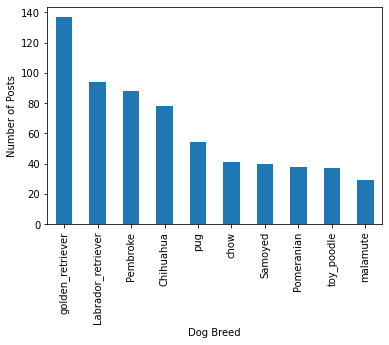

In [340]:
master['p1'].value_counts().nlargest(10).plot.bar();
plt.xlabel('Dog Breed');
plt.ylabel('Number of Posts');

## Find which dog breeds receive highest mean favorites and retweets

In [341]:
test = master[['p1', 'favorite_count', 'retweet_count']]
test

,p1,favorite_count,retweet_count
0,orange,35653.0,7542.0
1,Chihuahua,30840.0,5591.0
2,Chihuahua,23191.0,3705.0
3,paper_towel,38966.0,7722.0
4,basset,37221.0,8323.0
...,...,...,...
1966,miniature_pinscher,96.0,40.0
1967,Rhodesian_ridgeback,266.0,126.0
1968,German_shepherd,111.0,39.0
1969,redbone,120.0,41.0


In [342]:
test = test.groupby(['p1']).sum()
test

,favorite_count,retweet_count
p1,,
Afghan_hound,46667.0,15355.0
African_crocodile,873.0,233.0
African_grey,4772.0,1109.0
African_hunting_dog,1555.0,1026.0
Airedale,57088.0,14410.0
...,...,...
wombat,27499.0,9242.0
wood_rabbit,6757.0,2200.0
wooden_spoon,14605.0,2938.0


In [343]:
test_2 = master['p1'].value_counts().sort_index()

In [344]:
test['tweet_count'] = test_2

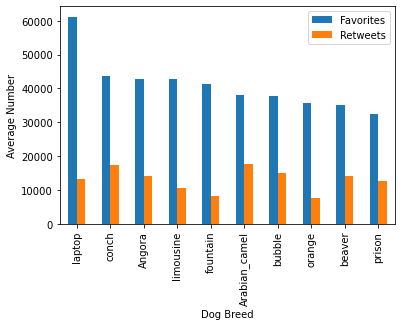

In [345]:
test['mean_favorite'] = test['favorite_count'] / test['tweet_count']
test['mean_retweet'] = test['retweet_count'] / test['tweet_count']
test[['mean_favorite', 'mean_retweet']].sort_values(by=['mean_favorite', 'mean_retweet'], ascending=False)[:10].plot.bar();
plt.xlabel('Dog Breed')
plt.ylabel('Average Number')
plt.legend(['Favorites', 'Retweets'])

Now, this doesn't make much sense. We'll have to exclude the "breeds" with the least repetition.

In [346]:
test['tweet_count'].value_counts(sort=False)

1      175
2       52
3       31
4       23
5       12
6        9
7       12
8        7
9        6
10       5
11       2
12       3
13       4
14       3
15       2
16       2
17       4
18       3
19       1
20       2
21       2
23       1
26       1
27       1
29       1
37       1
38       1
40       1
41       1
54       1
78       1
88       1
94       1
137      1
Name: tweet_count, dtype: int64

We will exclude all that were repeated 9 times or less; since the number of repetitions after 9 decrease significantly

In [347]:
test['mean_favorite'] = test['favorite_count'] / test['tweet_count']
test['mean_retweet'] = test['retweet_count'] / test['tweet_count']
test = test[test['tweet_count'] > 9]
test

,favorite_count,retweet_count,tweet_count,mean_favorite,mean_retweet
p1,,,,,
Airedale,57088.0,14410.0,12,4757.333333,1200.833333
American_Staffordshire_terrier,67311.0,19449.0,13,5177.769231,1496.076923
Bernese_mountain_dog,61390.0,13785.0,10,6139.000000,1378.500000
Blenheim_spaniel,83560.0,22206.0,10,8356.000000,2220.600000
Border_collie,97079.0,22998.0,12,8089.916667,1916.500000
Cardigan,234439.0,66246.0,17,13790.529412,3896.823529
Chesapeake_Bay_retriever,219150.0,56100.0,23,9528.260870,2439.130435
Chihuahua,631505.0,195716.0,78,8096.217949,2509.179487
Eskimo_dog,240456.0,85157.0,18,13358.666667,4730.944444


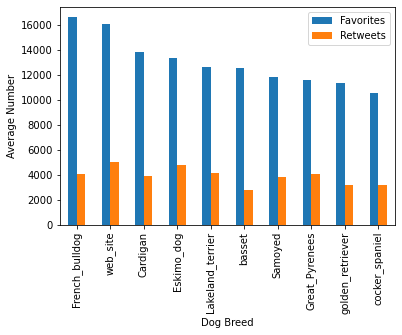

In [348]:
test[['mean_favorite', 'mean_retweet']].sort_values(by=['mean_favorite', 'mean_retweet'], ascending=False)[:10].plot.bar();
plt.xlabel('Dog Breed')
plt.ylabel('Average Number')
plt.legend(['Favorites', 'Retweets'])

This makes more sense (if we exclude the website hanging around)

## Find which stage has the most favorites and retweets

In [349]:
test_4 = master[['stage', 'favorite_count', 'retweet_count']]
test_5 = test_4.groupby('stage').sum()

In [350]:
test_4.groupby('stage')['stage'].count()

stage
doggo             63
doggo/floofer      1
doggo/pupper       8
doggo/puppo        1
floofer            7
pupper           201
puppo             22
Name: stage, dtype: int64

In [351]:
test_5['mean_favorite'] = test_5['favorite_count'] / test_4.groupby('stage')['stage'].count()
test_5['mean_retweet'] = test_5['retweet_count'] / test_4.groupby('stage')['stage'].count()
test_5

,favorite_count,retweet_count,mean_favorite,mean_retweet
stage,,,,
doggo,1154084.0,397173.0,18318.793651,6304.333333
doggo/floofer,15651.0,2999.0,15651.000000,2999.000000
doggo/pupper,104422.0,31692.0,13052.750000,3961.500000
doggo/puppo,43932.0,17094.0,43932.000000,17094.000000
floofer,83129.0,29870.0,11875.571429,4267.142857
pupper,1330384.0,415562.0,6618.825871,2067.472637
puppo,454496.0,125660.0,20658.909091,5711.818182


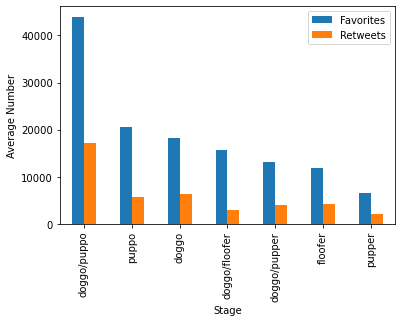

In [352]:
test_5[['mean_favorite', 'mean_retweet']].sort_values(by=['mean_favorite', 'mean_retweet'], ascending=False).plot.bar();
plt.xlabel('Stage')
plt.ylabel('Average Number')
plt.legend(['Favorites', 'Retweets'])

We reached three insights:
1. Golden Retrievers are posted about the most, which hints at them being adopted more and even favored more
2. French Bulldogs had the highest average likes, which means that fans of this page really like photos of these dogs (probably means they are highly photogenic)
3. Puppo had the highest average likes, which could mean that people favor dogs the most at this stage of their life